# **From Memristor to Privacy**

## General

In [1]:
# Standard library
import os
import math
import time
import random
import hashlib
import shutil
import datetime
import gc

import copy
from copy import deepcopy

# Scientific Python
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from scipy.integrate import odeint
from scipy.signal import square
from scipy.stats import wasserstein_distance
from sklearn.metrics import roc_curve, auc
from sklearn.datasets import fetch_olivetti_faces

# Visualization
import seaborn as sns
from matplotlib import rc
from IPython.display import HTML, display

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Subset, TensorDataset, random_split

# Torchvision
import torchvision
import torchvision as tv
import torchvision.transforms as T
import torchvision.transforms.functional as TF
from torchvision.transforms.functional import gaussian_blur

# Neuromorphic / SNN
import snntorch as snn
from snntorch import surrogate, spikegen
import snntorch.spikeplot as splt

import tonic
import tonic.transforms as transforms
import tonic.transforms as tonic_T

# Utilities
from tqdm import tqdm
import requests

c:\Users\pfaso\Documents\Second Paper\Memristive-SNN_Privacy_Model-Inversion_Fault-Injection-Attack\.gpu\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


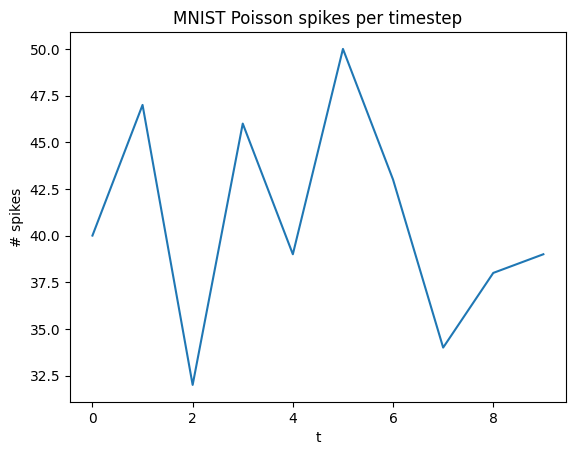

In [2]:
# Cell 0: Data and Encoding
timesteps = 10
bs = 32

# Keep images in [0,1] to use as firing probabilities directly
transform = T.ToTensor()

train_set = tv.datasets.MNIST(root="./data", train=True,  download=True, transform=transform)
test_set  = tv.datasets.MNIST(root="./data", train=False, download=True, transform=transform)

# Use a subset while iterating fast on CPU
max_train, max_test = 60000, 10000 # 5000, 1000 // 15000, 3000 // MAX: 60000, 10000 
train_subset = Subset(train_set, range(max_train))
test_subset  = Subset(test_set,  range(max_test))

train_loader = DataLoader(train_subset, batch_size=bs, shuffle=True,  num_workers=0, pin_memory=False)
test_loader  = DataLoader(test_subset,  batch_size=bs, shuffle=False, num_workers=0, pin_memory=False)

def poisson_encode(img_batch: torch.Tensor, T: int = 10) -> torch.Tensor:
    """
    Vectorized Poisson encoder.
    Returns spikes of shape [T, B, 784] with sparsity
    """
    p = (img_batch.flatten(1) * 0.4).clamp(0, 1)  # sparser than 0.8
    rand = torch.rand(T, *p.shape, device=p.device)
    return (rand < p.unsqueeze(0)).float()

#def poisson_encode(img_batch: torch.Tensor, T: int = 10) -> torch.Tensor:
#    """
#    Ensures moderate firing rates and avoids dead neurons.
#    """
#    x = img_batch.flatten(1)                 # [B, 784]
#    x = (x + 0.2).clamp(0, 1)                # light bias to ensure activity
#    p = (x * 0.55).clamp(0, 1)               # used to be 0.4 to now 0.55
#    rand = torch.rand(T, *p.shape, device=p.device)
#    return (rand < p.unsqueeze(0)).float()

# quick visual check
xb, yb = next(iter(train_loader))
spk = poisson_encode(xb[:1], T=timesteps)
plt.plot(spk.squeeze(1).sum(-1).cpu())
plt.title("MNIST Poisson spikes per timestep")
plt.xlabel("t"); plt.ylabel("# spikes")
plt.show()

## From Memristor to SNN

In [3]:
## Cell 1
class ReRAMAnalogDevice_IBMClone(nn.Module):
    def __init__(self,
                 Gmin=1e-6, # 1e-5
                 Gmax=1e-3,
                 w_min=-1.0,
                 w_max=1.0,
                 A_up=-1.0,     # -1.18
                 A_down=-0.02,  # -0.081
                 gamma_up=5.0,
                 gamma_down=5.0,
                 w_max_dtod=0.1, # 0.03
                 w_min_dtod=0.01,
                 write_noise_std=0.005,
                 read_noise_std=0.001): # write_noise_std 0.05 read_noise_std 0.01 w_max_dtod 0.3 w_min_dtod 0.3 0.03 0.03  w_max_dtod=0.01, w_min_dtod=0.003,
        super().__init__()
        self.Gmin = Gmin  # minimum conductance value
        self.Gmax = Gmax  # maximum conductance value
        self.w_min = w_min  # minimum normalized weight
        self.w_max = w_max  # maximum normalized weight
        self.A_up = A_up  # amplitude factor for potentiation
        self.A_down = A_down  # amplitude factor for depression
        self.gamma_up = gamma_up  # slope factor for potentiation
        self.gamma_down = gamma_down  # slope factor for depression
        self.w_max_dtod = w_max_dtod  # device to device scale variation
        self.w_min_dtod = w_min_dtod  # device to device offset variation
        self.write_noise_std = write_noise_std  # cycle to cycle write noise
        self.read_noise_std = read_noise_std  # read noise magnitude

    def logical_to_conductance(self, W):
        Wn = torch.clamp(W / self.w_max, -1.0, 1.0)  # normalize logical weights
        g = (Wn + 1.0) * 0.5  # map to range between zero and one
        G = self.Gmin + g * (self.Gmax - self.Gmin)  # map to conductance range
        return G, g

    def d2d_variability(self, G): # 5%
        # Multiplicative device variation 
        scale = 1.0 + self.w_max_dtod * torch.randn_like(G) * 0.001 # w_max_dtod=0.1
        # Additive variance (scaled to the physical conductance window)
        conductance_window = self.Gmax - self.Gmin
        # apply both kinds of variation, additive device variation
        offset = self.w_min_dtod * conductance_window * torch.randn_like(G)
        G_var = G * scale # (G * scale) + offset/100 //// G + offset/100  ////
        # keep inside physical range
        # G_var = G
        # Clamp to physical constraints
        G_clamped = torch.clamp(G_var, self.Gmin, self.Gmax)
        return G_clamped
    
    # Resistance drift - no mention, stability of the R value 
    # Not all of them have the same drift, depending on the material and device structure (technology)
    def apply_drift(self, G, t=1.0, nu=0.005):
        # power-law drift: G(t) = G0 * (t/t0)^(-nu)
        drift = (t ** (-nu))
        return torch.clamp(G * drift, self.Gmin, self.Gmax)
    
    def endurance_degrade(self, G, cycles=1):
        degrade = 1 - 1e-8 * cycles 
        return torch.clamp(G * degrade, self.Gmin, self.Gmax)

    def update(self, G, pulse):
        w = 2.0 * (G - self.Gmin) / (self.Gmax - self.Gmin) - 1.0  # convert conductance to normalized weight
        if torch.is_tensor(pulse):
            pulse = float(pulse.item())
        else:
            pulse = float(pulse)

        if pulse > 0:
            delta = self.A_up * torch.exp(-self.gamma_up * (w - self.w_min))  # potentiation update
        else:
            delta = -self.A_down * torch.exp(-self.gamma_down * (self.w_max - w))  # depression update
            
        noise = self.write_noise_std * torch.randn_like(delta)  # add write noise
        w_new = torch.clamp(w + delta + noise, -1.0, 1.0)       # clip normalized weight
        G_new = self.Gmin + (w_new + 1.0) * 0.5 * (self.Gmax - self.Gmin)  # convert back to conductance
        return G_new

    def read(self, G):
        noise = self.read_noise_std * torch.randn_like(G)       # generate read noise
        G_noisy = G + noise  # add noise to conductance
        G_clamped = torch.clamp(G_noisy, self.Gmin, self.Gmax)  # clip to physical bounds
        return G_clamped

In [4]:
# Cell 2        
class ReRAMConv2d_IBMClone(nn.Module):
    def __init__(self, in_ch, out_ch, k, device_model, gain):
        super().__init__()
        self.device_model = device_model
        self.W_pos = nn.Parameter(torch.randn(out_ch, in_ch, k, k) * 0.05)
        self.W_neg = nn.Parameter(torch.randn(out_ch, in_ch, k, k) * 0.05)
        # self.W_logical = nn.Parameter(torch.randn(out_ch, in_ch, k, k) * 0.1) # logical weights
        self.bias = nn.Parameter(torch.zeros(out_ch)) 
        self.k = k # kernel size
        self.gain = gain
        self.training_cycles = 0 # Track updates for endurance

        self.register_buffer("time_since_program", torch.tensor(1.0))
        self.register_buffer("program_cycles", torch.tensor(0.0))

        # Spatial non-uniformity (0.5% variation)
        self.register_buffer("spatial_map", torch.rand(1, out_ch, 1, 1) * 0.005)
        # Stuck devices (0.1% stuck, tried with 1%) 
        stuck_mask_pos = torch.rand_like(self.W_pos) < 0.01
        stuck_mask_neg = torch.rand_like(self.W_neg) < 0.01
        self.register_buffer("stuck_mask_pos", stuck_mask_pos)
        self.register_buffer("stuck_mask_neg", stuck_mask_neg)

        # Simulates voltage dropping across the crossbar columns
        ir_profile = torch.linspace(1.0, 0.85, steps=out_ch).view(out_ch, 1, 1, 1)
        self.register_buffer("ir_drop_map", ir_profile)


    def forward(self, x):

        with torch.no_grad():
            self.time_since_program += 1.0
        # For sanity test, we ignore the physical memristor model
        # and use the logical weights directly as in a normal Conv2d
        # W_eff = self.W_logical * 5.0  # effective weight equal to logical weight
        # G_ideal, _ = self.device_model.logical_to_conductance(self.W_logical)
        G_pos, _ = self.device_model.logical_to_conductance(self.W_pos)
        G_neg, _ = self.device_model.logical_to_conductance(self.W_neg)

        # gain = 900
        #W_eff = G_ideal * self.gain
        
        #G_pos = self.device_model.apply_drift(G_pos) 
        #G_neg = self.device_model.apply_drift(G_neg)

        # IR-drop 
        #activation_strength = x.mean()  # scale according to the actual input
        #ir_drop = 1.0 - 0.15 * activation_strength  # entre 1.0 y 0.85
        #ir_scale = torch.linspace(1.0, 0.85, steps=G_pos.shape[-1]).to(G_pos.device)
        #if G_pos.dim() == 4:  # Conv filters
        #    ir_scale = ir_scale.view(1,1,1,-1)
        #G_pos = G_pos * ir_scale
        #G_neg = G_neg * ir_scale

        # IR-drop
        # activation_strength = x.mean()  # scale according to the actual input
        # ir_drop = 0.999 # 1.0 - 0.01 * activation_strength  # between 1.0 - 0.85 0.1 /0.01
            # Apply spatial non-uniformity
        # G_pos = G_pos * ir_drop # (1 + self.spatial_map) 
        # G_neg = G_neg * ir_drop # (1 + self.spatial_map)

        # Effective physical read (with read noise + D2D variability)
        #G_pos = self.device_model.read(self.device_model.d2d_variability(G_pos))
        #G_neg = self.device_model.read(self.device_model.d2d_variability(G_neg))
        # alfa to Gmin and Gmax, then it is fixed
        
        # Attribute path
        #G_pos = G_pos * (1.0 + self.w_max_dtod * torch.randn_like(G_pos) * 0.001) + \
        #        self.w_min_dtod * (self.Gmax - self.Gmin) * torch.randn_like(G_pos)
                
        #G_neg = G_neg * (1.0 + self.w_max_dtod * torch.randn_like(G_neg) * 0.001) + \
        #        self.w_min_dtod * (self.Gmax - self.Gmin) * torch.randn_like(G_neg)

        # Training is specifically for the hardware. Some epochs or training step.
        #D2D and C2C 

        #if not self.training: # Sneak-path noise and Endurance degradation
        #   sneak_noise = 0.003 * torch.randn_like(G_pos)
        #   G_pos = torch.clamp(G_pos + sneak_noise, self.device_model.Gmin, self.device_model.Gmax)
        #   G_neg = torch.clamp(G_neg + sneak_noise, self.device_model.Gmin, self.device_model.Gmax)
        #   G_pos = self.device_model.endurance_degrade(G_pos)
        #   G_neg = self.device_model.endurance_degrade(G_neg)

        # Sneak-path noise
        #sneak_noise = 0.003 * torch.randn_like(G_pos)  # 0.3%
        #G_pos = torch.clamp(G_pos + sneak_noise, self.device_model.Gmin, self.device_model.Gmax)
        #G_neg = torch.clamp(G_neg + sneak_noise, self.device_model.Gmin, self.device_model.Gmax)
        # Endurance degradation
        #G_pos = self.device_model.endurance_degrade(G_pos)
        #G_neg = self.device_model.endurance_degrade(G_neg)

        ### CHANGE: apply drift relative to last programming
        G_pos = self.device_model.apply_drift(G_pos, self.time_since_program)
        G_neg = self.device_model.apply_drift(G_neg, self.time_since_program)

        ### CHANGE: endurance degradation accumulative
        G_pos = self.device_model.endurance_degrade(G_pos, self.program_cycles)
        G_neg = self.device_model.endurance_degrade(G_neg, self.program_cycles)

        with torch.no_grad(): 
            activation_strength = x.mean() # scale according to the actual input
            ir_drop = 1.0 - 0.01 * activation_strength # 0.999 # 1.0 - 0.01 * activation_strength // between 1.0 - 0.85 0.1 /0.01
        G_pos = G_pos * ir_drop # (1 + self.spatial_map)
        G_neg = G_neg * ir_drop # (1 + self.spatial_map)

        # Multiplicative (Scale) and additive (Offset) variation for Positives
        scale_pos = 1.0 + self.device_model.w_max_dtod * torch.randn_like(G_pos) * 0.001
        offset_pos = self.device_model.w_min_dtod * (self.device_model.Gmax - self.device_model.Gmin) * torch.randn_like(G_pos)
        G_pos = (G_pos * scale_pos) + (offset_pos / 100) # Maintaining your division by 100 logic if necessary

        # Multiplicative and additive variation for Negatives
        scale_neg = 1.0 + self.device_model.w_max_dtod * torch.randn_like(G_neg) * 0.001
        offset_neg = self.device_model.w_min_dtod * (self.device_model.Gmax - self.device_model.Gmin) * torch.randn_like(G_neg)
        G_neg = (G_neg * scale_neg) + (offset_neg / 100)
        
        noise_scale = 0.0002 # if self.training else 0.005
        if self.training and noise_scale > 0.0:
            sneak_noise = noise_scale * torch.randn_like(G_pos)
            G_pos = torch.clamp(G_pos + sneak_noise, self.device_model.Gmin, self.device_model.Gmax)
            G_neg = torch.clamp(G_neg + sneak_noise, self.device_model.Gmin, self.device_model.Gmax)

        #G_pos = self.device_model.endurance_degrade(G_pos)
        #G_neg = self.device_model.endurance_degrade(G_neg)
        
        # Apply stuck devices
        G_pos = torch.where(self.stuck_mask_pos, torch.full_like(G_pos, self.device_model.Gmax), G_pos)
        G_neg = torch.where(self.stuck_mask_neg, torch.full_like(G_neg, self.device_model.Gmin), G_neg)

        W_eff = (G_pos - G_neg) * self.gain
        out = F.conv2d(x, W_eff, bias=self.bias, padding=self.k // 2)  # standard conv
        return out

class ReRAMLinear_IBMClone(nn.Module):
    def __init__(self, in_features, out_features, device_model, gain):
        super().__init__()
        self.device_model = device_model  
        # self.W_logical = nn.Parameter(torch.randn(out_features, in_features) * 0.1)  # logical weights
        self.W_pos = nn.Parameter(torch.randn(out_features, in_features) * 0.05)
        self.W_neg = nn.Parameter(torch.randn(out_features, in_features) * 0.05)
        self.bias = nn.Parameter(torch.zeros(out_features))  # bias

        self.register_buffer("time_since_program", torch.tensor(1.0))
        self.register_buffer("program_cycles", torch.tensor(0.0))

        # Stuck devices (0.1% stuck)
        stuck_mask_pos = torch.rand_like(self.W_pos) < 0.001
        stuck_mask_neg = torch.rand_like(self.W_neg) < 0.001
        self.register_buffer("stuck_mask_pos", stuck_mask_pos)
        self.register_buffer("stuck_mask_neg", stuck_mask_neg)
        
        self.gain = gain

    def forward(self, x):
        # For sanity test, use logical weights directly
        # W_eff = self.W_logical * 5.0  # effective weight
        # G_ideal, _ = self.device_model.logical_to_conductance(self.W_logical)
        G_pos, _ = self.device_model.logical_to_conductance(self.W_pos)
        G_neg, _ = self.device_model.logical_to_conductance(self.W_neg)

        # Effective physical read (with read noise + D2D variability)
        #G_pos_r = self.device_model.read(self.device_model.d2d_variability(G_pos))
        #G_neg_r = self.device_model.read(self.device_model.d2d_variability(G_neg))

        #W_eff = (G_pos_r - G_neg_r) * self.gain
        # gain = 900

        # 1. Convert logical to conductance
        #G_pos, _ = self.device_model.logical_to_conductance(self.W_pos)
        #G_neg, _ = self.device_model.logical_to_conductance(self.W_neg)
        # 2. Apply d2d variability
        #G_pos_v = self.device_model.d2d_variability(G_pos)
        #G_neg_v = self.device_model.d2d_variability(G_neg)
        # 3. Apply read noise + drift
        #G_pos_r = self.device_model.apply_drift(self.device_model.read(G_pos))
        #G_neg_r = self.device_model.apply_drift(self.device_model.read(G_neg))
        # 4. Effective weight
        #W_eff = (G_pos_r - G_neg_r) * self.gain

        G_pos = self.device_model.apply_drift(G_pos, self.time_since_program)
        G_neg = self.device_model.apply_drift(G_neg, self.time_since_program)

        G_pos = self.device_model.endurance_degrade(G_pos, self.program_cycles)
        G_neg = self.device_model.endurance_degrade(G_neg, self.program_cycles)
        
        with torch.no_grad(): 
            activation_strength = x.mean() # scale according to the actual input
            ir_drop = 1.0 - 0.01 * activation_strength # 0.999 # 1.0 - 0.01 * activation_strength // between 1.0 - 0.85 0.1 /0.01
        G_pos = G_pos * ir_drop # (1 + self.spatial_map)
        G_neg = G_neg * ir_drop # (1 + self.spatial_map)

        # Multiplicative (Scale) and additive (Offset) variation for Positives
        scale_pos = 1.0 + self.device_model.w_max_dtod * torch.randn_like(G_pos) * 0.001
        offset_pos = self.device_model.w_min_dtod * (self.device_model.Gmax - self.device_model.Gmin) * torch.randn_like(G_pos)
        G_pos = (G_pos * scale_pos) + (offset_pos / 100) # Maintaining your division by 100 logic if necessary

        # Multiplicative and additive variation for Negatives
        scale_neg = 1.0 + self.device_model.w_max_dtod * torch.randn_like(G_neg) * 0.001
        offset_neg = self.device_model.w_min_dtod * (self.device_model.Gmax - self.device_model.Gmin) * torch.randn_like(G_neg)
        G_neg = (G_neg * scale_neg) + (offset_neg / 100)

        # Training Sneak-Path Noise
        if self.training:
            sneak_noise_p = 0.0002 * torch.randn_like(G_pos)
            sneak_noise_n = 0.0002 * torch.randn_like(G_neg)
            G_pos = torch.clamp(G_pos + sneak_noise_p, self.device_model.Gmin, self.device_model.Gmax)
            G_neg = torch.clamp(G_neg + sneak_noise_n, self.device_model.Gmin, self.device_model.Gmax)
        
        #G_pos = self.device_model.endurance_degrade(G_pos)
        #G_neg = self.device_model.endurance_degrade(G_neg)

        G_pos = torch.where(self.stuck_mask_pos, torch.full_like(G_pos, self.device_model.Gmax), G_pos)
        G_neg = torch.where(self.stuck_mask_neg, torch.full_like(G_neg, self.device_model.Gmin), G_neg)

        W_eff = (G_pos - G_neg) * self.gain  # G_ideal * self.gain

        out = F.linear(x, W_eff, self.bias)  # standard linear layer
        return out
    
def surrogate_spike(x, alpha=10.0):
    # This returns a binary spike during the forward pass
    # Backward pass uses a smooth derivative through sigmoid
    out = (x > 0).float()  # forward spike
    sigmoid_grad = torch.sigmoid(alpha * x) * (1 - torch.sigmoid(alpha * x))  # surrogate gradient
    return out + sigmoid_grad - sigmoid_grad.detach()  # straight through trick

def poisson_encode_dynamic(x, T=25, base_rate=1.0):
    x_clamped = x.clamp(0.0, 1.0)  # ensure input is in valid range
    p = (x_clamped * base_rate).clamp(0.0, 1.0)  # compute spike probability
    rand = torch.rand(T, *x.shape, device=x.device)  # sample uniform random numbers
    spikes = (rand < p.unsqueeze(0)).float()  # produce spike trains
    return spikes

class LIF_Pro(nn.Module):
    def __init__(self, tau, v_th, v_reset=0.0):
        super().__init__()
        self.tau = tau  # membrane time constant
        self.v_th = nn.Parameter(torch.tensor(v_th))  # trainable threshold
        self.v_reset = v_reset  # reset potential

    def forward(self, I, v):
        if v is None:
            v = torch.zeros_like(I)  # initialize membrane if needed
        v = v + (I - v) / self.tau  # leaky integration step
        spk = surrogate_spike(v - self.v_th)  # generate spikes with surrogate gradient
        # v = torch.where(spk > 0, torch.tensor(self.v_reset, device=v.device), v)  # reset after spike
        v_reset_val = v.new_tensor(self.v_reset) # reset after spike
        v = torch.where(spk > 0, v_reset_val, v)
        return spk, v

In [5]:
# Cell 3
class MemSNN_ReRAM_IBM(nn.Module):
    def __init__(self, T):
        super().__init__()
        self.T = T
        self.reram_device = ReRAMAnalogDevice_IBMClone()

        # Memristive conv + BN + LIF (layer 1)
        self.conv1 = ReRAMConv2d_IBMClone(
            1, 16, k=5, device_model=self.reram_device, gain=2000
        )
        self.bn1 = nn.BatchNorm2d(16, momentum=0.05)
        self.lif1 = LIF_Pro(tau=5.0, v_th=0.15)

        # Memristive conv + BN + LIF (layer 2)
        self.conv2 = ReRAMConv2d_IBMClone(
            16, 32, k=5, device_model=self.reram_device, gain=350
        )
        self.bn2 = nn.BatchNorm2d(32, momentum=0.05)
        self.lif2 = LIF_Pro(tau=5.0, v_th=0.50)

        # Memristive linear readout
        self.fc = ReRAMLinear_IBMClone(
            32 * 7 * 7, 10, device_model=self.reram_device, gain=2500
        )

    def forward(self, spikes, debug=False):
        """
        spikes: [T, B, 1, 28, 28] with values in {0,1} (or [0,1] if continuous)
        returns: [B, 10] time-averaged logits
        """
        T = self.T
        B = spikes.size(1)

        # Sanity checks (helps catch shape bugs early)
        assert spikes.dim() == 5, "Expected spikes shape [T, B, 1, 28, 28]"
        assert spikes.size(0) == T, "spikes T does not match model.T"
        assert spikes.size(2) == 1 and spikes.size(3) == 28 and spikes.size(4) == 28, "Expected MNIST shape"

        v1 = None
        v2 = None

        # Accumulate logits directly (faster than list + stack each iter)
        logits_sum = None

        # Debug stats kept on GPU, converted once at the end
        if debug:
            spk1_sum = torch.zeros((), device=spikes.device)
            spk2_sum = torch.zeros((), device=spikes.device)

        for t in range(T):
            x = spikes[t]  # [B, 1, 28, 28]

            # Layer 1
            u1 = self.bn1(self.conv1(x))
            spk1, v1 = self.lif1(u1, v1)
            s1p = F.avg_pool2d(spk1, 2)  # [B, 16, 14, 14]

            # Layer 2
            u2 = self.bn2(self.conv2(s1p))
            spk2, v2 = self.lif2(u2, v2)
            s2p = F.avg_pool2d(spk2, 2)  # [B, 32, 7, 7]

            # Readout
            flat = s2p.view(B, -1)
            logits_t = self.fc(flat)  # [B, 10]

            if logits_sum is None:
                logits_sum = logits_t
            else:
                logits_sum = logits_sum + logits_t

            if debug:
                spk1_sum = spk1_sum + spk1.mean()
                spk2_sum = spk2_sum + spk2.mean()

        # If something went very wrong (e.g., T=0), fail loudly instead of returning None
        if logits_sum is None:
            raise RuntimeError("logits_sum is None. Check that T > 0 and spikes has correct shape.")

        logits_mean = logits_sum / float(T)

        if debug:
            spk1_mean = (spk1_sum / float(T)).detach().item()
            spk2_mean = (spk2_sum / float(T)).detach().item()
            print("Debug spikes: layer1 mean over T:", spk1_mean)
            print("Debug spikes: layer2 mean over T:", spk2_mean)

        return logits_mean

In [6]:
# Cell 4 - training for MemSNN_ReRAM_IBM

torch.backends.cudnn.benchmark = True
torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True

device = "cuda" if torch.cuda.is_available() else "cpu"
T = 25

# mixed precision 
use_amp = True
# scaler = torch.cuda.amp.GradScaler(enabled=(use_amp and device == "cuda"))
scaler = torch.amp.GradScaler('cuda', enabled=(use_amp and device == "cuda"))

model = MemSNN_ReRAM_IBM(T).to(device)

# Reset BN stats
model.bn1.reset_running_stats()
model.bn2.reset_running_stats()

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[10, 18], gamma=0.5)

def poisson_encode_images_dynamic(x, T, base_rate=1.0):
    """
    x: [B, 1, 28, 28] in [0,1]
    returns spikes: [T, B, 1, 28, 28] in {0,1}
    """
    if x.dim() == 2 and x.size(1) == 28 * 28:
        x = x.view(-1, 1, 28, 28)
    assert x.dim() == 4 and x.size(1) == 1 and x.size(2) == 28 and x.size(3) == 28, \
        f"Expected xb as [B,1,28,28], got {tuple(x.shape)}"

    x = x.clamp(0.0, 1.0)
    p = (x * base_rate).clamp(0.0, 1.0)

    rand = torch.rand(T, *x.shape, device=x.device)
    spikes = (rand < p.unsqueeze(0)).float()  # [T,B,1,28,28]
    return spikes

@torch.no_grad()
def evaluate(model, loader, base_rate=1.0):
    model.eval()
    correct = 0
    total = 0

    for xb, yb in loader:
        xb = xb.to(device, non_blocking=True)
        yb = yb.to(device, non_blocking=True)

        spikes = poisson_encode_images_dynamic(xb, T=model.T, base_rate=base_rate)
        assert spikes.dim() == 5, f"Spikes must be 5D, got {spikes.dim()}D with shape {tuple(spikes.shape)}"

        with torch.amp.autocast('cuda', enabled=(use_amp and device == "cuda")):
            logits = model(spikes)

        pred = logits.argmax(1)
        correct += (pred == yb).sum().item()
        total += yb.size(0)

    return correct / max(total, 1)

epochs = 5
train_acc_hist = []
test_acc_hist = []

print("bn1 running_mean abs mean (init):", model.bn1.running_mean.abs().mean().item())

# One-time shape sanity check
model.eval()
xb0, yb0 = next(iter(train_loader))
xb0 = xb0.to(device, non_blocking=True)
sp0 = poisson_encode_images_dynamic(xb0[:4], T=model.T, base_rate=1.0)
print("Sanity check shapes -> xb:", tuple(xb0[:4].shape), "spikes:", tuple(sp0.shape))
with torch.no_grad():
    out0 = model(sp0)
print("Sanity check logits shape:", tuple(out0.shape), "expected:", (4, 10))

for epoch in range(1, epochs + 1):
    model.train()
    correct = 0
    total = 0
    loss_sum = 0.0
    batch_i = 0

    for xb, yb in train_loader:
        batch_i += 1

        xb = xb.to(device, non_blocking=True)
        yb = yb.to(device, non_blocking=True)

        spikes = poisson_encode_images_dynamic(xb, T=model.T, base_rate=1.0)

        debug_flag = (batch_i == 1)

        optimizer.zero_grad(set_to_none=True)

        with torch.amp.autocast('cuda', enabled=(use_amp and device == "cuda")):
            logits = model(spikes, debug=debug_flag)
            loss = F.cross_entropy(logits, yb)
            
        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        scaler.step(optimizer)
        scaler.update()
        ### Treat optimizer update as memristor programming event
        for m in model.modules():
            if isinstance(m, (ReRAMConv2d_IBMClone, ReRAMLinear_IBMClone)):
                m.time_since_program.fill_(1.0)
                m.program_cycles += 1.0
        
        if batch_i == 1:
            with torch.no_grad():
                g_conv1_pos = model.conv1.W_pos.grad
                g_conv1_neg = model.conv1.W_neg.grad
                g_fc_pos = model.fc.W_pos.grad
                g_fc_neg = model.fc.W_neg.grad
                print("Grad conv1_pos mean abs:", g_conv1_pos.abs().mean().item() if g_conv1_pos is not None else None)
                print("Grad conv1_neg mean abs:", g_conv1_neg.abs().mean().item() if g_conv1_neg is not None else None)
                print("Grad fc_pos mean abs:", g_fc_pos.abs().mean().item() if g_fc_pos is not None else None)
                print("Grad fc_neg mean abs:", g_fc_neg.abs().mean().item() if g_fc_neg is not None else None)

        with torch.no_grad():
            pred = logits.argmax(1)
            correct += (pred == yb).sum().item()
            total += yb.size(0)
            loss_sum += loss.item() * yb.size(0)

        if batch_i % 75 == 0:
            print(f"Epoch {epoch}, batch {batch_i}/{len(train_loader)}, loss {loss.item():.4f}")

    scheduler.step()

    train_acc = correct / max(total, 1)
    test_acc = evaluate(model, test_loader, base_rate=1.0)

    train_acc_hist.append(train_acc)
    test_acc_hist.append(test_acc)
    
    # w Cuda
    print(
        f"Epoch {epoch}/{epochs} - loss={loss_sum/max(total,1):.4f}, "
        f"train_acc={train_acc*100:.2f}%, test_acc={test_acc*100:.2f}%"
    )

bn1 running_mean abs mean (init): 0.0
Sanity check shapes -> xb: (4, 1, 28, 28) spikes: (25, 4, 1, 28, 28)
Sanity check logits shape: (4, 10) expected: (4, 10)
Debug spikes: layer1 mean over T: 0.18091407418251038
Debug spikes: layer2 mean over T: 0.08743682503700256
Grad conv1_pos mean abs: 0.0049385023303329945
Grad conv1_neg mean abs: 0.0049469610676169395
Grad fc_pos mean abs: 0.002511057071387768
Grad fc_neg mean abs: 0.002508372301235795
Epoch 1, batch 75/1875, loss 2.4180
Epoch 1, batch 150/1875, loss 2.4284
Epoch 1, batch 225/1875, loss 2.1543
Epoch 1, batch 300/1875, loss 1.9007
Epoch 1, batch 375/1875, loss 1.4651
Epoch 1, batch 450/1875, loss 1.2054
Epoch 1, batch 525/1875, loss 1.0711
Epoch 1, batch 600/1875, loss 1.1012
Epoch 1, batch 675/1875, loss 0.9779
Epoch 1, batch 750/1875, loss 1.2576
Epoch 1, batch 825/1875, loss 0.7071
Epoch 1, batch 900/1875, loss 0.9057
Epoch 1, batch 975/1875, loss 0.9158
Epoch 1, batch 1050/1875, loss 0.5099
Epoch 1, batch 1125/1875, loss 0.7

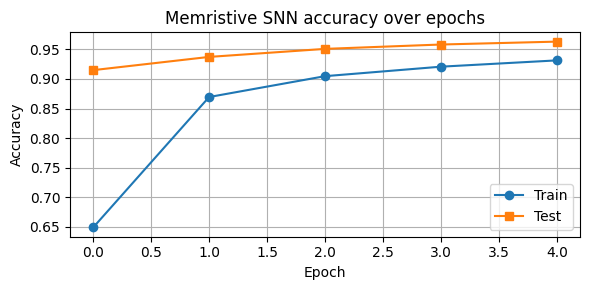

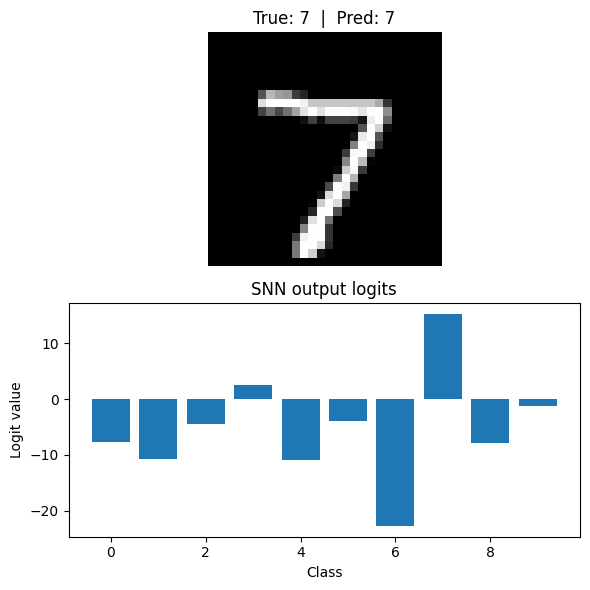

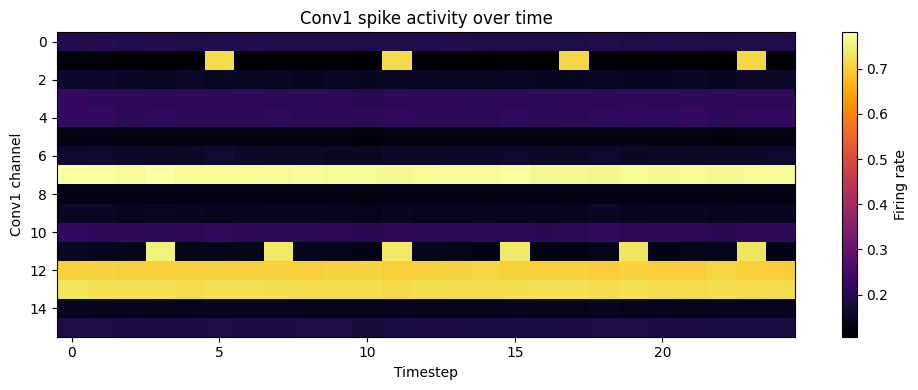

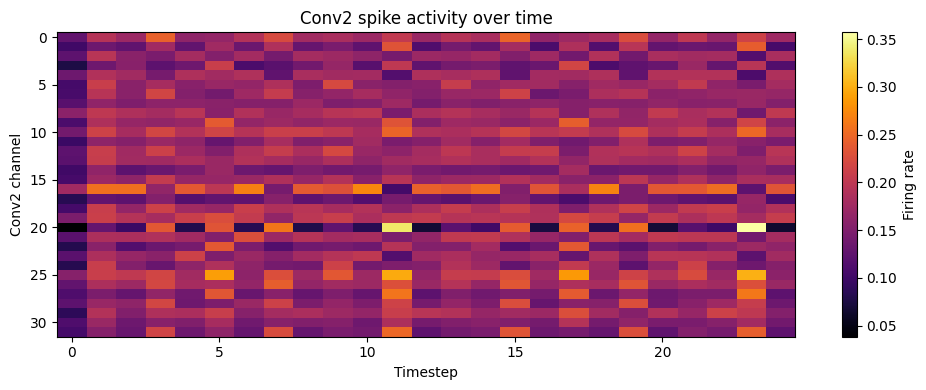

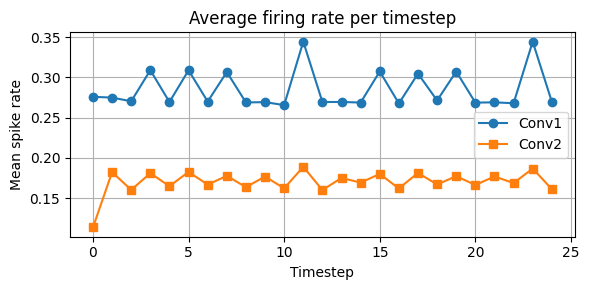

In [13]:
# Accuracy curves - AA
plt.figure(figsize=(6,3))
plt.plot(train_acc_hist, label="Train", marker="o")
plt.plot(test_acc_hist, label="Test", marker="s")
plt.title("Memristive SNN accuracy over epochs")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

model.eval()
xb, yb = next(iter(test_loader))
xb = xb.to(device)
yb = yb.to(device)

spikes = poisson_encode_dynamic(xb, T=model.T)
logits = model(spikes)
pred = logits.argmax(1)

idx = 0  # first image

plt.figure(figsize=(6,6))

plt.subplot(2,1,1)
plt.imshow(xb[idx].cpu().squeeze(), cmap="gray")
plt.title(f"True: {yb[idx].item()}  |  Pred: {pred[idx].item()}")
plt.axis("off")

plt.subplot(2,1,2)
plt.bar(range(10), logits[idx].cpu().detach().numpy())
plt.title("SNN output logits")
plt.xlabel("Class")
plt.ylabel("Logit value")
plt.tight_layout()
plt.show()

model.eval()
with torch.no_grad():
    spikes = poisson_encode_dynamic(xb[:4], T=model.T)

    conv1_rates = np.zeros((16, model.T))
    conv2_rates = np.zeros((32, model.T))

    v1, v2 = None, None

    for t in range(model.T):
        x = spikes[t]

        # Conv1
        u1 = model.bn1(model.conv1(x))
        spk1, v1 = model.lif1(u1, v1)
        s1p = F.avg_pool2d(spk1, 2)
        conv1_rates[:, t] = spk1.mean(dim=(0,2,3)).cpu().numpy()

        # Conv2
        u2 = model.bn2(model.conv2(s1p))
        spk2, v2 = model.lif2(u2, v2)
        conv2_rates[:, t] = spk2.mean(dim=(0,2,3)).cpu().numpy()

plt.figure(figsize=(10,4))
plt.imshow(conv1_rates, aspect="auto", cmap="inferno")
plt.colorbar(label="Firing rate")
plt.xlabel("Timestep")
plt.ylabel("Conv1 channel")
plt.title("Conv1 spike activity over time")
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,4))
plt.imshow(conv2_rates, aspect="auto", cmap="inferno")
plt.colorbar(label="Firing rate")
plt.xlabel("Timestep")
plt.ylabel("Conv2 channel")
plt.title("Conv2 spike activity over time")
plt.tight_layout()
plt.show()

mean_rate_c1 = conv1_rates.mean(axis=0)
mean_rate_c2 = conv2_rates.mean(axis=0)

plt.figure(figsize=(6,3))
plt.plot(mean_rate_c1, marker="o", label="Conv1")
plt.plot(mean_rate_c2, marker="s", label="Conv2")
plt.title("Average firing rate per timestep")
plt.xlabel("Timestep")
plt.ylabel("Mean spike rate")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [246]:
@torch.no_grad()
def evaluate_mc_runs(model, loader, mc_runs=30, seed=123, chunk_mc=None):
    """
    Returns a list of accuracies, one per MC run.

    This is vectorized:
    - For each batch we sample spikes for all MC runs (or in chunks)
    - Run the model once per chunk by merging (MC, batch) into a single batch
    - Accumulate correct predictions per MC run
    """
    device = next(model.parameters()).device
    model.eval()

    if chunk_mc is None:
        chunk_mc = mc_runs

    correct_per_run = torch.zeros(mc_runs, device=device)
    total = 0

    # Make results reproducible across runs
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

    for xb, yb in loader:
        xb = xb.to(device, non_blocking=True)
        yb = yb.to(device, non_blocking=True)

        B = xb.size(0)
        T = model.T
        total += B

        run_start = 0
        while run_start < mc_runs:
            run_end = min(run_start + chunk_mc, mc_runs)
            r = run_end - run_start

            # Independent Poisson sampling for each MC run (vectorized)
            x_clamped = xb.clamp(0.0, 1.0)
            p = (x_clamped * 1.0).clamp(0.0, 1.0)  # base_rate=1.0
            rand = torch.rand(r, T, *xb.shape, device=device)
            spikes = (rand < p.unsqueeze(0).unsqueeze(0)).float()  # [r, T, B, 1, 28, 28]

            # [r, T, B, 1, 28, 28] -> [T, r*B, 1, 28, 28]
            spikes_merged = spikes.permute(1, 0, 2, 3, 4, 5).contiguous().view(T, r * B, 1, 28, 28)

            logits = model(spikes_merged)  # [r*B, 10]
            preds = logits.argmax(dim=1).view(r, B)  # [r, B]

            correct_per_run[run_start:run_end] += (preds == yb.unsqueeze(0)).sum(dim=1)

            run_start = run_end

    accs = (correct_per_run / float(max(total, 1))).detach().cpu().tolist()
    return accs


def mean_std_ci(accs, ci=0.95):
    """
    Student-t CI half-width (useful for small mc_runs).
    Returns mean, std, half_width.
    """
    accs = np.array(accs, dtype=np.float64)
    n = len(accs)
    mean = float(accs.mean())
    std = float(accs.std(ddof=1)) if n > 1 else 0.0

    t_table = {
        2: 12.706, 3: 4.303, 4: 3.182, 5: 2.776, 6: 2.571, 7: 2.447, 8: 2.365, 9: 2.306, 10: 2.262,
        15: 2.145, 20: 2.093, 25: 2.060, 30: 2.042
    }
    df = n - 1
    if df <= 1:
        tcrit = 0.0
    elif df >= 30:
        tcrit = 1.96
    else:
        keys = sorted(t_table.keys())
        k = max([kk for kk in keys if kk <= df])
        tcrit = t_table[k]

    half = tcrit * std / math.sqrt(n) if n > 1 else 0.0
    return mean, std, half


mc_runs = 30
accs = evaluate_mc_runs(model, test_loader, mc_runs=mc_runs, seed=123, chunk_mc=10)
mean, std, half = mean_std_ci(accs)

print(f"Test acc (MC-{mc_runs}): {mean*100:.2f}% ± {half*100:.2f}% (95% CI), std={std*100:.2f}%")
print(f"Raw accs: min={min(accs)*100:.2f}%, max={max(accs)*100:.2f}%")

print("bn1 running_mean mean abs:", model.bn1.running_mean.abs().mean().item())
print("bn1 running_var mean:", model.bn1.running_var.mean().item())
print("bn2 running_mean mean abs:", model.bn2.running_mean.abs().mean().item())
print("bn2 running_var mean:", model.bn2.running_var.mean().item())

Test acc (MC-30): 96.80% ± 0.02% (95% CI), std=0.05%
Raw accs: min=96.64%, max=96.90%
bn1 running_mean mean abs: 0.06485432386398315
bn1 running_var mean: 0.07278072834014893
bn2 running_mean mean abs: 0.13152246177196503
bn2 running_var mean: 0.06390516459941864


## Model Inversion - MNIST

In [7]:
# Spike generation (rate/Bernoulli encoding)
def bernoulli_rate_encode(x_img: torch.Tensor, T: int, base_rate: float = 1.0) -> torch.Tensor:
    """
    Bernoulli (rate) encoding:
      x_img: [B,1,28,28] in [0,1]
      returns spikes: [T,B,1,28,28] in {0,1}
    Probability per voxel per timestep: p = clamp(x_img * base_rate, 0, 1)
    """
    x_img = x_img.clamp(0.0, 1.0)                                  # keep valid range
    p = (x_img * base_rate).clamp(0.0, 1.0)                        # spike probability map
    rand = torch.rand((T,) + x_img.shape, device=x_img.device)     # random uniforms
    return (rand < p.unsqueeze(0)).float()                         # sample spikes


# Margin-based inversion loss (avoids softmax saturation)
def logit_margin_loss(logits: torch.Tensor, target_class: int, lam: float = 1.0):
    """
    Margin loss:
        L = -logit_y + lam * max_{j!=y} logit_j
    Returns:
        L (scalar), mean target logit, mean max-other logit
    """
    y_logit = logits[:, target_class]                              # target class logit
    mask = torch.ones_like(logits, dtype=torch.bool)               # mask for non-target logits
    mask[:, target_class] = False                                  # exclude target
    other_max = logits.masked_select(mask).view(logits.size(0), -1).max(dim=1).values  # max competitor
    L = (-y_logit + lam * other_max).mean()                        # margin loss
    return L, y_logit.mean(), other_max.mean()

# Image priors (generic)
def tv_smoothness_penalty(x_img: torch.Tensor) -> torch.Tensor:
    """
    Total variation (TV) penalty to encourage smooth, digit-like structure.
    """
    dh = (x_img[:, :, 1:, :] - x_img[:, :, :-1, :]).abs().mean()   # vertical differences
    dw = (x_img[:, :, :, 1:] - x_img[:, :, :, :-1]).abs().mean()   # horizontal differences
    return dh + dw


def blur_prior_penalty(x_img: torch.Tensor, k: int = 3) -> torch.Tensor:
    """
    Blur prior to suppress high-frequency adversarial textures.
    Penalty: ||x - blur(x)||^2
    """
    pad = k // 2
    x_blur = F.avg_pool2d(x_img, kernel_size=k, stride=1, padding=pad)  # blurred version of x
    return ((x_img - x_blur) ** 2).mean()                                # L2 difference to its blur

def border_penalty(x_img, border=2):
    mask = torch.zeros_like(x_img)
    mask[:, :, :border, :] = 1.0
    mask[:, :, -border:, :] = 1.0
    mask[:, :, :, :border] = 1.0
    mask[:, :, :, -border:] = 1.0
    return (x_img * mask).mean()

# Full inversion attack: EOT + STE + (TV + L2 + Blur + Mean) + Two-stage schedule

def model_inversion_attack_eot_ste_full_blur(
    model: nn.Module,
    target_class: int,
    device="cuda",

    # Core attack settings
    steps: int = 1800,                 # more steps helps stage 2 refine structure
    K: int = 16,                       # EOT population size (8-32 typical)
    T: int = 25,                       # timesteps
    base_rate: float = 1.0,            # spike-rate scale

    # Optional base_rate schedule (usually keep OFF until sparsity is reasonable)
    use_base_rate_schedule: bool = False,
    base_rate_after: float = 1.1,
    base_rate_switch_iter: int = 350,

    # Main objective
    margin_lambda: float = 1.0,        # margin loss weight
    fr_target: float = 0.02,           # one-sided FR target (upper bound)

    # Regularization: Stage 1
    xi_sparsity: float = 0.5,          # global sparsity^2 weight
    xi_fr: float = 0.5,                # one-sided FR excess penalty weight
    xi_fr_l2: float = 0.5,             # FR^2 penalty weight

    xi_tv: float = 0.03,               # TV weight 003
    xi_l2: float = 0.05,               # L2 image energy weight

    xi_blur: float = 0.015,             # blur prior weight 0.05
    blur_k: int = 3,                   # blur kernel size (3 or 5)

    xi_mean: float = 0.8,              # mean(x) penalty weight
    mean_target: float = 0.14,         # target mean intensity 0.15

    # Two-stage schedule (Stage 2: stronger priors, lower LR)
    stage2_start: int = 250, #250,

    xi_sparsity_stage2: float = 8.0,
    xi_fr_stage2: float = 3.0,
    xi_fr_l2_stage2: float = 6.0,
    xi_tv_stage2: float = 0.18, #0.15
    xi_l2_stage2: float = 0.15,
    xi_blur_stage2: float = 0.20, #.030
    xi_mean_stage2: float = 1.2,

    lr_stage2: float = 0.003,          # lower LR in stage 2 to refine structure

    # Optimizer / stability
    lr: float = 0.01,                  # stage 1 LR 0.05
    seed: int = 0,
    grad_clip: float = 1.0,            # gradient clipping (stability)

    xi_border = 0.5,
    xi_border_stage2 = 1.0,

    # Debug / logging
    log_every: int = 10,
    snapshot_every: int = 50,
    store_spike_sums: bool = True,
):
    """
    What this attack does:
      - Optimizes continuous image: z -> x_img = sigmoid(z) in [0,1]
      - Bernoulli rate-encodes to spikes across T timesteps
      - Uses EOT (population K) to handle stochastic spikes + stochastic memristor forward
      - Uses STE mapping back from spikes-gradients to image-gradients
      - Uses ONLY generic priors (TV/L2/blur/mean) - NO dataset-derived prototype
    """

    # Ensure device is torch.device
    device = torch.device(device)

    # Seeding
    torch.manual_seed(seed)
    if device.type == "cuda":
        torch.cuda.manual_seed_all(seed)

    # Model in eval mode (important for stability)
    model.eval()
    model.to(device)

    print("\n===== Starting Model Inversion Attack (Full + Blur) =====")
    print(f"Target class: {target_class}")
    print(f"Steps: {steps} | Population K: {K} | T: {T}")
    print(f"Stage1 LR: {lr} | Stage2 LR: {lr_stage2} @ iter {stage2_start}")
    print(f"base_rate: {base_rate} | margin_lambda: {margin_lambda} | fr_target: {fr_target} | mean_target: {mean_target} | blur_k: {blur_k}")
    print(f"Stage1 regs: xi_sparsity={xi_sparsity}, xi_fr={xi_fr}, xi_fr_l2={xi_fr_l2}, xi_tv={xi_tv}, xi_l2={xi_l2}, xi_blur={xi_blur}, xi_mean={xi_mean}")
    print(f"Stage2 regs: xi_sparsity={xi_sparsity_stage2}, xi_fr={xi_fr_stage2}, xi_fr_l2={xi_fr_l2_stage2}, xi_tv={xi_tv_stage2}, xi_l2={xi_l2_stage2}, xi_blur={xi_blur_stage2}, xi_mean={xi_mean_stage2}")
    if use_base_rate_schedule:
        print(f"base_rate schedule: {base_rate} -> {base_rate_after} at iter {base_rate_switch_iter}")
    print("=====================================================================\n")

    # Optimize z; x_img = sigmoid(z)
    #z = torch.randn((1, 1, 28, 28), device=device, requires_grad=True)   # free variable
    z = torch.full((1, 1, 28, 28), -2.2, device=device, requires_grad=True)   # darker initialization
    optimizer = torch.optim.Adam([z], lr=lr)                             # Adam optimizer

    best_conf = -1.0                                                     # best confidence
    best_img = None                                                      # best image

    # Histories (for plots)
    hist = {
        "loss": [],
        "conf": [],
        "best_conf": [],
        "target_logit": [],
        "max_other_logit": [],

        "sparsity": [],
        "fr_mean": [],
        "fr_min": [],
        "fr_max": [],
        "fr_pen": [],
        "fr_l2": [],

        "tv": [],
        "l2_img": [],
        "blur_pen": [],
        "xmean": [],
        "mean_pen": [],

        "grad_norm": [],
        "base_rate": [],
        "stage": [],
        "lr": [],
    }

    # Snapshots
    snapshots = []

    # Main loop
    for it in range(steps):
        optimizer.zero_grad(set_to_none=True)                            # clear grads

        # Stage selection
        if it >= stage2_start:
            stage = 2
            curr_xi_sparsity = xi_sparsity_stage2
            curr_xi_fr = xi_fr_stage2
            curr_xi_fr_l2 = xi_fr_l2_stage2
            curr_xi_tv = xi_tv_stage2
            curr_xi_l2 = xi_l2_stage2
            curr_xi_blur = xi_blur_stage2
            curr_xi_mean = xi_mean_stage2
            curr_xi_border = xi_border_stage2

            # Lower LR for refinement
            for pg in optimizer.param_groups:
                pg["lr"] = lr_stage2
            curr_lr = lr_stage2
        else:
            stage = 1
            curr_xi_sparsity = xi_sparsity
            curr_xi_fr = xi_fr
            curr_xi_fr_l2 = xi_fr_l2
            curr_xi_tv = xi_tv
            curr_xi_l2 = xi_l2
            curr_xi_blur = xi_blur
            curr_xi_mean = xi_mean
            curr_lr = lr
            curr_xi_border = xi_border

        if it == stage2_start:
            print("\n>>> Entering Stage 2: increasing regularization and lowering LR <<<\n")

        # Optional base_rate schedule
        curr_base_rate = base_rate
        if use_base_rate_schedule and it >= base_rate_switch_iter:
            curr_base_rate = base_rate_after

        # Continuous image
        x_img = torch.sigmoid(z)                                         # [1,1,28,28] in [0,1]

        # Priors (computed once)
        tv = tv_smoothness_penalty(x_img)                                 # smoothness
        l2_img = (x_img ** 2).mean()                                      # energy
        blur_pen = blur_prior_penalty(x_img, k=blur_k)                    # suppress HF textures
        x_mean = x_img.mean()                                             # mean intensity
        mean_pen = (x_mean - mean_target) ** 2                            # mean control
        border_pen = border_penalty(x_img, border=2)                      # border penalty

        # EOT gradient accumulation
        grad_accum = torch.zeros_like(z)

        # Logging accumulators
        loss_sum = 0.0
        conf_sum = 0.0
        sparsity_sum = 0.0
        frpen_sum = 0.0
        frl2_sum = 0.0
        ylogit_sum = 0.0
        otherlogit_sum = 0.0
        fr_mean_sum = 0.0
        fr_min_sum = 0.0
        fr_max_sum = 0.0

        # EOT loop
        for _ in range(K):
            # Sample spikes (stochastic input)
            spikes = bernoulli_rate_encode(x_img, T=T, base_rate=curr_base_rate).detach()
            spikes.requires_grad_(True)

            # Forward (stochastic memristor behavior)
            logits = model(spikes)

            # Margin loss
            L_main, y_logit, other_logit = logit_margin_loss(
                logits, target_class=target_class, lam=margin_lambda
            )

            # Sparsity and firing rates
            sparsity = spikes.mean()                                      # global spike ratio
            fr_t = spikes.mean(dim=(1, 2, 3, 4))                          # per-timestep FR [T]

            sparsity_pen = sparsity ** 2                                  # quadratic sparsity (harsher)
            fr_l2 = (fr_t ** 2).mean()                                    # per-timestep L2 penalty

            # One-sided FR excess penalty (only penalize above target)
            fr_excess = torch.relu(fr_t - fr_target)
            fr_pen = (fr_excess ** 2).mean()

            # Loss without image priors (priors added once outside EOT)
            Lk = (L_main
                  + curr_xi_sparsity * sparsity_pen
                  + curr_xi_fr * fr_pen
                  + curr_xi_fr_l2 * fr_l2)

            # Gradient w.r.t spikes
            g_spk = torch.autograd.grad(Lk, spikes, retain_graph=False, create_graph=False)[0]

            with torch.no_grad():
                # STE: map spikes-gradient -> image-gradient
                g_img = g_spk.mean(dim=0) * float(curr_base_rate)         # dL/dx approx
                g_z = g_img * (x_img * (1.0 - x_img))                     # chain through sigmoid
                grad_accum += g_z

                # Logging
                probs = F.softmax(logits.detach(), dim=1)
                conf_sum += float(probs[0, target_class].item())

                loss_sum += float(Lk.item())
                sparsity_sum += float(sparsity.item())
                frpen_sum += float(fr_pen.item())
                frl2_sum += float(fr_l2.item())
                ylogit_sum += float(y_logit.item())
                otherlogit_sum += float(other_logit.item())
                fr_mean_sum += float(fr_t.mean().item())
                fr_min_sum += float(fr_t.min().item())
                fr_max_sum += float(fr_t.max().item())

        # Image priors (added once)
        prior_loss = (
            curr_xi_tv * tv
            + curr_xi_l2 * l2_img
            + curr_xi_blur * blur_pen
            + curr_xi_mean * mean_pen
            + curr_xi_border * border_pen
        )

        prior_grad = torch.autograd.grad(prior_loss, z, retain_graph=False, create_graph=False)[0]

        # Final gradient
        grad = (grad_accum / float(K)) + prior_grad

        # Gradient clipping
        grad_norm = grad.norm().clamp_min(1e-12)
        if grad_clip is not None and grad_clip > 0:
            clip_coef = min(1.0, grad_clip / float(grad_norm.item()))
            grad = grad * clip_coef

        # Optim step
        z.grad = grad
        optimizer.step()

        # Track best confidence
        avg_conf = conf_sum / float(K)
        if avg_conf > best_conf:
            best_conf = avg_conf
            best_img = torch.sigmoid(z.detach()).clone()

        # Store histories
        hist["loss"].append(loss_sum / float(K))
        hist["conf"].append(avg_conf)
        hist["best_conf"].append(best_conf)
        hist["target_logit"].append(ylogit_sum / float(K))
        hist["max_other_logit"].append(otherlogit_sum / float(K))

        hist["sparsity"].append(sparsity_sum / float(K))
        hist["fr_mean"].append(fr_mean_sum / float(K))
        hist["fr_min"].append(fr_min_sum / float(K))
        hist["fr_max"].append(fr_max_sum / float(K))
        hist["fr_pen"].append(frpen_sum / float(K))
        hist["fr_l2"].append(frl2_sum / float(K))

        hist["tv"].append(float(tv.item()))
        hist["l2_img"].append(float(l2_img.item()))
        hist["blur_pen"].append(float(blur_pen.item()))
        hist["xmean"].append(float(x_mean.item()))
        hist["mean_pen"].append(float(mean_pen.item()))

        hist["grad_norm"].append(float(grad_norm.item()))
        hist["base_rate"].append(float(curr_base_rate))
        hist["stage"].append(stage)
        hist["lr"].append(float(curr_lr))

        # Save snapshots
        if snapshot_every is not None and snapshot_every > 0 and (it % snapshot_every == 0 or it == steps - 1):
            snap = {"iter": it, "x_img": x_img.detach().cpu().clone()}
            if store_spike_sums:
                with torch.no_grad():
                    spikes_vis = bernoulli_rate_encode(x_img, T=T, base_rate=curr_base_rate)
                    spike_sum = spikes_vis.sum(dim=0)                     # sum over time
                    snap["spike_sum"] = spike_sum.detach().cpu().clone()
            snapshots.append(snap)

        # Debug prints
        if (it % log_every) == 0 or (it == steps - 1):
            print(f"\n[Iter {it:04d}/{steps}] stage={stage} base_rate={curr_base_rate:.3f} lr={curr_lr:.4f}")
            print(f"  avg_conf(target)     : {avg_conf:.6f}   (best={best_conf:.6f})")
            print(f"  avg_loss(no_priors)  : {hist['loss'][-1]:.6f}")
            print(f"  avg_target_logit     : {hist['target_logit'][-1]:.6f}")
            print(f"  avg_max_other_logit  : {hist['max_other_logit'][-1]:.6f}")
            print(f"  avg_sparsity         : {hist['sparsity'][-1]:.6f}")
            print(f"  fr_mean/min/max      : {hist['fr_mean'][-1]:.6f} / {hist['fr_min'][-1]:.6f} / {hist['fr_max'][-1]:.6f}")
            print(f"  fr_pen(one-sided)    : {hist['fr_pen'][-1]:.6f}   fr_l2: {hist['fr_l2'][-1]:.6f}")
            print(f"  tv={hist['tv'][-1]:.6f} l2={hist['l2_img'][-1]:.6f} blur={hist['blur_pen'][-1]:.6f}")
            print(f"  xmean={hist['xmean'][-1]:.6f} mean_pen={hist['mean_pen'][-1]:.6f} grad_norm={hist['grad_norm'][-1]:.6f}")

            if torch.isnan(z).any():
                print("NaN detected in z. Stopping.")
                break

    print("\n===== Attack Finished =====")
    print(f"Best confidence achieved: {best_conf:.6f}")
    print("===========================\n")

    return {
        "best_x_img": best_img,
        "final_x_img": torch.sigmoid(z.detach()),
        "best_conf": best_conf,
        "history": hist,
        "snapshots": snapshots,
    }


===== Starting Model Inversion Attack (Full + Blur) =====
Target class: 6
Steps: 1200 | Population K: 24 | T: 25
Stage1 LR: 0.01 | Stage2 LR: 0.003 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.14 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.05, xi_blur=0.015, xi_mean=0.8
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.18, xi_l2=0.15, xi_blur=0.2, xi_mean=1.2


[Iter 0000/1200] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.007659   (best=0.007659)
  avg_loss(no_priors)  : 4.222516
  avg_target_logit     : -5.095570
  avg_max_other_logit  : -0.886398
  avg_sparsity         : 0.100111
  fr_mean/min/max      : 0.100111 / 0.080729 / 0.123565
  fr_pen(one-sided)    : 0.006528   fr_l2: 0.010133
  tv=0.000000 l2=0.009950 blur=0.000162
  xmean=0.099750 mean_pen=0.001620 grad_norm=0.008265

[Iter 0010/1200] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.053238   (best=0.053

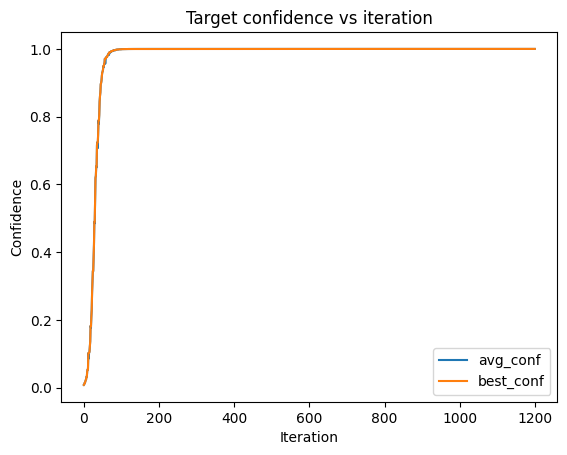

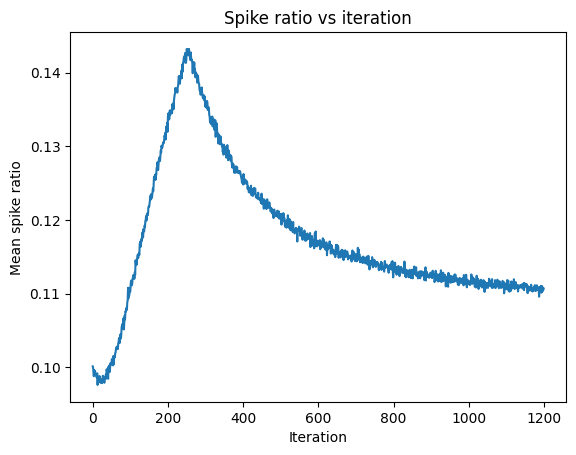

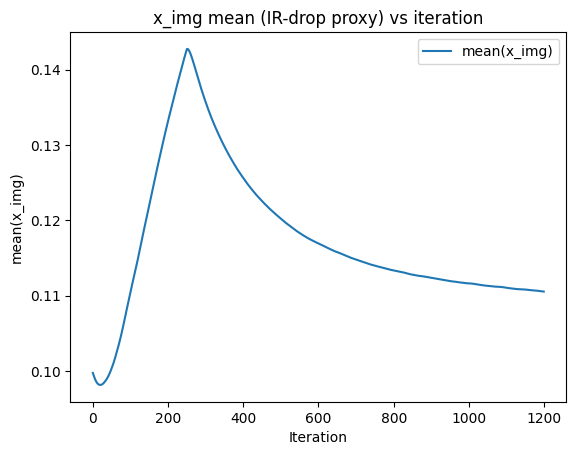

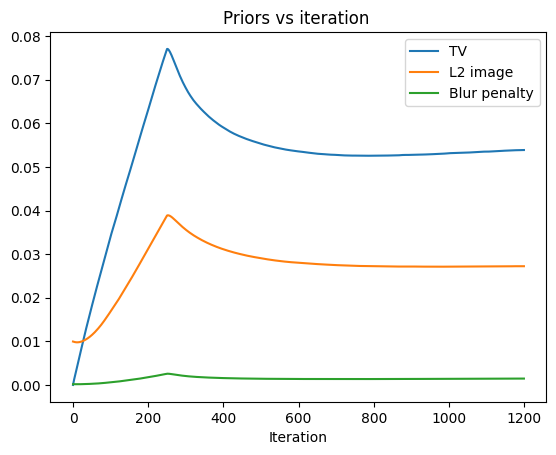

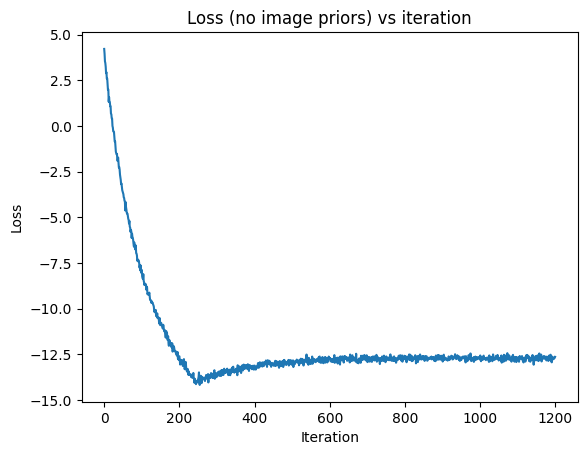

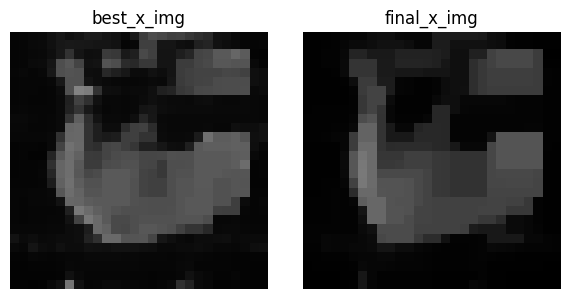

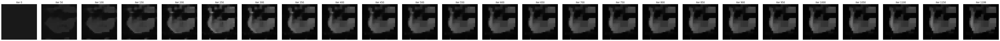

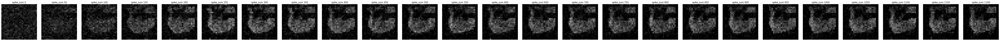

In [10]:
result = model_inversion_attack_eot_ste_full_blur(
    model=model,
    target_class=6,
    device=device,          # torch.device or "cuda"/"cpu"
    steps=1200,
    K=24, #16
    T=model.T,
    base_rate=1.0,
    use_base_rate_schedule=False,

    snapshot_every=50,
)

print("Best confidence:", result["best_conf"])

hist = result["history"]

plt.figure()
plt.plot(hist["conf"], label="avg_conf")
plt.plot(hist["best_conf"], label="best_conf")
plt.title("Target confidence vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Confidence")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist["sparsity"])
plt.title("Spike ratio vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Mean spike ratio")
plt.show()

plt.figure()
plt.plot(hist["xmean"], label="mean(x_img)")
plt.title("x_img mean (IR-drop proxy) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("mean(x_img)")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist["tv"], label="TV")
plt.plot(hist["l2_img"], label="L2 image")
plt.plot(hist["blur_pen"], label="Blur penalty")
plt.title("Priors vs iteration ")
plt.xlabel("Iteration")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist["loss"])
plt.title("Loss (no image priors) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.show()

plt.figure(figsize=(6,3))

plt.subplot(1,2,1)
plt.imshow(result["best_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("best_x_img")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(result["final_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("final_x_img")
plt.axis("off")

plt.tight_layout()
plt.show()

snaps = result["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()


===== Starting Model Inversion Attack (Full + Blur) =====
Target class: 3
Steps: 1200 | Population K: 16 | T: 25
Stage1 LR: 0.01 | Stage2 LR: 0.003 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.14 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.05, xi_blur=0.015, xi_mean=0.8
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.18, xi_l2=0.15, xi_blur=0.2, xi_mean=1.2


[Iter 0000/1200] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.359965   (best=0.359965)
  avg_loss(no_priors)  : -0.150128
  avg_target_logit     : -1.142520
  avg_max_other_logit  : -1.305887
  avg_sparsity         : 0.099751
  fr_mean/min/max      : 0.099751 / 0.079879 / 0.123724
  fr_pen(one-sided)    : 0.006468   fr_l2: 0.010058
  tv=0.000000 l2=0.009950 blur=0.000162
  xmean=0.099750 mean_pen=0.001620 grad_norm=0.005906

[Iter 0010/1200] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.679448   (best=0.67

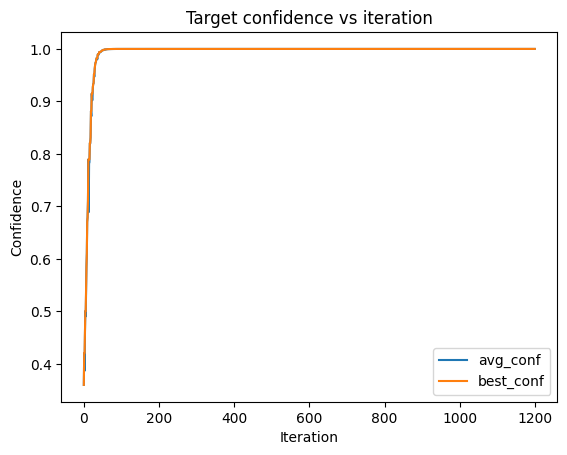

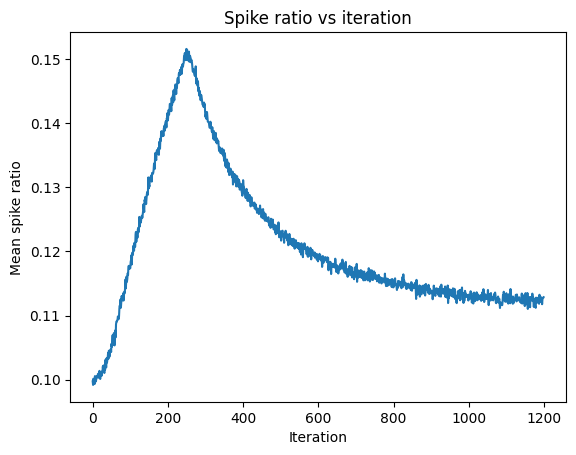

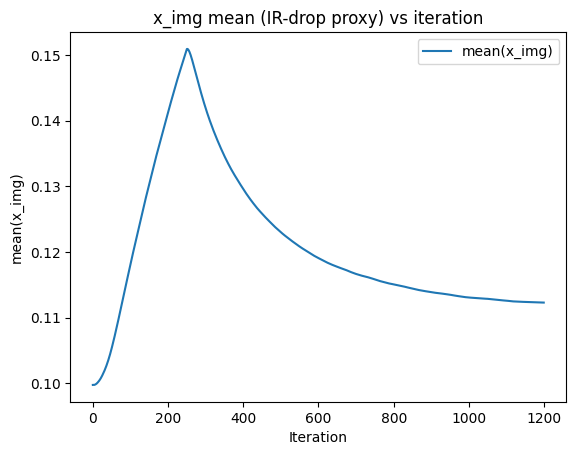

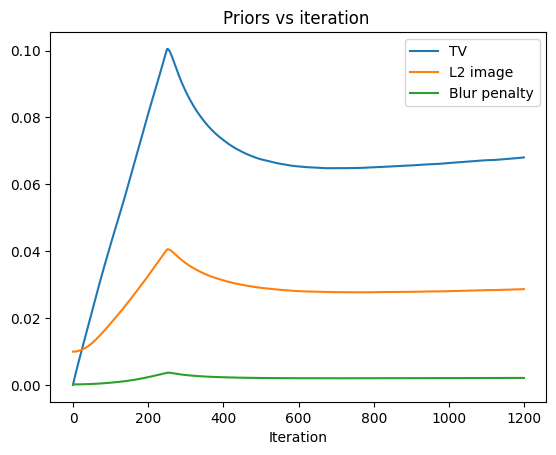

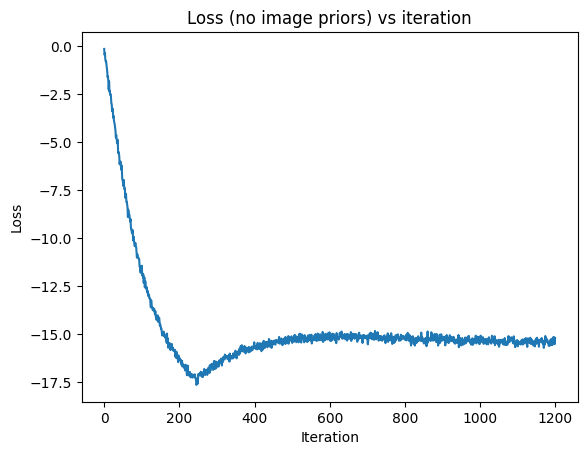

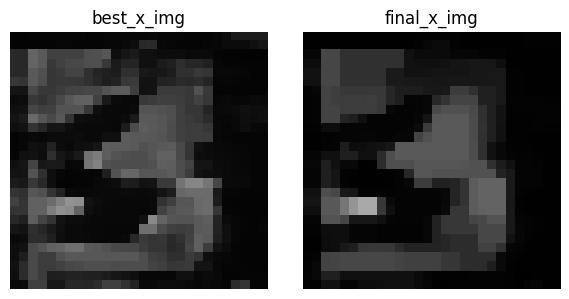

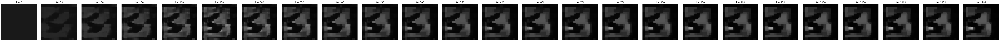

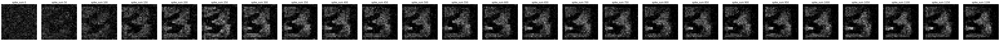

In [16]:
result3 = model_inversion_attack_eot_ste_full_blur(
    model=model,
    target_class=3,
    device=device,          # torch.device or "cuda"/"cpu"
    steps=1200,
    K=16, #16
    T=model.T,
    base_rate=1.0,
    use_base_rate_schedule=False,

    snapshot_every=50,
)

print("Best confidence:", result3["best_conf"])

hist3 = result3["history"]

plt.figure()
plt.plot(hist3["conf"], label="avg_conf")
plt.plot(hist3["best_conf"], label="best_conf")
plt.title("Target confidence vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Confidence")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist3["sparsity"])
plt.title("Spike ratio vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Mean spike ratio")
plt.show()

plt.figure()
plt.plot(hist3["xmean"], label="mean(x_img)")
plt.title("x_img mean (IR-drop proxy) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("mean(x_img)")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist3["tv"], label="TV")
plt.plot(hist3["l2_img"], label="L2 image")
plt.plot(hist3["blur_pen"], label="Blur penalty")
plt.title("Priors vs iteration ")
plt.xlabel("Iteration")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist3["loss"])
plt.title("Loss (no image priors) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.show()

plt.figure(figsize=(6,3))

plt.subplot(1,2,1)
plt.imshow(result3["best_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("best_x_img")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(result3["final_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("final_x_img")
plt.axis("off")

plt.tight_layout()
plt.show()

snaps = result3["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()


===== Starting Model Inversion Attack (Full + Blur) =====
Target class: 4
Steps: 1200 | Population K: 16 | T: 25
Stage1 LR: 0.01 | Stage2 LR: 0.003 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.14 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.05, xi_blur=0.015, xi_mean=0.8
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.18, xi_l2=0.15, xi_blur=0.2, xi_mean=1.2


[Iter 0000/1200] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.002970   (best=0.002970)
  avg_loss(no_priors)  : 5.074153
  avg_target_logit     : -6.012954
  avg_max_other_logit  : -0.952040
  avg_sparsity         : 0.099751
  fr_mean/min/max      : 0.099751 / 0.079879 / 0.123724
  fr_pen(one-sided)    : 0.006468   fr_l2: 0.010058
  tv=0.000000 l2=0.009950 blur=0.000162
  xmean=0.099750 mean_pen=0.001620 grad_norm=0.007563

[Iter 0010/1200] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.021246   (best=0.021

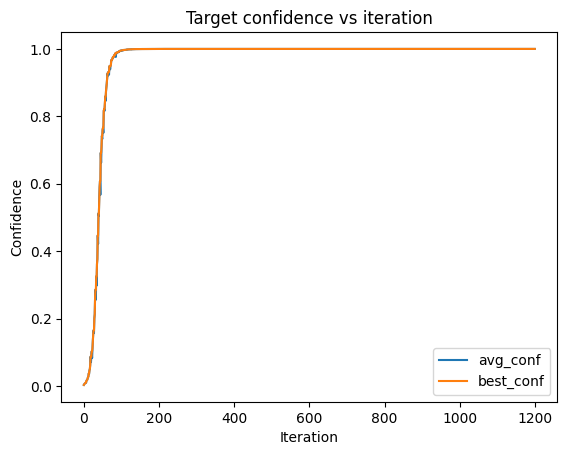

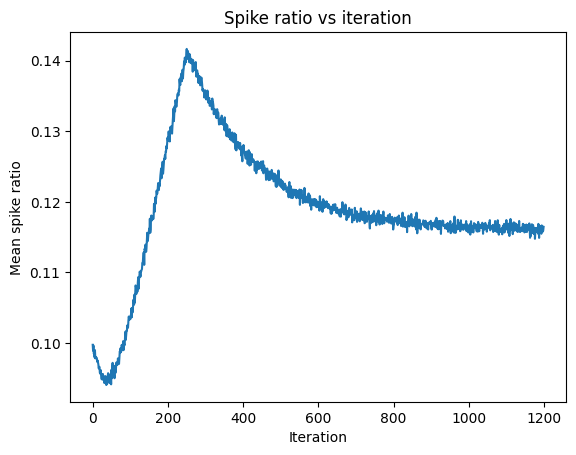

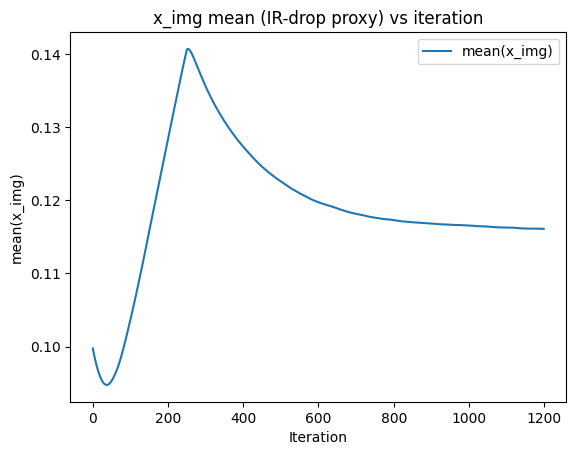

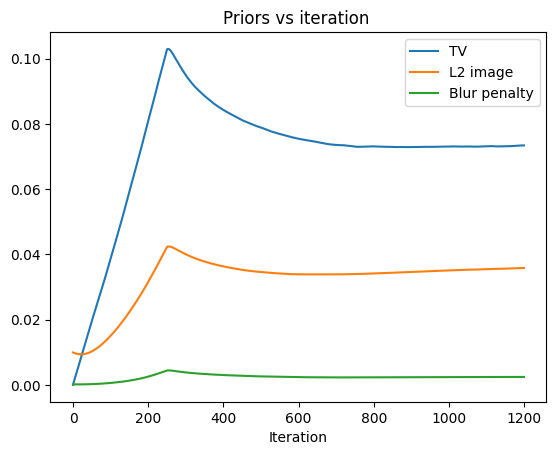

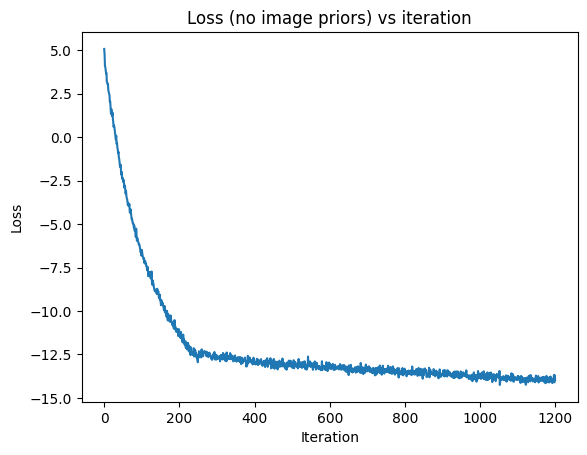

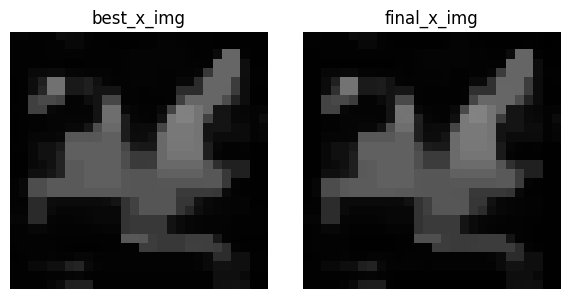

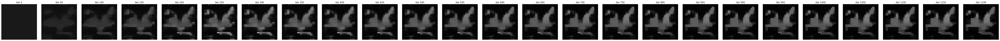

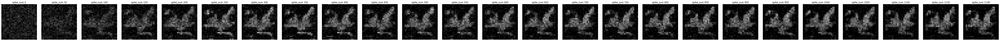

In [17]:
result4 = model_inversion_attack_eot_ste_full_blur(
    model=model,
    target_class=4,
    device=device,          # torch.device or "cuda"/"cpu"
    steps=1200,
    K=16, #16
    T=model.T,
    base_rate=1.0,
    use_base_rate_schedule=False,

    snapshot_every=50,
)

print("Best confidence:", result4["best_conf"])

hist4 = result4["history"]

plt.figure()
plt.plot(hist4["conf"], label="avg_conf")
plt.plot(hist4["best_conf"], label="best_conf")
plt.title("Target confidence vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Confidence")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist4["sparsity"])
plt.title("Spike ratio vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Mean spike ratio")
plt.show()

plt.figure()
plt.plot(hist4["xmean"], label="mean(x_img)")
plt.title("x_img mean (IR-drop proxy) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("mean(x_img)")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist4["tv"], label="TV")
plt.plot(hist4["l2_img"], label="L2 image")
plt.plot(hist4["blur_pen"], label="Blur penalty")
plt.title("Priors vs iteration ")
plt.xlabel("Iteration")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist4["loss"])
plt.title("Loss (no image priors) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.show()

plt.figure(figsize=(6,3))

plt.subplot(1,2,1)
plt.imshow(result4["best_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("best_x_img")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(result4["final_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("final_x_img")
plt.axis("off")

plt.tight_layout()
plt.show()

snaps = result4["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()


===== Starting Model Inversion Attack (Full + Blur) =====
Target class: 5
Steps: 1200 | Population K: 16 | T: 25
Stage1 LR: 0.01 | Stage2 LR: 0.003 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.14 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.05, xi_blur=0.015, xi_mean=0.8
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.18, xi_l2=0.15, xi_blur=0.2, xi_mean=1.2


[Iter 0000/1200] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.152669   (best=0.152669)
  avg_loss(no_priors)  : 1.070719
  avg_target_logit     : -2.016478
  avg_max_other_logit  : -0.958998
  avg_sparsity         : 0.099751
  fr_mean/min/max      : 0.099751 / 0.079879 / 0.123724
  fr_pen(one-sided)    : 0.006468   fr_l2: 0.010058
  tv=0.000000 l2=0.009950 blur=0.000162
  xmean=0.099750 mean_pen=0.001620 grad_norm=0.005429

[Iter 0010/1200] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.362140   (best=0.378

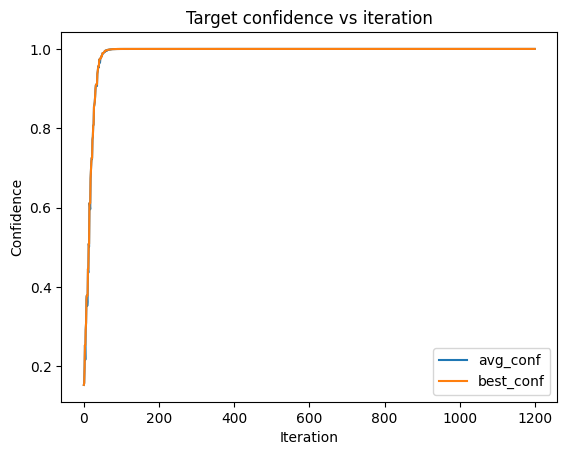

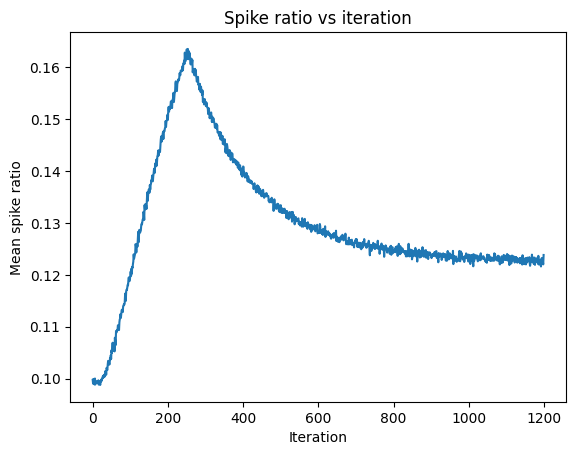

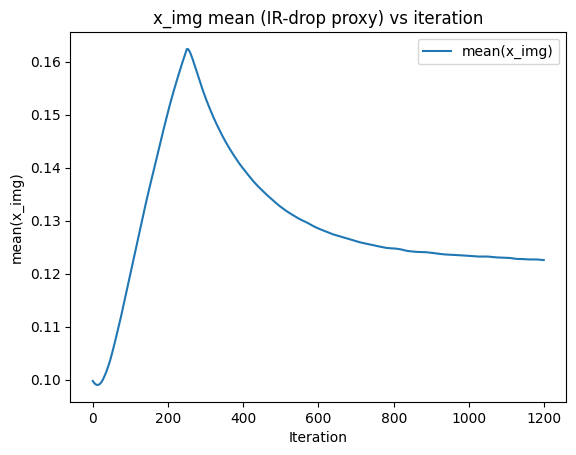

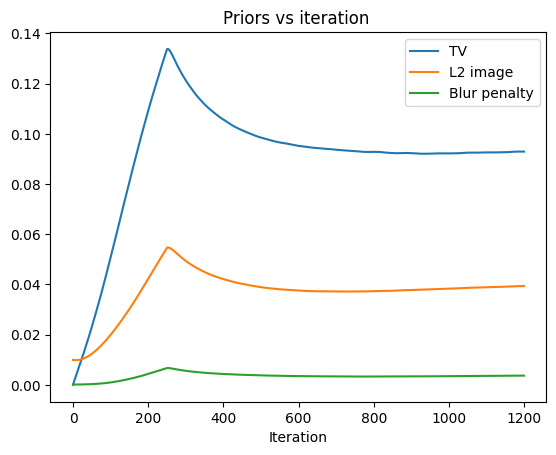

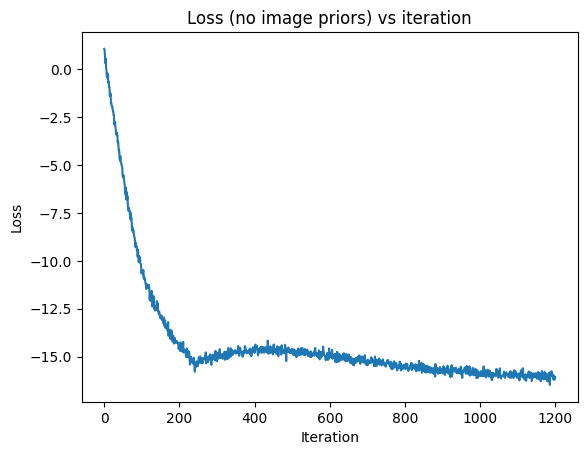

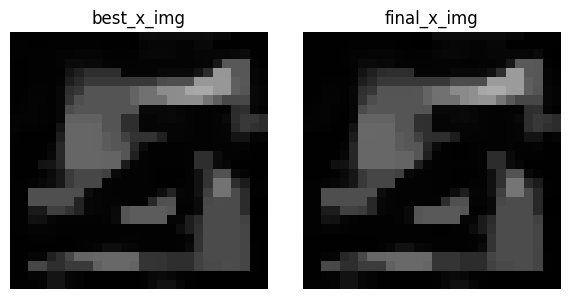

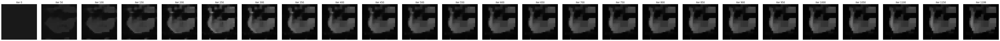

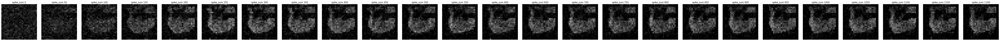

In [18]:
result5 = model_inversion_attack_eot_ste_full_blur(
    model=model,
    target_class=5,
    device=device,          # torch.device or "cuda"/"cpu"
    steps=1200,
    K=16, #16
    T=model.T,
    base_rate=1.0,
    use_base_rate_schedule=False,

    snapshot_every=50,
)

print("Best confidence:", result5["best_conf"])

hist5 = result5["history"]

plt.figure()
plt.plot(hist5["conf"], label="avg_conf")
plt.plot(hist5["best_conf"], label="best_conf")
plt.title("Target confidence vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Confidence")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist5["sparsity"])
plt.title("Spike ratio vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Mean spike ratio")
plt.show()

plt.figure()
plt.plot(hist5["xmean"], label="mean(x_img)")
plt.title("x_img mean (IR-drop proxy) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("mean(x_img)")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist5["tv"], label="TV")
plt.plot(hist5["l2_img"], label="L2 image")
plt.plot(hist5["blur_pen"], label="Blur penalty")
plt.title("Priors vs iteration ")
plt.xlabel("Iteration")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist5["loss"])
plt.title("Loss (no image priors) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.show()

plt.figure(figsize=(6,3))

plt.subplot(1,2,1)
plt.imshow(result5["best_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("best_x_img")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(result5["final_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("final_x_img")
plt.axis("off")

plt.tight_layout()
plt.show()

snaps = result["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()


===== Starting Model Inversion Attack (Full + Blur) =====
Target class: 2
Steps: 1200 | Population K: 16 | T: 25
Stage1 LR: 0.01 | Stage2 LR: 0.003 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.14 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.05, xi_blur=0.015, xi_mean=0.8
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.18, xi_l2=0.15, xi_blur=0.2, xi_mean=1.2


[Iter 0000/1200] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.263462   (best=0.263462)
  avg_loss(no_priors)  : 0.411518
  avg_target_logit     : -1.462256
  avg_max_other_logit  : -1.063977
  avg_sparsity         : 0.099751
  fr_mean/min/max      : 0.099751 / 0.079879 / 0.123724
  fr_pen(one-sided)    : 0.006468   fr_l2: 0.010058
  tv=0.000000 l2=0.009950 blur=0.000162
  xmean=0.099750 mean_pen=0.001620 grad_norm=0.006044

[Iter 0010/1200] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.630007   (best=0.630

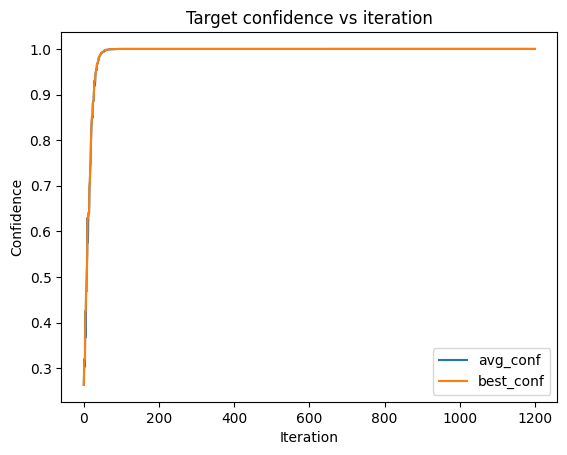

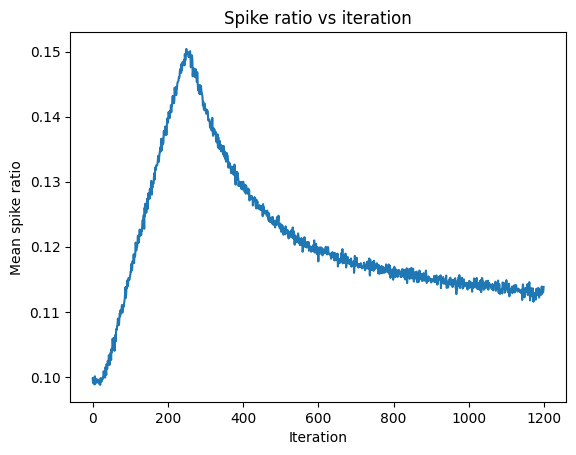

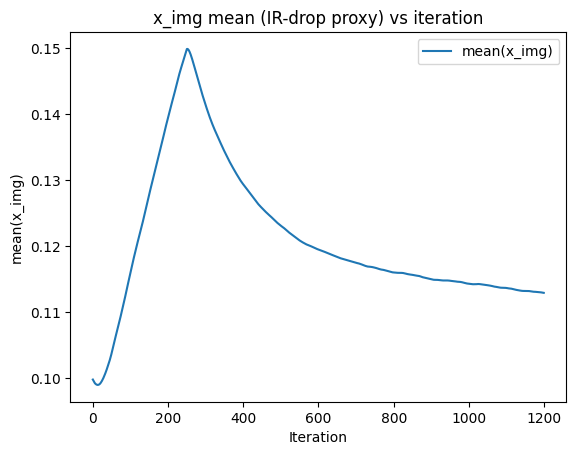

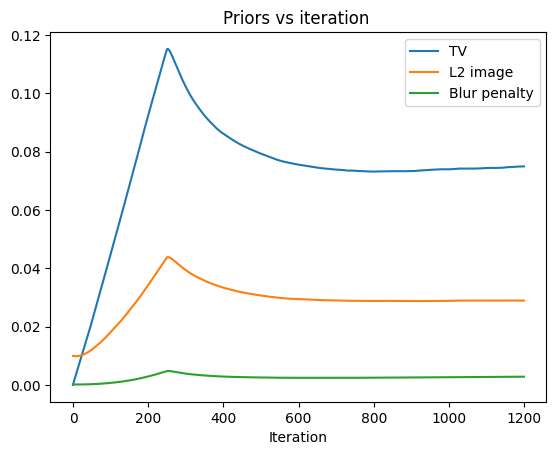

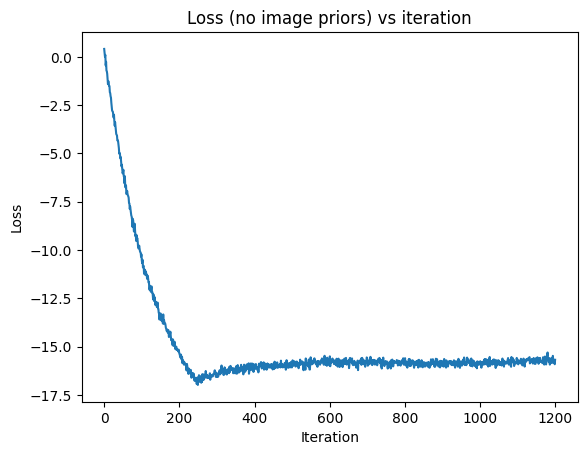

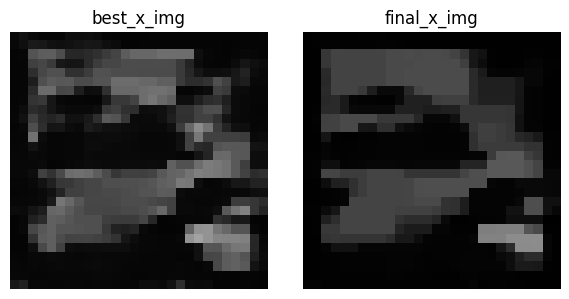

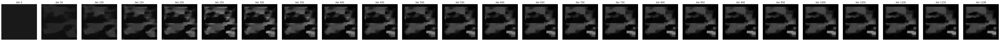

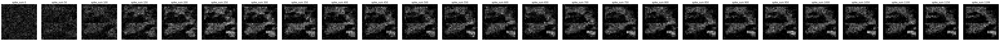

In [19]:
result2 = model_inversion_attack_eot_ste_full_blur(
    model=model,
    target_class=2,
    device=device,          # torch.device or "cuda"/"cpu"
    steps=1200,
    K=16, #16
    T=model.T,
    base_rate=1.0,
    use_base_rate_schedule=False,

    snapshot_every=50,
)

print("Best confidence:", result2["best_conf"])

hist2 = result2["history"]

plt.figure()
plt.plot(hist2["conf"], label="avg_conf")
plt.plot(hist2["best_conf"], label="best_conf")
plt.title("Target confidence vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Confidence")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist2["sparsity"])
plt.title("Spike ratio vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Mean spike ratio")
plt.show()

plt.figure()
plt.plot(hist2["xmean"], label="mean(x_img)")
plt.title("x_img mean (IR-drop proxy) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("mean(x_img)")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist2["tv"], label="TV")
plt.plot(hist2["l2_img"], label="L2 image")
plt.plot(hist2["blur_pen"], label="Blur penalty")
plt.title("Priors vs iteration ")
plt.xlabel("Iteration")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist2["loss"])
plt.title("Loss (no image priors) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.show()

plt.figure(figsize=(6,3))

plt.subplot(1,2,1)
plt.imshow(result2["best_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("best_x_img")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(result2["final_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("final_x_img")
plt.axis("off")

plt.tight_layout()
plt.show()

snaps = result2["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()


===== Starting Model Inversion Attack (Full + Blur) =====
Target class: 7
Steps: 1200 | Population K: 16 | T: 25
Stage1 LR: 0.01 | Stage2 LR: 0.003 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.14 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.05, xi_blur=0.015, xi_mean=0.8
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.18, xi_l2=0.15, xi_blur=0.2, xi_mean=1.2


[Iter 0000/1200] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.038383   (best=0.038383)
  avg_loss(no_priors)  : 2.606778
  avg_target_logit     : -3.560859
  avg_max_other_logit  : -0.967319
  avg_sparsity         : 0.099751
  fr_mean/min/max      : 0.099751 / 0.079879 / 0.123724
  fr_pen(one-sided)    : 0.006468   fr_l2: 0.010058
  tv=0.000000 l2=0.009950 blur=0.000162
  xmean=0.099750 mean_pen=0.001620 grad_norm=0.006453

[Iter 0010/1200] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.121345   (best=0.126

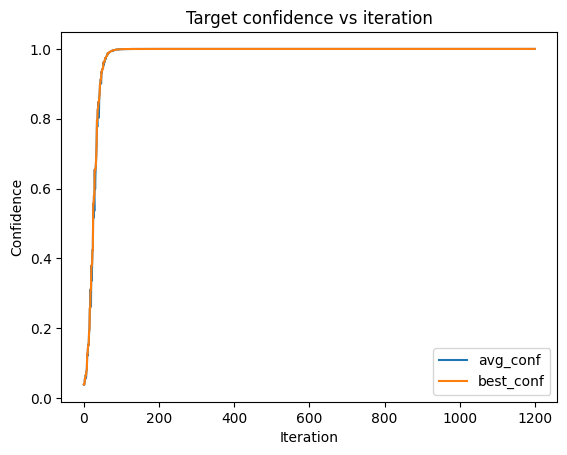

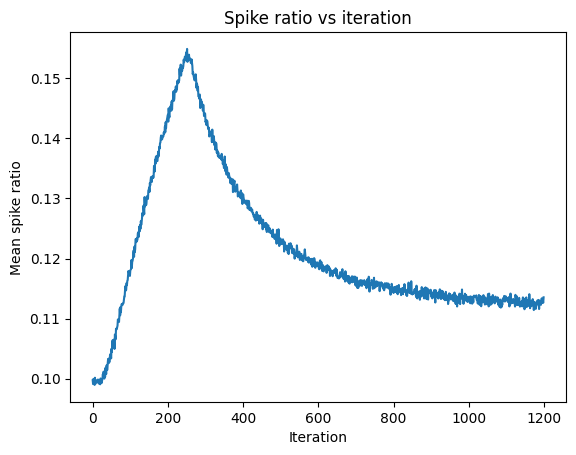

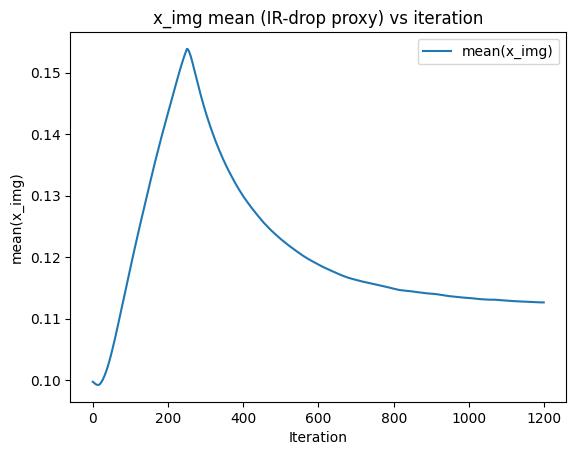

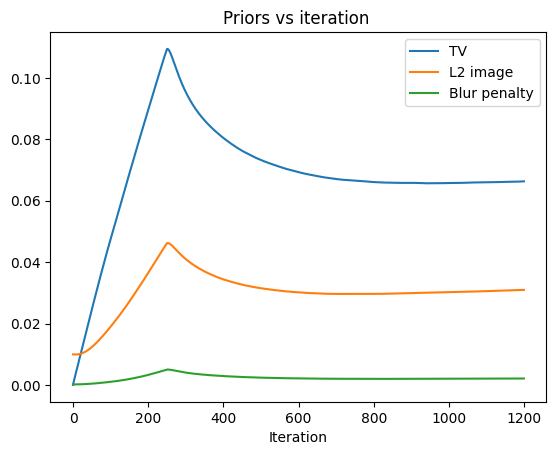

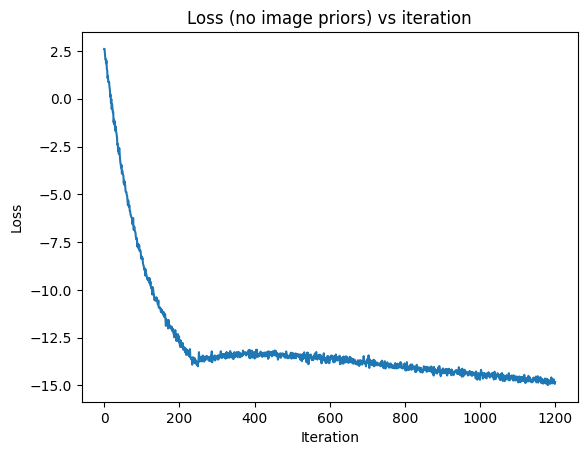

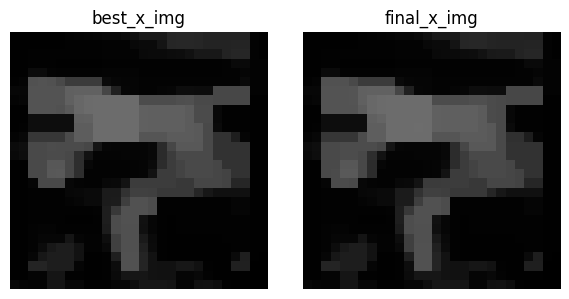

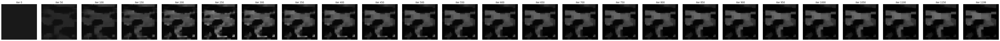

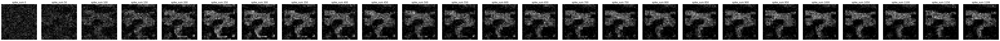

In [20]:
result7 = model_inversion_attack_eot_ste_full_blur(
    model=model,
    target_class=7,
    device=device,          # torch.device or "cuda"/"cpu"
    steps=1200,
    K=16, #16
    T=model.T,
    base_rate=1.0,
    use_base_rate_schedule=False,

    snapshot_every=50,
)

print("Best confidence:", result7["best_conf"])

hist7 = result7["history"]

plt.figure()
plt.plot(hist7["conf"], label="avg_conf")
plt.plot(hist7["best_conf"], label="best_conf")
plt.title("Target confidence vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Confidence")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist7["sparsity"])
plt.title("Spike ratio vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Mean spike ratio")
plt.show()

plt.figure()
plt.plot(hist7["xmean"], label="mean(x_img)")
plt.title("x_img mean (IR-drop proxy) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("mean(x_img)")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist7["tv"], label="TV")
plt.plot(hist7["l2_img"], label="L2 image")
plt.plot(hist7["blur_pen"], label="Blur penalty")
plt.title("Priors vs iteration ")
plt.xlabel("Iteration")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist7["loss"])
plt.title("Loss (no image priors) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.show()

plt.figure(figsize=(6,3))

plt.subplot(1,2,1)
plt.imshow(result7["best_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("best_x_img")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(result7["final_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("final_x_img")
plt.axis("off")

plt.tight_layout()
plt.show()

snaps = result7["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()


===== Starting Model Inversion Attack (Full + Blur) =====
Target class: 8
Steps: 1200 | Population K: 16 | T: 25
Stage1 LR: 0.01 | Stage2 LR: 0.003 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.14 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.05, xi_blur=0.015, xi_mean=0.8
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.18, xi_l2=0.15, xi_blur=0.2, xi_mean=1.2




[Iter 0000/1200] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.143960   (best=0.143960)
  avg_loss(no_priors)  : 1.176148
  avg_target_logit     : -2.156677
  avg_max_other_logit  : -0.993768
  avg_sparsity         : 0.099751
  fr_mean/min/max      : 0.099751 / 0.079879 / 0.123724
  fr_pen(one-sided)    : 0.006468   fr_l2: 0.010058
  tv=0.000000 l2=0.009950 blur=0.000162
  xmean=0.099750 mean_pen=0.001620 grad_norm=0.007004

[Iter 0010/1200] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.341122   (best=0.341122)
  avg_loss(no_priors)  : -0.105847
  avg_target_logit     : -1.104529
  avg_max_other_logit  : -1.223581
  avg_sparsity         : 0.099621
  fr_mean/min/max      : 0.099621 / 0.079321 / 0.121413
  fr_pen(one-sided)    : 0.006449   fr_l2: 0.010034
  tv=0.004116 l2=0.009877 blur=0.000149
  xmean=0.099047 mean_pen=0.001677 grad_norm=0.005757

[Iter 0020/1200] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.630367   (best=0.634642)
  avg_l

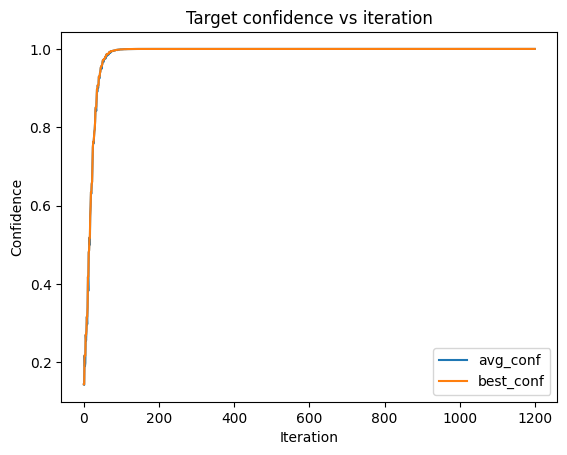

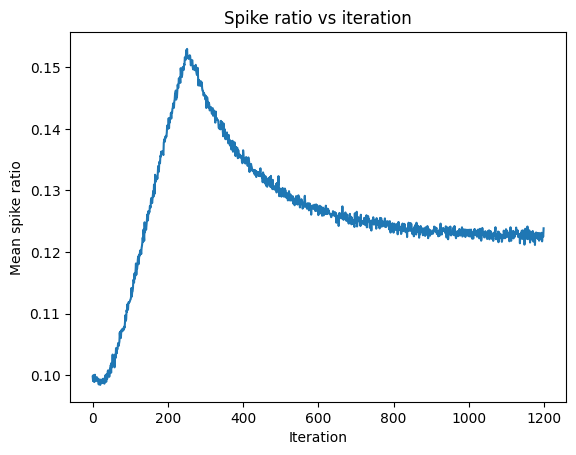

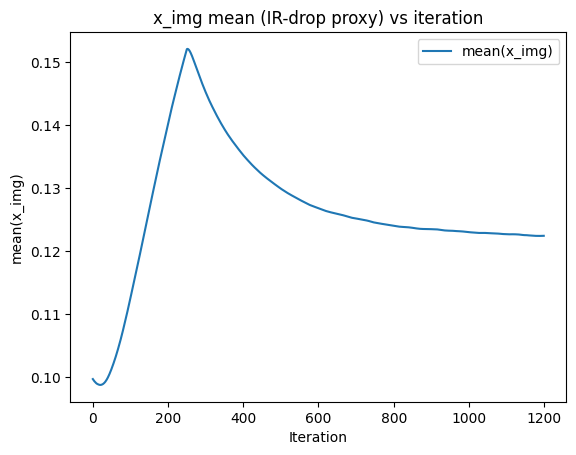

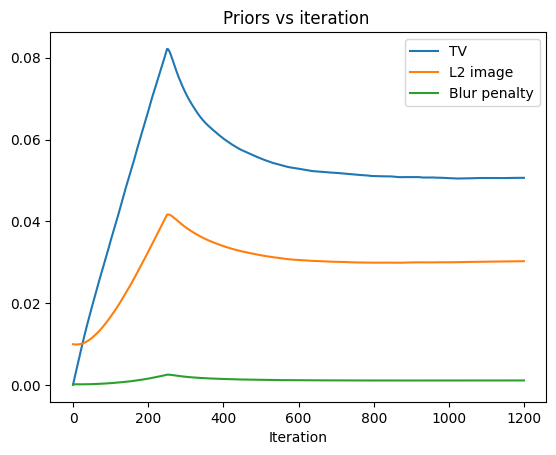

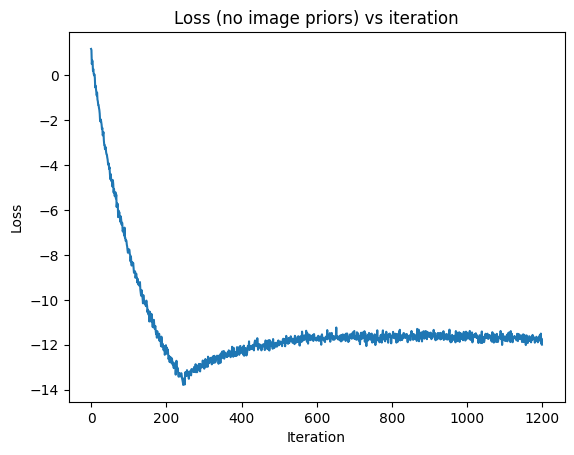

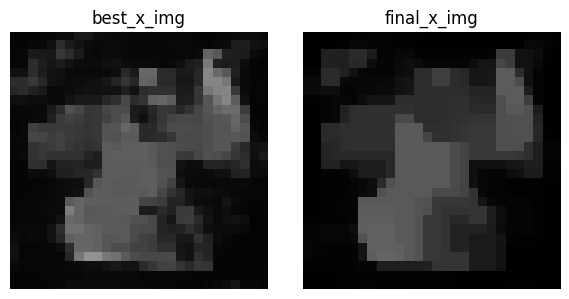

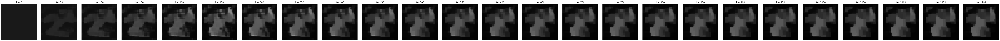

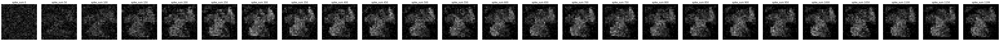

In [21]:
result8 = model_inversion_attack_eot_ste_full_blur(
    model=model,
    target_class=8,
    device=device,          # torch.device or "cuda"/"cpu"
    steps=1200,
    K=16, #16
    T=model.T,
    base_rate=1.0,
    use_base_rate_schedule=False,

    snapshot_every=50,
)

print("Best confidence:", result8["best_conf"])

hist8 = result8["history"]

plt.figure()
plt.plot(hist8["conf"], label="avg_conf")
plt.plot(hist8["best_conf"], label="best_conf")
plt.title("Target confidence vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Confidence")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist8["sparsity"])
plt.title("Spike ratio vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Mean spike ratio")
plt.show()

plt.figure()
plt.plot(hist8["xmean"], label="mean(x_img)")
plt.title("x_img mean (IR-drop proxy) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("mean(x_img)")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist8["tv"], label="TV")
plt.plot(hist8["l2_img"], label="L2 image")
plt.plot(hist8["blur_pen"], label="Blur penalty")
plt.title("Priors vs iteration ")
plt.xlabel("Iteration")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist8["loss"])
plt.title("Loss (no image priors) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.show()

plt.figure(figsize=(6,3))

plt.subplot(1,2,1)
plt.imshow(result8["best_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("best_x_img")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(result8["final_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("final_x_img")
plt.axis("off")

plt.tight_layout()
plt.show()

snaps = result8["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()


===== Starting Model Inversion Attack (Full + Blur) =====
Target class: 9
Steps: 1200 | Population K: 16 | T: 25
Stage1 LR: 0.01 | Stage2 LR: 0.003 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.14 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.05, xi_blur=0.015, xi_mean=0.8
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.18, xi_l2=0.15, xi_blur=0.2, xi_mean=1.2


[Iter 0000/1200] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.006756   (best=0.006756)
  avg_loss(no_priors)  : 4.392759
  avg_target_logit     : -5.348570
  avg_max_other_logit  : -0.969050
  avg_sparsity         : 0.099751
  fr_mean/min/max      : 0.099751 / 0.079879 / 0.123724
  fr_pen(one-sided)    : 0.006468   fr_l2: 0.010058
  tv=0.000000 l2=0.009950 blur=0.000162
  xmean=0.099750 mean_pen=0.001620 grad_norm=0.007353

[Iter 0010/1200] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.031769   (best=0.031

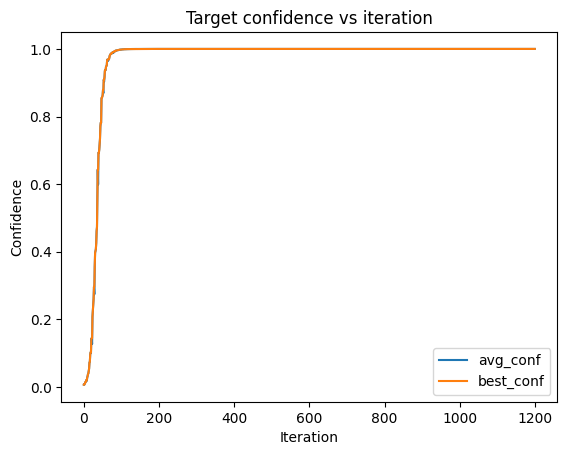

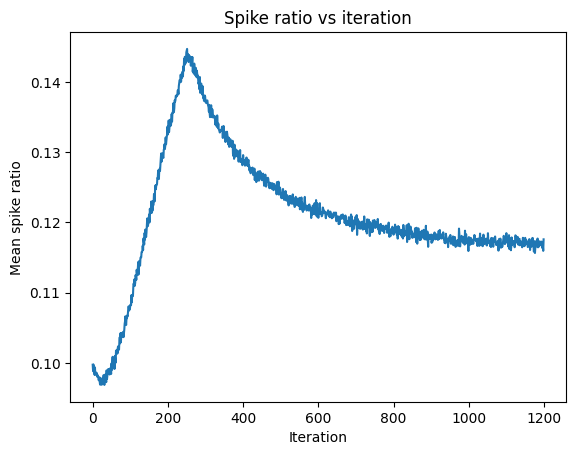

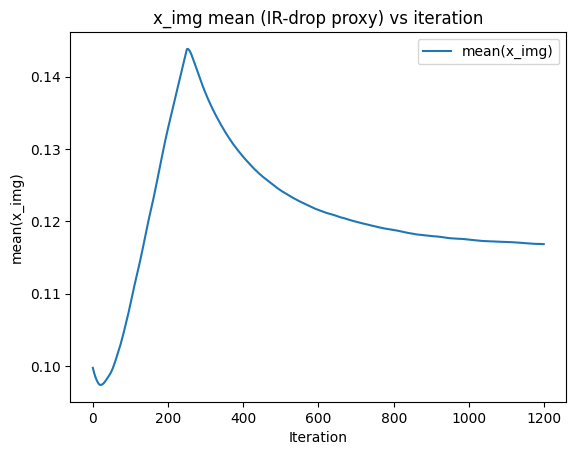

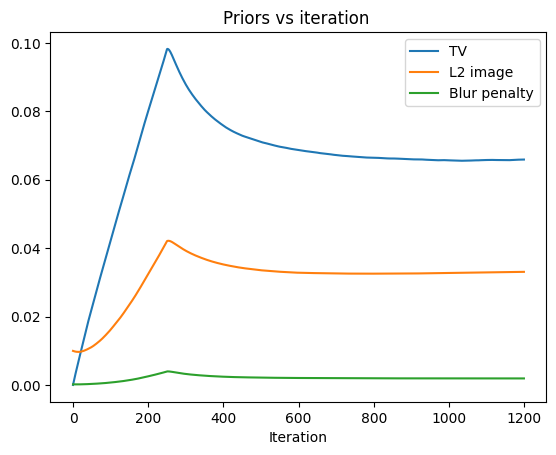

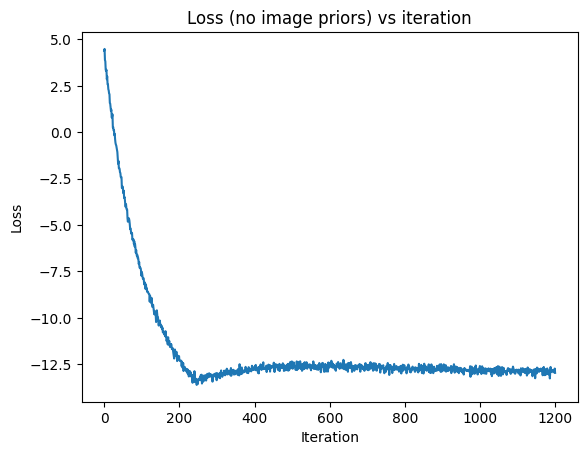

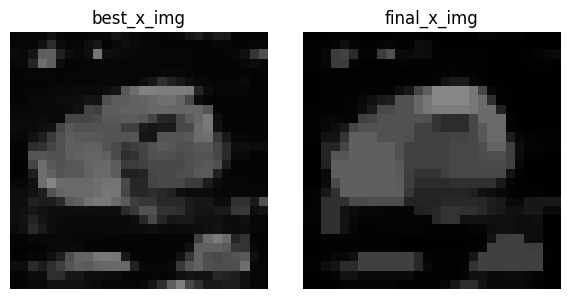

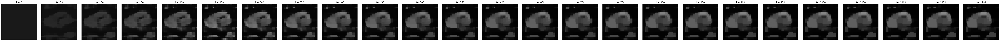

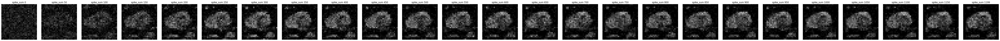

In [22]:
result9 = model_inversion_attack_eot_ste_full_blur(
    model=model,
    target_class=9,
    device=device,          # torch.device or "cuda"/"cpu"
    steps=1200,
    K=16, #16
    T=model.T,
    base_rate=1.0,
    use_base_rate_schedule=False,

    snapshot_every=50,
)

print("Best confidence:", result9["best_conf"])

hist9 = result9["history"]

plt.figure()
plt.plot(hist9["conf"], label="avg_conf")
plt.plot(hist9["best_conf"], label="best_conf")
plt.title("Target confidence vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Confidence")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist9["sparsity"])
plt.title("Spike ratio vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Mean spike ratio")
plt.show()

plt.figure()
plt.plot(hist9["xmean"], label="mean(x_img)")
plt.title("x_img mean (IR-drop proxy) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("mean(x_img)")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist9["tv"], label="TV")
plt.plot(hist9["l2_img"], label="L2 image")
plt.plot(hist9["blur_pen"], label="Blur penalty")
plt.title("Priors vs iteration ")
plt.xlabel("Iteration")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist9["loss"])
plt.title("Loss (no image priors) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.show()

plt.figure(figsize=(6,3))

plt.subplot(1,2,1)
plt.imshow(result9["best_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("best_x_img")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(result9["final_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("final_x_img")
plt.axis("off")

plt.tight_layout()
plt.show()

snaps = result9["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()


===== Starting Model Inversion Attack (Full + Blur) =====
Target class: 1
Steps: 300 | Population K: 16 | T: 25
Stage1 LR: 0.01 | Stage2 LR: 0.003 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.14 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.05, xi_blur=0.015, xi_mean=0.8
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.18, xi_l2=0.15, xi_blur=0.2, xi_mean=1.2


[Iter 0000/300] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.005870   (best=0.005870)
  avg_loss(no_priors)  : 4.669396
  avg_target_logit     : -8.514224
  avg_max_other_logit  : -3.858066
  avg_sparsity         : 0.099751
  fr_mean/min/max      : 0.099751 / 0.079879 / 0.123724
  fr_pen(one-sided)    : 0.006468   fr_l2: 0.010058
  tv=0.000000 l2=0.009950 blur=0.000162
  xmean=0.099750 mean_pen=0.001620 grad_norm=0.006189

[Iter 0010/300] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.027154   (best=0.027154

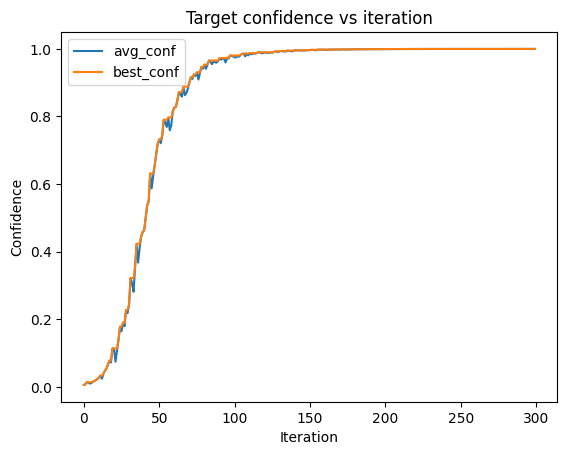

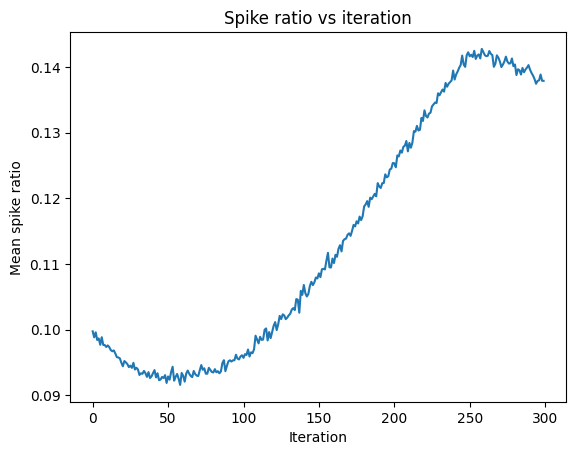

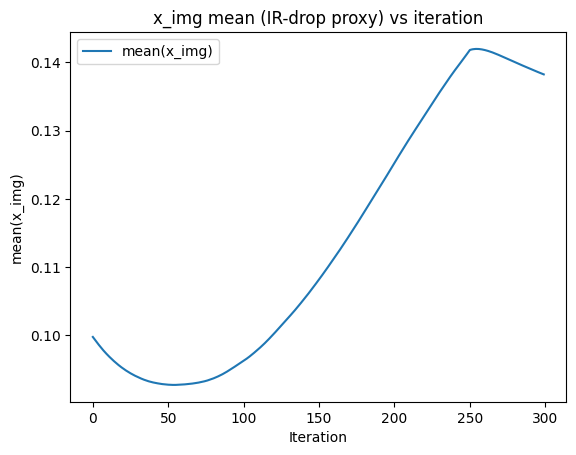

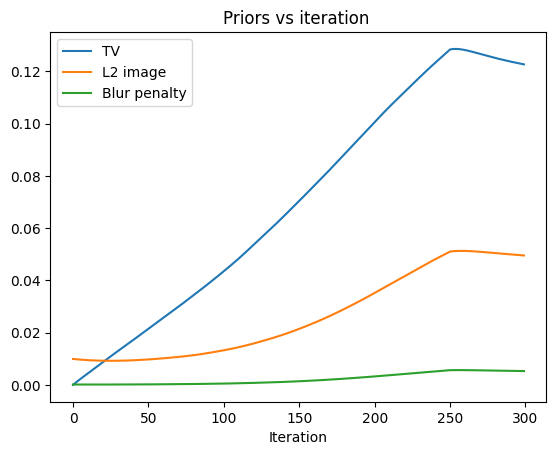

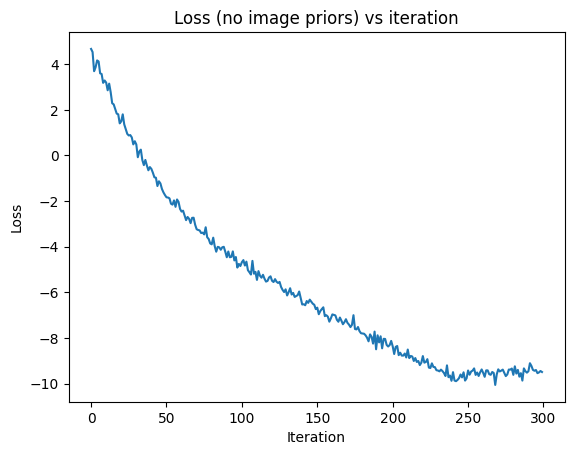

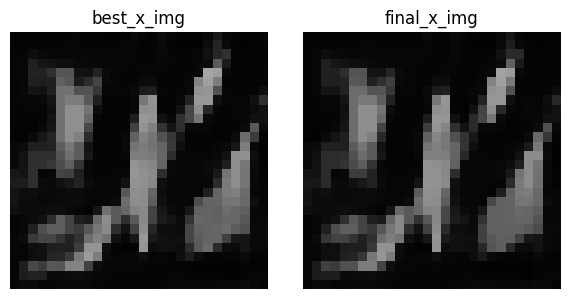

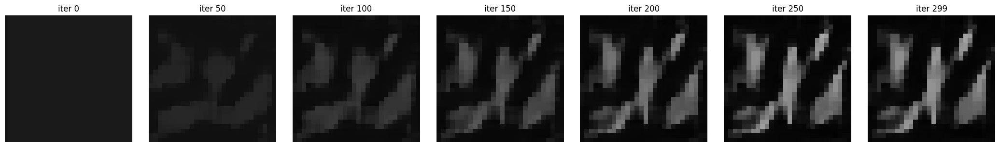

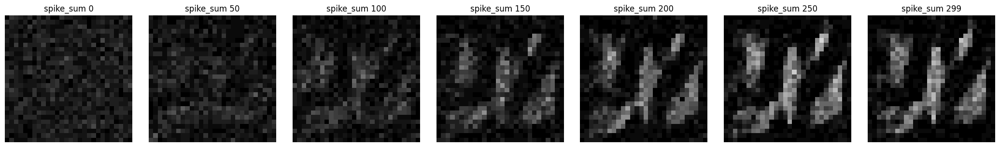

In [116]:
result1 = model_inversion_attack_eot_ste_full_blur(
    model=model,
    target_class=1,
    device=device,          # torch.device or "cuda"/"cpu"
    steps=300,
    K=16, #16
    T=model.T,
    base_rate=1.0,
    use_base_rate_schedule=False,

    snapshot_every=50,
)

print("Best confidence:", result1["best_conf"])

hist1 = result1["history"]

plt.figure()
plt.plot(hist1["conf"], label="avg_conf")
plt.plot(hist1["best_conf"], label="best_conf")
plt.title("Target confidence vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Confidence")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist1["sparsity"])
plt.title("Spike ratio vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Mean spike ratio")
plt.show()

plt.figure()
plt.plot(hist1["xmean"], label="mean(x_img)")
plt.title("x_img mean (IR-drop proxy) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("mean(x_img)")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist1["tv"], label="TV")
plt.plot(hist1["l2_img"], label="L2 image")
plt.plot(hist1["blur_pen"], label="Blur penalty")
plt.title("Priors vs iteration ")
plt.xlabel("Iteration")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist1["loss"])
plt.title("Loss (no image priors) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.show()

plt.figure(figsize=(6,3))

plt.subplot(1,2,1)
plt.imshow(result1["best_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("best_x_img")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(result1["final_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("final_x_img")
plt.axis("off")

plt.tight_layout()
plt.show()

snaps = result1["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()


===== Starting Model Inversion Attack (Full + Blur) =====
Target class: 0
Steps: 1200 | Population K: 16 | T: 25
Stage1 LR: 0.01 | Stage2 LR: 0.003 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.14 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.05, xi_blur=0.015, xi_mean=0.8
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.18, xi_l2=0.15, xi_blur=0.2, xi_mean=1.2


[Iter 0000/1200] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.008137   (best=0.008137)
  avg_loss(no_priors)  : 4.006700
  avg_target_logit     : -4.961981
  avg_max_other_logit  : -0.968519
  avg_sparsity         : 0.099751
  fr_mean/min/max      : 0.099751 / 0.079879 / 0.123724
  fr_pen(one-sided)    : 0.006468   fr_l2: 0.010058
  tv=0.000000 l2=0.009950 blur=0.000162
  xmean=0.099750 mean_pen=0.001620 grad_norm=0.006960

[Iter 0010/1200] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.043619   (best=0.043

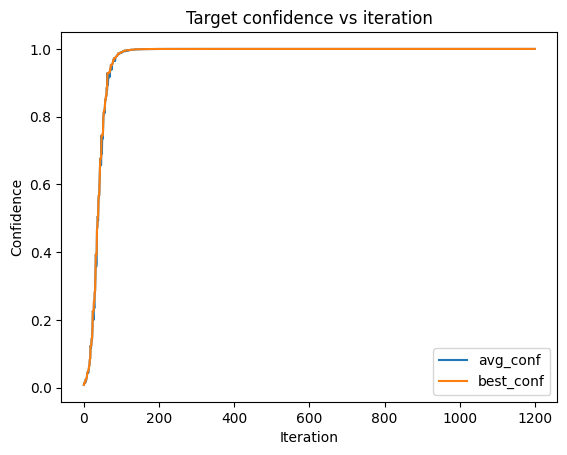

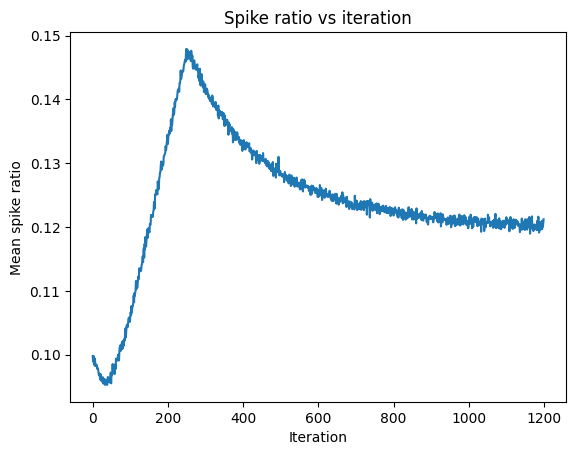

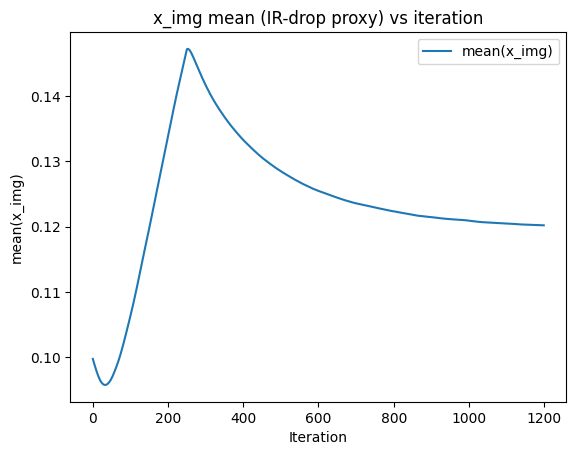

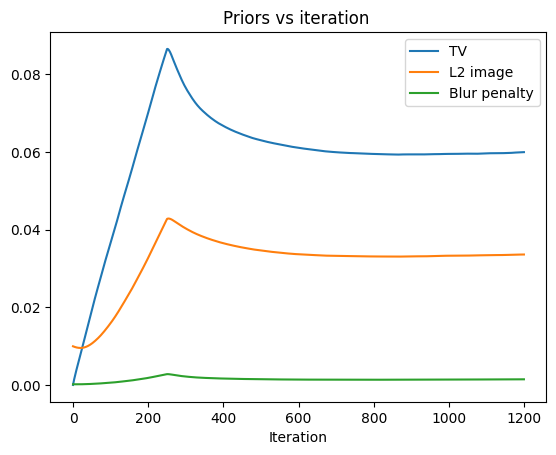

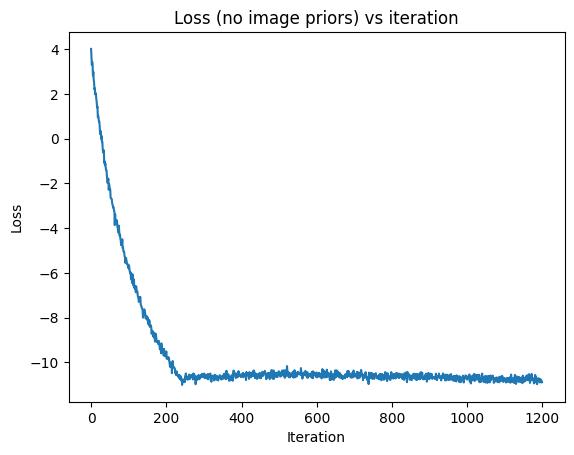

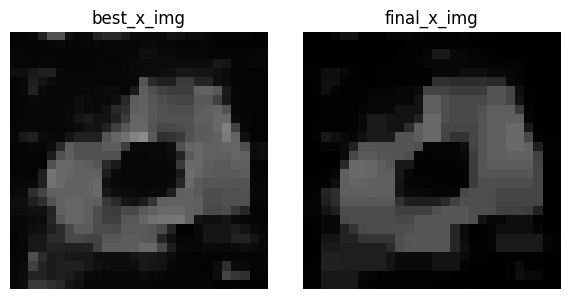

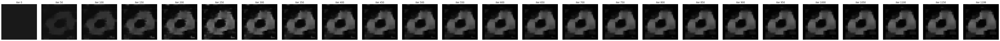

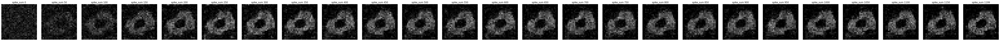

In [24]:
result0 = model_inversion_attack_eot_ste_full_blur(
    model=model,
    target_class=0,
    device=device,          # torch.device or "cuda"/"cpu"
    steps=1200,
    K=16, #16
    T=model.T,
    base_rate=1.0,
    use_base_rate_schedule=False,

    snapshot_every=50,
)

print("Best confidence:", result0["best_conf"])

hist0 = result0["history"]

plt.figure()
plt.plot(hist0["conf"], label="avg_conf")
plt.plot(hist0["best_conf"], label="best_conf")
plt.title("Target confidence vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Confidence")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist0["sparsity"])
plt.title("Spike ratio vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Mean spike ratio")
plt.show()

plt.figure()
plt.plot(hist0["xmean"], label="mean(x_img)")
plt.title("x_img mean (IR-drop proxy) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("mean(x_img)")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist0["tv"], label="TV")
plt.plot(hist0["l2_img"], label="L2 image")
plt.plot(hist0["blur_pen"], label="Blur penalty")
plt.title("Priors vs iteration ")
plt.xlabel("Iteration")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist0["loss"])
plt.title("Loss (no image priors) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.show()

plt.figure(figsize=(6,3))

plt.subplot(1,2,1)
plt.imshow(result0["best_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("best_x_img")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(result0["final_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("final_x_img")
plt.axis("off")

plt.tight_layout()
plt.show()

snaps = result0["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

In [14]:
# =========================================================
# BLOCK 0 — PREPARATION
# =========================================================

# Optional package: LPIPS
try:
    import lpips
    HAVE_LPIPS = True
except Exception:
    HAVE_LPIPS = False

# ----------------------------
# USER SETTINGS
# ----------------------------
max_nn_items = 200
max_mia_samples = 200
strict_conf_thr = 0.80
strict_ssim_thr = 0.30
eps = 1e-8

model.eval()

# ----------------------------
# Optional LPIPS model
# ----------------------------
lpips_fn = None
if HAVE_LPIPS:
    try:
        lpips_fn = lpips.LPIPS(net="alex").to(device)
        lpips_fn.eval()
    except Exception as e:
        print(f"LPIPS unavailable at runtime: {e}")
        lpips_fn = None
        HAVE_LPIPS = False

# =========================================================
# BLOCK 1 — HELPERS + GLOBAL MIA
# =========================================================

def to_img4(x):
    """
    Convert to [1,1,H,W] on CPU.
    Supports:
      [H,W], [1,H,W], [1,1,H,W], [T,1,1,H,W]
    """
    if isinstance(x, np.ndarray):
        x = torch.from_numpy(x)
    x = x.detach().float().cpu()

    if x.ndim == 5:   # [T,1,1,H,W]
        x = x.mean(dim=0)
    if x.ndim == 4:
        return x
    if x.ndim == 3:
        return x.unsqueeze(0)
    if x.ndim == 2:
        return x.unsqueeze(0).unsqueeze(0)

    raise ValueError(f"Unsupported image shape: {tuple(x.shape)}")


def mse_torch(a, b):
    a = to_img4(a)
    b = to_img4(b)
    return float(((a - b) ** 2).mean().item())


def psnr_torch(a, b, data_range=1.0):
    m = mse_torch(a, b)
    return float(10.0 * np.log10((data_range ** 2) / (m + eps)))


def ssim_torch_simple(a, b, data_range=1.0):
    a = to_img4(a)
    b = to_img4(b)

    mu_a = a.mean()
    mu_b = b.mean()

    sigma_a = ((a - mu_a) ** 2).mean()
    sigma_b = ((b - mu_b) ** 2).mean()
    sigma_ab = ((a - mu_a) * (b - mu_b)).mean()

    C1 = (0.01 * data_range) ** 2
    C2 = (0.03 * data_range) ** 2

    ssim_val = ((2 * mu_a * mu_b + C1) * (2 * sigma_ab + C2)) / (
        (mu_a ** 2 + mu_b ** 2 + C1) * (sigma_a + sigma_b + C2)
    )
    return float(ssim_val.item())


def lpips_safe(a, b, lpips_fn=None):
    if not HAVE_LPIPS or lpips_fn is None:
        return np.nan

    a = to_img4(a).to(device)
    b = to_img4(b).to(device)

    # LPIPS expects 3-channel input in [-1, 1]
    a3 = a.repeat(1, 3, 1, 1) * 2.0 - 1.0
    b3 = b.repeat(1, 3, 1, 1) * 2.0 - 1.0

    with torch.no_grad():
        return float(lpips_fn(a3, b3).item())


def encode_image_to_spikes(img4, T):
    img4 = to_img4(img4).to(device)
    p = img4.clamp(0.0, 1.0)
    rand = torch.rand(T, *img4.shape, device=device)
    spikes = (rand < p.unsqueeze(0)).float()
    return spikes


@torch.no_grad()
def target_confidence_and_pred(img4, target_class):
    sp = encode_image_to_spikes(img4, T=model.T)
    logits = model(sp)
    probs = torch.softmax(logits, dim=1)
    conf_target = float(probs[0, target_class].item())
    pred = int(probs.argmax(dim=1).item())
    return conf_target, pred


def get_first_real_example_of_class(loader, cls):
    for imgs, labels in loader:
        idx = (labels == cls).nonzero(as_tuple=True)[0]
        if len(idx) > 0:
            return imgs[idx[0]].squeeze().cpu()
    raise RuntimeError(f"No real example found for class {cls}")


def get_nearest_real_example(img4, loader, cls, max_items=200):
    img2 = to_img4(img4)[0, 0]
    best_d = np.inf
    best_x = None
    count = 0

    for imgs, labels in loader:
        idx = (labels == cls).nonzero(as_tuple=True)[0]
        if len(idx) == 0:
            continue

        for j in idx:
            x2 = imgs[j].squeeze().cpu()
            d = float(((img2 - x2) ** 2).mean().item())
            if d < best_d:
                best_d = d
                best_x = x2.clone()

            count += 1
            if count >= max_items:
                return best_x

    if best_x is None:
        raise RuntimeError(f"No nearest sample found for class {cls}")

    return best_x


def nearest_distance_to_class(img4, loader, cls, max_items=200):
    img2 = to_img4(img4)[0, 0]
    best_d = np.inf
    count = 0

    for imgs, labels in loader:
        idx = (labels == cls).nonzero(as_tuple=True)[0]
        if len(idx) == 0:
            continue

        for j in idx:
            x2 = imgs[j].squeeze().cpu()
            d = float(((img2 - x2) ** 2).mean().item())
            best_d = min(best_d, d)
            count += 1
            if count >= max_items:
                return best_d

    return best_d


@torch.no_grad()
def extract_rate_features_from_spikes(spikes):
    """
    Uses the actual model path:
      conv1 -> bn1 -> lif1 -> pool
      conv2 -> bn2 -> lif2
    Returns mean firing-rate features for conv1 and conv2.
    """
    T_local = spikes.shape[0]
    v1, v2 = None, None
    conv1_feats = []
    conv2_feats = []

    for t in range(T_local):
        x = spikes[t]

        u1 = model.bn1(model.conv1(x))
        spk1, v1 = model.lif1(u1, v1)
        s1p = F.avg_pool2d(spk1, 2)

        u2 = model.bn2(model.conv2(s1p))
        spk2, v2 = model.lif2(u2, v2)

        conv1_feats.append(spk1.mean(dim=(0, 2, 3)).detach().cpu().numpy())
        conv2_feats.append(spk2.mean(dim=(0, 2, 3)).detach().cpu().numpy())

    conv1_feats = np.mean(np.stack(conv1_feats, axis=0), axis=0)
    conv2_feats = np.mean(np.stack(conv2_feats, axis=0), axis=0)
    return conv1_feats, conv2_feats


@torch.no_grad()
def get_confidence_and_spike_density(x):
    x = to_img4(x).to(device)
    sp = encode_image_to_spikes(x, T=model.T)
    logits = model(sp)
    prob = torch.softmax(logits, dim=1)
    conf = float(prob.max(dim=1)[0].item())
    spike_density = float(sp.mean().item())
    return conf, spike_density

In [249]:
# ----------------------------
# GLOBAL MIA ROC / AUC
# ----------------------------
train_scores_logits = []
train_scores_spikes = []
test_scores_logits = []
test_scores_spikes = []

# Members
for imgs, labels in train_loader:
    for x in imgs:
        conf, spike_density = get_confidence_and_spike_density(x)
        train_scores_logits.append(conf)
        train_scores_spikes.append(spike_density)
        if len(train_scores_logits) >= max_mia_samples:
            break
    if len(train_scores_logits) >= max_mia_samples:
        break

# Non-members
for imgs, labels in test_loader:
    for x in imgs:
        conf, spike_density = get_confidence_and_spike_density(x)
        test_scores_logits.append(conf)
        test_scores_spikes.append(spike_density)
        if len(test_scores_logits) >= max_mia_samples:
            break
    if len(test_scores_logits) >= max_mia_samples:
        break

labels_all = np.array([1] * len(train_scores_logits) + [0] * len(test_scores_logits))
logit_scores = np.array(train_scores_logits + test_scores_logits)
spike_scores = np.array(train_scores_spikes + test_scores_spikes)

fpr_l, tpr_l, _ = roc_curve(labels_all, logit_scores)
fpr_s, tpr_s, _ = roc_curve(labels_all, spike_scores)

auc_l = float(auc(fpr_l, tpr_l))
auc_s = float(auc(fpr_s, tpr_s))

print(f"Global MIA AUC (logits): {auc_l:.4f}")
print(f"Global MIA AUC (spike density): {auc_s:.4f}")

# =========================================================
# BLOCK 2 — EVALUATION FUNCTION + RESULTS DICTIONARY
# =========================================================

def evaluate_single_result(result, target_class_eval):

    best_img = to_img4(result["best_x_img"])
    final_img = to_img4(result["final_x_img"])

    original_img = to_img4(get_first_real_example_of_class(test_loader, target_class_eval))
    nearest_real_img = to_img4(
        get_nearest_real_example(best_img, test_loader, target_class_eval, max_items=max_nn_items)
    )

    # Core metrics
    mse_nearest = mse_torch(best_img, nearest_real_img)
    psnr_nearest = psnr_torch(best_img, nearest_real_img)
    ssim_nearest = ssim_torch_simple(best_img, nearest_real_img)
    lpips_nearest = lpips_safe(best_img, nearest_real_img, lpips_fn)

    mse_original = mse_torch(best_img, original_img)
    psnr_original = psnr_torch(best_img, original_img)
    ssim_original = ssim_torch_simple(best_img, original_img)
    lpips_original = lpips_safe(best_img, original_img, lpips_fn)

    target_conf, pred = target_confidence_and_pred(best_img, target_class_eval)
    top1_success = int(pred == target_class_eval)
    strict_success = int(
        (pred == target_class_eval) and
        (target_conf >= strict_conf_thr) and
        (ssim_nearest >= strict_ssim_thr)
    )

    # Membership leakage
    d_train = nearest_distance_to_class(best_img, train_loader, target_class_eval, max_items=max_nn_items)
    d_test = nearest_distance_to_class(best_img, test_loader, target_class_eval, max_items=max_nn_items)
    membership_gap = float(d_test - d_train)
    membership_gap_norm = float((d_test - d_train) / (d_test + d_train + eps))

    # Wasserstein leakage on firing-rate features
    sp_best = encode_image_to_spikes(best_img, T=model.T)
    sp_nearest = encode_image_to_spikes(nearest_real_img, T=model.T)

    fr_best_1, fr_best_2 = extract_rate_features_from_spikes(sp_best)
    fr_nearest_1, fr_nearest_2 = extract_rate_features_from_spikes(sp_nearest)

    w_conv1 = float(wasserstein_distance(fr_nearest_1, fr_best_1))
    w_conv2 = float(wasserstein_distance(fr_nearest_2, fr_best_2))

    summary_items = [
        ("Target class", target_class_eval),
        ("Predicted class", pred),
        ("Target confidence", target_conf),
        ("ASR (top-1)", top1_success),
        ("ASR (strict)", strict_success),
        ("MSE vs original", mse_original),
        ("PSNR vs original", psnr_original),
        ("SSIM vs original", ssim_original),
        ("LPIPS vs original", lpips_original),
        ("MSE vs nearest real", mse_nearest),
        ("PSNR vs nearest real", psnr_nearest),
        ("SSIM vs nearest real", ssim_nearest),
        ("LPIPS vs nearest real", lpips_nearest),
        ("Membership gap", membership_gap),
        ("Normalized membership gap", membership_gap_norm),
        ("Wasserstein conv1", w_conv1),
        ("Wasserstein conv2", w_conv2),
        ("MIA AUC (logits)", auc_l),
        ("MIA AUC (spike density)", auc_s),
    ]

    df = pd.DataFrame(summary_items, columns=["Metric", "Value"])
    return df, dict(summary_items)


Global MIA AUC (logits): 0.5078
Global MIA AUC (spike density): 0.5983


In [ ]:
# =========================================================
# BLOCK 3 — RUN ALL DIGITS
# =========================================================

all_results = {
    0: result0,
    1: result1,
    2: result2,
    3: result3,
    4: result4,
    5: result5,
    6: result,
    7: result7,
    8: result8,
    9: result9,
}


all_tables = []
aggregate_rows = []

for digit, res in all_results.items():

    print("\n==============================")
    print(f"=== Formal Summary Table: Digit {digit} ===")
    print("==============================")

    df, metrics = evaluate_single_result(res, digit)

    df_to_print = df.copy()
    df_to_print["Value"] = df_to_print["Value"].apply(
        lambda x: f"{x:.4f}" if isinstance(x, (float, np.floating)) else str(x)
    )

    print(df_to_print.to_string(index=False))

    all_tables.append(df_to_print)

    row = {"digit": digit}
    row.update(metrics)
    aggregate_rows.append(row)

aggregate_df = pd.DataFrame(aggregate_rows)

print("\n=== Aggregate Results ===")
display(aggregate_df)


=== Formal Summary Table: Digit 0 ===
                   Metric   Value
             Target class  0.0000
          Predicted class  0.0000
        Target confidence  1.0000
              ASR (top-1)  1.0000
             ASR (strict)  1.0000
          MSE vs original  0.0914
         PSNR vs original 10.3913
         SSIM vs original  0.4009
        LPIPS vs original     nan
      MSE vs nearest real  0.0557
     PSNR vs nearest real 12.5414
     SSIM vs nearest real  0.3731
    LPIPS vs nearest real     nan
           Membership gap -0.0020
Normalized membership gap -0.0179
        Wasserstein conv1  0.1104
        Wasserstein conv2  0.0258
         MIA AUC (logits)  0.4997
  MIA AUC (spike density)  0.5956

=== Formal Summary Table: Digit 1 ===
                   Metric   Value
             Target class  1.0000
          Predicted class  1.0000
        Target confidence  0.9982
              ASR (top-1)  1.0000
             ASR (strict)  1.0000
          MSE vs original  0.0392
    

,digit,Target class,Predicted class,Target confidence,ASR (top-1),ASR (strict),MSE vs original,PSNR vs original,SSIM vs original,LPIPS vs original,MSE vs nearest real,PSNR vs nearest real,SSIM vs nearest real,LPIPS vs nearest real,Membership gap,Normalized membership gap,Wasserstein conv1,Wasserstein conv2,MIA AUC (logits),MIA AUC (spike density)
0,0,0,0,0.999957,1,1,0.091384,10.391312,0.400882,NaN,0.055701,12.541403,0.373092,NaN,-0.002026,-0.017865,0.110411,0.025835,0.4997,0.5956
1,1,1,1,0.998249,1,1,0.039180,14.069395,0.275214,NaN,0.029148,15.353947,0.329184,NaN,0.000198,0.003412,0.176339,0.059247,0.4997,0.5956
2,2,2,2,1.000000,1,0,0.109012,9.625250,0.130661,NaN,0.058426,12.333936,0.119811,NaN,-0.003773,-0.031276,0.188520,0.048705,0.4997,0.5956
3,3,3,3,1.000000,1,0,0.114449,9.413876,0.179439,NaN,0.054223,12.658200,0.151895,NaN,0.002430,0.022918,0.211362,0.049592,0.4997,0.5956
4,4,4,4,0.999998,1,1,0.053464,12.719410,0.412715,NaN,0.038706,14.122173,0.307443,NaN,-0.000320,-0.004114,0.156151,0.044318,0.4997,0.5956
5,5,5,5,1.000000,1,0,0.097334,10.117366,0.276775,NaN,0.054537,12.633120,0.211403,NaN,0.000866,0.008007,0.150918,0.033559,0.4997,0.5956
6,6,6,6,0.999998,1,0,0.080317,10.951930,0.280021,NaN,0.049305,13.071100,0.165058,NaN,0.000506,0.005162,0.186680,0.048929,0.4997,0.5956
7,7,7,7,0.999999,1,0,0.051939,12.845086,0.393343,NaN,0.039117,14.076364,0.162362,NaN,-0.001435,-0.018006,0.181680,0.058686,0.4997,0.5956
8,8,8,8,0.999998,1,0,0.083750,10.770170,0.357660,NaN,0.051158,12.910838,0.206841,NaN,0.001095,0.010814,0.178820,0.037213,0.4997,0.5956
9,9,9,9,0.999996,1,0,0.071419,11.461847,0.286960,NaN,0.053799,12.692241,0.232050,NaN,0.000361,0.003368,0.168900,0.042341,0.4997,0.5956


=== Metrics used for plotting ===


,digit,ASR,Confidence,SSIM,MSE,PSNR
0,0,1.0,0.999946,0.373092,0.055701,12.541403
1,1,1.0,0.998857,0.329184,0.029148,15.353947
2,2,1.0,1.000000,0.119811,0.058426,12.333936
3,3,1.0,1.000000,0.151895,0.054223,12.658200
4,4,1.0,0.999998,0.307443,0.038706,14.122173
5,5,1.0,1.000000,0.211403,0.054537,12.633120
6,6,1.0,0.999997,0.165058,0.049305,13.071100
7,7,1.0,0.999999,0.162362,0.039117,14.076364
8,8,1.0,0.999996,0.206841,0.051158,12.910838
9,9,1.0,0.999998,0.232050,0.053799,12.692241


Mean ASR   : 1.0000
Mean Conf  : 0.9999
Mean SSIM  : 0.2259
Mean MSE   : 0.0484
Mean PSNR  : 13.2393


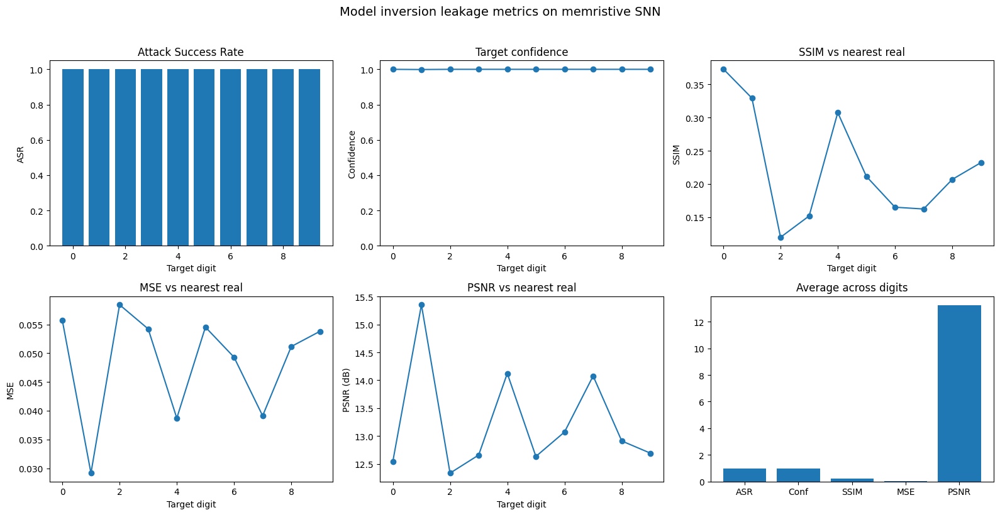

In [ ]:
# =========================================================
# ASR, Confidence, SSIM, MSE, PSNR
# =========================================================

# Recompute per-digit metrics in a compact table
plot_rows = []

for digit, res in all_results.items():
    df, metrics = evaluate_single_result(res, digit)
    plot_rows.append({
        "digit": digit,
        "ASR": float(metrics["ASR (top-1)"]),
        "Confidence": float(metrics["Target confidence"]),
        "SSIM": float(metrics["SSIM vs nearest real"]),
        "MSE": float(metrics["MSE vs nearest real"]),
        "PSNR": float(metrics["PSNR vs nearest real"]),
    })

plot_df = pd.DataFrame(plot_rows).sort_values("digit").reset_index(drop=True)

# Print numeric summary
print("=== Metrics used for plotting ===")
display(plot_df)

# Mean values for the paper text / final panel
mean_asr = plot_df["ASR"].mean()
mean_conf = plot_df["Confidence"].mean()
mean_ssim = plot_df["SSIM"].mean()
mean_mse = plot_df["MSE"].mean()
mean_psnr = plot_df["PSNR"].mean()

print(f"Mean ASR   : {mean_asr:.4f}")
print(f"Mean Conf  : {mean_conf:.4f}")
print(f"Mean SSIM  : {mean_ssim:.4f}")
print(f"Mean MSE   : {mean_mse:.4f}")
print(f"Mean PSNR  : {mean_psnr:.4f}")

# Create multi-panel figure
fig = plt.figure(figsize=(16, 8))

ax1 = plt.subplot(2, 3, 1)
ax1.bar(plot_df["digit"], plot_df["ASR"])
ax1.set_title("Attack Success Rate")
ax1.set_xlabel("Target digit")
ax1.set_ylabel("ASR")
ax1.set_ylim(0, 1.05)

ax2 = plt.subplot(2, 3, 2)
ax2.plot(plot_df["digit"], plot_df["Confidence"], marker="o")
ax2.set_title("Target confidence")
ax2.set_xlabel("Target digit")
ax2.set_ylabel("Confidence")
ax2.set_ylim(0, 1.05)

ax3 = plt.subplot(2, 3, 3)
ax3.plot(plot_df["digit"], plot_df["SSIM"], marker="o")
ax3.set_title("SSIM vs nearest real")
ax3.set_xlabel("Target digit")
ax3.set_ylabel("SSIM")

ax4 = plt.subplot(2, 3, 4)
ax4.plot(plot_df["digit"], plot_df["MSE"], marker="o")
ax4.set_title("MSE vs nearest real")
ax4.set_xlabel("Target digit")
ax4.set_ylabel("MSE")

ax5 = plt.subplot(2, 3, 5)
ax5.plot(plot_df["digit"], plot_df["PSNR"], marker="o")
ax5.set_title("PSNR vs nearest real")
ax5.set_xlabel("Target digit")
ax5.set_ylabel("PSNR (dB)")

# Compact average panel
ax6 = plt.subplot(2, 3, 6)
avg_names = ["ASR", "Conf", "SSIM", "MSE", "PSNR"]
avg_vals = [mean_asr, mean_conf, mean_ssim, mean_mse, mean_psnr]
ax6.bar(avg_names, avg_vals)
ax6.set_title("Average across digits")

plt.suptitle("Model inversion leakage metrics on memristive SNN", y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

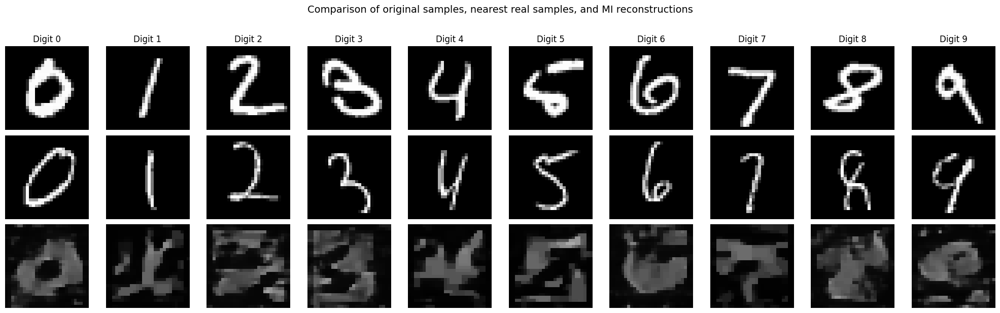

In [28]:
# =========================================================
# CCS FIGURE — Original / Nearest real / MI reconstruction
# Row 1: original sample of the class
# Row 2: nearest real image to MI reconstruction
# Row 3: MI reconstruction (best_x_img)
# =========================================================

digits = list(range(10))
fig, axes = plt.subplots(3, 10, figsize=(20, 6))

for col, digit in enumerate(digits):
    res = all_results[digit]

    best_img = to_img4(res["best_x_img"])
    original_img = to_img4(get_first_real_example_of_class(test_loader, digit))
    nearest_real_img = to_img4(
        get_nearest_real_example(best_img, test_loader, digit, max_items=max_nn_items)
    )

    # Row 1: original
    axes[0, col].imshow(original_img[0, 0].numpy(), cmap="gray", vmin=0, vmax=1)
    axes[0, col].axis("off")
    axes[0, col].set_title(f"Digit {digit}")

    # Row 2: nearest real to MI result
    axes[1, col].imshow(nearest_real_img[0, 0].numpy(), cmap="gray", vmin=0, vmax=1)
    axes[1, col].axis("off")

    # Row 3: MI reconstruction
    axes[2, col].imshow(best_img[0, 0].numpy(), cmap="gray", vmin=0, vmax=1)
    axes[2, col].axis("off")

# Row labels
axes[0, 0].set_ylabel("Original", fontsize=12)
axes[1, 0].set_ylabel("Nearest real", fontsize=12)
axes[2, 0].set_ylabel("MI result", fontsize=12)

plt.suptitle("Comparison of original samples, nearest real samples, and MI reconstructions", y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

In [30]:
# =========================================================
# Mean ± Std
# =========================================================

rows = []

for digit, res in all_results.items():
    _, metrics = evaluate_single_result(res, digit)

    rows.append({
        "ASR": float(metrics["ASR (top-1)"]),
        "Confidence": float(metrics["Target confidence"]),
        "SSIM": float(metrics["SSIM vs nearest real"]),
        "MSE": float(metrics["MSE vs nearest real"]),
        "PSNR": float(metrics["PSNR vs nearest real"]),
    })

df = pd.DataFrame(rows)

# Compute mean and std
summary = {}

for col in df.columns:
    mean = df[col].mean()
    std = df[col].std()
    summary[col] = f"{mean:.4f} ± {std:.4f}"

summary_df = pd.DataFrame(summary.items(), columns=["Metric", "Mean ± Std"])

print("\n=== Final Table (CCS-ready) ===")
print(summary_df.to_string(index=False))

# =========================================================
# Best-case vs Worst-case (simple)
# =========================================================

print("\n=== Best / Worst cases ===")

for metric in ["SSIM", "MSE", "PSNR"]:
    best = df[metric].max()
    worst = df[metric].min()

    print(f"{metric}: best = {best:.4f}, worst = {worst:.4f}")


=== Final Table (CCS-ready) ===
    Metric       Mean ± Std
       ASR  1.0000 ± 0.0000
Confidence  0.9999 ± 0.0003
      SSIM  0.2259 ± 0.0844
       MSE  0.0484 ± 0.0095
      PSNR 13.2393 ± 0.9660

=== Best / Worst cases ===
SSIM: best = 0.3731, worst = 0.1198
MSE: best = 0.0584, worst = 0.0291
PSNR: best = 15.3539, worst = 12.3339


In [8]:
# =========================================================
# BLOCK 1 — HELPERS + GLOBAL MIA
# =========================================================

def to_img4(x):
    """
    Convert to [1,1,H,W] on CPU.
    Supports:
      [H,W], [1,H,W], [1,1,H,W], [T,1,1,H,W]
    """
    if isinstance(x, np.ndarray):
        x = torch.from_numpy(x)
    x = x.detach().float().cpu()

    if x.ndim == 5:   # [T,1,1,H,W]
        x = x.mean(dim=0)
    if x.ndim == 4:
        return x
    if x.ndim == 3:
        return x.unsqueeze(0)
    if x.ndim == 2:
        return x.unsqueeze(0).unsqueeze(0)

    raise ValueError(f"Unsupported image shape: {tuple(x.shape)}")


def mse_torch(a, b):
    a = to_img4(a)
    b = to_img4(b)
    return float(((a - b) ** 2).mean().item())


def psnr_torch(a, b, data_range=1.0):
    m = mse_torch(a, b)
    return float(10.0 * np.log10((data_range ** 2) / (m + eps)))


def ssim_torch_simple(a, b, data_range=1.0):
    a = to_img4(a)
    b = to_img4(b)

    mu_a = a.mean()
    mu_b = b.mean()

    sigma_a = ((a - mu_a) ** 2).mean()
    sigma_b = ((b - mu_b) ** 2).mean()
    sigma_ab = ((a - mu_a) * (b - mu_b)).mean()

    C1 = (0.01 * data_range) ** 2
    C2 = (0.03 * data_range) ** 2

    ssim_val = ((2 * mu_a * mu_b + C1) * (2 * sigma_ab + C2)) / (
        (mu_a ** 2 + mu_b ** 2 + C1) * (sigma_a + sigma_b + C2)
    )
    return float(ssim_val.item())


def lpips_safe(a, b, lpips_fn=None):
    if not HAVE_LPIPS or lpips_fn is None:
        return np.nan

    a = to_img4(a).to(device)
    b = to_img4(b).to(device)

    # LPIPS expects 3-channel input in [-1, 1]
    a3 = a.repeat(1, 3, 1, 1) * 2.0 - 1.0
    b3 = b.repeat(1, 3, 1, 1) * 2.0 - 1.0

    with torch.no_grad():
        return float(lpips_fn(a3, b3).item())


def encode_image_to_spikes(img4, T):
    img4 = to_img4(img4).to(device)
    p = img4.clamp(0.0, 1.0)
    rand = torch.rand(T, *img4.shape, device=device)
    spikes = (rand < p.unsqueeze(0)).float()
    return spikes


@torch.no_grad()
def target_confidence_and_pred(img4, target_class):
    sp = encode_image_to_spikes(img4, T=model.T)
    logits = model(sp)
    probs = torch.softmax(logits, dim=1)
    conf_target = float(probs[0, target_class].item())
    pred = int(probs.argmax(dim=1).item())
    return conf_target, pred


def get_first_real_example_of_class(loader, cls):
    for imgs, labels in loader:
        idx = (labels == cls).nonzero(as_tuple=True)[0]
        if len(idx) > 0:
            return imgs[idx[0]].squeeze().cpu()
    raise RuntimeError(f"No real example found for class {cls}")


def get_nearest_real_example(img4, loader, cls, max_items=200):
    img2 = to_img4(img4)[0, 0]
    best_d = np.inf
    best_x = None
    count = 0

    for imgs, labels in loader:
        idx = (labels == cls).nonzero(as_tuple=True)[0]
        if len(idx) == 0:
            continue

        for j in idx:
            x2 = imgs[j].squeeze().cpu()
            d = float(((img2 - x2) ** 2).mean().item())
            if d < best_d:
                best_d = d
                best_x = x2.clone()

            count += 1
            if count >= max_items:
                return best_x

    if best_x is None:
        raise RuntimeError(f"No nearest sample found for class {cls}")

    return best_x


def nearest_distance_to_class(img4, loader, cls, max_items=200):
    img2 = to_img4(img4)[0, 0]
    best_d = np.inf
    count = 0

    for imgs, labels in loader:
        idx = (labels == cls).nonzero(as_tuple=True)[0]
        if len(idx) == 0:
            continue

        for j in idx:
            x2 = imgs[j].squeeze().cpu()
            d = float(((img2 - x2) ** 2).mean().item())
            best_d = min(best_d, d)
            count += 1
            if count >= max_items:
                return best_d

    return best_d


@torch.no_grad()
def extract_rate_features_from_spikes(spikes):
    """
    Uses the actual model path:
      conv1 -> bn1 -> lif1 -> pool
      conv2 -> bn2 -> lif2
    Returns mean firing-rate features for conv1 and conv2.
    """
    T_local = spikes.shape[0]
    v1, v2 = None, None
    conv1_feats = []
    conv2_feats = []

    for t in range(T_local):
        x = spikes[t]

        u1 = model.bn1(model.conv1(x))
        spk1, v1 = model.lif1(u1, v1)
        s1p = F.avg_pool2d(spk1, 2)

        u2 = model.bn2(model.conv2(s1p))
        spk2, v2 = model.lif2(u2, v2)

        conv1_feats.append(spk1.mean(dim=(0, 2, 3)).detach().cpu().numpy())
        conv2_feats.append(spk2.mean(dim=(0, 2, 3)).detach().cpu().numpy())

    conv1_feats = np.mean(np.stack(conv1_feats, axis=0), axis=0)
    conv2_feats = np.mean(np.stack(conv2_feats, axis=0), axis=0)
    return conv1_feats, conv2_feats


@torch.no_grad()
def get_confidence_and_spike_density(x):
    x = to_img4(x).to(device)
    sp = encode_image_to_spikes(x, T=model.T)
    logits = model(sp)
    prob = torch.softmax(logits, dim=1)
    conf = float(prob.max(dim=1)[0].item())
    spike_density = float(sp.mean().item())
    return conf, spike_density

## Fault Injection - MNIST

In [15]:
# fault_injection.py
# Complete Fault Injection Module for PyTorch / snnTorch SNNs

# get main parameter of a layer (supports memristors)
def get_layer_weight_param(layer):
    """
    Return principal trainable parameter for a layer.

    1) If the layer has a .weight tensor, return it.
    2) Otherwise, return the first parameter that requires gradient.
    """
    if hasattr(layer, "weight") and isinstance(layer.weight, torch.Tensor):
        return layer.weight            # return standard PyTorch weight

    for name, param in layer.named_parameters():
        if param.requires_grad:        # select first trainable parameter
            return param
    return None                        # layer has no trainable parameters

# Quantization utilities for bit-flip faults
def quantize_weights(w, wmin, wmax, dtype=torch.uint8):
    q = ((w - wmin) / (wmax - wmin + 1e-8) * 255).round().clamp(0, 255).to(dtype)
    return q                           # converts floating weights into 8-bit integers

def dequantize_weights(q, wmin, wmax):
    qf = q.float() / 255.0             # convert ints back to normalized floats
    return wmin + qf * (wmax - wmin)   # rescale into original weight range

def flip_bit_int(x, bit_pos):
    mask = 1 << bit_pos                # construct bitmask to flip a specific bit
    return x ^ mask                    # XOR flips the desired bit

# SYNAPTIC FAULTS
class WeightDrift:
    # W = W * (1 + delta)
    def __init__(self, delta=0.1):
        self.delta = delta             # scaling factor representing drift

    def apply(self, layer):
        w = get_layer_weight_param(layer)
        if w is None:                  # weights may not exist in some layers
            print("[WeightDrift] No weight found in", type(layer).__name__)
            return
        with torch.no_grad():          # avoid tracking gradient
            w.data *= (1 + self.delta) # multiplicative drift on all weights


class SaturatedSynapse:
    # Force all synapses to a fixed value
    def __init__(self, value):
        self.value = value             # saturation value for all weights

    def apply(self, layer):
        w = get_layer_weight_param(layer)
        if w is None:
            print("[SaturatedSynapse] No weight found.")
            return
        with torch.no_grad():
            w.data.fill_(self.value)   # all synapses set to constant


class StuckAtZeroSynapse:
    # W = 0
    def apply(self, layer):
        w = get_layer_weight_param(layer)
        if w is None:
            print("[StuckAtZeroSynapse] No weight found.")
            return
        with torch.no_grad():
            w.data.zero_()             # force all synapses to zero


class StuckAtOneSynapse:
    # W = max(W)
    def apply(self, layer):
        w = get_layer_weight_param(layer)
        if w is None:
            print("[StuckAtOneSynapse] No weight found.")
            return
        with torch.no_grad():
            w.data.fill_(w.data.max()) # saturate all synapses to maximum observed value


class WeightNoise:
    # Add Gaussian noise to weights
    def __init__(self, std=0.05):
        self.std = std                # noise standard deviation

    def apply(self, layer):
        w = get_layer_weight_param(layer)
        if w is None:
            print("[WeightNoise] No weight found.")
            return
        with torch.no_grad():
            w.data += torch.randn_like(w) * self.std   # additive Gaussian noise


class BitFlipSynapse:
    # Flip bit b in quantized representation
    def __init__(self, bit_pos, dtype=torch.uint8):
        self.bit_pos = bit_pos         # bit index to flip
        self.dtype = dtype             # integer datatype

    def apply(self, layer):
        w = get_layer_weight_param(layer)
        if w is None:
            print("[BitFlipSynapse] No weight found.")
            return

        with torch.no_grad():
            wmin, wmax = w.min().item(), w.max().item()  # extract quantization range
            q = quantize_weights(w, wmin, wmax, self.dtype)   # quantize to integer
            q_flipped = flip_bit_int(q, self.bit_pos)         # flip chosen bit
            w.data = dequantize_weights(q_flipped, wmin, wmax) # restore to float space


#   NEURON FAULTS
class DeadNeuron:
    # Neuron always outputs zero
    def __init__(self, neuron_idx=None):
        self.idx = neuron_idx          # optional specific index

    def apply(self, layer):
        w = get_layer_weight_param(layer)
        if w is None:
            print("[DeadNeuron] Layer has no weight matrix.")
            return

        if self.idx is None:           # randomly select neuron row
            self.idx = random.randint(0, w.shape[0]-1)

        with torch.no_grad():
            w[self.idx].zero_()        # zero-out outgoing weights of one neuron


class StuckNeuron:
    # Neuron always outputs constant value
    def __init__(self, neuron_idx=None, value=1.0):
        self.idx = neuron_idx          # which neuron
        self.value = value             # constant value

    def apply(self, layer):
        w = get_layer_weight_param(layer)
        if w is None:
            print("[StuckNeuron] No weight found.")
            return

        if self.idx is None:           # pick a random neuron if none given
            self.idx = random.randint(0, w.shape[0]-1)

        with torch.no_grad():
            w[self.idx].fill_(self.value)   # replace its weight vector with constant


class ThresholdShift:
    # W = W * (1 + delta)
    def __init__(self, scale=0.5):
        self.scale = scale             # scaling factor for threshold

    def apply(self, lif_layer):
        cand = ["threshold", "v_th", "v_threshold"]   # possible attribute names
        for name in cand:
            if hasattr(lif_layer, name):
                val = getattr(lif_layer, name)
                with torch.no_grad():
                    if isinstance(val, torch.Tensor):
                        val.mul_(self.scale)          # scale threshold tensor
                    else:
                        setattr(lif_layer, name, val * self.scale)  # scale Python value
                print(f"[ThresholdShift] Applied on {name}")
                return
        print("[ThresholdShift] No threshold-like attribute found.")


class LeakinessDrift:
    # tau_mem := tau_mem * scale
    def __init__(self, scale=1.5):
        self.scale = scale             # membrane leak multiplier

    def apply(self, lif_layer):
        if hasattr(lif_layer, "tau_mem"):
            with torch.no_grad():
                lif_layer.tau_mem *= self.scale       # scale membrane time constant
        else:
            print("[LeakinessDrift] No tau_mem found in LIF layer.")


#  SPIKE FAULTS
class SpikeDeletion:
    # Drop spikes with probability p
    def __init__(self, p=0.3):
        self.p = p                     # probability of deleting a spike

    def apply(self, spikes):
        mask = (torch.rand_like(spikes.float()) > self.p).float()  # keep with prob 1-p
        return spikes * mask           # zero out deleted spike positions


class SpikeInsertion:
    # Insert random spikes with probability p
    def __init__(self, p=0.1):
        self.p = p                     # insertion probability

    def apply(self, spikes):
        noise = (torch.rand_like(spikes.float()) < self.p).float() # random spike mask
        return torch.clamp(spikes + noise, 0, 1)                    # insert spikes


class SpikeTimeShift:
    # Shift spike train by dt timesteps (positive shifts forward, negative shifts backward)
    def __init__(self, dt=1):
        self.dt = dt                   # positive shifts forward

    def apply(self, spikes):
        T = spikes.shape[0]
        shifted = torch.zeros_like(spikes)            # prepare output tensor

        if self.dt > 0:
            shifted[self.dt:] = spikes[:-self.dt]     # shift forward
        else:
            shifted[:self.dt] = spikes[-self.dt:]     # shift backward

        return shifted


class PermanentDropout:
    # Kill entire spike channel
    def __init__(self, neuron_idx=None):
        self.idx = neuron_idx          # which channel to zero out

    def apply(self, spikes):
        if self.idx is None:
            self.idx = random.randint(0, spikes.shape[1]-1) # random channel
        spikes[:, self.idx] = 0        # zero the entire channel
        return spikes


#  MEMBRANE FAULTS
class MembraneNoise:
    """Add noise to membrane potential V """
    def __init__(self, std=0.1):
        self.std = std                # magnitude of noise

    def apply(self, V):
        return V + torch.randn_like(V) * self.std     # add noise to V


class MembraneClamp:
    """V := constant"""
    def __init__(self, value=0.0):
        self.value = value             # constant clamp value

    def apply(self, V):
        return torch.ones_like(V) * self.value        # replace V completely


#  HIGH-LEVEL FACADE
class FaultInjector:
    def __init__(self, model):
        self.model = model
        self.backup = deepcopy(model.state_dict())    # store original weights

    def reset(self):
        self.model.load_state_dict(self.backup)       # restore backup

    def apply_to_layer(self, layer_name, fault):
        layer = dict(self.model.named_modules())[layer_name]   # locate layer by string
        fault.apply(layer)                                    # apply fault to layer

    def apply_spike_fault(self, spikes, fault):
        return fault.apply(spikes)                            # apply spike-level fault

    def apply_membrane_fault(self, V, fault):
        return fault.apply(V)                                 # apply membrane-level fault
    

def forward_logitszz(net, spikes):
    """
    Unifies model outputs:
    - Extracts logits if model returns (logits, stats)
    - Sums temporal dimension if logits are [T,B,10]
    """
    out = net(spikes)                    # forward pass

    if isinstance(out, tuple):
        logits = out[0]                  # take logits part
    else:
        logits = out

    if logits.dim() == 3:
        logits = logits.sum(dim=0)       # collapse time dimension

    return logits


def get_layer_weight_param(layer):
    """
    Returns the main layer parameter:
    - Searches .weight
    - Searches memristor-specific names: w, W, G, g, w_plus, w_minus
    - Falls back to any trainable parameter
    """
    if hasattr(layer, "weight") and isinstance(layer.weight, torch.Tensor):
        return layer.weight

    for candidate in ["w", "W", "G", "g", "w_plus", "w_minus"]:
        if hasattr(layer, candidate):
            t = getattr(layer, candidate)
            if isinstance(t, torch.Tensor):
                return t                 # return memristor conductance matrix

    for name, param in layer.named_parameters(recurse=True):
        if param.requires_grad:
            return param                 # fallback

    return None

class ThresholdNoise:
    # Add stochastic noise to neuron threshold
    def __init__(self, std=0.05):
        self.std = std

    def apply(self, lif_layer):
        cand = ["threshold", "v_th", "v_threshold"]
        for name in cand:
            if hasattr(lif_layer, name):
                val = getattr(lif_layer, name)
                with torch.no_grad():
                    if isinstance(val, torch.Tensor):
                        noise = torch.randn_like(val) * self.std
                        val.add_(noise)
                    else:
                        setattr(lif_layer, name, val + float(torch.randn(1).item() * self.std))
                print(f"[ThresholdNoise] Applied on {name}")
                return
        print("[ThresholdNoise] No threshold-like attribute found.")

In [16]:
# =========================================================
# P1
# Spike-level fault wrappers + evaluation helpers
# Adapted for MemSNN_ReRAM_IBM / poisson_encode_images_dynamic
# =========================================================

# ---------------------------------------------------------
# Forward helper
# ---------------------------------------------------------
@torch.no_grad()
def forward_logits_from_spikes_generic(net, spikes, use_amp_eval=True):
    """
    Robust forward helper:
    - accepts [T,B,1,28,28] spikes
    - extracts logits if model returns tuple
    - collapses time dimension if needed
    """
    with torch.amp.autocast('cuda', enabled=(use_amp_eval and device == "cuda")):
        out = net(spikes)

    if isinstance(out, tuple):
        logits = out[0]
    else:
        logits = out

    if logits.dim() == 3:
        logits = logits.sum(dim=0)

    return logits


# ---------------------------------------------------------
# Simple AUC helper
# ---------------------------------------------------------
def simple_auc(scores, labels):
    """
    Computes ROC-AUC without extra dependencies beyond sklearn if available.
    """
    try:
        from sklearn.metrics import roc_auc_score
        return float(roc_auc_score(labels, scores))
    except Exception:
        # fallback: rank-based approximation
        scores = np.asarray(scores)
        labels = np.asarray(labels)

        pos = scores[labels == 1]
        neg = scores[labels == 0]

        if len(pos) == 0 or len(neg) == 0:
            return float("nan")

        wins = 0.0
        total = 0.0
        for p in pos:
            wins += np.sum(p > neg) + 0.5 * np.sum(p == neg)
            total += len(neg)
        return float(wins / max(total, 1.0))


# ---------------------------------------------------------
# Spike-level fault wrappers for evaluation pipeline
# ---------------------------------------------------------
def spike_fault_A3(spk):
    """SpikeDeletion p=0.85"""
    return SpikeDeletion(p=0.85).apply(spk) # 0.4 0.8/58% 0.6/87.68%

def spike_fault_A3_1(spk):
    """SpikeDeletion p=1.5"""
    return SpikeDeletion(p=1.5).apply(spk) # 0.4 0.8/58% 0.6/87.68%

def spike_fault_A3_04(spk):
    """SpikeDeletion p=0.4"""
    return SpikeDeletion(p=0.4).apply(spk) # 0.4 0.8/58% 0.6/87.68%

def spike_fault_A10(spk):
    """SpikeInsertion p=0.15"""
    return SpikeInsertion(p=0.15).apply(spk) # 0.2/65% 0.15/89% 0.16/87% 0.185/81% 0.19/79.33% 0.195/77.78%

def spike_fault_A10_1(spk):
    """SpikeInsertion p=0.25"""
    return SpikeInsertion(p=0.25).apply(spk) # 0.2/65% 0.15/89% 0.16/87% 0.185/81% 0.19/79.33% 0.195/77.78%

def spike_fault_A10_4(spk):
    """SpikeInsertion p=0.04"""
    return SpikeInsertion(p=0.04).apply(spk) # 0.2/65% 0.15/89% 0.16/87% 0.185/81% 0.19/79.33% 0.195/77.78%

def spike_fault_A11(spk):
    """SpikeTimeShift dt=10"""
    return SpikeTimeShift(dt=10).apply(spk) # 2/95.5% 20/32% 10/89% 15/55% 12/78.98%

def spike_fault_A11_20(spk):
    """SpikeTimeShift dt=14"""
    return SpikeTimeShift(dt=14).apply(spk) # 2/95.5% 20/32% 10/89% 15/55% 12/78.98%

def spike_fault_A11_8(spk):
    """SpikeTimeShift dt=20"""
    return SpikeTimeShift(dt=20).apply(spk) # 2/95.5% 20/32% 10/89% 15/55% 12/78.98%


# ---------------------------------------------------------
# Accuracy with optional spike fault
# ---------------------------------------------------------
@torch.no_grad()
def eval_accuracy_model_with_spikefault(net, loader, spike_transform=None, max_batches=None):
    net.eval()
    total = 0
    correct = 0

    for bi, (x, y) in enumerate(loader):
        if max_batches is not None and bi >= max_batches:
            break

        x = x.to(device, non_blocking=True)
        y = y.to(device, non_blocking=True)

        spk = poisson_encode_images_dynamic(x, T=net.T, base_rate=1.0)

        # Apply spike fault only at input stage
        if spike_transform is not None:
            spk = spike_transform(spk)

        logits = forward_logits_from_spikes_generic(net, spk)
        pred = logits.argmax(1)

        correct += (pred == y).sum().item()
        total += y.numel()

    return 100.0 * correct / max(total, 1)


# ---------------------------------------------------------
# MIA AUC with spike fault
# Uses max-logit confidence as attack score
# ---------------------------------------------------------
@torch.no_grad()
def mia_logit_auc_with_spikefault(net, train_loader, test_loader, spike_transform=None, max_batches=40):
    net.eval()
    member_scores = []
    nonmember_scores = []

    # Members
    for bi, (x, y) in enumerate(train_loader):
        if bi >= max_batches:
            break

        x = x.to(device, non_blocking=True)
        spk = poisson_encode_images_dynamic(x, T=net.T, base_rate=1.0)

        if spike_transform is not None:
            spk = spike_transform(spk)

        logits = forward_logits_from_spikes_generic(net, spk)
        member_scores.extend(logits.max(dim=1).values.detach().cpu().numpy().tolist())

    # Non-members
    for bi, (x, y) in enumerate(test_loader):
        if bi >= max_batches:
            break

        x = x.to(device, non_blocking=True)
        spk = poisson_encode_images_dynamic(x, T=net.T, base_rate=1.0)

        if spike_transform is not None:
            spk = spike_transform(spk)

        logits = forward_logits_from_spikes_generic(net, spk)
        nonmember_scores.extend(logits.max(dim=1).values.detach().cpu().numpy().tolist())

    scores = member_scores + nonmember_scores
    labels = [1] * len(member_scores) + [0] * len(nonmember_scores)

    return simple_auc(scores, labels)

In [17]:
# =========================================================
# P2
# Extended fault configurations
# Adapted for MemSNN_ReRAM_IBM
# =========================================================

fault_configs = [
    ("clean", None, None),   # name, weight_or_layer_fault_cfg, spike_fault_fn

    # -----------------------------------------------------
    # Synaptic faults
    # -----------------------------------------------------
    ("WeightDrift_1", ("conv1", WeightDrift(delta=1)), None),
    ("WeightDrift_5", ("conv1", WeightDrift(delta=5.0)), None), # 0.3
    ("WeightDrift_300", ("conv1", WeightDrift(delta=300)), None), # 0.3

    ("BitFlip_bit5", ("conv1", BitFlipSynapse(bit_pos=5)), None),
    ("BitFlip_bit6", ("conv1", BitFlipSynapse(bit_pos=6)), None), # 7 
    ("BitFlip_bit7", ("conv1", BitFlipSynapse(bit_pos=7)), None),

    # For memristive variability
    ("WeightNoise_0.5", ("conv1", WeightNoise(std=0.5)), None), # 0.05 0.55/79% 0.65/40.37% 0.85/38% 
    ("WeightNoise_0.4", ("conv1", WeightNoise(std=0.4)), None), # 0.05 0.55/79% 0.65/40.37% 0.85/38% 
    ("WeightNoise_0.08", ("conv1", WeightNoise(std=0.08)), None), # 0.05 0.55/79% 0.65/40.37% 0.85/38% 
    ("WeightNoise_0.63", ("conv1", WeightNoise(std=0.63)), None), # 0.05 0.55/79% 0.65/40.37% 0.85/38% 

    # -----------------------------------------------------
    # Neuron-level faults
    # -----------------------------------------------------
    ("ThresholdShift_lif1", ("lif1", ThresholdShift(scale=6.25)), None), # 0.5 2.5/93% 10.5/69% 9.5/71.3%
    ("ThresholdShift_lif2", ("lif1", ThresholdShift(scale=2)), None), # 0.5 2.5/93% 10.5/69% 9.5/71.3%
    ("ThresholdShift_lif10", ("lif1", ThresholdShift(scale=10)), None), # 0.5 2.5/93% 10.5/69% 9.5/71.3%
    # Stochastic threshold fault
    ("ThresholdNoise_lif01", ("lif1", ThresholdNoise(std=0.1)), None), # 0.1  0.2/92% 0.05/93.86% 3.0/8.82% 1.0/43.2% 0.65/60% 0.6/23.52% 0.45/94.37% 
    ("ThresholdNoise_lif001", ("lif1", ThresholdNoise(std=0.01)), None), # 0.1  0.2/92% 0.05/93.86% 3.0/8.82% 1.0/43.2% 0.65/60% 0.6/23.52% 0.45/94.37% 
    ("ThresholdNoise_lif02", ("lif1", ThresholdNoise(std=0.2)), None), # 0.1  0.2/92% 0.05/93.86% 3.0/8.82% 1.0/43.2% 0.65/60% 0.6/23.52% 0.45/94.37% 

    # -----------------------------------------------------
    # Spike-level faults
    # -----------------------------------------------------
    ("SpikeDeletion_p0.75", None, spike_fault_A3), 
    ("SpikeInsertion_p0.21", None, spike_fault_A10),
    ("SpikeTimeShift_dt13", None, spike_fault_A11),

    ("SpikeDeletion_p0.75b", None, spike_fault_A3_1), 
    ("SpikeInsertion_p0.21b", None, spike_fault_A10_1),
    ("SpikeTimeShift_dt13b", None, spike_fault_A11_20),

    ("SpikeDeletion_p0.75c", None, spike_fault_A3_04), 
    ("SpikeInsertion_p0.21c", None, spike_fault_A10_4),
    ("SpikeTimeShift_dt13c", None, spike_fault_A11_8),
]

In [18]:
# =========================================================
# P3
# Full evaluation: Accuracy vs MIA AUC vs MI leakage
# Single target class for speed and consistency
# ========================================================= 300 - 59min / 800 - 280 min (k = 24)

# ---------------------------------------------------------
# USER CHOICE
# ---------------------------------------------------------
target_class_eval = 0   
attack_steps = 600      # 100 800 1200 later
attack_K = 8           # 8 is faster than 24, for screening
mia_max_batches = 40

results = []

# ---------------------------------------------------------
# Helper: run MI attack on one class and compute leakage metrics
# ---------------------------------------------------------
def evaluate_mi_single_class(net, target_class=0, steps=800, K=12):
    """
    Runs your MI attack on one class and returns core leakage metrics.
    """
    attack_result = model_inversion_attack_eot_ste_full_blur(
        model=net,
        target_class=target_class,
        device=device,
        steps=steps,
        K=K,
        T=net.T,
        base_rate=1.0,
        use_base_rate_schedule=False,
        snapshot_every=200,
    )

    best_img = to_img4(attack_result["best_x_img"])
    final_img = to_img4(attack_result["final_x_img"])

    original_img = to_img4(get_first_real_example_of_class(test_loader, target_class))
    nearest_real_img = to_img4(
        get_nearest_real_example(best_img, test_loader, target_class, max_items=max_nn_items)
    )

    target_conf, pred = target_confidence_and_pred(best_img, target_class)
    asr_top1 = int(pred == target_class)

    mse_nearest = mse_torch(best_img, nearest_real_img)
    psnr_nearest = psnr_torch(best_img, nearest_real_img)
    ssim_nearest = ssim_torch_simple(best_img, nearest_real_img)

    mse_original = mse_torch(best_img, original_img)
    psnr_original = psnr_torch(best_img, original_img)
    ssim_original = ssim_torch_simple(best_img, original_img)

    return {
        "mi_best_conf": float(attack_result["best_conf"]),
        "mi_target_conf": float(target_conf),
        "mi_pred_class": int(pred),
        "mi_asr_top1": int(asr_top1),
        "mi_mse_nearest": float(mse_nearest),
        "mi_psnr_nearest": float(psnr_nearest),
        "mi_ssim_nearest": float(ssim_nearest),
        "mi_mse_original": float(mse_original),
        "mi_psnr_original": float(psnr_original),
        "mi_ssim_original": float(ssim_original),
        "mi_best_img": best_img.detach().cpu(),
        "mi_final_img": final_img.detach().cpu(),
        "mi_nearest_img": nearest_real_img.detach().cpu(),
        "mi_original_img": original_img.detach().cpu(),
    }


# ---------------------------------------------------------
# Main evaluation loop
# ---------------------------------------------------------
for name, layer_fault_cfg, spike_fn in fault_configs:

    print("\n" + "=" * 70)
    print(f"Evaluating fault config: {name}")
    print("=" * 70)

    t0 = time.time()

    # Start from clean model
    net_fault = deepcopy(model).to(device)
    net_fault.eval()

    # Apply layer / weight / neuron fault
    if layer_fault_cfg is not None:
        layer_name, fault_obj = layer_fault_cfg
        fi = FaultInjector(net_fault)
        fi.apply_to_layer(layer_name, fault_obj)
        print(f"Applied layer fault on: {layer_name} -> {type(fault_obj).__name__}")

    # -----------------------------------------------------
    # 1) Accuracy
    # -----------------------------------------------------
    if spike_fn is None:
        acc = evaluate(net_fault, test_loader, base_rate=1.0) * 100.0
    else:
        acc = eval_accuracy_model_with_spikefault(
            net_fault,
            test_loader,
            spike_transform=spike_fn
        )

    print(f"Accuracy: {acc:.2f}%")

    # -----------------------------------------------------
    # 2) MIA AUC
    # -----------------------------------------------------
    if spike_fn is None:
        auc_logits = mia_logit_auc_with_spikefault(
            net_fault,
            train_loader,
            test_loader,
            spike_transform=None,
            max_batches=mia_max_batches
        )
    else:
        auc_logits = mia_logit_auc_with_spikefault(
            net_fault,
            train_loader,
            test_loader,
            spike_transform=spike_fn,
            max_batches=mia_max_batches
        )

    print(f"MIA logit AUC: {auc_logits:.4f}")

    # -----------------------------------------------------
    # 3) Model inversion leakage on one target class
    # -----------------------------------------------------
    try:
        mi_metrics = evaluate_mi_single_class(
            net_fault,
            target_class=target_class_eval,
            steps=attack_steps,
            K=attack_K
        )

        print(f"MI best confidence:   {mi_metrics['mi_best_conf']:.4f}")
        print(f"MI target confidence: {mi_metrics['mi_target_conf']:.4f}")
        print(f"MI ASR (top-1):       {mi_metrics['mi_asr_top1']}")
        print(f"MI SSIM nearest:      {mi_metrics['mi_ssim_nearest']:.4f}")
        print(f"MI MSE nearest:       {mi_metrics['mi_mse_nearest']:.4f}")
        print(f"MI PSNR nearest:      {mi_metrics['mi_psnr_nearest']:.4f}")

    except Exception as e:
        print(f"[WARNING] MI evaluation failed for {name}: {e}")
        mi_metrics = {
            "mi_best_conf": np.nan,
            "mi_target_conf": np.nan,
            "mi_pred_class": np.nan,
            "mi_asr_top1": np.nan,
            "mi_mse_nearest": np.nan,
            "mi_psnr_nearest": np.nan,
            "mi_ssim_nearest": np.nan,
            "mi_mse_original": np.nan,
            "mi_psnr_original": np.nan,
            "mi_ssim_original": np.nan,
            "mi_best_img": None,
            "mi_final_img": None,
            "mi_nearest_img": None,
            "mi_original_img": None,
        }

    elapsed = time.time() - t0
    print(f"Elapsed time: {elapsed/60:.2f} min")

    results.append({
        "fault": name,
        "target_class": target_class_eval,
        "accuracy": acc,
        "mia_auc_logits": auc_logits,
        "mi_best_conf": mi_metrics["mi_best_conf"],
        "mi_target_conf": mi_metrics["mi_target_conf"],
        "mi_pred_class": mi_metrics["mi_pred_class"],
        "mi_asr_top1": mi_metrics["mi_asr_top1"],
        "mi_ssim_nearest": mi_metrics["mi_ssim_nearest"],
        "mi_mse_nearest": mi_metrics["mi_mse_nearest"],
        "mi_psnr_nearest": mi_metrics["mi_psnr_nearest"],
        "mi_ssim_original": mi_metrics["mi_ssim_original"],
        "mi_mse_original": mi_metrics["mi_mse_original"],
        "mi_psnr_original": mi_metrics["mi_psnr_original"],
        "elapsed_sec": elapsed,
    })

# ---------------------------------------------------------
# Summary table
# ---------------------------------------------------------
df_results = pd.DataFrame(results)

print("\nSummary: Accuracy vs MIA AUC vs MI leakage")
display(df_results.sort_values(by="mi_ssim_nearest", ascending=False))


Evaluating fault config: clean
Accuracy: 96.35%
MIA logit AUC: 0.5016

===== Starting Model Inversion Attack (Full + Blur) =====
Target class: 0
Steps: 600 | Population K: 8 | T: 25
Stage1 LR: 0.01 | Stage2 LR: 0.003 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.14 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.05, xi_blur=0.015, xi_mean=0.8
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.18, xi_l2=0.15, xi_blur=0.2, xi_mean=1.2


[Iter 0000/600] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.003220   (best=0.003220)
  avg_loss(no_priors)  : 5.313671
  avg_target_logit     : -4.142839
  avg_max_other_logit  : 1.157516
  avg_sparsity         : 0.100051
  fr_mean/min/max      : 0.100051 / 0.080835 / 0.124043
  fr_pen(one-sided)    : 0.006510   fr_l2: 0.010112
  tv=0.000000 l2=0.009950 blur=0.000162
  xmean=0.099750 mean_pen=0.001620 grad_norm=0.010356

[Iter 0010/600] stage=1 base_ra

,fault,target_class,accuracy,mia_auc_logits,mi_best_conf,mi_target_conf,mi_pred_class,mi_asr_top1,mi_ssim_nearest,mi_mse_nearest,mi_psnr_nearest,mi_ssim_original,mi_mse_original,mi_psnr_original,elapsed_sec
1,WeightDrift_1,0,96.19,0.492807,0.999019,0.999637,0,1,0.435989,0.053200,12.740907,0.404961,0.091275,10.396464,919.958398
24,SpikeInsertion_p0.21c,0,96.12,0.503036,0.999899,0.999792,0,1,0.419897,0.053115,12.747791,0.393349,0.091160,10.401963,891.032508
17,SpikeDeletion_p0.75,0,60.84,0.507670,0.999899,0.999775,0,1,0.419807,0.053125,12.747041,0.393482,0.091139,10.402978,504.398245
23,SpikeDeletion_p0.75c,0,95.68,0.512176,0.999898,0.999792,0,1,0.419661,0.053132,12.746469,0.393230,0.091171,10.401427,894.337140
20,SpikeDeletion_p0.75b,0,10.28,0.524062,0.999896,0.999788,0,1,0.419577,0.053142,12.745625,0.393671,0.091105,10.404598,452.568654
18,SpikeInsertion_p0.21,0,85.93,0.500721,0.999898,0.999780,0,1,0.419448,0.053153,12.744709,0.393417,0.091143,10.402775,540.034813
21,SpikeInsertion_p0.21b,0,52.50,0.483136,0.999898,0.999784,0,1,0.419378,0.053144,12.745449,0.392866,0.091211,10.399534,437.819261
25,SpikeTimeShift_dt13c,0,44.92,0.487140,0.999897,0.999757,0,1,0.419241,0.053180,12.742488,0.393228,0.091180,10.401008,856.235771
22,SpikeTimeShift_dt13b,0,90.94,0.503235,0.999897,0.999768,0,1,0.419122,0.053169,12.743418,0.392992,0.091191,10.400466,810.414680
19,SpikeTimeShift_dt13,0,95.62,0.506073,0.999896,0.999776,0,1,0.418934,0.053183,12.742236,0.392531,0.091261,10.397155,533.366039


In [ ]:
# =========================================================
# P4 — Normalized results vs clean (ratio + % change)
# =========================================================

df = df_results.copy()

# Get clean baseline
clean_row = df[df["fault"] == "clean"].iloc[0]

metrics = [
    "accuracy",
    "mi_best_conf",
    "mi_ssim_nearest",
    "mi_mse_nearest",
    "mi_psnr_nearest"
]

norm_rows = []

for _, row in df.iterrows():

    norm_entry = {"fault": row["fault"]}

    for m in metrics:
        clean_val = clean_row[m]
        val = row[m]

        ratio = val / clean_val if clean_val != 0 else float("nan")
        pct = (ratio - 1.0) * 100.0

        norm_entry[f"{m}_ratio"] = ratio
        norm_entry[f"{m}_pct"] = pct

    norm_rows.append(norm_entry)

df_norm = pd.DataFrame(norm_rows)

print("\n=== Normalized Results (vs clean) ===")
display(df_norm.sort_values(by="mi_ssim_nearest_ratio", ascending=False))


=== Normalized Results (vs clean) ===


,fault,accuracy_ratio,accuracy_pct,mi_best_conf_ratio,mi_best_conf_pct,mi_ssim_nearest_ratio,mi_ssim_nearest_pct,mi_mse_nearest_ratio,mi_mse_nearest_pct,mi_psnr_nearest_ratio,mi_psnr_nearest_pct
6,ThresholdShift_lif1,0.732812,-26.718832,0.183401,-81.659923,1.517602,51.760167,0.952140,-4.785952,1.017077,1.707730
7,ThresholdNoise_lif1,0.850183,-14.981742,0.327305,-67.269550,1.343853,34.385338,1.026698,2.669842,0.990825,-0.917480
4,BitFlip_bit6,0.771622,-22.837767,0.947961,-5.203880,1.247658,24.765786,1.010006,1.000602,0.996533,-0.346691
3,BitFlip_bit5,0.990819,-0.918101,0.999942,-0.005817,1.236004,23.600396,1.075699,7.569909,0.974591,-2.540937
1,WeightDrift_1,0.997287,-0.271257,0.999613,-0.038716,1.067935,6.793498,0.926946,-7.305404,1.026415,2.641544
10,SpikeTimeShift_dt13,0.775587,-22.441315,1.000005,0.000510,1.001993,0.199298,0.999744,-0.025638,1.000089,0.008928
0,clean,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000
9,SpikeInsertion_p0.21,0.760042,-23.995827,1.000002,0.000180,0.998235,-0.176471,1.002696,0.269566,0.999063,-0.093740
8,SpikeDeletion_p0.75,0.731977,-26.802295,1.000003,0.000322,0.998076,-0.192379,1.002564,0.256369,0.999108,-0.089157
2,WeightDrift_100,0.953886,-4.611372,0.873416,-12.658436,0.658634,-34.136571,0.929345,-7.065524,1.025515,2.551548


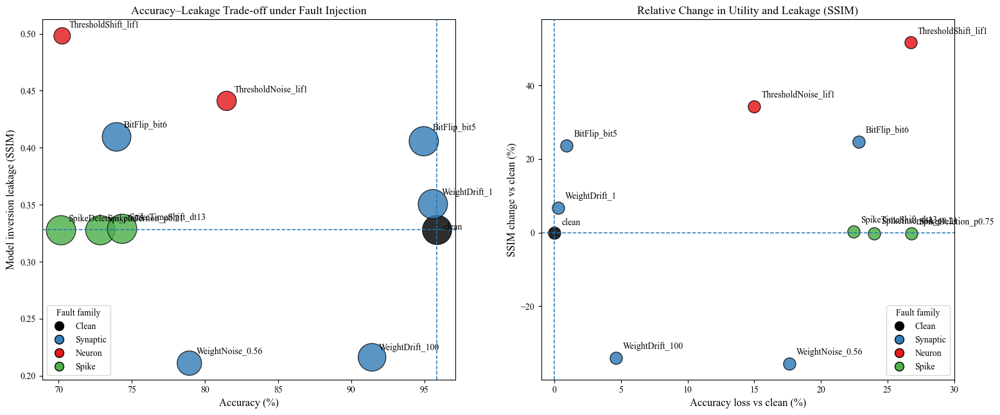

Saved PDF: fault_tradeoff_ssim.pdf
Saved PNG: fault_tradeoff_ssim.png


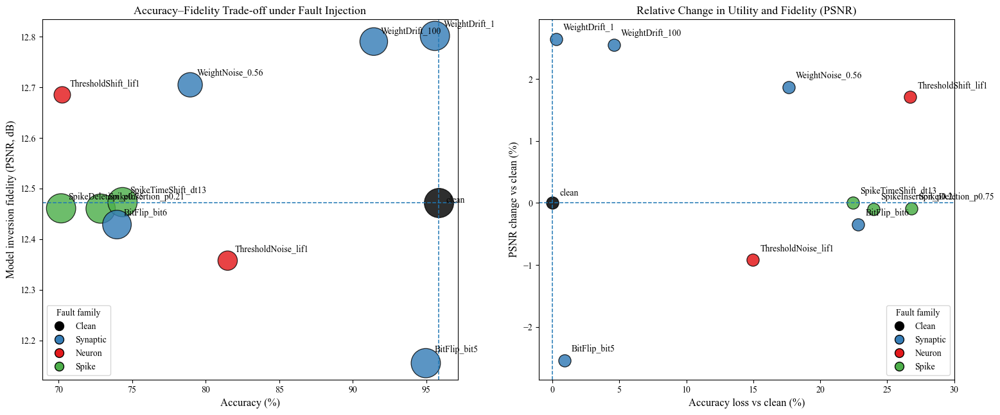

Saved PDF: fault_tradeoff_psnr.pdf
Saved PNG: fault_tradeoff_psnr.png


In [ ]:
# =========================================================
# P4 — Trade-off figures (SSIM + PSNR)
# - Better label placement
# - Times-like serif font
# - PDF + PNG output
# - PSNR shown explicitly in dB
# =========================================================

from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Optional label adjustment
try:
    from adjustText import adjust_text
    HAVE_ADJUST_TEXT = True
except Exception:
    HAVE_ADJUST_TEXT = False

# -----------------------------
# Global figure style
# -----------------------------
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "font.size": 11,
    "axes.titlesize": 13,
    "axes.labelsize": 12,
    "legend.fontsize": 10,
    "legend.title_fontsize": 10,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
})

# -----------------------------
# Safety: numeric conversion
# -----------------------------
plot_df = df_results.copy()

numeric_cols = [
    "accuracy",
    "mia_auc_logits",
    "mi_best_conf",
    "mi_ssim_nearest",
    "mi_mse_nearest",
    "mi_psnr_nearest",
]

for c in numeric_cols:
    plot_df[c] = pd.to_numeric(plot_df[c], errors="coerce")

# -----------------------------
# Baseline and relative deltas
# -----------------------------
clean_row = plot_df[plot_df["fault"] == "clean"].iloc[0]

plot_df["acc_delta_pct_signed"] = (plot_df["accuracy"] / clean_row["accuracy"] - 1.0) * 100.0
plot_df["ssim_delta_pct_signed"] = (plot_df["mi_ssim_nearest"] / clean_row["mi_ssim_nearest"] - 1.0) * 100.0
plot_df["psnr_delta_pct_signed"] = (plot_df["mi_psnr_nearest"] / clean_row["mi_psnr_nearest"] - 1.0) * 100.0

plot_df["acc_loss_pct"] = np.maximum(0.0, -plot_df["acc_delta_pct_signed"])
plot_df["ssim_gain_pct"] = plot_df["ssim_delta_pct_signed"]
plot_df["psnr_gain_pct"] = plot_df["psnr_delta_pct_signed"]

# -----------------------------
# Fault family
# -----------------------------
def fault_family(name):
    name = str(name).lower()
    if "weightdrift" in name or "bitflip" in name or "weightnoise" in name:
        return "Synaptic"
    if "threshold" in name:
        return "Neuron"
    if "spike" in name:
        return "Spike"
    return "Clean"

family_colors = {
    "Clean": "black",
    "Synaptic": "#377eb8",
    "Neuron": "#e41a1c",
    "Spike": "#4daf4a",
}

plot_df["family"] = plot_df["fault"].apply(fault_family)
plot_df["color"] = plot_df["family"].map(family_colors)

# Bubble size from confidence
plot_df["bubble_size"] = 180 + 900 * plot_df["mi_best_conf"].clip(lower=0, upper=1)

legend_handles = [
    Line2D([0], [0], marker='o', color='w', label=family,
           markerfacecolor=color, markeredgecolor='black',
           markersize=10)
    for family, color in family_colors.items()
]

# -----------------------------
# Better labels
# -----------------------------
manual_offsets_left = {
    "clean": (8, -2),
    "WeightDrift_1": (10, 8),
    "WeightDrift_100": (8, 6),
    "BitFlip_bit5": (10, 10),
    "BitFlip_bit6": (8, 8),
    "WeightNoise_0.56": (8, 8),
    "ThresholdShift_lif1": (8, 8),
    "ThresholdNoise_lif1": (8, 8),
    "SpikeDeletion_p0.75": (8, 8),
    "SpikeInsertion_p0.21": (8, 8),
    "SpikeTimeShift_dt13": (8, 8),
}

manual_offsets_right = {
    "clean": (8, 6),
    "WeightDrift_1": (8, 8),
    "WeightDrift_100": (8, 8),
    "BitFlip_bit5": (8, 8),
    "BitFlip_bit6": (8, 8),
    "WeightNoise_0.56": (8, 8),
    "ThresholdShift_lif1": (8, 8),
    "ThresholdNoise_lif1": (8, 8),
    "SpikeDeletion_p0.75": (8, 8),
    "SpikeInsertion_p0.21": (8, 8),
    "SpikeTimeShift_dt13": (8, 8),
}

def add_labels(ax, xcol, ycol, offsets, fontsize=10):
    texts = []
    for _, row in plot_df.iterrows():
        dx, dy = offsets.get(row["fault"], (6, 6))
        txt = ax.annotate(
            row["fault"],
            (row[xcol], row[ycol]),
            xytext=(dx, dy),
            textcoords="offset points",
            fontsize=fontsize,
            ha="left",
            va="bottom"
        )
        texts.append(txt)

    if HAVE_ADJUST_TEXT:
        adjust_text(
            texts,
            ax=ax,
            arrowprops=dict(arrowstyle="-", color="gray", lw=0.6),
            expand_points=(1.2, 1.2),
            expand_text=(1.2, 1.2),
            force_points=0.4,
            force_text=0.4,
        )

def make_tradeoff_figure(metric_col,
                         metric_gain_col,
                         ylabel_left,
                         ylabel_right,
                         title_left,
                         title_right,
                         pdf_name,
                         png_name):
    fig, axes = plt.subplots(1, 2, figsize=(15.8, 6.6))

    # LEFT
    ax = axes[0]
    for family, sub in plot_df.groupby("family"):
        ax.scatter(
            sub["accuracy"],
            sub[metric_col],
            s=sub["bubble_size"],
            color=family_colors[family],
            edgecolors="black",
            linewidths=0.9,
            alpha=0.82,
            label=family
        )

    add_labels(ax, "accuracy", metric_col, manual_offsets_left, fontsize=10)

    ax.axvline(clean_row["accuracy"], linestyle="--", linewidth=1.1)
    ax.axhline(clean_row[metric_col], linestyle="--", linewidth=1.1)

    ax.set_xlabel("Accuracy (%)")
    ax.set_ylabel(ylabel_left)
    ax.set_title(title_left)
    ax.legend(handles=legend_handles, title="Fault family", loc="best", frameon=True)

    # RIGHT
    ax2 = axes[1]
    for family, sub in plot_df.groupby("family"):
        ax2.scatter(
            sub["acc_loss_pct"],
            sub[metric_gain_col],
            s=190,
            color=family_colors[family],
            edgecolors="black",
            linewidths=0.9,
            alpha=0.85,
            label=family
        )

    add_labels(ax2, "acc_loss_pct", metric_gain_col, manual_offsets_right, fontsize=10)

    ax2.axhline(0, linestyle="--", linewidth=1.1)
    ax2.axvline(0, linestyle="--", linewidth=1.1)

    ax2.set_xlabel("Accuracy loss vs clean (%)")
    ax2.set_ylabel(ylabel_right)
    ax2.set_title(title_right)
    ax2.legend(handles=legend_handles, title="Fault family", loc="best", frameon=True)

    x_max = max(1.0, plot_df["acc_loss_pct"].max() * 1.12)
    y_min = min(-2.0, plot_df[metric_gain_col].min() * 1.12)
    y_max = max(1.0, plot_df[metric_gain_col].max() * 1.12)
    ax2.set_xlim(-1, x_max)
    ax2.set_ylim(y_min, y_max)

    plt.tight_layout()
    fig.savefig(pdf_name, bbox_inches="tight")
    fig.savefig(png_name, dpi=400, bbox_inches="tight")
    plt.show()

    print(f"Saved PDF: {pdf_name}")
    print(f"Saved PNG: {png_name}")

# Main SSIM figure
make_tradeoff_figure(
    metric_col="mi_ssim_nearest",
    metric_gain_col="ssim_gain_pct",
    ylabel_left="Model inversion leakage (SSIM)",
    ylabel_right="SSIM change vs clean (%)",
    title_left="Accuracy–Leakage Trade-off under Fault Injection",
    title_right="Relative Change in Utility and Leakage (SSIM)",
    pdf_name="fault_tradeoff_ssim.pdf",
    png_name="fault_tradeoff_ssim.png",
)

# Secondary PSNR figure
make_tradeoff_figure(
    metric_col="mi_psnr_nearest",
    metric_gain_col="psnr_gain_pct",
    ylabel_left="Model inversion fidelity (PSNR, dB)",
    ylabel_right="PSNR change vs clean (%)",
    title_left="Accuracy–Fidelity Trade-off under Fault Injection",
    title_right="Relative Change in Utility and Fidelity (PSNR)",
    pdf_name="fault_tradeoff_psnr.pdf",
    png_name="fault_tradeoff_psnr.png",
)

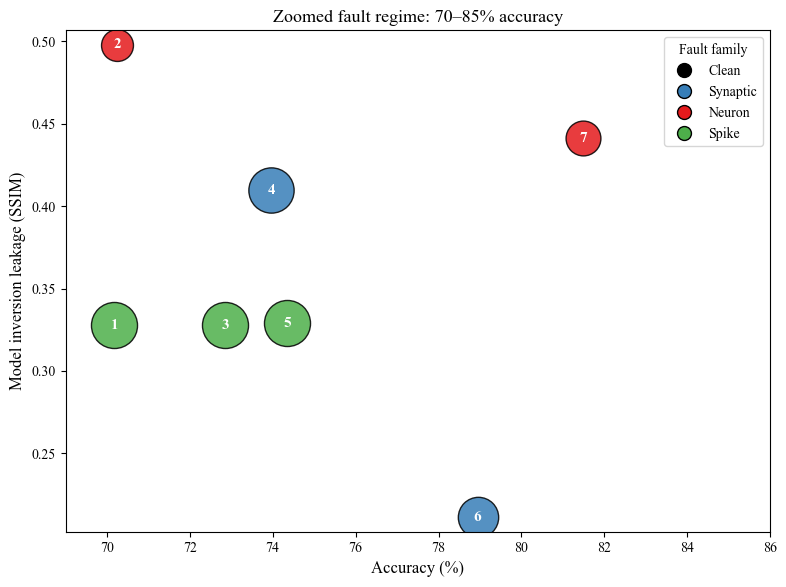


=== Zoomed plot lookup table ===


,ID,Fault,Family,Accuracy,SSIM
0,1,SpikeDeletion_p0.75,Spike,70.16,0.327586
1,2,ThresholdShift_lif1,Neuron,70.24,0.498103
2,3,SpikeInsertion_p0.21,Spike,72.85,0.327638
3,4,BitFlip_bit6,Synaptic,73.96,0.409502
4,5,SpikeTimeShift_dt13,Spike,74.34,0.328871
5,6,WeightNoise_0.56,Synaptic,78.94,0.211033
6,7,ThresholdNoise_lif1,Neuron,81.49,0.441075


In [ ]:
# =========================================================
# Zoomed fault plot: accuracy in [70, 85]
# Numbers inside markers + lookup table
# =========================================================

zoom_df = df_results.copy()

numeric_cols = [
    "accuracy",
    "mi_ssim_nearest",
    "mi_best_conf",
]
for c in numeric_cols:
    zoom_df[c] = pd.to_numeric(zoom_df[c], errors="coerce")

# Keep only faults in the desired accuracy band
zoom_df = zoom_df[(zoom_df["accuracy"] >= 70) & (zoom_df["accuracy"] <= 85)].copy()
zoom_df = zoom_df.sort_values("accuracy").reset_index(drop=True)

# Add numeric IDs
zoom_df["ID"] = np.arange(1, len(zoom_df) + 1)

def fault_family(name):
    name = str(name).lower()
    if "weightdrift" in name or "bitflip" in name or "weightnoise" in name:
        return "Synaptic"
    if "threshold" in name:
        return "Neuron"
    if "spike" in name:
        return "Spike"
    return "Clean"

family_colors = {
    "Clean": "black",
    "Synaptic": "#377eb8",
    "Neuron": "#e41a1c",
    "Spike": "#4daf4a",
}

zoom_df["family"] = zoom_df["fault"].apply(fault_family)
zoom_df["color"] = zoom_df["family"].map(family_colors)
zoom_df["bubble_size"] = 400 + 700 * zoom_df["mi_best_conf"].clip(lower=0, upper=1)

plt.figure(figsize=(8, 6))

for _, row in zoom_df.iterrows():
    plt.scatter(
        row["accuracy"],
        row["mi_ssim_nearest"],
        s=row["bubble_size"],
        color=row["color"],
        edgecolors="black",
        linewidths=1.0,
        alpha=0.85,
        zorder=2
    )
    plt.text(
        row["accuracy"],
        row["mi_ssim_nearest"],
        str(int(row["ID"])),
        ha="center",
        va="center",
        fontsize=11,
        fontweight="bold",
        color="white",
        zorder=3
    )

plt.xlabel("Accuracy (%)")
plt.ylabel("Model inversion leakage (SSIM)")
plt.title("Zoomed fault regime: 70–85% accuracy")
plt.xlim(69, 86)

ymin = zoom_df["mi_ssim_nearest"].min()
ymax = zoom_df["mi_ssim_nearest"].max()
pad = 0.03 * (ymax - ymin if ymax > ymin else 1.0)
plt.ylim(ymin - pad, ymax + pad)

# Legend
from matplotlib.lines import Line2D
legend_handles = [
    Line2D([0], [0], marker='o', color='w', label=family,
           markerfacecolor=color, markeredgecolor='black',
           markersize=10)
    for family, color in family_colors.items()
]
plt.legend(handles=legend_handles, title="Fault family", loc="best", frameon=True)

plt.tight_layout()
plt.show()

# Lookup table
lookup_df = zoom_df[["ID", "fault", "family", "accuracy", "mi_ssim_nearest"]].copy()
lookup_df = lookup_df.rename(columns={
    "fault": "Fault",
    "family": "Family",
    "accuracy": "Accuracy",
    "mi_ssim_nearest": "SSIM"
})

print("\n=== Zoomed plot lookup table ===")
display(lookup_df)

Clean accuracy reference: 96.75%

Running sweep: WeightDrift
WeightDrift | delta=0.001
WeightDrift | delta=0.01
WeightDrift | delta=0.1
WeightDrift | delta=0.5
WeightDrift | delta=1
WeightDrift | delta=2
WeightDrift | delta=10
WeightDrift | delta=100
WeightDrift | delta=200
WeightDrift | delta=500

Running sweep: BitFlip
BitFlip | bit_pos=0
BitFlip | bit_pos=1
BitFlip | bit_pos=2
BitFlip | bit_pos=3
BitFlip | bit_pos=4
BitFlip | bit_pos=5
BitFlip | bit_pos=6
BitFlip | bit_pos=7
BitFlip | bit_pos=8
BitFlip | bit_pos=9

Running sweep: WeightNoise
WeightNoise | std=0.01
WeightNoise | std=0.03
WeightNoise | std=0.05
WeightNoise | std=0.08
WeightNoise | std=0.12
WeightNoise | std=0.2
WeightNoise | std=0.35
WeightNoise | std=0.5
WeightNoise | std=0.65
WeightNoise | std=2.0

Running sweep: ThresholdShift
ThresholdShift | scale=0.5
[ThresholdShift] Applied on v_th
ThresholdShift | scale=0.8
[ThresholdShift] Applied on v_th
ThresholdShift | scale=1.0
[ThresholdShift] Applied on v_th
ThresholdSh

,fault_type,level,param_name,param_value,accuracy,acc_drop_vs_clean,acc_retention_ratio,disagreement_rate,sdc_rate,logit_mse,runtime_sec
0,WeightDrift,Synaptic,delta,0.001,96.88,-0.13,1.001344,0.48,0.175638,0.068779,18.676104
1,WeightDrift,Synaptic,delta,0.010,96.83,-0.08,1.000827,0.48,0.196301,0.069889,18.807141
2,WeightDrift,Synaptic,delta,0.100,96.78,-0.03,1.000310,0.51,0.227296,0.132200,18.686095
3,WeightDrift,Synaptic,delta,0.500,96.46,0.29,0.997003,1.95,1.033165,1.193157,18.870547
4,WeightDrift,Synaptic,delta,1.000,94.35,2.40,0.975194,4.70,3.440438,3.752931,18.731078
...,...,...,...,...,...,...,...,...,...,...,...
75,SpikeTimeShift,Spike,dt,16.000,61.71,35.04,0.637829,38.20,37.111272,35.418080,18.766103
76,SpikeTimeShift,Spike,dt,20.000,39.66,57.09,0.409922,60.31,59.840893,52.929146,18.755864
77,SpikeTimeShift,Spike,dt,25.000,10.52,86.23,0.108734,89.42,89.265420,74.207458,18.661145
78,SpikeTimeShift,Spike,dt,30.000,10.90,85.85,0.112661,89.04,88.903812,74.197379,18.560901



=== Robustness summary ===


,fault_type,level,best_accuracy,worst_accuracy,max_acc_drop,max_sdc_rate,max_disagreement_rate,max_logit_mse,threshold_90,threshold_80,threshold_70,robustness_auc
4,ThresholdNoise,Neuron,96.48,18.16,78.59,81.609670,81.59,236.245686,0.05,0.20,0.35,58.507020
3,ThresholdShift,Neuron,96.92,10.14,86.61,89.782002,89.58,57.669866,5.00,5.00,10.00,35.751136
5,SpikeDeletion,Spike,96.75,10.71,86.04,89.100114,89.26,74.208187,0.85,0.85,1.00,34.925339
6,SpikeInsertion,Spike,96.60,10.10,86.65,89.823329,89.62,344.018878,0.15,0.15,0.20,25.312315
7,SpikeTimeShift,Spike,96.85,10.52,86.23,89.265420,89.42,74.207458,14.00,14.00,16.00,46.774359
1,BitFlip,Synaptic,96.81,28.34,68.41,71.040397,71.38,65.945531,7.00,7.00,7.00,88.601667
0,WeightDrift,Synaptic,96.88,58.11,38.64,40.820333,41.74,22.351647,2.00,10.00,10.00,59.372658
2,WeightNoise,Synaptic,96.90,36.97,59.78,62.175845,62.63,41.009323,0.12,0.35,0.35,48.162764


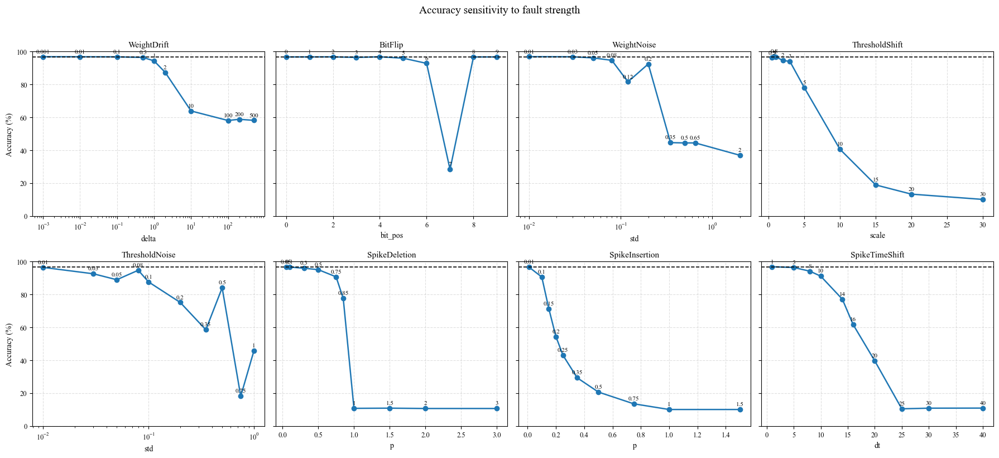

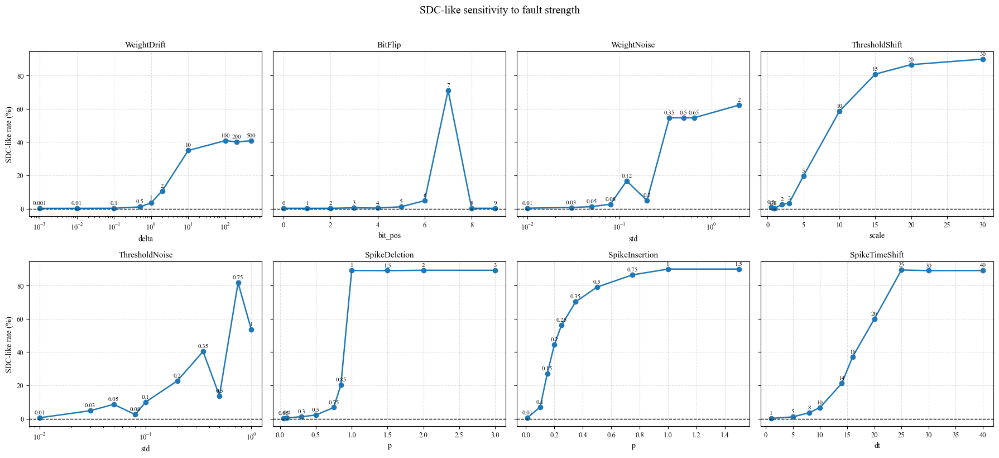

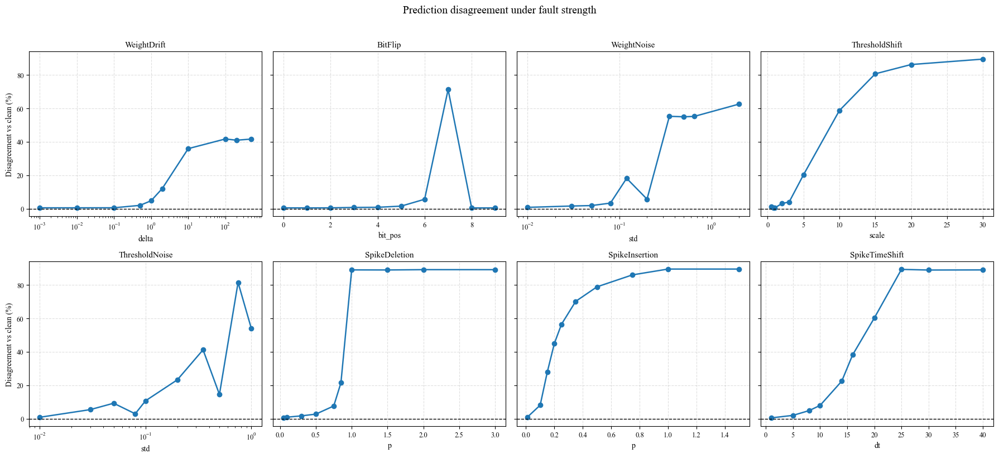

[ThresholdShift] Applied on v_th
[ThresholdNoise] Applied on v_th

=== Layer sensitivity ===


,fault_type,severity,layer,accuracy,acc_drop_vs_clean,sdc_rate
0,WeightDrift,1.00,conv1,94.41,2.34,3.378448
1,WeightDrift,1.00,conv2,94.41,2.34,2.768881
2,WeightDrift,1.00,fc,96.34,0.41,0.671557
3,BitFlip,5.00,conv1,95.93,0.82,1.167476
4,BitFlip,5.00,conv2,95.86,0.89,1.384441
5,BitFlip,5.00,fc,96.03,0.72,1.260461
6,WeightNoise,0.56,conv1,45.56,51.19,53.590247
7,WeightNoise,0.56,conv2,15.81,80.94,84.223577
8,WeightNoise,0.56,fc,58.77,37.98,39.921479
9,ThresholdShift,9.75,lif1,41.71,55.04,57.319971


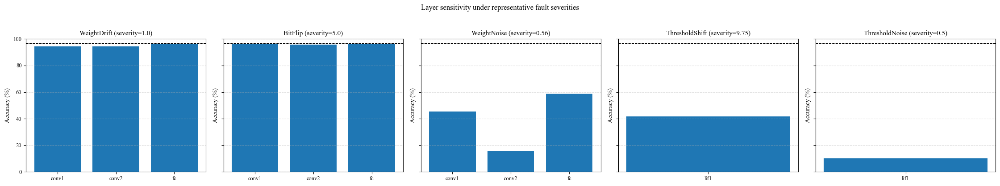

Heatmap [0,0] -> weight[0,0] | acc_drop=-0.040
Heatmap [0,1] -> weight[0,104] | acc_drop=-0.020
Heatmap [0,2] -> weight[0,208] | acc_drop=-0.090
Heatmap [0,3] -> weight[0,313] | acc_drop=-0.020
Heatmap [0,4] -> weight[0,417] | acc_drop=-0.050
Heatmap [0,5] -> weight[0,522] | acc_drop=-0.010
Heatmap [0,6] -> weight[0,626] | acc_drop=0.010
Heatmap [0,7] -> weight[0,731] | acc_drop=0.050
Heatmap [0,8] -> weight[0,835] | acc_drop=-0.090
Heatmap [0,9] -> weight[0,940] | acc_drop=-0.030
Heatmap [0,10] -> weight[0,1044] | acc_drop=-0.060
Heatmap [0,11] -> weight[0,1149] | acc_drop=-0.130
Heatmap [0,12] -> weight[0,1253] | acc_drop=-0.010
Heatmap [0,13] -> weight[0,1358] | acc_drop=0.000
Heatmap [0,14] -> weight[0,1462] | acc_drop=-0.110
Heatmap [0,15] -> weight[0,1567] | acc_drop=-0.140
Heatmap [1,0] -> weight[1,0] | acc_drop=-0.050
Heatmap [1,1] -> weight[1,104] | acc_drop=-0.020
Heatmap [1,2] -> weight[1,208] | acc_drop=0.000
Heatmap [1,3] -> weight[1,313] | acc_drop=-0.040
Heatmap [1,4] ->

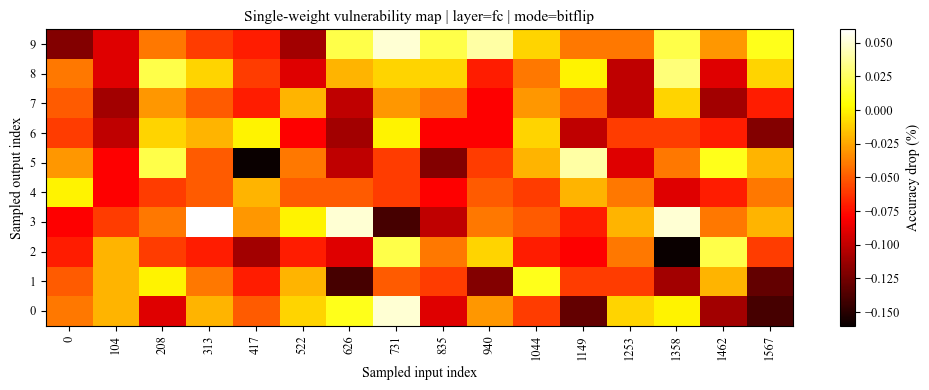

Saved:
 - fault_sweep_metrics.csv
 - fault_summary_metrics.csv
 - fault_layer_sensitivity.csv


In [306]:
# =========================================================
# COMPLETE FAULT ANALYSIS SUITE
# - 8 fault families x parameter sweeps
# - Accuracy / delta accuracy / disagreement / SDC / logit MSE
# - Robustness summary table
# - Layer sensitivity study
# - FC-layer vulnerability heatmap
# =========================================================

# ---------------------------------------------------------
# USER CONFIG
# ---------------------------------------------------------
analysis_model = deepcopy(model).to(device)
analysis_model.eval()

analysis_loader = test_loader
analysis_max_batches = None   # set e.g. 20 for quick screening, None for full loader

# Representative layers for layer sensitivity analysis
synaptic_layers_to_test = ["conv1", "conv2", "fc"]
neuron_layers_to_test = ["lif1"]  # add "lif2" if desired

# Representative severity points for layer sensitivity
layer_sensitivity_faults = [
    ("WeightDrift", 1.0),
    ("BitFlip", 5),
    ("WeightNoise", 0.56),
    ("ThresholdShift", 9.75),
    ("ThresholdNoise", 0.5),
]

# Heatmap config
heatmap_layer_name = "fc"         # best if 2D matrix
heatmap_fault_type = "bitflip"    # "bitflip", "noise", "drift", "zero"
heatmap_bit_pos = 5
heatmap_noise_std = 0.25
heatmap_drift_delta = 1.0
heatmap_sample_rows = 10          # keep moderate for runtime
heatmap_sample_cols = 16          # keep moderate for runtime

# ---------------------------------------------------------
# Plot style
# ---------------------------------------------------------
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "font.size": 10,
    "axes.titlesize": 11,
    "axes.labelsize": 10,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "legend.fontsize": 9,
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
})

# ---------------------------------------------------------
# Helper: parse weight parameter from a layer
# ---------------------------------------------------------
def get_main_weight_param(layer):
    if hasattr(layer, "weight") and isinstance(layer.weight, torch.Tensor):
        return layer.weight
    for name, param in layer.named_parameters(recurse=True):
        if param.requires_grad:
            return param
    return None

# ---------------------------------------------------------
# Helper: run model on loader and cache clean outputs
# ---------------------------------------------------------
@torch.no_grad()
def build_clean_reference_cache(net, loader, max_batches=None):
    """
    Stores, batch by batch:
      - labels
      - clean predictions
      - clean logits
    Assumes loader order is deterministic (test_loader shuffle=False).
    """
    net.eval()
    cache = []

    for bi, (x, y) in enumerate(loader):
        if max_batches is not None and bi >= max_batches:
            break

        x = x.to(device, non_blocking=True)
        y = y.to(device, non_blocking=True)

        spk = poisson_encode_images_dynamic(x, T=net.T, base_rate=1.0)
        logits = forward_logits_from_spikes_generic(net, spk)
        preds = logits.argmax(dim=1)

        cache.append({
            "labels": y.detach().cpu(),
            "clean_logits": logits.detach().cpu(),
            "clean_preds": preds.detach().cpu(),
        })

    return cache

# ---------------------------------------------------------
# Helper: evaluate one fault configuration
# ---------------------------------------------------------
@torch.no_grad()
def evaluate_fault_metrics_once(
    base_model,
    loader,
    clean_cache,
    layer_fault_cfg=None,
    spike_fn=None,
    max_batches=None,
):
    """
    Returns:
      - accuracy
      - disagreement rate
      - SDC-like rate
      - logit MSE vs clean
      - runtime_sec
    """
    net_fault = deepcopy(base_model).to(device)
    net_fault.eval()

    if layer_fault_cfg is not None:
        layer_name, fault_obj = layer_fault_cfg
        fi = FaultInjector(net_fault)
        fi.apply_to_layer(layer_name, fault_obj)

    total = 0
    correct = 0
    disagreement_count = 0

    clean_correct_total = 0
    sdc_count = 0

    logit_mse_sum = 0.0
    logit_mse_count = 0

    t0 = time.time()

    for bi, ((x, y), ref) in enumerate(zip(loader, clean_cache)):
        if max_batches is not None and bi >= max_batches:
            break

        x = x.to(device, non_blocking=True)
        y = y.to(device, non_blocking=True)

        spk = poisson_encode_images_dynamic(x, T=net_fault.T, base_rate=1.0)
        if spike_fn is not None:
            spk = spike_fn(spk)

        fault_logits = forward_logits_from_spikes_generic(net_fault, spk)
        fault_preds = fault_logits.argmax(dim=1)

        clean_logits = ref["clean_logits"].to(device)
        clean_preds = ref["clean_preds"].to(device)

        total += y.numel()
        correct += (fault_preds == y).sum().item()

        disagreement_count += (fault_preds != clean_preds).sum().item()

        clean_correct_mask = (clean_preds == y)
        clean_correct_total += clean_correct_mask.sum().item()
        sdc_count += ((fault_preds != clean_preds) & clean_correct_mask).sum().item()

        batch_logit_mse = F.mse_loss(fault_logits, clean_logits, reduction="sum").item()
        logit_mse_sum += batch_logit_mse
        logit_mse_count += fault_logits.numel()

    elapsed = time.time() - t0

    acc = 100.0 * correct / max(total, 1)
    disagreement_rate = 100.0 * disagreement_count / max(total, 1)
    sdc_rate = 100.0 * sdc_count / max(clean_correct_total, 1)
    logit_mse = logit_mse_sum / max(logit_mse_count, 1)

    return {
        "accuracy": float(acc),
        "disagreement_rate": float(disagreement_rate),
        "sdc_rate": float(sdc_rate),
        "logit_mse": float(logit_mse),
        "runtime_sec": float(elapsed),
    }

# ---------------------------------------------------------
# Build clean cache and clean reference metrics
# ---------------------------------------------------------
clean_cache = build_clean_reference_cache(
    analysis_model,
    analysis_loader,
    max_batches=analysis_max_batches
)

clean_metrics = evaluate_fault_metrics_once(
    analysis_model,
    analysis_loader,
    clean_cache,
    layer_fault_cfg=None,
    spike_fn=None,
    max_batches=analysis_max_batches
)

clean_acc = clean_metrics["accuracy"]
print(f"Clean accuracy reference: {clean_acc:.2f}%")

# ---------------------------------------------------------
# Define 8 fault sweeps (10 points each)
# Adjust ranges if needed
# ---------------------------------------------------------
fault_sweeps = {
    "WeightDrift": {
        "kind": "layer",
        "layer": "conv1",
        "param_name": "delta",
        "values": [0.001, 0.01, 0.1, 0.5, 1, 2, 10, 100, 200, 500],
        "builder": lambda v: WeightDrift(delta=v),
        "level": "Synaptic",
    },
    "BitFlip": {
        "kind": "layer",
        "layer": "conv1",
        "param_name": "bit_pos",
        "values": list(range(0, 10)),
        "builder": lambda v: BitFlipSynapse(bit_pos=int(v)),
        "level": "Synaptic",
    },
    "WeightNoise": {
        "kind": "layer",
        "layer": "conv1",
        "param_name": "std",
        "values": [0.01, 0.03, 0.05, 0.08, 0.12, 0.2, 0.35, 0.5, 0.65, 2.0],
        "builder": lambda v: WeightNoise(std=v),
        "level": "Synaptic",
    },
    "ThresholdShift": {
        "kind": "layer",
        "layer": "lif1",
        "param_name": "scale",
        "values": [0.5, 0.8, 1.0, 2, 3, 5, 10, 15, 20, 30],
        "builder": lambda v: ThresholdShift(scale=v),
        "level": "Neuron",
    },
    "ThresholdNoise": {
        "kind": "layer",
        "layer": "lif1",
        "param_name": "std",
        "values": [0.01, 0.03, 0.05, 0.08, 0.1, 0.2, 0.35, 0.5, 0.75, 1.0],
        "builder": lambda v: ThresholdNoise(std=v),
        "level": "Neuron",
    },
    "SpikeDeletion": {
        "kind": "spike",
        "param_name": "p",
        "values": [0.05, 0.1, 0.3, 0.5, 0.75, 0.85, 1.0, 1.5, 2.0, 3.0],
        "builder": lambda v: (lambda spk: SpikeDeletion(p=v).apply(spk)),
        "level": "Spike",
    },
    "SpikeInsertion": {
        "kind": "spike",
        "param_name": "p",
        "values": [0.01, 0.1, 0.15, 0.2, 0.25, 0.35, 0.5, 0.75, 1.0, 1.5],
        "builder": lambda v: (lambda spk: SpikeInsertion(p=v).apply(spk)),
        "level": "Spike",
    },
    "SpikeTimeShift": {
        "kind": "spike",
        "param_name": "dt",
        "values": [1, 5, 8, 10, 14, 16, 20, 25, 30, 40],
        "builder": lambda v: (lambda spk: SpikeTimeShift(dt=int(v)).apply(spk)),
        "level": "Spike",
    },
}

# ---------------------------------------------------------
# Run the full fault sweep
# ---------------------------------------------------------
sweep_rows = []

for fault_name, cfg in fault_sweeps.items():
    print("\n" + "=" * 80)
    print(f"Running sweep: {fault_name}")
    print("=" * 80)

    for v in cfg["values"]:
        print(f"{fault_name} | {cfg['param_name']}={v}")

        if cfg["kind"] == "layer":
            layer_fault_cfg = (cfg["layer"], cfg["builder"](v))
            spike_fn = None
        else:
            layer_fault_cfg = None
            spike_fn = cfg["builder"](v)

        metrics = evaluate_fault_metrics_once(
            analysis_model,
            analysis_loader,
            clean_cache,
            layer_fault_cfg=layer_fault_cfg,
            spike_fn=spike_fn,
            max_batches=analysis_max_batches,
        )

        sweep_rows.append({
            "fault_type": fault_name,
            "level": cfg["level"],
            "param_name": cfg["param_name"],
            "param_value": float(v),
            "accuracy": metrics["accuracy"],
            "acc_drop_vs_clean": clean_acc - metrics["accuracy"],
            "acc_retention_ratio": metrics["accuracy"] / max(clean_acc, 1e-12),
            "disagreement_rate": metrics["disagreement_rate"],
            "sdc_rate": metrics["sdc_rate"],
            "logit_mse": metrics["logit_mse"],
            "runtime_sec": metrics["runtime_sec"],
        })

df_fault_sweep = pd.DataFrame(sweep_rows)

print("\n=== Full fault sweep results ===")
display(df_fault_sweep)

# ---------------------------------------------------------
# Robustness summary table
# ---------------------------------------------------------
def threshold_crossing_param(sub_df, threshold_acc):
    sub_df = sub_df.sort_values("param_value")
    below = sub_df[sub_df["accuracy"] <= threshold_acc]
    if len(below) == 0:
        return np.nan
    return below.iloc[0]["param_value"]

summary_rows = []
for fault_name in df_fault_sweep["fault_type"].unique():
    sub = df_fault_sweep[df_fault_sweep["fault_type"] == fault_name].sort_values("param_value")

    # Simple trapezoidal area under the accuracy curve over normalized x
    x = sub["param_value"].values.astype(float)
    y = sub["accuracy"].values.astype(float)
    if len(x) > 1 and np.max(x) > np.min(x):
        x_norm = (x - np.min(x)) / (np.max(x) - np.min(x))
        robustness_auc = np.trapz(y, x_norm)
    else:
        robustness_auc = np.nan

    summary_rows.append({
        "fault_type": fault_name,
        "level": sub["level"].iloc[0],
        "best_accuracy": sub["accuracy"].max(),
        "worst_accuracy": sub["accuracy"].min(),
        "max_acc_drop": sub["acc_drop_vs_clean"].max(),
        "max_sdc_rate": sub["sdc_rate"].max(),
        "max_disagreement_rate": sub["disagreement_rate"].max(),
        "max_logit_mse": sub["logit_mse"].max(),
        "threshold_90": threshold_crossing_param(sub, 90.0),
        "threshold_80": threshold_crossing_param(sub, 80.0),
        "threshold_70": threshold_crossing_param(sub, 70.0),
        "robustness_auc": robustness_auc,
    })

df_fault_summary = pd.DataFrame(summary_rows).sort_values(["level", "fault_type"])

print("\n=== Robustness summary ===")
display(df_fault_summary)

# ---------------------------------------------------------
# Plot 1: Accuracy vs fault severity (8 panels)
# ---------------------------------------------------------
fault_order = [
    "WeightDrift", "BitFlip", "WeightNoise", "ThresholdShift",
    "ThresholdNoise", "SpikeDeletion", "SpikeInsertion", "SpikeTimeShift"
]

fig, axes = plt.subplots(2, 4, figsize=(18, 8), sharey=True)
axes = axes.flatten()

for ax, fault_name in zip(axes, fault_order):
    sub = df_fault_sweep[df_fault_sweep["fault_type"] == fault_name].sort_values("param_value")
    x = sub["param_value"].values
    y = sub["accuracy"].values

    ax.plot(x, y, marker="o", linewidth=1.8)
    ax.axhline(clean_acc, linestyle="--", linewidth=1.2, color="black")

    for _, r in sub.iterrows():
        ax.annotate(
            f"{r['param_value']:g}",
            (r["param_value"], r["accuracy"]),
            xytext=(0, 5),
            textcoords="offset points",
            ha="center",
            fontsize=8
        )

    ax.set_title(fault_name)
    ax.set_xlabel(sub["param_name"].iloc[0])
    ax.grid(True, linestyle="--", alpha=0.4)

    if fault_name in ["WeightDrift", "WeightNoise", "ThresholdNoise"] and np.all(x > 0):
        ax.set_xscale("log")

axes[0].set_ylabel("Accuracy (%)")
axes[4].set_ylabel("Accuracy (%)")
for ax in axes:
    ax.set_ylim(0, 100)

plt.suptitle("Accuracy sensitivity to fault strength", fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

# ---------------------------------------------------------
# Plot 2: SDC-like rate vs fault severity (8 panels)
# ---------------------------------------------------------
fig, axes = plt.subplots(2, 4, figsize=(18, 8), sharey=True)
axes = axes.flatten()

for ax, fault_name in zip(axes, fault_order):
    sub = df_fault_sweep[df_fault_sweep["fault_type"] == fault_name].sort_values("param_value")
    x = sub["param_value"].values
    y = sub["sdc_rate"].values

    ax.plot(x, y, marker="o", linewidth=1.8)
    ax.axhline(0.0, linestyle="--", linewidth=1.0, color="black")

    for _, r in sub.iterrows():
        ax.annotate(
            f"{r['param_value']:g}",
            (r["param_value"], r["sdc_rate"]),
            xytext=(0, 5),
            textcoords="offset points",
            ha="center",
            fontsize=8
        )

    ax.set_title(fault_name)
    ax.set_xlabel(sub["param_name"].iloc[0])
    ax.grid(True, linestyle="--", alpha=0.4)

    if fault_name in ["WeightDrift", "WeightNoise", "ThresholdNoise"] and np.all(x > 0):
        ax.set_xscale("log")

axes[0].set_ylabel("SDC-like rate (%)")
axes[4].set_ylabel("SDC-like rate (%)")

plt.suptitle("SDC-like sensitivity to fault strength", fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

# ---------------------------------------------------------
# Plot 3: Disagreement vs fault severity (8 panels)
# ---------------------------------------------------------
fig, axes = plt.subplots(2, 4, figsize=(18, 8), sharey=True)
axes = axes.flatten()

for ax, fault_name in zip(axes, fault_order):
    sub = df_fault_sweep[df_fault_sweep["fault_type"] == fault_name].sort_values("param_value")
    x = sub["param_value"].values
    y = sub["disagreement_rate"].values

    ax.plot(x, y, marker="o", linewidth=1.8)
    ax.axhline(0.0, linestyle="--", linewidth=1.0, color="black")

    ax.set_title(fault_name)
    ax.set_xlabel(sub["param_name"].iloc[0])
    ax.grid(True, linestyle="--", alpha=0.4)

    if fault_name in ["WeightDrift", "WeightNoise", "ThresholdNoise"] and np.all(x > 0):
        ax.set_xscale("log")

axes[0].set_ylabel("Disagreement vs clean (%)")
axes[4].set_ylabel("Disagreement vs clean (%)")

plt.suptitle("Prediction disagreement under fault strength", fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

# ---------------------------------------------------------
# Layer sensitivity study
# ---------------------------------------------------------
layer_rows = []

for fault_name, severity in layer_sensitivity_faults:
    if fault_name == "WeightDrift":
        for layer_name in synaptic_layers_to_test:
            metrics = evaluate_fault_metrics_once(
                analysis_model,
                analysis_loader,
                clean_cache,
                layer_fault_cfg=(layer_name, WeightDrift(delta=severity)),
                spike_fn=None,
                max_batches=analysis_max_batches,
            )
            layer_rows.append({
                "fault_type": fault_name,
                "severity": severity,
                "layer": layer_name,
                "accuracy": metrics["accuracy"],
                "acc_drop_vs_clean": clean_acc - metrics["accuracy"],
                "sdc_rate": metrics["sdc_rate"],
            })

    elif fault_name == "BitFlip":
        for layer_name in synaptic_layers_to_test:
            metrics = evaluate_fault_metrics_once(
                analysis_model,
                analysis_loader,
                clean_cache,
                layer_fault_cfg=(layer_name, BitFlipSynapse(bit_pos=int(severity))),
                spike_fn=None,
                max_batches=analysis_max_batches,
            )
            layer_rows.append({
                "fault_type": fault_name,
                "severity": severity,
                "layer": layer_name,
                "accuracy": metrics["accuracy"],
                "acc_drop_vs_clean": clean_acc - metrics["accuracy"],
                "sdc_rate": metrics["sdc_rate"],
            })

    elif fault_name == "WeightNoise":
        for layer_name in synaptic_layers_to_test:
            metrics = evaluate_fault_metrics_once(
                analysis_model,
                analysis_loader,
                clean_cache,
                layer_fault_cfg=(layer_name, WeightNoise(std=severity)),
                spike_fn=None,
                max_batches=analysis_max_batches,
            )
            layer_rows.append({
                "fault_type": fault_name,
                "severity": severity,
                "layer": layer_name,
                "accuracy": metrics["accuracy"],
                "acc_drop_vs_clean": clean_acc - metrics["accuracy"],
                "sdc_rate": metrics["sdc_rate"],
            })

    elif fault_name == "ThresholdShift":
        for layer_name in neuron_layers_to_test:
            metrics = evaluate_fault_metrics_once(
                analysis_model,
                analysis_loader,
                clean_cache,
                layer_fault_cfg=(layer_name, ThresholdShift(scale=severity)),
                spike_fn=None,
                max_batches=analysis_max_batches,
            )
            layer_rows.append({
                "fault_type": fault_name,
                "severity": severity,
                "layer": layer_name,
                "accuracy": metrics["accuracy"],
                "acc_drop_vs_clean": clean_acc - metrics["accuracy"],
                "sdc_rate": metrics["sdc_rate"],
            })

    elif fault_name == "ThresholdNoise":
        for layer_name in neuron_layers_to_test:
            metrics = evaluate_fault_metrics_once(
                analysis_model,
                analysis_loader,
                clean_cache,
                layer_fault_cfg=(layer_name, ThresholdNoise(std=severity)),
                spike_fn=None,
                max_batches=analysis_max_batches,
            )
            layer_rows.append({
                "fault_type": fault_name,
                "severity": severity,
                "layer": layer_name,
                "accuracy": metrics["accuracy"],
                "acc_drop_vs_clean": clean_acc - metrics["accuracy"],
                "sdc_rate": metrics["sdc_rate"],
            })

df_layer_sensitivity = pd.DataFrame(layer_rows)

print("\n=== Layer sensitivity ===")
display(df_layer_sensitivity)

# Simple grouped bar plot for layer sensitivity
if len(df_layer_sensitivity) > 0:
    unique_faults = df_layer_sensitivity["fault_type"].unique()

    fig, axes = plt.subplots(1, len(unique_faults), figsize=(4.5 * len(unique_faults), 4), sharey=True)
    if len(unique_faults) == 1:
        axes = [axes]

    for ax, ft in zip(axes, unique_faults):
        sub = df_layer_sensitivity[df_layer_sensitivity["fault_type"] == ft]
        x_labels = sub["layer"].tolist()
        vals = sub["accuracy"].tolist()
        ax.bar(x_labels, vals)
        ax.axhline(clean_acc, linestyle="--", color="black", linewidth=1.0)
        ax.set_title(f"{ft} (severity={sub['severity'].iloc[0]})")
        ax.set_ylabel("Accuracy (%)")
        ax.set_ylim(0, 100)
        ax.grid(True, axis="y", linestyle="--", alpha=0.4)

    plt.suptitle("Layer sensitivity under representative fault severities", y=1.03)
    plt.tight_layout()
    plt.show()

# ---------------------------------------------------------
# FC-layer vulnerability heatmap
# ---------------------------------------------------------
def apply_single_weight_fault_inplace(weight_tensor, row_idx, col_idx, mode="bitflip"):
    """
    Applies a single-site fault to one weight entry in-place.
    Expects a 2D matrix.
    """
    with torch.no_grad():
        old_val = weight_tensor[row_idx, col_idx].item()

        if mode == "zero":
            weight_tensor[row_idx, col_idx] = 0.0

        elif mode == "drift":
            weight_tensor[row_idx, col_idx] = old_val * (1.0 + heatmap_drift_delta)

        elif mode == "noise":
            weight_tensor[row_idx, col_idx] = old_val + np.random.randn() * heatmap_noise_std

        elif mode == "bitflip":
            wmin = weight_tensor.min().item()
            wmax = weight_tensor.max().item()
            q = ((weight_tensor[row_idx, col_idx] - wmin) / (wmax - wmin + 1e-8) * 255).round().clamp(0, 255).to(torch.uint8)
            q_flipped = q ^ (1 << heatmap_bit_pos)
            new_val = wmin + (q_flipped.float() / 255.0) * (wmax - wmin)
            weight_tensor[row_idx, col_idx] = new_val

        else:
            raise ValueError(f"Unknown single-weight fault mode: {mode}")

@torch.no_grad()
def evaluate_single_weight_heatmap(
    base_model,
    layer_name="fc",
    mode="bitflip",
    sample_rows=10,
    sample_cols=16,
    loader=test_loader,
    max_batches=None,
):
    """
    Builds a vulnerability map:
      value = accuracy drop after faulting one weight entry
    Best for 2D layers like FC.
    """
    layer = dict(base_model.named_modules())[layer_name]
    weight = get_main_weight_param(layer)

    if weight is None:
        raise ValueError(f"No weight tensor found for layer: {layer_name}")
    if weight.dim() != 2:
        raise ValueError(f"Heatmap is recommended for 2D layers only. Got shape {tuple(weight.shape)}")

    n_rows, n_cols = weight.shape
    row_idx = np.linspace(0, n_rows - 1, sample_rows, dtype=int)
    col_idx = np.linspace(0, n_cols - 1, sample_cols, dtype=int)

    drop_map = np.zeros((len(row_idx), len(col_idx)), dtype=np.float32)

    for i, r in enumerate(row_idx):
        for j, c in enumerate(col_idx):
            net_fault = deepcopy(base_model).to(device)
            net_fault.eval()

            layer_fault = dict(net_fault.named_modules())[layer_name]
            weight_fault = get_main_weight_param(layer_fault)

            apply_single_weight_fault_inplace(weight_fault, r, c, mode=mode)

            metrics = evaluate_fault_metrics_once(
                net_fault,
                loader,
                clean_cache,
                layer_fault_cfg=None,
                spike_fn=None,
                max_batches=max_batches,
            )

            drop_map[i, j] = clean_acc - metrics["accuracy"]
            print(f"Heatmap [{i},{j}] -> weight[{r},{c}] | acc_drop={drop_map[i,j]:.3f}")

    return drop_map, row_idx, col_idx

# Run heatmap only if requested layer is 2D
try:
    heatmap_values, heatmap_rows, heatmap_cols = evaluate_single_weight_heatmap(
        analysis_model,
        layer_name=heatmap_layer_name,
        mode=heatmap_fault_type,
        sample_rows=heatmap_sample_rows,
        sample_cols=heatmap_sample_cols,
        loader=analysis_loader,
        max_batches=analysis_max_batches,
    )

    plt.figure(figsize=(10, 4))
    im = plt.imshow(heatmap_values, aspect="auto", origin="lower", cmap="hot")
    plt.colorbar(im, label="Accuracy drop (%)")
    plt.title(f"Single-weight vulnerability map | layer={heatmap_layer_name} | mode={heatmap_fault_type}")
    plt.xlabel("Sampled input index")
    plt.ylabel("Sampled output index")
    plt.xticks(range(len(heatmap_cols)), heatmap_cols, rotation=90)
    plt.yticks(range(len(heatmap_rows)), heatmap_rows)
    plt.tight_layout()
    plt.show()

except Exception as e:
    print(f"[Heatmap skipped] {e}")

# ---------------------------------------------------------
# Save outputs
# ---------------------------------------------------------
df_fault_sweep.to_csv("fault_sweep_metrics.csv", index=False)
df_fault_summary.to_csv("fault_summary_metrics.csv", index=False)
if len(df_layer_sensitivity) > 0:
    df_layer_sensitivity.to_csv("fault_layer_sensitivity.csv", index=False)

print("Saved:")
print(" - fault_sweep_metrics.csv")
print(" - fault_summary_metrics.csv")
if len(df_layer_sensitivity) > 0:
    print(" - fault_layer_sensitivity.csv")

Clean accuracy: 96.81%

Running sweep for WeightDrift
WeightDrift | delta=0.001
  -> Accuracy: 96.74% | Drop vs clean: 0.07
WeightDrift | delta=0.01
  -> Accuracy: 96.78% | Drop vs clean: 0.03
WeightDrift | delta=0.05
  -> Accuracy: 96.87% | Drop vs clean: -0.06
WeightDrift | delta=0.1
  -> Accuracy: 96.82% | Drop vs clean: -0.01
WeightDrift | delta=0.3
  -> Accuracy: 96.85% | Drop vs clean: -0.04
WeightDrift | delta=0.5
  -> Accuracy: 96.48% | Drop vs clean: 0.33
WeightDrift | delta=1
  -> Accuracy: 94.28% | Drop vs clean: 2.53
WeightDrift | delta=2
  -> Accuracy: 87.47% | Drop vs clean: 9.34
WeightDrift | delta=10
  -> Accuracy: 64.15% | Drop vs clean: 32.66
WeightDrift | delta=100
  -> Accuracy: 58.32% | Drop vs clean: 38.49

Running sweep for BitFlip
BitFlip | bit_pos=0
  -> Accuracy: 96.65% | Drop vs clean: 0.16
BitFlip | bit_pos=1
  -> Accuracy: 96.74% | Drop vs clean: 0.07
BitFlip | bit_pos=2
  -> Accuracy: 96.80% | Drop vs clean: 0.01
BitFlip | bit_pos=3
  -> Accuracy: 96.51% |

,fault_type,param_name,param_value,accuracy,acc_drop_vs_clean
0,WeightDrift,delta,0.001,96.74,0.07
1,WeightDrift,delta,0.010,96.78,0.03
2,WeightDrift,delta,0.050,96.87,-0.06
3,WeightDrift,delta,0.100,96.82,-0.01
4,WeightDrift,delta,0.300,96.85,-0.04
...,...,...,...,...,...
75,SpikeTimeShift,dt,8.000,94.15,2.66
76,SpikeTimeShift,dt,10.000,91.17,5.64
77,SpikeTimeShift,dt,13.000,81.55,15.26
78,SpikeTimeShift,dt,16.000,61.54,35.27


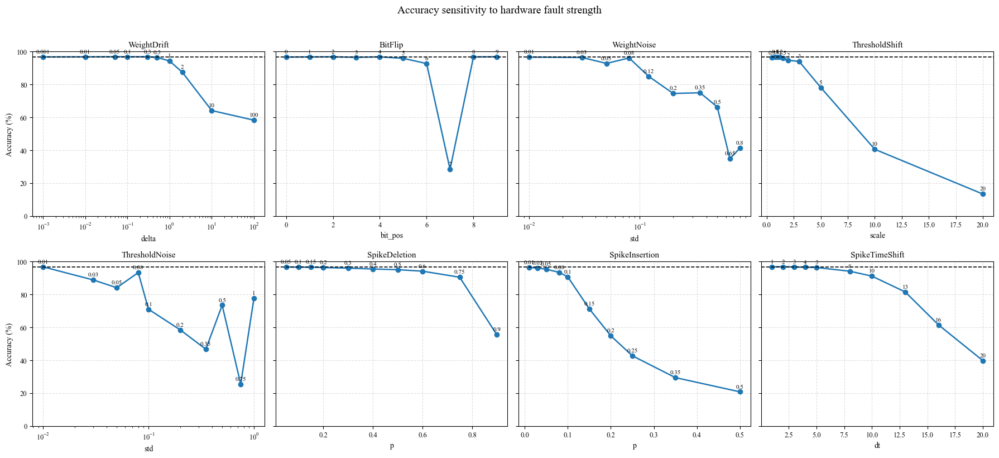

In [ ]:
# =========================================================
# Fault sensitivity sweep
# 8 separate plots, 10 points each
# Measures only ACCURACY under each fault
# =========================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from copy import deepcopy

# ---------------------------------------------------------
# Safety
# ---------------------------------------------------------
base_model = deepcopy(model).to(device)
base_model.eval()

# ---------------------------------------------------------
# Choose evaluation budget
# max_batches=None -> full test set
# set max_batches=20 if you want faster screening first
# ---------------------------------------------------------
sweep_max_batches = None

# ---------------------------------------------------------
# Helper: evaluate accuracy for one fault config
# ---------------------------------------------------------
@torch.no_grad()
def evaluate_fault_accuracy_once(
    base_model,
    layer_fault_cfg=None,
    spike_fn=None,
    loader=test_loader,
    max_batches=None
):
    net_fault = deepcopy(base_model).to(device)
    net_fault.eval()

    if layer_fault_cfg is not None:
        layer_name, fault_obj = layer_fault_cfg
        fi = FaultInjector(net_fault)
        fi.apply_to_layer(layer_name, fault_obj)

    if spike_fn is None:
        # standard evaluation
        if max_batches is None:
            acc = evaluate(net_fault, loader, base_rate=1.0) * 100.0
        else:
            # fallback partial evaluation if needed
            total = 0
            correct = 0
            for bi, (x, y) in enumerate(loader):
                if bi >= max_batches:
                    break
                x = x.to(device, non_blocking=True)
                y = y.to(device, non_blocking=True)
                spk = poisson_encode_images_dynamic(x, T=net_fault.T, base_rate=1.0)
                logits = forward_logits_from_spikes_generic(net_fault, spk)
                pred = logits.argmax(1)
                correct += (pred == y).sum().item()
                total += y.numel()
            acc = 100.0 * correct / max(total, 1)
    else:
        acc = eval_accuracy_model_with_spikefault(
            net_fault,
            loader,
            spike_transform=spike_fn,
            max_batches=max_batches
        )

    return float(acc)

# ---------------------------------------------------------
# Fault sweeps
# 8 faults, 10 points each
# Adjust ranges if needed
# ---------------------------------------------------------
fault_sweeps = {
    "WeightDrift": {
        "kind": "layer",
        "layer": "conv1",
        "param_name": "delta",
        "values": [0.001, 0.01, 0.05, 0.1, 0.3, 0.5, 1, 2, 10, 100],
        "builder": lambda v: WeightDrift(delta=v),
    },
    "BitFlip": {
        "kind": "layer",
        "layer": "conv1",
        "param_name": "bit_pos",
        "values": list(range(0, 10)),   # 0..9
        "builder": lambda v: BitFlipSynapse(bit_pos=int(v)),
    },
    "WeightNoise": {
        "kind": "layer",
        "layer": "conv1",
        "param_name": "std",
        "values": [0.01, 0.03, 0.05, 0.08, 0.12, 0.2, 0.35, 0.5, 0.65, 0.8],
        "builder": lambda v: WeightNoise(std=v),
    },
    "ThresholdShift": {
        "kind": "layer",
        "layer": "lif1",
        "param_name": "scale",
        "values": [0.5, 0.8, 1.0, 1.2, 1.5, 2, 3, 5, 10, 20],
        "builder": lambda v: ThresholdShift(scale=v),
    },
    "ThresholdNoise": {
        "kind": "layer",
        "layer": "lif1",
        "param_name": "std",
        "values": [0.01, 0.03, 0.05, 0.08, 0.1, 0.2, 0.35, 0.5, 0.75, 1.0],
        "builder": lambda v: ThresholdNoise(std=v),
    },
    "SpikeDeletion": {
        "kind": "spike",
        "param_name": "p",
        "values": [0.05, 0.1, 0.15, 0.2, 0.3, 0.4, 0.5, 0.6, 0.75, 0.9],
        "builder": lambda v: (lambda spk: SpikeDeletion(p=v).apply(spk)),
    },
    "SpikeInsertion": {
        "kind": "spike",
        "param_name": "p",
        "values": [0.01, 0.03, 0.05, 0.08, 0.1, 0.15, 0.2, 0.25, 0.35, 0.5],
        "builder": lambda v: (lambda spk: SpikeInsertion(p=v).apply(spk)),
    },
    "SpikeTimeShift": {
        "kind": "spike",
        "param_name": "dt",
        "values": [1, 2, 3, 4, 5, 8, 10, 13, 16, 20],
        "builder": lambda v: (lambda spk: SpikeTimeShift(dt=int(v)).apply(spk)),
    },
}

# ---------------------------------------------------------
# Run sweep
# ---------------------------------------------------------
sweep_rows = []

clean_acc = evaluate_fault_accuracy_once(
    base_model=base_model,
    layer_fault_cfg=None,
    spike_fn=None,
    loader=test_loader,
    max_batches=sweep_max_batches
)

print(f"Clean accuracy: {clean_acc:.2f}%")

for fault_name, cfg in fault_sweeps.items():
    print("\n" + "=" * 70)
    print(f"Running sweep for {fault_name}")
    print("=" * 70)

    for v in cfg["values"]:
        print(f"{fault_name} | {cfg['param_name']}={v}")

        if cfg["kind"] == "layer":
            layer_fault_cfg = (cfg["layer"], cfg["builder"](v))
            spike_fn = None
        else:
            layer_fault_cfg = None
            spike_fn = cfg["builder"](v)

        acc = evaluate_fault_accuracy_once(
            base_model=base_model,
            layer_fault_cfg=layer_fault_cfg,
            spike_fn=spike_fn,
            loader=test_loader,
            max_batches=sweep_max_batches
        )

        sweep_rows.append({
            "fault_type": fault_name,
            "param_name": cfg["param_name"],
            "param_value": float(v),
            "accuracy": acc,
            "acc_drop_vs_clean": clean_acc - acc,
        })

        print(f"  -> Accuracy: {acc:.2f}% | Drop vs clean: {clean_acc - acc:.2f}")

df_fault_sweep = pd.DataFrame(sweep_rows)

print("\n=== Sweep results ===")
display(df_fault_sweep)

# ---------------------------------------------------------
# Plot: 8 separate subplots
# ---------------------------------------------------------
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "font.size": 10,
    "axes.titlesize": 11,
    "axes.labelsize": 10,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
})

fault_order = [
    "WeightDrift",
    "BitFlip",
    "WeightNoise",
    "ThresholdShift",
    "ThresholdNoise",
    "SpikeDeletion",
    "SpikeInsertion",
    "SpikeTimeShift",
]

fig, axes = plt.subplots(2, 4, figsize=(18, 8), sharey=True)
axes = axes.flatten()

for ax, fault_name in zip(axes, fault_order):
    sub = df_fault_sweep[df_fault_sweep["fault_type"] == fault_name].copy()
    sub = sub.sort_values("param_value")

    x = sub["param_value"].values
    y = sub["accuracy"].values

    ax.plot(x, y, marker="o", linewidth=1.8)
    ax.axhline(clean_acc, linestyle="--", linewidth=1.2, color="black")

    # annotate each point
    for _, r in sub.iterrows():
        ax.annotate(
            f"{r['param_value']:g}",
            (r["param_value"], r["accuracy"]),
            xytext=(0, 5),
            textcoords="offset points",
            ha="center",
            fontsize=8
        )

    ax.set_title(fault_name)
    ax.set_xlabel(sub["param_name"].iloc[0])
    ax.grid(True, linestyle="--", alpha=0.4)

    # use log scale where it makes sense
    if fault_name in ["WeightDrift", "WeightNoise", "ThresholdNoise"] and np.all(x > 0):
        ax.set_xscale("log")

axes[0].set_ylabel("Accuracy (%)")
axes[4].set_ylabel("Accuracy (%)")

for ax in axes:
    ax.set_ylim(0, 100)

plt.suptitle("Accuracy sensitivity to hardware fault strength", fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

# Optional save
fig.savefig("fault_sensitivity_8plots.pdf", bbox_inches="tight")
fig.savefig("fault_sensitivity_8plots.png", dpi=400, bbox_inches="tight")

# 27 min

In [ ]:
# =========================================================
# P5A — Ablation Study with mean ± std 
# ========================================================= 100 iterations - 15 min / 400 iterations - 57 min / 500 iterations - 117min (5 seeds)

# -----------------------------
# USER SETTINGS
# -----------------------------
ablation_steps = 500
ablation_runs = 5
ablation_seeds = [0, 1, 2, 3, 4]
target_class_eval = 0

ablation_configs = [
    {
        "name": "Full_SDMI",
        "K": 12,
        "xi_tv": 0.03,
        "xi_sparsity": 0.5,
    },
    {
        "name": "No_EOT",
        "K": 1,
        "xi_tv": 0.03,
        "xi_sparsity": 0.5,
    },
    {
        "name": "No_TV",
        "K": 12,
        "xi_tv": 0.0,
        "xi_sparsity": 0.5,
    },
    {
        "name": "No_Sparsity",
        "K": 12,
        "xi_tv": 0.03,
        "xi_sparsity": 0.0,
    },
]

ablation_all_rows = []

for cfg in ablation_configs:
    print("\n" + "=" * 70)
    print(f"Ablation config: {cfg['name']}")
    print("=" * 70)

    for run_id, seed in enumerate(ablation_seeds):
        print(f"  Run {run_id+1}/{ablation_runs} | seed={seed}")

        torch.manual_seed(seed)
        if device == "cuda":
            torch.cuda.manual_seed_all(seed)

        t0 = time.time()

        attack_result = model_inversion_attack_eot_ste_full_blur(
            model=model,
            target_class=target_class_eval,
            device=device,
            steps=ablation_steps,
            K=cfg["K"],
            T=model.T,
            base_rate=1.0,
            use_base_rate_schedule=False,
            xi_tv=cfg["xi_tv"],
            xi_sparsity=cfg["xi_sparsity"],
            snapshot_every=10_000,   # effectively disable frequent snapshots
            log_every=100,
            seed=seed,
        )

        best_img = to_img4(attack_result["best_x_img"])
        nearest_real_img = to_img4(
            get_nearest_real_example(best_img, test_loader, target_class_eval, max_items=max_nn_items)
        )

        ssim = ssim_torch_simple(best_img, nearest_real_img)
        mse = mse_torch(best_img, nearest_real_img)
        psnr = psnr_torch(best_img, nearest_real_img)
        conf = float(attack_result["best_conf"])

        elapsed = time.time() - t0

        ablation_all_rows.append({
            "config": cfg["name"],
            "run": run_id,
            "seed": seed,
            "K": cfg["K"],
            "TV": cfg["xi_tv"],
            "Sparsity": cfg["xi_sparsity"],
            "SSIM": ssim,
            "MSE": mse,
            "PSNR": psnr,
            "Confidence": conf,
            "time_sec": elapsed,
        })

df_ablation_runs = pd.DataFrame(ablation_all_rows)

print("\n=== Raw Ablation Runs ===")
display(df_ablation_runs)

# Aggregate mean ± std
ablation_summary = df_ablation_runs.groupby(["config", "K", "TV", "Sparsity"]).agg(
    SSIM_mean=("SSIM", "mean"),
    SSIM_std=("SSIM", "std"),
    MSE_mean=("MSE", "mean"),
    MSE_std=("MSE", "std"),
    PSNR_mean=("PSNR", "mean"),
    PSNR_std=("PSNR", "std"),
    Confidence_mean=("Confidence", "mean"),
    Confidence_std=("Confidence", "std"),
    time_sec_mean=("time_sec", "mean"),
).reset_index()

def pm(mean, std):
    std = 0.0 if pd.isna(std) else std
    return f"{mean:.4f} ± {std:.4f}"

ablation_summary["SSIM"] = ablation_summary.apply(lambda r: pm(r["SSIM_mean"], r["SSIM_std"]), axis=1)
ablation_summary["MSE"] = ablation_summary.apply(lambda r: pm(r["MSE_mean"], r["MSE_std"]), axis=1)
ablation_summary["PSNR"] = ablation_summary.apply(lambda r: pm(r["PSNR_mean"], r["PSNR_std"]), axis=1)
ablation_summary["Confidence"] = ablation_summary.apply(lambda r: pm(r["Confidence_mean"], r["Confidence_std"]), axis=1)

df_ablation_final = ablation_summary[[
    "config", "K", "TV", "Sparsity", "SSIM", "MSE", "PSNR", "Confidence", "time_sec_mean"
]].sort_values(by="SSIM", ascending=False)

print("\n=== Ablation Summary (mean ± std) ===")
display(df_ablation_final)


Ablation config: Full_SDMI
  Run 1/5 | seed=0

===== Starting Model Inversion Attack (Full + Blur) =====
Target class: 0
Steps: 500 | Population K: 12 | T: 25
Stage1 LR: 0.01 | Stage2 LR: 0.003 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.14 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.05, xi_blur=0.015, xi_mean=0.8
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.18, xi_l2=0.15, xi_blur=0.2, xi_mean=1.2


[Iter 0000/500] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.082766   (best=0.082766)
  avg_loss(no_priors)  : 0.614433
  avg_target_logit     : -0.818802
  avg_max_other_logit  : -0.217571
  avg_sparsity         : 0.099626
  fr_mean/min/max      : 0.099626 / 0.079401 / 0.122768
  fr_pen(one-sided)    : 0.006445   fr_l2: 0.010030
  tv=0.000000 l2=0.009950 blur=0.000162
  xmean=0.099750 mean_pen=0.001620 grad_norm=0.004066

[Iter 0100/500] stage=1 base_rate=1.000 lr=0.0100
  a

,config,run,seed,K,TV,Sparsity,SSIM,MSE,PSNR,Confidence,time_sec
0,Full_SDMI,0,0,12,0.03,0.5,0.321538,0.056258,12.498159,0.999530,455.944193
1,Full_SDMI,1,1,12,0.03,0.5,0.323969,0.056292,12.495532,0.999518,456.719011
2,Full_SDMI,2,2,12,0.03,0.5,0.323594,0.055893,12.526415,0.999534,455.267369
3,Full_SDMI,3,3,12,0.03,0.5,0.322185,0.056214,12.501569,0.999497,457.153253
4,Full_SDMI,4,4,12,0.03,0.5,0.324235,0.055925,12.523947,0.999527,456.198317
5,No_EOT,0,0,1,0.03,0.5,0.302941,0.050781,12.942997,0.997917,39.002753
6,No_EOT,1,1,1,0.03,0.5,0.300500,0.050907,12.932235,0.997776,38.944396
7,No_EOT,2,2,1,0.03,0.5,0.291114,0.051547,12.877924,0.997871,38.945706
8,No_EOT,3,3,1,0.03,0.5,0.305012,0.050655,12.953741,0.997448,38.739029
9,No_EOT,4,4,1,0.03,0.5,0.280114,0.052553,12.794032,0.998169,38.869418



=== Ablation Summary (mean ± std) ===


,config,K,TV,Sparsity,SSIM,MSE,PSNR,Confidence,time_sec_mean
3,No_TV,12,0.00,0.5,0.4014 ± 0.0703,0.0569 ± 0.0007,12.4505 ± 0.0524,0.9996 ± 0.0000,455.171707
0,Full_SDMI,12,0.03,0.5,0.3231 ± 0.0012,0.0561 ± 0.0002,12.5091 ± 0.0148,0.9995 ± 0.0000,456.256429
2,No_Sparsity,12,0.03,0.0,0.3221 ± 0.0015,0.0564 ± 0.0003,12.4872 ± 0.0242,0.9995 ± 0.0000,455.904865
1,No_EOT,1,0.03,0.5,0.2959 ± 0.0103,0.0513 ± 0.0008,12.9002 ± 0.0661,0.9978 ± 0.0003,38.900260


In [ ]:
# =========================================================
# P5B — EOT Sensitivity Study with mean ± std
# ========================================================= 17min - 100 iterations / 500 - 142min (5 seeds)

# -----------------------------
# USER SETTINGS
# -----------------------------
eot_steps = 500
eot_runs = 5
eot_seeds = [0, 1, 2, 3, 4]
K_values = [1, 4, 8, 12, 20]
target_class_eval = 0

eot_all_rows = []

for K in K_values:
    print("\n" + "=" * 70)
    print(f"EOT Sensitivity | K={K}")
    print("=" * 70)

    for run_id, seed in enumerate(eot_seeds):
        print(f"  Run {run_id+1}/{eot_runs} | seed={seed}")

        torch.manual_seed(seed)
        if device == "cuda":
            torch.cuda.manual_seed_all(seed)

        t0 = time.time()

        attack_result = model_inversion_attack_eot_ste_full_blur(
            model=model,
            target_class=target_class_eval,
            device=device,
            steps=eot_steps,
            K=K,
            T=model.T,
            base_rate=1.0,
            use_base_rate_schedule=False,
            snapshot_every=10_000,
            log_every=100,
            seed=seed,
        )

        best_img = to_img4(attack_result["best_x_img"])
        nearest_real_img = to_img4(
            get_nearest_real_example(best_img, test_loader, target_class_eval, max_items=max_nn_items)
        )

        ssim = ssim_torch_simple(best_img, nearest_real_img)
        conf = float(attack_result["best_conf"])
        elapsed = time.time() - t0

        eot_all_rows.append({
            "K": K,
            "run": run_id,
            "seed": seed,
            "SSIM": ssim,
            "Confidence": conf,
            "time_sec": elapsed,
        })

df_eot_runs = pd.DataFrame(eot_all_rows)

print("\n=== Raw EOT Runs ===")
display(df_eot_runs)

eot_summary = df_eot_runs.groupby("K").agg(
    SSIM_mean=("SSIM", "mean"),
    SSIM_std=("SSIM", "std"),
    Confidence_mean=("Confidence", "mean"),
    Confidence_std=("Confidence", "std"),
    time_sec_mean=("time_sec", "mean"),
).reset_index()

def pm(mean, std):
    std = 0.0 if pd.isna(std) else std
    return f"{mean:.4f} ± {std:.4f}"

eot_summary["SSIM"] = eot_summary.apply(lambda r: pm(r["SSIM_mean"], r["SSIM_std"]), axis=1)
eot_summary["Confidence"] = eot_summary.apply(lambda r: pm(r["Confidence_mean"], r["Confidence_std"]), axis=1)

df_eot_final = eot_summary[["K", "SSIM", "Confidence", "time_sec_mean"]]

print("\n=== EOT Sensitivity Summary (mean ± std) ===")
display(df_eot_final)


EOT Sensitivity | K=1
  Run 1/5 | seed=0

===== Starting Model Inversion Attack (Full + Blur) =====
Target class: 0
Steps: 500 | Population K: 1 | T: 25
Stage1 LR: 0.01 | Stage2 LR: 0.003 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.14 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.05, xi_blur=0.015, xi_mean=0.8
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.18, xi_l2=0.15, xi_blur=0.2, xi_mean=1.2


[Iter 0000/500] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.090682   (best=0.090682)
  avg_loss(no_priors)  : 0.391097
  avg_target_logit     : -0.742749
  avg_max_other_logit  : -0.365346
  avg_sparsity         : 0.101480
  fr_mean/min/max      : 0.101480 / 0.084184 / 0.118622
  fr_pen(one-sided)    : 0.006715   fr_l2: 0.010374
  tv=0.000000 l2=0.009950 blur=0.000162
  xmean=0.099750 mean_pen=0.001620 grad_norm=0.005534

[Iter 0100/500] stage=1 base_rate=1.000 lr=0.0100
  avg_con

,K,run,seed,SSIM,Confidence,time_sec
0,1,0,0,0.302210,0.997863,39.351713
1,1,1,1,0.300678,0.997734,38.812147
2,1,2,2,0.290580,0.997893,38.827715
3,1,3,3,0.303324,0.997411,39.211471
4,1,4,4,0.297749,0.997938,39.044110
5,4,0,0,0.311178,0.999246,152.284985
6,4,1,1,0.317260,0.999326,152.271118
7,4,2,2,0.310634,0.999260,152.155536
8,4,3,3,0.309690,0.999310,151.982797
9,4,4,4,0.316220,0.999217,152.665919



=== EOT Sensitivity Summary (mean ± std) ===


,K,SSIM,Confidence,time_sec_mean
0,1,0.2989 ± 0.0051,0.9978 ± 0.0002,39.049431
1,4,0.3130 ± 0.0035,0.9993 ± 0.0000,152.272071
2,8,0.3192 ± 0.0026,0.9995 ± 0.0000,304.531363
3,12,0.3223 ± 0.0008,0.9995 ± 0.0000,455.148086
4,20,0.3259 ± 0.0019,0.9996 ± 0.0000,758.360141



Running figure config: clean

===== Starting Model Inversion Attack (Full + Blur) =====
Target class: 0
Steps: 800 | Population K: 12 | T: 25
Stage1 LR: 0.01 | Stage2 LR: 0.003 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.14 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.05, xi_blur=0.015, xi_mean=0.8
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.18, xi_l2=0.15, xi_blur=0.2, xi_mean=1.2


[Iter 0000/800] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.083197   (best=0.083197)
  avg_loss(no_priors)  : 0.607548
  avg_target_logit     : -0.811072
  avg_max_other_logit  : -0.216725
  avg_sparsity         : 0.099626
  fr_mean/min/max      : 0.099626 / 0.079401 / 0.122768
  fr_pen(one-sided)    : 0.006445   fr_l2: 0.010030
  tv=0.000000 l2=0.009950 blur=0.000162
  xmean=0.099750 mean_pen=0.001620 grad_norm=0.004067

[Iter 0100/800] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)  

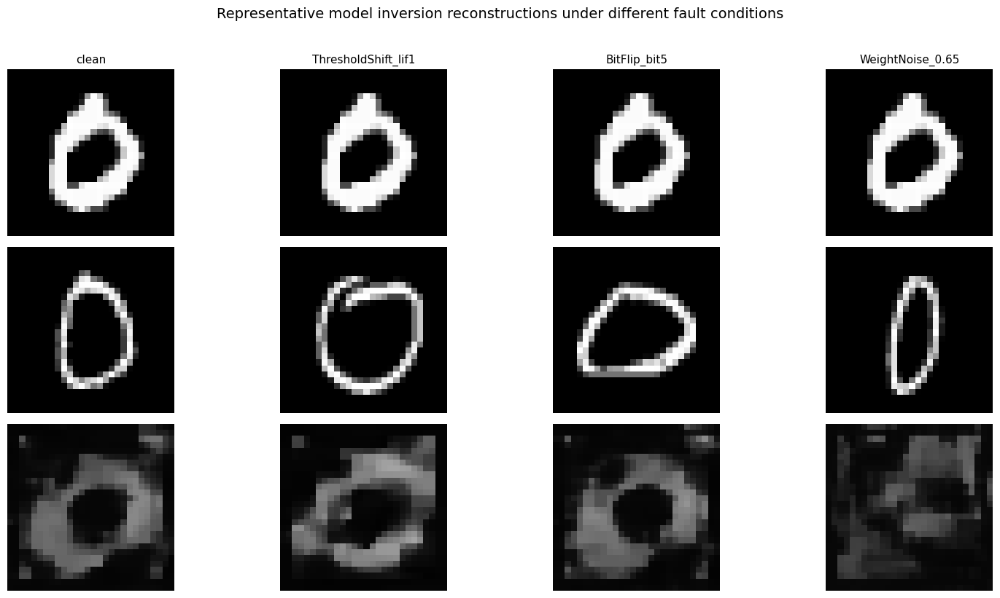

In [ ]:
# =========================================================
# P6 — Visual comparison figure
# 4 columns: clean / leakage-increasing / neutral / destructive
# 3 rows: original / nearest / reconstructed
# ========================================================= 6 min - 300 iterations / 48 min - 800 iterations

# -----------------------------
# USER CHOICE
# -----------------------------
target_class_eval = 0
figure_steps = 800
figure_K = 12

selected_fault_names = [
    "clean",
    "ThresholdShift_lif1",   # leakage-increasing
    "BitFlip_bit5",          # neutral
    "WeightNoise_0.65",      # destructive
]

# Map fault name -> config
fault_dict = {name: (name, layer_fault_cfg, spike_fn) for name, layer_fault_cfg, spike_fn in fault_configs}

visual_rows = []

for fault_name in selected_fault_names:
    name, layer_fault_cfg, spike_fn = fault_dict[fault_name]

    print(f"\nRunning figure config: {name}")

    net_fault = deepcopy(model).to(device)
    net_fault.eval()

    if layer_fault_cfg is not None:
        layer_name, fault_obj = layer_fault_cfg
        fi = FaultInjector(net_fault)
        fi.apply_to_layer(layer_name, fault_obj)

    # Run MI attack
    attack_result = model_inversion_attack_eot_ste_full_blur(
        model=net_fault,
        target_class=target_class_eval,
        device=device,
        steps=figure_steps,
        K=figure_K,
        T=net_fault.T,
        base_rate=1.0,
        use_base_rate_schedule=False,
        snapshot_every=10_000,
        log_every=100,
        seed=0,
    )

    best_img = to_img4(attack_result["best_x_img"])
    original_img = to_img4(get_first_real_example_of_class(test_loader, target_class_eval))
    nearest_real_img = to_img4(
        get_nearest_real_example(best_img, test_loader, target_class_eval, max_items=max_nn_items)
    )

    visual_rows.append({
        "fault": name,
        "original_img": original_img,
        "nearest_img": nearest_real_img,
        "best_img": best_img,
        "best_conf": float(attack_result["best_conf"]),
        "ssim_nearest": ssim_torch_simple(best_img, nearest_real_img),
    })

# Plot
fig, axes = plt.subplots(3, len(visual_rows), figsize=(4 * len(visual_rows), 8))

for col, row in enumerate(visual_rows):
    axes[0, col].imshow(row["original_img"][0, 0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
    axes[0, col].set_title(f"{row['fault']}", fontsize=11)
    axes[0, col].axis("off")

    axes[1, col].imshow(row["nearest_img"][0, 0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
    axes[1, col].axis("off")

    axes[2, col].imshow(row["best_img"][0, 0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
    axes[2, col].set_xlabel(f"SSIM={row['ssim_nearest']:.3f}\nConf={row['best_conf']:.3f}", fontsize=10)
    axes[2, col].axis("off")

axes[0, 0].set_ylabel("Original", fontsize=12)
axes[1, 0].set_ylabel("Nearest real", fontsize=12)
axes[2, 0].set_ylabel("MI reconstruction", fontsize=12)

plt.suptitle("Representative model inversion reconstructions under different fault conditions", y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

# Fashion MNIST

In [80]:
# Unique naming to avoid collision with MNIST/NMNIST
f_transform = T.Compose([
    T.ToTensor(),
    #  T.Normalize((0.2860,), (0.3530,)) for Fashion-MNIST specific mean/std
])

f_train_dataset_full = torchvision.datasets.FashionMNIST(root="./data", train=True, download=True, transform=f_transform)
f_test_dataset_full = torchvision.datasets.FashionMNIST(root="./data", train=False, download=True, transform=f_transform)

# Using full dataset on CUDA
f_train_loader = DataLoader(
    f_train_dataset_full, 
    batch_size=128, 
    shuffle=True, 
    num_workers=4, 
    pin_memory=True
)

f_test_loader = DataLoader(
    f_test_dataset_full, 
    batch_size=128, 
    shuffle=False, 
    num_workers=4, 
    pin_memory=True
)

print(f"Fashion-MNIST loaded. Train size: {len(f_train_dataset_full)}, Test size: {len(f_test_dataset_full)}")

Fashion-MNIST loaded. Train size: 60000, Test size: 10000


In [84]:
class F_MemSNN_ReRAM(nn.Module):
    def __init__(self, T=25):
        super().__init__()
        self.T = T
        # Re-using the same physical model but keeping instance isolated
        self.f_reram_device = ReRAMAnalogDevice_IBMClone()

        # Layer 1: Grayscale Input
        # Increased gain slightly for Fashion-MNIST to compensate for texture complexity
        self.f_conv1 = ReRAMConv2d_IBMClone(1, 16, k=5, device_model=self.f_reram_device, gain=300)
        self.f_bn1 = nn.BatchNorm2d(16, momentum=0.05)
        self.f_lif1 = LIF_Pro(tau=5.0, v_th=0.15) 

        # Layer 2
        self.f_conv2 = ReRAMConv2d_IBMClone(16, 32, k=5, device_model=self.f_reram_device, gain=100)
        self.f_bn2 = nn.BatchNorm2d(32, momentum=0.05)
        self.f_lif2 = LIF_Pro(tau=5.0, v_th=0.50)
        
        # Output Layer
        self.f_flat_size = 32 * 7 * 7 
        self.f_fc = ReRAMLinear_IBMClone(self.f_flat_size, 10, device_model=self.f_reram_device, gain=400)

    def forward(self, spikes, debug=False):
        T = self.T
        B = spikes.size(1)
        v1 = v2 = None
        
        # Memory-efficient accumulation: avoid storing every timestep in a list
        f_logits_sum = torch.zeros((B, 10), device=spikes.device)

        for t in range(T):
            x = spikes[t]
            
            # Layer 1
            u1 = self.f_bn1(self.f_conv1(x))
            spk1, v1 = self.f_lif1(u1, v1)
            s1p = F.avg_pool2d(spk1, 2)

            # Layer 2
            u2 = self.f_bn2(self.f_conv2(s1p))
            spk2, v2 = self.f_lif2(u2, v2)
            s2p = F.avg_pool2d(spk2, 2)

            # Readout
            flat = s2p.view(B, -1)
            f_logits_sum += self.f_fc(flat)

        return f_logits_sum / float(T)

print("Isolated Fashion-MNIST Model Architecture (F_MemSNN_ReRAM) Ready.")

Isolated Fashion-MNIST Model Architecture (F_MemSNN_ReRAM) Ready.


In [89]:
# CONFIGURATION and HYPERPARAMETERS
f_device = "cuda" if torch.cuda.is_available() else "cpu"
f_T_steps = 20
f_use_amp = True # Mixed precision for faster CUDA training

# Model, Optimizer, and Scheduler with unique names
f_model = F_MemSNN_ReRAM(T=f_T_steps).to(f_device)
f_optimizer = torch.optim.Adam(f_model.parameters(), lr=3e-4)
# f_scheduler = torch.optim.lr_scheduler.MultiStepLR(f_optimizer, milestones=[5, 10], gamma=0.5)
f_scheduler = torch.optim.lr_scheduler.MultiStepLR(f_optimizer, milestones=[12, 18], gamma=0.5)
f_scaler = torch.cuda.amp.GradScaler(enabled=f_use_amp)

def f_evaluate(model, loader):
    model.eval()
    f_correct, f_total = 0, 0
    with torch.no_grad():
        for xb, yb in loader:
            # non_blocking=True improves overlap between CPU and GPU
            xb, yb = xb.to(f_device, non_blocking=True), yb.to(f_device, non_blocking=True)
            f_spikes = poisson_encode_dynamic(xb, T=f_T_steps)
            
            with torch.cuda.amp.autocast(enabled=f_use_amp):
                f_logits = model(f_spikes)
                
            f_correct += (f_logits.argmax(1) == yb).sum().item()
            f_total += yb.size(0)
    return f_correct / f_total

f_epochs = 20
f_train_acc_hist, f_test_acc_hist = [], [] # foward

print(f"Starting Training on {f_device} with Fashion-MNIST (Isolated)...")

for epoch in range(1, f_epochs + 1):
    f_model.train()
    f_correct, f_total, f_loss_sum = 0, 0, 0.0
    
    for i, (xb, yb) in enumerate(f_train_loader):
        xb, yb = xb.to(f_device, non_blocking=True), yb.to(f_device, non_blocking=True)
        f_spikes = poisson_encode_dynamic(xb, T=f_T_steps)

        f_optimizer.zero_grad(set_to_none=True) # Optimized gradient reset

        # Forward pass with Mixed Precision
        with torch.cuda.amp.autocast(enabled=f_use_amp):
            f_logits = f_model(f_spikes)
            f_loss = F.cross_entropy(f_logits, yb)

        # Scaled Backward pass
        f_scaler.scale(f_loss).backward()
        f_scaler.unscale_(f_optimizer)
        torch.nn.utils.clip_grad_norm_(f_model.parameters(), 1.0)
        f_scaler.step(f_optimizer)
        f_scaler.update()

        with torch.no_grad():
            f_correct += (f_logits.argmax(1) == yb).sum().item()
            f_total += yb.size(0)
            f_loss_sum += f_loss.item() * yb.size(0)
            
        if (i + 1) % 100 == 0:
            print(f"Epoch {epoch}, Step {i+1}/{len(f_train_loader)}, Loss: {f_loss.item():.4f}")

    f_scheduler.step()
    f_train_acc = f_correct / f_total
    f_test_acc = f_evaluate(f_model, f_test_loader)
    
    f_train_acc_hist.append(f_train_acc)
    f_test_acc_hist.append(f_test_acc)

    print(f"==> Epoch {epoch}: Train Acc={f_train_acc*100:.2f}%, Test Acc={f_test_acc*100:.2f}%")

C:\Users\pfaso\AppData\Local\Temp\ipykernel_3908\4245107448.py:11: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  f_scaler = torch.cuda.amp.GradScaler(enabled=f_use_amp)


Starting Training on cuda with Fashion-MNIST (Isolated)...


C:\Users\pfaso\AppData\Local\Temp\ipykernel_3908\4245107448.py:45: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=f_use_amp):


Epoch 1, Step 100/469, Loss: 1.7036
Epoch 1, Step 200/469, Loss: 1.3770
Epoch 1, Step 300/469, Loss: 1.0727
Epoch 1, Step 400/469, Loss: 0.8078


C:\Users\pfaso\AppData\Local\Temp\ipykernel_3908\4245107448.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=f_use_amp):


==> Epoch 1: Train Acc=59.27%, Test Acc=72.97%
Epoch 2, Step 100/469, Loss: 0.7248
Epoch 2, Step 200/469, Loss: 0.7101
Epoch 2, Step 300/469, Loss: 0.6153
Epoch 2, Step 400/469, Loss: 0.5718
==> Epoch 2: Train Acc=75.39%, Test Acc=74.30%
Epoch 3, Step 100/469, Loss: 0.5532
Epoch 3, Step 200/469, Loss: 0.6326
Epoch 3, Step 300/469, Loss: 0.5535
Epoch 3, Step 400/469, Loss: 0.6042
==> Epoch 3: Train Acc=78.39%, Test Acc=78.02%
Epoch 4, Step 100/469, Loss: 0.5742
Epoch 4, Step 200/469, Loss: 0.5589
Epoch 4, Step 300/469, Loss: 0.5924
Epoch 4, Step 400/469, Loss: 0.5146
==> Epoch 4: Train Acc=80.10%, Test Acc=80.63%
Epoch 5, Step 100/469, Loss: 0.4911
Epoch 5, Step 200/469, Loss: 0.5878
Epoch 5, Step 300/469, Loss: 0.4675
Epoch 5, Step 400/469, Loss: 0.4299
==> Epoch 5: Train Acc=81.22%, Test Acc=80.42%
Epoch 6, Step 100/469, Loss: 0.4875
Epoch 6, Step 200/469, Loss: 0.5321
Epoch 6, Step 300/469, Loss: 0.5219
Epoch 6, Step 400/469, Loss: 0.5219
==> Epoch 6: Train Acc=82.00%, Test Acc=82.42

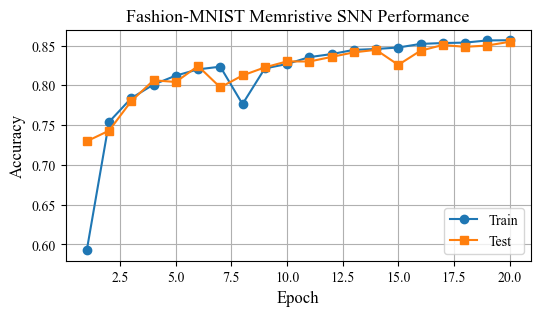

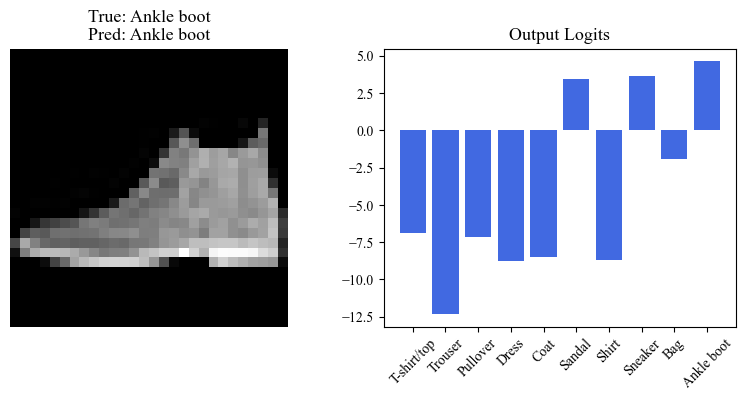

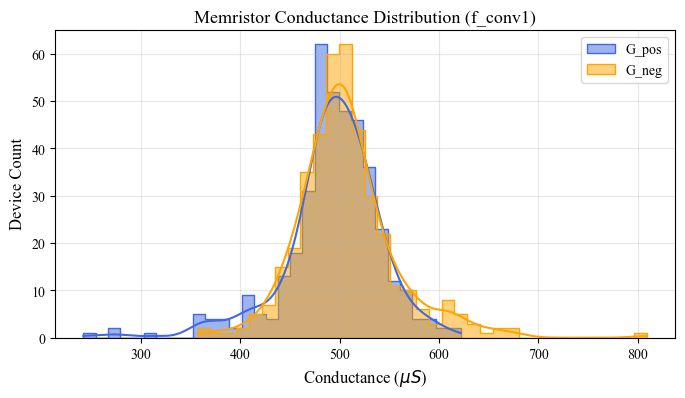

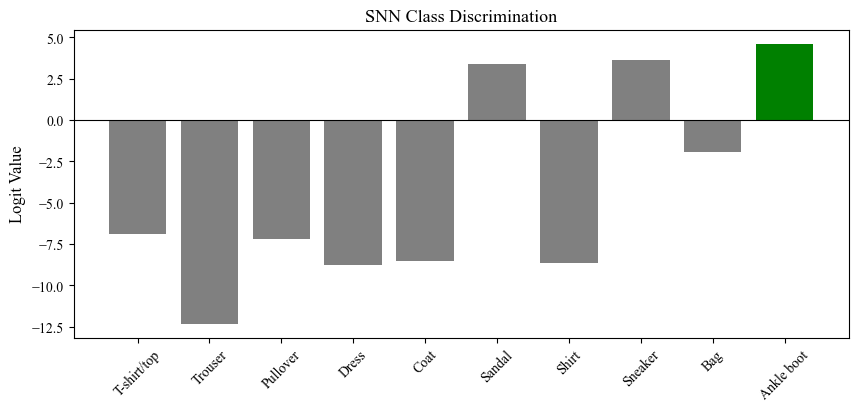

In [90]:
# 0. Fashion-MNIST Class Labels
f_class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 
                'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

# 1. Accuracy Curves (Keeping same f_ prefix)
plt.figure(figsize=(6, 3))
plt.plot(range(1, len(f_train_acc_hist) + 1), f_train_acc_hist, label="Train", marker="o")
plt.plot(range(1, len(f_test_acc_hist) + 1), f_test_acc_hist, label="Test", marker="s")
plt.title("Fashion-MNIST Memristive SNN Performance")
plt.xlabel("Epoch"); plt.ylabel("Accuracy"); plt.legend(); plt.grid(True); plt.show()

# 2. Inference Visualization (Fixing the "True 9" readability)
f_model.eval()
f_xb, f_yb = next(iter(f_test_loader))
f_xb, f_yb = f_xb.to(f_device), f_yb.to(f_device)

with torch.no_grad():
    f_spikes = poisson_encode_dynamic(f_xb, T=f_T_steps)
    f_logits = f_model(f_spikes)
    f_pred = f_logits.argmax(1)

f_idx = 0 
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(f_xb[f_idx].cpu().squeeze(), cmap="gray")
# Displaying the class name instead of just the number
true_label = f_class_names[f_yb[f_idx].item()]
pred_label = f_class_names[f_pred[f_idx].item()]
plt.title(f"True: {true_label}\nPred: {pred_label}")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.bar(range(10), f_logits[f_idx].cpu().detach().numpy(), color='royalblue')
plt.title("Output Logits"); plt.xticks(range(10), f_class_names, rotation=45); plt.tight_layout(); plt.show()

# 3. Hardware Diagnostic: Conductance Distribution
# Accessing W_pos/W_neg instead of f_pos/f_neg

# IMPROVED VISUALIZATION
with torch.no_grad():
    # Convert Siemens to Microsiemens (uS) for better readability
    g_pos_us = f_model.f_conv1.W_pos.detach().cpu().numpy() * 1e6 
    # Note: Using W_pos directly here for distribution; 
    # or use the logical_to_conductance output * 1e6
    g_pos_phys, _ = f_model.f_reram_device.logical_to_conductance(f_model.f_conv1.W_pos)
    g_neg_phys, _ = f_model.f_reram_device.logical_to_conductance(f_model.f_conv1.W_neg)
    
    g_pos_plot = g_pos_phys.cpu().flatten().numpy() * 1e6
    g_neg_plot = g_neg_phys.cpu().flatten().numpy() * 1e6

plt.figure(figsize=(8, 4))
import seaborn as sns # For smoother distribution plots

sns.histplot(g_pos_plot, color="royalblue", label="G_pos", kde=True, element="step")
sns.histplot(g_neg_plot, color="orange", label="G_neg", kde=True, element="step")

plt.title("Memristor Conductance Distribution (f_conv1)")
plt.xlabel("Conductance ($\mu S$)") # Microsiemens
plt.ylabel("Device Count")
plt.grid(True, alpha=0.3)
plt.legend()
plt.show()

# IMPROVED LOGIT PLOT
plt.figure(figsize=(10, 4))
colors = ['gray'] * 10
colors[f_yb[f_idx].item()] = 'green' # Highlight correct class
colors[f_pred[f_idx].item()] = 'red' if f_pred[f_idx] != f_yb[f_idx] else 'green'

plt.bar(f_class_names, f_logits[f_idx].cpu().numpy(), color=colors)
plt.title("SNN Class Discrimination")
plt.ylabel("Logit Value")
plt.xticks(rotation=45)
plt.axhline(0, color='black', linewidth=0.8)
plt.show()

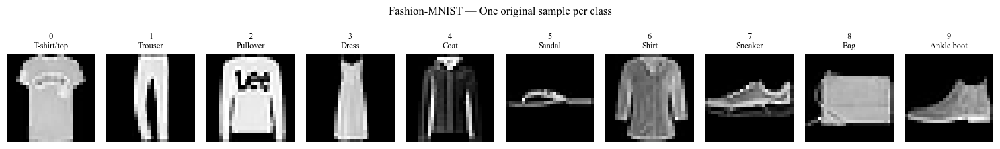

In [121]:
# =========================================================
# Fashion-MNIST — One original example per class
# =========================================================

import matplotlib.pyplot as plt

f_class_names = {
    0: "T-shirt/top",
    1: "Trouser",
    2: "Pullover",
    3: "Dress",
    4: "Coat",
    5: "Sandal",
    6: "Shirt",
    7: "Sneaker",
    8: "Bag",
    9: "Ankle boot",
}

def get_first_example_per_class(loader, num_classes=10):
    samples = {}
    
    for imgs, labels in loader:
        for img, label in zip(imgs, labels):
            label = int(label)
            if label not in samples:
                samples[label] = img
            if len(samples) == num_classes:
                return samples
    
    return samples

# Get one sample per class
samples = get_first_example_per_class(f_test_loader)

# Plot
fig, axes = plt.subplots(1, 10, figsize=(15, 2.5))

for i in range(10):
    ax = axes[i]
    img = samples[i]
    
    ax.imshow(img[0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
    ax.set_title(f"{i}\n{f_class_names[i]}", fontsize=9)
    ax.axis("off")

plt.suptitle("Fashion-MNIST — One original sample per class", fontsize=12)
plt.tight_layout()
plt.show()

In [154]:
# ---------------------------------------------------------
# Spike-level fault wrappers for evaluation pipeline
# ---------------------------------------------------------
def f_spike_fault_A3(spk):
    """SpikeDeletion p=0.75"""
    return SpikeDeletion(p=0.75).apply(spk) # 0.4 0.8/58% 0.6/87.68%

def f_spike_fault_A10(spk):
    """SpikeInsertion p=0.05"""
    return SpikeInsertion(p=0.05).apply(spk) # 0.2/65% 0.15/89% 0.16/87% 0.185/81% 0.19/79.33% 0.195/77.78%

def f_spike_fault_A11(spk):
    """SpikeTimeShift dt=5"""
    return SpikeTimeShift(dt=5).apply(spk) # 2/95.5% 20/32% 10/89% 15/55% 12/78.98%

# =========================================================
# Fashion-MNIST (isolated)
# Full evaluation: Accuracy vs MIA AUC vs MI leakage
# Single target class for speed and consistency
# =========================================================
# Example timing reference:
# 300 steps -> faster screening
# 800 steps -> stronger evaluation
# attack_K=24 -> slower but usually more stable than 12

# ---------------------------------------------------------
# USER CHOICE (Fashion-MNIST only)
# ---------------------------------------------------------
f_target_class_eval = 1     # Recommended start: 8=Bag, 9=Ankle boot, 1=Trouser
f_attack_steps = 1200        # 100 / 300 / 800 / 1200
f_attack_K = 12             # 12 is faster, 24 is stronger
f_mia_max_batches = 40

# Isolated results container
f_results = []

# Optional: human-readable class names for Fashion-MNIST
f_class_names = {
    0: "T-shirt/top",
    1: "Trouser",
    2: "Pullover",
    3: "Dress",
    4: "Coat",
    5: "Sandal",
    6: "Shirt",
    7: "Sneaker",
    8: "Bag",
    9: "Ankle boot",
}

print(f"Fashion-MNIST target class: {f_target_class_eval} -> {f_class_names.get(f_target_class_eval, 'Unknown')}")

# ---------------------------------------------------------
# Helper: run MI attack on one class and compute leakage metrics
# ---------------------------------------------------------
def f_evaluate_mi_single_class(net, target_class=8, steps=800, K=24):
    """
    Runs the MI attack on one Fashion-MNIST class and returns core leakage metrics.
    Completely isolated from MNIST variables.
    """
    attack_result = model_inversion_attack_eot_ste_full_blur(
        model=net,
        target_class=target_class,
        device=f_device,
        steps=steps,
        K=K,
        T=net.T,
        base_rate=1.0,
        use_base_rate_schedule=False,
        snapshot_every=200,
    )

    f_best_img = to_img4(attack_result["best_x_img"])
    f_final_img = to_img4(attack_result["final_x_img"])

    f_original_img = to_img4(get_first_real_example_of_class(f_test_loader, target_class))
    f_nearest_real_img = to_img4(
        get_nearest_real_example(
            f_best_img,
            f_test_loader,
            target_class,
            max_items=max_nn_items
        )
    )

    # IMPORTANT:
    # This assumes target_confidence_and_pred uses the currently provided image correctly
    # and is not tied internally to a global MNIST model.
    # If it uses a global model, it should be rewritten to accept `net` explicitly.
    f_target_conf, f_pred = target_confidence_and_pred(f_best_img, target_class)
    f_asr_top1 = int(f_pred == target_class)

    f_mse_nearest = mse_torch(f_best_img, f_nearest_real_img)
    f_psnr_nearest = psnr_torch(f_best_img, f_nearest_real_img)
    f_ssim_nearest = ssim_torch_simple(f_best_img, f_nearest_real_img)

    f_mse_original = mse_torch(f_best_img, f_original_img)
    f_psnr_original = psnr_torch(f_best_img, f_original_img)
    f_ssim_original = ssim_torch_simple(f_best_img, f_original_img)

    return {
        "mi_best_conf": float(attack_result["best_conf"]),
        "mi_target_conf": float(f_target_conf),
        "mi_pred_class": int(f_pred),
        "mi_asr_top1": int(f_asr_top1),
        "mi_mse_nearest": float(f_mse_nearest),
        "mi_psnr_nearest": float(f_psnr_nearest),
        "mi_ssim_nearest": float(f_ssim_nearest),
        "mi_mse_original": float(f_mse_original),
        "mi_psnr_original": float(f_psnr_original),
        "mi_ssim_original": float(f_ssim_original),
        "mi_best_img": f_best_img.detach().cpu(),
        "mi_final_img": f_final_img.detach().cpu(),
        "mi_nearest_img": f_nearest_real_img.detach().cpu(),
        "mi_original_img": f_original_img.detach().cpu(),
    }

# ---------------------------------------------------------
# Mapping from base model -> Fashion-MNIST model layer names
# ---------------------------------------------------------
f_layer_name_map = {
    "conv1": "f_conv1",
    "conv2": "f_conv2",
    "fc": "f_fc",
    "bn1": "f_bn1",
    "bn2": "f_bn2",
    "lif1": "f_lif1",
    "lif2": "f_lif2",
}

f_fault_configs = []

for base_fault_name, base_layer_fault_cfg, base_spike_fn in fault_configs:
    if base_layer_fault_cfg is None:
        f_fault_configs.append((base_fault_name, None, base_spike_fn))
    else:
        base_layer_name, base_fault_obj = base_layer_fault_cfg
        f_layer_name = f_layer_name_map.get(base_layer_name, base_layer_name)

        f_fault_configs.append(
            (base_fault_name, (f_layer_name, base_fault_obj), base_spike_fn)
        )

f_fault_configs = [
    ("clean", None, None),   # name, weight_or_layer_fault_cfg, spike_fault_fn

    # -----------------------------------------------------
    # Synaptic faults
    # -----------------------------------------------------
    ("WeightDrift_1", ("f_conv1", WeightDrift(delta=1)), None),
    ("WeightDrift_0.8", ("f_conv1", WeightDrift(delta=0.8)), None), # 0.3

    ("BitFlip_bit4", ("f_conv1", BitFlipSynapse(bit_pos=4)), None),
    ("BitFlip_bit3", ("f_conv1", BitFlipSynapse(bit_pos=3)), None), # 7 

    # For memristive variability
    ("WeightNoise_0.2", ("f_conv1", WeightNoise(std=0.2)), None), # 0.05 0.55/79% 0.65/40.37% 0.85/38% 

    # -----------------------------------------------------
    # Neuron-level faults
    # -----------------------------------------------------
    ("ThresholdShift_lif1_2.5", ("f_lif1", ThresholdShift(scale=2.5)), None), # 0.5 2.5/93% 10.5/69% 9.5/71.3%

    # Stochastic threshold fault
    ("ThresholdNoise_lif1_0.045", ("f_lif1", ThresholdNoise(std=0.045)), None), # 0.1  0.2/92% 0.05/93.86% 3.0/8.82% 1.0/43.2% 0.65/60% 0.6/23.52% 0.45/94.37% 

    # -----------------------------------------------------
    # Spike-level faults
    # -----------------------------------------------------
    ("SpikeDeletion_p0.75", None, f_spike_fault_A3), 
    ("SpikeInsertion_p0.05", None, f_spike_fault_A10),
    ("SpikeTimeShift_dt5", None, f_spike_fault_A11),
]

# ---------------------------------------------------------
# Main evaluation loop (Fashion-MNIST only)
# ---------------------------------------------------------
for f_fault_name, f_layer_fault_cfg, f_spike_fn in f_fault_configs:

    print("\n" + "=" * 70)
    print(f"[Fashion-MNIST] Evaluating fault config: {f_fault_name}")
    print("=" * 70)

    f_t0 = time.time()

    # Start from clean Fashion-MNIST model
    f_net_fault = deepcopy(f_model).to(f_device)
    f_net_fault.eval()

    # Apply layer / weight / neuron fault
    if f_layer_fault_cfg is not None:
        f_layer_name, f_fault_obj = f_layer_fault_cfg
        f_fi = FaultInjector(f_net_fault)
        f_fi.apply_to_layer(f_layer_name, f_fault_obj)
        print(f"Applied layer fault on: {f_layer_name} -> {type(f_fault_obj).__name__}")

    # -----------------------------------------------------
    # 1) Accuracy
    # -----------------------------------------------------
    if f_spike_fn is None:
        f_acc = evaluate(f_net_fault, f_test_loader, base_rate=1.0) * 100.0
    else:
        f_acc = eval_accuracy_model_with_spikefault(
            f_net_fault,
            f_test_loader,
            spike_transform=f_spike_fn
        )

    print(f"Accuracy: {f_acc:.2f}%")

    # -----------------------------------------------------
    # 2) MIA AUC
    # -----------------------------------------------------
    if f_spike_fn is None:
        f_auc_logits = mia_logit_auc_with_spikefault(
            f_net_fault,
            f_train_loader,
            f_test_loader,
            spike_transform=None,
            max_batches=f_mia_max_batches
        )
    else:
        f_auc_logits = mia_logit_auc_with_spikefault(
            f_net_fault,
            f_train_loader,
            f_test_loader,
            spike_transform=f_spike_fn,
            max_batches=f_mia_max_batches
        )

    print(f"MIA logit AUC: {f_auc_logits:.4f}")

    # -----------------------------------------------------
    # 3) Model inversion leakage on one target class
    # -----------------------------------------------------
    try:
        f_mi_metrics = f_evaluate_mi_single_class(
            f_net_fault,
            target_class=f_target_class_eval,
            steps=f_attack_steps,
            K=f_attack_K
        )

        print(f"MI best confidence:   {f_mi_metrics['mi_best_conf']:.4f}")
        print(f"MI target confidence: {f_mi_metrics['mi_target_conf']:.4f}")
        print(f"MI predicted class:   {f_mi_metrics['mi_pred_class']}")
        print(f"MI ASR (top-1):       {f_mi_metrics['mi_asr_top1']}")
        print(f"MI SSIM nearest:      {f_mi_metrics['mi_ssim_nearest']:.4f}")
        print(f"MI MSE nearest:       {f_mi_metrics['mi_mse_nearest']:.4f}")
        print(f"MI PSNR nearest:      {f_mi_metrics['mi_psnr_nearest']:.4f}")

    except Exception as f_e:
        print(f"[WARNING] Fashion-MNIST MI evaluation failed for {f_fault_name}: {f_e}")
        f_mi_metrics = {
            "mi_best_conf": np.nan,
            "mi_target_conf": np.nan,
            "mi_pred_class": np.nan,
            "mi_asr_top1": np.nan,
            "mi_mse_nearest": np.nan,
            "mi_psnr_nearest": np.nan,
            "mi_ssim_nearest": np.nan,
            "mi_mse_original": np.nan,
            "mi_psnr_original": np.nan,
            "mi_ssim_original": np.nan,
            "mi_best_img": None,
            "mi_final_img": None,
            "mi_nearest_img": None,
            "mi_original_img": None,
        }

    f_elapsed = time.time() - f_t0
    print(f"Elapsed time: {f_elapsed/60:.2f} min")

    f_results.append({
        "fault": f_fault_name,
        "target_class": f_target_class_eval,
        "target_class_name": f_class_names.get(f_target_class_eval, "Unknown"),
        "accuracy": f_acc,
        "mia_auc_logits": f_auc_logits,
        "mi_best_conf": f_mi_metrics["mi_best_conf"],
        "mi_target_conf": f_mi_metrics["mi_target_conf"],
        "mi_pred_class": f_mi_metrics["mi_pred_class"],
        "mi_asr_top1": f_mi_metrics["mi_asr_top1"],
        "mi_ssim_nearest": f_mi_metrics["mi_ssim_nearest"],
        "mi_mse_nearest": f_mi_metrics["mi_mse_nearest"],
        "mi_psnr_nearest": f_mi_metrics["mi_psnr_nearest"],
        "mi_ssim_original": f_mi_metrics["mi_ssim_original"],
        "mi_mse_original": f_mi_metrics["mi_mse_original"],
        "mi_psnr_original": f_mi_metrics["mi_psnr_original"],
        "elapsed_sec": f_elapsed,
    })

# ---------------------------------------------------------
# Summary table (Fashion-MNIST only)
# ---------------------------------------------------------
f_df_results = pd.DataFrame(f_results)
print("\n[Fashion-MNIST] Summary: Accuracy vs MIA AUC vs MI leakage")
display(f_df_results.sort_values(by="mi_ssim_nearest", ascending=False))

Fashion-MNIST target class: 1 -> Trouser

[Fashion-MNIST] Evaluating fault config: clean
Accuracy: 85.67%
MIA logit AUC: 0.5136

===== Starting Model Inversion Attack (Full + Blur) =====
Target class: 1
Steps: 1200 | Population K: 12 | T: 20
Stage1 LR: 0.01 | Stage2 LR: 0.003 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.14 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.05, xi_blur=0.015, xi_mean=0.8
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.18, xi_l2=0.15, xi_blur=0.2, xi_mean=1.2


[Iter 0000/1200] stage=1 base_rate=1.000 lr=0.0100
  avg_conf(target)     : 0.005001   (best=0.005001)
  avg_loss(no_priors)  : 5.100767
  avg_target_logit     : -6.494388
  avg_max_other_logit  : -1.407033
  avg_sparsity         : 0.100404
  fr_mean/min/max      : 0.100404 / 0.080676 / 0.117241
  fr_pen(one-sided)    : 0.006562   fr_l2: 0.010178
  tv=0.000000 l2=0.009950 blur=0.000162
  xmean=0.099750 mean_pen

,fault,target_class,target_class_name,accuracy,mia_auc_logits,mi_best_conf,mi_target_conf,mi_pred_class,mi_asr_top1,mi_ssim_nearest,mi_mse_nearest,mi_psnr_nearest,mi_ssim_original,mi_mse_original,mi_psnr_original,elapsed_sec
1,WeightDrift_1,1,Trouser,66.20,0.504312,0.937108,0.104965,8,0,0.583409,0.025708,15.899319,0.192077,0.154446,8.112228,904.341815
2,WeightDrift_0.8,1,Trouser,70.63,0.504805,0.878110,0.399107,1,1,0.471111,0.033888,14.699479,0.098841,0.182298,7.392191,903.129968
3,BitFlip_bit4,1,Trouser,48.11,0.503512,0.248334,0.111669,2,0,0.392706,0.033411,14.761095,0.148444,0.160510,7.944987,902.372826
0,clean,1,Trouser,85.67,0.513590,0.854119,0.050850,3,0,0.391165,0.046206,13.353004,0.092087,0.187423,7.271781,1298.151045
10,SpikeTimeShift_dt5,1,Trouser,69.26,0.504548,0.854119,0.050850,3,0,0.391165,0.046206,13.353004,0.092087,0.187423,7.271781,1018.881650
8,SpikeDeletion_p0.75,1,Trouser,67.12,0.503674,0.853552,0.051252,3,0,0.391136,0.046208,13.352833,0.092088,0.187420,7.271846,901.207343
9,SpikeInsertion_p0.05,1,Trouser,71.60,0.506362,0.853533,0.050390,3,0,0.391094,0.046206,13.352992,0.091953,0.187448,7.271190,1025.831836
4,BitFlip_bit3,1,Trouser,81.28,0.505926,0.836663,0.244434,8,0,0.378627,0.039788,14.002518,0.064899,0.192467,7.156435,903.583137
7,ThresholdNoise_lif1_0.045,1,Trouser,83.74,0.506060,0.009955,0.047730,8,0,0.335300,0.040673,13.906920,0.087588,0.183021,7.374980,901.707552
5,WeightNoise_0.2,1,Trouser,10.61,0.503169,0.000334,0.011168,2,0,0.315273,0.035975,14.439971,0.119839,0.166126,7.795611,915.720797


In [ ]:
# =========================================================
# Fashion-MNIST — Normalized results vs clean (ratio + % change)
# =========================================================

f_df = f_df_results.copy()

# Safety: numeric conversion
f_numeric_cols = [
    "accuracy",
    "mia_auc_logits",
    "mi_best_conf",
    "mi_target_conf",
    "mi_pred_class",
    "mi_asr_top1",
    "mi_ssim_nearest",
    "mi_mse_nearest",
    "mi_psnr_nearest",
    "mi_ssim_original",
    "mi_mse_original",
    "mi_psnr_original",
    "elapsed_sec",
]

for c in f_numeric_cols:
    f_df[c] = pd.to_numeric(f_df[c], errors="coerce")

# Get clean baseline
f_clean_row = f_df[f_df["fault"] == "clean"].iloc[0]

f_metrics = [
    "accuracy",
    "mi_best_conf",
    "mi_ssim_nearest",
    "mi_mse_nearest",
    "mi_psnr_nearest"
]

f_norm_rows = []

for _, row in f_df.iterrows():
    f_norm_entry = {
        "fault": row["fault"],
        "target_class": row.get("target_class", np.nan),
        "target_class_name": row.get("target_class_name", "Unknown"),
    }

    for m in f_metrics:
        clean_val = f_clean_row[m]
        val = row[m]

        ratio = val / clean_val if clean_val != 0 else float("nan")
        pct = (ratio - 1.0) * 100.0


        f_norm_entry[f"{m}_ratio"] = ratio
        f_norm_entry[f"{m}_pct"] = pct

    f_norm_rows.append(f_norm_entry)

f_df_norm = pd.DataFrame(f_norm_rows)

print("\n=== Fashion-MNIST Normalized Results (vs clean) ===")
display(f_df_norm.sort_values(by="mi_ssim_nearest_ratio", ascending=False))


=== Fashion-MNIST Normalized Results (vs clean) ===


,fault,target_class,target_class_name,accuracy_ratio,accuracy_pct,mi_best_conf_ratio,mi_best_conf_pct,mi_ssim_nearest_ratio,mi_ssim_nearest_pct,mi_mse_nearest_ratio,mi_mse_nearest_pct,mi_psnr_nearest_ratio,mi_psnr_nearest_pct
1,WeightDrift_1,1,Trouser,0.772733,-22.726742,1.097164,9.716356,1.491465,49.146471,0.556376,-44.362395,1.190692,19.069230
2,WeightDrift_0.8,1,Trouser,0.824443,-17.555737,1.028089,2.808883,1.204379,20.437882,0.733420,-26.658049,1.100837,10.083686
3,BitFlip_bit4,1,Trouser,0.561573,-43.842652,0.290748,-70.925174,1.003940,0.394002,0.723087,-27.691252,1.105451,10.545127
0,clean,1,Trouser,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000
10,SpikeTimeShift_dt5,1,Trouser,0.808451,-19.154897,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000
8,SpikeDeletion_p0.75,1,Trouser,0.783471,-21.652854,0.999336,-0.066389,0.999926,-0.007360,1.000039,0.003926,0.999987,-0.001277
9,SpikeInsertion_p0.05,1,Trouser,0.835765,-16.423485,0.999314,-0.068625,0.999819,-0.018125,1.000003,0.000274,0.999999,-0.000089
4,BitFlip_bit3,1,Trouser,0.948757,-5.124314,0.979563,-2.043728,0.967947,-3.205331,0.861090,-13.890993,1.048642,4.864179
7,ThresholdNoise_lif1_0.045,1,Trouser,0.977472,-2.252831,0.011655,-98.834470,0.857183,-14.281668,0.880255,-11.974520,1.041482,4.148249
5,WeightNoise_0.2,1,Trouser,0.123847,-87.615268,0.000391,-99.960922,0.805984,-19.401610,0.778580,-22.141990,1.081402,8.140241


In [ ]:
# =========================================================
# Fashion-MNIST — Visual comparison figure
# 4 columns: clean / leakage-increasing / neutral / privacy-reducing
# 3 rows: original / nearest / reconstructed
# =========================================================

# -----------------------------
# USER CHOICE (Fashion-MNIST)
# -----------------------------
f_figure_steps = 100
f_figure_K = 12
f_target_class_eval = 1   # trouser

# Regimes:
# - clean
# - leakage-increasing
# - privacy-neutral
# - privacy-reducing
f_selected_fault_names = [
    "clean",
    #"ThresholdShift_lif1_2.5",   # leakage-increasing
    #SpikeDeletion_p0.75",       # privacy-neutral
    #"WeightNoise_0.2",          # privacy-reducing
]

# Map fault name -> config
f_fault_dict = {
    name: (name, layer_fault_cfg, spike_fn)
    for name, layer_fault_cfg, spike_fn in f_fault_configs
}

f_visual_rows = []

for f_fault_name in f_selected_fault_names:
    f_name, f_layer_fault_cfg, f_spike_fn = f_fault_dict[f_fault_name]

    print(f"\n[Fashion-MNIST] Running figure config: {f_name}")

    f_net_fault = deepcopy(f_model).to(f_device)
    f_net_fault.eval()

    if f_layer_fault_cfg is not None:
        f_layer_name, f_fault_obj = f_layer_fault_cfg
        f_fi = FaultInjector(f_net_fault)
        f_fi.apply_to_layer(f_layer_name, f_fault_obj)

    # Run MI attack

    #f_attack_result = model_inversion_attack_eot_ste_full_blur(
    #    model=f_net_fault,
    #    target_class=f_target_class_eval,
    #    device=f_device,
    #    steps=f_figure_steps,
    #    K=f_figure_K,
    #    T=f_net_fault.T,
    #    base_rate=1.0,
    #    use_base_rate_schedule=False,
    #    snapshot_every=10_000,
    #    log_every=100,
    #    seed=0,
    #)
    f_attack_result = model_inversion_attack_eot_ste_full_blur(
        model=f_net_fault,
        target_class=f_target_class_eval,
        device=f_device,
        steps=f_figure_steps,
        K=f_figure_K,
        T=f_net_fault.T,
        base_rate=1.10,
        use_base_rate_schedule=True,
        base_rate_after=1.20,
        base_rate_switch_iter=300,

        margin_lambda=1.0,
        fr_target=0.04,

        xi_sparsity=0.3,
        xi_fr=0.3,
        xi_fr_l2=0.3,

        xi_tv=0.03,          # antes 0.02
        xi_l2=0.04,          # antes 0.03
        xi_blur=0.012,       # antes 0.008
        blur_k=3,

        xi_mean=0.8,
        mean_target=0.18,    # antes 0.20

        stage2_start=350,

        xi_sparsity_stage2=4.0,
        xi_fr_stage2=1.5,
        xi_fr_l2_stage2=3.0,
        xi_tv_stage2=0.14,   # antes 0.10
        xi_l2_stage2=0.14,   # antes 0.10
        xi_blur_stage2=0.12, # antes 0.08
        xi_mean_stage2=0.9,  # antes 0.8

        lr=0.01,
        lr_stage2=0.0025,    # antes 0.003

        xi_border=0.4,       # antes 0.3
        xi_border_stage2=0.7,# antes 0.5

        snapshot_every=10_000,
        log_every=100,
        seed=0,
    )

    f_best_img = to_img4(f_attack_result["best_x_img"])
    f_original_img = to_img4(get_first_real_example_of_class(f_test_loader, f_target_class_eval))
    f_nearest_real_img = to_img4(
        get_nearest_real_example(
            f_best_img,
            f_test_loader,
            f_target_class_eval,
            max_items=max_nn_items
        )
    )

    f_visual_rows.append({
        "fault": f_name,
        "original_img": f_original_img,
        "nearest_img": f_nearest_real_img,
        "best_img": f_best_img,
        "best_conf": float(f_attack_result["best_conf"]),
        "ssim_nearest": ssim_torch_simple(f_best_img, f_nearest_real_img),
    })


[Fashion-MNIST] Running figure config: clean

===== Starting Model Inversion Attack (Full + Blur) =====
Target class: 1
Steps: 1200 | Population K: 12 | T: 20
Stage1 LR: 0.01 | Stage2 LR: 0.0025 @ iter 350
base_rate: 1.1 | margin_lambda: 1.0 | fr_target: 0.04 | mean_target: 0.18 | blur_k: 3
Stage1 regs: xi_sparsity=0.3, xi_fr=0.3, xi_fr_l2=0.3, xi_tv=0.03, xi_l2=0.04, xi_blur=0.012, xi_mean=0.8
Stage2 regs: xi_sparsity=4.0, xi_fr=1.5, xi_fr_l2=3.0, xi_tv=0.14, xi_l2=0.14, xi_blur=0.12, xi_mean=0.9
base_rate schedule: 1.1 -> 1.2 at iter 300


[Iter 0000/1200] stage=1 base_rate=1.100 lr=0.0100
  avg_conf(target)     : 0.003983   (best=0.003983)
  avg_loss(no_priors)  : 5.432144
  avg_target_logit     : -6.682388
  avg_max_other_logit  : -1.259058
  avg_sparsity         : 0.110092
  fr_mean/min/max      : 0.110092 / 0.088542 / 0.128827
  fr_pen(one-sided)    : 0.005024   fr_l2: 0.012231
  tv=0.000000 l2=0.009950 blur=0.000162
  xmean=0.099750 mean_pen=0.006440 grad_norm=0.001080


KeyboardInterrupt: 

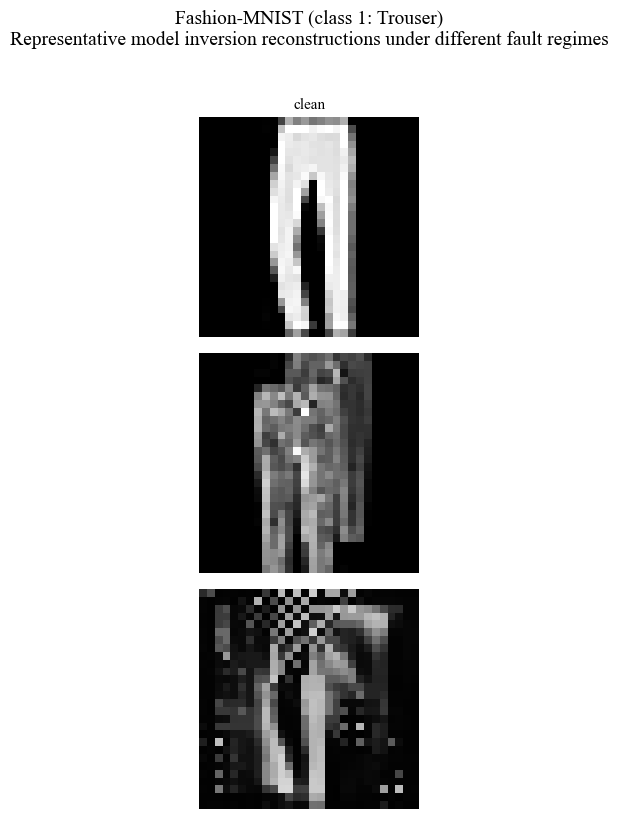

In [164]:
# Plot
fig, axes = plt.subplots(3, len(f_visual_rows), figsize=(4 * len(f_visual_rows), 8))

# fix cuando hay una sola columna
if len(f_visual_rows) == 1:
    axes = axes.reshape(3, 1)

for col, row in enumerate(f_visual_rows):

    axes[0, col].imshow(row["original_img"].squeeze().cpu().numpy(), cmap="gray", vmin=0, vmax=1)
    axes[0, col].set_title(f"{row['fault']}", fontsize=11)
    axes[0, col].axis("off")

    axes[1, col].imshow(row["nearest_img"].squeeze().cpu().numpy(), cmap="gray", vmin=0, vmax=1)
    axes[1, col].axis("off")

    axes[2, col].imshow(row["best_img"].squeeze().cpu().numpy(), cmap="gray", vmin=0, vmax=1)
    axes[2, col].set_xlabel(
        f"SSIM={row['ssim_nearest']:.3f}\nConf={row['best_conf']:.3f}",
        fontsize=10
    )
    axes[2, col].axis("off")

axes[0, 0].set_ylabel("Original", fontsize=12)
axes[1, 0].set_ylabel("Nearest real", fontsize=12)
axes[2, 0].set_ylabel("MI reconstruction", fontsize=12)

plt.suptitle(
    f"Fashion-MNIST (class {f_target_class_eval}: {f_class_names.get(f_target_class_eval, 'Unknown')})\n"
    "Representative model inversion reconstructions under different fault regimes",
    y=1.02,
    fontsize=14
)

plt.tight_layout()
plt.show()


[Fashion-MNIST] Running figure config: clean

===== Starting Model Inversion Attack (Full + Blur) =====
Target class: 1
Steps: 1200 | Population K: 12 | T: 20
Stage1 LR: 0.01 | Stage2 LR: 0.0025 @ iter 350
base_rate: 1.1 | margin_lambda: 1.0 | fr_target: 0.04 | mean_target: 0.18 | blur_k: 3
Stage1 regs: xi_sparsity=0.3, xi_fr=0.3, xi_fr_l2=0.3, xi_tv=0.03, xi_l2=0.04, xi_blur=0.012, xi_mean=0.8
Stage2 regs: xi_sparsity=4.0, xi_fr=1.5, xi_fr_l2=3.0, xi_tv=0.14, xi_l2=0.14, xi_blur=0.12, xi_mean=0.9
base_rate schedule: 1.1 -> 1.2 at iter 300


[Iter 0000/1200] stage=1 base_rate=1.100 lr=0.0100
  avg_conf(target)     : 0.003983   (best=0.003983)
  avg_loss(no_priors)  : 5.432144
  avg_target_logit     : -6.682388
  avg_max_other_logit  : -1.259058
  avg_sparsity         : 0.110092
  fr_mean/min/max      : 0.110092 / 0.088542 / 0.128827
  fr_pen(one-sided)    : 0.005024   fr_l2: 0.012231
  tv=0.000000 l2=0.009950 blur=0.000162
  xmean=0.099750 mean_pen=0.006440 grad_norm=0.001080

[Iter 0

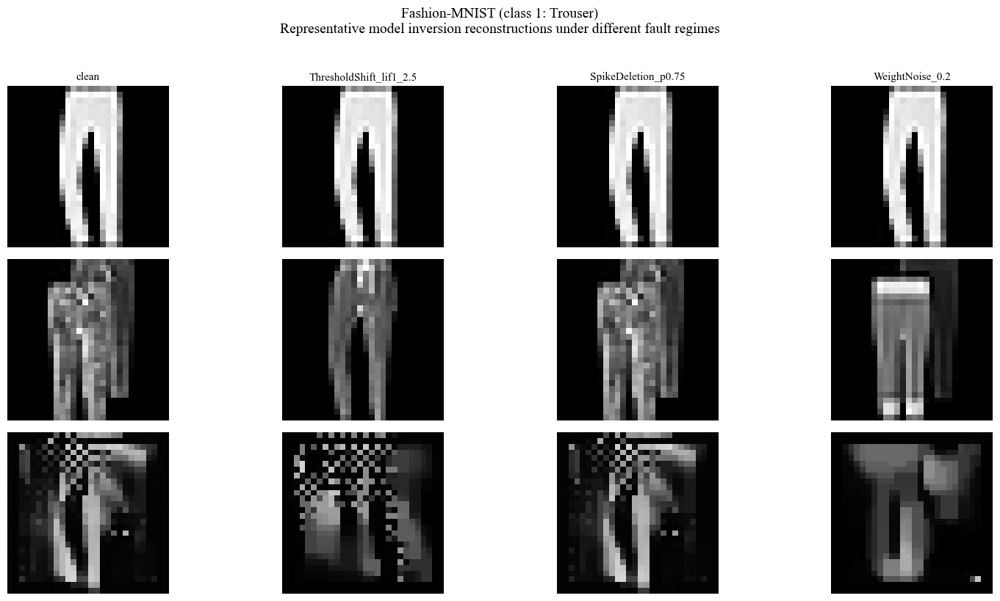

In [166]:
# =========================================================
# Fashion-MNIST — Visual comparison figure
# 4 columns: clean / leakage-increasing / neutral / privacy-reducing
# 3 rows: original / nearest / reconstructed
# =========================================================

# -----------------------------
# USER CHOICE (Fashion-MNIST)
# -----------------------------
f_figure_steps = 1200
f_figure_K = 12
f_target_class_eval = 1   # trouser

# Regimes:
# - clean
# - leakage-increasing
# - privacy-neutral
# - privacy-reducing
f_selected_fault_names = [
    "clean",
    "ThresholdShift_lif1_2.5",   # leakage-increasing
    "SpikeDeletion_p0.75",       # privacy-neutral
    "WeightNoise_0.2",          # privacy-reducing
]

# Map fault name -> config
f_fault_dict = {
    name: (name, layer_fault_cfg, spike_fn)
    for name, layer_fault_cfg, spike_fn in f_fault_configs
}

f_visual_rows = []

for f_fault_name in f_selected_fault_names:
    f_name, f_layer_fault_cfg, f_spike_fn = f_fault_dict[f_fault_name]

    print(f"\n[Fashion-MNIST] Running figure config: {f_name}")

    f_net_fault = deepcopy(f_model).to(f_device)
    f_net_fault.eval()

    if f_layer_fault_cfg is not None:
        f_layer_name, f_fault_obj = f_layer_fault_cfg
        f_fi = FaultInjector(f_net_fault)
        f_fi.apply_to_layer(f_layer_name, f_fault_obj)

    # Run MI attack

    #f_attack_result = model_inversion_attack_eot_ste_full_blur(
    #    model=f_net_fault,
    #    target_class=f_target_class_eval,
    #    device=f_device,
    #    steps=f_figure_steps,
    #    K=f_figure_K,
    #    T=f_net_fault.T,
    #    base_rate=1.0,
    #    use_base_rate_schedule=False,
    #    snapshot_every=10_000,
    #    log_every=100,
    #    seed=0,
    #)
    f_attack_result = model_inversion_attack_eot_ste_full_blur(
        model=f_net_fault,
        target_class=f_target_class_eval,
        device=f_device,
        steps=f_figure_steps,
        K=f_figure_K,
        T=f_net_fault.T,
        base_rate=1.10,
        use_base_rate_schedule=True,
        base_rate_after=1.20,
        base_rate_switch_iter=300,

        margin_lambda=1.0,
        fr_target=0.04,

        xi_sparsity=0.3,
        xi_fr=0.3,
        xi_fr_l2=0.3,

        xi_tv=0.03,          # antes 0.02
        xi_l2=0.04,          # antes 0.03
        xi_blur=0.012,       # antes 0.008
        blur_k=3,

        xi_mean=0.8,
        mean_target=0.18,    # antes 0.20

        stage2_start=350,

        xi_sparsity_stage2=4.0,
        xi_fr_stage2=1.5,
        xi_fr_l2_stage2=3.0,
        xi_tv_stage2=0.14,   # antes 0.10
        xi_l2_stage2=0.14,   # antes 0.10
        xi_blur_stage2=0.12, # antes 0.08
        xi_mean_stage2=0.9,  # antes 0.8

        lr=0.01,
        lr_stage2=0.0025,    # antes 0.003

        xi_border=0.4,       # antes 0.3
        xi_border_stage2=0.7,# antes 0.5

        snapshot_every=10_000,
        log_every=100,
        seed=0,
    )

    f_best_img = to_img4(f_attack_result["best_x_img"])
    f_original_img = to_img4(get_first_real_example_of_class(f_test_loader, f_target_class_eval))
    f_nearest_real_img = to_img4(
        get_nearest_real_example(
            f_best_img,
            f_test_loader,
            f_target_class_eval,
            max_items=max_nn_items
        )
    )

    f_visual_rows.append({
        "fault": f_name,
        "original_img": f_original_img,
        "nearest_img": f_nearest_real_img,
        "best_img": f_best_img,
        "best_conf": float(f_attack_result["best_conf"]),
        "ssim_nearest": ssim_torch_simple(f_best_img, f_nearest_real_img),
    })

# Plot
fig, axes = plt.subplots(3, len(f_visual_rows), figsize=(4 * len(f_visual_rows), 8))

for col, row in enumerate(f_visual_rows):
    axes[0, col].imshow(row["original_img"][0, 0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
    axes[0, col].set_title(f"{row['fault']}", fontsize=11)
    axes[0, col].axis("off")

    axes[1, col].imshow(row["nearest_img"][0, 0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
    axes[1, col].axis("off")

    axes[2, col].imshow(row["best_img"][0, 0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
    axes[2, col].set_xlabel(
        f"SSIM={row['ssim_nearest']:.3f}\nConf={row['best_conf']:.3f}",
        fontsize=10
    )
    axes[2, col].axis("off")

axes[0, 0].set_ylabel("Original", fontsize=12)
axes[1, 0].set_ylabel("Nearest real", fontsize=12)
axes[2, 0].set_ylabel("MI reconstruction", fontsize=12)

plt.suptitle(
    f"Fashion-MNIST (class {f_target_class_eval}: {f_class_names.get(f_target_class_eval, 'Unknown')})\n"
    "Representative model inversion reconstructions under different fault regimes",
    y=1.02,
    fontsize=14
)
plt.tight_layout()
plt.show()

# AT&T Faces

In [54]:
# =========================================================
# AT&T / Olivetti Faces — Full version: 40 classes
# Keeps all 10 images per subject
# Uses balanced per-class train/test split
# =========================================================

from torch.utils.data import DataLoader, TensorDataset
from sklearn.datasets import fetch_olivetti_faces
import torch
import numpy as np

# Device for training/inference
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# ---------------------------------------------------------
# USER CHOICE
# ---------------------------------------------------------
selected_subjects = list(range(40))   # all 40 subjects
train_imgs_per_class = 8              # 8 train / 2 test from the 10 available images
test_imgs_per_class = 2
assert train_imgs_per_class + test_imgs_per_class == 10, "Each Olivetti subject has 10 images."

# ---------------------------------------------------------
# Load Olivetti / AT&T faces
# ---------------------------------------------------------
print("Downloading AT&T Faces (Olivetti)...")
dataset = fetch_olivetti_faces(data_home="./data")
images = dataset.images          # [400, 64, 64]
labels = dataset.target          # [400]

print("Full dataset loaded:")
print("images shape:", images.shape)
print("labels shape:", labels.shape)

# ---------------------------------------------------------
# Filter selected subjects (here: all 40)
# ---------------------------------------------------------
mask = np.isin(labels, selected_subjects)
images_sel = images[mask]
labels_sel = labels[mask]

# Remap labels to 0..N-1
subject_to_new = {old: new for new, old in enumerate(selected_subjects)}
labels_remap = np.array([subject_to_new[int(y)] for y in labels_sel], dtype=np.int64)

FACES_CLASSES = [f"Subject {s}" for s in selected_subjects]

print(f"Selected subjects: {selected_subjects[:10]} ... {selected_subjects[-5:]}")
print(f"Number of selected classes: {len(FACES_CLASSES)}")
print(f"Filtered dataset shape: {images_sel.shape}")

# ---------------------------------------------------------
# Balanced per-class split: 8 train / 2 test
# ---------------------------------------------------------
rng = np.random.default_rng(42)

train_imgs = []
train_labels = []
test_imgs = []
test_labels = []

for old_subject in selected_subjects:
    new_label = subject_to_new[old_subject]

    idx = np.where(labels_sel == old_subject)[0]
    rng.shuffle(idx)

    train_idx = idx[:train_imgs_per_class]
    test_idx = idx[train_imgs_per_class:train_imgs_per_class + test_imgs_per_class]

    train_imgs.append(images_sel[train_idx])
    train_labels.append(np.full(len(train_idx), new_label, dtype=np.int64))

    test_imgs.append(images_sel[test_idx])
    test_labels.append(np.full(len(test_idx), new_label, dtype=np.int64))

train_imgs = np.concatenate(train_imgs, axis=0)
train_labels = np.concatenate(train_labels, axis=0)
test_imgs = np.concatenate(test_imgs, axis=0)
test_labels = np.concatenate(test_labels, axis=0)

# ---------------------------------------------------------
# Convert to tensors
# ---------------------------------------------------------
x_train_tensor = torch.tensor(train_imgs).unsqueeze(1).float()   # [N,1,64,64]
y_train_tensor = torch.tensor(train_labels).long()

x_test_tensor = torch.tensor(test_imgs).unsqueeze(1).float()
y_test_tensor = torch.tensor(test_labels).long()

print("Train tensor shape:", tuple(x_train_tensor.shape))
print("Test tensor shape:", tuple(x_test_tensor.shape))

# ---------------------------------------------------------
# TensorDatasets and DataLoaders
# ---------------------------------------------------------
face_train_dataset = TensorDataset(x_train_tensor, y_train_tensor)
face_test_dataset = TensorDataset(x_test_tensor, y_test_tensor)

face_train_loader = DataLoader(
    face_train_dataset,
    batch_size=16,
    shuffle=True,
    pin_memory=(device.type == "cuda")
)

face_test_loader = DataLoader(
    face_test_dataset,
    batch_size=16,
    shuffle=False,
    pin_memory=(device.type == "cuda")
)

# ---------------------------------------------------------
# Sanity check
# ---------------------------------------------------------
data, targets = next(iter(face_train_loader))
print("Full AT&T Faces dataset loaded successfully.")
print("Batch data shape:", tuple(data.shape))
print("Batch targets shape:", tuple(targets.shape))
print("Data dtype:", data.dtype, "| Targets dtype:", targets.dtype)
print(f"Total Subjects: {len(FACES_CLASSES)}")
print(f"Train samples: {len(face_train_dataset)}")
print(f"Test samples: {len(face_test_dataset)}")
print("First 10 class names:", FACES_CLASSES[:10])

# ---------------------------------------------------------
# Poisson encoder
# ---------------------------------------------------------
def poisson_encode_faces(x, T, rate=0.4):
    x = x.clamp(0.0, 1.0)
    x_expanded = x.unsqueeze(1).expand(-1, T, -1, -1, -1)   # [B,T,1,64,64]
    p = (rate * x_expanded).clamp(0.0, 1.0)
    return (torch.rand_like(p) < p).float()

Using device: cuda
Full dataset loaded:
images shape: (400, 64, 64)
labels shape: (400,)
Selected subjects: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9] ... [35, 36, 37, 38, 39]
Number of selected classes: 40
Filtered dataset shape: (400, 64, 64)
Train tensor shape: (320, 1, 64, 64)
Test tensor shape: (80, 1, 64, 64)
Full AT&T Faces dataset loaded successfully.
Batch data shape: (16, 1, 64, 64)
Batch targets shape: (16,)
Data dtype: torch.float32 | Targets dtype: torch.int64
Total Subjects: 40
Train samples: 320
Test samples: 80
First 10 class names: ['Subject 0', 'Subject 1', 'Subject 2', 'Subject 3', 'Subject 4', 'Subject 5', 'Subject 6', 'Subject 7', 'Subject 8', 'Subject 9']


In [55]:
class MemSNN_ReRAM_Faces_64(nn.Module):
    def __init__(self, T=20, num_classes=40):
        super().__init__()
        self.T = T
        self.num_classes = num_classes
        self.reram_device = ReRAMAnalogDevice_IBMClone()

        self.conv1 = ReRAMConv2d_IBMClone(1, 32, 5, device_model=self.reram_device, gain=300)
        self.bn1 = nn.BatchNorm2d(32)
        self.lif1 = LIF_Pro(tau=5.0, v_th=0.2)

        self.conv2 = ReRAMConv2d_IBMClone(32, 64, 5, device_model=self.reram_device, gain=300)
        self.bn2 = nn.BatchNorm2d(64)
        self.lif2 = LIF_Pro(tau=5.0, v_th=0.25)

        self.conv3 = ReRAMConv2d_IBMClone(64, 128, 3, device_model=self.reram_device, gain=300)
        self.bn3 = nn.BatchNorm2d(128)
        self.lif3 = LIF_Pro(tau=5.0, v_th=0.3)

        self.fc = ReRAMLinear_IBMClone(8192, num_classes, device_model=self.reram_device, gain=500)

    def forward(self, spikes):
        assert spikes.dim() == 5, f"Expected [B,T,1,64,64], got {tuple(spikes.shape)}"
        assert spikes.size(2) == 1 and spikes.size(3) == 64 and spikes.size(4) == 64, \
            f"Expected [B,T,1,64,64], got {tuple(spikes.shape)}"

        B = spikes.size(0)
        T = min(self.T, spikes.size(1))
        spikes = spikes[:, :T].permute(1, 0, 2, 3, 4).contiguous()

        v1, v2, v3 = None, None, None
        logits_sum = torch.zeros((B, self.num_classes), device=spikes.device)

        for t in range(T):
            x = spikes[t]

            u1 = self.bn1(self.conv1(x))
            spk1, v1 = self.lif1(u1, v1)
            p1 = F.avg_pool2d(spk1, 2)

            u2 = self.bn2(self.conv2(p1))
            spk2, v2 = self.lif2(u2, v2)
            p2 = F.avg_pool2d(spk2, 2)

            u3 = self.bn3(self.conv3(p2))
            spk3, v3 = self.lif3(u3, v3)
            p3 = F.avg_pool2d(spk3, 2)

            flat = p3.reshape(B, -1)
            logits_sum += self.fc(flat)

        return logits_sum / float(T)

In [94]:
device = "cuda" if torch.cuda.is_available() else "cpu"

# ---------------------------------------------------------
# USER CHOICE
# ---------------------------------------------------------
face_rate = 0.8
eval_mc_K = 10
epochs = 40

# ---------------------------------------------------------
# Training-time augmentation
# ---------------------------------------------------------
def augment_faces_batch(xb):
    """
    Mild batch augmentation for 64x64 AT&T faces.
    Goal: reduce shortcut learning from fixed borders / lighting regions.
    """
    xb_aug = xb.clone()

    # Random horizontal flip
    flip_mask = torch.rand(xb_aug.size(0), device=xb_aug.device) < 0.5
    xb_aug[flip_mask] = torch.flip(xb_aug[flip_mask], dims=[3])

    # Random translation
    theta = torch.eye(2, 3, device=xb_aug.device).unsqueeze(0).repeat(xb_aug.size(0), 1, 1)
    theta[:, 0, 2] = (torch.rand(xb_aug.size(0), device=xb_aug.device) - 0.5) * 0.12
    theta[:, 1, 2] = (torch.rand(xb_aug.size(0), device=xb_aug.device) - 0.5) * 0.12

    grid = F.affine_grid(theta, xb_aug.size(), align_corners=False)
    xb_aug = F.grid_sample(xb_aug, grid, padding_mode="zeros", align_corners=False)

    # Mild brightness jitter
    brightness = 0.9 + 0.2 * torch.rand(xb_aug.size(0), 1, 1, 1, device=xb_aug.device)
    xb_aug = (xb_aug * brightness).clamp(0.0, 1.0)

    return xb_aug


# ---------------------------------------------------------
# MC-averaged evaluation without augmentation
# ---------------------------------------------------------
@torch.no_grad()
def eval_with_mc_poisson(model_faces, loader, device, K=10, rate=0.8):
    model_faces.eval()
    correct, total = 0, 0

    for xb, yb in loader:
        xb, yb = xb.to(device).float(), yb.to(device).long()

        logits_acc = 0.0
        for _ in range(K):
            spikes = poisson_encode_faces(xb, model_faces.T, rate=rate)
            logits_acc = logits_acc + model_faces(spikes)

        logits = logits_acc / float(K)

        pred = logits.argmax(1)
        correct += (pred == yb).sum().item()
        total += yb.size(0)

    return correct / max(total, 1)


# ---------------------------------------------------------
# Instantiate model and core training components
# ---------------------------------------------------------
model_faces = MemSNN_ReRAM_Faces_64(T=25, num_classes=40).to(device)

optimizer = torch.optim.Adam(
    model_faces.parameters(),
    lr=5e-4,
    weight_decay=5e-5
)

criterion = nn.CrossEntropyLoss()

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.5,
    patience=4,
    min_lr=1e-5
)

face_train_acc_hist, face_test_acc_hist = [], []

best_acc = -1.0
best_state = None

print(f"Starting augmented training for 64x64 MemSNN on {device} for {epochs} epochs...")
print(f"Poisson rate = {face_rate} | Eval MC K = {eval_mc_K}")

for epoch in range(1, epochs + 1):
    model_faces.train()
    correct, total, loss_sum = 0, 0, 0.0

    for batch_idx, (xb, yb) in enumerate(face_train_loader):
        xb, yb = xb.to(device).float(), yb.to(device).long()

        # Training-time augmentation to reduce border/lighting shortcuts
        xb_aug = augment_faces_batch(xb)

        # Train-time spike encoding
        spikes = poisson_encode_faces(xb_aug, model_faces.T, rate=face_rate)
        logits = model_faces(spikes)
        loss = criterion(logits, yb)

        optimizer.zero_grad(set_to_none=True)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model_faces.parameters(), 1.0)
        optimizer.step()

        with torch.no_grad():
            pred = logits.argmax(1)
            correct += (pred == yb).sum().item()
            total += yb.size(0)
            loss_sum += loss.item() * yb.size(0)

        if (batch_idx + 1) % 5 == 0:
            print(f"Epoch {epoch}, Step {batch_idx + 1}, Loss: {loss.item():.4f}")

    train_acc = correct / max(total, 1)
    face_train_acc_hist.append(train_acc)

    test_acc = eval_with_mc_poisson(
        model_faces,
        face_test_loader,
        device,
        K=eval_mc_K,
        rate=face_rate
    )
    face_test_acc_hist.append(test_acc)

    scheduler.step(test_acc)

    if test_acc > best_acc:
        best_acc = test_acc
        best_state = {k: v.detach().cpu().clone() for k, v in model_faces.state_dict().items()}

    print(
        f"==> Epoch {epoch} | "
        f"Train Acc: {train_acc*100:.2f}% | "
        f"Test Acc: {test_acc*100:.2f}% | "
        f"Best: {best_acc*100:.2f}%"
    )

if best_state is not None:
    model_faces.load_state_dict(best_state)
    model_faces.to(device)
    print(f"Loaded best checkpoint with Test Acc: {best_acc*100:.2f}%")

Starting augmented training for 64x64 MemSNN on cuda for 40 epochs...
Poisson rate = 0.8 | Eval MC K = 10
Epoch 1, Step 5, Loss: 3.4055
Epoch 1, Step 10, Loss: 4.4049
Epoch 1, Step 15, Loss: 3.9836
Epoch 1, Step 20, Loss: 3.8322
==> Epoch 1 | Train Acc: 5.00% | Test Acc: 7.50% | Best: 7.50%
Epoch 2, Step 5, Loss: 4.0084
Epoch 2, Step 10, Loss: 3.6007
Epoch 2, Step 15, Loss: 3.1974
Epoch 2, Step 20, Loss: 2.8092
==> Epoch 2 | Train Acc: 9.69% | Test Acc: 18.75% | Best: 18.75%
Epoch 3, Step 5, Loss: 3.1603
Epoch 3, Step 10, Loss: 3.2458
Epoch 3, Step 15, Loss: 3.1292
Epoch 3, Step 20, Loss: 2.8617
==> Epoch 3 | Train Acc: 14.37% | Test Acc: 27.50% | Best: 27.50%
Epoch 4, Step 5, Loss: 3.0509
Epoch 4, Step 10, Loss: 3.1385
Epoch 4, Step 15, Loss: 3.1059
Epoch 4, Step 20, Loss: 2.8213
==> Epoch 4 | Train Acc: 22.19% | Test Acc: 36.25% | Best: 36.25%
Epoch 5, Step 5, Loss: 2.7469
Epoch 5, Step 10, Loss: 2.8160
Epoch 5, Step 15, Loss: 2.9044
Epoch 5, Step 20, Loss: 2.4814
==> Epoch 5 | Train

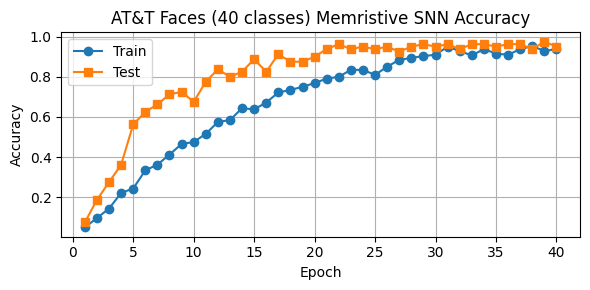

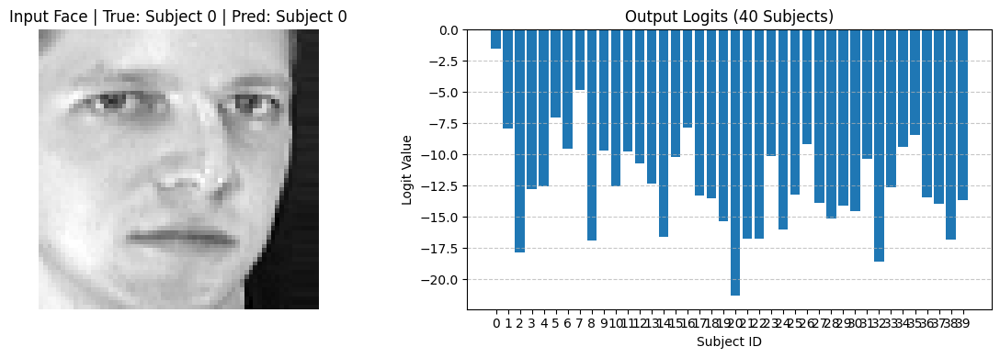

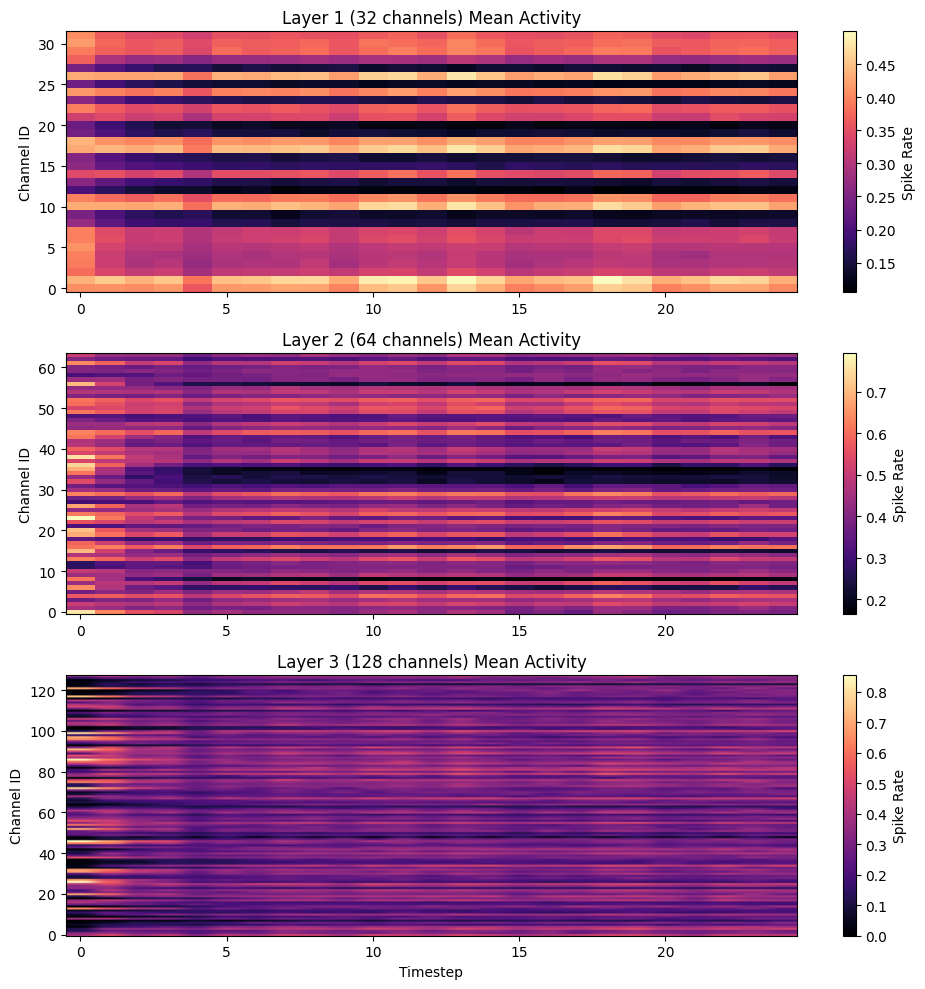

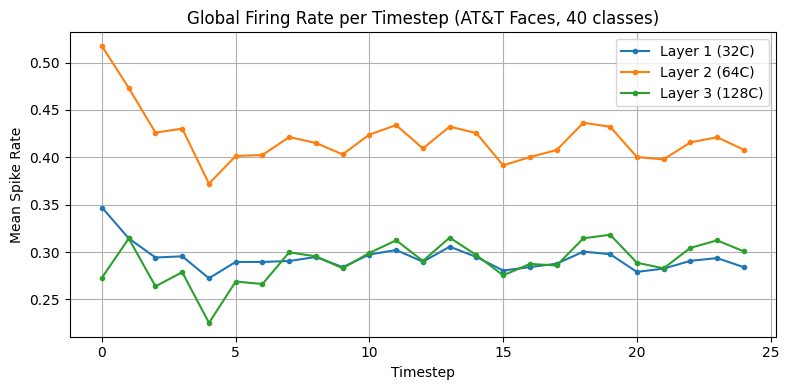

In [95]:
# =========================================================
# AT&T / Olivetti Faces (40 classes) — Visualization Block
# =========================================================

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_faces.eval()

# ---------------------------------------------------------
# Get one batch from test loader
# ---------------------------------------------------------
xb, yb = next(iter(face_test_loader))
xb = xb.to(device, non_blocking=True).float()
yb = yb.to(device, non_blocking=True).long()

sample_idx = 0

with torch.no_grad():
    spikes = poisson_encode_faces(xb, model_faces.T, rate=face_rate)
    logits = model_faces(spikes)
    preds = logits.argmax(dim=1)

# ---------------------------------------------------------
# 0) Accuracy curves
# ---------------------------------------------------------
plt.figure(figsize=(6, 3))
plt.plot(range(1, len(face_train_acc_hist) + 1), face_train_acc_hist, label="Train", marker="o")
plt.plot(range(1, len(face_test_acc_hist) + 1), face_test_acc_hist, label="Test", marker="s")
plt.title("AT&T Faces (40 classes) Memristive SNN Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# ---------------------------------------------------------
# 1) Input image + logits
# ---------------------------------------------------------
input_image = xb[sample_idx, 0].detach().cpu().numpy()
logits_np = logits[sample_idx].detach().cpu().numpy()

plt.figure(figsize=(12, 4))

# Subplot 1: Original face
plt.subplot(1, 2, 1)
plt.imshow(input_image, cmap="gray")
plt.title(
    f"Input Face | True: {FACES_CLASSES[yb[sample_idx].item()]} | "
    f"Pred: {FACES_CLASSES[preds[sample_idx].item()]}"
)
plt.axis("off")

# Subplot 2: Logits distribution
plt.subplot(1, 2, 2)
plt.bar(np.arange(len(FACES_CLASSES)), logits_np)
plt.title("Output Logits (40 Subjects)")
plt.xlabel("Subject ID")
plt.ylabel("Logit Value")
plt.xticks(np.arange(len(FACES_CLASSES)))
plt.grid(axis="y", linestyle="--", alpha=0.7)

plt.tight_layout()
plt.show()

# ---------------------------------------------------------
# 2) Internal layer activity heatmaps
# ---------------------------------------------------------
with torch.no_grad():
    # sample spikes -> [1, T, 1, 64, 64]
    x1 = spikes[sample_idx:sample_idx + 1]

    # convert to time-major [T, 1, 1, 64, 64]
    x1_T = x1.permute(1, 0, 2, 3, 4).contiguous()
    T_steps = x1_T.size(0)

    layer1_activity = torch.zeros((32, T_steps), device=device)
    layer2_activity = torch.zeros((64, T_steps), device=device)
    layer3_activity = torch.zeros((128, T_steps), device=device)

    v1, v2, v3 = None, None, None

    for t in range(T_steps):
        x_t = x1_T[t]

        # Layer 1
        u1 = model_faces.bn1(model_faces.conv1(x_t))
        spk1, v1 = model_faces.lif1(u1, v1)
        p1 = F.avg_pool2d(spk1, 2)
        layer1_activity[:, t] = spk1.mean(dim=(2, 3)).squeeze(0)

        # Layer 2
        u2 = model_faces.bn2(model_faces.conv2(p1))
        spk2, v2 = model_faces.lif2(u2, v2)
        p2 = F.avg_pool2d(spk2, 2)
        layer2_activity[:, t] = spk2.mean(dim=(2, 3)).squeeze(0)

        # Layer 3
        u3 = model_faces.bn3(model_faces.conv3(p2))
        spk3, v3 = model_faces.lif3(u3, v3)
        p3 = F.avg_pool2d(spk3, 2)
        layer3_activity[:, t] = spk3.mean(dim=(2, 3)).squeeze(0)

    layer1_np = layer1_activity.cpu().numpy()
    layer2_np = layer2_activity.cpu().numpy()
    layer3_np = layer3_activity.cpu().numpy()

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))

im1 = ax1.imshow(layer1_np, aspect="auto", origin="lower", cmap="magma")
ax1.set_title("Layer 1 (32 channels) Mean Activity")
ax1.set_ylabel("Channel ID")
fig.colorbar(im1, ax=ax1, label="Spike Rate")

im2 = ax2.imshow(layer2_np, aspect="auto", origin="lower", cmap="magma")
ax2.set_title("Layer 2 (64 channels) Mean Activity")
ax2.set_ylabel("Channel ID")
fig.colorbar(im2, ax=ax2, label="Spike Rate")

im3 = ax3.imshow(layer3_np, aspect="auto", origin="lower", cmap="magma")
ax3.set_title("Layer 3 (128 channels) Mean Activity")
ax3.set_ylabel("Channel ID")
ax3.set_xlabel("Timestep")
fig.colorbar(im3, ax=ax3, label="Spike Rate")

plt.tight_layout()
plt.show()

# ---------------------------------------------------------
# 3) Population firing rates
# ---------------------------------------------------------
plt.figure(figsize=(8, 4))
plt.plot(layer1_np.mean(axis=0), label="Layer 1 (32C)", marker=".")
plt.plot(layer2_np.mean(axis=0), label="Layer 2 (64C)", marker=".")
plt.plot(layer3_np.mean(axis=0), label="Layer 3 (128C)", marker=".")
plt.title("Global Firing Rate per Timestep (AT&T Faces, 40 classes)")
plt.xlabel("Timestep")
plt.ylabel("Mean Spike Rate")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Base prob: 0.986061692237854


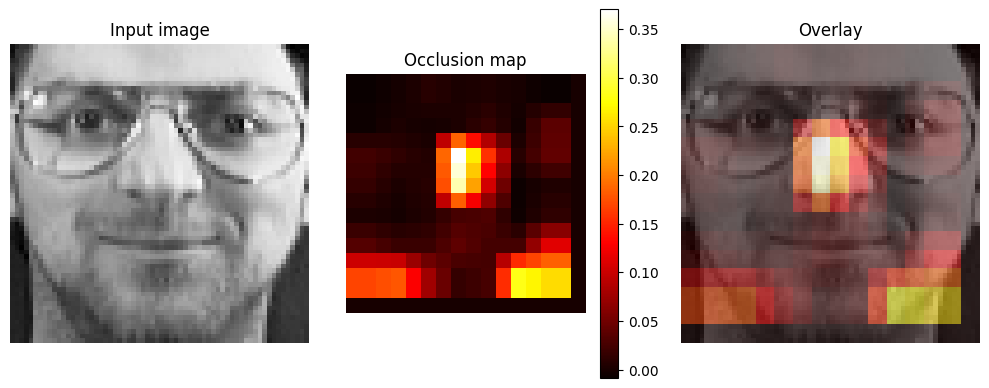

In [96]:
target_face_class = 6

idx = (y_train_tensor == target_face_class).nonzero(as_tuple=True)[0]
x_target = x_train_tensor[idx]
x_sample = x_target[0:1]

h, base_prob = occlusion_map_faces(
    model=model_faces,
    x_img=x_sample,
    target_class=target_face_class,
    device=device,
    T=model_faces.T,
    rate=face_rate,
    K=3,
    patch=12,
    stride=8,
    fill_value=0.0,
)

print("Base prob:", base_prob)

plt.figure(figsize=(10,4))

plt.subplot(1,3,1)
plt.imshow(x_sample[0,0].cpu().numpy(), cmap="gray")
plt.title("Input image")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(h.numpy(), cmap="hot")
plt.title("Occlusion map")
plt.axis("off")
plt.colorbar()

plt.subplot(1,3,3)
plt.imshow(x_sample[0,0].cpu().numpy(), cmap="gray")
plt.imshow(h.numpy(), cmap="hot", alpha=0.5)
plt.title("Overlay")
plt.axis("off")

plt.tight_layout()
plt.show()


===== Feature-Matching Inversion: NO IMAGE PRIORS =====
Target class: 36
steps=800, K=16, T=25, base_rate=0.8
xi_cls=0.05, xi_feat=220.0
No blur, no TV, no border, no mean, no symmetry, no global mean.


[Iter 0000/800]
  avg_conf        : 0.008668   best_conf=0.008668
  feat_loss       : 0.291851   best_feat=0.291851
  avg_loss        : 64.514279
  target_logit    : -0.645002
  max_other_logit : 3.633109
  sparsity/fr_mean: 0.250661 / 0.250661
  xmean           : 0.313178
  grad_norm       : 0.002219

[Iter 0025/800]
  avg_conf        : 0.005932   best_conf=0.009774
  feat_loss       : 0.274590   best_feat=0.274590
  avg_loss        : 60.742874
  target_logit    : -0.810134
  max_other_logit : 3.851863
  sparsity/fr_mean: 0.258690 / 0.258690
  xmean           : 0.323947
  grad_norm       : 0.002614

[Iter 0050/800]
  avg_conf        : 0.004241   best_conf=0.009774
  feat_loss       : 0.257920   best_feat=0.257920
  avg_loss        : 57.097089
  target_logit    : -1.048268
  max_other

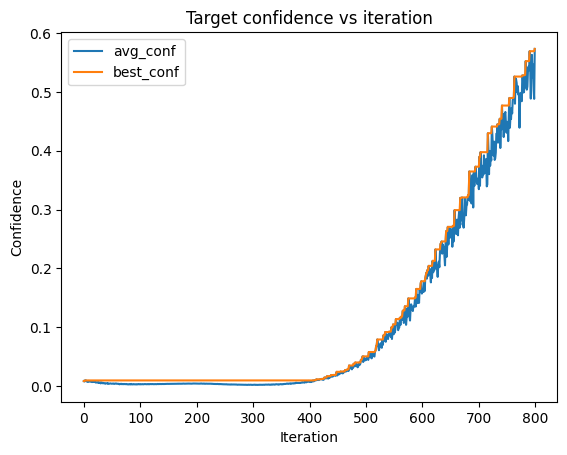

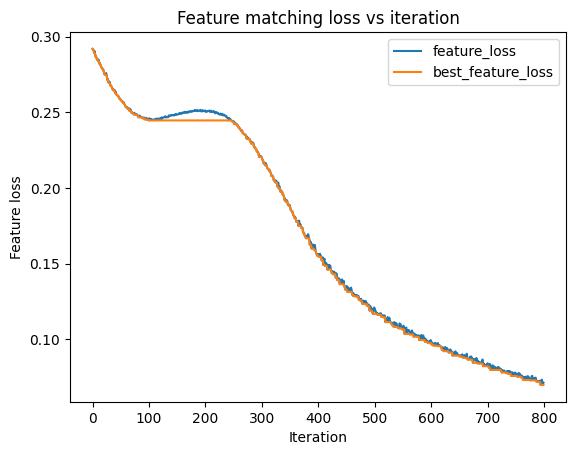

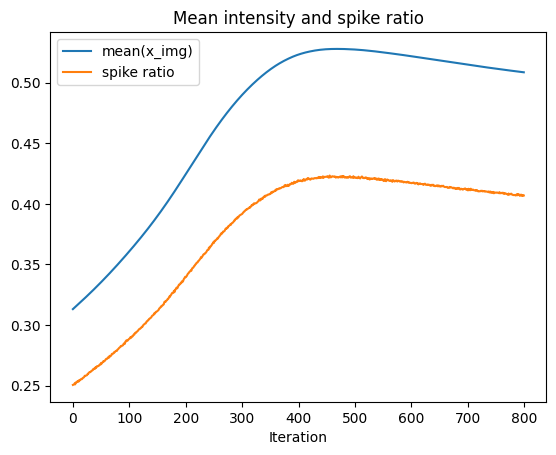

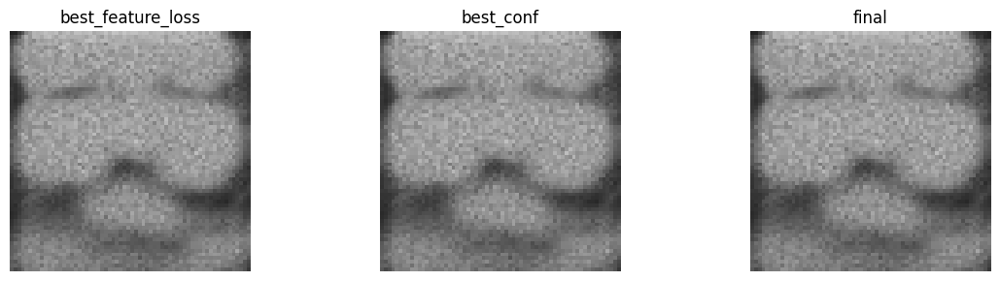

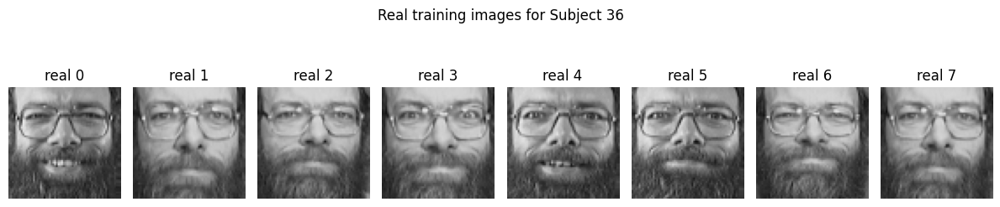

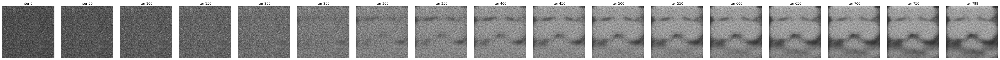

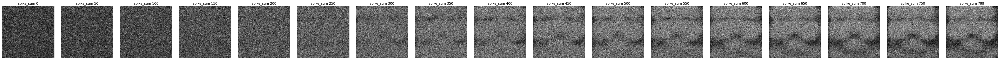

In [100]:
# =========================================================
# Feature-matching inversion — NO face init, NO image priors
# Target: Subject 36
# Keeps only: class loss + feature matching + spike-rate control
# =========================================================

import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt


def logit_margin_loss(logits, target_class, lam=1.0):
    y_logit = logits[:, target_class]
    mask = torch.ones_like(logits, dtype=torch.bool)
    mask[:, target_class] = False
    other_max = logits.masked_select(mask).view(logits.size(0), -1).max(dim=1).values
    loss = (-y_logit + lam * other_max).mean()
    return loss, y_logit.mean(), other_max.mean()


def forward_faces_with_features(model, spikes):
    B = spikes.size(0)
    T = min(model.T, spikes.size(1))
    spikes_T = spikes[:, :T].permute(1, 0, 2, 3, 4).contiguous()

    v1, v2, v3 = None, None, None
    logits_sum = torch.zeros((B, model.num_classes), device=spikes.device)

    spk1_sum, spk2_sum, spk3_sum = None, None, None

    for t in range(T):
        x_t = spikes_T[t]

        u1 = model.bn1(model.conv1(x_t))
        spk1, v1 = model.lif1(u1, v1)
        p1 = F.avg_pool2d(spk1, 2)

        u2 = model.bn2(model.conv2(p1))
        spk2, v2 = model.lif2(u2, v2)
        p2 = F.avg_pool2d(spk2, 2)

        u3 = model.bn3(model.conv3(p2))
        spk3, v3 = model.lif3(u3, v3)
        p3 = F.avg_pool2d(spk3, 2)

        logits_sum += model.fc(p3.reshape(B, -1))

        spk1_sum = spk1 if spk1_sum is None else spk1_sum + spk1
        spk2_sum = spk2 if spk2_sum is None else spk2_sum + spk2
        spk3_sum = spk3 if spk3_sum is None else spk3_sum + spk3

    logits = logits_sum / float(T)

    spk1_rate = spk1_sum / float(T)
    spk2_rate = spk2_sum / float(T)
    spk3_rate = spk3_sum / float(T)

    feats = {
        "spk1_rate_map": spk1_rate,
        "spk2_rate_map": spk2_rate,
        "spk3_rate_map": spk3_rate,
        "spk1_channel": spk1_rate.mean(dim=(2, 3)),
        "spk2_channel": spk2_rate.mean(dim=(2, 3)),
        "spk3_channel": spk3_rate.mean(dim=(2, 3)),
    }

    return logits, feats


@torch.no_grad()
def build_target_feature_prototype(
    model,
    target_class,
    x_train_tensor,
    y_train_tensor,
    device,
    T=25,
    rate=0.8,
    K=30,
):
    model.eval()
    device = torch.device(device)

    idx = (y_train_tensor == target_class).nonzero(as_tuple=True)[0]
    x_cls = x_train_tensor[idx].to(device).float()

    proto = None

    for _ in range(K):
        spikes = poisson_encode_faces(x_cls, T=T, rate=rate)
        _, feats = forward_faces_with_features(model, spikes)

        feats_mean = {k: v.mean(dim=0, keepdim=True).detach() for k, v in feats.items()}

        if proto is None:
            proto = {k: v.clone() for k, v in feats_mean.items()}
        else:
            for k in proto:
                proto[k] += feats_mean[k]

    for k in proto:
        proto[k] /= float(K)

    return proto, x_cls.detach()


def feature_matching_loss(feats, proto, use_maps=True):
    loss = 0.0

    loss += F.mse_loss(feats["spk1_channel"], proto["spk1_channel"])
    loss += F.mse_loss(feats["spk2_channel"], proto["spk2_channel"])
    loss += F.mse_loss(feats["spk3_channel"], proto["spk3_channel"])

    if use_maps:
        loss += 0.25 * F.mse_loss(feats["spk1_rate_map"], proto["spk1_rate_map"])
        loss += 0.50 * F.mse_loss(feats["spk2_rate_map"], proto["spk2_rate_map"])
        loss += 1.00 * F.mse_loss(feats["spk3_rate_map"], proto["spk3_rate_map"])

    return loss


def model_inversion_no_image_priors(
    model,
    target_class,
    device="cuda",

    steps=400,
    K=12,
    T=25,
    base_rate=0.8,

    margin_lambda=1.0,
    xi_cls=0.03,
    xi_feat=180.0,

    fr_target=0.24,
    xi_sparsity=0.20,
    xi_fr=0.30,
    xi_fr_l2=0.25,

    lr=0.003,
    grad_clip=0.8,
    seed=0,

    proto_K=30,
    log_every=25,
    snapshot_every=25,
):
    device = torch.device(device)

    torch.manual_seed(seed)
    if device.type == "cuda":
        torch.cuda.manual_seed_all(seed)

    model.eval().to(device)

    print("\n===== Feature-Matching Inversion: NO IMAGE PRIORS =====")
    print(f"Target class: {target_class}")
    print(f"steps={steps}, K={K}, T={T}, base_rate={base_rate}")
    print(f"xi_cls={xi_cls}, xi_feat={xi_feat}")
    print("No blur, no TV, no border, no mean, no symmetry, no global mean.")
    print("======================================================\n")

    proto, x_cls_real = build_target_feature_prototype(
        model=model,
        target_class=target_class,
        x_train_tensor=x_train_tensor,
        y_train_tensor=y_train_tensor,
        device=device,
        T=T,
        rate=base_rate,
        K=proto_K,
    )

    # No face initialization: random image around mid-low intensity
    z = torch.randn((1, 1, 64, 64), device=device) * 0.25 - 0.8
    z.requires_grad_(True)

    optimizer = torch.optim.Adam([z], lr=lr)

    best_feat = float("inf")
    best_conf = -1.0
    best_img_feat = None
    best_img_conf = None

    hist = {
        "loss": [],
        "conf": [],
        "best_conf": [],
        "feat_loss": [],
        "best_feat_loss": [],
        "target_logit": [],
        "max_other_logit": [],
        "sparsity": [],
        "fr_mean": [],
        "xmean": [],
        "grad_norm": [],
    }

    snapshots = []

    for it in range(steps):
        optimizer.zero_grad(set_to_none=True)

        x_img = torch.sigmoid(z)
        grad_accum = torch.zeros_like(z)

        loss_sum = 0.0
        conf_sum = 0.0
        feat_sum = 0.0
        ylogit_sum = 0.0
        otherlogit_sum = 0.0
        sparsity_sum = 0.0
        fr_mean_sum = 0.0

        for _ in range(K):
            spikes = poisson_encode_faces(x_img, T=T, rate=base_rate).detach()
            spikes.requires_grad_(True)

            logits, feats = forward_faces_with_features(model, spikes)

            L_cls, y_logit, other_logit = logit_margin_loss(
                logits, target_class=target_class, lam=margin_lambda
            )

            L_feat = feature_matching_loss(feats, proto, use_maps=True)

            sparsity = spikes.mean()
            fr_t = spikes.mean(dim=(2, 3, 4))
            fr_mean = fr_t.mean()

            sparsity_pen = sparsity ** 2
            fr_l2 = (fr_t ** 2).mean()
            fr_pen = (torch.relu(fr_t - fr_target) ** 2).mean()

            Lk = (
                xi_cls * L_cls
                + xi_feat * L_feat
                + xi_sparsity * sparsity_pen
                + xi_fr * fr_pen
                + xi_fr_l2 * fr_l2
            )

            g_spk = torch.autograd.grad(Lk, spikes, retain_graph=False, create_graph=False)[0]

            with torch.no_grad():
                g_img = g_spk.mean(dim=1) * float(base_rate)
                g_z = g_img * (x_img * (1.0 - x_img))
                grad_accum += g_z

                probs = F.softmax(logits.detach(), dim=1)
                conf_sum += float(probs[0, target_class].item())
                loss_sum += float(Lk.item())
                feat_sum += float(L_feat.item())
                ylogit_sum += float(y_logit.item())
                otherlogit_sum += float(other_logit.item())
                sparsity_sum += float(sparsity.item())
                fr_mean_sum += float(fr_mean.item())

        grad = grad_accum / float(K)

        grad_norm = grad.norm().clamp_min(1e-12)
        if grad_clip is not None and grad_clip > 0:
            grad = grad * min(1.0, grad_clip / float(grad_norm.item()))

        z.grad = grad
        optimizer.step()

        avg_conf = conf_sum / float(K)
        avg_feat = feat_sum / float(K)

        if avg_feat < best_feat:
            best_feat = avg_feat
            best_img_feat = torch.sigmoid(z.detach()).clone()

        if avg_conf > best_conf:
            best_conf = avg_conf
            best_img_conf = torch.sigmoid(z.detach()).clone()

        hist["loss"].append(loss_sum / float(K))
        hist["conf"].append(avg_conf)
        hist["best_conf"].append(best_conf)
        hist["feat_loss"].append(avg_feat)
        hist["best_feat_loss"].append(best_feat)
        hist["target_logit"].append(ylogit_sum / float(K))
        hist["max_other_logit"].append(otherlogit_sum / float(K))
        hist["sparsity"].append(sparsity_sum / float(K))
        hist["fr_mean"].append(fr_mean_sum / float(K))
        hist["xmean"].append(float(x_img.mean().item()))
        hist["grad_norm"].append(float(grad_norm.item()))

        if snapshot_every and (it % snapshot_every == 0 or it == steps - 1):
            with torch.no_grad():
                spikes_vis = poisson_encode_faces(x_img, T=T, rate=base_rate)
                spike_sum = spikes_vis.sum(dim=1)

            snapshots.append({
                "iter": it,
                "x_img": x_img.detach().cpu().clone(),
                "spike_sum": spike_sum.detach().cpu().clone(),
            })

        if it % log_every == 0 or it == steps - 1:
            print(f"\n[Iter {it:04d}/{steps}]")
            print(f"  avg_conf        : {avg_conf:.6f}   best_conf={best_conf:.6f}")
            print(f"  feat_loss       : {avg_feat:.6f}   best_feat={best_feat:.6f}")
            print(f"  avg_loss        : {hist['loss'][-1]:.6f}")
            print(f"  target_logit    : {hist['target_logit'][-1]:.6f}")
            print(f"  max_other_logit : {hist['max_other_logit'][-1]:.6f}")
            print(f"  sparsity/fr_mean: {hist['sparsity'][-1]:.6f} / {hist['fr_mean'][-1]:.6f}")
            print(f"  xmean           : {hist['xmean'][-1]:.6f}")
            print(f"  grad_norm       : {hist['grad_norm'][-1]:.6f}")

    print("\n===== Attack Finished =====")
    print(f"Best confidence: {best_conf:.6f}")
    print(f"Best feature loss: {best_feat:.6f}")
    print("===========================\n")

    return {
        "best_x_img_feat": best_img_feat,
        "best_x_img_conf": best_img_conf,
        "final_x_img": torch.sigmoid(z.detach()),
        "best_conf": best_conf,
        "best_feat_loss": best_feat,
        "history": hist,
        "snapshots": snapshots,
        "target_real_images": x_cls_real.detach(),
    }


# =========================================================
# Run attack: Subject 36
# =========================================================

target_face_class = 36

result_no_priors = model_inversion_no_image_priors(
    model=model_faces,
    target_class=36,
    device=device,

    steps=800,
    K=16,
    T=model_faces.T,
    base_rate=face_rate,

    margin_lambda=1.0,
    xi_cls=0.05,
    xi_feat=220.0,

    fr_target=0.18,
    xi_sparsity=0.60,
    xi_fr=1.00,
    xi_fr_l2=0.80,

    lr=0.002,
    grad_clip=0.6,

    proto_K=40,

    log_every=25,
    snapshot_every=50,
)

print("Best confidence:", result_no_priors["best_conf"])
print("Best feature loss:", result_no_priors["best_feat_loss"])


# =========================================================
# Plots
# =========================================================

hist = result_no_priors["history"]

plt.figure()
plt.plot(hist["conf"], label="avg_conf")
plt.plot(hist["best_conf"], label="best_conf")
plt.title("Target confidence vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Confidence")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist["feat_loss"], label="feature_loss")
plt.plot(hist["best_feat_loss"], label="best_feature_loss")
plt.title("Feature matching loss vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Feature loss")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist["xmean"], label="mean(x_img)")
plt.plot(hist["sparsity"], label="spike ratio")
plt.title("Mean intensity and spike ratio")
plt.xlabel("Iteration")
plt.legend()
plt.show()

plt.figure(figsize=(12, 3))

plt.subplot(1, 3, 1)
plt.imshow(result_no_priors["best_x_img_feat"][0, 0].detach().cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("best_feature_loss")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(result_no_priors["best_x_img_conf"][0, 0].detach().cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("best_conf")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(result_no_priors["final_x_img"][0, 0].detach().cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("final")
plt.axis("off")

plt.tight_layout()
plt.show()

real_imgs = result_no_priors["target_real_images"].detach().cpu()

plt.figure(figsize=(12, 3))
for i in range(min(8, real_imgs.size(0))):
    plt.subplot(1, min(8, real_imgs.size(0)), i + 1)
    plt.imshow(real_imgs[i, 0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"real {i}")
    plt.axis("off")

plt.suptitle(f"Real training images for Subject {target_face_class}")
plt.tight_layout()
plt.show()

snaps = result_no_priors["snapshots"]
n = len(snaps)

plt.figure(figsize=(3 * n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i + 1)
    plt.imshow(s["x_img"][0, 0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

plt.figure(figsize=(3 * n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i + 1)
    plt.imshow(s["spike_sum"][0, 0].numpy(), cmap="gray", vmin=0, vmax=float(model_faces.T))
    plt.title(f"spike_sum {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

In [113]:
# =========================================================
# AT&T / Olivetti Faces
# Fault evaluation: Accuracy vs MIA AUC vs MI leakage
# Compatible with:
# - model_faces
# - face_train_loader / face_test_loader
# - poisson_encode_faces
# - model_inversion_no_image_priors
# =========================================================

# ---------------------------------------------------------
# USER CHOICE
# ---------------------------------------------------------
faces_target_class_eval = 6
faces_attack_steps = 500
faces_attack_K = 16
faces_mia_max_batches = 40
faces_eval_mc_K = 10
faces_rate = face_rate

faces_results = []

# ---------------------------------------------------------
# Helpers
# ---------------------------------------------------------
def simple_auc(scores, labels):
    try:
        from sklearn.metrics import roc_auc_score
        return float(roc_auc_score(labels, scores))
    except Exception:
        scores = np.asarray(scores)
        labels = np.asarray(labels)

        pos = scores[labels == 1]
        neg = scores[labels == 0]

        if len(pos) == 0 or len(neg) == 0:
            return float("nan")

        wins, total = 0.0, 0.0
        for p in pos:
            wins += np.sum(p > neg) + 0.5 * np.sum(p == neg)
            total += len(neg)

        return float(wins / max(total, 1.0))


def faces_to_img4(x):
    """
    Ensures image is [1,1,64,64].
    """
    if isinstance(x, np.ndarray):
        x = torch.tensor(x).float()

    x = x.detach().float().cpu()

    if x.dim() == 2:
        x = x.unsqueeze(0).unsqueeze(0)
    elif x.dim() == 3:
        x = x.unsqueeze(0)
    elif x.dim() == 4:
        pass
    else:
        raise ValueError(f"Unexpected image shape: {tuple(x.shape)}")

    return x.clamp(0.0, 1.0)


def mse_torch_faces(a, b):
    a = faces_to_img4(a)
    b = faces_to_img4(b)
    return float(F.mse_loss(a, b).item())


def psnr_torch_faces(a, b, max_val=1.0):
    mse = mse_torch_faces(a, b)
    if mse <= 1e-12:
        return float("inf")
    return float(20.0 * np.log10(max_val) - 10.0 * np.log10(mse))


def ssim_torch_simple_faces(a, b):
    """
    Simple global SSIM approximation.
    Good enough for relative leakage comparison.
    """
    a = faces_to_img4(a)
    b = faces_to_img4(b)

    C1 = 0.01 ** 2
    C2 = 0.03 ** 2

    mu_a = a.mean()
    mu_b = b.mean()

    var_a = ((a - mu_a) ** 2).mean()
    var_b = ((b - mu_b) ** 2).mean()
    cov_ab = ((a - mu_a) * (b - mu_b)).mean()

    ssim = ((2 * mu_a * mu_b + C1) * (2 * cov_ab + C2)) / (
        (mu_a ** 2 + mu_b ** 2 + C1) * (var_a + var_b + C2)
    )

    return float(ssim.item())


def get_first_real_face_of_class(target_class, split="test"):
    if split == "train":
        x_tensor = x_train_tensor
        y_tensor = y_train_tensor
    else:
        x_tensor = x_test_tensor
        y_tensor = y_test_tensor

    idx = (y_tensor == target_class).nonzero(as_tuple=True)[0]
    if len(idx) == 0:
        raise ValueError(f"No images found for class {target_class} in {split} split.")

    return faces_to_img4(x_tensor[idx[0]])


def get_nearest_real_face(candidate_img, target_class, split="train"):
    """
    Finds nearest real image of the same class by MSE.
    """
    candidate_img = faces_to_img4(candidate_img)

    if split == "train":
        x_tensor = x_train_tensor
        y_tensor = y_train_tensor
    else:
        x_tensor = x_test_tensor
        y_tensor = y_test_tensor

    idx = (y_tensor == target_class).nonzero(as_tuple=True)[0]
    if len(idx) == 0:
        raise ValueError(f"No images found for class {target_class} in {split} split.")

    best_mse = float("inf")
    best_img = None

    for i in idx:
        img = faces_to_img4(x_tensor[i])
        mse = mse_torch_faces(candidate_img, img)

        if mse < best_mse:
            best_mse = mse
            best_img = img.clone()

    return best_img


@torch.no_grad()
def faces_target_confidence_and_pred(net, img, target_class, K=10, rate=0.8):
    """
    MC-averaged target confidence for reconstructed face image.
    """
    net.eval()
    img = faces_to_img4(img).to(device).float()

    logits_acc = 0.0

    for _ in range(K):
        spikes = poisson_encode_faces(img, net.T, rate=rate)
        logits_acc = logits_acc + net(spikes)

    logits = logits_acc / float(K)
    probs = F.softmax(logits, dim=1)

    target_conf = probs[0, target_class].item()
    pred = probs.argmax(dim=1).item()

    return float(target_conf), int(pred)


# ---------------------------------------------------------
# Spike-level fault wrappers for AT&T Faces
# ---------------------------------------------------------
def faces_spike_fault_deletion_p075(spk):
    """SpikeDeletion p=0.20"""
    return SpikeDeletion(p=0.20).apply(spk)

def faces_spike_fault_insertion_p005(spk):
    """SpikeInsertion p=0.1"""
    return SpikeInsertion(p=0.1).apply(spk)

def faces_spike_fault_timeshift_dt5(spk):
    """SpikeTimeShift dt=10"""
    return SpikeTimeShift(dt=10).apply(spk) # 2/95.5% 20/32% 10/89% 15/55% 12/78.98% //// # 5/1.25%


# ---------------------------------------------------------
# Accuracy with optional spike fault
# ---------------------------------------------------------
@torch.no_grad()
def eval_faces_accuracy_with_spikefault(
    net,
    loader,
    spike_transform=None,
    K=10,
    rate=0.8,
    max_batches=None,
):
    net.eval()
    correct, total = 0, 0

    for bi, (xb, yb) in enumerate(loader):
        if max_batches is not None and bi >= max_batches:
            break

        xb = xb.to(device).float()
        yb = yb.to(device).long()

        logits_acc = 0.0

        for _ in range(K):
            spikes = poisson_encode_faces(xb, net.T, rate=rate)

            if spike_transform is not None:
                spikes = spike_transform(spikes)

            logits_acc = logits_acc + net(spikes)

        logits = logits_acc / float(K)
        pred = logits.argmax(dim=1)

        correct += (pred == yb).sum().item()
        total += yb.numel()

    return 100.0 * correct / max(total, 1)


# ---------------------------------------------------------
# MIA AUC with optional spike fault
# Uses max-logit confidence as membership score
# ---------------------------------------------------------
@torch.no_grad()
def mia_faces_logit_auc_with_spikefault(
    net,
    train_loader,
    test_loader,
    spike_transform=None,
    max_batches=40,
    K=3,
    rate=0.8,
):
    net.eval()

    member_scores = []
    nonmember_scores = []

    for bi, (xb, yb) in enumerate(train_loader):
        if bi >= max_batches:
            break

        xb = xb.to(device).float()

        logits_acc = 0.0
        for _ in range(K):
            spikes = poisson_encode_faces(xb, net.T, rate=rate)

            if spike_transform is not None:
                spikes = spike_transform(spikes)

            logits_acc = logits_acc + net(spikes)

        logits = logits_acc / float(K)
        member_scores.extend(logits.max(dim=1).values.detach().cpu().numpy().tolist())

    for bi, (xb, yb) in enumerate(test_loader):
        if bi >= max_batches:
            break

        xb = xb.to(device).float()

        logits_acc = 0.0
        for _ in range(K):
            spikes = poisson_encode_faces(xb, net.T, rate=rate)

            if spike_transform is not None:
                spikes = spike_transform(spikes)

            logits_acc = logits_acc + net(spikes)

        logits = logits_acc / float(K)
        nonmember_scores.extend(logits.max(dim=1).values.detach().cpu().numpy().tolist())

    scores = member_scores + nonmember_scores
    labels = [1] * len(member_scores) + [0] * len(nonmember_scores)

    return simple_auc(scores, labels)


# ---------------------------------------------------------
# Run MI attack on one class and compute leakage metrics
# ---------------------------------------------------------
def evaluate_faces_mi_single_class(
    net,
    target_class=36,
    steps=800,
    K=16,
):
    attack_result = model_inversion_no_image_priors(
        model=net,
        target_class=target_class,
        device=device,

        steps=steps,
        K=K,
        T=net.T,
        base_rate=faces_rate,

        margin_lambda=1.0,
        xi_cls=0.05,
        xi_feat=220.0,

        fr_target=0.18,
        xi_sparsity=0.60,
        xi_fr=1.00,
        xi_fr_l2=0.80,

        lr=0.002,
        grad_clip=0.6,

        proto_K=40,

        log_every=100,
        snapshot_every=200,
    )

    best_img = faces_to_img4(attack_result["best_x_img_feat"])
    final_img = faces_to_img4(attack_result["final_x_img"])

    original_img = get_first_real_face_of_class(target_class, split="test")
    nearest_train_img = get_nearest_real_face(best_img, target_class, split="train")
    nearest_test_img = get_nearest_real_face(best_img, target_class, split="test")

    target_conf, pred = faces_target_confidence_and_pred(
        net,
        best_img,
        target_class,
        K=faces_eval_mc_K,
        rate=faces_rate,
    )

    asr_top1 = int(pred == target_class)

    mse_nearest_train = mse_torch_faces(best_img, nearest_train_img)
    psnr_nearest_train = psnr_torch_faces(best_img, nearest_train_img)
    ssim_nearest_train = ssim_torch_simple_faces(best_img, nearest_train_img)

    mse_nearest_test = mse_torch_faces(best_img, nearest_test_img)
    psnr_nearest_test = psnr_torch_faces(best_img, nearest_test_img)
    ssim_nearest_test = ssim_torch_simple_faces(best_img, nearest_test_img)

    mse_original = mse_torch_faces(best_img, original_img)
    psnr_original = psnr_torch_faces(best_img, original_img)
    ssim_original = ssim_torch_simple_faces(best_img, original_img)

    return {
        "mi_best_conf": float(attack_result["best_conf"]),
        "mi_target_conf": float(target_conf),
        "mi_pred_class": int(pred),
        "mi_asr_top1": int(asr_top1),

        "mi_best_feature_loss": float(attack_result["best_feat_loss"]),

        "mi_mse_nearest_train": float(mse_nearest_train),
        "mi_psnr_nearest_train": float(psnr_nearest_train),
        "mi_ssim_nearest_train": float(ssim_nearest_train),

        "mi_mse_nearest_test": float(mse_nearest_test),
        "mi_psnr_nearest_test": float(psnr_nearest_test),
        "mi_ssim_nearest_test": float(ssim_nearest_test),

        "mi_mse_original": float(mse_original),
        "mi_psnr_original": float(psnr_original),
        "mi_ssim_original": float(ssim_original),

        "mi_best_img": best_img.detach().cpu(),
        "mi_final_img": final_img.detach().cpu(),
        "mi_nearest_train_img": nearest_train_img.detach().cpu(),
        "mi_nearest_test_img": nearest_test_img.detach().cpu(),
        "mi_original_img": original_img.detach().cpu(),
    }


# ---------------------------------------------------------
# AT&T / Faces fault configurations
# Layer names match MemSNN_ReRAM_Faces_64:
# conv1, conv2, conv3, fc, bn1, bn2, bn3, lif1, lif2, lif3
# ---------------------------------------------------------
faces_fault_configs = [
    ("clean", None, None),

    # -----------------------------------------------------
    # Synaptic faults
    # -----------------------------------------------------
    ("WeightDrift_conv1_1", ("conv1", WeightDrift(delta=1.0)), None),
    ("WeightDrift_conv1_075", ("conv1", WeightDrift(delta=0.75)), None),

    ("BitFlip_conv1_bit5", ("conv1", BitFlipSynapse(bit_pos=5)), None),
    ("BitFlip_conv1_bit6", ("conv1", BitFlipSynapse(bit_pos=6)), None),

    ("WeightNoise_conv1_0.08", ("conv1", WeightNoise(std=0.08)), None),
    ("WeightNoise_conv1_0.06", ("conv1", WeightNoise(std=0.06)), None),
    ("WeightNoise_conv1_0.02", ("conv1", WeightNoise(std=0.02)), None),

    # -----------------------------------------------------
    # Neuron-level faults
    # -----------------------------------------------------
    ("ThresholdShift_lif1_1", ("lif1", ThresholdShift(scale=1.0)), None),
    ("ThresholdShift_lif1_0.5", ("lif1", ThresholdShift(scale=0.5)), None),

    ("ThresholdNoise_lif1_0.05", ("lif1", ThresholdNoise(std=0.05)), None),
    ("ThresholdNoise_lif1_0.01", ("lif1", ThresholdNoise(std=0.01)), None),

    # -----------------------------------------------------
    # Spike-level faults
    # -----------------------------------------------------
    ("SpikeDeletion_p0.75", None, faces_spike_fault_deletion_p075),
    ("SpikeInsertion_p0.05", None, faces_spike_fault_insertion_p005),
    ("SpikeTimeShift_dt5", None, faces_spike_fault_timeshift_dt5), #("SpikeTimeShift_dt5", None, f_spike_fault_A11),
]


# ---------------------------------------------------------
# Main evaluation loop
# ---------------------------------------------------------
for fault_name, layer_fault_cfg, spike_fn in faces_fault_configs:

    print("\n" + "=" * 70)
    print(f"[AT&T Faces] Evaluating fault config: {fault_name}")
    print("=" * 70)

    t0 = time.time()

    net_fault = copy.deepcopy(model_faces).to(device)
    net_fault.eval()

    # Apply layer / weight / neuron fault
    if layer_fault_cfg is not None:
        layer_name, fault_obj = layer_fault_cfg
        fi = FaultInjector(net_fault)
        fi.apply_to_layer(layer_name, fault_obj)
        print(f"Applied layer fault on: {layer_name} -> {type(fault_obj).__name__}")

    # -----------------------------------------------------
    # 1) Accuracy
    # -----------------------------------------------------
    faces_acc = eval_faces_accuracy_with_spikefault(
        net_fault,
        face_test_loader,
        spike_transform=spike_fn,
        K=faces_eval_mc_K,
        rate=faces_rate,
    )

    print(f"Accuracy: {faces_acc:.2f}%")

    # -----------------------------------------------------
    # 2) MIA AUC
    # -----------------------------------------------------
    faces_auc_logits = mia_faces_logit_auc_with_spikefault(
        net_fault,
        face_train_loader,
        face_test_loader,
        spike_transform=spike_fn,
        max_batches=faces_mia_max_batches,
        K=3,
        rate=faces_rate,
    )

    print(f"MIA logit AUC: {faces_auc_logits:.4f}")

    # -----------------------------------------------------
    # 3) Model inversion leakage
    # -----------------------------------------------------
    try:
        faces_mi_metrics = evaluate_faces_mi_single_class(
            net_fault,
            target_class=faces_target_class_eval,
            steps=faces_attack_steps,
            K=faces_attack_K,
        )

        print(f"MI best confidence:       {faces_mi_metrics['mi_best_conf']:.4f}")
        print(f"MI target confidence:     {faces_mi_metrics['mi_target_conf']:.4f}")
        print(f"MI predicted class:       {faces_mi_metrics['mi_pred_class']}")
        print(f"MI ASR top-1:             {faces_mi_metrics['mi_asr_top1']}")
        print(f"MI best feature loss:     {faces_mi_metrics['mi_best_feature_loss']:.6f}")
        print(f"MI SSIM nearest train:    {faces_mi_metrics['mi_ssim_nearest_train']:.4f}")
        print(f"MI MSE nearest train:     {faces_mi_metrics['mi_mse_nearest_train']:.4f}")
        print(f"MI PSNR nearest train:    {faces_mi_metrics['mi_psnr_nearest_train']:.4f}")

    except Exception as e:
        print(f"[WARNING] AT&T Faces MI evaluation failed for {fault_name}: {e}")

        faces_mi_metrics = {
            "mi_best_conf": np.nan,
            "mi_target_conf": np.nan,
            "mi_pred_class": np.nan,
            "mi_asr_top1": np.nan,
            "mi_best_feature_loss": np.nan,

            "mi_mse_nearest_train": np.nan,
            "mi_psnr_nearest_train": np.nan,
            "mi_ssim_nearest_train": np.nan,

            "mi_mse_nearest_test": np.nan,
            "mi_psnr_nearest_test": np.nan,
            "mi_ssim_nearest_test": np.nan,

            "mi_mse_original": np.nan,
            "mi_psnr_original": np.nan,
            "mi_ssim_original": np.nan,

            "mi_best_img": None,
            "mi_final_img": None,
            "mi_nearest_train_img": None,
            "mi_nearest_test_img": None,
            "mi_original_img": None,
        }

    elapsed = time.time() - t0
    print(f"Elapsed time: {elapsed/60:.2f} min")

    faces_results.append({
        "fault": fault_name,
        "target_class": faces_target_class_eval,
        "accuracy": faces_acc,
        "mia_auc_logits": faces_auc_logits,

        "mi_best_conf": faces_mi_metrics["mi_best_conf"],
        "mi_target_conf": faces_mi_metrics["mi_target_conf"],
        "mi_pred_class": faces_mi_metrics["mi_pred_class"],
        "mi_asr_top1": faces_mi_metrics["mi_asr_top1"],
        "mi_best_feature_loss": faces_mi_metrics["mi_best_feature_loss"],

        "mi_ssim_nearest_train": faces_mi_metrics["mi_ssim_nearest_train"],
        "mi_mse_nearest_train": faces_mi_metrics["mi_mse_nearest_train"],
        "mi_psnr_nearest_train": faces_mi_metrics["mi_psnr_nearest_train"],

        "mi_ssim_nearest_test": faces_mi_metrics["mi_ssim_nearest_test"],
        "mi_mse_nearest_test": faces_mi_metrics["mi_mse_nearest_test"],
        "mi_psnr_nearest_test": faces_mi_metrics["mi_psnr_nearest_test"],

        "mi_ssim_original": faces_mi_metrics["mi_ssim_original"],
        "mi_mse_original": faces_mi_metrics["mi_mse_original"],
        "mi_psnr_original": faces_mi_metrics["mi_psnr_original"],

        "elapsed_sec": elapsed,
    })


# ---------------------------------------------------------
# Summary table
# ---------------------------------------------------------
faces_df_results = pd.DataFrame(faces_results)

print("\n[AT&T Faces] Summary: Accuracy vs MIA AUC vs MI leakage")
display(faces_df_results.sort_values(by="mi_ssim_nearest_train", ascending=False))


# ---------------------------------------------------------
# Normalized results vs clean
# ---------------------------------------------------------

faces_df = faces_df_results.copy()
faces_clean_row = faces_df[faces_df["fault"] == "clean"].iloc[0]

faces_metrics_to_normalize = [
    "accuracy",
    "mia_auc_logits",
    "mi_best_conf",
    "mi_target_conf",
    "mi_best_feature_loss",
    "mi_ssim_nearest_train",
    "mi_mse_nearest_train",
    "mi_psnr_nearest_train",
]

faces_norm_rows = []

for _, row in faces_df.iterrows():

    norm_entry = {"fault": row["fault"]}

    for m in faces_metrics_to_normalize:
        clean_val = faces_clean_row[m]
        val = row[m]

        ratio = val / clean_val if clean_val not in [0, np.nan] and not pd.isna(clean_val) else float("nan")
        pct = (ratio - 1.0) * 100.0 if not pd.isna(ratio) else float("nan")

        norm_entry[f"{m}_ratio"] = ratio
        norm_entry[f"{m}_pct"] = pct

    faces_norm_rows.append(norm_entry)

faces_df_norm = pd.DataFrame(faces_norm_rows)

print("\n[AT&T Faces] Normalized Results vs clean")
display(faces_df_norm.sort_values(by="mi_ssim_nearest_train_ratio", ascending=False))


[AT&T Faces] Evaluating fault config: clean
Accuracy: 97.50%
MIA logit AUC: 0.5206

===== Feature-Matching Inversion: NO IMAGE PRIORS =====
Target class: 6
steps=500, K=16, T=25, base_rate=0.8
xi_cls=0.05, xi_feat=220.0
No blur, no TV, no border, no mean, no symmetry, no global mean.


[Iter 0000/500]
  avg_conf        : 0.000009   best_conf=0.000009
  feat_loss       : 0.747658   best_feat=0.747658
  avg_loss        : 165.137672
  target_logit    : -7.577820
  max_other_logit : 3.621021
  sparsity/fr_mean: 0.250661 / 0.250661
  xmean           : 0.313178
  grad_norm       : 0.004346

[Iter 0100/500]
  avg_conf        : 0.000276   best_conf=0.000276
  feat_loss       : 0.667843   best_feat=0.667843
  avg_loss        : 147.431190
  target_logit    : -3.718367
  max_other_logit : 3.795569
  sparsity/fr_mean: 0.290178 / 0.290178
  xmean           : 0.362071
  grad_norm       : 0.008848

[Iter 0200/500]
  avg_conf        : 0.001802   best_conf=0.001823
  feat_loss       : 0.623508   best_

,fault,target_class,accuracy,mia_auc_logits,mi_best_conf,mi_target_conf,mi_pred_class,mi_asr_top1,mi_best_feature_loss,mi_ssim_nearest_train,mi_mse_nearest_train,mi_psnr_nearest_train,mi_ssim_nearest_test,mi_mse_nearest_test,mi_psnr_nearest_test,mi_ssim_original,mi_mse_original,mi_psnr_original,elapsed_sec
7,WeightNoise_conv1_0.02,6,97.50,0.521523,0.056805,0.044564,5,0,0.209100,0.124826,0.027765,15.564992,0.138924,0.027080,15.673541,0.138924,0.027080,15.673541,998.063044
10,ThresholdNoise_lif1_0.05,6,56.25,0.518047,0.010096,0.009943,30,0,0.157658,0.124562,0.027588,15.592785,0.133060,0.026763,15.724593,0.133060,0.026763,15.724593,997.451992
12,SpikeDeletion_p0.75,6,35.00,0.529844,0.043587,0.031528,5,0,0.205798,0.122762,0.027863,15.549792,0.137193,0.027011,15.684530,0.137193,0.027011,15.684530,992.464826
14,SpikeTimeShift_dt5,6,0.00,0.542148,0.043587,0.031528,5,0,0.205798,0.122762,0.027863,15.549792,0.137193,0.027011,15.684530,0.137193,0.027011,15.684530,965.933556
0,clean,6,97.50,0.520586,0.043587,0.031528,5,0,0.205798,0.122762,0.027863,15.549792,0.137193,0.027011,15.684530,0.137193,0.027011,15.684530,1665.601526
13,SpikeInsertion_p0.05,6,86.25,0.520547,0.043587,0.031528,5,0,0.205798,0.122762,0.027863,15.549792,0.137193,0.027011,15.684530,0.137193,0.027011,15.684530,1001.141517
8,ThresholdShift_lif1_1,6,97.50,0.522344,0.043587,0.031528,5,0,0.205798,0.122762,0.027863,15.549792,0.137193,0.027011,15.684529,0.137193,0.027011,15.684529,993.859273
11,ThresholdNoise_lif1_0.01,6,97.50,0.535977,0.038144,0.028805,5,0,0.193849,0.120982,0.027811,15.557878,0.141892,0.026579,15.754674,0.141892,0.026579,15.754674,1020.947733
3,BitFlip_conv1_bit5,6,46.25,0.491953,0.000968,0.000676,34,0,0.198658,0.110171,0.028020,15.525387,0.113907,0.028583,15.438982,0.113907,0.028583,15.438982,994.163037
9,ThresholdShift_lif1_0.5,6,85.00,0.503789,0.050484,0.027976,35,0,0.231247,0.101168,0.028354,15.473925,0.107597,0.029156,15.352714,0.107597,0.029156,15.352714,999.803637



[AT&T Faces] Normalized Results vs clean


,fault,accuracy_ratio,accuracy_pct,mia_auc_logits_ratio,mia_auc_logits_pct,mi_best_conf_ratio,mi_best_conf_pct,mi_target_conf_ratio,mi_target_conf_pct,mi_best_feature_loss_ratio,mi_best_feature_loss_pct,mi_ssim_nearest_train_ratio,mi_ssim_nearest_train_pct,mi_mse_nearest_train_ratio,mi_mse_nearest_train_pct,mi_psnr_nearest_train_ratio,mi_psnr_nearest_train_pct
7,WeightNoise_conv1_0.02,1.000000,0.000000,1.001801,0.180086,1.303239,30.323867,1.413471,41.347139,1.016046,1.604590,1.016810,1.680963,0.996506,-0.349371,1.000977,0.097748
10,ThresholdNoise_lif1_0.05,0.576923,-42.307692,0.995123,-0.487732,0.231617,-76.838347,0.315362,-68.463793,0.766083,-23.391702,1.014664,1.466420,0.990149,-0.985059,1.002765,0.276484
12,SpikeDeletion_p0.75,0.358974,-64.102564,1.017783,1.778345,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000001,0.000055,1.000000,0.000007,1.000000,-0.000002
14,SpikeTimeShift_dt5,0.000000,-100.000000,1.041420,4.141967,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000018,1.000000,0.000007,1.000000,-0.000002
0,clean,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000
13,SpikeInsertion_p0.05,0.884615,-11.538462,0.999925,-0.007504,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000013,1.000000,-0.000004
8,ThresholdShift_lif1_1,1.000000,0.000000,1.003377,0.337660,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.999999,-0.000055,1.000000,0.000013,1.000000,-0.000004
11,ThresholdNoise_lif1_0.01,1.000000,0.000000,1.029564,2.956404,0.875108,-12.489174,0.913631,-8.636921,0.941938,-5.806230,0.985499,-1.450094,0.998140,-0.186014,1.000520,0.052001
3,BitFlip_conv1_bit5,0.474359,-52.564103,0.944999,-5.500113,0.022204,-97.779620,0.021434,-97.856639,0.965306,-3.469443,0.897433,-10.256661,1.005635,0.563549,0.998430,-0.156953
9,ThresholdShift_lif1_0.5,0.871795,-12.820513,0.967735,-3.226533,1.158216,15.821592,0.887336,-11.266448,1.123661,12.366089,0.824097,-17.590290,1.017623,1.762252,0.995121,-0.487898


In [73]:
# =========================================================
# Sanity check: does model_faces react to different inputs?
# =========================================================

model_faces.eval()

with torch.no_grad():
    x_zero = torch.zeros((1, 1, 64, 64), device=device)
    x_half = torch.full((1, 1, 64, 64), 0.5, device=device)
    x_one = torch.ones((1, 1, 64, 64), device=device)

    x_real, y_real = next(iter(face_test_loader))
    x_real = x_real[:1].to(device).float()
    y_real = y_real[:1].to(device).long()

    for name, x in [
        ("zero", x_zero),
        ("half", x_half),
        ("one", x_one),
        ("real", x_real),
    ]:
        logits_acc = 0.0
        for _ in range(10):
            spk = poisson_encode_faces(x, model_faces.T, rate=face_rate)
            logits_acc += model_faces(spk)

        logits = logits_acc / 10.0
        probs = F.softmax(logits, dim=1)

        print("\nInput:", name)
        print("Pred:", logits.argmax(1).item())
        print("Max prob:", probs.max().item())
        print("Target class 6 prob:", probs[0, 6].item())
        print("Logits mean/std:", logits.mean().item(), logits.std().item())
        print("Top-5 classes:", torch.topk(probs[0], k=5).indices.detach().cpu().tolist())
        print("Top-5 probs:", torch.topk(probs[0], k=5).values.detach().cpu().tolist())


Input: zero
Pred: 33
Max prob: 0.02815527841448784
Target class 6 prob: 0.023719031363725662
Logits mean/std: -0.005572672933340073 0.05198626220226288
Top-5 classes: [33, 21, 38, 32, 28]
Top-5 probs: [0.02815527841448784, 0.028093205764889717, 0.027844145894050598, 0.027548296377062798, 0.02710910700261593]

Input: half
Pred: 33
Max prob: 0.028199313208460808
Target class 6 prob: 0.023714814335107803
Logits mean/std: -0.014069790951907635 0.05272495001554489
Top-5 classes: [33, 32, 21, 38, 28]
Top-5 probs: [0.028199313208460808, 0.028018375858664513, 0.027987714856863022, 0.027939248830080032, 0.027029164135456085]

Input: one
Pred: 5
Max prob: 0.999729335308075
Target class 6 prob: 5.673099767733447e-10
Logits mean/std: -39.635108947753906 17.313278198242188
Top-5 classes: [5, 7, 0, 35, 6]
Top-5 probs: [0.999729335308075, 0.00019541704386938363, 7.523049134761095e-05, 9.030512870822349e-08, 5.673099767733447e-10]

Input: real
Pred: 0
Max prob: 0.6581025123596191
Target class 6 prob:

# DVS Gesture

In [11]:
# =========================
# DVS GESTURE AUTO-DOWNLOAD (Zenodo) + place for tonic version
# =========================

print("tonic version:", getattr(tonic, "__version__", "unknown"))

# -------------------------
# Config
# -------------------------
dvs_T_steps = 40 # 25
dvs_batch_size = 64

# IMPORTANT: this is the root you pass to tonic.datasets.DVSGesture(save_to=...)
dvs_save_root = "./data/DVSGesture"
os.makedirs(dvs_save_root, exist_ok=True)

# Two possible layouts used by different tonic versions:
# Layout A (newer): <save_to>/download/<tar.gz>
layoutA = os.path.join(dvs_save_root, "download")
# Layout B (older): <save_to>/DVSGesture/<tar.gz>
layoutB = os.path.join(dvs_save_root, "DVSGesture")

os.makedirs(layoutA, exist_ok=True)
os.makedirs(layoutB, exist_ok=True)

# -------------------------
# Zenodo source (public)
# -------------------------
ZENODO_RECORD = "8060604"
ZENODO_BASE = f"https://zenodo.org/records/{ZENODO_RECORD}/files"

dvs_files = {
    "ibmGestureTrain.tar.gz": {
        "md5": "3a8f0d4120a166bac7591f77409cb105",
        "url": f"{ZENODO_BASE}/ibmGestureTrain.tar.gz?download=1",
    },
    "ibmGestureTest.tar.gz": {
        "md5": "56070e45dadaa85fff82e0fbfbc06de5",
        "url": f"{ZENODO_BASE}/ibmGestureTest.tar.gz?download=1",
    },
}

def _md5(path, chunk_size=8 * 1024 * 1024):
    h = hashlib.md5()
    with open(path, "rb") as f:
        while True:
            b = f.read(chunk_size)
            if not b:
                break
            h.update(b)
    return h.hexdigest()

def _download_stream(url, out_path, retries=5, chunk_size=8 * 1024 * 1024):
    headers = {"User-Agent": "Mozilla/5.0 (compatible; dvs-downloader/1.0)"}
    tmp = out_path + ".part"
    if os.path.exists(tmp):
        os.remove(tmp)

    last_err = None
    for attempt in range(1, retries + 1):
        try:
            with requests.get(url, stream=True, headers=headers, timeout=60, allow_redirects=True) as r:
                r.raise_for_status()
                total = r.headers.get("Content-Length")
                total = int(total) if total is not None else None

                downloaded = 0
                with open(tmp, "wb") as f:
                    for chunk in r.iter_content(chunk_size=chunk_size):
                        if not chunk:
                            continue
                        f.write(chunk)
                        downloaded += len(chunk)
                        if total:
                            pct = 100.0 * downloaded / total
                            print(f"\rDownloading {os.path.basename(out_path)}: {pct:6.2f}% ", end="")
                        else:
                            mb = downloaded / (1024 * 1024)
                            print(f"\rDownloading {os.path.basename(out_path)}: {mb:8.1f} MB ", end="")
            print()
            if os.path.getsize(tmp) == 0:
                raise RuntimeError("Downloaded file is empty (0 bytes).")
            os.replace(tmp, out_path)
            return
        except Exception as e:
            last_err = e
            if os.path.exists(tmp):
                os.remove(tmp)
            print(f"Attempt {attempt}/{retries} failed: {e}")
            time.sleep(min(10, 2 * attempt))

    raise RuntimeError(f"Could not download from {url}. Last error: {last_err}")

def ensure_file(fname, spec):
    # We will keep a canonical copy in layoutA, then mirror to layoutB
    canonical = os.path.join(layoutA, fname)

    if os.path.exists(canonical) and _md5(canonical) == spec["md5"]:
        print(f"{fname} already present (canonical, md5 OK).")
    else:
        if os.path.exists(canonical):
            print(f"{fname} exists but md5 mismatch. Re-downloading.")
            os.remove(canonical)
        print(f"⬇Fetching {fname} from Zenodo...")
        _download_stream(spec["url"], canonical)
        got = _md5(canonical)
        if got != spec["md5"]:
            os.remove(canonical)
            raise RuntimeError(f"MD5 mismatch for {fname}. got={got}, expected={spec['md5']}")
        print(f"Downloaded {fname} (md5 OK).")

    # Mirror to layoutB for older tonic versions
    mirror = os.path.join(layoutB, fname)
    if not os.path.exists(mirror) or _md5(mirror) != spec["md5"]:
        shutil.copy2(canonical, mirror)
        print(f"Copied {fname} -> {layoutB}")

for fname, spec in dvs_files.items():
    ensure_file(fname, spec)

print("\nFiles now located at:")
print(" -", layoutA)
print(" -", layoutB)

# -------------------------
# Transforms
# -------------------------
dvs_sensor_size_native = tonic.datasets.DVSGesture.sensor_size  # (128,128,2)
target_hw = (48, 48) # (28, 28)
dvs_sensor_size = (target_hw[0], target_hw[1], 2)

dvs_transform = tonic_T.Compose([
    tonic_T.Downsample(sensor_size=dvs_sensor_size_native, target_size=target_hw),
    tonic_T.ToFrame(sensor_size=dvs_sensor_size, n_time_bins=dvs_T_steps),
])

# -------------------------
# Dataset (should NOT download now)
# -------------------------
dvs_train_dataset_full = tonic.datasets.DVSGesture(
    save_to=dvs_save_root,
    train=True,
    transform=dvs_transform
)
dvs_test_dataset_full = tonic.datasets.DVSGesture(
    save_to=dvs_save_root,
    train=False,
    transform=dvs_transform
)

def dvs_collate_fn(batch):
    frames, labels = zip(*batch)
    frames = torch.stack([torch.as_tensor(f) for f in frames], dim=0)   # (B, T, C, H, W)
    labels = torch.as_tensor(labels, dtype=torch.long)
    frames = frames.transpose(0, 1).contiguous()                        # (T, B, C, H, W)
    return frames, labels

dvs_train_loader = DataLoader(
    dvs_train_dataset_full,
    batch_size=dvs_batch_size,
    shuffle=True,
    num_workers=4,
    pin_memory=True,
    collate_fn=dvs_collate_fn
)

dvs_test_loader = DataLoader(
    dvs_test_dataset_full,
    batch_size=dvs_batch_size,
    shuffle=False,
    num_workers=4,
    pin_memory=True,
    collate_fn=dvs_collate_fn
)

print(f"\nDVS Gesture loaded. Train size: {len(dvs_train_dataset_full)}, Test size: {len(dvs_test_dataset_full)}")
print(f"Native sensor_size: {dvs_sensor_size_native}, Using: {dvs_sensor_size}, T={dvs_T_steps}")

tonic version: 1.6.0
ibmGestureTrain.tar.gz already present (canonical, md5 OK).
ibmGestureTest.tar.gz already present (canonical, md5 OK).

Files now located at:
 - ./data/DVSGesture\download
 - ./data/DVSGesture\DVSGesture

DVS Gesture loaded. Train size: 1077, Test size: 264
Native sensor_size: (128, 128, 2), Using: (48, 48, 2), T=40


In [13]:
# Use num_workers=0 on Windows for stability (especially with tonic + custom collate)
dvs_num_workers = 0
dvs_device = "cuda" if torch.cuda.is_available() else "cpu"
dvs_pin_memory = (dvs_device == "cuda")  # only pin on CUDA

dvs_train_loader = DataLoader(
    dvs_train_dataset_full,
    batch_size=dvs_batch_size,
    shuffle=True,
    num_workers=dvs_num_workers,
    pin_memory=dvs_pin_memory,
    collate_fn=dvs_collate_fn
)

dvs_test_loader = DataLoader(
    dvs_test_dataset_full,
    batch_size=dvs_batch_size,
    shuffle=False,
    num_workers=dvs_num_workers,
    pin_memory=dvs_pin_memory,
    collate_fn=dvs_collate_fn
)

class DVS_MemSNN_ReRAM(nn.Module):
    def __init__(self, T=25):
        super().__init__()
        self.T = T

        # Same physical model approach as Fashion-MNIST (isolated instance)
        self.dvs_reram_device = ReRAMAnalogDevice_IBMClone()

        # DVS input has 2 channels (ON/OFF polarities)
        self.dvs_conv1 = ReRAMConv2d_IBMClone(2, 32, k=5, device_model=self.dvs_reram_device, gain=2000)
        self.dvs_bn1 = nn.BatchNorm2d(32, momentum=0.05)
        self.dvs_lif1 = LIF_Pro(tau=5.0, v_th=0.15)

        self.dvs_conv2 = ReRAMConv2d_IBMClone(32, 64, k=5, device_model=self.dvs_reram_device, gain=350)
        self.dvs_bn2 = nn.BatchNorm2d(64, momentum=0.05)
        self.dvs_lif2 = LIF_Pro(tau=5.0, v_th=0.50)

        self.dvs_flat_size = 64 * 12 * 12  # = 9216
        self.dvs_fc = ReRAMLinear_IBMClone(self.dvs_flat_size, 11, device_model=self.dvs_reram_device, gain=2500)
        

        # DVS input has 2 channels (ON/OFF polarities)
        #self.dvs_conv1 = ReRAMConv2d_IBMClone(2, 32, k=5, device_model=self.dvs_reram_device, gain=2000)
        #self.dvs_bn1 = nn.BatchNorm2d(32, momentum=0.05)
        #self.dvs_lif1 = LIF_Pro(tau=5.0, v_th=0.15)

        #self.dvs_conv2 = ReRAMConv2d_IBMClone(32, 64, k=5, device_model=self.dvs_reram_device, gain=350)
        #self.dvs_bn2 = nn.BatchNorm2d(64, momentum=0.05)
        #self.dvs_lif2 = LIF_Pro(tau=5.0, v_th=0.50)

        # We'll infer flat size once (works for 28x28 or 48x48)
        #self.dvs_fc = None
        #self.dvs_num_classes = 11
        #self.dvs_fc_gain = 2500

    def forward(self, spikes, debug=False):
        """
        spikes: (T, B, C, H, W) where C=2 for DVS.
        """
        T = self.T
        B = spikes.size(1)
        v1 = v2 = None

        dvs_logits_sum = torch.zeros((B, 11), device=spikes.device)

        for t in range(T):
            # x = spikes[t].float()  # frames can come as int counts; float is safer for conv/bn
            x = spikes[t].float()
            # per-sample normalization (robust)
            x = x / (x.amax(dim=(1,2,3), keepdim=True) + 1e-6)

            # Layer 1
            u1 = self.dvs_bn1(self.dvs_conv1(x))
            spk1, v1 = self.dvs_lif1(u1, v1)
            s1p = F.avg_pool2d(spk1, 2)

            # Layer 2
            u2 = self.dvs_bn2(self.dvs_conv2(s1p))
            spk2, v2 = self.dvs_lif2(u2, v2)
            s2p = F.avg_pool2d(spk2, 2)

            # Readout
            flat = s2p.view(B, -1)
            dvs_logits_sum += self.dvs_fc(flat)
            #flat = s2p.view(B, -1)

            # ---- Lazy initialization of FC layer ----
            #if self.dvs_fc is None:
            #    self.dvs_flat_size = flat.size(1)
            #    self.dvs_fc = ReRAMLinear_IBMClone(
            #        self.dvs_flat_size,
            #        self.dvs_num_classes,
            #        device_model=self.dvs_reram_device,
            #        gain=self.dvs_fc_gain
            #    ).to(flat.device)

            #dvs_logits_sum += self.dvs_fc(flat)

        return dvs_logits_sum / float(T)

print("DVS Model Architecture (DVS_MemSNN_ReRAM) Ready.")

# CONFIGURATION (DVS)
dvs_use_amp = True

dvs_model = DVS_MemSNN_ReRAM(T=dvs_T_steps).to(dvs_device)
dvs_optimizer = torch.optim.Adam(dvs_model.parameters(), lr=1e-3, weight_decay=1e-4) # 5e-4
dvs_scheduler = torch.optim.lr_scheduler.MultiStepLR(dvs_optimizer, milestones=[5, 10], gamma=0.5)
# dvs_scaler = torch.amp.GradScaler(device_type='cuda', enabled=dvs_use_amp) # dvs_scaler = torch.amp.GradScaler(device_type='cuda', enabled=dvs_use_amp)
# dvs_scaler = torch.cuda.amp.GradScaler(enabled=dvs_use_amp)
dvs_scaler = torch.amp.GradScaler("cuda", enabled=dvs_use_amp)
def dvs_evaluate(model, loader):
    model.eval()
    dvs_correct, dvs_total = 0, 0
    with torch.no_grad():
        for dvs_spikes, yb in loader:
            dvs_spikes = dvs_spikes.to(dvs_device, non_blocking=True)  # (T,B,C,H,W)
            yb = yb.to(dvs_device, non_blocking=True)

            # with torch.amp.autocast(device_type='cuda', enabled=dvs_use_amp): #  with torch.cuda.amp.autocast(enabled=dvs_use_amp):
            with torch.amp.autocast("cuda", enabled=dvs_use_amp):
                dvs_logits = model(dvs_spikes)

            dvs_correct += (dvs_logits.argmax(1) == yb).sum().item()
            dvs_total += yb.size(0)

    return dvs_correct / dvs_total

DVS Model Architecture (DVS_MemSNN_ReRAM) Ready.


In [14]:
# TRAINING LOOP (DVS)
dvs_epochs = 15
dvs_train_acc_hist, dvs_test_acc_hist = [], []

print(f"Starting Training on {dvs_device} with DVS Gesture (Memristor SNN)...")

for epoch in range(1, dvs_epochs + 1):
    dvs_model.train()
    dvs_correct, dvs_total, dvs_loss_sum = 0, 0, 0.0

    for i, (dvs_spikes, yb) in enumerate(dvs_train_loader):
        dvs_spikes = dvs_spikes.to(dvs_device, non_blocking=True)  # (T,B,C,H,W) milestones 1e-3
        yb = yb.to(dvs_device, non_blocking=True)

        dvs_optimizer.zero_grad(set_to_none=True)

        with torch.amp.autocast("cuda", enabled=dvs_use_amp):
            dvs_logits = dvs_model(dvs_spikes)
            dvs_loss = F.cross_entropy(dvs_logits, yb)

        dvs_scaler.scale(dvs_loss).backward()
        dvs_scaler.unscale_(dvs_optimizer)
        torch.nn.utils.clip_grad_norm_(dvs_model.parameters(), 1.0)
        dvs_scaler.step(dvs_optimizer)
        dvs_scaler.update()

        with torch.no_grad():
            dvs_correct += (dvs_logits.argmax(1) == yb).sum().item()
            dvs_total += yb.size(0)
            dvs_loss_sum += dvs_loss.item() * yb.size(0)

        if (i + 1) % 50 == 0:
            print(f"Epoch {epoch}, Step {i+1}/{len(dvs_train_loader)}, Loss: {dvs_loss.item():.4f}")

    dvs_scheduler.step()
    dvs_train_acc = dvs_correct / dvs_total
    dvs_test_acc = dvs_evaluate(dvs_model, dvs_test_loader)

    dvs_train_acc_hist.append(dvs_train_acc)
    dvs_test_acc_hist.append(dvs_test_acc)

    print(f"==> Epoch {epoch}: Train Acc={dvs_train_acc*100:.2f}%, Test Acc={dvs_test_acc*100:.2f}%")

Starting Training on cuda with DVS Gesture (Memristor SNN)...
==> Epoch 1: Train Acc=32.31%, Test Acc=53.79%
==> Epoch 2: Train Acc=52.00%, Test Acc=53.79%
==> Epoch 3: Train Acc=52.27%, Test Acc=57.20%
==> Epoch 4: Train Acc=54.69%, Test Acc=56.82%
==> Epoch 5: Train Acc=58.03%, Test Acc=59.47%
==> Epoch 6: Train Acc=62.77%, Test Acc=58.71%
==> Epoch 7: Train Acc=60.72%, Test Acc=61.36%
==> Epoch 8: Train Acc=61.65%, Test Acc=65.91%
==> Epoch 9: Train Acc=60.63%, Test Acc=66.67%
==> Epoch 10: Train Acc=66.95%, Test Acc=62.50%
==> Epoch 11: Train Acc=63.79%, Test Acc=65.91%
==> Epoch 12: Train Acc=66.95%, Test Acc=68.94%
==> Epoch 13: Train Acc=65.74%, Test Acc=68.94%
==> Epoch 14: Train Acc=66.20%, Test Acc=68.56%
==> Epoch 15: Train Acc=68.52%, Test Acc=62.50%


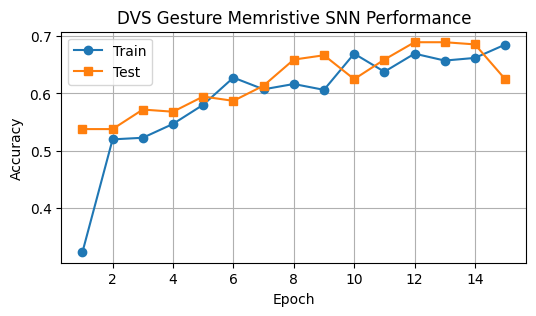

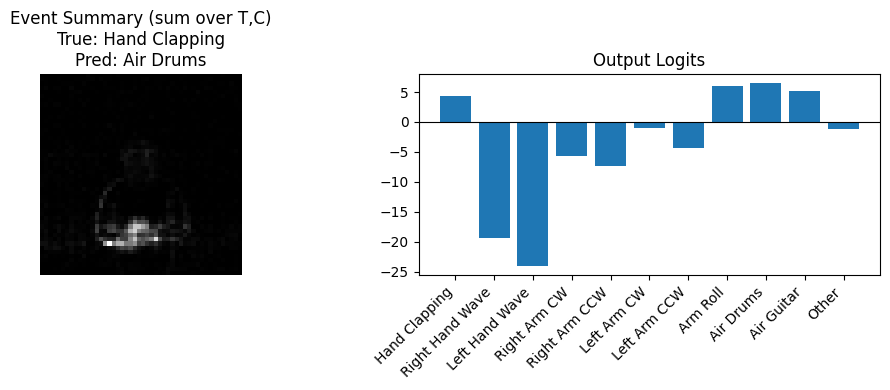

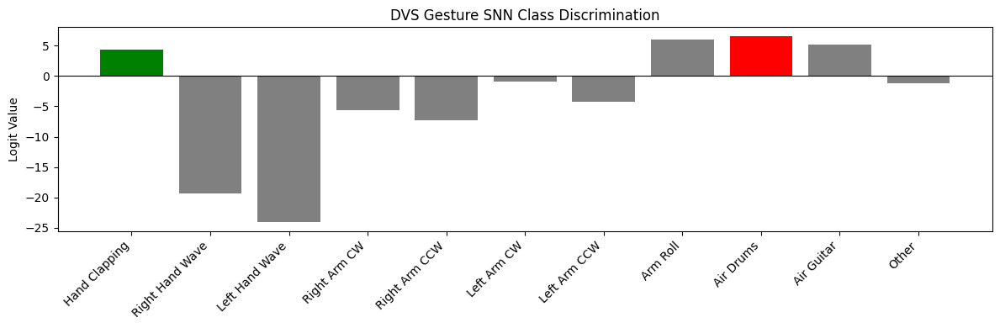

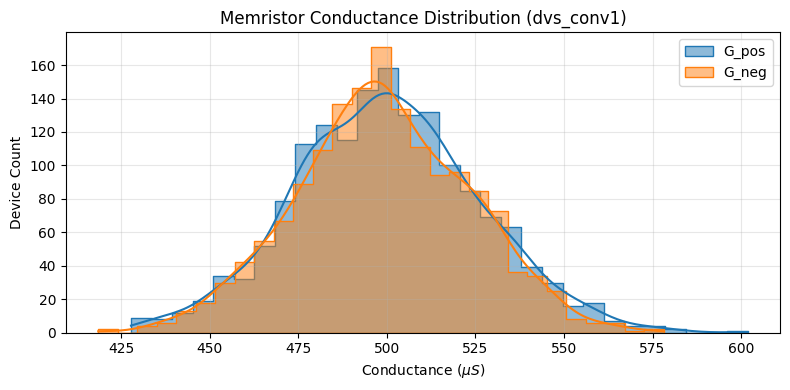

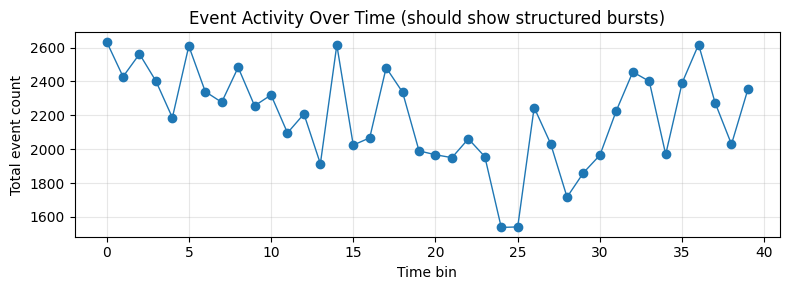

In [15]:
# =========================
# DVS Gesture – Visualization Cell (curves + inference + memristor diagnostics + "video")
# =========================

# ---------- 0) DVS Gesture class labels ----------
# Common mapping used with DVS128 Gesture (11 classes)
dvs_class_names = [
    "Hand Clapping",
    "Right Hand Wave",
    "Left Hand Wave",
    "Right Arm CW",
    "Right Arm CCW",
    "Left Arm CW",
    "Left Arm CCW",
    "Arm Roll",
    "Air Drums",
    "Air Guitar",
    "Other"
]

# ---------- 1) Accuracy curves ----------
plt.figure(figsize=(6, 3))
plt.plot(range(1, len(dvs_train_acc_hist) + 1), dvs_train_acc_hist, label="Train", marker="o")
plt.plot(range(1, len(dvs_test_acc_hist) + 1), dvs_test_acc_hist, label="Test", marker="s")
plt.title("DVS Gesture Memristive SNN Performance")
plt.xlabel("Epoch"); plt.ylabel("Accuracy"); plt.legend(); plt.grid(True); plt.show()

# ---------- 2) Inference visualization (single sample + logits) ----------
dvs_model.eval()
dvs_spikes, dvs_yb = next(iter(dvs_test_loader))          # dvs_spikes: (T,B,C,H,W)
dvs_spikes = dvs_spikes.to(dvs_device, non_blocking=True)
dvs_yb = dvs_yb.to(dvs_device, non_blocking=True)

with torch.no_grad():
    dvs_logits = dvs_model(dvs_spikes)                     # (B, 11)
    dvs_pred = dvs_logits.argmax(1)

dvs_idx = 0  # change this to inspect other samples
true_name = dvs_class_names[dvs_yb[dvs_idx].item()]
pred_name = dvs_class_names[dvs_pred[dvs_idx].item()]

# Show a summary "image" of the event frames (sum over time and polarity)
# This is useful to quickly see if the sample looks meaningful.
frames_tbchw = dvs_spikes[:, dvs_idx].detach().cpu().float()       # (T,C,H,W)
summed = frames_tbchw.sum(dim=0)                                  # (C,H,W)
summed_img = summed.sum(dim=0)                                    # (H,W)

plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.imshow(summed_img, cmap="gray")
plt.title(f"Event Summary (sum over T,C)\nTrue: {true_name}\nPred: {pred_name}")
plt.axis("off")

plt.subplot(1, 2, 2)
logits_np = dvs_logits[dvs_idx].detach().cpu().numpy()
plt.bar(range(len(dvs_class_names)), logits_np)
plt.title("Output Logits")
plt.xticks(range(len(dvs_class_names)), dvs_class_names, rotation=45, ha="right")
plt.axhline(0, color="black", linewidth=0.8)
plt.tight_layout()
plt.show()

# Improved logit plot (highlight true/pred)
plt.figure(figsize=(12, 4))
colors = ["gray"] * len(dvs_class_names)
colors[dvs_yb[dvs_idx].item()] = "green"
if dvs_pred[dvs_idx].item() != dvs_yb[dvs_idx].item():
    colors[dvs_pred[dvs_idx].item()] = "red"
else:
    colors[dvs_pred[dvs_idx].item()] = "green"

plt.bar(dvs_class_names, logits_np, color=colors)
plt.title("DVS Gesture SNN Class Discrimination")
plt.ylabel("Logit Value")
plt.xticks(rotation=45, ha="right")
plt.axhline(0, color="black", linewidth=0.8)
plt.tight_layout()
plt.show()

# ---------- 3) Hardware diagnostic: conductance distribution (conv1) ----------
# Works if your ReRAMConv2d_IBMClone exposes W_pos/W_neg (as in your Fashion-MNIST cell)
try:
    import seaborn as sns  # optional (only used for prettier histogram)
    with torch.no_grad():
        g_pos_phys, _ = dvs_model.dvs_reram_device.logical_to_conductance(dvs_model.dvs_conv1.W_pos)
        g_neg_phys, _ = dvs_model.dvs_reram_device.logical_to_conductance(dvs_model.dvs_conv1.W_neg)
        g_pos_plot = g_pos_phys.detach().cpu().flatten().numpy() * 1e6  # μS
        g_neg_plot = g_neg_phys.detach().cpu().flatten().numpy() * 1e6  # μS

    plt.figure(figsize=(8, 4))
    sns.histplot(g_pos_plot, label="G_pos", kde=True, element="step")
    sns.histplot(g_neg_plot, label="G_neg", kde=True, element="step")
    plt.title("Memristor Conductance Distribution (dvs_conv1)")
    plt.xlabel("Conductance ($\\mu S$)")
    plt.ylabel("Device Count")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()
except Exception as e:
    print("Conductance distribution plot skipped (missing attributes or seaborn).")
    print("Reason:", e)

# ---------- 4) Video-style visualization of the DVS frames ----------
#Interactive animation (matplotlib). Works in many Jupyter setups.
# If it doesn't render, Option B saves a GIF/MP4 to disk.

T_vis = min(frames_tbchw.shape[0], 80)  # limit frames to keep it responsive
frames_vis = frames_tbchw[:T_vis]       # (T,C,H,W)

# Convert each time bin into a display frame:
# show ON - OFF (polarity contrast) so motion pops out
on = frames_vis[:, 0]
off = frames_vis[:, 1]
vid = (on - off).numpy()                # (T,H,W)

# Normalize for display
vmin, vmax = np.percentile(vid, 2), np.percentile(vid, 98)
if vmax <= vmin:
    vmin, vmax = float(vid.min()), float(vid.max()) + 1e-6

fig, ax = plt.subplots(figsize=(4, 4))
im = ax.imshow(vid[0], cmap="gray", vmin=vmin, vmax=vmax)
ax.set_title(f"DVS Frames (ON-OFF) | True: {true_name} | Pred: {pred_name}")
ax.axis("off")

def _update(frame_idx):
    im.set_array(vid[frame_idx])
    ax.set_xlabel(f"t = {frame_idx+1}/{T_vis}")
    return (im,)

ani = animation.FuncAnimation(fig, _update, frames=T_vis, interval=60, blit=True)

# Try inline HTML animation (best UX in notebook)
try:
    display(HTML(ani.to_jshtml()))
except Exception as e:
    print("Inline animation failed; saving GIF instead. Reason:", e)
    out_gif = "dvs_sample.gif"
    ani.save(out_gif, writer="pillow", fps=15)
    print(f"Saved: {out_gif} (open it to view the DVS 'video').")

plt.close(fig)

# ---------- 5) Optional: quick check if the target looks "good" ----------
# Heuristic: more active frames should correspond to meaningful gestures.
activity_per_t = frames_vis.sum(dim=(1,2,3)).numpy()  # total event count per time bin
plt.figure(figsize=(8, 3))
plt.plot(activity_per_t, marker="o", linewidth=1)
plt.title("Event Activity Over Time (should show structured bursts)")
plt.xlabel("Time bin")
plt.ylabel("Total event count")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [16]:
# =========================
#   DVS Model Inversion (EOT+STE) aligned with your training-time normalization
#   Additions to CLEAN artifacts (e.g., "stuff above the person"):
#   - ROI penalty: penalize activity OUTSIDE a central region
#   - Temporal acceleration penalty: penalize flicker/alternating shortcuts (2nd derivative)
#   - Spatial density penalty: discourages "one weird blob" + empty elsewhere
#
#   Still keeps:
#   - init_bias for sparse start
#   - training-time normalization before model forward
#   - AMP on CUDA
#   - margin metric in history
# =========================

# -------------------------
# DVS Bernoulli encoding (spatiotemporal)
# -------------------------
def dvs_bernoulli_rate_encode(rates: torch.Tensor, base_rate: float = 1.0) -> torch.Tensor:
    """
    Bernoulli (rate) encoding for DVS clips.
      rates: [T,1,2,H,W] in [0,1]
      returns spikes: [T,1,2,H,W] in {0,1}
    Probability per voxel: p = clamp(rates * base_rate, 0, 1)
    """
    rates = rates.clamp(0.0, 1.0)
    p = (rates * base_rate).clamp(0.0, 1.0)
    rand = torch.rand_like(p)
    return (rand < p).float()

# -------------------------
# Margin-based objective (avoids softmax saturation)
# -------------------------
def logit_margin_loss(logits: torch.Tensor, target_class: int, lam: float = 1.0):
    """
    Margin loss:
        L = -logit_y + lam * max_{j!=y} logit_j
    Returns:
        L (scalar), mean target logit, mean max-other logit
    """
    y_logit = logits[:, target_class]
    mask = torch.ones_like(logits, dtype=torch.bool)
    mask[:, target_class] = False
    other_max = logits.masked_select(mask).view(logits.size(0), -1).max(dim=1).values
    L = (-y_logit + lam * other_max).mean()
    return L, y_logit.mean(), other_max.mean()

# -------------------------
# Priors (generic + DVS-specific)
# -------------------------
def tv_smoothness_penalty_2d(x: torch.Tensor) -> torch.Tensor:
    """
    Total variation penalty on spatial dimensions.
      x: [..., H, W]
    """
    dh = (x[..., 1:, :] - x[..., :-1, :]).abs().mean()
    dw = (x[..., :, 1:] - x[..., :, :-1]).abs().mean()
    return dh + dw

def blur_prior_penalty_2d(x: torch.Tensor, k: int = 3) -> torch.Tensor:
    """
    Blur prior to suppress high-frequency textures.
      x: [T,1,2,H,W]
    Penalty: ||x - blur(x)||^2 (spatial blur per frame/polarity)
    """
    pad = k // 2
    Tt, B, C, H, W = x.shape
    x2 = x.view(Tt * B * C, 1, H, W)
    x_blur = F.avg_pool2d(x2, kernel_size=k, stride=1, padding=pad)
    x_blur = x_blur.view(Tt, B, C, H, W)
    return ((x - x_blur) ** 2).mean()

def temporal_smoothness_penalty(x: torch.Tensor) -> torch.Tensor:
    """
    Temporal smoothness (reduce flicker).
      x: [T,1,2,H,W]
    Penalty: mean |x[t] - x[t-1]|
    """
    return (x[1:] - x[:-1]).abs().mean()

def temporal_accel_penalty(x: torch.Tensor) -> torch.Tensor:
    """
    Stronger anti-flicker prior: penalize 2nd temporal derivative.
      x: [T,1,2,H,W]
    Penalty: mean |x[t+1] - 2x[t] + x[t-1]|
    """
    if x.size(0) < 3:
        return torch.zeros((), device=x.device, dtype=x.dtype)
    return (x[2:] - 2.0 * x[1:-1] + x[:-2]).abs().mean()

def spatial_roi_penalty(rates: torch.Tensor, roi=(0.20, 0.95, 0.10, 0.90)) -> torch.Tensor:
    """
    Penalize activity outside a central ROI.
    roi = (y0,y1,x0,x1) fractions of H,W.
    rates: [T,1,2,H,W]
    """
    _, _, _, H, W = rates.shape
    y0, y1, x0, x1 = roi
    y0i, y1i = int(y0 * H), int(y1 * H)
    x0i, x1i = int(x0 * W), int(x1 * W)

    mask = torch.ones((H, W), device=rates.device, dtype=rates.dtype)
    mask[y0i:y1i, x0i:x1i] = 0.0
    mask = mask.view(1, 1, 1, H, W)
    return (rates * mask).mean()

def spatial_density_penalty(rates: torch.Tensor, target_density: float = 0.03) -> torch.Tensor:
    """
    Encourage reasonable spatial density:
      - dens_hw: average over (T,B,C) -> [H,W]
      - penalize: (mean - target)^2 + variance (avoid isolated blobs)
    """
    dens_hw = rates.mean(dim=(0, 1, 2))  # [H,W]
    return (dens_hw.mean() - target_density) ** 2 + dens_hw.var(unbiased=False)

# -------------------------
# Helper: match your model's training-time input normalization
# -------------------------
def dvs_normalize_like_training(spikes: torch.Tensor) -> torch.Tensor:
    """
    Your model.forward() does:
        x = x / (x.amax(dim=(1,2,3), keepdim=True) + 1e-6)
    Here spikes is [T,1,2,H,W], so normalize per (t, batch).
    """
    denom = spikes.amax(dim=(2, 3, 4), keepdim=True).clamp_min(1e-6)  # (T,1,1,1,1)
    return spikes / denom

# -------------------------
# Full inversion attack for DVS clips: EOT + STE + priors
# -------------------------
def model_inversion_attack_dvs_eot_ste_full_noproto(
    model: nn.Module,
    target_class: int,
    device="cuda",

    # Clip geometry
    T: int = 40,
    H: int = 48,
    W: int = 48,

    # Core attack settings
    steps: int = 1200,
    K: int = 16,
    base_rate: float = 1.0,

    # Main objective
    margin_lambda: float = 1.0,

    # Spike/activity controls
    fr_target: float = 0.10,
    xi_sparsity: float = 0.05,
    xi_fr: float = 0.05,
    xi_fr_l2: float = 0.05,

    # Priors (Stage 1)
    xi_tv: float = 0.03,
    xi_l2: float = 0.02,
    xi_blur: float = 0.05,
    blur_k: int = 3,
    xi_mean: float = 0.05,
    mean_target: float = 0.03,
    xi_temp: float = 0.05,

    # NEW priors to reduce "artifact blobs"
    xi_roi: float = 0.25,
    roi: tuple = (0.20, 0.95, 0.10, 0.90),
    xi_accel: float = 0.10,
    xi_dens: float = 0.10,

    # Two-stage schedule
    stage2_start: int = 350,
    lr: float = 0.05,
    lr_stage2: float = 0.005,

    xi_sparsity_stage2: float = 6.0,
    xi_fr_stage2: float = 3.0,
    xi_fr_l2_stage2: float = 6.0,
    xi_tv_stage2: float = 0.15,
    xi_l2_stage2: float = 0.06,
    xi_blur_stage2: float = 0.30,
    xi_mean_stage2: float = 0.5,
    xi_temp_stage2: float = 0.15,

    # NEW stage2 weights (usually stronger)
    xi_roi_stage2: float = 0.50,
    xi_accel_stage2: float = 0.20,
    xi_dens_stage2: float = 0.20,

    # Stability
    seed: int = 0,
    grad_clip: float = 1.0,

    # Logging / snapshots
    log_every: int = 20,
    snapshot_every: int = 100,
    store_spike_sums: bool = True,

    # Init control
    init_bias: float = -3.0,
):
    device = torch.device(device)

    torch.manual_seed(seed)
    if device.type == "cuda":
        torch.cuda.manual_seed_all(seed)

    model.eval()
    model.to(device)

    print("\n===== Starting DVS Model Inversion Attack (EOT+STE, NO-PROTO) =====")
    print(f"Target class: {target_class} | steps={steps} | K={K}")
    print(f"Clip: T={T}, H={H}, W={W} | base_rate={base_rate} | margin_lambda={margin_lambda}")
    print(f"Stage1 LR={lr} | Stage2 LR={lr_stage2} @ iter {stage2_start}")
    print(f"Init bias: {init_bias} | fr_target={fr_target}")
    print(f"ROI penalty: xi_roi={xi_roi}, roi={roi} | accel={xi_accel} | dens={xi_dens}")
    print("====================================================================\n")

    # Optimize z; rates = sigmoid(z)
    z = (torch.randn((T, 1, 2, H, W), device=device) + init_bias).requires_grad_(True)
    optimizer = torch.optim.Adam([z], lr=lr)

    best_conf = -1.0
    best_rates = None

    hist = {
        "loss": [], "conf": [], "best_conf": [],
        "target_logit": [], "max_other_logit": [], "margin": [],
        "sparsity": [], "fr_mean": [], "fr_min": [], "fr_max": [], "fr_pen": [], "fr_l2": [],
        "tv": [], "l2_rates": [], "blur_pen": [], "xmean": [], "mean_pen": [],
        "temp_pen": [], "accel_pen": [], "roi_pen": [], "dens_pen": [],
        "grad_norm": [], "stage": [], "lr": [],
    }

    snapshots = []
    use_amp = (device.type == "cuda")

    for it in range(steps):
        optimizer.zero_grad(set_to_none=True)

        # Stage selection
        if it >= stage2_start:
            stage = 2
            curr_xi_sparsity = xi_sparsity_stage2
            curr_xi_fr = xi_fr_stage2
            curr_xi_fr_l2 = xi_fr_l2_stage2
            curr_xi_tv = xi_tv_stage2
            curr_xi_l2 = xi_l2_stage2
            curr_xi_blur = xi_blur_stage2
            curr_xi_mean = xi_mean_stage2
            curr_xi_temp = xi_temp_stage2
            curr_xi_roi = xi_roi_stage2
            curr_xi_accel = xi_accel_stage2
            curr_xi_dens = xi_dens_stage2
            for pg in optimizer.param_groups:
                pg["lr"] = lr_stage2
            curr_lr = lr_stage2
        else:
            stage = 1
            curr_xi_sparsity = xi_sparsity
            curr_xi_fr = xi_fr
            curr_xi_fr_l2 = xi_fr_l2
            curr_xi_tv = xi_tv
            curr_xi_l2 = xi_l2
            curr_xi_blur = xi_blur
            curr_xi_mean = xi_mean
            curr_xi_temp = xi_temp
            curr_xi_roi = xi_roi
            curr_xi_accel = xi_accel
            curr_xi_dens = xi_dens
            curr_lr = lr

        if it == stage2_start:
            print("\n>>> Entering Stage 2: stronger priors + lower LR <<<\n")

        rates = torch.sigmoid(z)  # [T,1,2,H,W]

        # Priors (computed once)
        tv = tv_smoothness_penalty_2d(rates)
        l2_rates = (rates ** 2).mean()
        blur_pen = blur_prior_penalty_2d(rates, k=blur_k)
        x_mean = rates.mean()
        mean_pen = (x_mean - mean_target) ** 2
        temp_pen = temporal_smoothness_penalty(rates)

        # NEW priors for artifact suppression
        accel_pen = temporal_accel_penalty(rates)
        roi_pen = spatial_roi_penalty(rates, roi=roi)
        dens_pen = spatial_density_penalty(rates, target_density=mean_target)

        # EOT gradient accumulation on z
        grad_accum = torch.zeros_like(z)

        # Logging accumulators
        loss_sum = 0.0
        conf_sum = 0.0
        ylogit_sum = 0.0
        otherlogit_sum = 0.0
        margin_sum = 0.0
        sparsity_sum = 0.0
        frpen_sum = 0.0
        frl2_sum = 0.0
        fr_mean_sum = 0.0
        fr_min_sum = 0.0
        fr_max_sum = 0.0

        for _ in range(K):
            spikes = dvs_bernoulli_rate_encode(rates, base_rate=base_rate).detach()
            spikes.requires_grad_(True)

            # Match training-time normalization
            spikes_in = dvs_normalize_like_training(spikes)

            # Forward (use AMP on CUDA)
            with torch.cuda.amp.autocast(enabled=use_amp):
                logits = model(spikes_in)

            # Main loss
            L_main, y_logit, other_logit = logit_margin_loss(
                logits, target_class=target_class, lam=margin_lambda
            )

            # Sparsity / firing rates (computed on unnormalized spikes)
            sparsity = spikes.mean()
            fr_t = spikes.mean(dim=(1, 2, 3, 4))  # [T]

            sparsity_pen = sparsity ** 2
            fr_l2 = (fr_t ** 2).mean()
            fr_excess = torch.relu(fr_t - fr_target)
            fr_pen = (fr_excess ** 2).mean()

            Lk = (L_main
                  + curr_xi_sparsity * sparsity_pen
                  + curr_xi_fr * fr_pen
                  + curr_xi_fr_l2 * fr_l2)

            g_spk = torch.autograd.grad(Lk, spikes, retain_graph=False, create_graph=False)[0]

            with torch.no_grad():
                # STE back to z
                g_z = g_spk * (rates * (1.0 - rates))
                grad_accum += g_z

                # Logging
                probs = F.softmax(logits.detach().float(), dim=1)
                conf_sum += float(probs[0, target_class].item())

                loss_sum += float(Lk.item())
                ylogit_sum += float(y_logit.item())
                otherlogit_sum += float(other_logit.item())
                margin_sum += float((y_logit - other_logit).item())

                sparsity_sum += float(sparsity.item())
                frpen_sum += float(fr_pen.item())
                frl2_sum += float(fr_l2.item())
                fr_mean_sum += float(fr_t.mean().item())
                fr_min_sum += float(fr_t.min().item())
                fr_max_sum += float(fr_t.max().item())

        # Priors added once (deterministic)
        prior_loss = (curr_xi_tv * tv
                      + curr_xi_l2 * l2_rates
                      + curr_xi_blur * blur_pen
                      + curr_xi_mean * mean_pen
                      + curr_xi_temp * temp_pen
                      + curr_xi_accel * accel_pen
                      + curr_xi_roi * roi_pen
                      + curr_xi_dens * dens_pen)

        prior_grad = torch.autograd.grad(prior_loss, z, retain_graph=False, create_graph=False)[0]
        grad = (grad_accum / float(K)) + prior_grad

        # Gradient clipping
        grad_norm = grad.norm().clamp_min(1e-12)
        if grad_clip is not None and grad_clip > 0:
            clip_coef = min(1.0, grad_clip / float(grad_norm.item()))
            grad = grad * clip_coef

        z.grad = grad
        optimizer.step()

        avg_conf = conf_sum / float(K)
        if avg_conf > best_conf:
            best_conf = avg_conf
            best_rates = torch.sigmoid(z.detach()).clone()

        # Store histories
        hist["loss"].append(loss_sum / float(K))
        hist["conf"].append(avg_conf)
        hist["best_conf"].append(best_conf)
        hist["target_logit"].append(ylogit_sum / float(K))
        hist["max_other_logit"].append(otherlogit_sum / float(K))
        hist["margin"].append(margin_sum / float(K))

        hist["sparsity"].append(sparsity_sum / float(K))
        hist["fr_mean"].append(fr_mean_sum / float(K))
        hist["fr_min"].append(fr_min_sum / float(K))
        hist["fr_max"].append(fr_max_sum / float(K))
        hist["fr_pen"].append(frpen_sum / float(K))
        hist["fr_l2"].append(frl2_sum / float(K))

        hist["tv"].append(float(tv.item()))
        hist["l2_rates"].append(float(l2_rates.item()))
        hist["blur_pen"].append(float(blur_pen.item()))
        hist["xmean"].append(float(x_mean.item()))
        hist["mean_pen"].append(float(mean_pen.item()))
        hist["temp_pen"].append(float(temp_pen.item()))
        hist["accel_pen"].append(float(accel_pen.item()))
        hist["roi_pen"].append(float(roi_pen.item()))
        hist["dens_pen"].append(float(dens_pen.item()))
        hist["grad_norm"].append(float(grad_norm.item()))
        hist["stage"].append(stage)
        hist["lr"].append(float(curr_lr))

        # Snapshots
        if snapshot_every is not None and snapshot_every > 0 and (it % snapshot_every == 0 or it == steps - 1):
            snap = {"iter": it, "rates": rates.detach().cpu().clone()}
            if store_spike_sums:
                with torch.no_grad():
                    spikes_vis = dvs_bernoulli_rate_encode(rates, base_rate=base_rate)
                    snap["spike_sum"] = spikes_vis.sum(dim=0).detach().cpu().clone()  # [1,2,H,W]
            snapshots.append(snap)

        # Debug prints
        if (it % log_every) == 0 or (it == steps - 1):
            print(f"\n[Iter {it:04d}/{steps}] stage={stage} lr={curr_lr:.4f}")
            print(f"  avg_conf(target)     : {avg_conf:.6f}   (best={best_conf:.6f})")
            print(f"  avg_target_logit     : {hist['target_logit'][-1]:.6f}")
            print(f"  avg_max_other_logit  : {hist['max_other_logit'][-1]:.6f}")
            print(f"  avg_margin(y-other)  : {hist['margin'][-1]:.6f}")
            print(f"  avg_sparsity         : {hist['sparsity'][-1]:.6f}")
            print(f"  fr_mean/min/max      : {hist['fr_mean'][-1]:.6f} / {hist['fr_min'][-1]:.6f} / {hist['fr_max'][-1]:.6f}")
            print(f"  tv={hist['tv'][-1]:.6f} l2={hist['l2_rates'][-1]:.6f} blur={hist['blur_pen'][-1]:.6f} temp={hist['temp_pen'][-1]:.6f}")
            print(f"  accel={hist['accel_pen'][-1]:.6f} roi={hist['roi_pen'][-1]:.6f} dens={hist['dens_pen'][-1]:.6f}")
            print(f"  xmean={hist['xmean'][-1]:.6f} mean_pen={hist['mean_pen'][-1]:.6f} grad_norm={hist['grad_norm'][-1]:.6f}")

            if torch.isnan(z).any():
                print("NaN detected in z. Stopping.")
                break

    print("\n===== Attack Finished =====")
    print(f"Best confidence achieved: {best_conf:.6f}")
    print("===========================\n")

    return {
        "best_rates": best_rates,                 # [T,1,2,H,W]
        "final_rates": torch.sigmoid(z.detach()), # [T,1,2,H,W]
        "best_conf": best_conf,
        "history": hist,
        "snapshots": snapshots,
    }
target_class = 0  # 0-Hand clap 7-Arm Roll


===== Starting DVS Model Inversion Attack (EOT+STE, NO-PROTO) =====
Target class: 0 | steps=100 | K=8
Clip: T=40, H=48, W=48 | base_rate=1.0 | margin_lambda=1.0
Stage1 LR=0.03 | Stage2 LR=0.003 @ iter 250
Init bias: -3.0 | fr_target=0.06
ROI penalty: xi_roi=0.25, roi=(0.2, 0.95, 0.1, 0.9) | accel=0.1 | dens=0.1



C:\Users\pfaso\AppData\Local\Temp\ipykernel_27032\182092472.py:313: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):



[Iter 0000/100] stage=1 lr=0.0300
  avg_conf(target)     : 0.000000   (best=0.000000)
  avg_target_logit     : -38.278809
  avg_max_other_logit  : 16.468602
  avg_margin(y-other)  : -54.747410
  avg_sparsity         : 0.069331
  fr_mean/min/max      : 0.069331 / 0.061144 / 0.078640
  tv=0.130257 l2=0.009502 blur=0.004207 temp=0.065097
  accel=0.116468 roi=0.027076 dens=0.001600
  xmean=0.069280 mean_pen=0.001543 grad_norm=0.049924

[Iter 0050/100] stage=1 lr=0.0300
  avg_conf(target)     : 0.999992   (best=0.999992)
  avg_target_logit     : 8.696271
  avg_max_other_logit  : -4.093421
  avg_margin(y-other)  : 12.789691
  avg_sparsity         : 0.055269
  fr_mean/min/max      : 0.055269 / 0.047824 / 0.062527
  tv=0.104502 l2=0.008840 blur=0.003628 temp=0.050400
  accel=0.089909 roi=0.021500 dens=0.002362
  xmean=0.055510 mean_pen=0.000651 grad_norm=0.061419

[Iter 0099/100] stage=1 lr=0.0300
  avg_conf(target)     : 1.000000   (best=1.000000)
  avg_target_logit     : 16.118811
  avg_max

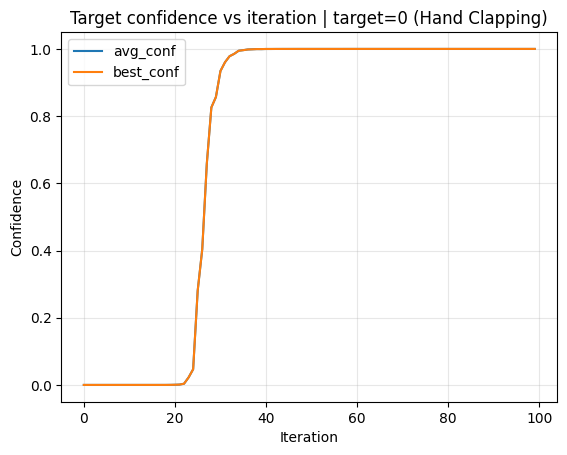

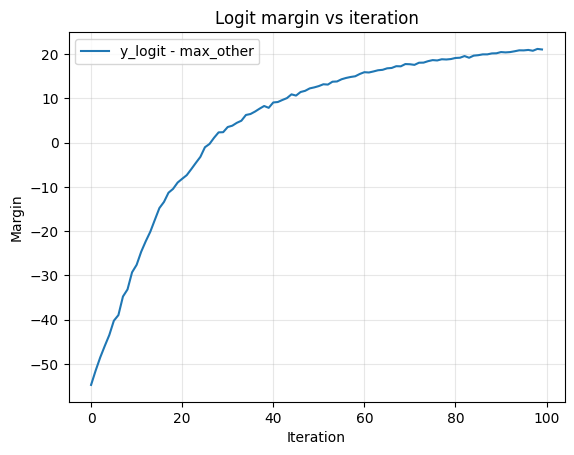

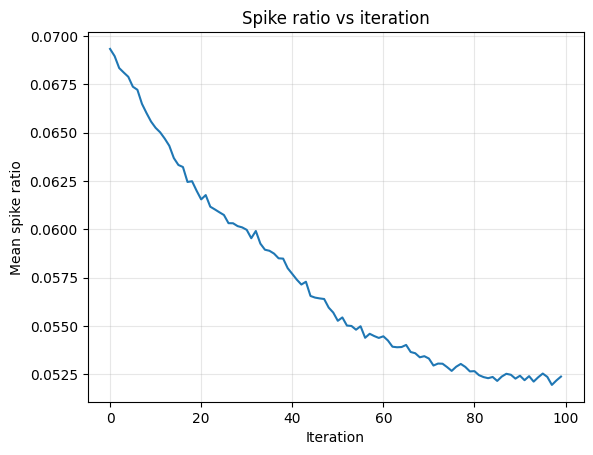

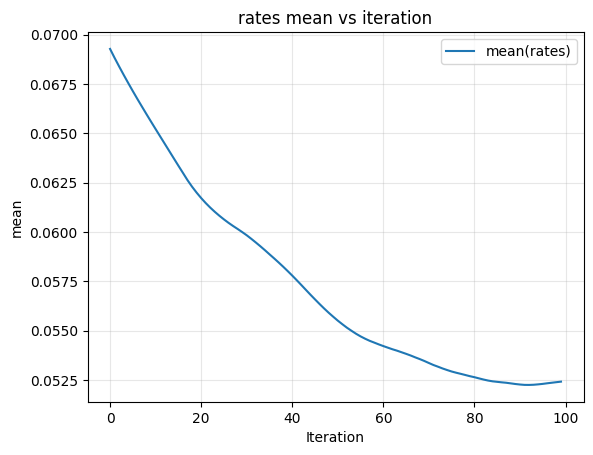

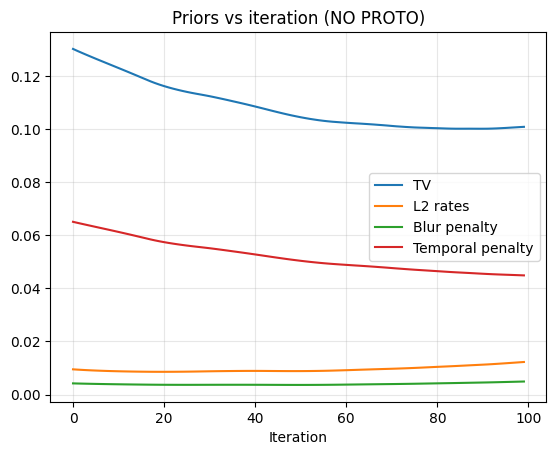

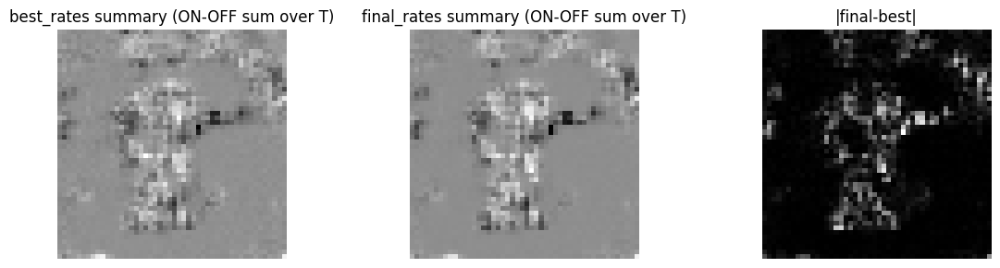

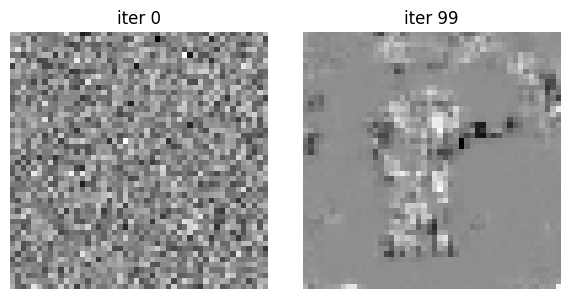

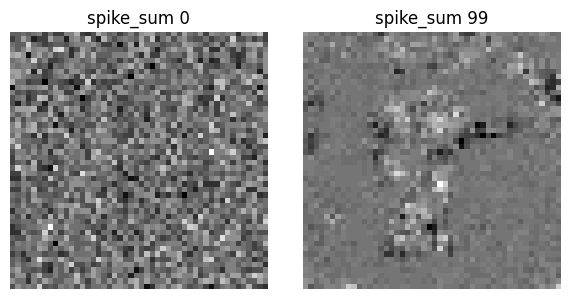

In [17]:
# =========================
# CELL 2: Run (fast) + plots + best vs final comparison + video
# =========================

dvs_class_names = [
    "Hand Clapping", "Right Hand Wave", "Left Hand Wave", "Right Arm CW", "Right Arm CCW",
    "Left Arm CW", "Left Arm CCW", "Arm Roll", "Air Drums", "Air Guitar", "Other"
]

target_class = 0  # 0-Hand clap 7-Arm Roll

result = model_inversion_attack_dvs_eot_ste_full_noproto(
    model=dvs_model,
    target_class=target_class,
    device=dvs_device,
    T=dvs_T_steps, H=48, W=48,

    steps=100,
    K=8,
    base_rate=1.0,

    # Activity control 
    fr_target=0.06,
    xi_sparsity=0.15,
    xi_fr=0.20,
    xi_fr_l2=0.10,

    xi_temp=0.25,
    xi_blur=0.20,
    xi_tv=0.08,

    # Stage schedule
    stage2_start=250,
    lr=0.03,
    lr_stage2=0.003,

    log_every=50,
    snapshot_every=200,
)

print("Best confidence:", result["best_conf"])
hist = result["history"]

# ---- Curves ----
plt.figure()
plt.plot(hist["conf"], label="avg_conf")
plt.plot(hist["best_conf"], label="best_conf")
plt.title(f"Target confidence vs iteration | target={target_class} ({dvs_class_names[target_class]})")
plt.xlabel("Iteration"); plt.ylabel("Confidence"); plt.legend(); plt.grid(True, alpha=0.3)
plt.show()

plt.figure()
plt.plot(hist["margin"], label="y_logit - max_other")
plt.title("Logit margin vs iteration")
plt.xlabel("Iteration"); plt.ylabel("Margin"); plt.legend(); plt.grid(True, alpha=0.3)
plt.show()

plt.figure()
plt.plot(hist["sparsity"])
plt.title("Spike ratio vs iteration")
plt.xlabel("Iteration"); plt.ylabel("Mean spike ratio"); plt.grid(True, alpha=0.3)
plt.show()

plt.figure()
plt.plot(hist["xmean"], label="mean(rates)")
plt.title("rates mean vs iteration")
plt.xlabel("Iteration"); plt.ylabel("mean"); plt.legend(); plt.grid(True, alpha=0.3)
plt.show()

plt.figure()
plt.plot(hist["tv"], label="TV")
plt.plot(hist["l2_rates"], label="L2 rates")
plt.plot(hist["blur_pen"], label="Blur penalty")
plt.plot(hist["temp_pen"], label="Temporal penalty")
plt.title("Priors vs iteration (NO PROTO)")
plt.xlabel("Iteration"); plt.legend(); plt.grid(True, alpha=0.3)
plt.show()

# ---- Compare best_rates vs final_rates (summary + diff) ----
best_rates = result["best_rates"].detach().cpu()    # [T,1,2,H,W]
final_rates = result["final_rates"].detach().cpu()  # [T,1,2,H,W]

def summarize_clip(rates_tbchw: torch.Tensor):
    rates = rates_tbchw[:, 0]       # [T,2,H,W]
    on = rates[:, 0]
    off = rates[:, 1]
    return (on - off).sum(dim=0)    # [H,W]

best_img = summarize_clip(best_rates)
final_img = summarize_clip(final_rates)
diff_img = (final_img - best_img).abs()

plt.figure(figsize=(12, 3))
plt.subplot(1, 3, 1)
plt.imshow(best_img, cmap="gray")
plt.title("best_rates summary (ON-OFF sum over T)")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(final_img, cmap="gray")
plt.title("final_rates summary (ON-OFF sum over T)")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(diff_img, cmap="gray")
plt.title("|final-best|")
plt.axis("off")

plt.tight_layout()
plt.show()

# ---- Snapshots ----
snaps = result["snapshots"]
if len(snaps) > 0:
    n = len(snaps)
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(summarize_clip(s["rates"]), cmap="gray")
        plt.title(f"iter {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

    if "spike_sum" in snaps[0]:
        plt.figure(figsize=(3*n, 3))
        for i, s in enumerate(snaps):
            ss = s["spike_sum"][0]              # [2,H,W]
            ss_img = (ss[0] - ss[1]).numpy()    # ON-OFF
            plt.subplot(1, n, i+1)
            plt.imshow(ss_img, cmap="gray")
            plt.title(f"spike_sum {s['iter']}")
            plt.axis("off")
        plt.tight_layout()
        plt.show()

# ---- Video-style visualization of best reconstruction ----
rates = best_rates[:, 0]                 # [T,2,H,W]
vid = (rates[:, 0] - rates[:, 1]).numpy()  # [T,H,W]

vmin, vmax = np.percentile(vid, 2), np.percentile(vid, 98)
if vmax <= vmin:
    vmin, vmax = float(vid.min()), float(vid.max()) + 1e-6

T_vis = min(vid.shape[0], 120)

fig, ax = plt.subplots(figsize=(4, 4))
im = ax.imshow(vid[0], cmap="gray", vmin=vmin, vmax=vmax)
ax.set_title(f"Reconstructed DVS clip (rates, ON-OFF)\nTarget: {target_class} ({dvs_class_names[target_class]})")
ax.axis("off")

def _update(t):
    im.set_array(vid[t])
    ax.set_xlabel(f"t = {t+1}/{T_vis}")
    return (im,)

ani = animation.FuncAnimation(fig, _update, frames=T_vis, interval=60, blit=True)

try:
    display(HTML(ani.to_jshtml()))
except Exception as e:
    print("Inline animation failed; saving GIF instead. Reason:", e)
    out_gif = "dvs_inversion_best.gif"
    ani.save(out_gif, writer="pillow", fps=15)
    print(f"Saved: {out_gif}")

plt.close(fig)

DVS target class: 0 -> Hand Clapping

[DVS Leakage Metrics]
Target confidence (MC, best):     1.000000
Predicted class (best):           0 (Hand Clapping)
ASR top-1 (best):                 1
Target confidence (MC, final):    1.000000
Predicted class (final):          0 (Hand Clapping)
ASR top-1 (final):                1

MSE vs nearest:                   3.358501
MSE vs original:                  4.725062
MSE best vs final:                0.000932
MAE vs nearest:                   0.462213
MAE vs original:                  0.509785

Framewise SSIM vs nearest:        -0.000196
Framewise SSIM vs original:       0.000221
Framewise SSIM best vs final:     0.914754

Temporal L2 vs nearest:           3039062.000000
Temporal L2 vs original:          3875804.000000
Temporal L2 best vs final:        27.939260
Temporal corr vs nearest:         0.229278
Temporal corr vs original:        -0.197015

Recon ON/OFF density:             0.053800 / 0.052927
Final ON/OFF density:             0.053614 / 0

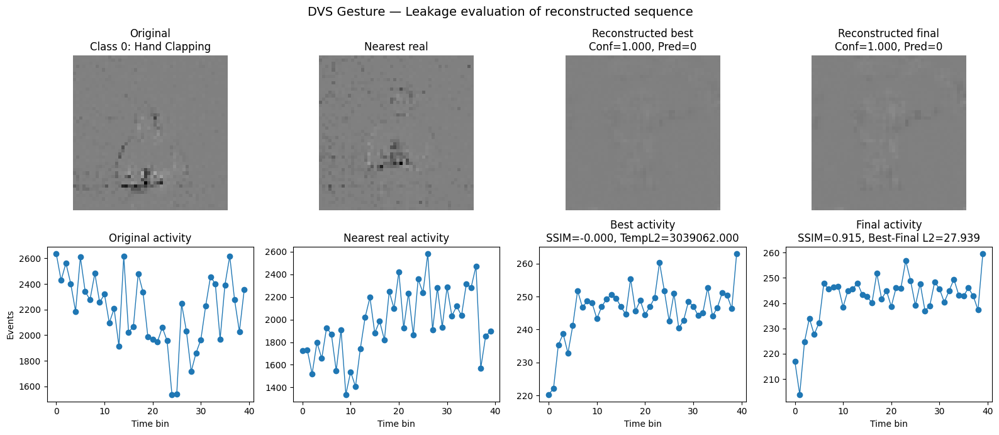


DVS leakage result row:
{'target_class': 0, 'target_class_name': 'Hand Clapping', 'mi_best_conf_attack': 1.0, 'mi_target_conf_mc_best': 1.0, 'mi_target_conf_mc_final': 1.0, 'mi_pred_class_best': 0, 'mi_pred_class_final': 0, 'mi_asr_top1_best': 1, 'mi_asr_top1_final': 1, 'mi_mse_nearest': 3.3585011959075928, 'mi_mse_original': 4.725061893463135, 'mi_mse_best_final': 0.0009321972611360252, 'mi_mae_nearest': 0.462213397026062, 'mi_mae_original': 0.5097846984863281, 'mi_ssim_nearest': -0.00019607054937296198, 'mi_ssim_original': 0.00022113852680263335, 'mi_ssim_best_final': 0.914753620326519, 'mi_temp_l2_nearest': 3039062.0, 'mi_temp_l2_original': 3875804.0, 'mi_temp_l2_best_final': 27.939260482788086, 'mi_temp_corr_nearest': 0.22927816216204056, 'mi_temp_corr_original': -0.19701513130490886, 'recon_on_density': 0.05379970371723175, 'recon_off_density': 0.05292697995901108, 'final_on_density': 0.053613513708114624, 'final_off_density': 0.05127248913049698, 'near_on_density': 0.40870225429

,target_class,target_class_name,mi_best_conf_attack,mi_target_conf_mc_best,mi_target_conf_mc_final,mi_pred_class_best,mi_pred_class_final,mi_asr_top1_best,mi_asr_top1_final,mi_mse_nearest,...,mi_temp_corr_nearest,mi_temp_corr_original,recon_on_density,recon_off_density,final_on_density,final_off_density,near_on_density,near_off_density,orig_on_density,orig_off_density
0,0,Hand Clapping,1.0,1.0,1.0,0,0,1,1,3.358501,...,0.229278,-0.197015,0.0538,0.052927,0.053614,0.051272,0.408702,0.443707,0.470497,0.482042


In [18]:
# =========================================================
# DVS Gesture — Leakage evaluation helpers + metrics + figure + animation
# Adapted to:
#   - result["best_rates"], result["final_rates"]
#   - dvs_model
#   - dvs_test_loader
#   - dvs_class_names
# =========================================================

# ---------------------------------------------------------
# 1) Basic tensor safety
# ---------------------------------------------------------
def to_dvs_seq5(x):
    """
    Ensures shape [1, T, 2, H, W]
    Accepts:
      - [T,1,2,H,W]  -> converts to [1,T,2,H,W]
      - [1,T,2,H,W]  -> unchanged
    """
    if isinstance(x, np.ndarray):
        x = torch.tensor(x, dtype=torch.float32)

    x = x.detach().float().cpu()

    if x.dim() != 5:
        raise ValueError(f"Expected 5D tensor, got shape {tuple(x.shape)}")

    # Case A: [T,1,2,H,W]
    if x.shape[1] == 1 and x.shape[2] == 2:
        x = x.permute(1, 0, 2, 3, 4).contiguous()   # -> [1,T,2,H,W]
        return x

    # Case B: [1,T,2,H,W]
    if x.shape[0] == 1 and x.shape[2] == 2:
        return x

    raise ValueError(f"Expected [T,1,2,H,W] or [1,T,2,H,W], got {tuple(x.shape)}")


# ---------------------------------------------------------
# 2) Simple framewise SSIM for DVS sequences
# Compare polarity-collapsed frames: ON - OFF
# ---------------------------------------------------------
def ssim_torch_simple_2d(x, y, C1=0.01**2, C2=0.03**2):
    """
    x, y: [1,1,H,W]
    """
    x = x.float()
    y = y.float()

    mu_x = x.mean()
    mu_y = y.mean()

    sigma_x = ((x - mu_x) ** 2).mean()
    sigma_y = ((y - mu_y) ** 2).mean()
    sigma_xy = ((x - mu_x) * (y - mu_y)).mean()

    ssim = ((2 * mu_x * mu_y + C1) * (2 * sigma_xy + C2)) / (
        (mu_x ** 2 + mu_y ** 2 + C1) * (sigma_x + sigma_y + C2)
    )
    return float(ssim.item())


def dvs_framewise_ssim(seq_a, seq_b):
    """
    seq_a, seq_b: [1,T,2,H,W]
    Returns mean SSIM over time after ON-OFF collapse.
    """
    seq_a = to_dvs_seq5(seq_a)
    seq_b = to_dvs_seq5(seq_b)

    assert seq_a.shape == seq_b.shape, f"Shape mismatch: {seq_a.shape} vs {seq_b.shape}"

    T = seq_a.size(1)
    vals = []

    for t in range(T):
        a = seq_a[:, t, 0:1] - seq_a[:, t, 1:2]   # [1,1,H,W]
        b = seq_b[:, t, 0:1] - seq_b[:, t, 1:2]
        vals.append(ssim_torch_simple_2d(a, b))

    return float(np.mean(vals))


# ---------------------------------------------------------
# 3) Basic distance metrics
# ---------------------------------------------------------
def mse_torch(x, y):
    x = x.float()
    y = y.float()
    return float(((x - y) ** 2).mean().item())


def mae_torch(x, y):
    x = x.float()
    y = y.float()
    return float((x - y).abs().mean().item())


# ---------------------------------------------------------
# 4) Temporal profile / density helpers
# ---------------------------------------------------------
def dvs_activity_profile(seq5):
    """
    seq5: [1,T,2,H,W]
    Returns total activity per timestep: [T]
    """
    seq5 = to_dvs_seq5(seq5)
    prof = seq5.sum(dim=(0, 2, 3, 4))   # [T]
    return prof.cpu().numpy()


def dvs_onoff_density(seq5):
    """
    Returns mean ON density and OFF density across full sequence.
    """
    seq5 = to_dvs_seq5(seq5)
    on_density = float(seq5[:, :, 0].mean().item())
    off_density = float(seq5[:, :, 1].mean().item())
    return on_density, off_density


def temporal_profile_l2(seq_a, seq_b):
    pa = dvs_activity_profile(seq_a)
    pb = dvs_activity_profile(seq_b)
    return float(np.mean((pa - pb) ** 2))


def temporal_profile_corr(seq_a, seq_b):
    pa = dvs_activity_profile(seq_a)
    pb = dvs_activity_profile(seq_b)

    if np.std(pa) < 1e-12 or np.std(pb) < 1e-12:
        return 0.0
    return float(np.corrcoef(pa, pb)[0, 1])


# ---------------------------------------------------------
# 5) Summary image helpers
# ---------------------------------------------------------
def dvs_summary_image_on_minus_off(seq5):
    """
    seq5: [1,T,2,H,W]
    Returns [H,W]
    """
    seq5 = to_dvs_seq5(seq5)
    on_sum = seq5[0, :, 0].sum(dim=0).numpy()
    off_sum = seq5[0, :, 1].sum(dim=0).numpy()
    return on_sum - off_sum


def dvs_summary_image_total(seq5):
    """
    seq5: [1,T,2,H,W]
    Returns [H,W]
    """
    seq5 = to_dvs_seq5(seq5)
    return seq5[0].sum(dim=(0, 1)).numpy()


# ---------------------------------------------------------
# 6) Retrieve real examples from loader
# Loader returns [T,B,2,H,W]
# ---------------------------------------------------------
def get_first_real_dvs_example_of_class(loader, target_class):
    for spikes_tbchw, labels in loader:
        for b in range(labels.size(0)):
            if int(labels[b].item()) == int(target_class):
                # [T,1,2,H,W] -> then convert helper can handle it
                sample = spikes_tbchw[:, b:b+1].contiguous().float()
                return to_dvs_seq5(sample)
    raise ValueError(f"No DVS sample found for class {target_class}")


def get_nearest_real_dvs_example(seq_query, loader, target_class, max_items=200):
    """
    Nearest neighbor by full-sequence MSE.
    seq_query expected [1,T,2,H,W] or [T,1,2,H,W]
    """
    seq_query = to_dvs_seq5(seq_query)

    best_dist = float("inf")
    best_sample = None
    checked = 0

    for spikes_tbchw, labels in loader:
        B = labels.size(0)
        for b in range(B):
            if int(labels[b].item()) != int(target_class):
                continue

            cand = to_dvs_seq5(spikes_tbchw[:, b:b+1].contiguous().float())

            if cand.shape != seq_query.shape:
                continue

            dist = mse_torch(seq_query, cand)
            if dist < best_dist:
                best_dist = dist
                best_sample = cand.clone()

            checked += 1
            if checked >= max_items:
                if best_sample is None:
                    raise ValueError("No matching DVS sample found during nearest-neighbor search.")
                return best_sample

    if best_sample is None:
        raise ValueError("No matching DVS sample found in loader.")
    return best_sample


# ---------------------------------------------------------
# 7) MC reevaluation helper matched to your current attack/model
# Uses:
#   - dvs_bernoulli_rate_encode
#   - dvs_normalize_like_training
# ---------------------------------------------------------
@torch.no_grad()
def target_confidence_and_pred_dvs_eval(net, seq5, target_class, base_rate=1.0, mc_K=30, device=None):
    """
    seq5: [1,T,2,H,W] or [T,1,2,H,W]
    """
    if device is None:
        device = next(net.parameters()).device

    seq5 = to_dvs_seq5(seq5)                    # [1,T,2,H,W]
    seq_t1chw = seq5.permute(1, 0, 2, 3, 4).contiguous().to(device)   # [T,1,2,H,W]

    logits_acc = 0.0
    for _ in range(mc_K):
        sp = dvs_bernoulli_rate_encode(seq_t1chw, base_rate=base_rate)
        sp = dvs_normalize_like_training(sp)
        logits_acc = logits_acc + net(sp)

    logits = logits_acc / float(mc_K)
    probs = torch.softmax(logits, dim=1)
    conf_target = float(probs[0, target_class].item())
    pred = int(probs.argmax(dim=1).item())
    return conf_target, pred, probs[0].detach().cpu()


# =========================================================
# 8) USER CHOICE
# =========================================================
dvs_target_class_eval = target_class         # uses same class as attack by default
dvs_nn_max_items = 200
dvs_mc_K_eval = 30
dvs_attack_base_rate = 1.0

print(f"DVS target class: {dvs_target_class_eval} -> {dvs_class_names[dvs_target_class_eval]}")

# ---------------------------------------------------------
# 9) Use best reconstructed sequence from your attack
# result["best_rates"] is [T,1,2,H,W]
# ---------------------------------------------------------
dvs_best_seq = to_dvs_seq5(result["best_rates"])
dvs_final_seq = to_dvs_seq5(result["final_rates"])

# Real references
dvs_original_seq = get_first_real_dvs_example_of_class(dvs_test_loader, dvs_target_class_eval)
dvs_nearest_seq = get_nearest_real_dvs_example(
    dvs_best_seq,
    dvs_test_loader,
    dvs_target_class_eval,
    max_items=dvs_nn_max_items
)

# ---------------------------------------------------------
# 10) Re-evaluate target confidence via MC
# ---------------------------------------------------------
dvs_target_conf, dvs_pred, dvs_probs = target_confidence_and_pred_dvs_eval(
    dvs_model,
    dvs_best_seq,
    target_class=dvs_target_class_eval,
    base_rate=dvs_attack_base_rate,
    mc_K=dvs_mc_K_eval,
    device=dvs_device
)

dvs_target_conf_final, dvs_pred_final, dvs_probs_final = target_confidence_and_pred_dvs_eval(
    dvs_model,
    dvs_final_seq,
    target_class=dvs_target_class_eval,
    base_rate=dvs_attack_base_rate,
    mc_K=dvs_mc_K_eval,
    device=dvs_device
)

dvs_asr_top1 = int(dvs_pred == dvs_target_class_eval)
dvs_asr_top1_final = int(dvs_pred_final == dvs_target_class_eval)

# ---------------------------------------------------------
# 11) Metrics
# ---------------------------------------------------------
dvs_mse_nearest = mse_torch(dvs_best_seq, dvs_nearest_seq)
dvs_mse_original = mse_torch(dvs_best_seq, dvs_original_seq)
dvs_mse_best_final = mse_torch(dvs_best_seq, dvs_final_seq)

dvs_mae_nearest = mae_torch(dvs_best_seq, dvs_nearest_seq)
dvs_mae_original = mae_torch(dvs_best_seq, dvs_original_seq)

dvs_ssim_nearest = dvs_framewise_ssim(dvs_best_seq, dvs_nearest_seq)
dvs_ssim_original = dvs_framewise_ssim(dvs_best_seq, dvs_original_seq)
dvs_ssim_best_final = dvs_framewise_ssim(dvs_best_seq, dvs_final_seq)

dvs_temp_l2_nearest = temporal_profile_l2(dvs_best_seq, dvs_nearest_seq)
dvs_temp_l2_original = temporal_profile_l2(dvs_best_seq, dvs_original_seq)
dvs_temp_l2_best_final = temporal_profile_l2(dvs_best_seq, dvs_final_seq)

dvs_temp_corr_nearest = temporal_profile_corr(dvs_best_seq, dvs_nearest_seq)
dvs_temp_corr_original = temporal_profile_corr(dvs_best_seq, dvs_original_seq)

dvs_on_recon, dvs_off_recon = dvs_onoff_density(dvs_best_seq)
dvs_on_final, dvs_off_final = dvs_onoff_density(dvs_final_seq)
dvs_on_near, dvs_off_near = dvs_onoff_density(dvs_nearest_seq)
dvs_on_orig, dvs_off_orig = dvs_onoff_density(dvs_original_seq)

print("\n[DVS Leakage Metrics]")
print(f"Target confidence (MC, best):     {dvs_target_conf:.6f}")
print(f"Predicted class (best):           {dvs_pred} ({dvs_class_names[dvs_pred]})")
print(f"ASR top-1 (best):                 {dvs_asr_top1}")
print(f"Target confidence (MC, final):    {dvs_target_conf_final:.6f}")
print(f"Predicted class (final):          {dvs_pred_final} ({dvs_class_names[dvs_pred_final]})")
print(f"ASR top-1 (final):                {dvs_asr_top1_final}")

print(f"\nMSE vs nearest:                   {dvs_mse_nearest:.6f}")
print(f"MSE vs original:                  {dvs_mse_original:.6f}")
print(f"MSE best vs final:                {dvs_mse_best_final:.6f}")

print(f"MAE vs nearest:                   {dvs_mae_nearest:.6f}")
print(f"MAE vs original:                  {dvs_mae_original:.6f}")

print(f"\nFramewise SSIM vs nearest:        {dvs_ssim_nearest:.6f}")
print(f"Framewise SSIM vs original:       {dvs_ssim_original:.6f}")
print(f"Framewise SSIM best vs final:     {dvs_ssim_best_final:.6f}")

print(f"\nTemporal L2 vs nearest:           {dvs_temp_l2_nearest:.6f}")
print(f"Temporal L2 vs original:          {dvs_temp_l2_original:.6f}")
print(f"Temporal L2 best vs final:        {dvs_temp_l2_best_final:.6f}")

print(f"Temporal corr vs nearest:         {dvs_temp_corr_nearest:.6f}")
print(f"Temporal corr vs original:        {dvs_temp_corr_original:.6f}")

print(f"\nRecon ON/OFF density:             {dvs_on_recon:.6f} / {dvs_off_recon:.6f}")
print(f"Final ON/OFF density:             {dvs_on_final:.6f} / {dvs_off_final:.6f}")
print(f"Near  ON/OFF density:             {dvs_on_near:.6f} / {dvs_off_near:.6f}")
print(f"Orig  ON/OFF density:             {dvs_on_orig:.6f} / {dvs_off_orig:.6f}")

print("\nTop-5 probs (best):", torch.topk(dvs_probs, 5))
print("Top-5 probs (final):", torch.topk(dvs_probs_final, 5))

# ---------------------------------------------------------
# 12) Summary images
# ---------------------------------------------------------
img_orig = dvs_summary_image_on_minus_off(dvs_original_seq)
img_near = dvs_summary_image_on_minus_off(dvs_nearest_seq)
img_best = dvs_summary_image_on_minus_off(dvs_best_seq)
img_final = dvs_summary_image_on_minus_off(dvs_final_seq)

v = max(
    np.max(np.abs(img_orig)),
    np.max(np.abs(img_near)),
    np.max(np.abs(img_best)),
    np.max(np.abs(img_final)),
) + 1e-6

# ---------------------------------------------------------
# 13) Temporal profiles
# ---------------------------------------------------------
prof_orig = dvs_activity_profile(dvs_original_seq)
prof_near = dvs_activity_profile(dvs_nearest_seq)
prof_best = dvs_activity_profile(dvs_best_seq)
prof_final = dvs_activity_profile(dvs_final_seq)

# ---------------------------------------------------------
# 14) Main figure
# ---------------------------------------------------------
fig, axes = plt.subplots(2, 4, figsize=(16, 7))

axes[0, 0].imshow(img_orig, cmap="gray", vmin=-v, vmax=v)
axes[0, 0].set_title(f"Original\nClass {dvs_target_class_eval}: {dvs_class_names[dvs_target_class_eval]}")
axes[0, 0].axis("off")

axes[0, 1].imshow(img_near, cmap="gray", vmin=-v, vmax=v)
axes[0, 1].set_title("Nearest real")
axes[0, 1].axis("off")

axes[0, 2].imshow(img_best, cmap="gray", vmin=-v, vmax=v)
axes[0, 2].set_title(f"Reconstructed best\nConf={dvs_target_conf:.3f}, Pred={dvs_pred}")
axes[0, 2].axis("off")

axes[0, 3].imshow(img_final, cmap="gray", vmin=-v, vmax=v)
axes[0, 3].set_title(f"Reconstructed final\nConf={dvs_target_conf_final:.3f}, Pred={dvs_pred_final}")
axes[0, 3].axis("off")

axes[1, 0].plot(prof_orig, marker="o", linewidth=1)
axes[1, 0].set_title("Original activity")
axes[1, 0].set_xlabel("Time bin")
axes[1, 0].set_ylabel("Events")

axes[1, 1].plot(prof_near, marker="o", linewidth=1)
axes[1, 1].set_title("Nearest real activity")
axes[1, 1].set_xlabel("Time bin")

axes[1, 2].plot(prof_best, marker="o", linewidth=1)
axes[1, 2].set_title(f"Best activity\nSSIM={dvs_ssim_nearest:.3f}, TempL2={dvs_temp_l2_nearest:.3f}")
axes[1, 2].set_xlabel("Time bin")

axes[1, 3].plot(prof_final, marker="o", linewidth=1)
axes[1, 3].set_title(f"Final activity\nSSIM={dvs_ssim_best_final:.3f}, Best-Final L2={dvs_temp_l2_best_final:.3f}")
axes[1, 3].set_xlabel("Time bin")

plt.suptitle("DVS Gesture — Leakage evaluation of reconstructed sequence", fontsize=14)
plt.tight_layout()
plt.show()

# ---------------------------------------------------------
# 15) Compact result dict / dataframe row
# ---------------------------------------------------------
dvs_leakage_result = {
    "target_class": dvs_target_class_eval,
    "target_class_name": dvs_class_names[dvs_target_class_eval],

    "mi_best_conf_attack": float(result["best_conf"]),
    "mi_target_conf_mc_best": float(dvs_target_conf),
    "mi_target_conf_mc_final": float(dvs_target_conf_final),

    "mi_pred_class_best": int(dvs_pred),
    "mi_pred_class_final": int(dvs_pred_final),
    "mi_asr_top1_best": int(dvs_asr_top1),
    "mi_asr_top1_final": int(dvs_asr_top1_final),

    "mi_mse_nearest": float(dvs_mse_nearest),
    "mi_mse_original": float(dvs_mse_original),
    "mi_mse_best_final": float(dvs_mse_best_final),

    "mi_mae_nearest": float(dvs_mae_nearest),
    "mi_mae_original": float(dvs_mae_original),

    "mi_ssim_nearest": float(dvs_ssim_nearest),
    "mi_ssim_original": float(dvs_ssim_original),
    "mi_ssim_best_final": float(dvs_ssim_best_final),

    "mi_temp_l2_nearest": float(dvs_temp_l2_nearest),
    "mi_temp_l2_original": float(dvs_temp_l2_original),
    "mi_temp_l2_best_final": float(dvs_temp_l2_best_final),

    "mi_temp_corr_nearest": float(dvs_temp_corr_nearest),
    "mi_temp_corr_original": float(dvs_temp_corr_original),

    "recon_on_density": float(dvs_on_recon),
    "recon_off_density": float(dvs_off_recon),
    "final_on_density": float(dvs_on_final),
    "final_off_density": float(dvs_off_final),
    "near_on_density": float(dvs_on_near),
    "near_off_density": float(dvs_off_near),
    "orig_on_density": float(dvs_on_orig),
    "orig_off_density": float(dvs_off_orig),
}

print("\nDVS leakage result row:")
print(dvs_leakage_result)

dvs_leakage_df = pd.DataFrame([dvs_leakage_result])
display(dvs_leakage_df)

# ---------------------------------------------------------
# 16) Animate BEST reconstructed output
# ---------------------------------------------------------
seq_vis_best = to_dvs_seq5(dvs_best_seq)[0]   # [T,2,H,W]
vid_best = (seq_vis_best[:, 0] - seq_vis_best[:, 1]).numpy()

T_anim = min(vid_best.shape[0], 80)
vid_best = vid_best[:T_anim]

vmin_best, vmax_best = np.percentile(vid_best, 2), np.percentile(vid_best, 98)
if vmax_best <= vmin_best:
    vmin_best, vmax_best = float(vid_best.min()), float(vid_best.max()) + 1e-6

fig, ax = plt.subplots(figsize=(4, 4))
im = ax.imshow(vid_best[0], cmap="gray", vmin=vmin_best, vmax=vmax_best)
ax.set_title(f"BEST reconstructed DVS sequence\nTarget: {dvs_class_names[dvs_target_class_eval]}")
ax.axis("off")

def _update_best(frame_idx):
    im.set_array(vid_best[frame_idx])
    ax.set_xlabel(f"t = {frame_idx+1}/{T_anim}")
    return (im,)

ani = animation.FuncAnimation(fig, _update_best, frames=T_anim, interval=80, blit=True)

try:
    display(HTML(ani.to_jshtml()))
except Exception as e:
    print("Inline animation failed for BEST; saving GIF instead.")
    print("Reason:", e)
    out_gif = "dvs_reconstruction_best.gif"
    ani.save(out_gif, writer="pillow", fps=12)
    print(f"Saved: {out_gif}")

plt.close(fig)

# ---------------------------------------------------------
# 17) Animate FINAL reconstructed output
# ---------------------------------------------------------
seq_vis_final = to_dvs_seq5(dvs_final_seq)[0]   # [T,2,H,W]
vid_final = (seq_vis_final[:, 0] - seq_vis_final[:, 1]).numpy()

T_anim_final = min(vid_final.shape[0], 80)
vid_final = vid_final[:T_anim_final]

vmin_final, vmax_final = np.percentile(vid_final, 2), np.percentile(vid_final, 98)
if vmax_final <= vmin_final:
    vmin_final, vmax_final = float(vid_final.min()), float(vid_final.max()) + 1e-6

fig, ax = plt.subplots(figsize=(4, 4))
im = ax.imshow(vid_final[0], cmap="gray", vmin=vmin_final, vmax=vmax_final)
ax.set_title(f"FINAL reconstructed DVS sequence\nTarget: {dvs_class_names[dvs_target_class_eval]}")
ax.axis("off")

def _update_final(frame_idx):
    im.set_array(vid_final[frame_idx])
    ax.set_xlabel(f"t = {frame_idx+1}/{T_anim_final}")
    return (im,)

ani = animation.FuncAnimation(fig, _update_final, frames=T_anim_final, interval=80, blit=True)

try:
    display(HTML(ani.to_jshtml()))
except Exception as e:
    print("Inline animation failed for FINAL; saving GIF instead.")
    print("Reason:", e)
    out_gif = "dvs_reconstruction_final.gif"
    ani.save(out_gif, writer="pillow", fps=12)
    print(f"Saved: {out_gif}")

plt.close(fig)

In [ ]:
# =========================================================
# DVS Gesture + Fault Injection
# Improved evaluation: Accuracy vs MIA AUC vs MI leakage
# Adds:
#   - summary-image SSIM/MSE
#   - representative-frame SSIM/MSE
#   - scaled columns for readability
#   - deltas vs clean
# Place AFTER:
#   - DVS training/evaluation blocks
#   - DVS inversion attack block
#   - DVS leakage helper block
# =========================================================

try:
    from sklearn.metrics import roc_auc_score
except Exception:
    roc_auc_score = None

# ---------------------------------------------------------
# 1) Spike-level fault wrappers for DVS
# ---------------------------------------------------------
def dvs_spike_fault_A3(spk):
    """SpikeDeletion p=0.75"""
    return SpikeDeletion(p=0.75).apply(spk)

def dvs_spike_fault_A10(spk):
    """SpikeInsertion p=0.0001"""
    return SpikeInsertion(p=0.0001).apply(spk)

def dvs_spike_fault_A11(spk):
    """SpikeTimeShift dt=30"""
    return SpikeTimeShift(dt=30).apply(spk)

# ---------------------------------------------------------
# 2) DVS user choice
# ---------------------------------------------------------
dvs_target_class_eval = 0
dvs_attack_steps = 100 # 600
dvs_attack_K = 4 # 16
dvs_mia_max_batches = 30
dvs_attack_base_rate = 1.0

print(f"DVS target class: {dvs_target_class_eval} -> {dvs_class_names[dvs_target_class_eval]}")

# ---------------------------------------------------------
# 3) Optional wrapper for spike-fault evaluation
# ---------------------------------------------------------
class DVS_SpikeFaultWrapper(nn.Module):
    """
    Wraps a DVS model so a spike-level transform is applied before forward().
    Input shape expected by your model: [T,B,C,H,W]
    """
    def __init__(self, base_model, spike_transform=None):
        super().__init__()
        self.base_model = base_model
        self.spike_transform = spike_transform

    def forward(self, spikes):
        x = spikes
        if self.spike_transform is not None:
            x = self.spike_transform(x)
        return self.base_model(x)

# ---------------------------------------------------------
# 4) Accuracy helpers for DVS under optional spike fault
# ---------------------------------------------------------
@torch.no_grad()
def dvs_eval_accuracy_with_spikefault(model, loader, spike_transform=None, device=None):
    if device is None:
        device = next(model.parameters()).device

    model.eval()
    correct, total = 0, 0

    for spikes_tbchw, labels in loader:
        spikes_tbchw = spikes_tbchw.to(device, non_blocking=True).float()
        labels = labels.to(device, non_blocking=True)

        if spike_transform is not None:
            spikes_tbchw = spike_transform(spikes_tbchw)

        logits = model(spikes_tbchw)
        pred = logits.argmax(dim=1)

        correct += (pred == labels).sum().item()
        total += labels.size(0)

    return 100.0 * correct / max(total, 1)

# ---------------------------------------------------------
# 5) MIA AUC helper for DVS
# ---------------------------------------------------------
@torch.no_grad()
def dvs_collect_membership_scores(model, loader, spike_transform=None, max_batches=30, device=None):
    if device is None:
        device = next(model.parameters()).device

    model.eval()
    scores = []

    for batch_idx, (spikes_tbchw, labels) in enumerate(loader):
        if batch_idx >= max_batches:
            break

        spikes_tbchw = spikes_tbchw.to(device, non_blocking=True).float()

        if spike_transform is not None:
            spikes_tbchw = spike_transform(spikes_tbchw)

        logits = model(spikes_tbchw)
        batch_scores = logits.max(dim=1).values.detach().cpu().numpy()
        scores.extend(batch_scores.tolist())

    return np.asarray(scores, dtype=np.float64)


def dvs_mia_logit_auc_with_spikefault(model, train_loader, test_loader, spike_transform=None, max_batches=30, device=None):
    member_scores = dvs_collect_membership_scores(
        model, train_loader, spike_transform=spike_transform, max_batches=max_batches, device=device
    )
    nonmember_scores = dvs_collect_membership_scores(
        model, test_loader, spike_transform=spike_transform, max_batches=max_batches, device=device
    )

    y_true = np.concatenate([
        np.ones(len(member_scores), dtype=np.int64),
        np.zeros(len(nonmember_scores), dtype=np.int64)
    ])
    y_score = np.concatenate([member_scores, nonmember_scores])

    if roc_auc_score is not None:
        return float(roc_auc_score(y_true, y_score))

    order = np.argsort(y_score)
    ranks = np.empty_like(order, dtype=np.float64)
    ranks[order] = np.arange(len(y_score), dtype=np.float64) + 1.0

    n_pos = float((y_true == 1).sum())
    n_neg = float((y_true == 0).sum())
    pos_rank_sum = ranks[y_true == 1].sum()
    auc = (pos_rank_sum - n_pos * (n_pos + 1.0) / 2.0) / max(n_pos * n_neg, 1.0)
    return float(auc)

# ---------------------------------------------------------
# 6) Extra image-style leakage helpers for DVS
# ---------------------------------------------------------
def dvs_summary_image_tensor(seq5):
    """
    seq5: [1,T,2,H,W]
    returns [1,1,H,W] using sum_t(ON - OFF)
    """
    seq5 = to_dvs_seq5(seq5)
    img = seq5[0, :, 0].sum(dim=0) - seq5[0, :, 1].sum(dim=0)
    return img.unsqueeze(0).unsqueeze(0).float()


def dvs_representative_frame(seq5, mode="max_activity"):
    """
    seq5: [1,T,2,H,W]
    returns:
      frame_img: [1,1,H,W] using ON-OFF for one selected frame
      frame_idx: int
    """
    seq5 = to_dvs_seq5(seq5)
    T = seq5.size(1)

    if mode == "max_activity":
        prof = seq5.sum(dim=(0, 2, 3, 4))  # [T]
        t_idx = int(prof.argmax().item())
    else:
        t_idx = T // 2

    frame = seq5[0, t_idx, 0] - seq5[0, t_idx, 1]  # [H,W]
    return frame.unsqueeze(0).unsqueeze(0).float(), t_idx


def ssim_torch_simple_2d_safe(x, y):
    return ssim_torch_simple_2d(x.float(), y.float())


def dvs_summary_metrics(seq_a, seq_b):
    img_a = dvs_summary_image_tensor(seq_a)
    img_b = dvs_summary_image_tensor(seq_b)
    return {
        "mse": mse_torch(img_a, img_b),
        "mae": mae_torch(img_a, img_b),
        "ssim": ssim_torch_simple_2d_safe(img_a, img_b),
    }


def dvs_representative_frame_metrics(seq_a, seq_b, mode="max_activity"):
    img_a, idx_a = dvs_representative_frame(seq_a, mode=mode)
    img_b, idx_b = dvs_representative_frame(seq_b, mode=mode)
    return {
        "frame_idx_a": int(idx_a),
        "frame_idx_b": int(idx_b),
        "mse": mse_torch(img_a, img_b),
        "mae": mae_torch(img_a, img_b),
        "ssim": ssim_torch_simple_2d_safe(img_a, img_b),
    }

# ---------------------------------------------------------
# 7) DVS MI leakage evaluation on one class
# ---------------------------------------------------------
def dvs_evaluate_mi_single_class(
    net,
    target_class=0,
    steps=600,
    K=16,
    base_rate=1.0,
    spike_transform=None,
    nn_max_items=200,
    mc_K_eval=30,
):
    """
    Runs DVS MI attack on one class and returns core leakage metrics.
    If spike_transform is provided, it wraps the model for attack-time inference.
    """

    attack_net = net
    if spike_transform is not None:
        attack_net = DVS_SpikeFaultWrapper(net, spike_transform=spike_transform).to(dvs_device)
        attack_net.eval()

    attack_result = model_inversion_attack_dvs_eot_ste_full_noproto(
        model=attack_net,
        target_class=target_class,
        device=dvs_device,
        T=dvs_T_steps,
        H=48,
        W=48,
        steps=steps,
        K=K,
        base_rate=base_rate,
        log_every=max(steps // 4, 1),
        snapshot_every=max(steps, 1),
    )

    dvs_best_seq = attack_result["best_rates"].detach().cpu()   # [T,1,2,H,W]
    dvs_final_seq = attack_result["final_rates"].detach().cpu()

    dvs_best_seq_1 = dvs_best_seq.permute(1, 0, 2, 3, 4).contiguous()   # [1,T,2,H,W]
    dvs_final_seq_1 = dvs_final_seq.permute(1, 0, 2, 3, 4).contiguous()

    dvs_original_seq = get_first_real_dvs_example_of_class(dvs_test_loader, target_class)
    dvs_nearest_seq = get_nearest_real_dvs_example(
        dvs_best_seq_1,
        dvs_test_loader,
        target_class,
        max_items=nn_max_items
    )

    dvs_target_conf, dvs_pred, dvs_probs = target_confidence_and_pred_dvs_eval(
        attack_net,
        dvs_best_seq_1,
        target_class=target_class,
        base_rate=base_rate,
        mc_K=mc_K_eval,
        device=dvs_device
    )
    dvs_asr_top1 = int(dvs_pred == target_class)

    # Sequence-level metrics
    dvs_mse_nearest = mse_torch(dvs_best_seq_1, dvs_nearest_seq)
    dvs_mse_original = mse_torch(dvs_best_seq_1, dvs_original_seq)

    dvs_ssim_nearest = dvs_framewise_ssim(dvs_best_seq_1, dvs_nearest_seq)
    dvs_ssim_original = dvs_framewise_ssim(dvs_best_seq_1, dvs_original_seq)

    dvs_temp_l2_nearest = temporal_profile_l2(dvs_best_seq_1, dvs_nearest_seq)
    dvs_temp_l2_original = temporal_profile_l2(dvs_best_seq_1, dvs_original_seq)

    dvs_on_recon, dvs_off_recon = dvs_onoff_density(dvs_best_seq_1)

    # Summary-image metrics
    sum_near = dvs_summary_metrics(dvs_best_seq_1, dvs_nearest_seq)
    sum_orig = dvs_summary_metrics(dvs_best_seq_1, dvs_original_seq)

    # Representative-frame metrics
    frm_near = dvs_representative_frame_metrics(dvs_best_seq_1, dvs_nearest_seq, mode="max_activity")
    frm_orig = dvs_representative_frame_metrics(dvs_best_seq_1, dvs_original_seq, mode="max_activity")

    return {
        "mi_best_conf": float(attack_result["best_conf"]),
        "mi_target_conf_mc": float(dvs_target_conf),
        "mi_pred_class": int(dvs_pred),
        "mi_asr_top1": int(dvs_asr_top1),

        "mi_mse_nearest": float(dvs_mse_nearest),
        "mi_mse_original": float(dvs_mse_original),

        "mi_ssim_nearest": float(dvs_ssim_nearest),
        "mi_ssim_original": float(dvs_ssim_original),

        "mi_temp_l2_nearest": float(dvs_temp_l2_nearest),
        "mi_temp_l2_original": float(dvs_temp_l2_original),

        "mi_summary_ssim_nearest": float(sum_near["ssim"]),
        "mi_summary_mse_nearest": float(sum_near["mse"]),
        "mi_summary_mae_nearest": float(sum_near["mae"]),

        "mi_summary_ssim_original": float(sum_orig["ssim"]),
        "mi_summary_mse_original": float(sum_orig["mse"]),
        "mi_summary_mae_original": float(sum_orig["mae"]),

        "mi_repr_ssim_nearest": float(frm_near["ssim"]),
        "mi_repr_mse_nearest": float(frm_near["mse"]),
        "mi_repr_mae_nearest": float(frm_near["mae"]),
        "mi_repr_frame_idx_best": int(frm_near["frame_idx_a"]),
        "mi_repr_frame_idx_nearest": int(frm_near["frame_idx_b"]),

        "mi_repr_ssim_original": float(frm_orig["ssim"]),
        "mi_repr_mse_original": float(frm_orig["mse"]),
        "mi_repr_mae_original": float(frm_orig["mae"]),
        "mi_repr_frame_idx_original": int(frm_orig["frame_idx_b"]),

        "recon_on_density": float(dvs_on_recon),
        "recon_off_density": float(dvs_off_recon),

        "mi_best_seq": dvs_best_seq_1.detach().cpu(),
        "mi_final_seq": dvs_final_seq_1.detach().cpu(),
        "mi_nearest_seq": dvs_nearest_seq.detach().cpu(),
        "mi_original_seq": dvs_original_seq.detach().cpu(),
    }

# ---------------------------------------------------------
# 8) Fault configurations for DVS
# ---------------------------------------------------------
dvs_fault_configs = [
    ("clean", None, None),

    ("WeightDrift_conv1_10", ("dvs_conv1", WeightDrift(delta=10)), None),
    ("WeightDrift_conv1_5", ("dvs_conv1", WeightDrift(delta=5)), None),

    ("BitFlip_conv1_bit6", ("dvs_conv1", BitFlipSynapse(bit_pos=6)), None),
    ("BitFlip_conv1_bit8", ("dvs_conv1", BitFlipSynapse(bit_pos=8)), None),

    ("WeightNoise_conv1_0.20", ("dvs_conv1", WeightNoise(std=0.20)), None),

    ("ThresholdShift_lif1_2.5", ("dvs_lif1", ThresholdShift(scale=2.5)), None),
    ("ThresholdNoise_lif1_0.2", ("dvs_lif1", ThresholdNoise(std=0.2)), None),

    ("SpikeDeletion_p0.75", None, dvs_spike_fault_A3),
    ("SpikeInsertion_p0.0001", None, dvs_spike_fault_A10),
    ("SpikeTimeShift_dt30", None, dvs_spike_fault_A11),
]

# ---------------------------------------------------------
# 9) Main evaluation loop (DVS)
# ---------------------------------------------------------
dvs_fault_results = []

for fault_name, layer_fault_cfg, spike_fn in dvs_fault_configs:
    print("\n" + "=" * 80)
    print(f"[DVS Gesture] Evaluating fault config: {fault_name}")
    print("=" * 80)

    t0 = time.time()

    dvs_net_fault = copy.deepcopy(dvs_model).to(dvs_device)
    dvs_net_fault.eval()

    if layer_fault_cfg is not None:
        layer_name, fault_obj = layer_fault_cfg
        fi = FaultInjector(dvs_net_fault)
        fi.apply_to_layer(layer_name, fault_obj)
        print(f"Applied layer fault on: {layer_name} -> {type(fault_obj).__name__}")

    # 1) Accuracy
    acc = dvs_eval_accuracy_with_spikefault(
        dvs_net_fault,
        dvs_test_loader,
        spike_transform=spike_fn,
        device=dvs_device
    )
    print(f"Accuracy: {acc:.2f}%")

    # 2) MIA AUC
    auc_logits = dvs_mia_logit_auc_with_spikefault(
        dvs_net_fault,
        dvs_train_loader,
        dvs_test_loader,
        spike_transform=spike_fn,
        max_batches=dvs_mia_max_batches,
        device=dvs_device
    )
    print(f"MIA logit AUC: {auc_logits:.4f}")

    # 3) MI leakage
    try:
        mi_metrics = dvs_evaluate_mi_single_class(
            dvs_net_fault,
            target_class=dvs_target_class_eval,
            steps=dvs_attack_steps,
            K=dvs_attack_K,
            base_rate=dvs_attack_base_rate,
            spike_transform=spike_fn,
            nn_max_items=200,
            mc_K_eval=30,
        )

        print(f"MI best confidence:      {mi_metrics['mi_best_conf']:.4f}")
        print(f"MI target confidence:    {mi_metrics['mi_target_conf_mc']:.4f}")
        print(f"MI predicted class:      {mi_metrics['mi_pred_class']}")
        print(f"MI ASR (top-1):          {mi_metrics['mi_asr_top1']}")
        print(f"MI seq SSIM nearest:     {mi_metrics['mi_ssim_nearest']:.6f}")
        print(f"MI seq MSE nearest:      {mi_metrics['mi_mse_nearest']:.6f}")
        print(f"MI TempL2 nearest:       {mi_metrics['mi_temp_l2_nearest']:.2f}")
        print(f"MI summary SSIM nearest: {mi_metrics['mi_summary_ssim_nearest']:.6f}")
        print(f"MI repr SSIM nearest:    {mi_metrics['mi_repr_ssim_nearest']:.6f}")

    except Exception as e:
        print(f"[WARNING] DVS MI evaluation failed for {fault_name}: {e}")
        mi_metrics = {
            "mi_best_conf": np.nan,
            "mi_target_conf_mc": np.nan,
            "mi_pred_class": np.nan,
            "mi_asr_top1": np.nan,

            "mi_mse_nearest": np.nan,
            "mi_mse_original": np.nan,
            "mi_ssim_nearest": np.nan,
            "mi_ssim_original": np.nan,
            "mi_temp_l2_nearest": np.nan,
            "mi_temp_l2_original": np.nan,

            "mi_summary_ssim_nearest": np.nan,
            "mi_summary_mse_nearest": np.nan,
            "mi_summary_mae_nearest": np.nan,
            "mi_summary_ssim_original": np.nan,
            "mi_summary_mse_original": np.nan,
            "mi_summary_mae_original": np.nan,

            "mi_repr_ssim_nearest": np.nan,
            "mi_repr_mse_nearest": np.nan,
            "mi_repr_mae_nearest": np.nan,
            "mi_repr_frame_idx_best": np.nan,
            "mi_repr_frame_idx_nearest": np.nan,

            "mi_repr_ssim_original": np.nan,
            "mi_repr_mse_original": np.nan,
            "mi_repr_mae_original": np.nan,
            "mi_repr_frame_idx_original": np.nan,

            "recon_on_density": np.nan,
            "recon_off_density": np.nan,

            "mi_best_seq": None,
            "mi_final_seq": None,
            "mi_nearest_seq": None,
            "mi_original_seq": None,
        }

    elapsed = time.time() - t0
    print(f"Elapsed time: {elapsed/60:.2f} min")

    dvs_fault_results.append({
        "fault": fault_name,
        "target_class": dvs_target_class_eval,
        "target_class_name": dvs_class_names[dvs_target_class_eval],

        "accuracy": float(acc),
        "mia_auc_logits": float(auc_logits),

        "mi_best_conf": mi_metrics["mi_best_conf"],
        "mi_target_conf_mc": mi_metrics["mi_target_conf_mc"],
        "mi_pred_class": mi_metrics["mi_pred_class"],
        "mi_asr_top1": mi_metrics["mi_asr_top1"],

        "mi_ssim_nearest": mi_metrics["mi_ssim_nearest"],
        "mi_mse_nearest": mi_metrics["mi_mse_nearest"],
        "mi_temp_l2_nearest": mi_metrics["mi_temp_l2_nearest"],

        "mi_ssim_original": mi_metrics["mi_ssim_original"],
        "mi_mse_original": mi_metrics["mi_mse_original"],
        "mi_temp_l2_original": mi_metrics["mi_temp_l2_original"],

        "mi_summary_ssim_nearest": mi_metrics["mi_summary_ssim_nearest"],
        "mi_summary_mse_nearest": mi_metrics["mi_summary_mse_nearest"],
        "mi_summary_ssim_original": mi_metrics["mi_summary_ssim_original"],
        "mi_summary_mse_original": mi_metrics["mi_summary_mse_original"],

        "mi_repr_ssim_nearest": mi_metrics["mi_repr_ssim_nearest"],
        "mi_repr_mse_nearest": mi_metrics["mi_repr_mse_nearest"],
        "mi_repr_ssim_original": mi_metrics["mi_repr_ssim_original"],
        "mi_repr_mse_original": mi_metrics["mi_repr_mse_original"],

        "recon_on_density": mi_metrics["recon_on_density"],
        "recon_off_density": mi_metrics["recon_off_density"],

        "elapsed_sec": float(elapsed),
    })

# ---------------------------------------------------------
# 10) Summary table + scaled readable columns
# ---------------------------------------------------------
dvs_df_fault_results = pd.DataFrame(dvs_fault_results)

# Scaled columns for readability
dvs_df_fault_results["mi_ssim_nearest_x1000"] = dvs_df_fault_results["mi_ssim_nearest"] * 1000.0
dvs_df_fault_results["mi_ssim_original_x1000"] = dvs_df_fault_results["mi_ssim_original"] * 1000.0

dvs_df_fault_results["mi_summary_ssim_nearest_x1000"] = dvs_df_fault_results["mi_summary_ssim_nearest"] * 1000.0
dvs_df_fault_results["mi_summary_ssim_original_x1000"] = dvs_df_fault_results["mi_summary_ssim_original"] * 1000.0

dvs_df_fault_results["mi_repr_ssim_nearest_x1000"] = dvs_df_fault_results["mi_repr_ssim_nearest"] * 1000.0
dvs_df_fault_results["mi_repr_ssim_original_x1000"] = dvs_df_fault_results["mi_repr_ssim_original"] * 1000.0

dvs_df_fault_results["recon_on_density_pct"] = dvs_df_fault_results["recon_on_density"] * 100.0
dvs_df_fault_results["recon_off_density_pct"] = dvs_df_fault_results["recon_off_density"] * 100.0

# Deltas vs clean
if "clean" in dvs_df_fault_results["fault"].values:
    clean_row = dvs_df_fault_results[dvs_df_fault_results["fault"] == "clean"].iloc[0]

    for col in [
        "accuracy",
        "mia_auc_logits",
        "mi_target_conf_mc",
        "mi_ssim_nearest",
        "mi_summary_ssim_nearest",
        "mi_repr_ssim_nearest",
        "mi_mse_nearest",
        "mi_summary_mse_nearest",
        "mi_repr_mse_nearest",
        "mi_temp_l2_nearest",
        "recon_on_density",
        "recon_off_density",
    ]:
        dvs_df_fault_results[f"{col}_delta"] = dvs_df_fault_results[col] - float(clean_row[col])

    dvs_df_fault_results["mi_ssim_nearest_delta_x1000"] = dvs_df_fault_results["mi_ssim_nearest_delta"] * 1000.0
    dvs_df_fault_results["mi_summary_ssim_nearest_delta_x1000"] = dvs_df_fault_results["mi_summary_ssim_nearest_delta"] * 1000.0
    dvs_df_fault_results["mi_repr_ssim_nearest_delta_x1000"] = dvs_df_fault_results["mi_repr_ssim_nearest_delta"] * 1000.0

print("\n[DVS Gesture] Summary: Accuracy vs MIA AUC vs MI leakage")
display(
    dvs_df_fault_results.sort_values(
        by=["mi_summary_ssim_nearest", "mi_repr_ssim_nearest", "mi_target_conf_mc"],
        ascending=[False, False, False]
    )
)

DVS target class: 0 -> Hand Clapping

[DVS Gesture] Evaluating fault config: clean
Accuracy: 62.12%
MIA logit AUC: 0.5279

===== Starting DVS Model Inversion Attack (EOT+STE, NO-PROTO) =====
Target class: 0 | steps=500 | K=16
Clip: T=40, H=48, W=48 | base_rate=1.0 | margin_lambda=1.0
Stage1 LR=0.05 | Stage2 LR=0.005 @ iter 350
Init bias: -3.0 | fr_target=0.1
ROI penalty: xi_roi=0.25, roi=(0.2, 0.95, 0.1, 0.9) | accel=0.1 | dens=0.1



C:\Users\pfaso\AppData\Local\Temp\ipykernel_27032\182092472.py:313: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):



[Iter 0000/500] stage=1 lr=0.0500
  avg_conf(target)     : 0.000000   (best=0.000000)
  avg_target_logit     : -38.226404
  avg_max_other_logit  : 16.269527
  avg_margin(y-other)  : -54.495930
  avg_sparsity         : 0.069400
  fr_mean/min/max      : 0.069400 / 0.061334 / 0.078084
  tv=0.130257 l2=0.009502 blur=0.004207 temp=0.065097
  accel=0.116468 roi=0.027076 dens=0.001600
  xmean=0.069280 mean_pen=0.001543 grad_norm=0.049884

[Iter 0125/500] stage=1 lr=0.0500
  avg_conf(target)     : 1.000000   (best=1.000000)
  avg_target_logit     : 22.748596
  avg_max_other_logit  : -6.951747
  avg_margin(y-other)  : 29.700344
  avg_sparsity         : 0.068467
  fr_mean/min/max      : 0.068467 / 0.053128 / 0.077135
  tv=0.135271 l2=0.036383 blur=0.014055 temp=0.042386
  accel=0.074039 roi=0.022929 dens=0.017228
  xmean=0.068340 mean_pen=0.001470 grad_norm=0.011744


KeyboardInterrupt: 

In [23]:
# =========================================================
# DVS Gesture + Fault Injection
# Full evaluation: Accuracy vs MIA AUC vs MI leakage
# Place AFTER:
#   - DVS training/evaluation blocks
#   - DVS inversion attack block
#   - DVS leakage helper block
# =========================================================

try:
    from sklearn.metrics import roc_auc_score
except Exception:
    roc_auc_score = None

# ---------------------------------------------------------
# 1) Spike-level fault wrappers for DVS
# ---------------------------------------------------------
def dvs_spike_fault_A3(spk):
    """SpikeDeletion p=0.75"""
    return SpikeDeletion(p=0.75).apply(spk)

def dvs_spike_fault_A10(spk):
    """SpikeInsertion p=0.0001"""
    return SpikeInsertion(p=0.0001).apply(spk)

def dvs_spike_fault_A11(spk):
    """SpikeTimeShift dt=30"""
    return SpikeTimeShift(dt=30).apply(spk)

# ---------------------------------------------------------
# 2) DVS user choice
# ---------------------------------------------------------
dvs_target_class_eval = 0        # e.g. 0=Hand Clapping, 1=Right Hand Wave
dvs_attack_steps = 600           # start with 200/300 for screening, 800/1200 for stronger eval
dvs_attack_K = 16                # 8 faster, 12-16 more stable
dvs_mia_max_batches = 30         # speed/quality tradeoff
dvs_attack_base_rate = 1.0

print(f"DVS target class: {dvs_target_class_eval} -> {dvs_class_names[dvs_target_class_eval]}")


# ---------------------------------------------------------
# 3) Optional wrapper for spike-fault evaluation
#    Useful for MI attack when the fault is at spike level
# ---------------------------------------------------------
class DVS_SpikeFaultWrapper(nn.Module):
    """
    Wraps a DVS model so a spike-level transform is applied before forward().
    Input shape expected by your model: [T,B,C,H,W]
    """
    def __init__(self, base_model, spike_transform=None):
        super().__init__()
        self.base_model = base_model
        self.spike_transform = spike_transform

    def forward(self, spikes):
        x = spikes
        if self.spike_transform is not None:
            x = self.spike_transform(x)
        return self.base_model(x)


# ---------------------------------------------------------
# 4) Accuracy helpers for DVS under optional spike fault
# ---------------------------------------------------------
@torch.no_grad()
def dvs_eval_accuracy_with_spikefault(model, loader, spike_transform=None, device=None):
    if device is None:
        device = next(model.parameters()).device

    model.eval()
    correct, total = 0, 0

    for spikes_tbchw, labels in loader:
        spikes_tbchw = spikes_tbchw.to(device, non_blocking=True).float()
        labels = labels.to(device, non_blocking=True)

        if spike_transform is not None:
            spikes_tbchw = spike_transform(spikes_tbchw)

        logits = model(spikes_tbchw)
        pred = logits.argmax(dim=1)

        correct += (pred == labels).sum().item()
        total += labels.size(0)

    return 100.0 * correct / max(total, 1)


# ---------------------------------------------------------
# 5) MIA AUC helper for DVS
#    Score = max logit by default (simple and robust)
# ---------------------------------------------------------
@torch.no_grad()
def dvs_collect_membership_scores(model, loader, spike_transform=None, max_batches=30, device=None):
    if device is None:
        device = next(model.parameters()).device

    model.eval()
    scores = []

    for batch_idx, (spikes_tbchw, labels) in enumerate(loader):
        if batch_idx >= max_batches:
            break

        spikes_tbchw = spikes_tbchw.to(device, non_blocking=True).float()

        if spike_transform is not None:
            spikes_tbchw = spike_transform(spikes_tbchw)

        logits = model(spikes_tbchw)
        batch_scores = logits.max(dim=1).values.detach().cpu().numpy()
        scores.extend(batch_scores.tolist())

    return np.asarray(scores, dtype=np.float64)


def dvs_mia_logit_auc_with_spikefault(model, train_loader, test_loader, spike_transform=None, max_batches=30, device=None):
    member_scores = dvs_collect_membership_scores(
        model, train_loader, spike_transform=spike_transform, max_batches=max_batches, device=device
    )
    nonmember_scores = dvs_collect_membership_scores(
        model, test_loader, spike_transform=spike_transform, max_batches=max_batches, device=device
    )

    y_true = np.concatenate([
        np.ones(len(member_scores), dtype=np.int64),
        np.zeros(len(nonmember_scores), dtype=np.int64)
    ])
    y_score = np.concatenate([member_scores, nonmember_scores])

    if roc_auc_score is not None:
        return float(roc_auc_score(y_true, y_score))

    # Fallback AUC approximation if sklearn is unavailable
    order = np.argsort(y_score)
    ranks = np.empty_like(order, dtype=np.float64)
    ranks[order] = np.arange(len(y_score), dtype=np.float64) + 1.0

    n_pos = float((y_true == 1).sum())
    n_neg = float((y_true == 0).sum())
    pos_rank_sum = ranks[y_true == 1].sum()
    auc = (pos_rank_sum - n_pos * (n_pos + 1.0) / 2.0) / max(n_pos * n_neg, 1.0)
    return float(auc)


# ---------------------------------------------------------
# 6) DVS MI leakage evaluation on one class
#    Uses your current DVS MI attack + leakage helper stack
# ---------------------------------------------------------
def dvs_evaluate_mi_single_class(
    net,
    target_class=0,
    steps=600,
    K=16,
    base_rate=1.0,
    spike_transform=None,
    nn_max_items=200,
    mc_K_eval=30,
):
    """
    Runs DVS MI attack on one class and returns core leakage metrics.
    If spike_transform is provided, it wraps the model for attack-time inference.
    """

    attack_net = net
    if spike_transform is not None:
        attack_net = DVS_SpikeFaultWrapper(net, spike_transform=spike_transform).to(dvs_device)
        attack_net.eval()

    # Attack
    attack_result = model_inversion_attack_dvs_eot_ste_full_noproto(
        model=attack_net,
        target_class=target_class,
        device=dvs_device,
        T=dvs_T_steps,
        H=48,
        W=48,
        steps=steps,
        K=K,
        base_rate=base_rate,
        log_every=max(steps // 4, 1),
        snapshot_every=max(steps, 1),  # keep this light during grid eval
    )

    dvs_best_seq = attack_result["best_rates"].detach().cpu()   # [T,1,2,H,W]
    dvs_final_seq = attack_result["final_rates"].detach().cpu()

    # Convert to [1,T,2,H,W] for leakage helpers if needed
    dvs_best_seq_1 = dvs_best_seq.permute(1, 0, 2, 3, 4).contiguous()
    dvs_final_seq_1 = dvs_final_seq.permute(1, 0, 2, 3, 4).contiguous()

    dvs_original_seq = get_first_real_dvs_example_of_class(dvs_test_loader, target_class)
    dvs_nearest_seq = get_nearest_real_dvs_example(
        dvs_best_seq_1,
        dvs_test_loader,
        target_class,
        max_items=nn_max_items
    )

    # MC reevaluation on best result
    dvs_target_conf, dvs_pred, dvs_probs = target_confidence_and_pred_dvs_eval(
        attack_net,
        dvs_best_seq_1,   # [1,T,2,H,W]
        target_class=target_class,
        base_rate=base_rate,
        mc_K=mc_K_eval,
        device=dvs_device
    )
    dvs_asr_top1 = int(dvs_pred == target_class)

    # Metrics
    dvs_mse_nearest = mse_torch(dvs_best_seq_1, dvs_nearest_seq)
    dvs_mse_original = mse_torch(dvs_best_seq_1, dvs_original_seq)

    dvs_ssim_nearest = dvs_framewise_ssim(dvs_best_seq_1, dvs_nearest_seq)
    dvs_ssim_original = dvs_framewise_ssim(dvs_best_seq_1, dvs_original_seq)

    dvs_temp_l2_nearest = temporal_profile_l2(dvs_best_seq_1, dvs_nearest_seq)
    dvs_temp_l2_original = temporal_profile_l2(dvs_best_seq_1, dvs_original_seq)

    dvs_on_recon, dvs_off_recon = dvs_onoff_density(dvs_best_seq_1)

    return {
        "mi_best_conf": float(attack_result["best_conf"]),
        "mi_target_conf_mc": float(dvs_target_conf),
        "mi_pred_class": int(dvs_pred),
        "mi_asr_top1": int(dvs_asr_top1),

        "mi_mse_nearest": float(dvs_mse_nearest),
        "mi_mse_original": float(dvs_mse_original),

        "mi_ssim_nearest": float(dvs_ssim_nearest),
        "mi_ssim_original": float(dvs_ssim_original),

        "mi_temp_l2_nearest": float(dvs_temp_l2_nearest),
        "mi_temp_l2_original": float(dvs_temp_l2_original),

        "recon_on_density": float(dvs_on_recon),
        "recon_off_density": float(dvs_off_recon),

        "mi_best_seq": dvs_best_seq_1.detach().cpu(),
        "mi_final_seq": dvs_final_seq_1.detach().cpu(),
        "mi_nearest_seq": dvs_nearest_seq.detach().cpu(),
        "mi_original_seq": dvs_original_seq.detach().cpu(),
    }


# ---------------------------------------------------------
# 7) Fault configurations for DVS
# ---------------------------------------------------------
dvs_fault_configs = [
    ("clean", None, None),

    # -------------------------
    # Synaptic faults
    # -------------------------
    ("WeightDrift_conv1_10", ("dvs_conv1", WeightDrift(delta=10)), None),
    ("WeightDrift_conv1_5", ("dvs_conv1", WeightDrift(delta=5)), None),

    # ("BitFlip_conv1_bit4", ("dvs_conv1", BitFlipSynapse(bit_pos=4)), None),
    ("BitFlip_conv1_bit6", ("dvs_conv1", BitFlipSynapse(bit_pos=6)), None),
    ("BitFlip_conv1_bit8", ("dvs_conv1", BitFlipSynapse(bit_pos=8)), None),

    ("WeightNoise_conv1_0.20", ("dvs_conv1", WeightNoise(std=0.20)), None),

    # -------------------------
    # Neuron-level faults
    # -------------------------
    ("ThresholdShift_lif1_2.5", ("dvs_lif1", ThresholdShift(scale=2.5)), None),
    ("ThresholdNoise_lif1_0.2", ("dvs_lif1", ThresholdNoise(std=0.2)), None),

    # -------------------------
    # Spike-level faults
    # -------------------------
    ("SpikeDeletion_p0.75", None, dvs_spike_fault_A3),
    ("SpikeInsertion_p0.0001", None, dvs_spike_fault_A10),
    ("SpikeTimeShift_dt30", None, dvs_spike_fault_A11),
]


# --------------------------------------------------------- mi_ssim_nearest_delta
# 8) Main evaluation loop (DVS)
# ---------------------------------------------------------
dvs_fault_results = []

for fault_name, layer_fault_cfg, spike_fn in dvs_fault_configs:
    print("\n" + "=" * 80)
    print(f"[DVS Gesture] Evaluating fault config: {fault_name}")
    print("=" * 80)

    t0 = time.time()

    # fresh clean model copy
    dvs_net_fault = copy.deepcopy(dvs_model).to(dvs_device)
    dvs_net_fault.eval()

    # layer / weight / neuron fault
    if layer_fault_cfg is not None:
        layer_name, fault_obj = layer_fault_cfg
        fi = FaultInjector(dvs_net_fault)
        fi.apply_to_layer(layer_name, fault_obj)
        print(f"Applied layer fault on: {layer_name} -> {type(fault_obj).__name__}")

    # 1) Accuracy
    acc = dvs_eval_accuracy_with_spikefault(
        dvs_net_fault,
        dvs_test_loader,
        spike_transform=spike_fn,
        device=dvs_device
    )
    print(f"Accuracy: {acc:.2f}%")

    # 2) MIA AUC
    auc_logits = dvs_mia_logit_auc_with_spikefault(
        dvs_net_fault,
        dvs_train_loader,
        dvs_test_loader,
        spike_transform=spike_fn,
        max_batches=dvs_mia_max_batches,
        device=dvs_device
    )
    print(f"MIA logit AUC: {auc_logits:.4f}")

    # 3) MI leakage on one target class
    try:
        mi_metrics = dvs_evaluate_mi_single_class(
            dvs_net_fault,
            target_class=dvs_target_class_eval,
            steps=dvs_attack_steps,
            K=dvs_attack_K,
            base_rate=dvs_attack_base_rate,
            spike_transform=spike_fn,
            nn_max_items=200,
            mc_K_eval=30,
        )

        print(f"MI best confidence:   {mi_metrics['mi_best_conf']:.4f}")
        print(f"MI target confidence: {mi_metrics['mi_target_conf_mc']:.4f}")
        print(f"MI predicted class:   {mi_metrics['mi_pred_class']}")
        print(f"MI ASR (top-1):       {mi_metrics['mi_asr_top1']}")
        print(f"MI SSIM nearest:      {mi_metrics['mi_ssim_nearest']:.4f}")
        print(f"MI MSE nearest:       {mi_metrics['mi_mse_nearest']:.4f}")
        print(f"MI TempL2 nearest:    {mi_metrics['mi_temp_l2_nearest']:.4f}")

    except Exception as e:
        print(f"[WARNING] DVS MI evaluation failed for {fault_name}: {e}")
        mi_metrics = {
            "mi_best_conf": np.nan,
            "mi_target_conf_mc": np.nan,
            "mi_pred_class": np.nan,
            "mi_asr_top1": np.nan,
            "mi_mse_nearest": np.nan,
            "mi_mse_original": np.nan,
            "mi_ssim_nearest": np.nan,
            "mi_ssim_original": np.nan,
            "mi_temp_l2_nearest": np.nan,
            "mi_temp_l2_original": np.nan,
            "recon_on_density": np.nan,
            "recon_off_density": np.nan,
            "mi_best_seq": None,
            "mi_final_seq": None,
            "mi_nearest_seq": None,
            "mi_original_seq": None,
        }

    elapsed = time.time() - t0
    print(f"Elapsed time: {elapsed/60:.2f} min")

    dvs_fault_results.append({
        "fault": fault_name,
        "target_class": dvs_target_class_eval,
        "target_class_name": dvs_class_names[dvs_target_class_eval],

        "accuracy": float(acc),
        "mia_auc_logits": float(auc_logits),

        "mi_best_conf": mi_metrics["mi_best_conf"],
        "mi_target_conf_mc": mi_metrics["mi_target_conf_mc"],
        "mi_pred_class": mi_metrics["mi_pred_class"],
        "mi_asr_top1": mi_metrics["mi_asr_top1"],

        "mi_ssim_nearest": mi_metrics["mi_ssim_nearest"],
        "mi_mse_nearest": mi_metrics["mi_mse_nearest"],
        "mi_temp_l2_nearest": mi_metrics["mi_temp_l2_nearest"],

        "mi_ssim_original": mi_metrics["mi_ssim_original"],
        "mi_mse_original": mi_metrics["mi_mse_original"],
        "mi_temp_l2_original": mi_metrics["mi_temp_l2_original"],

        "recon_on_density": mi_metrics["recon_on_density"],
        "recon_off_density": mi_metrics["recon_off_density"],

        "elapsed_sec": float(elapsed),
    })


# ---------------------------------------------------------
# 9) Summary table
# ---------------------------------------------------------
dvs_df_fault_results = pd.DataFrame(dvs_fault_results)

print("\n[DVS Gesture] Summary: Accuracy vs MIA AUC vs MI leakage")
display(
    dvs_df_fault_results.sort_values(
        by=["mi_ssim_nearest", "mi_target_conf_mc"],
        ascending=[False, False]
    )
)

DVS target class: 0 -> Hand Clapping

[DVS Gesture] Evaluating fault config: clean
Accuracy: 65.15%
MIA logit AUC: 0.5549

===== Starting DVS Model Inversion Attack (EOT+STE, NO-PROTO) =====
Target class: 0 | steps=600 | K=16
Clip: T=40, H=48, W=48 | base_rate=1.0 | margin_lambda=1.0
Stage1 LR=0.05 | Stage2 LR=0.005 @ iter 350
Init bias: -3.0 | fr_target=0.1
ROI penalty: xi_roi=0.25, roi=(0.2, 0.95, 0.1, 0.9) | accel=0.1 | dens=0.1



C:\Users\pfaso\AppData\Local\Temp\ipykernel_23380\182092472.py:313: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):



[Iter 0000/600] stage=1 lr=0.0500
  avg_conf(target)     : 0.000000   (best=0.000000)
  avg_target_logit     : -53.888062
  avg_max_other_logit  : 2.211753
  avg_margin(y-other)  : -56.099817
  avg_sparsity         : 0.069400
  fr_mean/min/max      : 0.069400 / 0.061334 / 0.078084
  tv=0.130257 l2=0.009502 blur=0.004207 temp=0.065097
  accel=0.116468 roi=0.027076 dens=0.001600
  xmean=0.069280 mean_pen=0.001543 grad_norm=0.045567

[Iter 0150/600] stage=1 lr=0.0500
  avg_conf(target)     : 1.000000   (best=1.000000)
  avg_target_logit     : 24.835706
  avg_max_other_logit  : -17.652491
  avg_margin(y-other)  : 42.488197
  avg_sparsity         : 0.080731
  fr_mean/min/max      : 0.080731 / 0.059502 / 0.109551
  tv=0.145628 l2=0.048809 blur=0.015676 temp=0.035099
  accel=0.059612 roi=0.026000 dens=0.027420
  xmean=0.080820 mean_pen=0.002583 grad_norm=0.007770

[Iter 0300/600] stage=1 lr=0.0500
  avg_conf(target)     : 1.000000   (best=1.000000)
  avg_target_logit     : 23.290796
  avg_ma

C:\Users\pfaso\AppData\Local\Temp\ipykernel_23380\182092472.py:313: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):



[Iter 0000/600] stage=1 lr=0.0500
  avg_conf(target)     : 0.000000   (best=0.000000)
  avg_target_logit     : -86.974220
  avg_max_other_logit  : 4.478884
  avg_margin(y-other)  : -91.453104
  avg_sparsity         : 0.069400
  fr_mean/min/max      : 0.069400 / 0.061334 / 0.078084
  tv=0.130257 l2=0.009502 blur=0.004207 temp=0.065097
  accel=0.116468 roi=0.027076 dens=0.001600
  xmean=0.069280 mean_pen=0.001543 grad_norm=0.014753

[Iter 0150/600] stage=1 lr=0.0500
  avg_conf(target)     : 1.000000   (best=1.000000)
  avg_target_logit     : 6.286723
  avg_max_other_logit  : -17.427079
  avg_margin(y-other)  : 23.713802
  avg_sparsity         : 0.055101
  fr_mean/min/max      : 0.055101 / 0.047594 / 0.072347
  tv=0.101644 l2=0.015601 blur=0.005694 temp=0.041874
  accel=0.072276 roi=0.016513 dens=0.006221
  xmean=0.055245 mean_pen=0.000637 grad_norm=0.016871

[Iter 0300/600] stage=1 lr=0.0500
  avg_conf(target)     : 1.000000   (best=1.000000)
  avg_target_logit     : 6.900501
  avg_max_

C:\Users\pfaso\AppData\Local\Temp\ipykernel_23380\182092472.py:313: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):



[Iter 0000/600] stage=1 lr=0.0500
  avg_conf(target)     : 0.000000   (best=0.000000)
  avg_target_logit     : -85.783400
  avg_max_other_logit  : 4.389971
  avg_margin(y-other)  : -90.173370
  avg_sparsity         : 0.069400
  fr_mean/min/max      : 0.069400 / 0.061334 / 0.078084
  tv=0.130257 l2=0.009502 blur=0.004207 temp=0.065097
  accel=0.116468 roi=0.027076 dens=0.001600
  xmean=0.069280 mean_pen=0.001543 grad_norm=0.012629

[Iter 0150/600] stage=1 lr=0.0500
  avg_conf(target)     : 1.000000   (best=1.000000)
  avg_target_logit     : 14.247434
  avg_max_other_logit  : -16.660001
  avg_margin(y-other)  : 30.907436
  avg_sparsity         : 0.060623
  fr_mean/min/max      : 0.060623 / 0.051256 / 0.071004
  tv=0.103245 l2=0.020201 blur=0.006234 temp=0.037626
  accel=0.063856 roi=0.016417 dens=0.010006
  xmean=0.060781 mean_pen=0.000947 grad_norm=0.013194

[Iter 0300/600] stage=1 lr=0.0500
  avg_conf(target)     : 1.000000   (best=1.000000)
  avg_target_logit     : 14.622863
  avg_ma

C:\Users\pfaso\AppData\Local\Temp\ipykernel_23380\182092472.py:313: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):



[Iter 0000/600] stage=1 lr=0.0500
  avg_conf(target)     : 0.000000   (best=0.000000)
  avg_target_logit     : -55.628760
  avg_max_other_logit  : 2.086505
  avg_margin(y-other)  : -57.715265
  avg_sparsity         : 0.069400
  fr_mean/min/max      : 0.069400 / 0.061334 / 0.078084
  tv=0.130257 l2=0.009502 blur=0.004207 temp=0.065097
  accel=0.116468 roi=0.027076 dens=0.001600
  xmean=0.069280 mean_pen=0.001543 grad_norm=0.021229

[Iter 0150/600] stage=1 lr=0.0500
  avg_conf(target)     : 1.000000   (best=1.000000)
  avg_target_logit     : 20.158063
  avg_max_other_logit  : -16.540772
  avg_margin(y-other)  : 36.698835
  avg_sparsity         : 0.076136
  fr_mean/min/max      : 0.076136 / 0.050510 / 0.101902
  tv=0.136717 l2=0.038285 blur=0.012637 temp=0.035223
  accel=0.058694 roi=0.024325 dens=0.020396
  xmean=0.076238 mean_pen=0.002138 grad_norm=0.009173

[Iter 0300/600] stage=1 lr=0.0500
  avg_conf(target)     : 1.000000   (best=1.000000)
  avg_target_logit     : 18.441319
  avg_ma

C:\Users\pfaso\AppData\Local\Temp\ipykernel_23380\182092472.py:313: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):



[Iter 0000/600] stage=1 lr=0.0500
  avg_conf(target)     : 0.000000   (best=0.000000)
  avg_target_logit     : -53.891480
  avg_max_other_logit  : 2.199201
  avg_margin(y-other)  : -56.090682
  avg_sparsity         : 0.069400
  fr_mean/min/max      : 0.069400 / 0.061334 / 0.078084
  tv=0.130257 l2=0.009502 blur=0.004207 temp=0.065097
  accel=0.116468 roi=0.027076 dens=0.001600
  xmean=0.069280 mean_pen=0.001543 grad_norm=0.045609

[Iter 0150/600] stage=1 lr=0.0500
  avg_conf(target)     : 1.000000   (best=1.000000)
  avg_target_logit     : 24.850659
  avg_max_other_logit  : -17.618409
  avg_margin(y-other)  : 42.469068
  avg_sparsity         : 0.080746
  fr_mean/min/max      : 0.080746 / 0.060099 / 0.109823
  tv=0.145731 l2=0.048770 blur=0.015630 temp=0.035319
  accel=0.059848 roi=0.026026 dens=0.027393
  xmean=0.080876 mean_pen=0.002588 grad_norm=0.010950

[Iter 0300/600] stage=1 lr=0.0500
  avg_conf(target)     : 1.000000   (best=1.000000)
  avg_target_logit     : 23.155847
  avg_ma

C:\Users\pfaso\AppData\Local\Temp\ipykernel_23380\182092472.py:313: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):



[Iter 0000/600] stage=1 lr=0.0500
  avg_conf(target)     : 0.000000   (best=0.000000)
  avg_target_logit     : -64.733058
  avg_max_other_logit  : 0.901520
  avg_margin(y-other)  : -65.634579
  avg_sparsity         : 0.069400
  fr_mean/min/max      : 0.069400 / 0.061334 / 0.078084
  tv=0.130257 l2=0.009502 blur=0.004207 temp=0.065097
  accel=0.116468 roi=0.027076 dens=0.001600
  xmean=0.069280 mean_pen=0.001543 grad_norm=0.012996

[Iter 0150/600] stage=1 lr=0.0500
  avg_conf(target)     : 1.000000   (best=1.000000)
  avg_target_logit     : 10.049555
  avg_max_other_logit  : -15.611313
  avg_margin(y-other)  : 25.660868
  avg_sparsity         : 0.066626
  fr_mean/min/max      : 0.066626 / 0.056573 / 0.076321
  tv=0.127524 l2=0.025350 blur=0.010144 temp=0.039907
  accel=0.067736 roi=0.022115 dens=0.010292
  xmean=0.066716 mean_pen=0.001348 grad_norm=0.010835

[Iter 0300/600] stage=1 lr=0.0500
  avg_conf(target)     : 1.000000   (best=1.000000)
  avg_target_logit     : 6.536306
  avg_max

C:\Users\pfaso\AppData\Local\Temp\ipykernel_23380\182092472.py:313: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):



[Iter 0000/600] stage=1 lr=0.0500
  avg_conf(target)     : 0.000000   (best=0.000000)
  avg_target_logit     : -29.549840
  avg_max_other_logit  : 1.742237
  avg_margin(y-other)  : -31.292078
  avg_sparsity         : 0.069400
  fr_mean/min/max      : 0.069400 / 0.061334 / 0.078084
  tv=0.130257 l2=0.009502 blur=0.004207 temp=0.065097
  accel=0.116468 roi=0.027076 dens=0.001600
  xmean=0.069280 mean_pen=0.001543 grad_norm=0.086082

[Iter 0150/600] stage=1 lr=0.0500
  avg_conf(target)     : 1.000000   (best=1.000000)
  avg_target_logit     : 30.109717
  avg_max_other_logit  : -12.041782
  avg_margin(y-other)  : 42.151499
  avg_sparsity         : 0.086048
  fr_mean/min/max      : 0.086048 / 0.078166 / 0.109714
  tv=0.145147 l2=0.049096 blur=0.014115 temp=0.044533
  accel=0.077507 roi=0.030012 dens=0.028087
  xmean=0.086104 mean_pen=0.003148 grad_norm=0.009696

[Iter 0300/600] stage=1 lr=0.0500
  avg_conf(target)     : 1.000000   (best=1.000000)
  avg_target_logit     : 30.708741
  avg_ma

C:\Users\pfaso\AppData\Local\Temp\ipykernel_23380\182092472.py:313: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):



[Iter 0000/600] stage=1 lr=0.0500
  avg_conf(target)     : 0.000000   (best=0.000000)
  avg_target_logit     : -44.059583
  avg_max_other_logit  : 1.924904
  avg_margin(y-other)  : -45.984488
  avg_sparsity         : 0.069400
  fr_mean/min/max      : 0.069400 / 0.061334 / 0.078084
  tv=0.130257 l2=0.009502 blur=0.004207 temp=0.065097
  accel=0.116468 roi=0.027076 dens=0.001600
  xmean=0.069280 mean_pen=0.001543 grad_norm=0.060733

[Iter 0150/600] stage=1 lr=0.0500
  avg_conf(target)     : 1.000000   (best=1.000000)
  avg_target_logit     : 27.477173
  avg_max_other_logit  : -15.470825
  avg_margin(y-other)  : 42.947999
  avg_sparsity         : 0.085066
  fr_mean/min/max      : 0.085066 / 0.073391 / 0.109850
  tv=0.148308 l2=0.051216 blur=0.015528 temp=0.040468
  accel=0.070067 roi=0.027956 dens=0.029579
  xmean=0.085144 mean_pen=0.003041 grad_norm=0.009056

[Iter 0300/600] stage=1 lr=0.0500
  avg_conf(target)     : 1.000000   (best=1.000000)
  avg_target_logit     : 26.551709
  avg_ma

C:\Users\pfaso\AppData\Local\Temp\ipykernel_23380\182092472.py:313: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):



[Iter 0000/600] stage=1 lr=0.0500
  avg_conf(target)     : 0.036038   (best=0.036038)
  avg_target_logit     : -1.805273
  avg_max_other_logit  : 0.677610
  avg_margin(y-other)  : -2.482883
  avg_sparsity         : 0.069283
  fr_mean/min/max      : 0.069283 / 0.061591 / 0.078274
  tv=0.130257 l2=0.009502 blur=0.004207 temp=0.065097
  accel=0.116468 roi=0.027076 dens=0.001600
  xmean=0.069280 mean_pen=0.001543 grad_norm=0.057627

[Iter 0150/600] stage=1 lr=0.0500
  avg_conf(target)     : 1.000000   (best=1.000000)
  avg_target_logit     : 18.575336
  avg_max_other_logit  : -5.946087
  avg_margin(y-other)  : 24.521423
  avg_sparsity         : 0.126994
  fr_mean/min/max      : 0.126994 / 0.100803 / 0.161702
  tv=0.173009 l2=0.062051 blur=0.013041 temp=0.055709
  accel=0.097096 roi=0.043356 dens=0.040653
  xmean=0.127338 mean_pen=0.009475 grad_norm=0.013175

[Iter 0300/600] stage=1 lr=0.0500
  avg_conf(target)     : 1.000000   (best=1.000000)
  avg_target_logit     : 19.939447
  avg_max_o

C:\Users\pfaso\AppData\Local\Temp\ipykernel_23380\182092472.py:313: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):



[Iter 0000/600] stage=1 lr=0.0500
  avg_conf(target)     : 0.000000   (best=0.000000)
  avg_target_logit     : -53.495899
  avg_max_other_logit  : 2.139721
  avg_margin(y-other)  : -55.635620
  avg_sparsity         : 0.069283
  fr_mean/min/max      : 0.069283 / 0.061591 / 0.078274
  tv=0.130257 l2=0.009502 blur=0.004207 temp=0.065097
  accel=0.116468 roi=0.027076 dens=0.001600
  xmean=0.069280 mean_pen=0.001543 grad_norm=0.045888

[Iter 0150/600] stage=1 lr=0.0500
  avg_conf(target)     : 1.000000   (best=1.000000)
  avg_target_logit     : 24.812452
  avg_max_other_logit  : -17.394263
  avg_margin(y-other)  : 42.206715
  avg_sparsity         : 0.080495
  fr_mean/min/max      : 0.080495 / 0.059462 / 0.109470
  tv=0.144697 l2=0.048632 blur=0.015517 temp=0.035083
  accel=0.059578 roi=0.025812 dens=0.027407
  xmean=0.080662 mean_pen=0.002567 grad_norm=0.008516

[Iter 0300/600] stage=1 lr=0.0500
  avg_conf(target)     : 1.000000   (best=1.000000)
  avg_target_logit     : 23.383802
  avg_ma

C:\Users\pfaso\AppData\Local\Temp\ipykernel_23380\182092472.py:313: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):



[Iter 0000/600] stage=1 lr=0.0500
  avg_conf(target)     : 0.000023   (best=0.000023)
  avg_target_logit     : -10.168658
  avg_max_other_logit  : 0.675429
  avg_margin(y-other)  : -10.844087
  avg_sparsity         : 0.069400
  fr_mean/min/max      : 0.069400 / 0.061334 / 0.078084
  tv=0.130257 l2=0.009502 blur=0.004207 temp=0.065097
  accel=0.116468 roi=0.027076 dens=0.001600
  xmean=0.069280 mean_pen=0.001543 grad_norm=0.019049

[Iter 0150/600] stage=1 lr=0.0500
  avg_conf(target)     : 0.999914   (best=0.999914)
  avg_target_logit     : 6.405862
  avg_max_other_logit  : -4.260816
  avg_margin(y-other)  : 10.666678
  avg_sparsity         : 0.041298
  fr_mean/min/max      : 0.041298 / 0.019396 / 0.111382
  tv=0.042821 l2=0.014592 blur=0.004074 temp=0.013051
  accel=0.019319 roi=0.009071 dens=0.002208
  xmean=0.041470 mean_pen=0.000132 grad_norm=0.003603

[Iter 0300/600] stage=1 lr=0.0500
  avg_conf(target)     : 0.999926   (best=0.999934)
  avg_target_logit     : 5.481132
  avg_max_o

,fault,target_class,target_class_name,accuracy,mia_auc_logits,mi_best_conf,mi_target_conf_mc,mi_pred_class,mi_asr_top1,mi_ssim_nearest,mi_mse_nearest,mi_temp_l2_nearest,mi_ssim_original,mi_mse_original,mi_temp_l2_original,recon_on_density,recon_off_density,elapsed_sec
1,WeightDrift_conv1_10,0,Hand Clapping,41.666667,0.552242,1.000000,1.000000,0,1,0.000792,3.316386,3029284.75,0.000421,4.742691,3859694.75,0.049251,0.058932,1420.592532
2,WeightDrift_conv1_5,0,Hand Clapping,55.303030,0.560891,1.000000,1.000000,0,1,0.000602,3.317224,3018801.25,0.000070,4.740093,3852395.25,0.050921,0.058351,1426.041270
4,BitFlip_conv1_bit8,0,Hand Clapping,65.530303,0.555016,1.000000,1.000000,0,1,0.000150,3.337657,2965289.75,-0.000193,4.741053,3790525.50,0.058267,0.057892,1439.614308
0,clean,0,Hand Clapping,65.151515,0.554863,1.000000,1.000000,0,1,0.000139,3.337531,2964964.50,-0.000175,4.741090,3790232.75,0.058268,0.057929,1430.981218
10,SpikeTimeShift_dt30,0,Hand Clapping,59.848485,0.533620,0.999934,0.999935,0,1,0.000135,3.364560,3300656.00,-0.000090,4.761495,4056366.50,0.041351,0.043807,1444.841011
7,ThresholdNoise_lif1_0.2,0,Hand Clapping,69.696970,0.552555,1.000000,1.000000,0,1,0.000078,3.336795,2934077.75,-0.000150,4.740982,3754391.25,0.060006,0.060177,1422.308972
8,SpikeDeletion_p0.75,0,Hand Clapping,50.757576,0.524408,1.000000,1.000000,0,1,0.000001,3.277004,2248796.00,0.000174,4.682778,2978412.50,0.106887,0.106830,1426.542348
9,SpikeInsertion_p0.0001,0,Hand Clapping,9.090909,0.499574,1.000000,1.000000,0,1,-0.000033,3.337800,2965259.75,-0.000188,4.739971,3790854.50,0.058061,0.058084,1455.932880
6,ThresholdShift_lif1_2.5,0,Hand Clapping,67.424242,0.545560,1.000000,1.000000,0,1,-0.000088,3.334439,2903585.50,-0.000167,4.743111,3718758.75,0.061535,0.062629,1422.574110
3,BitFlip_conv1_bit6,0,Hand Clapping,67.045455,0.554585,1.000000,1.000000,0,1,-0.000099,3.334597,3004418.00,0.000266,4.734591,3836338.50,0.058189,0.052903,1441.825417


In [ ]:
# =========================================================
# # DVS Gesture — Model Inversion Attack (EOT + STE, structured, no-proto)
# Place AFTER A1-A5
#
# Main goals:
# - keep optimization-based model inversion
# - align with training-time normalization
# - avoid over-constraining the attack
# - encourage visible gesture structure instead of random noise
#
# Key design choices:
# - Bernoulli rate optimization over [T,1,2,H,W]
# - EOT for stochastic event sampling
# - STE-style gradient through Bernoulli samples
# - margin-based objective
# - moderate structural priors (not too strong)
# - stage-2 refinement with stronger priors + lower LR
# =========================================================

# ---------------------------------------------------------
# 1) Margin objective
# ---------------------------------------------------------
def logit_margin_loss_dvs_b6(logits: torch.Tensor, target_class: int, lam: float = 1.0):
    """
    Margin loss:
        L = -logit_y + lam * max_{j != y} logit_j
    Returns:
        loss, mean target logit, mean max-other logit
    """
    y_logit = logits[:, target_class]

    mask = torch.ones_like(logits, dtype=torch.bool)
    mask[:, target_class] = False
    other_max = logits.masked_select(mask).view(logits.size(0), -1).max(dim=1).values

    loss = (-y_logit + lam * other_max).mean()
    return loss, y_logit.mean(), other_max.mean()


# ---------------------------------------------------------
# 2) Bernoulli rate encoding
# rates: [T,1,2,H,W] in [0,1]
# returns spikes: [T,1,2,H,W] in {0,1}
# ---------------------------------------------------------
def dvs_bernoulli_rate_encode_b6(rates: torch.Tensor, base_rate: float = 1.0) -> torch.Tensor:
    rates = rates.clamp(0.0, 1.0)
    p = (rates * base_rate).clamp(0.0, 1.0)
    rand = torch.rand_like(p)
    return (rand < p).float()


# ---------------------------------------------------------
# 3) Match your model's training-time normalization
# A2 forward normalizes each frame by max over (C,H,W)
# ---------------------------------------------------------
def dvs_normalize_like_training_b6(spikes: torch.Tensor) -> torch.Tensor:
    """
    spikes: [T,1,2,H,W]
    normalize each (t,b) slice over (C,H,W)
    """
    denom = spikes.amax(dim=(2, 3, 4), keepdim=True).clamp_min(1e-6)
    return spikes / denom


# ---------------------------------------------------------
# 4) Priors
# ---------------------------------------------------------
def spatial_tv_penalty_dvs_b6(rates: torch.Tensor) -> torch.Tensor:
    dh = (rates[..., 1:, :] - rates[..., :-1, :]).abs().mean()
    dw = (rates[..., :, 1:] - rates[..., :, :-1]).abs().mean()
    return dh + dw


def temporal_tv_penalty_dvs_b6(rates: torch.Tensor) -> torch.Tensor:
    if rates.size(0) < 2:
        return torch.zeros((), device=rates.device, dtype=rates.dtype)
    return (rates[1:] - rates[:-1]).abs().mean()


def temporal_accel_penalty_dvs_b6(rates: torch.Tensor) -> torch.Tensor:
    """
    Penalize excessive temporal oscillation/flicker.
    """
    if rates.size(0) < 3:
        return torch.zeros((), device=rates.device, dtype=rates.dtype)
    return (rates[2:] - 2.0 * rates[1:-1] + rates[:-2]).abs().mean()


def blur_prior_penalty_dvs_b6(rates: torch.Tensor, k: int = 3) -> torch.Tensor:
    """
    Spatial blur prior frame-by-frame and polarity-by-polarity.
    rates: [T,1,2,H,W]
    """
    T, B, C, H, W = rates.shape
    flat = rates.view(T * B * C, 1, H, W)
    blur = F.avg_pool2d(flat, kernel_size=k, stride=1, padding=k // 2)
    blur = blur.view(T, B, C, H, W)
    return ((rates - blur) ** 2).mean()


def border_penalty_dvs_b6(rates: torch.Tensor, border: int = 3) -> torch.Tensor:
    """
    Discourage activity at the very edges.
    """
    _, _, _, H, W = rates.shape
    mask = torch.zeros((1, 1, 1, H, W), device=rates.device, dtype=rates.dtype)
    mask[..., :border, :] = 1.0
    mask[..., -border:, :] = 1.0
    mask[..., :, :border] = 1.0
    mask[..., :, -border:] = 1.0
    return (rates * mask).mean()


def spatial_roi_penalty_dvs_b6(rates: torch.Tensor, roi=(0.18, 0.96, 0.10, 0.90)) -> torch.Tensor:
    """
    Penalize activity outside a broad central ROI.
    This is intentionally BROAD so we do not over-constrain the gesture.
    roi = (y0, y1, x0, x1) as fractions
    """
    _, _, _, H, W = rates.shape
    y0, y1, x0, x1 = roi
    y0i, y1i = int(y0 * H), int(y1 * H)
    x0i, x1i = int(x0 * W), int(x1 * W)

    outside = torch.ones((1, 1, 1, H, W), device=rates.device, dtype=rates.dtype)
    outside[..., y0i:y1i, x0i:x1i] = 0.0
    return (rates * outside).mean()


def spatial_density_penalty_dvs_b6(rates: torch.Tensor, target_density: float = 0.04) -> torch.Tensor:
    """
    Encourage non-degenerate spatial support.
    We use a weak density prior:
      penalty = (mean density - target)^2 + small variance term
    """
    dens_hw = rates.mean(dim=(0, 1, 2))  # [H,W]
    return (dens_hw.mean() - target_density) ** 2 + 0.5 * dens_hw.var(unbiased=False)


def polarity_balance_penalty_dvs_b6(rates: torch.Tensor, target_on_ratio: float = 0.58) -> torch.Tensor:
    """
    Keep ON slightly larger than OFF, but do not force equality.
    For hand-wave clips, this often helps prevent one polarity from dominating.
    """
    on_mean = rates[:, :, 0].mean()
    off_mean = rates[:, :, 1].mean()
    total = (on_mean + off_mean).clamp_min(1e-6)
    on_ratio = on_mean / total
    return (on_ratio - target_on_ratio) ** 2


# ---------------------------------------------------------
# 5) Monte Carlo re-evaluation helper
# ---------------------------------------------------------
@torch.no_grad()
def target_confidence_and_pred_dvs_b6(
    net,
    seq5,
    target_class,
    base_rate=1.0,
    mc_K=30,
    device=None
):
    """
    seq5: expected [T,1,2,H,W]
    """
    if device is None:
        device = next(net.parameters()).device

    if isinstance(seq5, np.ndarray):
        seq5 = torch.tensor(seq5, dtype=torch.float32, device=device)
    else:
        seq5 = seq5.to(device).float()

    assert seq5.dim() == 5, f"Expected [T,1,2,H,W], got {tuple(seq5.shape)}"

    logits_acc = 0.0
    for _ in range(mc_K):
        sp = dvs_bernoulli_rate_encode_b6(seq5, base_rate=base_rate)
        sp = dvs_normalize_like_training_b6(sp)
        logits_acc = logits_acc + net(sp)

    logits = logits_acc / float(mc_K)
    probs = torch.softmax(logits, dim=1)

    conf_target = float(probs[0, target_class].item())
    pred = int(probs.argmax(dim=1).item())
    return conf_target, pred, probs[0].detach().cpu()


# =========================================================
# 6) Full attack
# =========================================================
def model_inversion_attack_dvs_eot_ste_b6_improved(
    model_dvs: nn.Module,
    target_class: int,
    device="cuda",

    # Geometry
    T: int = 40,
    H: int = 48,
    W: int = 48,

    # Core
    steps: int = 700,
    K: int = 8,
    base_rate: float = 1.0,

    # Optional schedule
    use_base_rate_schedule: bool = True,
    base_rate_after: float = 1.10,
    base_rate_switch_iter: int = 260,

    # Main objective
    margin_lambda: float = 1.10,
    fr_target: float = 0.09,

    # Stage 1 regularization
    xi_sparsity: float = 0.025,
    xi_fr: float = 0.040,
    xi_fr_l2: float = 0.040,

    xi_spatial_tv: float = 0.018,
    xi_temporal_tv: float = 0.020,
    xi_accel: float = 0.020,
    xi_l2: float = 0.006,
    xi_blur: float = 0.004,
    xi_mean: float = 0.12,
    mean_target: float = 0.12,

    xi_roi: float = 0.12,
    roi=(0.18, 0.96, 0.10, 0.90),

    xi_density: float = 0.040,
    density_target: float = 0.045,

    xi_border: float = 0.020,
    xi_polarity_balance: float = 0.030,
    target_on_ratio: float = 0.58,

    # Stage 2 regularization
    stage2_start: int = 280,

    xi_sparsity_stage2: float = 0.060,
    xi_fr_stage2: float = 0.080,
    xi_fr_l2_stage2: float = 0.080,

    xi_spatial_tv_stage2: float = 0.030,
    xi_temporal_tv_stage2: float = 0.035,
    xi_accel_stage2: float = 0.045,
    xi_l2_stage2: float = 0.012,
    xi_blur_stage2: float = 0.010,
    xi_mean_stage2: float = 0.18,

    xi_roi_stage2: float = 0.22,
    xi_density_stage2: float = 0.080,
    xi_border_stage2: float = 0.040,
    xi_polarity_balance_stage2: float = 0.050,

    # Optimizer
    lr: float = 0.007,
    lr_stage2: float = 0.0018,

    # Stability
    seed: int = 0,
    grad_clip: float = 1.0,
    init_bias: float = -3.0,

    # Logging / snapshots
    log_every: int = 25,
    snapshot_every: int = 50,
    store_spike_sums: bool = True,
):
    """
    Improved B6:
      - keeps the same attack philosophy as B6
      - avoids over-regularization
      - adds polarity balance
      - keeps ROI broad
      - uses training-time normalization
      - does NOT use prototypes or reference samples
    """

    device = torch.device(device)

    torch.manual_seed(seed)
    if device.type == "cuda":
        torch.cuda.manual_seed_all(seed)

    model_dvs.eval()
    model_dvs.to(device)

    print("\n===== Starting DVS Model Inversion Attack (B6 IMPROVED) =====")
    print(f"Target class: {target_class}")
    print(f"Steps: {steps} | Population K: {K} | T: {T} | HxW: {H}x{W}")
    print(f"Stage1 LR: {lr} | Stage2 LR: {lr_stage2} @ iter {stage2_start}")
    print(f"base_rate: {base_rate} | margin_lambda: {margin_lambda} | fr_target: {fr_target}")
    print(f"mean_target: {mean_target} | density_target: {density_target}")
    if use_base_rate_schedule:
        print(f"base_rate schedule: {base_rate} -> {base_rate_after} at iter {base_rate_switch_iter}")
    print("=====================================================================\n")

    # Optimize z ; rates = sigmoid(z)
    z = torch.full((T, 1, 2, H, W), init_bias, device=device, requires_grad=True)
    optimizer = torch.optim.Adam([z], lr=lr)

    best_conf = -1.0
    best_rates = None

    hist = {
        "loss": [],
        "conf": [],
        "best_conf": [],
        "target_logit": [],
        "max_other_logit": [],
        "margin": [],

        "sparsity": [],
        "fr_mean": [],
        "fr_min": [],
        "fr_max": [],
        "fr_pen": [],
        "fr_l2": [],

        "tv": [],
        "temp_pen": [],
        "accel_pen": [],
        "l2_rates": [],
        "blur_pen": [],
        "xmean": [],
        "mean_pen": [],
        "roi_pen": [],
        "dens_pen": [],
        "border_pen": [],
        "polarity_pen": [],

        "grad_norm": [],
        "base_rate": [],
        "stage": [],
        "lr": [],
    }

    snapshots = []

    for it in range(steps):
        optimizer.zero_grad(set_to_none=True)

        if it >= stage2_start:
            stage = 2
            curr_xi_sparsity = xi_sparsity_stage2
            curr_xi_fr = xi_fr_stage2
            curr_xi_fr_l2 = xi_fr_l2_stage2

            curr_xi_spatial_tv = xi_spatial_tv_stage2
            curr_xi_temporal_tv = xi_temporal_tv_stage2
            curr_xi_accel = xi_accel_stage2
            curr_xi_l2 = xi_l2_stage2
            curr_xi_blur = xi_blur_stage2
            curr_xi_mean = xi_mean_stage2

            curr_xi_roi = xi_roi_stage2
            curr_xi_density = xi_density_stage2
            curr_xi_border = xi_border_stage2
            curr_xi_polarity_balance = xi_polarity_balance_stage2

            for pg in optimizer.param_groups:
                pg["lr"] = lr_stage2
            curr_lr = lr_stage2
        else:
            stage = 1
            curr_xi_sparsity = xi_sparsity
            curr_xi_fr = xi_fr
            curr_xi_fr_l2 = xi_fr_l2

            curr_xi_spatial_tv = xi_spatial_tv
            curr_xi_temporal_tv = xi_temporal_tv
            curr_xi_accel = xi_accel
            curr_xi_l2 = xi_l2
            curr_xi_blur = xi_blur
            curr_xi_mean = xi_mean

            curr_xi_roi = xi_roi
            curr_xi_density = xi_density
            curr_xi_border = xi_border
            curr_xi_polarity_balance = xi_polarity_balance

            curr_lr = lr

        if it == stage2_start:
            print("\n>>> Entering Stage 2: stronger priors + lower LR <<<\n")

        curr_base_rate = base_rate
        if use_base_rate_schedule and it >= base_rate_switch_iter:
            curr_base_rate = base_rate_after

        rates = torch.sigmoid(z)  # [T,1,2,H,W]

        # -------- priors computed once --------
        tv = spatial_tv_penalty_dvs_b6(rates)
        temp_pen = temporal_tv_penalty_dvs_b6(rates)
        accel_pen = temporal_accel_penalty_dvs_b6(rates)
        l2_rates = (rates ** 2).mean()
        blur_pen = blur_prior_penalty_dvs_b6(rates, k=3)
        x_mean = rates.mean()
        mean_pen = (x_mean - mean_target) ** 2

        roi_pen = spatial_roi_penalty_dvs_b6(rates, roi=roi)
        dens_pen = spatial_density_penalty_dvs_b6(rates, target_density=density_target)
        border_pen = border_penalty_dvs_b6(rates, border=3)
        polarity_pen = polarity_balance_penalty_dvs_b6(rates, target_on_ratio=target_on_ratio)

        grad_accum = torch.zeros_like(z)

        # logging accumulators
        loss_sum = 0.0
        conf_sum = 0.0
        ylogit_sum = 0.0
        otherlogit_sum = 0.0
        margin_sum = 0.0

        sparsity_sum = 0.0
        frpen_sum = 0.0
        frl2_sum = 0.0
        fr_mean_sum = 0.0
        fr_min_sum = 0.0
        fr_max_sum = 0.0

        for _ in range(K):
            spikes = dvs_bernoulli_rate_encode_b6(rates, base_rate=curr_base_rate).detach()
            spikes.requires_grad_(True)

            spikes_in = dvs_normalize_like_training_b6(spikes)
            logits = model_dvs(spikes_in)

            L_main, y_logit, other_logit = logit_margin_loss_dvs_b6(
                logits, target_class=target_class, lam=margin_lambda
            )

            sparsity = spikes.mean()
            fr_t = spikes.mean(dim=(1, 2, 3, 4))  # [T]

            sparsity_pen = sparsity ** 2
            fr_l2 = (fr_t ** 2).mean()
            fr_excess = torch.relu(fr_t - fr_target)
            fr_pen = (fr_excess ** 2).mean()

            Lk = (
                L_main
                + curr_xi_sparsity * sparsity_pen
                + curr_xi_fr * fr_pen
                + curr_xi_fr_l2 * fr_l2
            )

            g_spk = torch.autograd.grad(Lk, spikes, retain_graph=False, create_graph=False)[0]

            with torch.no_grad():
                g_z = g_spk * (rates * (1.0 - rates))
                grad_accum += g_z

                probs = F.softmax(logits.detach(), dim=1)
                conf_sum += float(probs[0, target_class].item())

                loss_sum += float(Lk.item())
                ylogit_sum += float(y_logit.item())
                otherlogit_sum += float(other_logit.item())
                margin_sum += float((y_logit - other_logit).item())

                sparsity_sum += float(sparsity.item())
                frpen_sum += float(fr_pen.item())
                frl2_sum += float(fr_l2.item())
                fr_mean_sum += float(fr_t.mean().item())
                fr_min_sum += float(fr_t.min().item())
                fr_max_sum += float(fr_t.max().item())

        prior_loss = (
            curr_xi_spatial_tv * tv
            + curr_xi_temporal_tv * temp_pen
            + curr_xi_accel * accel_pen
            + curr_xi_l2 * l2_rates
            + curr_xi_blur * blur_pen
            + curr_xi_mean * mean_pen
            + curr_xi_roi * roi_pen
            + curr_xi_density * dens_pen
            + curr_xi_border * border_pen
            + curr_xi_polarity_balance * polarity_pen
        )

        prior_grad = torch.autograd.grad(prior_loss, z, retain_graph=False, create_graph=False)[0]
        grad = (grad_accum / float(K)) + prior_grad

        grad_norm = grad.norm().clamp_min(1e-12)
        if grad_clip is not None and grad_clip > 0:
            clip_coef = min(1.0, grad_clip / float(grad_norm.item()))
            grad = grad * clip_coef

        z.grad = grad
        optimizer.step()

        avg_conf = conf_sum / float(K)
        if avg_conf > best_conf:
            best_conf = avg_conf
            best_rates = torch.sigmoid(z.detach()).clone()

        hist["loss"].append(loss_sum / float(K))
        hist["conf"].append(avg_conf)
        hist["best_conf"].append(best_conf)
        hist["target_logit"].append(ylogit_sum / float(K))
        hist["max_other_logit"].append(otherlogit_sum / float(K))
        hist["margin"].append(margin_sum / float(K))

        hist["sparsity"].append(sparsity_sum / float(K))
        hist["fr_mean"].append(fr_mean_sum / float(K))
        hist["fr_min"].append(fr_min_sum / float(K))
        hist["fr_max"].append(fr_max_sum / float(K))
        hist["fr_pen"].append(frpen_sum / float(K))
        hist["fr_l2"].append(frl2_sum / float(K))

        hist["tv"].append(float(tv.item()))
        hist["temp_pen"].append(float(temp_pen.item()))
        hist["accel_pen"].append(float(accel_pen.item()))
        hist["l2_rates"].append(float(l2_rates.item()))
        hist["blur_pen"].append(float(blur_pen.item()))
        hist["xmean"].append(float(x_mean.item()))
        hist["mean_pen"].append(float(mean_pen.item()))
        hist["roi_pen"].append(float(roi_pen.item()))
        hist["dens_pen"].append(float(dens_pen.item()))
        hist["border_pen"].append(float(border_pen.item()))
        hist["polarity_pen"].append(float(polarity_pen.item()))

        hist["grad_norm"].append(float(grad_norm.item()))
        hist["base_rate"].append(float(curr_base_rate))
        hist["stage"].append(stage)
        hist["lr"].append(float(curr_lr))

        if snapshot_every is not None and snapshot_every > 0 and (it % snapshot_every == 0 or it == steps - 1):
            snap = {
                "iter": it,
                "rates": rates.detach().cpu().clone()
            }
            if store_spike_sums:
                with torch.no_grad():
                    spikes_vis = dvs_bernoulli_rate_encode_b6(rates, base_rate=curr_base_rate)
                    snap["spike_sum"] = spikes_vis.sum(dim=0).detach().cpu().clone()  # [1,2,H,W]
            snapshots.append(snap)

        if (it % log_every) == 0 or (it == steps - 1):
            print(f"\n[Iter {it:04d}/{steps}] stage={stage} base_rate={curr_base_rate:.3f} lr={curr_lr:.4f}")
            print(f"  avg_conf(target)     : {avg_conf:.6f}   (best={best_conf:.6f})")
            print(f"  avg_target_logit     : {hist['target_logit'][-1]:.6f}")
            print(f"  avg_max_other_logit  : {hist['max_other_logit'][-1]:.6f}")
            print(f"  avg_margin(y-other)  : {hist['margin'][-1]:.6f}")
            print(f"  avg_sparsity         : {hist['sparsity'][-1]:.6f}")
            print(f"  fr_mean/min/max      : {hist['fr_mean'][-1]:.6f} / {hist['fr_min'][-1]:.6f} / {hist['fr_max'][-1]:.6f}")
            print(f"  tv={hist['tv'][-1]:.6f} temp={hist['temp_pen'][-1]:.6f} accel={hist['accel_pen'][-1]:.6f}")
            print(f"  l2={hist['l2_rates'][-1]:.6f} blur={hist['blur_pen'][-1]:.6f}")
            print(f"  roi={hist['roi_pen'][-1]:.6f} dens={hist['dens_pen'][-1]:.6f} border={hist['border_pen'][-1]:.6f}")
            print(f"  polarity_pen={hist['polarity_pen'][-1]:.6f}")
            print(f"  xmean={hist['xmean'][-1]:.6f} mean_pen={hist['mean_pen'][-1]:.6f} grad_norm={hist['grad_norm'][-1]:.6f}")

            on_mean = rates[:, :, 0].mean().item()
            off_mean = rates[:, :, 1].mean().item()
            print(f"  on_mean={on_mean:.6f} off_mean={off_mean:.6f}")
            print(f"  best_conf_gap={best_conf - avg_conf:.6f}")

            with torch.no_grad():
                # sum over T, polarity, x  -> per-y
                center_mass_y = rates[:, 0].sum(dim=(0, 1, 3))
                # sum over T, polarity, y  -> per-x
                center_mass_x = rates[:, 0].sum(dim=(0, 1, 2))
                print(f"  mass_y_peak={int(center_mass_y.argmax().item())} mass_x_peak={int(center_mass_x.argmax().item())}")

            if torch.isnan(z).any():
                print("NaN detected in z. Stopping.")
                break

    print("\n===== Attack Finished =====")
    print(f"Best confidence achieved: {best_conf:.6f}")
    print("===========================\n")

    return {
        "best_rates": best_rates,                   # [T,1,2,H,W]
        "final_rates": torch.sigmoid(z.detach()),  # [T,1,2,H,W]
        "best_conf": best_conf,
        "history": hist,
        "snapshots": snapshots,
    }

In [ ]:
# =========================================================
# DVS Gesture — Leakage evaluation helpers
# =========================================================

# ---------------------------------------------------------
# Basic tensor safety
# ---------------------------------------------------------
def to_dvs_seq5(x):
    """
    Ensures shape [1, T, 2, H, W]
    """
    if isinstance(x, np.ndarray):
        x = torch.tensor(x, dtype=torch.float32)
    x = x.detach().float().cpu()

    if x.dim() == 5:
        # already [B,T,2,H,W]
        return x
    raise ValueError(f"Expected 5D DVS tensor [B,T,2,H,W], got shape {tuple(x.shape)}")


# ---------------------------------------------------------
# Simple framewise SSIM for DVS sequences
# Applies to summed polarity image per frame
# ---------------------------------------------------------
def ssim_torch_simple_2d(x, y, C1=0.01**2, C2=0.03**2):
    """
    x, y: [1,1,H,W] or compatible
    """
    x = x.float()
    y = y.float()

    mu_x = x.mean()
    mu_y = y.mean()

    sigma_x = ((x - mu_x) ** 2).mean()
    sigma_y = ((y - mu_y) ** 2).mean()
    sigma_xy = ((x - mu_x) * (y - mu_y)).mean()

    ssim = ((2 * mu_x * mu_y + C1) * (2 * sigma_xy + C2)) / (
        (mu_x ** 2 + mu_y ** 2 + C1) * (sigma_x + sigma_y + C2)
    )
    return float(ssim.item())


def dvs_framewise_ssim(seq_a, seq_b):
    """
    seq_a, seq_b: [1,T,2,H,W]
    Converts each frame to polarity-collapsed image: ON - OFF
    Returns mean SSIM over time.
    """
    seq_a = to_dvs_seq5(seq_a)
    seq_b = to_dvs_seq5(seq_b)

    assert seq_a.shape == seq_b.shape, f"Shape mismatch: {seq_a.shape} vs {seq_b.shape}"

    T = seq_a.size(1)
    vals = []

    for t in range(T):
        a = (seq_a[:, t, 0:1] - seq_a[:, t, 1:2])   # [1,1,H,W]
        b = (seq_b[:, t, 0:1] - seq_b[:, t, 1:2])
        vals.append(ssim_torch_simple_2d(a, b))

    return float(np.mean(vals))


# ---------------------------------------------------------
# Simple DVS MSE
# ---------------------------------------------------------
def mse_torch(x, y):
    x = x.float()
    y = y.float()
    return float(((x - y) ** 2).mean().item())


# ---------------------------------------------------------
# Temporal activity profile
# ---------------------------------------------------------
def dvs_activity_profile(seq5):
    """
    seq5: [1,T,2,H,W]
    Returns total event activity per timestep: [T]
    """
    seq5 = to_dvs_seq5(seq5)
    prof = seq5.sum(dim=(0, 2, 3, 4))   # [T]
    return prof.cpu().numpy()


def dvs_onoff_density(seq5):
    """
    Returns mean ON density and OFF density across whole sequence.
    """
    seq5 = to_dvs_seq5(seq5)
    on_density = float(seq5[:, :, 0].mean().item())
    off_density = float(seq5[:, :, 1].mean().item())
    return on_density, off_density


def temporal_profile_l2(seq_a, seq_b):
    pa = dvs_activity_profile(seq_a)
    pb = dvs_activity_profile(seq_b)
    return float(np.mean((pa - pb) ** 2))


# ---------------------------------------------------------
# Retrieve first real example of a class from DVS loader
# Loader expected to return [T,B,2,H,W]
# ---------------------------------------------------------
def get_first_real_dvs_example_of_class(loader, target_class):
    for spikes_tbchw, labels in loader:
        for b in range(labels.size(0)):
            if int(labels[b].item()) == int(target_class):
                # sample as [1,T,2,H,W]
                sample = spikes_tbchw[:, b:b+1].permute(1, 0, 2, 3, 4).contiguous()
                return sample.float()
    raise ValueError(f"No DVS sample found for class {target_class}")


# ---------------------------------------------------------
# Nearest real DVS example by simple MSE over full sequence
# ---------------------------------------------------------
def get_nearest_real_dvs_example(seq_query, loader, target_class, max_items=200):
    seq_query = to_dvs_seq5(seq_query)

    best_dist = float("inf")
    best_sample = None
    checked = 0

    for spikes_tbchw, labels in loader:
        B = labels.size(0)
        for b in range(B):
            if int(labels[b].item()) != int(target_class):
                continue

            cand = spikes_tbchw[:, b:b+1].permute(1, 0, 2, 3, 4).contiguous().float()

            if cand.shape != seq_query.shape:
                continue

            dist = mse_torch(seq_query, cand)
            if dist < best_dist:
                best_dist = dist
                best_sample = cand.clone()

            checked += 1
            if checked >= max_items:
                if best_sample is None:
                    raise ValueError("No matching DVS sample found during nearest-neighbor search.")
                return best_sample

    if best_sample is None:
        raise ValueError("No matching DVS sample found in loader.")
    return best_sample

# =========================================================
# DVS Gesture — Leakage evaluation + figure
# =========================================================

# -----------------------------
# USER CHOICE
# -----------------------------
dvs_target_class_eval = 1
dvs_nn_max_items = 200
dvs_mc_K_eval = 30
dvs_attack_base_rate = 1.0

print(f"DVS target class: {dvs_target_class_eval} -> {dvs_class_names[dvs_target_class_eval]}")

# ---------------------------------------------------------
# Use best reconstructed sequence from your attack
# Expected shape: [1,T,2,H,W]
# ---------------------------------------------------------                 **************************************************************
dvs_best_seq = dvs_attack_result_localized["best_x_seq"].detach().cpu()
dvs_final_seq = dvs_attack_result_localized["final_x_seq"].detach().cpu()

# Get real references
dvs_original_seq = get_first_real_dvs_example_of_class(dvs_test_loader, dvs_target_class_eval)
dvs_nearest_seq = get_nearest_real_dvs_example(
    dvs_best_seq,
    dvs_test_loader,
    dvs_target_class_eval,
    max_items=dvs_nn_max_items
)

# ---------------------------------------------------------
# Re-evaluate target confidence via MC
# ---------------------------------------------------------
dvs_target_conf, dvs_pred, dvs_probs = target_confidence_and_pred_dvs_eval(
    dvs_model,
    dvs_best_seq.to(dvs_device),
    target_class=dvs_target_class_eval,
    base_rate=dvs_attack_base_rate,
    mc_K=dvs_mc_K_eval
)

dvs_asr_top1 = int(dvs_pred == dvs_target_class_eval)

# ---------------------------------------------------------
# Metrics
# ---------------------------------------------------------
dvs_mse_nearest = mse_torch(dvs_best_seq, dvs_nearest_seq)
dvs_mse_original = mse_torch(dvs_best_seq, dvs_original_seq)

dvs_ssim_nearest = dvs_framewise_ssim(dvs_best_seq, dvs_nearest_seq)
dvs_ssim_original = dvs_framewise_ssim(dvs_best_seq, dvs_original_seq)

dvs_temp_l2_nearest = temporal_profile_l2(dvs_best_seq, dvs_nearest_seq)
dvs_temp_l2_original = temporal_profile_l2(dvs_best_seq, dvs_original_seq)

dvs_on_recon, dvs_off_recon = dvs_onoff_density(dvs_best_seq)
dvs_on_near, dvs_off_near = dvs_onoff_density(dvs_nearest_seq)
dvs_on_orig, dvs_off_orig = dvs_onoff_density(dvs_original_seq)

print("\n[DVS Leakage Metrics]")
print(f"Target confidence (MC):    {dvs_target_conf:.6f}")
print(f"Predicted class:           {dvs_pred} ({dvs_class_names[dvs_pred]})")
print(f"ASR top-1:                 {dvs_asr_top1}")
print(f"MSE vs nearest:            {dvs_mse_nearest:.6f}")
print(f"MSE vs original:           {dvs_mse_original:.6f}")
print(f"Framewise SSIM vs nearest: {dvs_ssim_nearest:.6f}")
print(f"Framewise SSIM vs original:{dvs_ssim_original:.6f}")
print(f"Temporal L2 vs nearest:    {dvs_temp_l2_nearest:.6f}")
print(f"Temporal L2 vs original:   {dvs_temp_l2_original:.6f}")
print(f"Recon ON/OFF density:      {dvs_on_recon:.6f} / {dvs_off_recon:.6f}")
print(f"Near  ON/OFF density:      {dvs_on_near:.6f} / {dvs_off_near:.6f}")
print(f"Orig  ON/OFF density:      {dvs_on_orig:.6f} / {dvs_off_orig:.6f}")

# ---------------------------------------------------------
# Summary images for plotting
# Collapse sequence into ON-OFF sum image
# ---------------------------------------------------------
def dvs_summary_image(seq5):
    seq5 = to_dvs_seq5(seq5)
    on_sum = seq5[0, :, 0].sum(dim=0).numpy()
    off_sum = seq5[0, :, 1].sum(dim=0).numpy()
    return on_sum - off_sum

img_orig = dvs_summary_image(dvs_original_seq)
img_near = dvs_summary_image(dvs_nearest_seq)
img_recon = dvs_summary_image(dvs_best_seq)

v = max(
    np.max(np.abs(img_orig)),
    np.max(np.abs(img_near)),
    np.max(np.abs(img_recon)),
) + 1e-6

# ---------------------------------------------------------
# Figure
# ---------------------------------------------------------
fig, axes = plt.subplots(2, 3, figsize=(12, 7))

axes[0, 0].imshow(img_orig, cmap="gray", vmin=-v, vmax=v)
axes[0, 0].set_title(f"Original\nClass {dvs_target_class_eval}: {dvs_class_names[dvs_target_class_eval]}")
axes[0, 0].axis("off")

axes[0, 1].imshow(img_near, cmap="gray", vmin=-v, vmax=v)
axes[0, 1].set_title("Nearest real")
axes[0, 1].axis("off")

axes[0, 2].imshow(img_recon, cmap="gray", vmin=-v, vmax=v)
axes[0, 2].set_title(
    f"Reconstructed\nConf={dvs_target_conf:.3f}, Pred={dvs_pred}"
)
axes[0, 2].axis("off")

# Temporal activity profiles
prof_orig = dvs_activity_profile(dvs_original_seq)
prof_near = dvs_activity_profile(dvs_nearest_seq)
prof_recon = dvs_activity_profile(dvs_best_seq)

axes[1, 0].plot(prof_orig, marker="o", linewidth=1)
axes[1, 0].set_title("Original activity")
axes[1, 0].set_xlabel("Time bin")
axes[1, 0].set_ylabel("Events")

axes[1, 1].plot(prof_near, marker="o", linewidth=1)
axes[1, 1].set_title("Nearest real activity")
axes[1, 1].set_xlabel("Time bin")

axes[1, 2].plot(prof_recon, marker="o", linewidth=1)
axes[1, 2].set_title(
    f"Reconstructed activity\nSSIM={dvs_ssim_nearest:.3f}, TempL2={dvs_temp_l2_nearest:.3f}"
)
axes[1, 2].set_xlabel("Time bin")

plt.suptitle("DVS Gesture — Leakage evaluation of reconstructed sequence", fontsize=14)
plt.tight_layout()
plt.show()

# ---------------------------------------------------------
# Compact result dict / dataframe row
# ---------------------------------------------------------
dvs_leakage_result = {
    "target_class": dvs_target_class_eval,
    "target_class_name": dvs_class_names[dvs_target_class_eval],
    "mi_best_conf": float(dvs_attack_result["best_conf"]),
    "mi_target_conf_mc": float(dvs_target_conf),
    "mi_pred_class": int(dvs_pred),
    "mi_asr_top1": int(dvs_asr_top1),
    "mi_mse_nearest": float(dvs_mse_nearest),
    "mi_mse_original": float(dvs_mse_original),
    "mi_ssim_nearest": float(dvs_ssim_nearest),
    "mi_ssim_original": float(dvs_ssim_original),
    "mi_temp_l2_nearest": float(dvs_temp_l2_nearest),
    "mi_temp_l2_original": float(dvs_temp_l2_original),
    "recon_on_density": float(dvs_on_recon),
    "recon_off_density": float(dvs_off_recon),
}

print("\nDVS leakage result row:")
print(dvs_leakage_result)


# =========================================================
# DVS Gesture — Animate reconstructed output
# =========================================================

seq_vis = to_dvs_seq5(dvs_best_seq)[0]   # [T,2,H,W]
vid = (seq_vis[:, 0] - seq_vis[:, 1]).numpy()

T_anim = min(vid.shape[0], 80)
vid = vid[:T_anim]

vmin, vmax = np.percentile(vid, 2), np.percentile(vid, 98)
if vmax <= vmin:
    vmin, vmax = float(vid.min()), float(vid.max()) + 1e-6

fig, ax = plt.subplots(figsize=(4, 4))
im = ax.imshow(vid[0], cmap="gray", vmin=vmin, vmax=vmax)
ax.set_title(
    f"Reconstructed DVS sequence\nTarget: {dvs_class_names[dvs_target_class_eval]}"
)
ax.axis("off")

def _update(frame_idx):
    im.set_array(vid[frame_idx])
    ax.set_xlabel(f"t = {frame_idx+1}/{T_anim}")
    return (im,)

ani = animation.FuncAnimation(fig, _update, frames=T_anim, interval=80, blit=True)

try:
    display(HTML(ani.to_jshtml()))
except Exception as e:
    print("Inline animation failed; saving GIF instead.")
    print("Reason:", e)
    out_gif = "dvs_reconstruction.gif"
    ani.save(out_gif, writer="pillow", fps=12)
    print(f"Saved: {out_gif}")

plt.close(fig)

# Extensive deployment of each step: 

## Memristor Device Modeling and Neuromorphic Behavior

This part explores the physical behavior of a memristive device, from its basic I-V characteristics to its potential use as a spiking element.  
- Model the memristor with a compact state-equation.
- Explore hysteresis, relaxation, threshold, and volatility.
- Emulate neuron-like dynamics (integration, leakage, spiking).
- Produce quantitative plots for calibration and for use inside the SNN framework.


## 2 - Voltage application

This function applies a voltage waveform and records both current and conductance over time.

In [22]:
def apply_voltage(mem, V_t, dt):
    G_hist, I_hist = [], []
    for V in V_t:
        G = mem.update(V, dt)
        I = mem.current(V)
        G_hist.append(G)
        I_hist.append(I)
    return np.array(G_hist), np.array(I_hist)

## 3 - Graph 1 - I-V with Hysteresis
Demonstrate memristivity, the current depends on voltage AND past state.  
Sinusoidal voltage and plot the I-V loop.

- I-V hysteresis (A): look for loop area and where the loop opens - that localizes threshold voltages and switching zones (important for FIA pulse design).

- mod I vs V (B): acute for identifying when currents become large (risk for damage) and for estimating read signal magnitude for SCA.

- log10(mod I) vs V (C): reveals exponential conduction regimes and low-current tails. In MI, small differences in log-current may still leak information - plotting log makes small signals visible.

AA

In [23]:
os.makedirs("results/plots", exist_ok=True)
os.makedirs("results/device", exist_ok=True)

# parameters for sweep
n_cycles = 5
points_per_cycle = 1000
freq = 1.0  # Hz for time axis only
t_total = n_cycles / freq
t = np.linspace(0, t_total, n_cycles * points_per_cycle)

# build a sinusoidal sweep spanning multiple cycles and increasing amplitude slowly
V_peak = 1.5
V_t = V_peak * np.sin(2.0 * np.pi * freq * t)

# Simulate the memristor response over time
mem = Memristor()
G_hist, I_hist = apply_voltage(mem, V_t, dt=(t[1]-t[0]) if len(t)>1 else 1e-3)

# Break the time series into cycles for per-cycle plots
cycle_len = points_per_cycle
n_actual_cycles = int(len(V_t) / cycle_len)
V_cycles = V_t[:n_actual_cycles*cycle_len].reshape(n_actual_cycles, cycle_len)
I_cycles = I_hist[:n_actual_cycles*cycle_len].reshape(n_actual_cycles, cycle_len)
G_cycles = G_hist[:n_actual_cycles*cycle_len].reshape(n_actual_cycles, cycle_len)

# Save raw CSVs for later use
df_raw = pd.DataFrame({
    "time": t,
    "V": V_t,
    "I": I_hist,
    "G": G_hist
})
df_raw.to_csv("results/device/iv_time_series.csv", index=False)

# I-V hysteresis loop (various cycles)
fig, ax = plt.subplots(1, 3, figsize=(18,5))
for c in range(n_actual_cycles):
    ax[0].plot(V_cycles[c], I_cycles[c], alpha=0.6, label=f'cycle {c+1}')
ax[0].set_title("I-V Hysteresis Loop (A)")
ax[0].set_xlabel("Voltage (V)")
ax[0].set_ylabel("Current (A)")
ax[0].legend(loc='upper left', fontsize='small')
ax[0].grid(True)

# Voltage vs |Current| per cycle
for c in range(n_actual_cycles):
    ax[1].plot(V_cycles[c], np.abs(I_cycles[c]), alpha=0.6, label=f'cycle {c+1}')
ax[1].set_title("Voltage vs |Current| per cycle (B)")
ax[1].set_xlabel("Voltage (V)")
ax[1].set_ylabel("|Current| (A)")
ax[1].legend(loc='upper left', fontsize='small')
ax[1].grid(True)

# log10(|I|) vs V
eps = 1e-20  # avoid log(0)
for c in range(n_actual_cycles):
    logI = np.log10(np.abs(I_cycles[c]) + eps)
    ax[2].plot(V_cycles[c], logI, alpha=0.6, label=f'cycle {c+1}')
ax[2].set_title("log10(|I|) vs V per cycle (C)")
ax[2].set_xlabel("Voltage (V)")
ax[2].set_ylabel("log10(|Current|) (A)")
ax[2].legend(loc='upper left', fontsize='small')
ax[2].grid(True)

plt.suptitle("Graph 1 Extended: (A) I-V Hysteresis, (B) mod I vs V, (C) log10(mod I) vs V")
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig("results/plots/graph1_extended_iv_abs_log.png", dpi=300)
plt.show()

# Save per-cycle CSVs
for c in range(n_actual_cycles):
    df_cycle = pd.DataFrame({
        "V": V_cycles[c],
        "I": I_cycles[c],
        "G": G_cycles[c],
    })
    df_cycle.to_csv(f"results/device/iv_cycle_{c+1}.csv", index=False)

# Voltage points where ΔG per step exceeds some small fraction as threshold candidates
G_diff = np.diff(G_hist)
# simple threshold: mean + 3*std
thr = G_diff.mean() + 3 * G_diff.std()
switch_indices = np.where(G_diff > thr)[0]
switch_points = [{"index": int(int(idx)), "time": float(t[int(idx)]), "V": float(V_t[int(idx)]), "dG": float(G_diff[int(idx)])} for idx in switch_indices]
pd.DataFrame(switch_points).to_csv("results/device/switch_points.csv", index=False)

print("Saved: results/plots/graph1_extended_iv_abs_log.png")
print("Saved per-cycle CSVs in results/device/ and switch points in results/device/switch_points.csv")


NameError: name 'Memristor' is not defined

## 7 - Graph 5 - Pulse Train Response
How the memristor integrates successive pulses, similar to a neuron integrating incoming spikes. Memristor accumulating spike inputs. 

AA

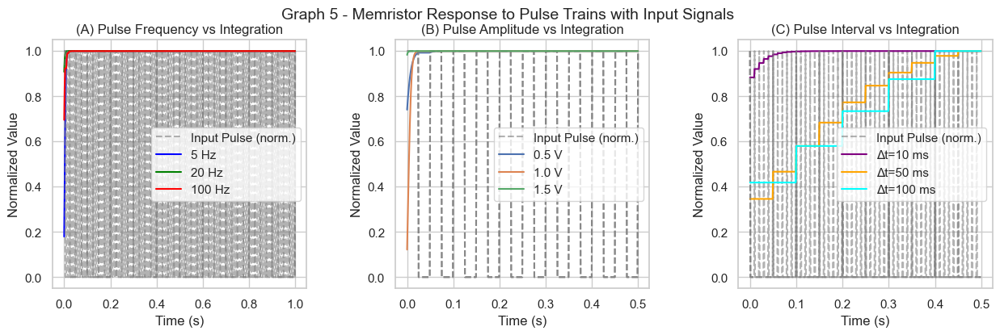

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(15, 4))
plt.subplots_adjust(wspace=0.35)

# Pulse frequency
freqs = [5, 20, 100]
colors = ['blue', 'green', 'red']
t = np.linspace(0, 1, 1000)
for f, c in zip(freqs, colors):
    mem = Memristor()
    V_train = (square(2*np.pi*f*t) + 1)/2 * 1.2
    G, _ = apply_voltage(mem, V_train, dt=1e-3)
    # Input signal
    ax[0].plot(t, V_train/V_train.max(), '--', color='gray', alpha=0.6, label='Input Pulse (norm.)' if f==freqs[0] else "")
    # Conductance
    ax[0].plot(t, G/G.max(), c, label=f'{f} Hz')
ax[0].set_title("(A) Pulse Frequency vs Integration")
ax[0].set_xlabel("Time (s)")
ax[0].set_ylabel("Normalized Value")
ax[0].legend()

# Pulse amplitude
amps = [0.5, 1.0, 1.5]
t = np.linspace(0, 0.5, 500)
for A in amps:
    mem = Memristor()
    V_train = (square(2*np.pi*20*t) + 1)/2 * A
    G, _ = apply_voltage(mem, V_train, dt=1e-3)
    ax[1].plot(t, V_train/V_train.max(), '--', color='gray', alpha=0.6, label='Input Pulse (norm.)' if A==amps[0] else "")
    ax[1].plot(t, G/G.max(), label=f'{A:.1f} V')
ax[1].set_title("(B) Pulse Amplitude vs Integration")
ax[1].set_xlabel("Time (s)")
ax[1].set_ylabel("Normalized Value")
ax[1].legend()

# Pulse interval
intervals = [0.01, 0.05, 0.1]
colors = ['purple', 'orange', 'cyan']
t = np.arange(0, 0.5, 0.001)
for dt_pulse, c in zip(intervals, colors):
    mem = Memristor()
    V = np.zeros_like(t)
    V[::int(dt_pulse/0.001)] = 1.2
    G, _ = apply_voltage(mem, V, dt=1e-3)
    ax[2].plot(t, V/V.max(), '--', color='gray', alpha=0.6, label='Input Pulse (norm.)' if dt_pulse==intervals[0] else "")
    ax[2].plot(t, G/G.max(), c, label=f'Δt={dt_pulse*1000:.0f} ms')
ax[2].set_title("(C) Pulse Interval vs Integration")
ax[2].set_xlabel("Time (s)")
ax[2].set_ylabel("Normalized Value")
ax[2].legend()

plt.suptitle("Graph 5 - Memristor Response to Pulse Trains with Input Signals", fontsize=14)
plt.show()


## 9 - Graph 7 - ΔG Map (Amplitude vs Duration)
Sensitivity surface that shows how conductance change depends on pulse amplitude and duration.
Yellow area: memristor changes significantly

- *useful for a Fault Injection*

AA

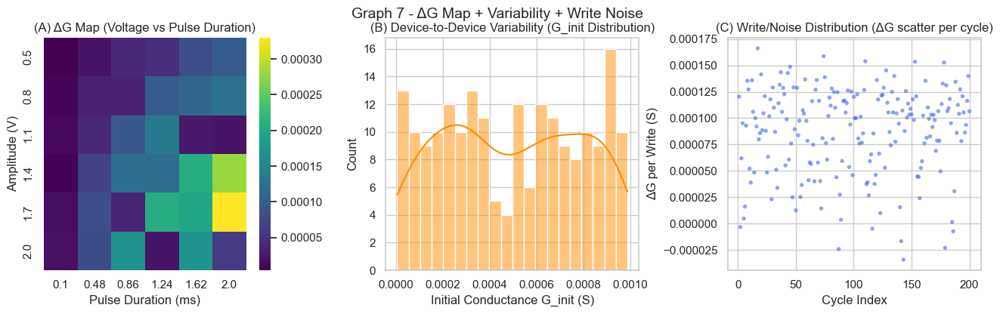

In [ ]:
# ΔG Map Voltage vs Pulse Duration
V_amps = np.linspace(0.5, 2.0, 6)
durations = np.linspace(0.1e-3, 2e-3, 6)
dG_matrix = np.zeros((len(V_amps), len(durations)))

for i, Va in enumerate(V_amps):
    for j, d in enumerate(durations):
        mem = Memristor()
        G0 = mem.G
        mem.update(Va, dt=d)
        dG_matrix[i, j] = mem.G - G0

# Device-to-Device Variability (G_init distribution)
n_devices = 200
G_init = [Memristor().G for _ in range(n_devices)]  # random variation of conductances

# Write Noise / Cycle-to-cycle ΔG scatter
Va = 1.2          # fixed programmable voltage
N_cycles = 200    # writing cycles
delta_Gs = []
for _ in range(N_cycles):
    mem = Memristor()
    G0 = mem.G
    mem.update(Va, dt=1e-3)
    delta_Gs.append(mem.G - G0 + np.random.normal(0, 0.02 * (mem.Gmax - mem.Gmin)))  # noise simulation
delta_Gs = np.array(delta_Gs)
cycle_idx = np.arange(1, N_cycles + 1)

fig, ax = plt.subplots(1, 3, figsize=(16, 4))
plt.subplots_adjust(wspace=0.35)

# ΔG Map
sns.heatmap(dG_matrix,
            xticklabels=np.round(durations*1e3, 2),
            yticklabels=np.round(V_amps, 2),
            cmap='viridis', ax=ax[0])
ax[0].set_title("(A) ΔG Map (Voltage vs Pulse Duration)")
ax[0].set_xlabel("Pulse Duration (ms)")
ax[0].set_ylabel("Amplitude (V)")

# Device-to-Device Variability
sns.histplot(G_init, bins=20, kde=True, color='darkorange', ax=ax[1])
ax[1].set_title("(B) Device-to-Device Variability (G_init Distribution)")
ax[1].set_xlabel("Initial Conductance G_init (S)")
ax[1].set_ylabel("Count")

# Write/Noise Distribution
ax[2].scatter(cycle_idx, delta_Gs, s=15, alpha=0.6, color='royalblue', edgecolor='none')
ax[2].set_title("(C) Write/Noise Distribution (ΔG scatter per cycle)")
ax[2].set_xlabel("Cycle Index")
ax[2].set_ylabel("ΔG per Write (S)")
ax[2].grid(True)

plt.suptitle("Graph 7 - ΔG Map + Variability + Write Noise", fontsize=14)
plt.show()


## 10 - Graph 8 - RC Charging (LIF Analogy)
How a memristor or RC circuit integrates voltage over time. Basic leaky-integrate behavior.

AA

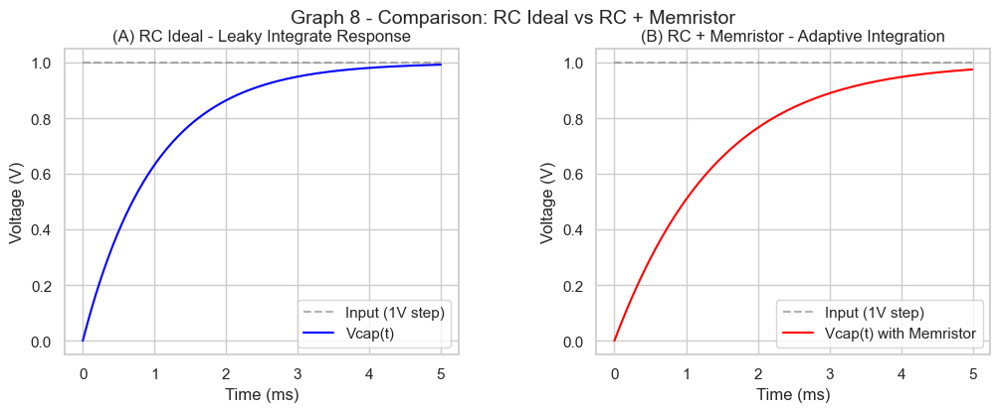

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
plt.subplots_adjust(wspace=0.35)

# (A) RC ideal - clásica integración exponencial (LIF base)
R = 1e3  # ohms
C = 1e-6  # farads
tau = R * C
t = np.linspace(0, 5*tau, 500)
V_in = np.ones_like(t)  # step input 1V
V_cap = 1.0 * (1 - np.exp(-t / tau))  # RC charging

ax[0].plot(t * 1e3, V_in, '--', color='gray', alpha=0.6, label='Input (1V step)')
ax[0].plot(t * 1e3, V_cap, color='blue', label='Vcap(t)')
ax[0].set_title("(A) RC Ideal - Leaky Integrate Response")
ax[0].set_xlabel("Time (ms)")
ax[0].set_ylabel("Voltage (V)")
ax[0].legend()
ax[0].grid(True)

# (B) RC + Memristor 
C = 1e-6
dt = 1e-5
t = np.arange(0, 5e-3, dt)
V_in = np.ones_like(t)  # 1V step
V_cap = np.zeros_like(t)
mem = Memristor(Gmin=1e-6, Gmax=1e-3)
V_cap[0] = 0

for i in range(1, len(t)):
    Rm = 1.0 / mem.G  # instant R_memristor
    dV = (V_in[i-1] - V_cap[i-1]) / (Rm * C)
    V_cap[i] = V_cap[i-1] + dV * dt
    mem.update(V_in[i-1] - V_cap[i-1], dt)  # update memristor state

ax[1].plot(t * 1e3, V_in, '--', color='gray', alpha=0.6, label='Input (1V step)')
ax[1].plot(t * 1e3, V_cap, color='red', label='Vcap(t) with Memristor')
ax[1].set_title("(B) RC + Memristor - Adaptive Integration")
ax[1].set_xlabel("Time (ms)")
ax[1].set_ylabel("Voltage (V)")
ax[1].legend()
ax[1].grid(True)

plt.suptitle("Graph 8 - Comparison: RC Ideal vs RC + Memristor", fontsize=14)
plt.show()

# pd.DataFrame([summary]).to_csv("results/device/device_params_extended.csv", index=False)
# print("Extended parameters saved to results/device/device_params_extended.csv")

Example of ADC quantization

AA

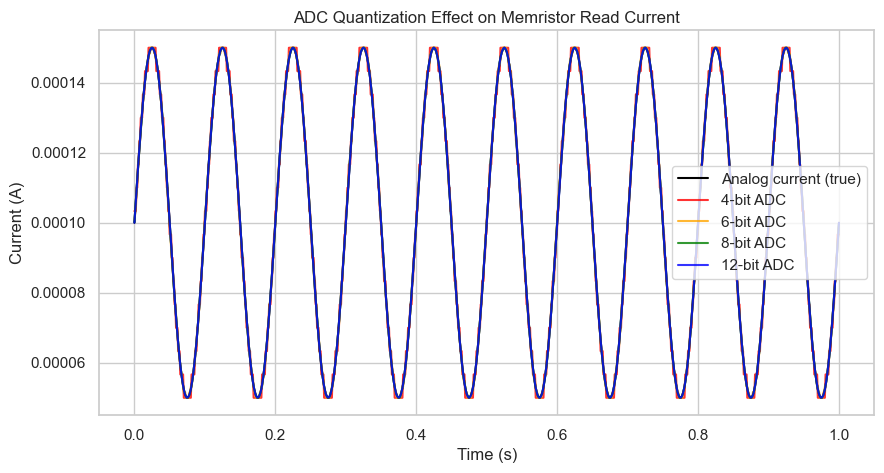

In [ ]:
# I vs t
t = np.linspace(0, 1, 1000)
I_true = 1e-4 * (1 + 0.5 * np.sin(2 * np.pi * 10 * t))  # 100 µA ± 50%

# Quantization function
def quantize(signal, bits):
    levels = 2 ** bits
    s_min, s_max = signal.min(), signal.max()
    step = (s_max - s_min) / (levels - 1)
    q_signal = np.round((signal - s_min) / step) * step + s_min
    return q_signal

# Resolutions of quantizations
bit_levels = [4, 6, 8, 12]
colors = ['red', 'orange', 'green', 'blue']

plt.figure(figsize=(10,5))
plt.plot(t, I_true, color='black', label="Analog current (true)", linewidth=1.5)

for bits, c in zip(bit_levels, colors):
    I_q = quantize(I_true, bits)
    plt.plot(t, I_q, color=c, alpha=0.8, label=f"{bits}-bit ADC")

plt.title("ADC Quantization Effect on Memristor Read Current")
plt.xlabel("Time (s)")
plt.ylabel("Current (A)")
plt.legend()
plt.grid(True)
plt.show()


# Dataset - MNIST

## White Box Model Inversion - No dataset

In [24]:
# Spike generation (rate/Bernoulli encoding)
def bernoulli_rate_encode(x_img: torch.Tensor, T: int, base_rate: float = 1.0) -> torch.Tensor:
    """
    Bernoulli (rate) encoding:
      x_img: [B,1,28,28] in [0,1]
      returns spikes: [T,B,1,28,28] in {0,1}
    Probability per voxel per timestep: p = clamp(x_img * base_rate, 0, 1)
    """
    x_img = x_img.clamp(0.0, 1.0)                                  # keep valid range
    p = (x_img * base_rate).clamp(0.0, 1.0)                        # spike probability map
    rand = torch.rand((T,) + x_img.shape, device=x_img.device)     # random uniforms
    return (rand < p.unsqueeze(0)).float()                         # sample spikes


# Margin-based inversion loss (avoids softmax saturation)
def logit_margin_loss(logits: torch.Tensor, target_class: int, lam: float = 1.0):
    """
    Margin loss:
        L = -logit_y + lam * max_{j!=y} logit_j
    Returns:
        L (scalar), mean target logit, mean max-other logit
    """
    y_logit = logits[:, target_class]                              # target class logit
    mask = torch.ones_like(logits, dtype=torch.bool)               # mask for non-target logits
    mask[:, target_class] = False                                  # exclude target
    other_max = logits.masked_select(mask).view(logits.size(0), -1).max(dim=1).values  # max competitor
    L = (-y_logit + lam * other_max).mean()                        # margin loss
    return L, y_logit.mean(), other_max.mean()

# Image priors (generic)
def tv_smoothness_penalty(x_img: torch.Tensor) -> torch.Tensor:
    """
    Total variation (TV) penalty to encourage smooth, digit-like structure.
    """
    dh = (x_img[:, :, 1:, :] - x_img[:, :, :-1, :]).abs().mean()   # vertical differences
    dw = (x_img[:, :, :, 1:] - x_img[:, :, :, :-1]).abs().mean()   # horizontal differences
    return dh + dw


def blur_prior_penalty(x_img: torch.Tensor, k: int = 3) -> torch.Tensor:
    """
    Blur prior to suppress high-frequency adversarial textures.
    Penalty: ||x - blur(x)||^2
    """
    pad = k // 2
    x_blur = F.avg_pool2d(x_img, kernel_size=k, stride=1, padding=pad)  # blurred version of x
    return ((x_img - x_blur) ** 2).mean()                                # L2 difference to its blur



# Full inversion attack: EOT + STE + (TV + L2 + Blur + Mean) + Two-stage schedule

def model_inversion_attack_eot_ste_full_blur_noproto(
    model: nn.Module,
    target_class: int,
    device="cuda",

    # Core attack settings
    steps: int = 1200,                 # more steps helps stage 2 refine structure
    K: int = 16,                       # EOT population size (8-32 typical)
    T: int = 25,                       # timesteps
    base_rate: float = 1.0,            # spike-rate scale

    # Optional base_rate schedule (usually keep OFF until sparsity is reasonable)
    use_base_rate_schedule: bool = False,
    base_rate_after: float = 1.1,
    base_rate_switch_iter: int = 350,

    # Main objective
    margin_lambda: float = 1.0,        # margin loss weight
    fr_target: float = 0.02,           # one-sided FR target (upper bound)

    # Regularization: Stage 1
    xi_sparsity: float = 0.5,          # global sparsity^2 weight
    xi_fr: float = 0.5,                # one-sided FR excess penalty weight
    xi_fr_l2: float = 0.5,             # FR^2 penalty weight

    xi_tv: float = 0.03,               # TV weight
    xi_l2: float = 0.02,               # L2 image energy weight

    xi_blur: float = 0.05,             # blur prior weight
    blur_k: int = 3,                   # blur kernel size (3 or 5)

    xi_mean: float = 0.3,              # mean(x) penalty weight
    mean_target: float = 0.15,         # target mean intensity

    # Two-stage schedule (Stage 2: stronger priors, lower LR)
    stage2_start: int = 250,

    xi_sparsity_stage2: float = 8.0,
    xi_fr_stage2: float = 3.0,
    xi_fr_l2_stage2: float = 6.0,
    xi_tv_stage2: float = 0.15,
    xi_l2_stage2: float = 0.06,
    xi_blur_stage2: float = 0.30,
    xi_mean_stage2: float = 0.5,

    lr_stage2: float = 0.005,          # lower LR in stage 2 to refine structure

    # Optimizer / stability
    lr: float = 0.05,                  # stage 1 LR
    seed: int = 0,
    grad_clip: float = 1.0,            # gradient clipping (stability)

    # Debug / logging
    log_every: int = 10,
    snapshot_every: int = 50,
    store_spike_sums: bool = True,
):
    """
    What this attack does:
      - Optimizes continuous image: z -> x_img = sigmoid(z) in [0,1]
      - Bernoulli rate-encodes to spikes across T timesteps
      - Uses EOT (population K) to handle stochastic spikes + stochastic memristor forward
      - Uses STE mapping back from spikes-gradients to image-gradients
      - Uses ONLY generic priors (TV/L2/blur/mean) — NO dataset-derived prototype
    """

    # Ensure device is torch.device
    device = torch.device(device)

    # Seeding
    torch.manual_seed(seed)
    if device.type == "cuda":
        torch.cuda.manual_seed_all(seed)

    # Model in eval mode (important for stability)
    model.eval()
    model.to(device)

    print("\n===== Starting Model Inversion Attack (Full + Blur, NO-PROTO) =====")
    print(f"Target class: {target_class}")
    print(f"Steps: {steps} | Population K: {K} | T: {T}")
    print(f"Stage1 LR: {lr} | Stage2 LR: {lr_stage2} @ iter {stage2_start}")
    print(f"base_rate: {base_rate} | margin_lambda: {margin_lambda} | fr_target: {fr_target} | mean_target: {mean_target} | blur_k: {blur_k}")
    print(f"Stage1 regs: xi_sparsity={xi_sparsity}, xi_fr={xi_fr}, xi_fr_l2={xi_fr_l2}, xi_tv={xi_tv}, xi_l2={xi_l2}, xi_blur={xi_blur}, xi_mean={xi_mean}")
    print(f"Stage2 regs: xi_sparsity={xi_sparsity_stage2}, xi_fr={xi_fr_stage2}, xi_fr_l2={xi_fr_l2_stage2}, xi_tv={xi_tv_stage2}, xi_l2={xi_l2_stage2}, xi_blur={xi_blur_stage2}, xi_mean={xi_mean_stage2}")
    if use_base_rate_schedule:
        print(f"base_rate schedule: {base_rate} -> {base_rate_after} at iter {base_rate_switch_iter}")
    print("=====================================================================\n")

    # Optimize z; x_img = sigmoid(z)
    z = torch.randn((1, 1, 28, 28), device=device, requires_grad=True)   # free variable
    optimizer = torch.optim.Adam([z], lr=lr)                             # Adam optimizer

    best_conf = -1.0                                                     # best confidence
    best_img = None                                                      # best image

    # Histories (for plots)
    hist = {
        "loss": [],
        "conf": [],
        "best_conf": [],
        "target_logit": [],
        "max_other_logit": [],

        "sparsity": [],
        "fr_mean": [],
        "fr_min": [],
        "fr_max": [],
        "fr_pen": [],
        "fr_l2": [],

        "tv": [],
        "l2_img": [],
        "blur_pen": [],
        "xmean": [],
        "mean_pen": [],

        "grad_norm": [],
        "base_rate": [],
        "stage": [],
        "lr": [],
    }

    # Snapshots
    snapshots = []

    # Main loop
    for it in range(steps):
        optimizer.zero_grad(set_to_none=True)                            # clear grads

        # Stage selection
        if it >= stage2_start:
            stage = 2
            curr_xi_sparsity = xi_sparsity_stage2
            curr_xi_fr = xi_fr_stage2
            curr_xi_fr_l2 = xi_fr_l2_stage2
            curr_xi_tv = xi_tv_stage2
            curr_xi_l2 = xi_l2_stage2
            curr_xi_blur = xi_blur_stage2
            curr_xi_mean = xi_mean_stage2

            # Lower LR for refinement
            for pg in optimizer.param_groups:
                pg["lr"] = lr_stage2
            curr_lr = lr_stage2
        else:
            stage = 1
            curr_xi_sparsity = xi_sparsity
            curr_xi_fr = xi_fr
            curr_xi_fr_l2 = xi_fr_l2
            curr_xi_tv = xi_tv
            curr_xi_l2 = xi_l2
            curr_xi_blur = xi_blur
            curr_xi_mean = xi_mean
            curr_lr = lr

        if it == stage2_start:
            print("\n>>> Entering Stage 2: increasing regularization and lowering LR <<<\n")

        # Optional base_rate schedule
        curr_base_rate = base_rate
        if use_base_rate_schedule and it >= base_rate_switch_iter:
            curr_base_rate = base_rate_after

        # Continuous image
        x_img = torch.sigmoid(z)                                         # [1,1,28,28] in [0,1]

        # Priors (computed once)
        tv = tv_smoothness_penalty(x_img)                                 # smoothness
        l2_img = (x_img ** 2).mean()                                      # energy
        blur_pen = blur_prior_penalty(x_img, k=blur_k)                    # suppress HF textures
        x_mean = x_img.mean()                                             # mean intensity
        mean_pen = (x_mean - mean_target) ** 2                            # mean control

        # EOT gradient accumulation
        grad_accum = torch.zeros_like(z)

        # Logging accumulators
        loss_sum = 0.0
        conf_sum = 0.0
        sparsity_sum = 0.0
        frpen_sum = 0.0
        frl2_sum = 0.0
        ylogit_sum = 0.0
        otherlogit_sum = 0.0
        fr_mean_sum = 0.0
        fr_min_sum = 0.0
        fr_max_sum = 0.0

        # EOT loop
        for _ in range(K):
            # Sample spikes (stochastic input)
            spikes = bernoulli_rate_encode(x_img, T=T, base_rate=curr_base_rate).detach()
            spikes.requires_grad_(True)

            # Forward (stochastic memristor behavior)
            logits = model(spikes)

            # Margin loss
            L_main, y_logit, other_logit = logit_margin_loss(
                logits, target_class=target_class, lam=margin_lambda
            )

            # Sparsity and firing rates
            sparsity = spikes.mean()                                      # global spike ratio
            fr_t = spikes.mean(dim=(1, 2, 3, 4))                          # per-timestep FR [T]

            sparsity_pen = sparsity ** 2                                  # quadratic sparsity (harsher)
            fr_l2 = (fr_t ** 2).mean()                                    # per-timestep L2 penalty

            # One-sided FR excess penalty (only penalize above target)
            fr_excess = torch.relu(fr_t - fr_target)
            fr_pen = (fr_excess ** 2).mean()

            # Loss without image priors (priors added once outside EOT)
            Lk = (L_main
                  + curr_xi_sparsity * sparsity_pen
                  + curr_xi_fr * fr_pen
                  + curr_xi_fr_l2 * fr_l2)

            # Gradient w.r.t spikes
            g_spk = torch.autograd.grad(Lk, spikes, retain_graph=False, create_graph=False)[0]

            with torch.no_grad():
                # STE: map spikes-gradient -> image-gradient
                g_img = g_spk.mean(dim=0) * float(curr_base_rate)         # dL/dx approx
                g_z = g_img * (x_img * (1.0 - x_img))                     # chain through sigmoid
                grad_accum += g_z

                # Logging
                probs = F.softmax(logits.detach(), dim=1)
                conf_sum += float(probs[0, target_class].item())

                loss_sum += float(Lk.item())
                sparsity_sum += float(sparsity.item())
                frpen_sum += float(fr_pen.item())
                frl2_sum += float(fr_l2.item())
                ylogit_sum += float(y_logit.item())
                otherlogit_sum += float(other_logit.item())
                fr_mean_sum += float(fr_t.mean().item())
                fr_min_sum += float(fr_t.min().item())
                fr_max_sum += float(fr_t.max().item())

        # Image priors (added once)
        prior_loss = (curr_xi_tv * tv
                      + curr_xi_l2 * l2_img
                      + curr_xi_blur * blur_pen
                      + curr_xi_mean * mean_pen)

        prior_grad = torch.autograd.grad(prior_loss, z, retain_graph=False, create_graph=False)[0]

        # Final gradient
        grad = (grad_accum / float(K)) + prior_grad

        # Gradient clipping
        grad_norm = grad.norm().clamp_min(1e-12)
        if grad_clip is not None and grad_clip > 0:
            clip_coef = min(1.0, grad_clip / float(grad_norm.item()))
            grad = grad * clip_coef

        # Optim step
        z.grad = grad
        optimizer.step()

        # Track best confidence
        avg_conf = conf_sum / float(K)
        if avg_conf > best_conf:
            best_conf = avg_conf
            best_img = torch.sigmoid(z.detach()).clone()

        # Store histories
        hist["loss"].append(loss_sum / float(K))
        hist["conf"].append(avg_conf)
        hist["best_conf"].append(best_conf)
        hist["target_logit"].append(ylogit_sum / float(K))
        hist["max_other_logit"].append(otherlogit_sum / float(K))

        hist["sparsity"].append(sparsity_sum / float(K))
        hist["fr_mean"].append(fr_mean_sum / float(K))
        hist["fr_min"].append(fr_min_sum / float(K))
        hist["fr_max"].append(fr_max_sum / float(K))
        hist["fr_pen"].append(frpen_sum / float(K))
        hist["fr_l2"].append(frl2_sum / float(K))

        hist["tv"].append(float(tv.item()))
        hist["l2_img"].append(float(l2_img.item()))
        hist["blur_pen"].append(float(blur_pen.item()))
        hist["xmean"].append(float(x_mean.item()))
        hist["mean_pen"].append(float(mean_pen.item()))

        hist["grad_norm"].append(float(grad_norm.item()))
        hist["base_rate"].append(float(curr_base_rate))
        hist["stage"].append(stage)
        hist["lr"].append(float(curr_lr))

        # Save snapshots
        if snapshot_every is not None and snapshot_every > 0 and (it % snapshot_every == 0 or it == steps - 1):
            snap = {"iter": it, "x_img": x_img.detach().cpu().clone()}
            if store_spike_sums:
                with torch.no_grad():
                    spikes_vis = bernoulli_rate_encode(x_img, T=T, base_rate=curr_base_rate)
                    spike_sum = spikes_vis.sum(dim=0)                     # sum over time
                    snap["spike_sum"] = spike_sum.detach().cpu().clone()
            snapshots.append(snap)

        # Debug prints
        if (it % log_every) == 0 or (it == steps - 1):
            print(f"\n[Iter {it:04d}/{steps}] stage={stage} base_rate={curr_base_rate:.3f} lr={curr_lr:.4f}")
            print(f"  avg_conf(target)     : {avg_conf:.6f}   (best={best_conf:.6f})")
            print(f"  avg_loss(no_priors)  : {hist['loss'][-1]:.6f}")
            print(f"  avg_target_logit     : {hist['target_logit'][-1]:.6f}")
            print(f"  avg_max_other_logit  : {hist['max_other_logit'][-1]:.6f}")
            print(f"  avg_sparsity         : {hist['sparsity'][-1]:.6f}")
            print(f"  fr_mean/min/max      : {hist['fr_mean'][-1]:.6f} / {hist['fr_min'][-1]:.6f} / {hist['fr_max'][-1]:.6f}")
            print(f"  fr_pen(one-sided)    : {hist['fr_pen'][-1]:.6f}   fr_l2: {hist['fr_l2'][-1]:.6f}")
            print(f"  tv={hist['tv'][-1]:.6f} l2={hist['l2_img'][-1]:.6f} blur={hist['blur_pen'][-1]:.6f}")
            print(f"  xmean={hist['xmean'][-1]:.6f} mean_pen={hist['mean_pen'][-1]:.6f} grad_norm={hist['grad_norm'][-1]:.6f}")

            if torch.isnan(z).any():
                print("NaN detected in z. Stopping.")
                break

    print("\n===== Attack Finished =====")
    print(f"Best confidence achieved: {best_conf:.6f}")
    print("===========================\n")

    return {
        "best_x_img": best_img,
        "final_x_img": torch.sigmoid(z.detach()),
        "best_conf": best_conf,
        "history": hist,
        "snapshots": snapshots,
    }


===== Starting Model Inversion Attack (Full + Blur, NO-PROTO) =====
Target class: 7
Steps: 1200 | Population K: 16 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.3, xi_mean=0.5


[Iter 0000/1200] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.004274   (best=0.004274)
  avg_loss(no_priors)  : 5.775580
  avg_target_logit     : -7.778869
  avg_max_other_logit  : -2.357357
  avg_sparsity         : 0.492223
  fr_mean/min/max      : 0.492223 / 0.460459 / 0.527663
  fr_pen(one-sided)    : 0.223276   fr_l2: 0.242564
  tv=0.456120 l2=0.281494 blur=0.039050
  xmean=0.491786 mean_pen=0.116818 grad_norm=0.003021

[Iter 0010/1200] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.003834   (b

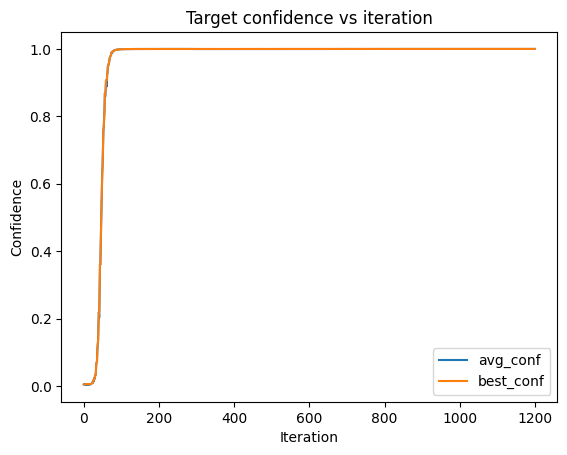

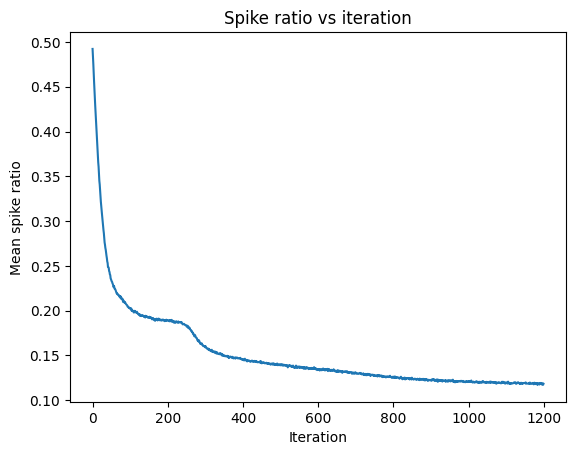

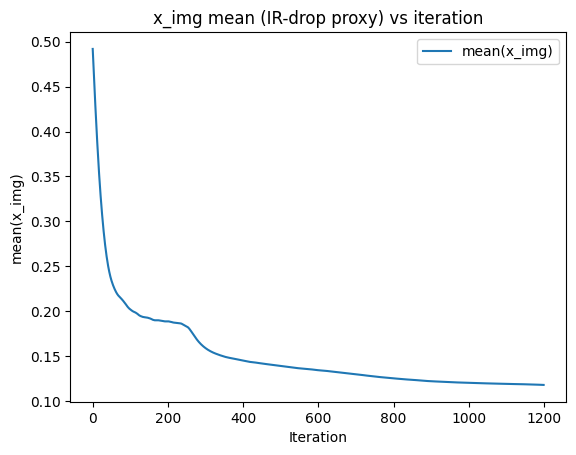

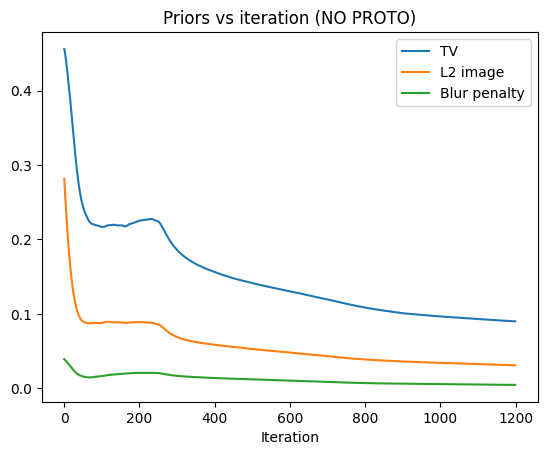

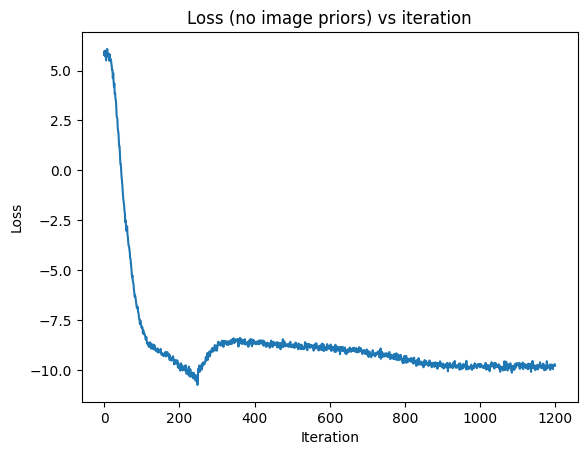

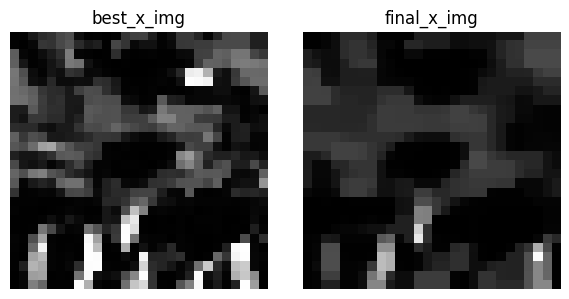

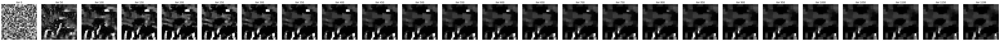

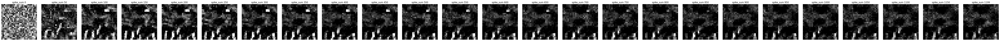

In [25]:
result = model_inversion_attack_eot_ste_full_blur_noproto(
    model=model,
    target_class=7,
    device=device,          # torch.device or "cuda"/"cpu"
    steps=1200,
    K=16,
    T=model.T,
    base_rate=1.0,
    use_base_rate_schedule=False,

    snapshot_every=50,
)

print("Best confidence:", result["best_conf"])

hist = result["history"]

plt.figure()
plt.plot(hist["conf"], label="avg_conf")
plt.plot(hist["best_conf"], label="best_conf")
plt.title("Target confidence vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Confidence")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist["sparsity"])
plt.title("Spike ratio vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Mean spike ratio")
plt.show()

plt.figure()
plt.plot(hist["xmean"], label="mean(x_img)")
plt.title("x_img mean (IR-drop proxy) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("mean(x_img)")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist["tv"], label="TV")
plt.plot(hist["l2_img"], label="L2 image")
plt.plot(hist["blur_pen"], label="Blur penalty")
plt.title("Priors vs iteration (NO PROTO)")
plt.xlabel("Iteration")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist["loss"])
plt.title("Loss (no image priors) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.show()

plt.figure(figsize=(6,3))

plt.subplot(1,2,1)
plt.imshow(result["best_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("best_x_img")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(result["final_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("final_x_img")
plt.axis("off")

plt.tight_layout()
plt.show()

snaps = result["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()


Digit 0 — running 3 seeds | steps=1200 K=32 stage2_start=600

----------------------------------------------------------------------
Running digit=0, seed=0
----------------------------------------------------------------------

===== Starting Model Inversion Attack (Full + Blur, NO-PROTO) =====
Target class: 0
Steps: 1200 | Population K: 32 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 600
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.15, xi_mean=0.5


[Iter 0000/1200] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.000351   (best=0.000351)
  avg_loss(no_priors)  : 8.331846
  avg_target_logit     : -10.338511
  avg_max_other_logit  : -2.360031
  avg_sparsity         : 0.491747
  fr_mean/min/max      : 0.491747 / 0.458785 / 0.524354
  fr_

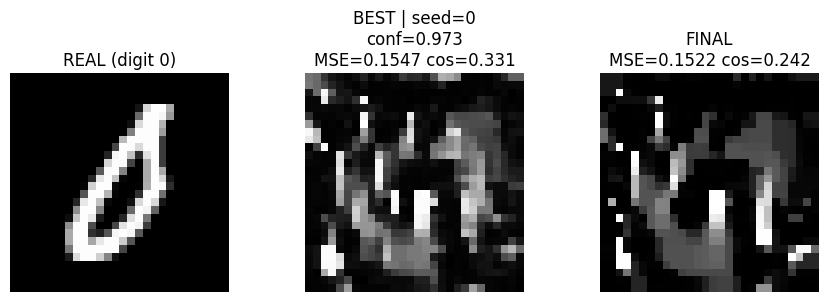

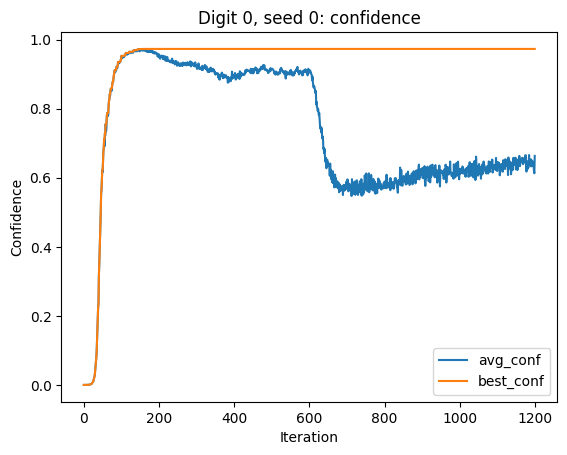


----------------------------------------------------------------------
Running digit=0, seed=1
----------------------------------------------------------------------

===== Starting Model Inversion Attack (Full + Blur, NO-PROTO) =====
Target class: 0
Steps: 1200 | Population K: 32 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 600
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.15, xi_mean=0.5


[Iter 0000/1200] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.000496   (best=0.000496)
  avg_loss(no_priors)  : 7.584506
  avg_target_logit     : -10.091123
  avg_max_other_logit  : -2.860738
  avg_sparsity         : 0.492277
  fr_mean/min/max      : 0.492277 / 0.460021 / 0.523079
  fr_pen(one-sided)    : 0.223304   fr_l2: 0.242595
  tv=0.496738 l

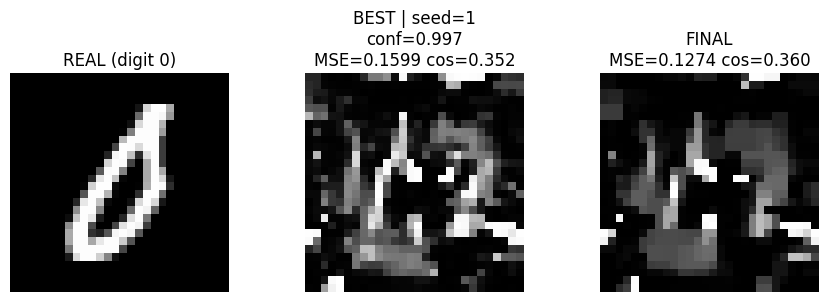

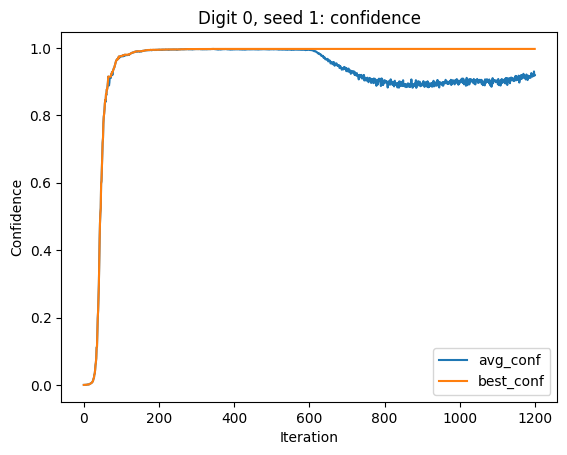


----------------------------------------------------------------------
Running digit=0, seed=2
----------------------------------------------------------------------

===== Starting Model Inversion Attack (Full + Blur, NO-PROTO) =====
Target class: 0
Steps: 1200 | Population K: 32 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 600
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.15, xi_mean=0.5


[Iter 0000/1200] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.000493   (best=0.000493)
  avg_loss(no_priors)  : 7.845596
  avg_target_logit     : -10.190270
  avg_max_other_logit  : -2.695182
  avg_sparsity         : 0.489788
  fr_mean/min/max      : 0.489788 / 0.456912 / 0.523557
  fr_pen(one-sided)    : 0.220962   fr_l2: 0.240153
  tv=0.473460 l

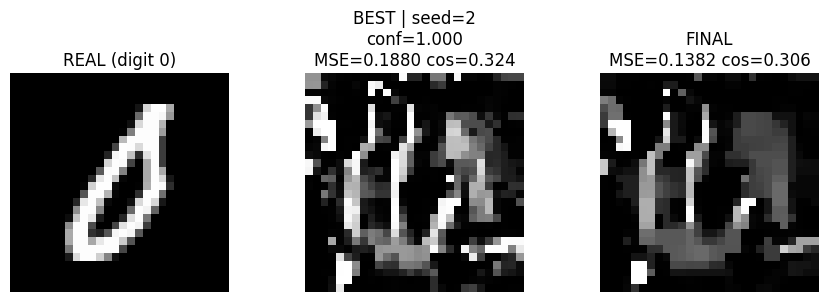

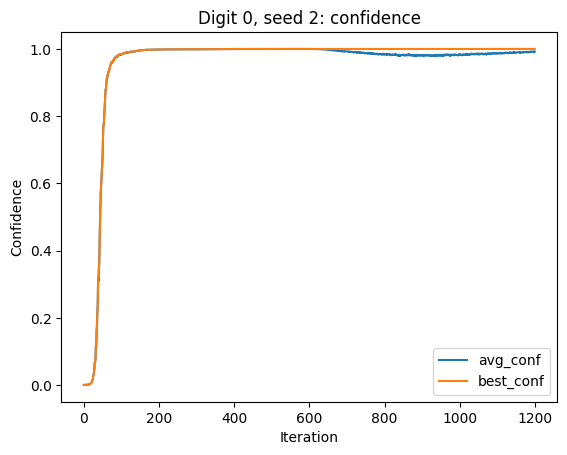


>>> Digit 0: selected BEST seed = 0 (by lowest MSE(best), tie-break by conf)

Digit 1 — running 3 seeds | steps=1200 K=32 stage2_start=600

----------------------------------------------------------------------
Running digit=1, seed=0
----------------------------------------------------------------------

===== Starting Model Inversion Attack (Full + Blur, NO-PROTO) =====
Target class: 1
Steps: 1200 | Population K: 32 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 600
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.15, xi_mean=0.5


[Iter 0000/1200] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.000038   (best=0.000038)
  avg_loss(no_priors)  : 10.509136
  avg_target_logit     : -12.539463
  avg_max_other_logit  : -2.383693
  avg_sparsity  

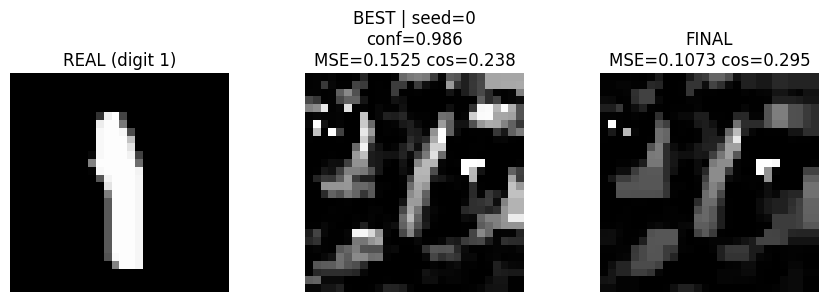

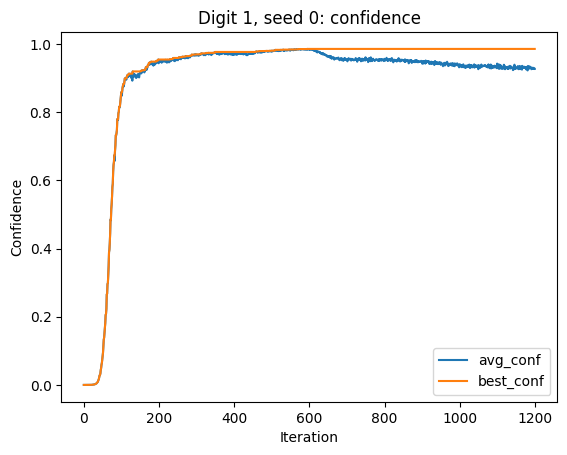


----------------------------------------------------------------------
Running digit=1, seed=1
----------------------------------------------------------------------

===== Starting Model Inversion Attack (Full + Blur, NO-PROTO) =====
Target class: 1
Steps: 1200 | Population K: 32 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 600
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.15, xi_mean=0.5


[Iter 0000/1200] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.000014   (best=0.000014)
  avg_loss(no_priors)  : 11.135125
  avg_target_logit     : -13.664311
  avg_max_other_logit  : -2.883307
  avg_sparsity         : 0.492277
  fr_mean/min/max      : 0.492277 / 0.460021 / 0.523079
  fr_pen(one-sided)    : 0.223304   fr_l2: 0.242595
  tv=0.496738 

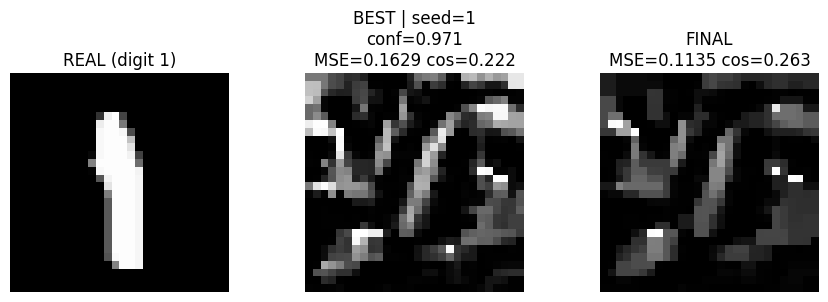

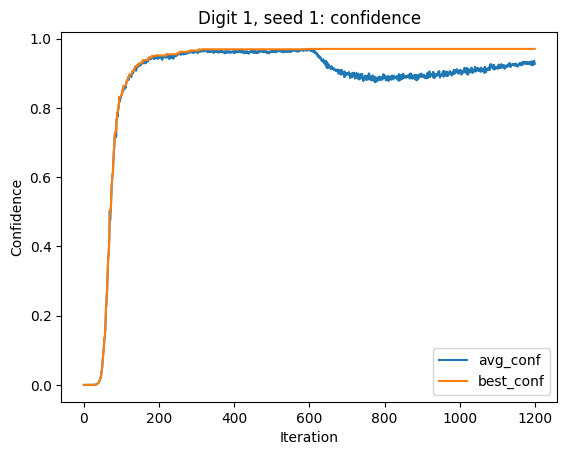


----------------------------------------------------------------------
Running digit=1, seed=2
----------------------------------------------------------------------

===== Starting Model Inversion Attack (Full + Blur, NO-PROTO) =====
Target class: 1
Steps: 1200 | Population K: 32 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 600
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.15, xi_mean=0.5


[Iter 0000/1200] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.000012   (best=0.000012)
  avg_loss(no_priors)  : 11.491345
  avg_target_logit     : -13.846593
  avg_max_other_logit  : -2.705757
  avg_sparsity         : 0.489788
  fr_mean/min/max      : 0.489788 / 0.456912 / 0.523557
  fr_pen(one-sided)    : 0.220962   fr_l2: 0.240153
  tv=0.473460 

KeyboardInterrupt: 

: 

In [ ]:
# =========================
# CELL — Strong run: digits 0..9, 3 seeds each
# Requested:
#   steps=1200, K=32, stage2_start=250, lr=0.05, lr_stage2=0.005,
#   xi_blur_stage2=0.15, snapshot_every=50, 3 seeds/digit
# Compares vs one real MNIST sample per class.
# =========================
# ---- your requested settings ----
steps_per_run = 1200
K_eot = 32
stage2_start = 600 #250 
lr_stage1 = 0.05
lr_stage2 = 0.005
xi_blur_stage2 = 0.15
snapshot_every = 50
seeds_per_digit = [0, 1, 2]  # 3 seeds

base_rate = 1.0

# ---- helper: pick one real image per class from loader ----
@torch.no_grad()
def pick_one_mnist_per_class(loader, device="cpu", max_batches=2000):
    out = {}
    for bi, (xb, yb) in enumerate(loader):
        for c in range(10):
            if c in out:
                continue
            mask = (yb == c)
            if mask.any():
                out[c] = xb[mask][0:1].to(device)  # [1,1,28,28]
        if len(out) == 10:
            break
        if bi >= max_batches:
            break
    missing = [c for c in range(10) if c not in out]
    if missing:
        print("[WARN] Missing classes from loader:", missing)
    return out

@torch.no_grad()
def similarity_metrics(x_gen, x_real):
    a = x_gen.detach().float().view(1, -1)
    b = x_real.detach().float().view(1, -1)
    mse = F.mse_loss(a, b).item()
    cos = F.cosine_similarity(a, b, dim=1).item()
    return mse, cos

# ---- real samples on CUDA for comparison ----
real_imgs_v2 = pick_one_mnist_per_class(train_loader, device="cuda")

# ---- run all attacks ----
results_noproto_0to9_seeds_v2 = {}   # results_noproto_0to9_seeds_v2[digit][seed] = res
best_run_by_digit_v2 = {}            # stores chosen best per digit (by MSE, tie-break by conf)
summary_rows_v2 = []                 # one row per run

for digit in range(10):
    results_noproto_0to9_seeds_v2[digit] = {}

    x_real = real_imgs_v2[digit].detach()

    # track best run for this digit
    best_key = None
    best_score = None  # tuple for ordering: (mse_best, -best_conf)  (lower is better)

    print("\n" + "="*80)
    print(f"Digit {digit} — running {len(seeds_per_digit)} seeds "
          f"| steps={steps_per_run} K={K_eot} stage2_start={stage2_start}")
    print("="*80)

    for seed in seeds_per_digit:
        print("\n" + "-"*70)
        print(f"Running digit={digit}, seed={seed}")
        print("-"*70)

        # IMPORTANT: this assumes your function accepts these kwargs.
        # If your signature differs, tell me exactly what params it exposes and I’ll adapt.
        res = model_inversion_attack_eot_ste_full_blur_noproto(
            model=model,
            target_class=digit,
            device=device,
            steps=steps_per_run,
            K=K_eot,
            T=model.T,
            base_rate=base_rate,
            use_base_rate_schedule=False,

            # stage/optimizer schedule
            stage2_start=stage2_start,
            lr=lr_stage1,
            lr_stage2=lr_stage2,

            # requested blur stage2
            xi_blur_stage2=xi_blur_stage2,

            snapshot_every=snapshot_every,

            # deterministic variation
            seed=seed,
        )

        results_noproto_0to9_seeds_v2[digit][seed] = res

        x_best = res["best_x_img"].detach()
        x_final = res["final_x_img"].detach()

        mse_best, cos_best = similarity_metrics(x_best, x_real)
        mse_final, cos_final = similarity_metrics(x_final, x_real)

        row = {
            "digit": digit,
            "seed": seed,
            "best_conf": float(res["best_conf"]),
            "mse_best": mse_best,
            "cos_best": cos_best,
            "mse_final": mse_final,
            "cos_final": cos_final,
        }
        summary_rows_v2.append(row)

        # choose best run by MSE(best), tie-break by higher confidence
        score = (mse_best, -float(res["best_conf"]))
        if (best_score is None) or (score < best_score):
            best_score = score
            best_key = seed

        # quick visualization per run (REAL vs BEST vs FINAL)
        plt.figure(figsize=(9,3))
        plt.subplot(1,3,1)
        plt.imshow(x_real[0,0].detach().cpu().numpy(), cmap="gray", vmin=0, vmax=1)
        plt.title(f"REAL (digit {digit})")
        plt.axis("off")

        plt.subplot(1,3,2)
        plt.imshow(x_best[0,0].detach().cpu().numpy(), cmap="gray", vmin=0, vmax=1)
        plt.title(f"BEST | seed={seed}\nconf={res['best_conf']:.3f}\nMSE={mse_best:.4f} cos={cos_best:.3f}")
        plt.axis("off")

        plt.subplot(1,3,3)
        plt.imshow(x_final[0,0].detach().cpu().numpy(), cmap="gray", vmin=0, vmax=1)
        plt.title(f"FINAL\nMSE={mse_final:.4f} cos={cos_final:.3f}")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

        # confidence curve (compact)
        hist = res["history"]
        plt.figure()
        plt.plot(hist["conf"], label="avg_conf")
        plt.plot(hist["best_conf"], label="best_conf")
        plt.title(f"Digit {digit}, seed {seed}: confidence")
        plt.xlabel("Iteration")
        plt.ylabel("Confidence")
        plt.legend()
        plt.show()

    # store chosen best seed per digit
    best_run_by_digit_v2[digit] = best_key
    print(f"\n>>> Digit {digit}: selected BEST seed = {best_key} (by lowest MSE(best), tie-break by conf)")

# ---- summary print ----
print("\n" + "#"*90)
print("SUMMARY (each run): lower MSE is better; higher cosine is better; best_conf is model confidence.")
print("#"*90)
for r in summary_rows_v2:
    print(
        f"digit={r['digit']} seed={r['seed']} | best_conf={r['best_conf']:.6f} | "
        f"MSE(best)={r['mse_best']:.5f} cos(best)={r['cos_best']:.3f} | "
        f"MSE(final)={r['mse_final']:.5f} cos(final)={r['cos_final']:.3f}"
    )

print("\n" + "#"*90)
print("BEST SEED PER DIGIT (picked by lowest MSE(best), tie-break by highest confidence):")
print("#"*90)
for d in range(10):
    print(f"digit {d}: seed {best_run_by_digit_v2[d]}")

## Privacy Attack - Model Inversion

Restarting refined inversion attack (class 0)
Iter 0000 | loss=3.5905 | prob_t=0.0135 | margin=-3.5306 | tv=0.0237 | dens=0.2856 | sigma=2.00 | temp=1.00
Iter 0100 | loss=-10.1609 | prob_t=0.9999 | margin=10.2308 | tv=0.0789 | dens=0.1897 | sigma=1.67 | temp=2.17
Iter 0200 | loss=-13.0166 | prob_t=1.0000 | margin=13.1100 | tv=0.1256 | dens=0.2256 | sigma=1.33 | temp=3.33
Iter 0300 | loss=-14.5458 | prob_t=1.0000 | margin=14.6508 | tv=0.1610 | dens=0.2452 | sigma=1.00 | temp=4.50
Iter 0400 | loss=-15.1603 | prob_t=1.0000 | margin=15.2727 | tv=0.2082 | dens=0.2493 | sigma=0.67 | temp=5.67
Iter 0500 | loss=-15.9504 | prob_t=1.0000 | margin=16.0699 | tv=0.2561 | dens=0.2575 | sigma=0.50 | temp=6.83
Iter 0599 | loss=-16.0213 | prob_t=1.0000 | margin=16.1416 | tv=0.2581 | dens=0.2603 | sigma=0.50 | temp=7.99


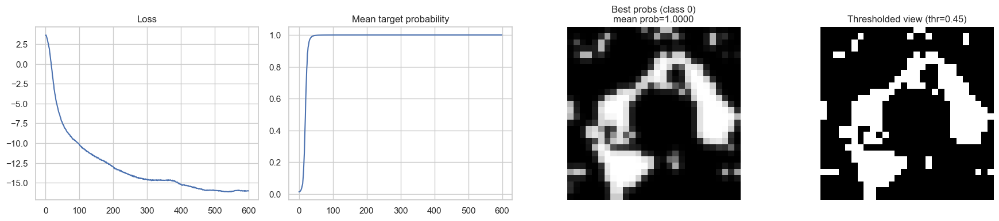

In [ ]:
def gaussian_kernel2d(kernel_size: int, sigma: float, device, dtype):
    x = torch.arange(kernel_size, device=device, dtype=dtype) - (kernel_size - 1) / 2.0
    gauss_1d = torch.exp(-(x**2) / (2 * sigma * sigma))
    gauss_1d = gauss_1d / (gauss_1d.sum() + 1e-12)
    gauss_2d = gauss_1d[:, None] * gauss_1d[None, :]
    return gauss_2d

def blur_2d(img_bchw: torch.Tensor, sigma: float):
    """
    img_bchw: [B, 1, H, W]
    Returns blurred image with same shape.
    """
    if sigma <= 0.0:
        return img_bchw

    device = img_bchw.device
    dtype = img_bchw.dtype

    k = int(2 * int(3.0 * sigma) + 1)
    k = max(k, 3)
    if k % 2 == 0:
        k += 1

    kernel2d = gaussian_kernel2d(k, sigma, device, dtype).view(1, 1, k, k)
    pad = k // 2
    return F.conv2d(img_bchw, kernel2d, padding=pad)


def sigmoid_anneal(x, temp: float):
    """
    Sharper sigmoid as temp increases.
    temp ~ 1.0 is normal; higher => more binary.
    """
    return torch.sigmoid(x * temp)


device = next(model.parameters()).device
model.eval()

# Temporarily disable read noise to reduce stochasticity from the device model
original_read_noise = model.reram_device.read_noise_std
model.reram_device.read_noise_std = 0.0

target_class = 0
iters = 600
population_size = 64          # increased population improves gradient estimate
lr = 1.5                      # slightly less aggressive than 2.0 (more stable)
lambda_tv = 0.3               # TV regularization (stroke smoothness)
lambda_density = 0.12         # encourages sparse strokes (avoid full-white) 0.08
lambda_blur = 0.2             # encourages smooth probability maps early

# Latent map initialization: slightly biased to low activity helps avoid saturation
latent_map = (torch.randn((1, 1, 28, 28), device=device) * 0.5 - 0.8).requires_grad_(True)

optimizer = torch.optim.SGD([latent_map], lr=lr, momentum=0.9)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[300, 500], gamma=0.5)

print(f"Restarting refined inversion attack (class {target_class})")

history = {
    "loss": [],
    "prob_t": [],
    "margin": [],
    "tv": [],
    "dens": [],
}

best_prob = -1.0
best_img = None

for i in range(iters):
    optimizer.zero_grad(set_to_none=True)

    # Anneal blur and sigmoid sharpness
    sigma = max(0.5, 2.0 * (1.0 - (i / float(iters))))          # 2.0 t0 0.5
    temp  = 1.0 + 7.0 * (i / float(iters))                      # 1.0 to 5.0

    # Build a population batch from the same latent (better gradient estimate)
    batch_latent = latent_map.repeat(population_size, 1, 1, 1)

    probs = sigmoid_anneal(batch_latent, temp=temp)             # [B,1,28,28]
    probs_smooth = blur_2d(probs, sigma=sigma)                  # smooth map used for sampling and regs
    probs_smooth = probs_smooth.clamp(0.0, 1.0)

    # Poisson sampling for spikes: [T, B, 1, 28, 28]
    probs_T = probs_smooth.unsqueeze(0).expand(model.T, *probs_smooth.shape)
    rand_mask = torch.rand_like(probs_T)
    spikes_hard = (rand_mask < probs_T).float()

    # Straight-through estimator: forward hard spikes, backward through probs_T
    spikes_in = (spikes_hard - probs_T.detach()) + probs_T

    logits = model(spikes_in)          # [B,10]

    # Margin loss: force target to dominate
    logit_t = logits[:, target_class]
    logits_other = logits.clone()
    logits_other[:, target_class] = -1e9
    max_other = logits_other.max(dim=1).values
    margin = logit_t - max_other        # positive and large

    # Convert to a loss, maximize margin => minimize (-margin)  
    loss_margin = (-margin).mean()

    # TV loss on smoothed probs (helps connected strokes)
    tv = (
        torch.abs(probs_smooth[:, :, :, 1:] - probs_smooth[:, :, :, :-1]).mean()
        + torch.abs(probs_smooth[:, :, 1:, :] - probs_smooth[:, :, :-1, :]).mean()
    )

    # Density (sparsity) loss
    dens = probs_smooth.mean()

    # Blur consistency term: discourage high-frequency noise in the raw probs
    # This pushes probs to be close to its blurred version early.
    blur_consistency = (probs - probs_smooth).abs().mean()

    loss = loss_margin + lambda_tv * tv + lambda_density * dens + lambda_blur * blur_consistency
    loss.backward()

    optimizer.step()
    scheduler.step()

    with torch.no_grad():
        probs_out = F.softmax(logits, dim=1)
        prob_t = probs_out[:, target_class].mean().item()
        margin_mean = margin.mean().item()

        history["loss"].append(loss.item())
        history["prob_t"].append(prob_t)
        history["margin"].append(margin_mean)
        history["tv"].append(tv.item())
        history["dens"].append(dens.item())

        if prob_t > best_prob:
            best_prob = prob_t
            best_img = probs_smooth[:1].detach().cpu()          # store [1,1,28,28]

    if i % 100 == 0 or i == iters - 1:
        print(
            f"Iter {i:04d} | loss={loss.item():.4f} | "
            f"prob_t={prob_t:.4f} | margin={margin_mean:.4f} | "
            f"tv={tv.item():.4f} | dens={dens.item():.4f} | sigma={sigma:.2f} | temp={temp:.2f}"
        )

# Restore read noise
model.reram_device.read_noise_std = original_read_noise

if best_img is None:
    print("Attack did not converge.")
else:
    raw = best_img.squeeze().numpy()                            # [28,28]
    raw_norm = (raw - raw.min()) / (raw.max() - raw.min() + 1e-12)

    # Two visualizations:
    # 1) Smooth probability map (what the optimizer really found)
    # 2) Thresholded binary view (paper-friendly)
    thr = 0.45
    binary = (raw_norm > thr).astype(float)

    fig, ax = plt.subplots(1, 4, figsize=(18, 4))

    ax[0].plot(history["loss"])
    ax[0].set_title("Loss")
    ax[0].grid(True)

    ax[1].plot(history["prob_t"])
    ax[1].set_title("Mean target probability")
    ax[1].grid(True)

    ax[2].imshow(raw_norm, cmap="gray", vmin=0, vmax=1)
    ax[2].set_title(f"Best probs (class {target_class})\nmean prob={best_prob:.4f}")
    ax[2].axis("off")

    ax[3].imshow(binary, cmap="gray", vmin=0, vmax=1)
    ax[3].set_title(f"Thresholded view (thr={thr})")
    ax[3].axis("off")

    plt.tight_layout()
    plt.show()

Starting massive inversion attack (classes 0-9)
  Attacking class 0...
    Done. Best mean target logit: 3.02
  Attacking class 1...
    Done. Best mean target logit: 2.17
  Attacking class 2...
    Done. Best mean target logit: 4.37
  Attacking class 3...
    Done. Best mean target logit: 4.10
  Attacking class 4...
    Done. Best mean target logit: 4.46
  Attacking class 5...
    Done. Best mean target logit: 4.03
  Attacking class 6...
    Done. Best mean target logit: 5.45
  Attacking class 7...
    Done. Best mean target logit: 4.78
  Attacking class 8...
    Done. Best mean target logit: 3.14
  Attacking class 9...
    Done. Best mean target logit: 2.96


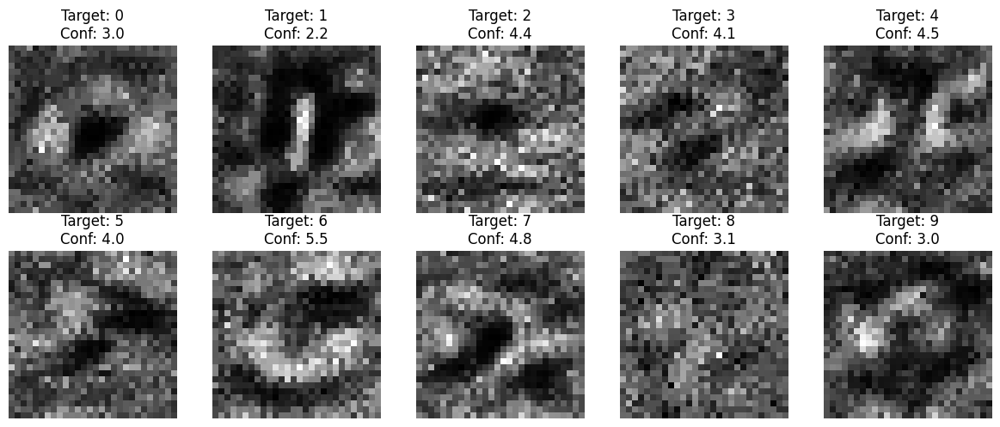

In [ ]:
device = next(model.parameters()).device
model.eval()

# Keep read noise at 0 during inversion (restore at the end)
original_read_noise = model.reram_device.read_noise_std
model.reram_device.read_noise_std = 0.0

# Hyperparameters
iters = 450
population_size = 32
lr = 2.0
lambda_tv = 0.5
blur_radius = 1  # kept for compatibility (kernel is fixed below)

# gradient blur (depthwise conv, keeps everything on GPU)
def gaussian_blur_grad(grad):
    # grad: [1,1,28,28]
    k = torch.tensor([[1, 2, 1],
                      [2, 4, 2],
                      [1, 2, 1]], device=grad.device, dtype=grad.dtype)
    k = (k / k.sum()).view(1, 1, 3, 3)
    return F.conv2d(grad, k, padding=1)

# Store results
inverted_images = []
confidences = []

print("Starting massive inversion attack (classes 0-9)")

fig, axes = plt.subplots(2, 5, figsize=(12, 5))
axes = axes.flatten()

for target_class in range(10):
    print(f"  Attacking class {target_class}...")

    # Fresh latent per class
    latent_map = torch.randn((1, 1, 28, 28), device=device) * 0.5 - 1.0
    latent_map.requires_grad_(True)

    optimizer = torch.optim.SGD([latent_map], lr=lr, momentum=0.9)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=100, gamma=0.5)

    best_conf_iter = None          # keep on GPU as tensor
    best_img_iter = None           # keep on CPU only when updated

    for i in range(iters):
        optimizer.zero_grad()

        # 1) Build population and spikes
        batch_latent = latent_map.repeat(population_size, 1, 1, 1)
        probs = torch.sigmoid(batch_latent)

        probs_expanded = probs.unsqueeze(0).expand(model.T, *probs.shape)  # [T,B,1,28,28]
        rand_mask = torch.rand_like(probs_expanded)
        spikes_discrete = (rand_mask < probs_expanded).float()
        spikes_in = (spikes_discrete - probs_expanded.detach()) + probs_expanded

        # 2) Forward and loss
        logits = model(spikes_in)  # [B,10]
        target_tensor = torch.full((population_size,), target_class, device=device, dtype=torch.long)

        loss_ce = F.cross_entropy(logits, target_tensor)

        diff1 = torch.abs(probs[:, :, :, :-1] - probs[:, :, :, 1:]).mean()
        diff2 = torch.abs(probs[:, :, :-1, :] - probs[:, :, 1:, :]).mean()
        loss_tv = diff1 + diff2

        loss_density = probs.mean()

        loss = loss_ce + (lambda_tv * loss_tv) + (0.1 * loss_density)
        loss.backward()

        # 3) Blur gradient
        if latent_map.grad is not None:
            latent_map.grad = gaussian_blur_grad(latent_map.grad)

        optimizer.step()
        scheduler.step()

        # 4) Track best candidate without forcing GPU->CPU sync each iteration
        # Use mean logit of target class
        current_conf = logits[:, target_class].mean()  # tensor on GPU

        if best_conf_iter is None or (current_conf > best_conf_iter):
            best_conf_iter = current_conf.detach()
            best_img_iter = torch.sigmoid(latent_map).detach().cpu()  # move only when improved

    # End per-class loop
    conf_value = float(best_conf_iter.item())
    print(f"    Done. Best mean target logit: {conf_value:.2f}")

    inverted_images.append(best_img_iter)
    confidences.append(conf_value)

    # Plot
    img_disp = best_img_iter.squeeze()
    img_disp = (img_disp - img_disp.min()) / (img_disp.max() - img_disp.min() + 1e-8)

    axes[target_class].imshow(img_disp, cmap="gray")
    axes[target_class].set_title(f"Target: {target_class}\nConf: {conf_value:.1f}")
    axes[target_class].axis("off")

# Restore hardware noise
model.reram_device.read_noise_std = original_read_noise

plt.tight_layout()
plt.show()

Starting massive inversion attack (classes 0-9)
  Attacking class 0...
    Done. Best mean target logit: 3.61
  Attacking class 1...
    Done. Best mean target logit: 1.98
  Attacking class 2...
    Done. Best mean target logit: 4.70
  Attacking class 3...
    Done. Best mean target logit: 4.09
  Attacking class 4...
    Done. Best mean target logit: 4.31
  Attacking class 5...
    Done. Best mean target logit: 4.09
  Attacking class 6...
    Done. Best mean target logit: 5.79
  Attacking class 7...
    Done. Best mean target logit: 4.70
  Attacking class 8...
    Done. Best mean target logit: 3.31
  Attacking class 9...
    Done. Best mean target logit: 3.00


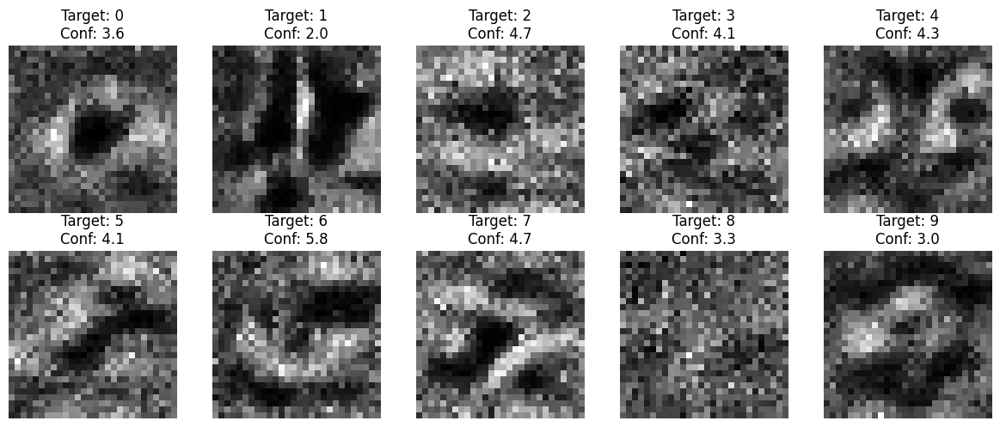

In [ ]:
device = next(model.parameters()).device
model.eval()

# Keep read noise at 0 during inversion (restore at the end)
original_read_noise = model.reram_device.read_noise_std
model.reram_device.read_noise_std = 0.0

# Hyperparameters
iters = 450
population_size = 32
lr = 2.0
lambda_tv = 0.5
blur_radius = 1  # kept for compatibility (kernel is fixed below)

# GPU-friendly gradient blur
def gaussian_blur_grad(grad):
    # grad: [1,1,28,28]
    k = torch.tensor([[1, 2, 1],
                      [2, 4, 2],
                      [1, 2, 1]], device=grad.device, dtype=grad.dtype)
    k = (k / k.sum()).view(1, 1, 3, 3)
    return F.conv2d(grad, k, padding=1)

# Store results
inverted_images = []
confidences = []

print("Starting massive inversion attack (classes 0-9)")

fig, axes = plt.subplots(2, 5, figsize=(12, 5))
axes = axes.flatten()

for target_class in range(10):
    print(f"  Attacking class {target_class}...")

    # Fresh latent per class
    latent_map = torch.randn((1, 1, 28, 28), device=device) * 0.5 - 1.0
    latent_map.requires_grad_(True)

    optimizer = torch.optim.SGD([latent_map], lr=lr, momentum=0.9)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=100, gamma=0.5)

    best_conf_iter = None          # keep on GPU as tensor
    best_img_iter = None           # keep on CPU only when updated

    for i in range(iters):
        optimizer.zero_grad()

        # 1) Build population and spikes
        batch_latent = latent_map.repeat(population_size, 1, 1, 1)
        probs = torch.sigmoid(batch_latent)

        probs_expanded = probs.unsqueeze(0).expand(model.T, *probs.shape)  # [T,B,1,28,28]
        rand_mask = torch.rand_like(probs_expanded)
        spikes_discrete = (rand_mask < probs_expanded).float()
        spikes_in = (spikes_discrete - probs_expanded.detach()) + probs_expanded

        # 2) Forward and loss
        logits = model(spikes_in)  # [B,10]
        target_tensor = torch.full((population_size,), target_class, device=device, dtype=torch.long)

        loss_ce = F.cross_entropy(logits, target_tensor)

        diff1 = torch.abs(probs[:, :, :, :-1] - probs[:, :, :, 1:]).mean()
        diff2 = torch.abs(probs[:, :, :-1, :] - probs[:, :, 1:, :]).mean()
        loss_tv = diff1 + diff2

        loss_density = probs.mean()

        loss = loss_ce + (lambda_tv * loss_tv) + (0.1 * loss_density)
        loss.backward()

        # 3) Blur gradient
        if latent_map.grad is not None:
            latent_map.grad = gaussian_blur_grad(latent_map.grad)

        optimizer.step()
        scheduler.step()

        # 4) Track best candidate without forcing GPU->CPU sync each iteration
        # Use mean logit of target class
        current_conf = logits[:, target_class].mean()  # tensor

        if best_conf_iter is None or (current_conf > best_conf_iter):
            best_conf_iter = current_conf.detach()
            best_img_iter = torch.sigmoid(latent_map).detach().cpu()  # move only when improved

    # End per-class loop
    conf_value = float(best_conf_iter.item())
    print(f"    Done. Best mean target logit: {conf_value:.2f}")

    inverted_images.append(best_img_iter)
    confidences.append(conf_value)

    # Plot
    img_disp = best_img_iter.squeeze()
    img_disp = (img_disp - img_disp.min()) / (img_disp.max() - img_disp.min() + 1e-8)

    axes[target_class].imshow(img_disp, cmap="gray")
    axes[target_class].set_title(f"Target: {target_class}\nConf: {conf_value:.1f}")
    axes[target_class].axis("off")

# Restore hardware noise
model.reram_device.read_noise_std = original_read_noise

plt.tight_layout()
plt.show()

In [ ]:
@torch.no_grad()
def compute_class_prototype(loader, target_class=7, device="cpu", max_batches=500):
    """
    Returns the mean image of a class: [1,1,28,28] in [0,1]
    """
    s = None
    n = 0
    for bi, (xb, yb) in enumerate(loader):
        mask = (yb == target_class)
        if mask.any():
            x = xb[mask]  # [Nc,1,28,28]
            if s is None:
                s = x.sum(dim=0, keepdim=True)
            else:
                s += x.sum(dim=0, keepdim=True)
            n += x.size(0)
        if bi >= max_batches:
            break
    proto = s / max(n, 1)
    return proto.to(device)
    # return proto.to(device).clamp(0.0, 1.0)

proto7 = compute_class_prototype(train_loader, target_class=7, device="cpu")

#plt.figure()
#plt.imshow(proto7[0,0].numpy(), cmap="gray", vmin=0, vmax=1)
#plt.title("Class-7 prototype (mean image)")
#plt.axis("off")
#plt.show()

# Spike generation (rate/Bernoulli encoding)
def bernoulli_rate_encode(x_img: torch.Tensor, T: int, base_rate: float = 1.0) -> torch.Tensor:
    """
    Bernoulli (rate) encoding:
      x_img: [B,1,28,28] in [0,1]
      returns spikes: [T,B,1,28,28] in {0,1}
    Probability per voxel per timestep: p = clamp(x_img * base_rate, 0, 1)
    """
    x_img = x_img.clamp(0.0, 1.0)                                  # keep valid range
    p = (x_img * base_rate).clamp(0.0, 1.0)                        # spike probability map
    rand = torch.rand((T,) + x_img.shape, device=x_img.device)     # random uniforms
    return (rand < p.unsqueeze(0)).float()                         # sample spikes


# Margin-based inversion loss (avoids softmax saturation)
def logit_margin_loss(logits: torch.Tensor, target_class: int, lam: float = 1.0):
    """
    Margin loss:
        L = -logit_y + lam * max_{j!=y} logit_j
    Returns:
        L (scalar), mean target logit, mean max-other logit
    """
    y_logit = logits[:, target_class]                              # target class logit
    mask = torch.ones_like(logits, dtype=torch.bool)               # mask for non-target logits
    mask[:, target_class] = False                                  # exclude target
    other_max = logits.masked_select(mask).view(logits.size(0), -1).max(dim=1).values  # max competitor
    L = (-y_logit + lam * other_max).mean()                        # margin loss
    return L, y_logit.mean(), other_max.mean()

# Image priors
def tv_smoothness_penalty(x_img: torch.Tensor) -> torch.Tensor:
    """
    Total variation (TV) penalty to encourage smooth, digit-like structure.
    """
    dh = (x_img[:, :, 1:, :] - x_img[:, :, :-1, :]).abs().mean()   # vertical differences
    dw = (x_img[:, :, :, 1:] - x_img[:, :, :, :-1]).abs().mean()   # horizontal differences
    return dh + dw


def blur_prior_penalty(x_img: torch.Tensor, k: int = 3) -> torch.Tensor:
    """
    Blur prior to suppress high-frequency adversarial textures.
    Penalty: ||x - blur(x)||^2
    """
    pad = k // 2
    x_blur = F.avg_pool2d(x_img, kernel_size=k, stride=1, padding=pad)  # blurred version of x
    return ((x_img - x_blur) ** 2).mean()                                # L2 difference to its blur


# -------------------------------------------------
# Full inversion attack: EOT + STE + (TV + L2 + Blur + Mean + Prototype) + Two-stage schedule
# -------------------------------------------------
def model_inversion_attack_eot_ste_full_blur_proto(
    model: nn.Module,
    target_class: int,
    device="cuda",

    # Core attack settings
    steps: int = 1200,                 # more steps helps stage 2 refine structure
    K: int = 16,                       # EOT population size (8-32 typical)
    T: int = 25,                       # timesteps
    base_rate: float = 1.0,            # spike-rate scale

    # Optional base_rate schedule (usually keep OFF until sparsity is reasonable)
    use_base_rate_schedule: bool = False,
    base_rate_after: float = 1.1,
    base_rate_switch_iter: int = 350,

    # Main objective
    margin_lambda: float = 1.0,        # margin loss weight
    fr_target: float = 0.02,           # one-sided FR target (upper bound)

    # Regularization: Stage 1
    xi_sparsity: float = 0.5,          # global sparsity^2 weight
    xi_fr: float = 0.5,                # one-sided FR excess penalty weight
    xi_fr_l2: float = 0.5,             # FR^2 penalty weight

    xi_tv: float = 0.03,               # TV weight
    xi_l2: float = 0.02,               # L2 image energy weight

    xi_blur: float = 0.05,             # blur prior weight
    blur_k: int = 3,                   # blur kernel size (3 or 5)

    xi_mean: float = 0.3,              # mean(x) penalty weight
    mean_target: float = 0.15,         # target mean intensity

    # Prototype prior (MNIST manifold prior)
    x_proto=None,                      # prototype image tensor [1,1,28,28] in [0,1]
    xi_proto: float = 0.0,             # Stage 1 prototype weight (usually 0)

    # Two-stage schedule (Stage 2: stronger priors, lower LR)
    stage2_start: int = 250,

    xi_sparsity_stage2: float = 8.0,
    xi_fr_stage2: float = 3.0,
    xi_fr_l2_stage2: float = 6.0,
    xi_tv_stage2: float = 0.15,
    xi_l2_stage2: float = 0.06,
    xi_blur_stage2: float = 0.30,
    xi_mean_stage2: float = 0.5,
    xi_proto_stage2: float = 1.0,      # Stage 2 prototype weight (0.5–2.0 typical)

    lr_stage2: float = 0.005,          # lower LR in stage 2 to refine structure

    # Optimizer / stability
    lr: float = 0.05,                  # stage 1 LR
    seed: int = 0,
    grad_clip: float = 1.0,            # gradient clipping (stability)

    # Debug / logging
    log_every: int = 10,
    snapshot_every: int = 50,
    store_spike_sums: bool = True,
):
    """
    What this attack does:
      - Optimizes continuous image: z -> x_img = sigmoid(z) in [0,1]
      - Bernoulli rate-encodes to spikes across T timesteps
      - Uses EOT (population K) to handle stochastic spikes + stochastic memristor forward
      - Uses STE mapping back from spikes-gradients to image-gradients
      - Adds dataset-aware prior: prototype penalty to pull toward MNIST-like structure
    """

    # Ensure device is torch.device
    device = torch.device(device)

    # Seeding
    torch.manual_seed(seed)
    if device.type == "cuda":
        torch.cuda.manual_seed_all(seed)

    # Model in eval mode (important for stability)
    model.eval()
    model.to(device)

    print("\n===== Starting Model Inversion Attack (Full + Blur + Prototype) =====")
    print(f"Target class: {target_class}")
    print(f"Steps: {steps} | Population K: {K} | T: {T}")
    print(f"Stage1 LR: {lr} | Stage2 LR: {lr_stage2} @ iter {stage2_start}")
    print(f"base_rate: {base_rate} | margin_lambda: {margin_lambda} | fr_target: {fr_target} | mean_target: {mean_target} | blur_k: {blur_k}")
    print(f"Stage1 regs: xi_sparsity={xi_sparsity}, xi_fr={xi_fr}, xi_fr_l2={xi_fr_l2}, xi_tv={xi_tv}, xi_l2={xi_l2}, xi_blur={xi_blur}, xi_mean={xi_mean}, xi_proto={xi_proto}")
    print(f"Stage2 regs: xi_sparsity={xi_sparsity_stage2}, xi_fr={xi_fr_stage2}, xi_fr_l2={xi_fr_l2_stage2}, xi_tv={xi_tv_stage2}, xi_l2={xi_l2_stage2}, xi_blur={xi_blur_stage2}, xi_mean={xi_mean_stage2}, xi_proto={xi_proto_stage2}")
    if use_base_rate_schedule:
        print(f"base_rate schedule: {base_rate} -> {base_rate_after} at iter {base_rate_switch_iter}")
    print("======================================================================\n")

    # Optimize z; x_img = sigmoid(z)
    z = torch.randn((1, 1, 28, 28), device=device, requires_grad=True)   # free variable
    optimizer = torch.optim.Adam([z], lr=lr)                             # Adam optimizer

    best_conf = -1.0                                                     # best confidence
    best_img = None                                                      # best image

    # Histories (for plots)
    hist = {
        "loss": [],
        "conf": [],
        "best_conf": [],
        "target_logit": [],
        "max_other_logit": [],

        "sparsity": [],
        "fr_mean": [],
        "fr_min": [],
        "fr_max": [],
        "fr_pen": [],
        "fr_l2": [],

        "tv": [],
        "l2_img": [],
        "blur_pen": [],
        "xmean": [],
        "mean_pen": [],
        "proto_pen": [],

        "grad_norm": [],
        "base_rate": [],
        "stage": [],
        "lr": [],
    }

    # Snapshots
    snapshots = []

    # Move prototype once (if provided)
    if x_proto is not None:
        x_proto_dev = x_proto.to(device).clamp(0.0, 1.0)                # ensure correct range/device
    else:
        x_proto_dev = None

    # Main loop
    for it in range(steps):
        optimizer.zero_grad(set_to_none=True)                            # clear grads

        # Stage selection
        if it >= stage2_start:
            stage = 2
            curr_xi_sparsity = xi_sparsity_stage2
            curr_xi_fr = xi_fr_stage2
            curr_xi_fr_l2 = xi_fr_l2_stage2
            curr_xi_tv = xi_tv_stage2
            curr_xi_l2 = xi_l2_stage2
            curr_xi_blur = xi_blur_stage2
            curr_xi_mean = xi_mean_stage2
            curr_xi_proto = xi_proto_stage2

            # Lower LR for refinement
            for pg in optimizer.param_groups:
                pg["lr"] = lr_stage2
            curr_lr = lr_stage2
        else:
            stage = 1
            curr_xi_sparsity = xi_sparsity
            curr_xi_fr = xi_fr
            curr_xi_fr_l2 = xi_fr_l2
            curr_xi_tv = xi_tv
            curr_xi_l2 = xi_l2
            curr_xi_blur = xi_blur
            curr_xi_mean = xi_mean
            curr_xi_proto = xi_proto
            curr_lr = lr

        if it == stage2_start:
            print("\n>>> Entering Stage 2: increasing regularization and lowering LR <<<\n")

        # Optional base_rate schedule
        curr_base_rate = base_rate
        if use_base_rate_schedule and it >= base_rate_switch_iter:
            curr_base_rate = base_rate_after

        # Continuous image
        x_img = torch.sigmoid(z)                                         # [1,1,28,28] in [0,1]

        # Priors (computed once)
        tv = tv_smoothness_penalty(x_img)                                 # smoothness
        l2_img = (x_img ** 2).mean()                                      # energy
        blur_pen = blur_prior_penalty(x_img, k=blur_k)                    # suppress HF textures
        x_mean = x_img.mean()                                             # mean intensity
        mean_pen = (x_mean - mean_target) ** 2                            # mean control (IR-drop mitigation)

        # Prototype penalty (dataset prior)
        if x_proto_dev is not None:
            proto_pen = ((x_img - x_proto_dev) ** 2).mean()               # pull toward class prototype
        else:
            proto_pen = x_img.new_tensor(0.0)                             # no-op if not provided

        # EOT gradient accumulation
        grad_accum = torch.zeros_like(z)

        # Logging accumulators
        loss_sum = 0.0
        conf_sum = 0.0
        sparsity_sum = 0.0
        frpen_sum = 0.0
        frl2_sum = 0.0
        ylogit_sum = 0.0
        otherlogit_sum = 0.0
        fr_mean_sum = 0.0
        fr_min_sum = 0.0
        fr_max_sum = 0.0

        # EOT loop
        for _ in range(K):
            # Sample spikes (stochastic input)
            spikes = bernoulli_rate_encode(x_img, T=T, base_rate=curr_base_rate).detach()
            spikes.requires_grad_(True)

            # Forward (stochastic memristor behavior)
            logits = model(spikes)

            # Margin loss
            L_main, y_logit, other_logit = logit_margin_loss(
                logits, target_class=target_class, lam=margin_lambda
            )

            # Sparsity and firing rates
            sparsity = spikes.mean()                                      # global spike ratio
            fr_t = spikes.mean(dim=(1, 2, 3, 4))                          # per-timestep FR [T]

            sparsity_pen = sparsity ** 2                                  # quadratic sparsity (harsher)
            fr_l2 = (fr_t ** 2).mean()                                    # per-timestep L2 penalty

            # One-sided FR excess penalty (only penalize above target)
            fr_excess = torch.relu(fr_t - fr_target)
            fr_pen = (fr_excess ** 2).mean()

            # Loss without image priors (priors added once outside EOT)
            Lk = (L_main
                  + curr_xi_sparsity * sparsity_pen
                  + curr_xi_fr * fr_pen
                  + curr_xi_fr_l2 * fr_l2)

            # Gradient w.r.t spikes
            g_spk = torch.autograd.grad(Lk, spikes, retain_graph=False, create_graph=False)[0]

            with torch.no_grad():
                # STE: map spikes-gradient -> image-gradient
                g_img = g_spk.mean(dim=0) * float(curr_base_rate)         # dL/dx approx
                g_z = g_img * (x_img * (1.0 - x_img))                     # chain through sigmoid
                grad_accum += g_z

                # Logging
                probs = F.softmax(logits.detach(), dim=1)
                conf_sum += float(probs[0, target_class].item())

                loss_sum += float(Lk.item())
                sparsity_sum += float(sparsity.item())
                frpen_sum += float(fr_pen.item())
                frl2_sum += float(fr_l2.item())
                ylogit_sum += float(y_logit.item())
                otherlogit_sum += float(other_logit.item())
                fr_mean_sum += float(fr_t.mean().item())
                fr_min_sum += float(fr_t.min().item())
                fr_max_sum += float(fr_t.max().item())

        # Image priors (added once)
        prior_loss = (curr_xi_tv * tv
                      + curr_xi_l2 * l2_img
                      + curr_xi_blur * blur_pen
                      + curr_xi_mean * mean_pen
                      + curr_xi_proto * proto_pen)

        prior_grad = torch.autograd.grad(prior_loss, z, retain_graph=False, create_graph=False)[0]

        # Final gradient
        grad = (grad_accum / float(K)) + prior_grad

        # Gradient clipping
        grad_norm = grad.norm().clamp_min(1e-12)
        if grad_clip is not None and grad_clip > 0:
            clip_coef = min(1.0, grad_clip / float(grad_norm.item()))
            grad = grad * clip_coef

        # Optim step
        z.grad = grad
        optimizer.step()

        # Track best confidence
        avg_conf = conf_sum / float(K)
        if avg_conf > best_conf:
            best_conf = avg_conf
            best_img = torch.sigmoid(z.detach()).clone()

        # Store histories
        hist["loss"].append(loss_sum / float(K))
        hist["conf"].append(avg_conf)
        hist["best_conf"].append(best_conf)
        hist["target_logit"].append(ylogit_sum / float(K))
        hist["max_other_logit"].append(otherlogit_sum / float(K))

        hist["sparsity"].append(sparsity_sum / float(K))
        hist["fr_mean"].append(fr_mean_sum / float(K))
        hist["fr_min"].append(fr_min_sum / float(K))
        hist["fr_max"].append(fr_max_sum / float(K))
        hist["fr_pen"].append(frpen_sum / float(K))
        hist["fr_l2"].append(frl2_sum / float(K))

        hist["tv"].append(float(tv.item()))
        hist["l2_img"].append(float(l2_img.item()))
        hist["blur_pen"].append(float(blur_pen.item()))
        hist["xmean"].append(float(x_mean.item()))
        hist["mean_pen"].append(float(mean_pen.item()))
        hist["proto_pen"].append(float(proto_pen.item()))

        hist["grad_norm"].append(float(grad_norm.item()))
        hist["base_rate"].append(float(curr_base_rate))
        hist["stage"].append(stage)
        hist["lr"].append(float(curr_lr))

        # Save snapshots
        if snapshot_every is not None and snapshot_every > 0 and (it % snapshot_every == 0 or it == steps - 1):
            snap = {"iter": it, "x_img": x_img.detach().cpu().clone()}
            if store_spike_sums:
                with torch.no_grad():
                    spikes_vis = bernoulli_rate_encode(x_img, T=T, base_rate=curr_base_rate)
                    spike_sum = spikes_vis.sum(dim=0)                     # sum over time
                    snap["spike_sum"] = spike_sum.detach().cpu().clone()
            snapshots.append(snap)

        # Debug prints
        if (it % log_every) == 0 or (it == steps - 1):
            print(f"\n[Iter {it:04d}/{steps}] stage={stage} base_rate={curr_base_rate:.3f} lr={curr_lr:.4f}")
            print(f"  avg_conf(target)     : {avg_conf:.6f}   (best={best_conf:.6f})")
            print(f"  avg_loss(no_priors)  : {hist['loss'][-1]:.6f}")
            print(f"  avg_target_logit     : {hist['target_logit'][-1]:.6f}")
            print(f"  avg_max_other_logit  : {hist['max_other_logit'][-1]:.6f}")
            print(f"  avg_sparsity         : {hist['sparsity'][-1]:.6f}")
            print(f"  fr_mean/min/max      : {hist['fr_mean'][-1]:.6f} / {hist['fr_min'][-1]:.6f} / {hist['fr_max'][-1]:.6f}")
            print(f"  fr_pen(one-sided)    : {hist['fr_pen'][-1]:.6f}   fr_l2: {hist['fr_l2'][-1]:.6f}")
            print(f"  tv={hist['tv'][-1]:.6f} l2={hist['l2_img'][-1]:.6f} blur={hist['blur_pen'][-1]:.6f} proto={hist['proto_pen'][-1]:.6f}")
            print(f"  xmean={hist['xmean'][-1]:.6f} mean_pen={hist['mean_pen'][-1]:.6f} grad_norm={hist['grad_norm'][-1]:.6f}")

            if torch.isnan(z).any():
                print("NaN detected in z. Stopping.")
                break

    print("\n===== Attack Finished =====")
    print(f"Best confidence achieved: {best_conf:.6f}")
    print("===========================\n")

    return {
        "best_x_img": best_img,
        "final_x_img": torch.sigmoid(z.detach()),
        "best_conf": best_conf,
        "history": hist,
        "snapshots": snapshots,
    }

In [ ]:
result = model_inversion_attack_eot_ste_full_blur_proto(
    model=model,
    target_class=7,
    device=device,          # torch.device or "cuda"/"cpu"
    steps=1200,
    K=16,
    T=model.T,
    base_rate=1.0,
    use_base_rate_schedule=False,

    # Provide prototype prior
    x_proto=proto7,
    xi_proto=0.0,           # keep Stage 1 free
    xi_proto_stage2=1.0,    # try 0.5–2.0

    # Optional
    # xi_blur_stage2=0.30,
    # xi_tv_stage2=0.15,
    # lr_stage2=0.005,

    snapshot_every=50,
)

print("Best confidence:", result["best_conf"])

hist = result["history"]

plt.figure()
plt.plot(hist["conf"], label="avg_conf")
plt.plot(hist["best_conf"], label="best_conf")
plt.title("Target confidence vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Confidence")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist["sparsity"])
plt.title("Spike ratio vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Mean spike ratio")
plt.show()

plt.figure()
plt.plot(hist["xmean"], label="mean(x_img)")
plt.title("x_img mean (IR-drop proxy) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("mean(x_img)")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist["tv"], label="TV")
plt.plot(hist["l2_img"], label="L2 image")
plt.plot(hist["blur_pen"], label="Blur penalty")
plt.plot(hist["proto_pen"], label="Prototype penalty")
plt.title("Priors vs iteration")
plt.xlabel("Iteration")
plt.legend()
plt.show()

plt.figure()
plt.plot(hist["loss"])
plt.title("Loss (no image priors) vs iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.show()

plt.figure(figsize=(6,3))

plt.subplot(1,2,1)
plt.imshow(result["best_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("best_x_img")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(result["final_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("final_x_img")
plt.axis("off")

plt.tight_layout()
plt.show()

snaps = result["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()


===== Starting Model Inversion Attack (Full + Blur + Prototype) =====
Target class: 7
Steps: 1200 | Population K: 16 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3, xi_proto=0.0
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.3, xi_mean=0.5, xi_proto=1.0


[Iter 0000/1200] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.000020   (best=0.000020)
  avg_loss(no_priors)  : 11.002558
  avg_target_logit     : -10.598551
  avg_max_other_logit  : 0.049938
  avg_sparsity         : 0.492223
  fr_mean/min/max      : 0.492223 / 0.460459 / 0.527663
  fr_pen(one-sided)    : 0.223276   fr_l2: 0.242564
  tv=0.456120 l2=0.281494 blur=0.039050 proto=0.220856
  xmean=0.491786 mean_pen=0.116818 grad_norm=0.003331

[Iter 0010/1200] stage=1 base_rate=1.000 lr

KeyboardInterrupt: 

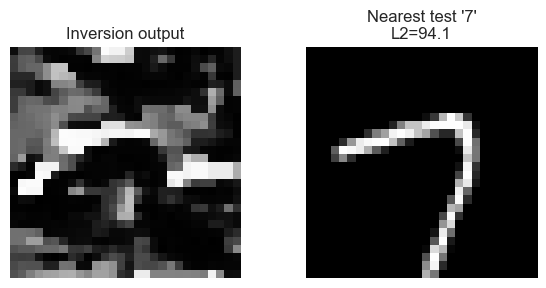

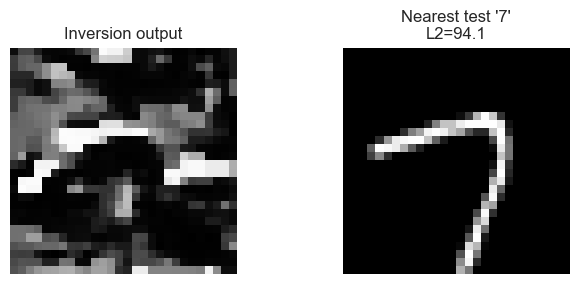

[Reconstruction robustness over 200 trials]
  P(pred==target): 1.000
  conf mean/std  : 1.0000 / 0.0000
  conf min/max   : 1.0000 / 1.0000


In [ ]:
@torch.no_grad()
def nearest_neighbor_in_class(test_loader, target_class, x_query, device, max_batches=300):
    device = torch.device(device)
    xq = x_query.to(device)

    best_dist = float("inf")
    best_x = None

    for bi, (xb, yb) in enumerate(test_loader):
        xb = xb.to(device)
        yb = yb.to(device)

        mask = (yb == target_class)
        if mask.any():
            xc = xb[mask]
            d = ((xc - xq) ** 2).view(xc.size(0), -1).sum(dim=1)
            idx = torch.argmin(d)
            if d[idx].item() < best_dist:
                best_dist = d[idx].item()
                best_x = xc[idx:idx+1].detach().cpu()

        if bi >= max_batches:
            break

    return best_x, best_dist

nn_x, nn_dist = nearest_neighbor_in_class(
    test_loader=test_loader,
    target_class=7,
    x_query=result["best_x_img"].detach().cpu(),
    device=device
)

plt.figure(figsize=(7,3))
plt.subplot(1,2,1)
plt.imshow(result["best_x_img"][0,0].cpu().numpy(), cmap="gray", vmin=0, vmax=1)
plt.title("Inversion output")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(nn_x[0,0].numpy(), cmap="gray", vmin=0, vmax=1)
plt.title(f"Nearest test '7'\nL2={nn_dist:.1f}")
plt.axis("off")

plt.tight_layout()
plt.show()

@torch.no_grad()
def evaluate_reconstruction_confidence(model, x_img, target_class, T, base_rate, trials=200, device="cuda"):
    device = torch.device(device)
    model.eval().to(device)
    x_img = x_img.to(device).clamp(0, 1)

    confs = []
    preds = []
    for _ in range(trials):
        spikes = bernoulli_rate_encode(x_img, T=T, base_rate=base_rate)
        logits = model(spikes)
        probs = torch.softmax(logits, dim=1)
        confs.append(probs[0, target_class].item())
        preds.append(int(probs.argmax(dim=1).item()))

    confs_t = torch.tensor(confs)
    acc = sum([p == target_class for p in preds]) / len(preds)

    print(f"[Reconstruction robustness over {trials} trials]")
    print(f"  P(pred==target): {acc:.3f}")
    print(f"  conf mean/std  : {confs_t.mean().item():.4f} / {confs_t.std().item():.4f}")
    print(f"  conf min/max   : {confs_t.min().item():.4f} / {confs_t.max().item():.4f}")
    return confs_t

_ = evaluate_reconstruction_confidence(
    model=model,
    x_img=result["best_x_img"],
    target_class=7,
    T=model.T,
    base_rate=1.0,
    trials=200,
    device=device
)

In [ ]:
proto3 = compute_class_prototype(train_loader, target_class=3, device="cuda")
result3 = model_inversion_attack_eot_ste_full_blur_proto(
    model=model,
    target_class=3,
    device=device,
    steps=1000,
    K=16,
    T=model.T,
    base_rate=1.0,
    x_proto=proto3,
    xi_proto=0.0,
    xi_proto_stage2=1.0,
    snapshot_every=50,
)

print("Best confidence:", result3["best_conf"])

snaps = result3["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()


===== Starting Model Inversion Attack (Full + Blur + Prototype) =====
Target class: 3
Steps: 1000 | Population K: 16 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3, xi_proto=0.0
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.3, xi_mean=0.5, xi_proto=1.0


[Iter 0000/1000] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.235610   (best=0.235610)
  avg_loss(no_priors)  : 1.225675
  avg_target_logit     : -2.668919
  avg_max_other_logit  : -1.797313
  avg_sparsity         : 0.492223
  fr_mean/min/max      : 0.492223 / 0.460459 / 0.527663
  fr_pen(one-sided)    : 0.223276   fr_l2: 0.242564
  tv=0.456120 l2=0.281494 blur=0.039050 proto=0.211312
  xmean=0.491786 mean_pen=0.116818 grad_norm=0.002664

[Iter 0010/1000] stage=1 base_rate=1.000 lr=


===== Starting Model Inversion Attack (Full + Blur + Prototype) =====
Target class: 0
Steps: 300 | Population K: 16 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3, xi_proto=0.0
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.3, xi_mean=0.5, xi_proto=1.0


[Iter 0000/300] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.000317   (best=0.000317)
  avg_loss(no_priors)  : 7.889209
  avg_target_logit     : -9.332454
  avg_max_other_logit  : -1.797313
  avg_sparsity         : 0.492223
  fr_mean/min/max      : 0.492223 / 0.460459 / 0.527663
  fr_pen(one-sided)    : 0.223276   fr_l2: 0.242564
  tv=0.456120 l2=0.281494 blur=0.039050 proto=0.199872
  xmean=0.491786 mean_pen=0.116818 grad_norm=0.002873

[Iter 0010/300] stage=1 base_rate=1.000 lr=0.0

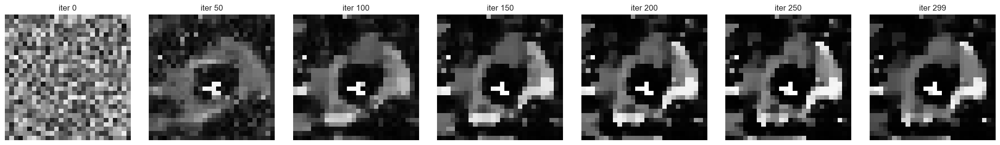

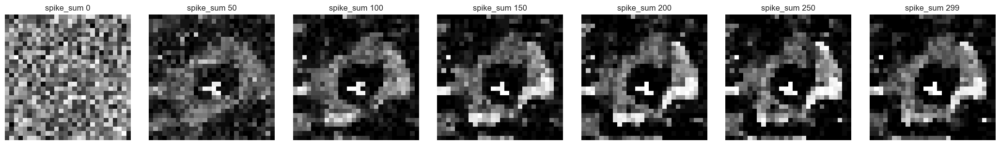


===== Starting Model Inversion Attack (Full + Blur + Prototype) =====
Target class: 1
Steps: 300 | Population K: 16 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3, xi_proto=0.0
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.3, xi_mean=0.5, xi_proto=1.0


[Iter 0000/300] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.000027   (best=0.000027)
  avg_loss(no_priors)  : 10.355888
  avg_target_logit     : -11.799132
  avg_max_other_logit  : -1.797313
  avg_sparsity         : 0.492223
  fr_mean/min/max      : 0.492223 / 0.460459 / 0.527663
  fr_pen(one-sided)    : 0.223276   fr_l2: 0.242564
  tv=0.456120 l2=0.281494 blur=0.039050 proto=0.244543
  xmean=0.491786 mean_pen=0.116818 grad_norm=0.003048

[Iter 0010/300] stage=1 base_rate=1.000 lr=0

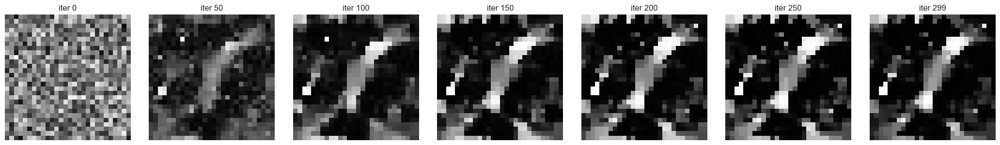

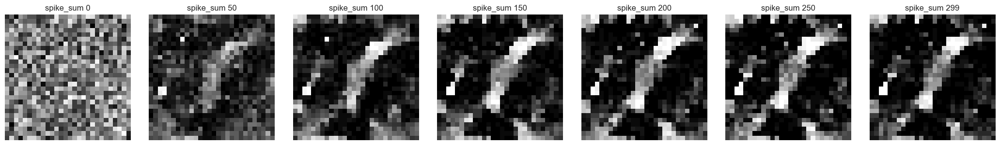


===== Starting Model Inversion Attack (Full + Blur + Prototype) =====
Target class: 2
Steps: 300 | Population K: 16 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3, xi_proto=0.0
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.3, xi_mean=0.5, xi_proto=1.0


[Iter 0000/300] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.554099   (best=0.554099)
  avg_loss(no_priors)  : -0.494511
  avg_target_logit     : -1.797313
  avg_max_other_logit  : -2.645892
  avg_sparsity         : 0.492223
  fr_mean/min/max      : 0.492223 / 0.460459 / 0.527663
  fr_pen(one-sided)    : 0.223276   fr_l2: 0.242564
  tv=0.456120 l2=0.281494 blur=0.039050 proto=0.199214
  xmean=0.491786 mean_pen=0.116818 grad_norm=0.002524

[Iter 0010/300] stage=1 base_rate=1.000 lr=0.

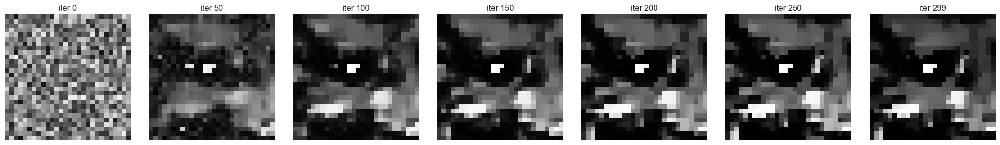

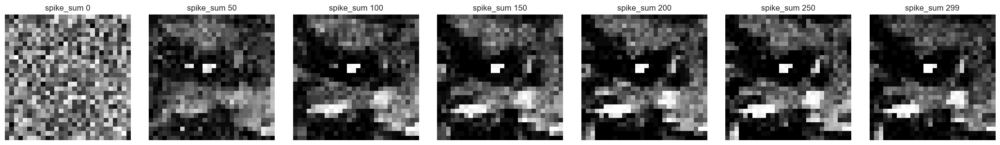


===== Starting Model Inversion Attack (Full + Blur + Prototype) =====
Target class: 4
Steps: 300 | Population K: 16 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3, xi_proto=0.0
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.3, xi_mean=0.5, xi_proto=1.0


[Iter 0000/300] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.000000   (best=0.000000)
  avg_loss(no_priors)  : 16.024583
  avg_target_logit     : -17.467828
  avg_max_other_logit  : -1.797313
  avg_sparsity         : 0.492223
  fr_mean/min/max      : 0.492223 / 0.460459 / 0.527663
  fr_pen(one-sided)    : 0.223276   fr_l2: 0.242564
  tv=0.456120 l2=0.281494 blur=0.039050 proto=0.216281
  xmean=0.491786 mean_pen=0.116818 grad_norm=0.003096

[Iter 0010/300] stage=1 base_rate=1.000 lr=0

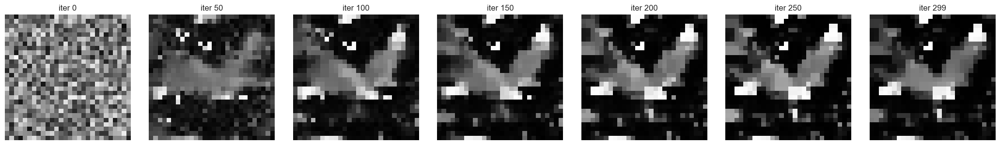

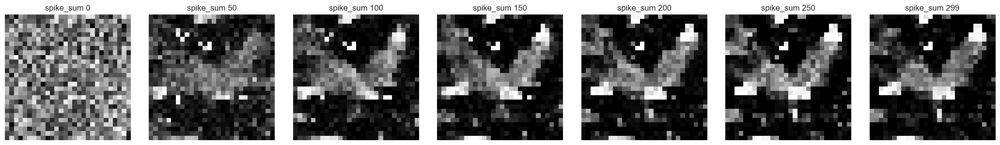


===== Starting Model Inversion Attack (Full + Blur + Prototype) =====
Target class: 5
Steps: 300 | Population K: 16 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3, xi_proto=0.0
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.3, xi_mean=0.5, xi_proto=1.0


[Iter 0000/300] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.045031   (best=0.045031)
  avg_loss(no_priors)  : 2.879867
  avg_target_logit     : -4.323111
  avg_max_other_logit  : -1.797313
  avg_sparsity         : 0.492223
  fr_mean/min/max      : 0.492223 / 0.460459 / 0.527663
  fr_pen(one-sided)    : 0.223276   fr_l2: 0.242564
  tv=0.456120 l2=0.281494 blur=0.039050 proto=0.207006
  xmean=0.491786 mean_pen=0.116818 grad_norm=0.002664

[Iter 0010/300] stage=1 base_rate=1.000 lr=0.0

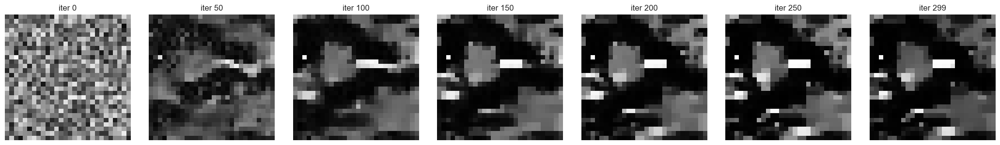

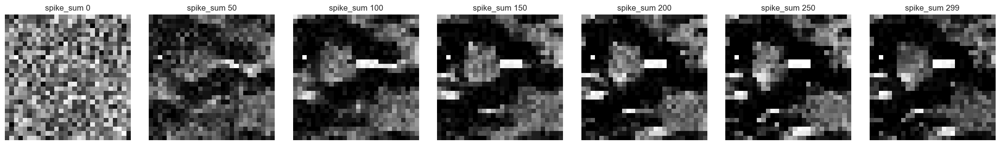


===== Starting Model Inversion Attack (Full + Blur + Prototype) =====
Target class: 6
Steps: 300 | Population K: 16 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3, xi_proto=0.0
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.3, xi_mean=0.5, xi_proto=1.0


[Iter 0000/300] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.000711   (best=0.000711)
  avg_loss(no_priors)  : 7.173997
  avg_target_logit     : -8.617241
  avg_max_other_logit  : -1.797313
  avg_sparsity         : 0.492223
  fr_mean/min/max      : 0.492223 / 0.460459 / 0.527663
  fr_pen(one-sided)    : 0.223276   fr_l2: 0.242564
  tv=0.456120 l2=0.281494 blur=0.039050 proto=0.211034
  xmean=0.491786 mean_pen=0.116818 grad_norm=0.002844

[Iter 0010/300] stage=1 base_rate=1.000 lr=0.0

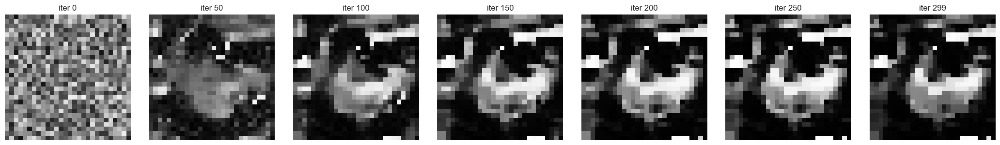

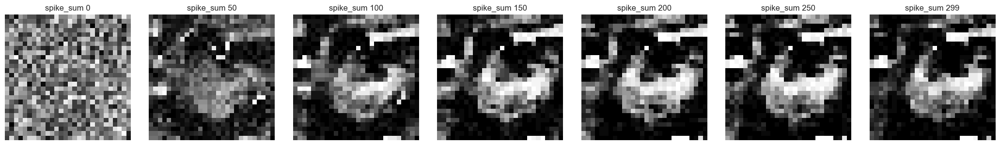


===== Starting Model Inversion Attack (Full + Blur + Prototype) =====
Target class: 8
Steps: 300 | Population K: 16 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3, xi_proto=0.0
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.3, xi_mean=0.5, xi_proto=1.0


[Iter 0000/300] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.164151   (best=0.164151)
  avg_loss(no_priors)  : 1.590678
  avg_target_logit     : -3.033922
  avg_max_other_logit  : -1.797313
  avg_sparsity         : 0.492223
  fr_mean/min/max      : 0.492223 / 0.460459 / 0.527663
  fr_pen(one-sided)    : 0.223276   fr_l2: 0.242564
  tv=0.456120 l2=0.281494 blur=0.039050 proto=0.207726
  xmean=0.491786 mean_pen=0.116818 grad_norm=0.002689

[Iter 0010/300] stage=1 base_rate=1.000 lr=0.0

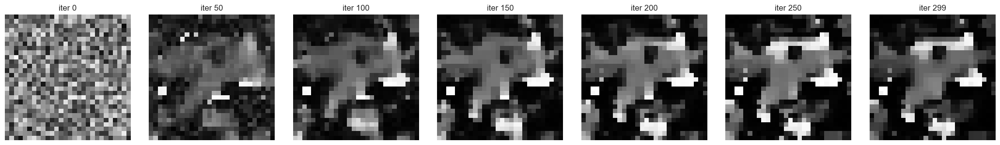

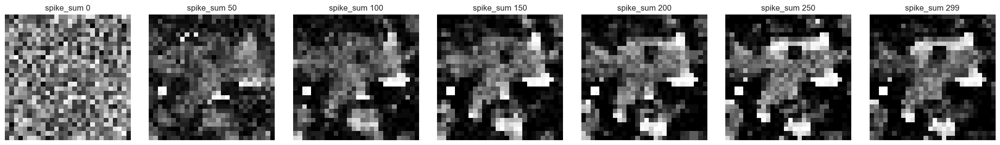


===== Starting Model Inversion Attack (Full + Blur + Prototype) =====
Target class: 9
Steps: 300 | Population K: 16 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3, xi_proto=0.0
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.3, xi_mean=0.5, xi_proto=1.0


[Iter 0000/300] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.000020   (best=0.000020)
  avg_loss(no_priors)  : 10.651244
  avg_target_logit     : -12.094488
  avg_max_other_logit  : -1.797313
  avg_sparsity         : 0.492223
  fr_mean/min/max      : 0.492223 / 0.460459 / 0.527663
  fr_pen(one-sided)    : 0.223276   fr_l2: 0.242564
  tv=0.456120 l2=0.281494 blur=0.039050 proto=0.218794
  xmean=0.491786 mean_pen=0.116818 grad_norm=0.003077

[Iter 0010/300] stage=1 base_rate=1.000 lr=0

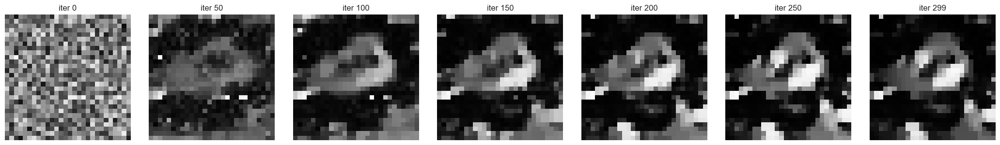

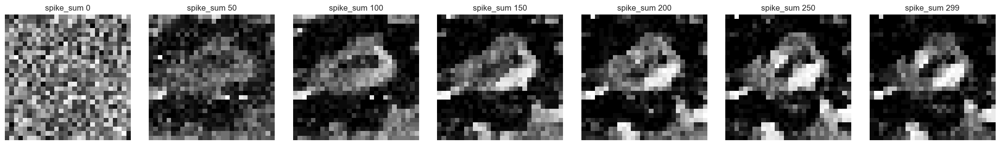

In [ ]:
proto0 = compute_class_prototype(train_loader, target_class=0, device="cuda")
result0 = model_inversion_attack_eot_ste_full_blur_proto(
    model=model,
    target_class=0,
    device=device,
    steps=300,
    K=16,
    T=model.T,
    base_rate=1.0,
    x_proto=proto0,
    xi_proto=0.0,
    xi_proto_stage2=1.0,
    snapshot_every=50,
)

print("Best confidence:", result0["best_conf"])
snaps = result0["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()


proto1 = compute_class_prototype(train_loader, target_class=1, device="cuda")
result1 = model_inversion_attack_eot_ste_full_blur_proto(
    model=model,
    target_class=1,
    device=device,
    steps=300,
    K=16,
    T=model.T,
    base_rate=1.0,
    x_proto=proto1,
    xi_proto=0.0,
    xi_proto_stage2=1.0,
    snapshot_every=50,
)

print("Best confidence:", result1["best_conf"])
snaps = result1["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

proto2 = compute_class_prototype(train_loader, target_class=2, device="cuda")
result2 = model_inversion_attack_eot_ste_full_blur_proto(
    model=model,
    target_class=2,
    device=device,
    steps=300,
    K=16,
    T=model.T,
    base_rate=1.0,
    x_proto=proto2,
    xi_proto=0.0,
    xi_proto_stage2=1.0,
    snapshot_every=50,
)

print("Best confidence:", result2["best_conf"])
snaps = result2["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

proto4 = compute_class_prototype(train_loader, target_class=4, device="cuda")
result4 = model_inversion_attack_eot_ste_full_blur_proto(
    model=model,
    target_class=4,
    device=device,
    steps=300,
    K=16,
    T=model.T,
    base_rate=1.0,
    x_proto=proto4,
    xi_proto=0.0,
    xi_proto_stage2=1.0,
    snapshot_every=50,
)

print("Best confidence:", result4["best_conf"])
snaps = result4["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

proto5 = compute_class_prototype(train_loader, target_class=5, device="cuda")
result5 = model_inversion_attack_eot_ste_full_blur_proto(
    model=model,
    target_class=5,
    device=device,
    steps=300,
    K=16,
    T=model.T,
    base_rate=1.0,
    x_proto=proto5,
    xi_proto=0.0,
    xi_proto_stage2=1.0,
    snapshot_every=50,
)

print("Best confidence:", result5["best_conf"])
snaps = result5["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

proto6 = compute_class_prototype(train_loader, target_class=6, device="cuda")
result6 = model_inversion_attack_eot_ste_full_blur_proto(
    model=model,
    target_class=6,
    device=device,
    steps=300,
    K=16,
    T=model.T,
    base_rate=1.0,
    x_proto=proto6,
    xi_proto=0.0,
    xi_proto_stage2=1.0,
    snapshot_every=50,
)

print("Best confidence:", result6["best_conf"])
snaps = result6["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

proto8 = compute_class_prototype(train_loader, target_class=8, device="cuda")
result8 = model_inversion_attack_eot_ste_full_blur_proto(
    model=model,
    target_class=8,
    device=device,
    steps=300,
    K=16,
    T=model.T,
    base_rate=1.0,
    x_proto=proto8,
    xi_proto=0.0,
    xi_proto_stage2=1.0,
    snapshot_every=50,
)

print("Best confidence:", result8["best_conf"])
snaps = result8["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

proto9 = compute_class_prototype(train_loader, target_class=9, device="cuda")
result9 = model_inversion_attack_eot_ste_full_blur_proto(
    model=model,
    target_class=9,
    device=device,
    steps=300,
    K=16,
    T=model.T,
    base_rate=1.0,
    x_proto=proto9,
    xi_proto=0.0,
    xi_proto_stage2=1.0,
    snapshot_every=50,
)

print("Best confidence:", result9["best_conf"])
snaps = result9["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()


===== Starting Model Inversion Attack (Full + Blur + Prototype) =====
Target class: 1
Steps: 800 | Population K: 16 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3, xi_proto=0.0
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.3, xi_mean=0.5, xi_proto=1.0


[Iter 0000/800] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.000027   (best=0.000027)
  avg_loss(no_priors)  : 10.355888
  avg_target_logit     : -11.799132
  avg_max_other_logit  : -1.797313
  avg_sparsity         : 0.492223
  fr_mean/min/max      : 0.492223 / 0.460459 / 0.527663
  fr_pen(one-sided)    : 0.223276   fr_l2: 0.242564
  tv=0.456120 l2=0.281494 blur=0.039050 proto=0.244585
  xmean=0.491786 mean_pen=0.116818 grad_norm=0.003048

[Iter 0010/800] stage=1 base_rate=1.000 lr=0

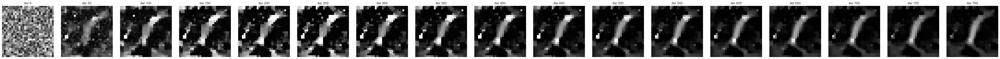

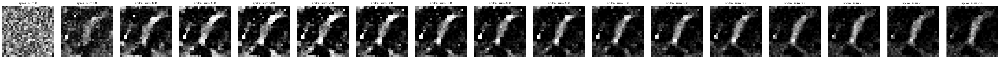


===== Starting Model Inversion Attack (Full + Blur + Prototype) =====
Target class: 2
Steps: 800 | Population K: 16 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3, xi_proto=0.0
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.3, xi_mean=0.5, xi_proto=1.0


[Iter 0000/800] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.554099   (best=0.554099)
  avg_loss(no_priors)  : -0.494511
  avg_target_logit     : -1.797313
  avg_max_other_logit  : -2.645892
  avg_sparsity         : 0.492223
  fr_mean/min/max      : 0.492223 / 0.460459 / 0.527663
  fr_pen(one-sided)    : 0.223276   fr_l2: 0.242564
  tv=0.456120 l2=0.281494 blur=0.039050 proto=0.199214
  xmean=0.491786 mean_pen=0.116818 grad_norm=0.002524

[Iter 0010/800] stage=1 base_rate=1.000 lr=0.

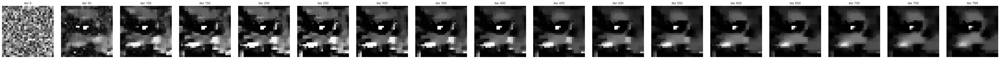

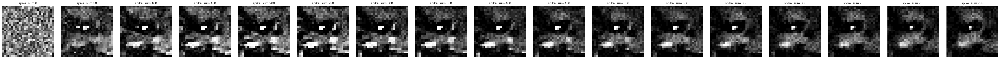


===== Starting Model Inversion Attack (Full + Blur + Prototype) =====
Target class: 4
Steps: 800 | Population K: 16 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3, xi_proto=0.0
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.3, xi_mean=0.5, xi_proto=1.0


[Iter 0000/800] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.000000   (best=0.000000)
  avg_loss(no_priors)  : 16.024583
  avg_target_logit     : -17.467828
  avg_max_other_logit  : -1.797313
  avg_sparsity         : 0.492223
  fr_mean/min/max      : 0.492223 / 0.460459 / 0.527663
  fr_pen(one-sided)    : 0.223276   fr_l2: 0.242564
  tv=0.456120 l2=0.281494 blur=0.039050 proto=0.216281
  xmean=0.491786 mean_pen=0.116818 grad_norm=0.003096

[Iter 0010/800] stage=1 base_rate=1.000 lr=0

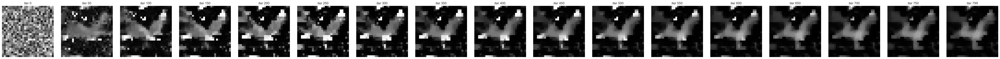

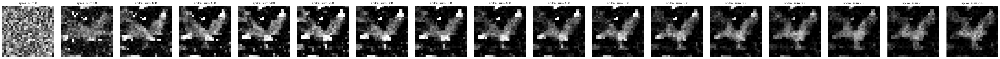


===== Starting Model Inversion Attack (Full + Blur + Prototype) =====
Target class: 5
Steps: 800 | Population K: 16 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3, xi_proto=0.0
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.3, xi_mean=0.5, xi_proto=1.0


[Iter 0000/800] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.045031   (best=0.045031)
  avg_loss(no_priors)  : 2.879867
  avg_target_logit     : -4.323111
  avg_max_other_logit  : -1.797313
  avg_sparsity         : 0.492223
  fr_mean/min/max      : 0.492223 / 0.460459 / 0.527663
  fr_pen(one-sided)    : 0.223276   fr_l2: 0.242564
  tv=0.456120 l2=0.281494 blur=0.039050 proto=0.207006
  xmean=0.491786 mean_pen=0.116818 grad_norm=0.002664

[Iter 0010/800] stage=1 base_rate=1.000 lr=0.0

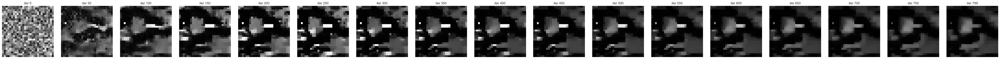

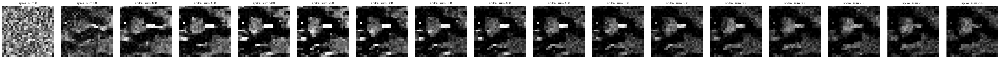


===== Starting Model Inversion Attack (Full + Blur + Prototype) =====
Target class: 6
Steps: 800 | Population K: 16 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3, xi_proto=0.0
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.3, xi_mean=0.5, xi_proto=1.0


[Iter 0000/800] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.000711   (best=0.000711)
  avg_loss(no_priors)  : 7.173997
  avg_target_logit     : -8.617241
  avg_max_other_logit  : -1.797313
  avg_sparsity         : 0.492223
  fr_mean/min/max      : 0.492223 / 0.460459 / 0.527663
  fr_pen(one-sided)    : 0.223276   fr_l2: 0.242564
  tv=0.456120 l2=0.281494 blur=0.039050 proto=0.211034
  xmean=0.491786 mean_pen=0.116818 grad_norm=0.002844

[Iter 0010/800] stage=1 base_rate=1.000 lr=0.0

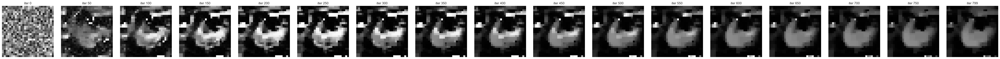

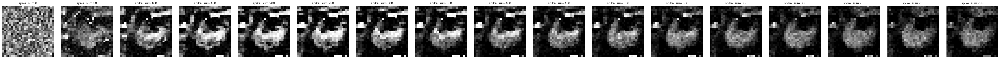


===== Starting Model Inversion Attack (Full + Blur + Prototype) =====
Target class: 8
Steps: 800 | Population K: 16 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3, xi_proto=0.0
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.3, xi_mean=0.5, xi_proto=1.0


[Iter 0000/800] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.164151   (best=0.164151)
  avg_loss(no_priors)  : 1.590678
  avg_target_logit     : -3.033922
  avg_max_other_logit  : -1.797313
  avg_sparsity         : 0.492223
  fr_mean/min/max      : 0.492223 / 0.460459 / 0.527663
  fr_pen(one-sided)    : 0.223276   fr_l2: 0.242564
  tv=0.456120 l2=0.281494 blur=0.039050 proto=0.207726
  xmean=0.491786 mean_pen=0.116818 grad_norm=0.002689

[Iter 0010/800] stage=1 base_rate=1.000 lr=0.0

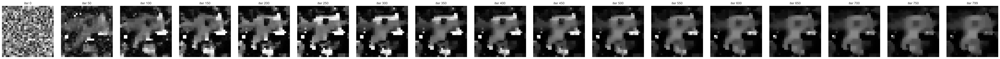

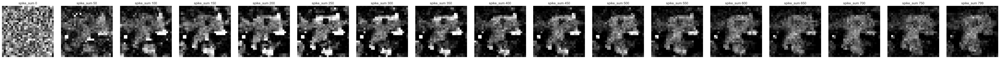


===== Starting Model Inversion Attack (Full + Blur + Prototype) =====
Target class: 9
Steps: 800 | Population K: 16 | T: 25
Stage1 LR: 0.05 | Stage2 LR: 0.005 @ iter 250
base_rate: 1.0 | margin_lambda: 1.0 | fr_target: 0.02 | mean_target: 0.15 | blur_k: 3
Stage1 regs: xi_sparsity=0.5, xi_fr=0.5, xi_fr_l2=0.5, xi_tv=0.03, xi_l2=0.02, xi_blur=0.05, xi_mean=0.3, xi_proto=0.0
Stage2 regs: xi_sparsity=8.0, xi_fr=3.0, xi_fr_l2=6.0, xi_tv=0.15, xi_l2=0.06, xi_blur=0.3, xi_mean=0.5, xi_proto=1.0


[Iter 0000/800] stage=1 base_rate=1.000 lr=0.0500
  avg_conf(target)     : 0.000020   (best=0.000020)
  avg_loss(no_priors)  : 10.651244
  avg_target_logit     : -12.094488
  avg_max_other_logit  : -1.797313
  avg_sparsity         : 0.492223
  fr_mean/min/max      : 0.492223 / 0.460459 / 0.527663
  fr_pen(one-sided)    : 0.223276   fr_l2: 0.242564
  tv=0.456120 l2=0.281494 blur=0.039050 proto=0.218794
  xmean=0.491786 mean_pen=0.116818 grad_norm=0.003077

[Iter 0010/800] stage=1 base_rate=1.000 lr=0

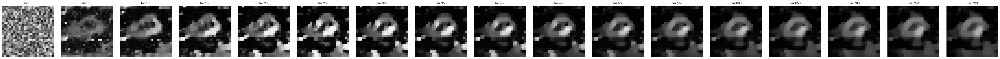

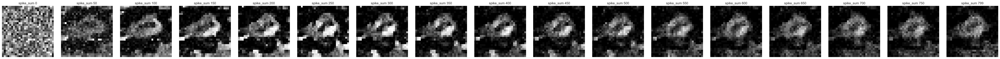

In [ ]:
proto1 = compute_class_prototype(train_loader, target_class=1, device="cuda")
result1 = model_inversion_attack_eot_ste_full_blur_proto(
    model=model,
    target_class=1,
    device=device,
    steps=800,
    K=16,
    T=model.T,
    base_rate=1.0,
    x_proto=proto1,
    xi_proto=0.0,
    xi_proto_stage2=1.0,
    snapshot_every=50,
)

print("Best confidence:", result1["best_conf"])
snaps = result1["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

proto2 = compute_class_prototype(train_loader, target_class=2, device="cuda")
result2 = model_inversion_attack_eot_ste_full_blur_proto(
    model=model,
    target_class=2,
    device=device,
    steps=800,
    K=16,
    T=model.T,
    base_rate=1.0,
    x_proto=proto2,
    xi_proto=0.0,
    xi_proto_stage2=1.0,
    snapshot_every=50,
)

print("Best confidence:", result2["best_conf"])
snaps = result2["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

proto4 = compute_class_prototype(train_loader, target_class=4, device="cuda")
result4 = model_inversion_attack_eot_ste_full_blur_proto(
    model=model,
    target_class=4,
    device=device,
    steps=800,
    K=16,
    T=model.T,
    base_rate=1.0,
    x_proto=proto4,
    xi_proto=0.0,
    xi_proto_stage2=1.0,
    snapshot_every=50,
)

print("Best confidence:", result4["best_conf"])
snaps = result4["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

proto5 = compute_class_prototype(train_loader, target_class=5, device="cuda")
result5 = model_inversion_attack_eot_ste_full_blur_proto(
    model=model,
    target_class=5,
    device=device,
    steps=800,
    K=16,
    T=model.T,
    base_rate=1.0,
    x_proto=proto5,
    xi_proto=0.0,
    xi_proto_stage2=1.0,
    snapshot_every=50,
)

print("Best confidence:", result5["best_conf"])
snaps = result5["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

proto6 = compute_class_prototype(train_loader, target_class=6, device="cuda")
result6 = model_inversion_attack_eot_ste_full_blur_proto(
    model=model,
    target_class=6,
    device=device,
    steps=800,
    K=16,
    T=model.T,
    base_rate=1.0,
    x_proto=proto6,
    xi_proto=0.0,
    xi_proto_stage2=1.0,
    snapshot_every=50,
)

print("Best confidence:", result6["best_conf"])
snaps = result6["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

proto8 = compute_class_prototype(train_loader, target_class=8, device="cuda")
result8 = model_inversion_attack_eot_ste_full_blur_proto(
    model=model,
    target_class=8,
    device=device,
    steps=800,
    K=16,
    T=model.T,
    base_rate=1.0,
    x_proto=proto8,
    xi_proto=0.0,
    xi_proto_stage2=1.0,
    snapshot_every=50,
)

print("Best confidence:", result8["best_conf"])
snaps = result8["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

proto9 = compute_class_prototype(train_loader, target_class=9, device="cuda")
result9 = model_inversion_attack_eot_ste_full_blur_proto(
    model=model,
    target_class=9,
    device=device,
    steps=800,
    K=16,
    T=model.T,
    base_rate=1.0,
    x_proto=proto9,
    xi_proto=0.0,
    xi_proto_stage2=1.0,
    snapshot_every=50,
)

print("Best confidence:", result9["best_conf"])
snaps = result9["snapshots"]
n = len(snaps)

plt.figure(figsize=(3*n, 3))
for i, s in enumerate(snaps):
    plt.subplot(1, n, i+1)
    plt.imshow(s["x_img"][0,0].numpy(), cmap="gray", vmin=0, vmax=1)
    plt.title(f"iter {s['iter']}")
    plt.axis("off")
plt.tight_layout()
plt.show()

if "spike_sum" in snaps[0]:
    plt.figure(figsize=(3*n, 3))
    for i, s in enumerate(snaps):
        plt.subplot(1, n, i+1)
        plt.imshow(s["spike_sum"][0,0].numpy(), cmap="gray", vmin=0, vmax=float(model.T))
        plt.title(f"spike_sum {s['iter']}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Examples of model inversion

[Class 0] iter 00 | best_conf=6.375e-03 | best_density=9.694e-04 | prob_mean=1.505e-01
[Class 0] iter 02 | best_conf=9.973e-01 | best_density=3.646e-01 | prob_mean=4.591e-01
[Class 0] iter 04 | best_conf=9.915e-01 | best_density=5.013e-01 | prob_mean=5.183e-01
[Class 0] Robust | conf_mean=0.996 | conf_std=0.001 | margin_mean=5.951 | succ_rate=1.00
[Class 1] iter 00 | best_conf=7.603e-01 | best_density=1.122e-03 | prob_mean=1.271e-01
[Class 1] Robust | conf_mean=0.753 | conf_std=0.013 | margin_mean=2.192 | succ_rate=1.00
[Class 2] iter 00 | best_conf=2.684e-02 | best_density=1.173e-03 | prob_mean=1.299e-01
[Class 2] iter 02 | best_conf=1.000e+00 | best_density=3.303e-01 | prob_mean=4.351e-01
[Class 2] iter 04 | best_conf=9.999e-01 | best_density=4.874e-01 | prob_mean=5.299e-01
[Class 2] Robust | conf_mean=1.000 | conf_std=0.000 | margin_mean=10.683 | succ_rate=1.00
[Class 3] iter 00 | best_conf=2.167e-02 | best_density=1.173e-03 | prob_mean=1.440e-01
[Class 3] iter 02 | best_conf=9.998e

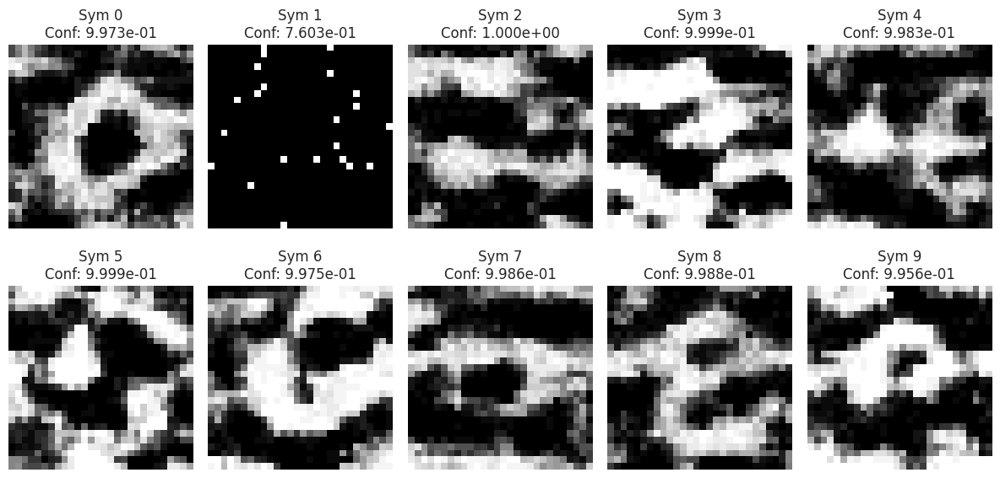

Class 0: conf_mean=0.996, conf_std=0.001, margin_mean=5.951, succ_rate=1.00
Class 1: conf_mean=0.753, conf_std=0.013, margin_mean=2.192, succ_rate=1.00
Class 2: conf_mean=1.000, conf_std=0.000, margin_mean=10.683, succ_rate=1.00
Class 3: conf_mean=1.000, conf_std=0.000, margin_mean=9.613, succ_rate=1.00
Class 4: conf_mean=0.998, conf_std=0.000, margin_mean=7.156, succ_rate=1.00
Class 5: conf_mean=1.000, conf_std=0.000, margin_mean=9.928, succ_rate=1.00
Class 6: conf_mean=0.997, conf_std=0.000, margin_mean=6.369, succ_rate=1.00
Class 7: conf_mean=0.998, conf_std=0.000, margin_mean=7.078, succ_rate=1.00
Class 8: conf_mean=0.999, conf_std=0.000, margin_mean=7.381, succ_rate=1.00
Class 9: conf_mean=0.995, conf_std=0.001, margin_mean=5.976, succ_rate=1.00


In [ ]:
# BL2 / NES-style Model Inversion for noisy memristive SNN
# Optimizes spike_probability, samples Bernoulli populations
# Includes:
#   - NES fitness weighting (softmax on normalized fitness)
#   - Prob-mean targeting (per-class for digit "1")
#   - Optional TV-like spatial smoothing with burn-in (per-class for digit "5")
#   - Per-class early stopping (prevents drift, especially for digit "1")
#   - Robust evaluation helper (mean/std confidence + margin + success rate)


# Model / device
device = next(model.parameters()).device
model.eval()
for p in model.parameters():
    p.requires_grad_(False)

T = getattr(model, "T", 25)
num_outputs = 10

# -----------------------
# Hyperparameters (core)
# -----------------------
population = 11
outer_iters = 40  # 20 was often enough; 30-50 helps if clip_grad is smaller

# Optimization dynamics
base_lr = 0.25
momentum = 0.9
epsilon = 1e-10
alpha = 0.1  # RMSProp EMA factor

# Objective
use_margin = True
kappa = 0.2  # margin strength

# Probability-map constraints
prob_floor = 1e-3
prob_ceiling = 1.0

# NES weighting temperature (softmax(beta * normalized_fitness))
beta = 1.0  # try 0.7-2.0

# Gradient stabilizer (reduce banding / noisy jumps)
clip_grad = 0.3  # try 0.3-0.5

# -----------------------
# Regularization on probability map
# -----------------------
use_prob_target = True

# Quadratic penalty on probability mean: lambda_prob * (mean(prob) - target)^2
lambda_prob = 0.6  # try 0.3-1.0

# Defaults (overridden per class below)
target_prob_mean_default = 0.10
target_prob_mean_class1 = 0.06  # digit "1": try 0.05-0.08

# Fallback (only if use_prob_target=False)
lambda_density = 0.005

# -----------------------
# TV-like spatial smoothing on probability map (optional)
# -----------------------
use_tv = True
tv_burn_in = 2  # only start smoothing after a couple of iterations (structure appears)

lambda_tv_default = 0.02
lambda_tv_class5 = 0.04  # digit "5": try 0.03-0.06

# -----------------------
# Early stopping (per class)
# -----------------------
use_early_stop = True
early_stop_conf_default = 0.995
early_stop_conf_class1 = 0.85  # digit "1": stop earlier to prevent drift (0.85-0.92)
early_stop_patience = 3

# Extra safety: stop if prob_mean saturates too high
max_prob_mean_default = 0.55
max_prob_mean_class1 = 0.25  # digit "1" should remain sparse-ish

# -----------------------
# Helper functions
# -----------------------
def sample_population(prob, population_size):
    """
    prob: (T,1,1,28,28) in [0,1]
    returns: (population,T,1,1,28,28) binary samples
    """
    prob = prob.clamp(prob_floor, prob_ceiling)
    return torch.stack([torch.bernoulli(prob) for _ in range(population_size)], dim=0)

def score_target(logits, target_class):
    """
    Returns a scalar we want to MAXIMIZE.
    Margin on logits is typically more stable than softmax under noise.
    """
    if use_margin:
        tgt = logits[0, target_class]
        others = torch.logsumexp(
            torch.cat([logits[0, :target_class], logits[0, target_class + 1:]]),
            dim=0
        )
        return tgt - others - kappa
    else:
        return F.softmax(logits, dim=1)[0, target_class]

def tv_smooth_probability(prob_map, tv_strength):
    """
    Spatial smoothing proxy for TV (per timestep).
    Works for prob_map shaped (T, 1, 1, H, W) (5D).

    Implementation detail:
    - replicate padding for (T,1,H,W) 4D is supported.
    - fold the extra singleton channel dim (C2) away.
    """
    if tv_strength is None or tv_strength <= 0:
        return prob_map

    if prob_map.dim() != 5:
        raise ValueError(f"Expected 5D prob_map (T,1,1,H,W). Got shape: {tuple(prob_map.shape)}")

    Tt, c1, c2, H, W = prob_map.shape
    if c1 != 1 or c2 != 1:
        raise ValueError(f"Expected channel dims (1,1). Got shape: {tuple(prob_map.shape)}")

    # (T,1,1,H,W) -> (T,1,H,W)
    p = prob_map.squeeze(2)

    # Replicate pad last two dims (H,W) in 4D
    p_pad = F.pad(p, (1, 1, 1, 1), mode="replicate")  # (T,1,H+2,W+2)

    # 5-point stencil smoothing (center + N/S/E/W)
    p_smooth = (
        p_pad[:, :, 1:-1, 1:-1] +   # center
        p_pad[:, :, :-2,  1:-1] +   # up
        p_pad[:, :, 2:,   1:-1] +   # down
        p_pad[:, :, 1:-1, :-2] +    # left
        p_pad[:, :, 1:-1, 2:]       # right
    ) / 5.0

    # Blend original with smoothed
    p_out = (1.0 - tv_strength) * p + tv_strength * p_smooth

    # Restore (T,1,1,H,W)
    p_out = p_out.unsqueeze(2).clamp(prob_floor, prob_ceiling)
    return p_out

def eval_under_noise(spiky_input, target_class, runs=50):
    """
    Evaluate robustness under the model's internal noise.
    Returns: (conf_mean, conf_std, margin_mean, success_rate)
    """
    confs = []
    margins = []
    correct = 0

    with torch.no_grad():
        for _ in range(runs):
            logits = model(spiky_input.to(device))
            probs = F.softmax(logits, dim=1)[0]
            conf = probs[target_class].item()
            confs.append(conf)

            tgt = logits[0, target_class].item()
            other = torch.max(torch.cat([logits[0, :target_class], logits[0, target_class + 1:]])).item()
            margins.append(tgt - other)

            if int(torch.argmax(probs).item()) == target_class:
                correct += 1

    conf_mean = float(torch.tensor(confs).mean().item())
    conf_std = float(torch.tensor(confs).std(unbiased=False).item())
    margin_mean = float(torch.tensor(margins).mean().item())
    succ_rate = correct / runs
    return conf_mean, conf_std, margin_mean, succ_rate

# -----------------------
# Storage
# -----------------------
Inverted_Prob_BL2 = []   # store spike_probability per class
Best_Spiky_Sample = []   # store best sampled spikes per class (for visualization)

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(12, 6))
plt.subplots_adjust(hspace=0.55)

# Optional: store robustness metrics
Robust_Metrics = []  # list of tuples per class

for target_class in range(num_outputs):

    # -----------------------
    # Per-class knobs
    # -----------------------
    if target_class == 1:
        target_prob_mean = target_prob_mean_class1
        early_stop_conf = early_stop_conf_class1
        max_prob_mean = max_prob_mean_class1
        lambda_tv_eff = lambda_tv_default
    elif target_class == 5:
        target_prob_mean = target_prob_mean_default
        early_stop_conf = early_stop_conf_default
        max_prob_mean = max_prob_mean_default
        lambda_tv_eff = lambda_tv_class5
    else:
        target_prob_mean = target_prob_mean_default
        early_stop_conf = early_stop_conf_default
        max_prob_mean = max_prob_mean_default
        lambda_tv_eff = lambda_tv_default

    # -----------------------
    # Initialize probability map (BL2 starts from zeros)
    # -----------------------
    spike_probability = torch.zeros((T, 1, 1, 28, 28), device=device)

    # Momentum + RMS accumulator (reset per class)
    momentum_grad = torch.zeros_like(spike_probability)
    squared_grad_sum = torch.zeros_like(spike_probability)

    # Best trackers (reset per class)
    best_conf = -1.0
    best_sample = None
    good_count = 0  # early stop counter

    for it in range(outer_iters):

        # 1) Sample population from current prob map
        spiky_pop = sample_population(spike_probability, population).to(device)

        fitness_list = []
        grad_list = []
        conf_list = []

        # 2) Evaluate each sample; gradient wrt spiky_input
        for pidx in range(population):
            spiky_input = spiky_pop[pidx].detach().requires_grad_(True)

            logits = model(spiky_input)  # (1,10)
            score = score_target(logits, target_class)  # maximize

            # Regularize probability map mean (more stable than regularizing sampled spikes)
            if use_prob_target:
                pm = spike_probability.mean()
                reg = lambda_prob * (pm - target_prob_mean) ** 2
            else:
                reg = lambda_density * spike_probability.mean()

            fitness = score - reg  # maximize

            # Backprop on -fitness to ascend fitness
            (-fitness).backward()

            with torch.no_grad():
                grad_list.append(spiky_input.grad.detach())
                fitness_list.append(fitness.detach())
                conf_list.append(F.softmax(logits, dim=1)[0, target_class].detach())

        # 3) Aggregate gradients using NES weights and update prob map
        with torch.no_grad():
            fitnesses = torch.stack(fitness_list)  # (population,)

            # Normalize fitness for stable weighting
            f_norm = (fitnesses - fitnesses.mean()) / (fitnesses.std(unbiased=False) + 1e-12)

            # NES weights: higher fitness => larger weight
            weights = torch.softmax(beta * f_norm, dim=0)  # (population,)

            # Weighted gradient aggregation
            grad_agg = torch.zeros_like(spike_probability)
            for g, w in zip(grad_list, weights):
                grad_agg += w * g

            # Clip aggregated gradient
            grad_agg = torch.clamp(grad_agg, -clip_grad, clip_grad)

            # RMSProp-like adaptive learning rate
            squared_grad_sum = alpha * squared_grad_sum + (1.0 - alpha) * (grad_agg ** 2)
            adaptive_lr = base_lr / (torch.sqrt(squared_grad_sum) + epsilon)

            # Momentum update
            momentum_grad = momentum * momentum_grad + grad_agg

            # Gradient step on probability map
            spike_probability = spike_probability - adaptive_lr * momentum_grad
            spike_probability = spike_probability.clamp(prob_floor, prob_ceiling)

            # Optional TV smoothing (after burn-in)
            if use_tv and it >= tv_burn_in:
                spike_probability = tv_smooth_probability(spike_probability, lambda_tv_eff)

            # 4) Pick best candidate in population by confidence
            confs = torch.stack(conf_list)  # (population,)
            best_idx = int(torch.argmax(confs).item())
            best_conf_iter = float(confs[best_idx].item())
            best_candidate = spiky_pop[best_idx].detach()

            if best_conf_iter > best_conf:
                best_conf = best_conf_iter
                best_sample = best_candidate.clone()

            # Debug
            if it % 2 == 0 or it == outer_iters - 1:
                dens_best = float(best_candidate.mean().item())
                prob_mean = float(spike_probability.mean().item())
                print(
                    f"[Class {target_class}] iter {it:02d} | "
                    f"best_conf={best_conf_iter:.3e} | best_density={dens_best:.3e} | prob_mean={prob_mean:.3e}"
                )

            # 5) Early stopping (per class)
            if use_early_stop:
                if best_conf >= early_stop_conf:
                    good_count += 1
                else:
                    good_count = 0

                if good_count >= early_stop_patience:
                    break

                if float(spike_probability.mean().item()) > max_prob_mean:
                    break

    # -----------------------
    # Store results (per class)
    # -----------------------
    if best_sample is None:
        # Safety fallback (should not happen, but avoids crashing)
        best_sample = sample_population(spike_probability, 1)[0].detach()

    Inverted_Prob_BL2.append(spike_probability.detach().cpu())
    Best_Spiky_Sample.append(best_sample.detach().cpu())

    # Robust evaluation under noise
    conf_mean, conf_std, margin_mean, succ_rate = eval_under_noise(best_sample, target_class, runs=50)
    Robust_Metrics.append((conf_mean, conf_std, margin_mean, succ_rate))
    print(f"[Class {target_class}] Robust | conf_mean={conf_mean:.3f} | conf_std={conf_std:.3f} | "
          f"margin_mean={margin_mean:.3f} | succ_rate={succ_rate:.2f}")

    # Plot decoded best sample (sum over time)
    row = target_class // 5
    col = target_class % 5
    decoded = best_sample.detach().cpu().sum(dim=0).squeeze()  # (28,28)

    axes[row, col].imshow(decoded, cmap="gray")
    axes[row, col].set_title(f"Sym {target_class}\nConf: {best_conf:.3e}")
    axes[row, col].axis("off")

plt.tight_layout()
plt.show()

Inverted_Prob_BL2 = torch.stack(Inverted_Prob_BL2, dim=0)      # (10, T, 1, 1, 28, 28)
Best_Spiky_Sample = torch.stack(Best_Spiky_Sample, dim=0)      # (10, T, 1, 1, 28, 28)

# Optional: print robustness summary
for c, (cm, cs, mm, sr) in enumerate(Robust_Metrics):
    print(f"Class {c}: conf_mean={cm:.3f}, conf_std={cs:.3f}, margin_mean={mm:.3f}, succ_rate={sr:.2f}")

[Class 0 | restart 0] iter 00 | prob=6.536e-01 | logit=1.605 | pred=0 | density=1.003e-01
[Class 0 | restart 0] iter 05 | prob=7.793e-01 | logit=1.536 | pred=0 | density=2.962e-01
[Class 0 | restart 0] iter 10 | prob=4.983e-01 | logit=0.519 | pred=0 | density=3.266e-01
[Class 0 | restart 0] iter 15 | prob=5.639e-01 | logit=0.730 | pred=0 | density=3.515e-01
[Class 0 | restart 0] iter 20 | prob=3.133e-01 | logit=-0.244 | pred=0 | density=3.642e-01
[Class 0 | restart 0] iter 25 | prob=3.248e-01 | logit=-0.307 | pred=0 | density=3.730e-01
[Class 0 | restart 0] iter 29 | prob=1.652e-01 | logit=-1.059 | pred=8 | density=3.765e-01
[Class 0 | restart 1] iter 00 | prob=5.558e-01 | logit=1.679 | pred=0 | density=1.117e-01
[Class 0 | restart 1] iter 05 | prob=7.129e-01 | logit=1.514 | pred=0 | density=2.814e-01
[Class 0 | restart 1] iter 10 | prob=7.175e-01 | logit=1.396 | pred=0 | density=3.230e-01
[Class 0 | restart 1] iter 15 | prob=5.995e-01 | logit=0.954 | pred=0 | density=3.444e-01
[Class 

KeyboardInterrupt: 

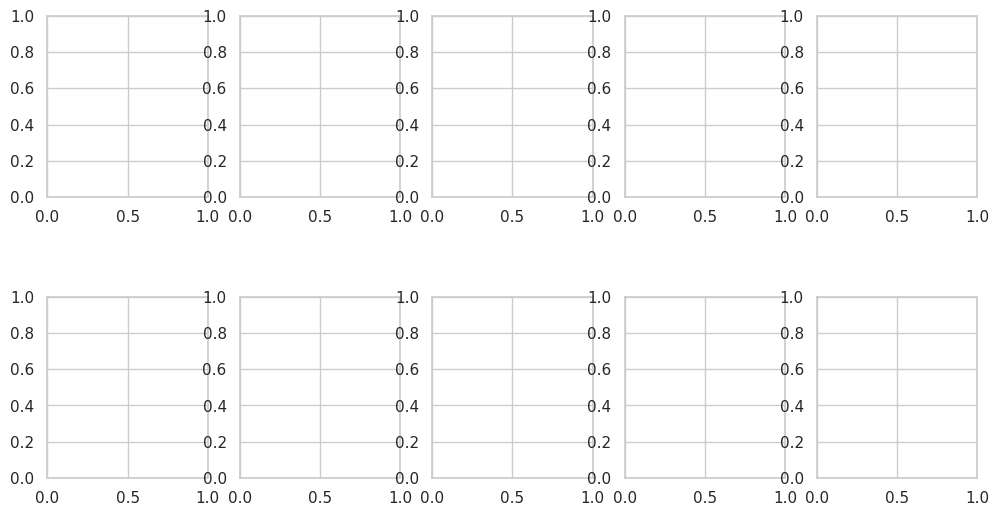

In [ ]:
# Model Inversion (BL1-style)
# baseline + small stabilizers (no noise disabled)

device = next(model.parameters()).device
model.eval()
for p in model.parameters():
    p.requires_grad_(False)

T = getattr(model, "T", 25)
num_outputs = 10
eps = 1e-12

def net_logits(spiky_input):
    """
    spiky_input: (T, 1, 1, 28, 28) in {0,1}
    returns logits: (1, 10)
    """
    return model(spiky_input)

# -----------------------
# Hyperparameters
# -----------------------
num_iters = 30
num_restarts = 5

init_prob = 0.02         # start density (0.01-0.05). If too dark: increase to 0.03-0.05
use_softmax = False      # logits are more stable

# Mask sampling strength (Fix 1 behavior)
mask_scale = 1.0         # 1.0 = original-ish. If too dense/noisy: 0.7. If too dark: 1.2

# Optional: margin objective to avoid "collapse to a dominant class"
use_margin = True
kappa = 0.5              # margin. Try 0.2-1.0

# Soft density regularizer (NO hard projection)
use_density_penalty = True
target_density = 0.08    # encourage density around this (0.06-0.15)
lambda_density = 0.5     # strength (0.1-1.0)

# Stabilizer: reduce noise sensitivity by smoothing gradients across time
use_time_grad_smoothing = True

# -----------------------
# Storage
# -----------------------
Inverted_Samples = []

fig, axes = plt.subplots(2, 5, figsize=(12, 6))
plt.subplots_adjust(hspace=0.55)

for target_class in range(num_outputs):

    best_spiky = None
    best_conf = -1.0

    for restart in range(num_restarts):

        # Random binary initialization (Fix 1)
        spiky_input = (torch.rand((T, 1, 1, 28, 28), device=device) < init_prob).float()

        for it in range(num_iters):

            spiky_input = spiky_input.detach().requires_grad_(True)
            spiky_input.retain_grad()

            logits = net_logits(spiky_input)

            # -----------------------
            # Objective to maximize
            # -----------------------
            if use_margin:
                # margin: target logit - logsumexp(others)
                tgt = logits[0, target_class]
                others = torch.logsumexp(
                    torch.cat([logits[0, :target_class], logits[0, target_class+1:]]),
                    dim=0
                )
                cost = tgt - others - kappa
            else:
                cost = logits[0, target_class] if not use_softmax else F.softmax(logits, dim=1)[0, target_class]

            # Soft density penalty (keeps things from turning into mush or collapsing)
            if use_density_penalty:
                dens = spiky_input.mean()
                cost = cost - lambda_density * (dens - target_density).abs()

            # Ascend on cost
            cost.backward()

            with torch.no_grad():
                grad = spiky_input.grad
                if grad is None:
                    raise RuntimeError("grad is None (spiky_input must be leaf + requires_grad).")

                # -----------------------
                # Gradient magnitude processing (Fix 1)
                # -----------------------
                grad_abs = grad.abs()

                # Optional: smooth gradient statistics across time to reduce noise sensitivity
                if use_time_grad_smoothing:
                    # Average over time, then broadcast back to all timesteps
                    # Shape: (1,1,28,28)
                    g_spatial = grad_abs.mean(dim=0, keepdim=True)
                    grad_abs = g_spatial.repeat(T, 1, 1, 1, 1)

                gmin = grad_abs.min()
                gmax = grad_abs.max()
                grad_norm = (grad_abs - gmin) / (gmax - gmin + eps)

                # Stochastic binary mask from normalized gradients
                # mask_scale < 1 reduces updates, > 1 increases updates
                grad_mask = torch.bernoulli(torch.clamp(grad_norm * mask_scale, 0.0, 1.0))

                # Sign extraction
                grad_mask_sign = torch.sign(grad) * grad_mask

                # Overflow-aware binarized update
                spiky_input = torch.where(
                    spiky_input + grad_mask_sign > 0,
                    torch.ones_like(spiky_input),
                    torch.zeros_like(spiky_input)
                )

            # Debug
            if it % 5 == 0 or it == num_iters - 1:
                with torch.no_grad():
                    logits_dbg = net_logits(spiky_input)
                    prob_dbg = F.softmax(logits_dbg, dim=1)[0, target_class].item()
                    logit_dbg = logits_dbg[0, target_class].item()
                    pred_dbg = logits_dbg.argmax(1).item()
                    dens_dbg = spiky_input.mean().item()

                print(f"[Class {target_class} | restart {restart}] iter {it:02d} | "
                      f"prob={prob_dbg:.3e} | logit={logit_dbg:.3f} | pred={pred_dbg} | density={dens_dbg:.3e}")

        # Pick best restart by final confidence
        with torch.no_grad():
            logits_final = net_logits(spiky_input)
            conf_final = F.softmax(logits_final, dim=1)[0, target_class].item()

        if conf_final > best_conf:
            best_conf = conf_final
            best_spiky = spiky_input.detach().clone()

    # Store and plot
    Inverted_Samples.append(best_spiky.detach().cpu())

    row = target_class // 5
    col = target_class % 5
    decoded = best_spiky.detach().cpu().sum(dim=0).squeeze()  # (28,28)

    axes[row, col].imshow(decoded, cmap="gray")
    axes[row, col].set_title(f"Sym {target_class}\nConf: {best_conf:.3e}")
    axes[row, col].axis("off")

plt.tight_layout()
plt.show()

Inverted_Samples = torch.stack(Inverted_Samples, dim=0)  # (10, T, 1, 1, 28, 28)

[restart 0] it   0/500 | p=0.327 | margin=-0.71 | bn=8.740 | 0.3s
[restart 0] it  50/500 | p=0.088 | margin=-0.51 | bn=9.010 | 13.3s
[restart 0] it 100/500 | p=0.088 | margin=-0.51 | bn=9.011 | 27.2s
[restart 0] it 150/500 | p=0.088 | margin=-0.51 | bn=9.011 | 41.3s
[restart 0] it 200/500 | p=0.088 | margin=-0.51 | bn=9.011 | 55.2s
[restart 0] it 250/500 | p=0.088 | margin=-0.51 | bn=9.011 | 68.2s
[restart 0] it 300/500 | p=0.088 | margin=-0.51 | bn=9.011 | 83.8s
[restart 0] it 350/500 | p=0.088 | margin=-0.51 | bn=9.011 | 98.1s
[restart 0] it 400/500 | p=0.088 | margin=-0.51 | bn=9.011 | 110.7s
[restart 0] it 450/500 | p=0.088 | margin=-0.51 | bn=9.011 | 123.0s
[restart 0] it 499/500 | p=0.088 | margin=-0.51 | bn=9.011 | 134.4s
[restart 1] it   0/500 | p=0.227 | margin=-1.23 | bn=8.739 | 0.3s
[restart 1] it  50/500 | p=0.088 | margin=-0.51 | bn=9.010 | 12.0s
[restart 1] it 100/500 | p=0.088 | margin=-0.51 | bn=9.011 | 23.7s
[restart 1] it 150/500 | p=0.088 | margin=-0.51 | bn=9.011 | 

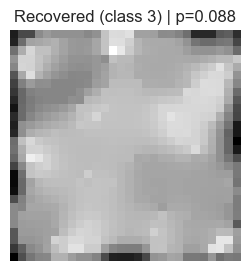

In [ ]:
model.eval()
for p in model.parameters():
    p.requires_grad = False

device = next(model.parameters()).device
T = model.T

def tv_loss(img):
    dx = (img[:, :, :, 1:] - img[:, :, :, :-1]).abs()
    dy = (img[:, :, 1:, :] - img[:, :, :-1, :]).abs()
    return dx.mean() + dy.mean()

def l1_loss(img):
    return img.abs().mean()

def center_prior(img):
    yy, xx = torch.meshgrid(
        torch.linspace(-1, 1, 28, device=img.device),
        torch.linspace(-1, 1, 28, device=img.device),
        indexing="ij",
    )
    mask = torch.exp(-(xx**2 + yy**2) / 0.5)
    return ((1 - mask) * img.squeeze()).mean()

def random_shift(img, max_shift=2):
    sx = torch.randint(-max_shift, max_shift + 1, (1,), device=img.device).item()
    sy = torch.randint(-max_shift, max_shift + 1, (1,), device=img.device).item()
    return torch.roll(img, shifts=(sy, sx), dims=(2, 3))

def laplacian_loss(img):
    k = torch.tensor([[0,1,0],[1,-4,1],[0,1,0]], device=img.device).float()
    k = k.view(1,1,3,3)
    lap = F.conv2d(img, k, padding=1)
    return lap.abs().mean()

def forward_eot_logits_poisson(img, n_eot=8):
    B = img.shape[0]
    imgs_rep = img.repeat(n_eot, 1, 1, 1)
    spikes = poisson_encode_dynamic(imgs_rep, T=T)
    logits = model(spikes)
    return logits.view(n_eot, B, -1).mean(dim=0)

# ---- BN hooks ----
_bn_cache = []
def _bn_hook(module, inp, out):
    with torch.no_grad():
        mean = out.mean(dim=(0, 2, 3))
        var  = out.var(dim=(0, 2, 3), unbiased=False)
    _bn_cache.append((module, mean, var))

hooks = []
for m in model.modules():
    if isinstance(m, torch.nn.BatchNorm2d):
        hooks.append(m.register_forward_hook(_bn_hook))

def bn_stat_loss():
    loss = 0.0
    for (bn, mean, var) in _bn_cache:
        rm = bn.running_mean
        rv = bn.running_var
        loss = loss + (mean - rm).pow(2).mean() + (var - rv).pow(2).mean()
    return torch.log1p(loss)   # compress huge values

# -------------------------
# Attack config
# -------------------------
target_class = 3
n_iter = 500
lr = 0.08
n_eot = 8
restarts = 6

blur_schedule = [(0, 7, 1.5), (200, 5, 1.0), (350, 3, 0.7)]

lambda_tv     = 2e-2
lambda_l1     = 3e-2
lambda_center = 5e-4
lambda_bn     = 0.5
lambda_l2     = 1e-4
lambda_lap    = 2e-2

best_img = None
best_score = -1e9
best_p = -1.0

for r in range(restarts):
    z = torch.randn(1, 1, 28, 28, device=device) * 0.25
    z.requires_grad_(True)
    opt = torch.optim.Adam([z], lr=lr)

    t0 = time.time()
    blur_k, blur_s = 7, 1.5

    for it in range(n_iter):
        opt.zero_grad()

        for (t_start, k, s) in reversed(blur_schedule):
            if it >= t_start:
                blur_k, blur_s = k, s
                break

        img = gaussian_blur(z, kernel_size=blur_k, sigma=blur_s)
        img = torch.sigmoid(img)

        img_j = random_shift(img, max_shift=2)

        _bn_cache.clear()
        logits = forward_eot_logits_poisson(img_j, n_eot=n_eot)
        probs = F.softmax(logits, dim=1)

        tgt = logits[0, target_class]
        other = torch.cat([logits[0, :target_class], logits[0, target_class+1:]]).max()

        # hinge margin: prevent pushing margin to +25
        m = 3.0
        loss_cls = F.relu(m - (tgt - other))

        loss_bn = bn_stat_loss()

        loss = (
            loss_cls
            + lambda_bn     * loss_bn
            + lambda_tv     * tv_loss(img)
            + lambda_l1     * l1_loss(img)
            + lambda_lap    * laplacian_loss(img)
            + lambda_center * center_prior(img)
            + lambda_l2     * img.pow(2).mean()
        )

        loss.backward()
        opt.step()

        if it % 50 == 0 or it == n_iter - 1:
            p = probs[0, target_class].item()
            elapsed = time.time() - t0
            print(f"[restart {r}] it {it:3d}/{n_iter} | p={p:.3f} | margin={(tgt-other).item():+.2f} | bn={loss_bn.item():.3f} | {elapsed:.1f}s")

    with torch.no_grad():
        _bn_cache.clear()
        logits_f = forward_eot_logits_poisson(img, n_eot=32)
        probs_f = F.softmax(logits_f, dim=1)
        p_final = probs_f[0, target_class].item()
        bn_f = bn_stat_loss().item()
        margin_f = (logits_f[0, target_class] - torch.cat([logits_f[0,:target_class], logits_f[0,target_class+1:]]).max()).item()
        score = margin_f - 0.5 * bn_f

    if score > best_score:
        best_score = score
        best_p = p_final
        best_img = img.detach().cpu()

print(f"\nBEST: p(target={target_class})={best_p:.3f} | score={best_score:.3f}")

plt.figure(figsize=(3,3))
plt.imshow(best_img.squeeze(), cmap="gray")
plt.title(f"Recovered (class {target_class}) | p={best_p:.3f}")
plt.axis("off")
plt.show()

for h in hooks:
    h.remove()


[restart 0] it   0/300 | p=0.169 | 0.6s
[restart 0] it  50/300 | p=1.000 | 33.4s
[restart 0] it 100/300 | p=1.000 | 67.4s
[restart 0] it 150/300 | p=1.000 | 101.5s
[restart 0] it 200/300 | p=1.000 | 136.1s
[restart 0] it 250/300 | p=1.000 | 168.2s
[restart 0] it 299/300 | p=1.000 | 198.7s
[restart 1] it   0/300 | p=0.161 | 0.6s
[restart 1] it  50/300 | p=1.000 | 31.5s
[restart 1] it 100/300 | p=1.000 | 62.6s
[restart 1] it 150/300 | p=1.000 | 93.4s
[restart 1] it 200/300 | p=1.000 | 120.9s
[restart 1] it 250/300 | p=1.000 | 149.1s
[restart 1] it 299/300 | p=1.000 | 180.0s
[restart 2] it   0/300 | p=0.514 | 0.6s
[restart 2] it  50/300 | p=1.000 | 32.6s
[restart 2] it 100/300 | p=1.000 | 64.5s
[restart 2] it 150/300 | p=1.000 | 97.1s
[restart 2] it 200/300 | p=1.000 | 125.9s
[restart 2] it 250/300 | p=1.000 | 155.3s
[restart 2] it 299/300 | p=1.000 | 183.6s
[restart 3] it   0/300 | p=0.570 | 0.6s
[restart 3] it  50/300 | p=1.000 | 29.1s
[restart 3] it 100/300 | p=1.000 | 58.0s
[restart 3

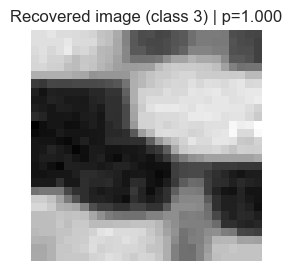

In [ ]:
model.eval()
for p in model.parameters():
    p.requires_grad = False

T = model.T

def tv_loss(img):
    dx = (img[:, :, :, 1:] - img[:, :, :, :-1]).abs()
    dy = (img[:, :, 1:, :] - img[:, :, :-1, :]).abs()
    return dx.mean() + dy.mean()

def center_prior(img):
    yy, xx = torch.meshgrid(
        torch.linspace(-1, 1, 28, device=img.device),
        torch.linspace(-1, 1, 28, device=img.device),
        indexing="ij",
    )
    mask = torch.exp(-(xx**2 + yy**2) / 0.5)
    return ((1 - mask) * img.squeeze()).mean()

def binarize_loss(img):
    # encourages pixels toward 0 or 1 (reduces grey fog)
    return (img * (1.0 - img)).mean()

def entropy_loss(probs):
    # encourage confident predictions (low entropy)
    return -(probs * (probs + 1e-8).log()).sum(dim=1).mean()

def forward_eot_logits(img, n_eot=12):
    B = img.shape[0]
    imgs_rep = img.repeat(n_eot, 1, 1, 1)                 # [n_eot*B,1,28,28]
    spikes = poisson_encode_dynamic(imgs_rep, T=T)        # [T, n_eot*B,1,28,28]
    logits = model(spikes)                                # [n_eot*B,10]
    logits = logits.view(n_eot, B, -1).mean(dim=0)        # [B,10]

    return logits
def forward_eot_logits_diff(img, n_eot=8, noise_std=0.05):
    """
    Differentiable EOT: add small noise to img, then rate-code deterministically.
    No Poisson sampling => gradients flow.
    """
    B = img.shape[0]
    imgs_rep = img.repeat(n_eot, 1, 1, 1)                      # [n_eot*B,1,28,28]
    if noise_std > 0:
        imgs_rep = (imgs_rep + noise_std * torch.randn_like(imgs_rep)).clamp(0, 1)

    spikes = imgs_rep.unsqueeze(0).repeat(T, 1, 1, 1, 1)       # [T, n_eot*B,1,28,28]
    logits = model(spikes)                                     # [n_eot*B,10]
    logits = logits.view(n_eot, B, -1).mean(dim=0)             # [B,10]
    return logits

# -------------------------
# Attack hyperparams
# -------------------------
target_class = 3

n_iter = 300
lr = 0.10
n_eot = 16

lambda_tv     = 2e-2
lambda_center = 2e-3
lambda_l2     = 1e-4
lambda_bin    = 2e-2
lambda_ent    = 1e-2 # 5e-2

restarts = 8

best_img = None
best_p = -1.0

for r in range(restarts):
    # latent
    z = torch.randn(1, 1, 28, 28, device=device) * 0.25
    z.requires_grad_(True)
    opt = torch.optim.Adam([z], lr=lr)

    blur_kernel, blur_sigma = 7, 1.5
    t0 = time.time()

    for it in range(n_iter):
        opt.zero_grad()

        # progressive deblurring
        if it == 120:
            blur_kernel, blur_sigma = 5, 1.0
        if it == 220:
            blur_kernel, blur_sigma = 3, 0.7

        img = gaussian_blur(z, kernel_size=blur_kernel, sigma=blur_sigma)
        img = torch.sigmoid(img)

        logits = forward_eot_logits_diff(img, n_eot=n_eot, noise_std=0.05)
        probs = F.softmax(logits, dim=1)

        # maximize log p(target)
        loss_cls = -torch.log(probs[0, target_class] + 1e-8)

        loss = (
            loss_cls
            + lambda_tv * tv_loss(img)
            + lambda_center * center_prior(img)
            + lambda_l2 * img.pow(2).mean()
            + lambda_bin * binarize_loss(img)
            + lambda_ent * entropy_loss(probs)
        )

        loss.backward()
        opt.step()

        if it % 50 == 0 or it == n_iter - 1:
            p = probs[0, target_class].item()
            elapsed = time.time() - t0
            print(f"[restart {r}] it {it:3d}/{n_iter} | p={p:.3f} | {elapsed:.1f}s")

    with torch.no_grad():
        #logits = forward_eot_logits(img, n_eot=32)   # stronger estimate
        logits = forward_eot_logits_diff(img, n_eot=n_eot, noise_std=0.05)
        probs = F.softmax(logits, dim=1)
        p_final = probs[0, target_class].item()

    if p_final > best_p:
        best_p = p_final
        best_img = img.detach().cpu()

print(f"\nBEST p(target={target_class}) = {best_p:.3f}")

plt.figure(figsize=(3,3))
plt.imshow(best_img.squeeze(), cmap="gray")
plt.title(f"Recovered image (class {target_class}) | p={best_p:.3f}")
plt.axis("off")
plt.show()

[Class 0] iter 0 | loss=3.40
[Class 0] iter 200 | loss=0.00
[Class 0] iter 400 | loss=0.00
[Class 0] iter 600 | loss=0.00
[Class 1] iter 0 | loss=1.36
[Class 1] iter 200 | loss=0.03
[Class 1] iter 400 | loss=0.03
[Class 1] iter 600 | loss=0.02
[Class 2] iter 0 | loss=1.78
[Class 2] iter 200 | loss=0.00
[Class 2] iter 400 | loss=0.00
[Class 2] iter 600 | loss=0.00
[Class 3] iter 0 | loss=2.45
[Class 3] iter 200 | loss=0.00
[Class 3] iter 400 | loss=0.00
[Class 3] iter 600 | loss=0.00
[Class 4] iter 0 | loss=1.79
[Class 4] iter 200 | loss=0.00
[Class 4] iter 400 | loss=0.00
[Class 4] iter 600 | loss=0.01
[Class 5] iter 0 | loss=3.15
[Class 5] iter 200 | loss=0.00
[Class 5] iter 400 | loss=0.00
[Class 5] iter 600 | loss=0.00
[Class 6] iter 0 | loss=2.73
[Class 6] iter 200 | loss=0.00
[Class 6] iter 400 | loss=0.01
[Class 6] iter 600 | loss=0.01
[Class 7] iter 0 | loss=2.21
[Class 7] iter 200 | loss=0.00
[Class 7] iter 400 | loss=0.00
[Class 7] iter 600 | loss=0.00
[Class 8] iter 0 | loss=

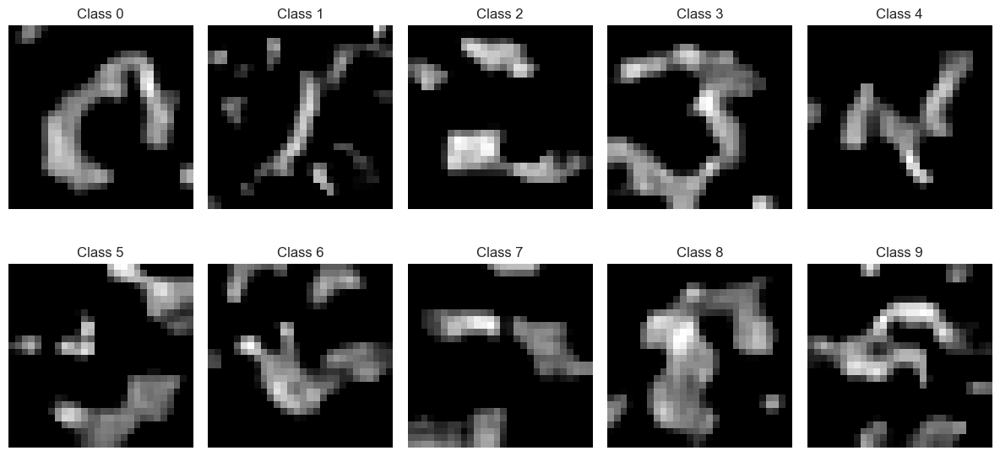

In [ ]:
model.eval()
for p in model.parameters():
    p.requires_grad = False

T = model.T

def forward_from_rate(img):
    spikes = img.unsqueeze(0).repeat(T,1,1,1,1)
    logits = model(spikes)
    return logits

def tv_loss(img):
    dx = (img[:,:,:,1:] - img[:,:,:,:-1]).abs()
    dy = (img[:,:,1:,:] - img[:,:,:-1,:]).abs()
    return dx.mean() + dy.mean()

def sparsity_loss(img):
    return img.abs().mean()

n_iter = 800
lr = 0.05

lambda_tv = 3e-2
lambda_l1 = 5e-2
lambda_l2 = 1e-4

fig, axes = plt.subplots(2,5, figsize=(12,6))
plt.subplots_adjust(hspace=0.4)

for target_class in range(10):

    # Latent variable (THIS is optimized)
    z = torch.randn(1,1,28,28, device=device) * 0.3
    z.requires_grad_(True)

    optimizer = torch.optim.Adam([z], lr=lr)

    for it in range(n_iter):

        optimizer.zero_grad()

        # Smooth projection (key step)
        img = gaussian_blur(z, kernel_size=5, sigma=1.0)
        img = img.clamp(0,1)

        logits = forward_from_rate(img)
        log_probs = F.log_softmax(logits, dim=1)
        loss_cls = -log_probs[0, target_class]

        loss = (
            loss_cls
            + lambda_tv * tv_loss(img)
            + lambda_l1 * sparsity_loss(img)
            + lambda_l2 * img.pow(2).mean()
        )

        loss.backward()
        optimizer.step()

        if it % 200 == 0:
            print(f"[Class {target_class}] iter {it} | loss={loss_cls.item():.2f}")

    ax = axes[target_class//5, target_class%5]
    ax.imshow(img.detach().cpu().squeeze(), cmap="gray")
    ax.set_title(f"Class {target_class}")
    ax.axis("off")

plt.tight_layout()
plt.show()

# From Memristor to SNN

## F1 - Memristive Convolution Layer

This module defines a memristive convolution layer with a large and realistic physical conductance range. 

It initializes conductances using a Xavier-like distribution mapped into [Gmin, Gmax], clamps them each forward pass to ensure device realism, and amplifies them with a gain factor to avoid extremely small activations. 

This constitutes a practical but simplified physical memristor model, focusing on bounded conductances without internal filament dynamics.

In [ ]:
class MemConv2dHighRange(nn.Module):
    def __init__(self, in_ch, out_ch,
                 k=5, stride=1, padding=2,
                 Gmin=1e-4, Gmax=2e-3,
                 gain=400.0): #400 1e-5
        super().__init__()
        self.Gmin = Gmin
        self.Gmax = Gmax
        self.gain = gain
        self.stride = stride
        self.padding = padding

        # Xavier-like init inside conductance range
        limit = math.sqrt(6 / (in_ch*k*k + out_ch*k*k))
        W = torch.empty(out_ch, in_ch, k, k).uniform_(-limit, limit)
        W = torch.sigmoid(W) * (Gmax - Gmin) + Gmin
        self.G = nn.Parameter(W)

        self.bias = nn.Parameter(torch.zeros(out_ch))

    def forward(self, x):
        with torch.no_grad():
            self.G.clamp_(self.Gmin, self.Gmax)
        return F.conv2d(x, self.G * self.gain,
                        bias=self.bias,
                        stride=self.stride,
                        padding=self.padding)

## F2 - Memristive Fully Connected Layer

This module creates a memristive fully connected layer with conductance constraints. 

Like the memristive convolution, it maps a Xavier-initialized matrix to conductance limits and applies a gain factor. 

This provides a realistic readout layer with bounded analog values.

In [ ]:
class MemLinearHighRange(nn.Module):
    def __init__(self, in_features, out_features, Gmin=1e-5, Gmax=2e-3, gain=200.0): #400 1e-5 1e-4
        super().__init__()
        self.Gmin = Gmin
        self.Gmax = Gmax
        self.gain = gain

        limit = math.sqrt(6 / (in_features + out_features))
        W = torch.empty(out_features, in_features).uniform_(-limit, limit)
        W = torch.sigmoid(W)*(Gmax-Gmin)+Gmin
        self.G = nn.Parameter(W)
        self.bias = nn.Parameter(torch.zeros(out_features))

    def forward(self, x):
        with torch.no_grad():
            self.G.clamp_(self.Gmin, self.Gmax)
        return F.linear(x, self.G * self.gain, self.bias)

## F3 - LIF

This defines an improved LIF neuron model with trainable threshold. 

It performs exponential integration, surrogate-gradient spiking, and hard reset behavior. 

The neuron state persists through time, enabling temporal dynamics required for spiking computation.

In [ ]:
class LIF_Pro(nn.Module):
    def __init__(self, tau=5.0, v_th=1.0, v_reset=0.0):
        super().__init__()
        self.tau = tau
        self.v_th = nn.Parameter(torch.tensor(v_th))
        self.v_reset = v_reset

    def forward(self, I, v):
        if v is None:
            v = torch.zeros_like(I)
        v = v + (I - v) / self.tau
        spk = surrogate_spike(v - self.v_th)
        v = torch.where(spk > 0, torch.tensor(self.v_reset, device=v.device), v)
        return spk, v

## F4 - Poisson Encoding

This function generates dynamic Poisson spike trains from image intensities. 

It adjusts firing probability using a base rate, ensuring that spike statistics can be tuned to control network firing density and energy usage.

In [ ]:
def poisson_encode_dynamic(x, T=15, base_rate=1.0):
    x = x.clamp(0, 1) # base_rate=0.8 1.1 1.0 1.2 T=15
    p = (x * base_rate).clamp(0, 1)
    rand = torch.rand(T, *x.shape, device=x.device)
    return (rand < p.unsqueeze(0)).float()

## F5 - MemSNN_90 Analysis

This class implements a high-accuracy memristive spiking CNN. 

It uses two memristive convolution layers with batch normalization and LIF dynamics, followed by a memristive linear readout. 

The model processes multiple timesteps of spikes, maintains membrane states, and averages logits over time.

In [ ]:
class MemSNN_90(nn.Module):
    def __init__(self, T=25):
        super().__init__()
        self.T = T

        self.conv1 = MemConv2dHighRange(1, 16, k=5, padding=2, gain=400) # k=5
        self.bn1   = nn.BatchNorm2d(16, momentum=0.05) # no momentum=0.05 0.01
        #self.bn1 = nn.Identity()
        self.lif1  = LIF_Pro(tau=5.0, v_th=0.3) # 1.0 0.8 0.3 tau=5.0

        self.conv2 = MemConv2dHighRange(16, 32, k=5, padding=2, gain=400) # k=5  gain=200
        self.bn2   = nn.BatchNorm2d(32, momentum=0.05) # no momentum=0.05 0.01
        #self.bn2 = nn.Identity()
        self.lif2  = LIF_Pro(tau=5.0, v_th=0.3) # 1.0 0.8 0.3 tau=5.0

        self.fc    = MemLinearHighRange(32*7*7, 10)

    def forward(self, spikes):
        T, B = self.T, spikes.size(1)
        v1 = v2 = None
        logits_T = []

        for t in range(T):
            x = spikes[t]

            u1 = self.bn1(self.conv1(x))
            spk1, v1 = self.lif1(u1, v1)
            s1p = F.avg_pool2d(spk1, 2)

            u2 = self.bn2(self.conv2(s1p))
            spk2, v2 = self.lif2(u2, v2)
            s2p = F.avg_pool2d(spk2, 2)

            flat = s2p.view(B, -1)
            logits = self.fc(flat)
            logits_T.append(logits)

        return torch.stack(logits_T).mean(0)

## F6 - Training Loop

This block trains the memristive SNN using Adam and a multi-step learning rate schedule. 

It dynamically encodes images into spikes each batch and evaluates test accuracy over time. The loop logs loss, training accuracy, and testing accuracy.

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model = MemSNN_90(T=25).to(device) # 15 20 35
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.MultiStepLR(
    optimizer, milestones=[10, 18], gamma=0.5
)

epochs = 20
train_acc_hist, test_acc_hist = [], []

def evaluate(model, loader):
    model.eval()
    correct = total = 0
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            spikes = poisson_encode_dynamic(xb, T=model.T)
            logits = model(spikes)
            pred = logits.argmax(1)
            correct += (pred == yb).sum().item()
            total += yb.size(0)
    return correct/total

for epoch in range(1, epochs+1):
    model.train()
    correct = total = loss_sum = 0

    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        spikes = poisson_encode_dynamic(xb, T=model.T)

        logits = model(spikes)
        loss = F.cross_entropy(logits, yb)

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()

        with torch.no_grad():
            pred = logits.argmax(1)
            correct += (pred == yb).sum().item()
            total += yb.size(0)
            loss_sum += loss.item()*yb.size(0)
            
    scheduler.step()

    train_acc = correct/total
    test_acc = evaluate(model, test_loader)
    train_acc_hist.append(train_acc)
    test_acc_hist.append(test_acc)

    print(f"Epoch {epoch}/{epochs} "
          f"- loss={loss_sum/total:.4f}, "
          f"train_acc={train_acc*100:.2f}%, "
          f"test_acc={test_acc*100:.2f}%")

Epoch 1/20 - loss=3.2715, train_acc=62.94%, test_acc=61.40%
Epoch 2/20 - loss=1.6995, train_acc=66.14%, test_acc=59.10%
Epoch 3/20 - loss=1.4998, train_acc=65.52%, test_acc=54.50%
Epoch 4/20 - loss=1.3013, train_acc=67.56%, test_acc=69.30%
Epoch 5/20 - loss=1.2838, train_acc=66.54%, test_acc=58.20%
Epoch 6/20 - loss=1.2129, train_acc=67.10%, test_acc=66.00%
Epoch 7/20 - loss=1.0972, train_acc=69.26%, test_acc=59.80%
Epoch 8/20 - loss=1.0371, train_acc=70.54%, test_acc=60.30%
Epoch 9/20 - loss=1.1625, train_acc=69.12%, test_acc=54.70%
Epoch 10/20 - loss=1.2348, train_acc=66.70%, test_acc=59.30%
Epoch 11/20 - loss=0.9746, train_acc=71.86%, test_acc=62.80%
Epoch 12/20 - loss=0.9556, train_acc=72.98%, test_acc=65.90%
Epoch 13/20 - loss=1.0769, train_acc=70.92%, test_acc=65.80%
Epoch 14/20 - loss=1.0343, train_acc=71.76%, test_acc=68.70%
Epoch 15/20 - loss=0.9473, train_acc=73.10%, test_acc=63.90%
Epoch 16/20 - loss=0.9966, train_acc=72.02%, test_acc=71.00%
Epoch 17/20 - loss=1.0822, train_

## F7 - Core performance and firing-rate visualizations
This block evaluates the global behavior of the memristive SNN by plotting accuracy curves, logits of a sample prediction, and firing-rate statistics. 

The accuracy plot shows how both training and test performance evolve over epochs, confirming whether the network converges or overfits. 

The logits visualization illustrates how the SNN distributes evidence across classes for a specific input. 

Finally, the firing-rate heatmaps and decay curves reveal the temporal dynamics of the first convolutional layer and verify that spiking activity remains stable and non-saturated.

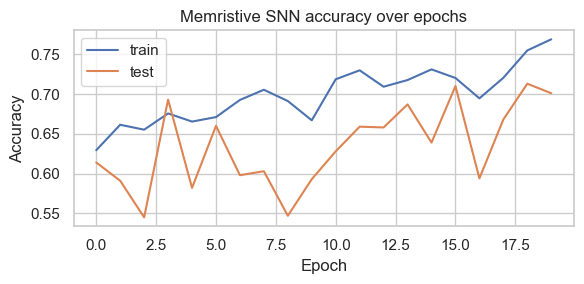

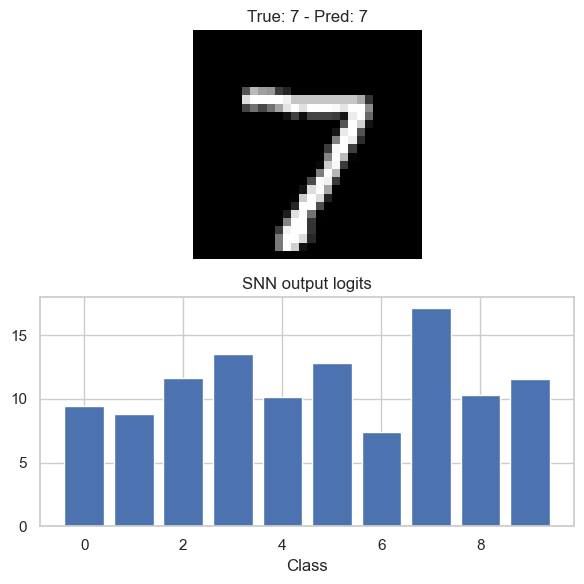

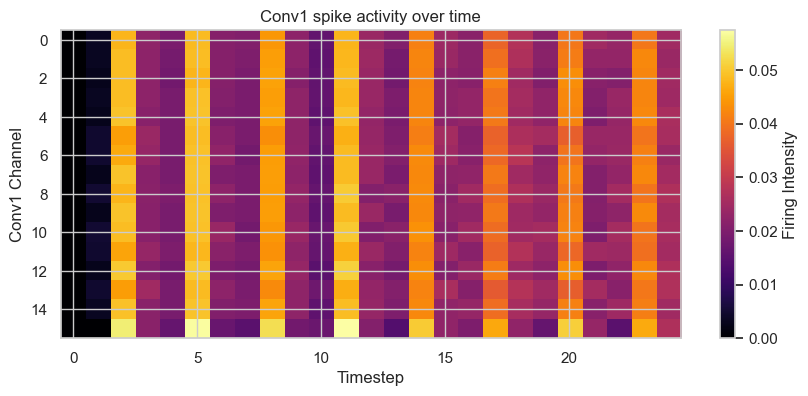

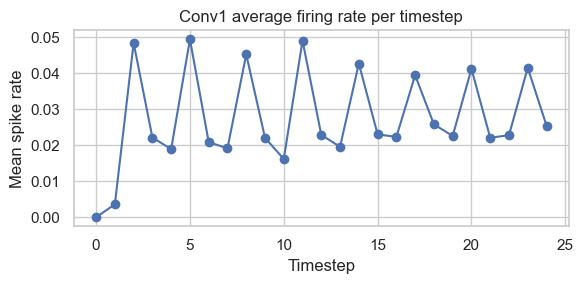

In [ ]:
# Accuracy curves
plt.figure(figsize=(6,3))
plt.plot(train_acc_hist, label="train")
plt.plot(test_acc_hist, label="test")
plt.title("Memristive SNN accuracy over epochs")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


# Visualize logits of a random test image
model.eval()
xb, yb = next(iter(test_loader))
xb = xb.to(device)
yb = yb.to(device)
spikes = poisson_encode_dynamic(xb, T=model.T)

logits = model(spikes)
pred = logits.argmax(1)

idx = 0  # first image
plt.figure(figsize=(6,6))

plt.subplot(2,1,1)
plt.imshow(xb[idx].cpu().squeeze(), cmap="gray")
plt.title(f"True: {yb[idx].item()} - Pred: {pred[idx].item()}")
plt.axis("off")

plt.subplot(2,1,2)
plt.bar(range(10), logits[idx].cpu().detach().numpy())
plt.title("SNN output logits")
plt.xlabel("Class")
plt.tight_layout()
plt.show()

# Firing rate heatmap
# record firing rates during 1 forward pass
with torch.no_grad():
    spikes = poisson_encode_dynamic(xb[:4], T=model.T)
    conv1_rates = np.zeros((16, model.T))

    v1 = None
    for t in range(model.T):
        x = spikes[t]
        u1 = model.bn1(model.conv1(x))
        spk1, v1 = model.lif1(u1, v1)
        conv1_rates[:, t] = spk1.mean(dim=(0,2,3)).cpu().numpy()

plt.figure(figsize=(10,4))
plt.imshow(conv1_rates, aspect="auto", cmap="inferno")
plt.colorbar(label="Firing Intensity")
plt.xlabel("Timestep")
plt.ylabel("Conv1 Channel")
plt.title("Conv1 spike activity over time")
plt.show()


# Mean spike rate decay curve
mean_rate = conv1_rates.mean(axis=0)
plt.figure(figsize=(6,3))
plt.plot(mean_rate, marker="o")
plt.title("Conv1 average firing rate per timestep")
plt.xlabel("Timestep")
plt.ylabel("Mean spike rate")
plt.grid(True)
plt.tight_layout()
plt.show()

## F8 - Memristive kernel visualization and conductance distribution
This block displays the learned memristive convolutional kernels to show how the network extracts spatial features from the input. 

The first eight filters are visualized directly, revealing edge-, orientation-, or stroke-like receptive patterns. 

The histogram of kernel conductances highlights how training pushes many memristors toward low or high values, producing a physically sparse structure typical of memristive arrays. 

These plots confirm that the conducted-based weights remain within their physical range while still forming interpretable filters.

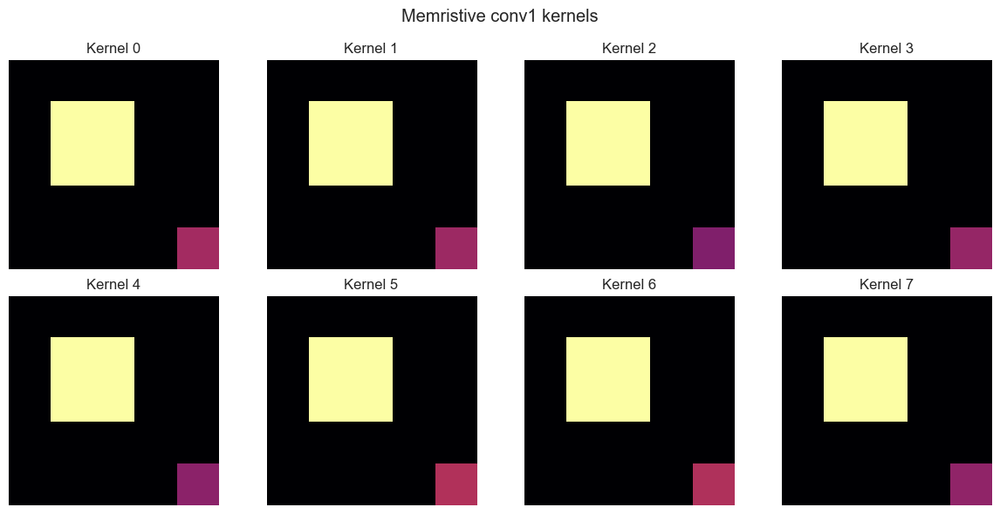

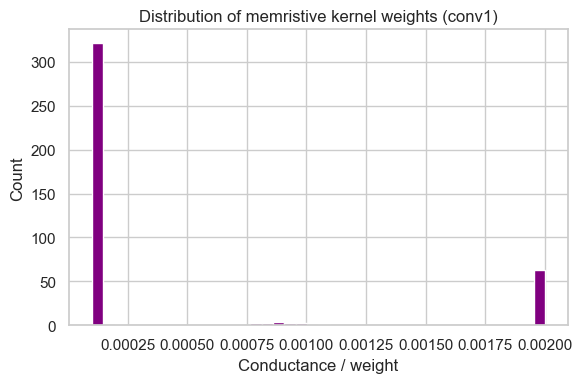

In [ ]:
kernels = model.conv1.G.detach().cpu().numpy()
n_k = kernels.shape[0]

plt.figure(figsize=(12,6))
for i in range(8):  # show first 8 kernels
    plt.subplot(2,4,i+1)
    plt.imshow(kernels[i,0], cmap="inferno")
    plt.title(f"Kernel {i}")
    plt.axis("off")
plt.suptitle("Memristive conv1 kernels")
plt.tight_layout()
plt.show()

flat_k = kernels.flatten()
plt.figure(figsize=(6,4))
plt.hist(flat_k, bins=40, color="purple")
plt.title("Distribution of memristive kernel weights (conv1)")
plt.xlabel("Conductance / weight")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

## F9 - Receptive fields of conv1 channels
This block visualizes the full set of conv1 receptive fields to understand the spatial patterns each channel responds to. 

The filters form structured templates such as horizontal, vertical, or diagonal stroke detectors, indicating successful specialization. 

Visualizing all 16 kernels helps verify that the network learns a diverse set of features instead of collapsing to redundant patterns. 

These receptive fields illustrate how the memristive constraints still allow for rich representational capacity.

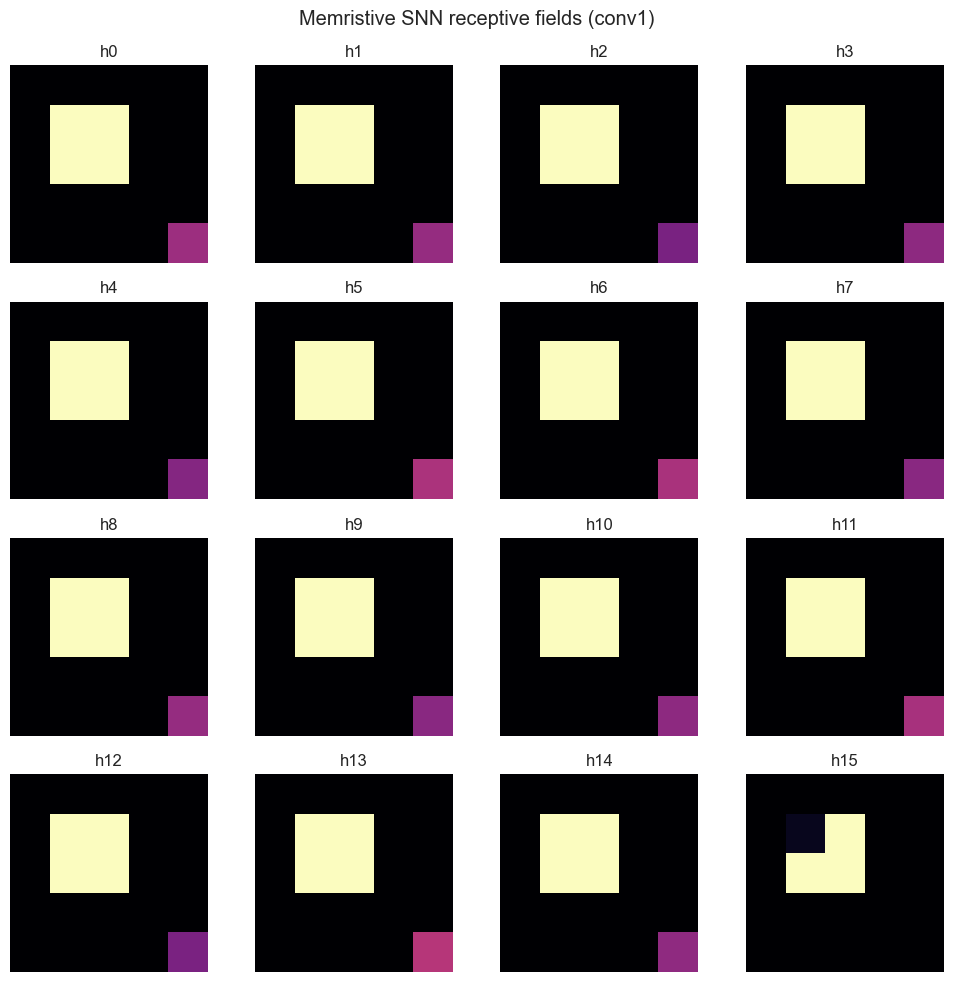

In [ ]:
plt.figure(figsize=(10,10))
for i in range(16):
    plt.subplot(4,4,i+1)
    plt.imshow(kernels[i,0], cmap="magma")
    plt.title(f"h{i}")
    plt.axis("off")

plt.suptitle("Memristive SNN receptive fields (conv1)")
plt.tight_layout()
plt.show()

## F10 - Deeper-layer spiking activity and energy analysis
This block examines conv2 firing dynamics through spike heatmaps and per-timestep firing rates, revealing how deeper layers integrate and transform information from earlier spikes. 

Conv2 typically exhibits richer activation patterns, demonstrating effective hierarchical feature extraction. 

The energy analysis estimates the relative computational cost of each layer under a memristor-based reading model. 

The resulting distribution highlights which layers dominate memristive energy consumption and provides insight into hardware-efficient design choices.

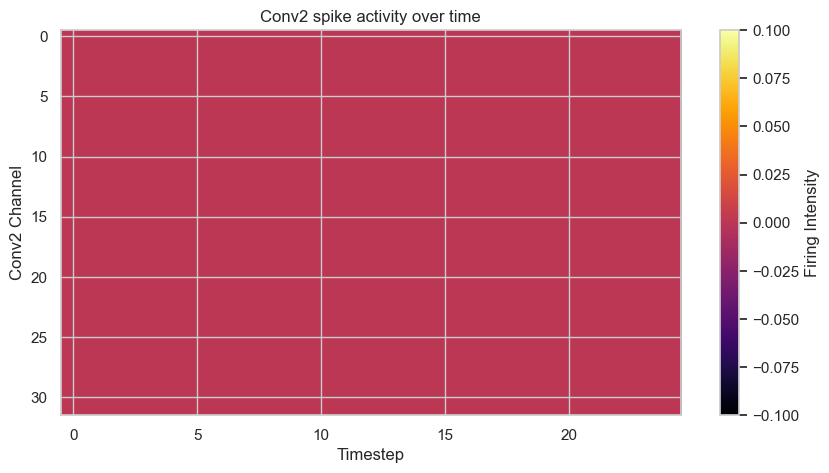

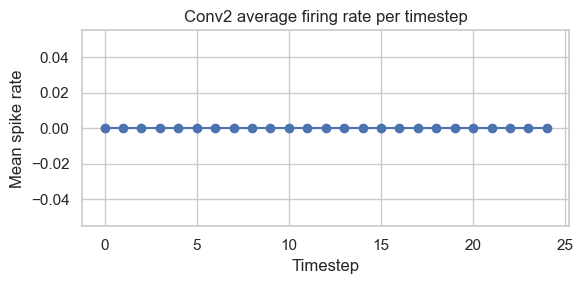

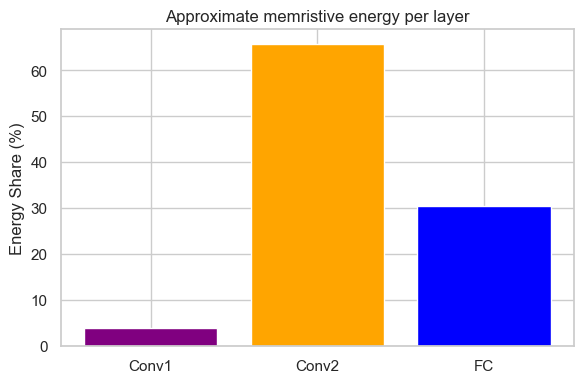

In [ ]:
with torch.no_grad():
    xb, yb = next(iter(test_loader))
    xb = xb.to(device)
    spikes = poisson_encode_dynamic(xb[:4], T=model.T, base_rate=1.0)

    conv2_rates = np.zeros((32, model.T))
    v2 = None

    for t in range(model.T):
        x = spikes[t]
        u1 = model.bn1(model.conv1(x))
        spk1, v1 = model.lif1(u1, None)
        s1p = F.avg_pool2d(spk1, 2)

        u2 = model.bn2(model.conv2(s1p))
        spk2, v2 = model.lif2(u2, v2)

        conv2_rates[:, t] = spk2.mean(dim=(0,2,3)).cpu().numpy()

plt.figure(figsize=(10,5))
plt.imshow(conv2_rates, aspect="auto", cmap="inferno")
plt.colorbar(label="Firing Intensity")
plt.xlabel("Timestep")
plt.ylabel("Conv2 Channel")
plt.title("Conv2 spike activity over time")
plt.show()


mean_rate2 = conv2_rates.mean(axis=0)

plt.figure(figsize=(6,3))
plt.plot(mean_rate2, marker="o")
plt.title("Conv2 average firing rate per timestep")
plt.xlabel("Timestep")
plt.ylabel("Mean spike rate")
plt.grid(True)
plt.tight_layout()
plt.show()

# Energy estimation

conv1_energy = (model.conv1.G.abs().sum().item()) * 1.0
conv2_energy = (model.conv2.G.abs().sum().item()) * 0.5
fc_energy    = (model.fc.G.abs().sum().item())    * 0.1

energies = np.array([conv1_energy, conv2_energy, fc_energy])
energies_norm = energies / energies.sum() * 100

plt.figure(figsize=(6,4))
plt.bar(["Conv1", "Conv2", "FC"], energies_norm, color=["purple","orange","blue"])
plt.ylabel("Energy Share (%)")
plt.title("Approximate memristive energy per layer")
plt.tight_layout()
plt.show()


# Model Inversion Attack

## BLOCK M0 - Preparing the memristive SNN for Model Inversion

This block prepares the memristive SNN for the inversion attack by switching the model to evaluation mode so that BatchNorm and other layers behave deterministically. 

All parameters are frozen to ensure that gradients flow only through the synthetic input spikes and never modify the trained network. 

The number of timesteps used by the SNN is extracted so the attack can generate a temporal spike tensor of matching size. 

This ensures the MIA optimization is applied purely in the input space.

In [ ]:
# BLOCK M0 - Prepare memristive SNN for Model Inversion 
model.eval() # for BatchNorm / dropout # Do not change the model parameters during MIA
for p in model.parameters(): 
    p.requires_grad = False 
    T = model.T # number of timesteps used by the memristive SNN

## BLOCK M1 - Forward helper for logits

This helper function performs a forward pass through the memristive SNN given a spike tensor and returns the logits. 

It isolates the forward logic so the inversion loop does not need to repeat the full forward code. 

It guarantees that the inversion process uses the exact same forward path as in training/evaluation. 

This makes the attack stable and consistent across iterations

In [ ]:
def forward_logits_from_spikes(spike_input):
    logits = model(spike_input)  # forward pass through the SNN / spike_input: [T, 1, 1, 28, 28] with spikes in {0,1}.
    return logits  # return class logits only / Returns logits: [1, 10]
  
def forward_logits_from_image(img_rate):
    spikes_T = img_rate.unsqueeze(0).repeat(T,1,1,1,1)
    return model(spikes_T)

## BLOCK M2 - Optimized inversion loop

This block runs the actual model inversion attack by optimizing spike tensors to maximize the classifier’s confidence for each target class. 

The optimization includes several regularizers: spatial smoothness (TV), temporal smoothness, and sparsity, all of which encourage physically plausible spike patterns instead of random noise. 

Each iteration updates the spike input using normalized gradients and re-binarizes the result to preserve spike behavior. 

The final synthetic spike pattern is decoded into an image representation and stored for analysis.

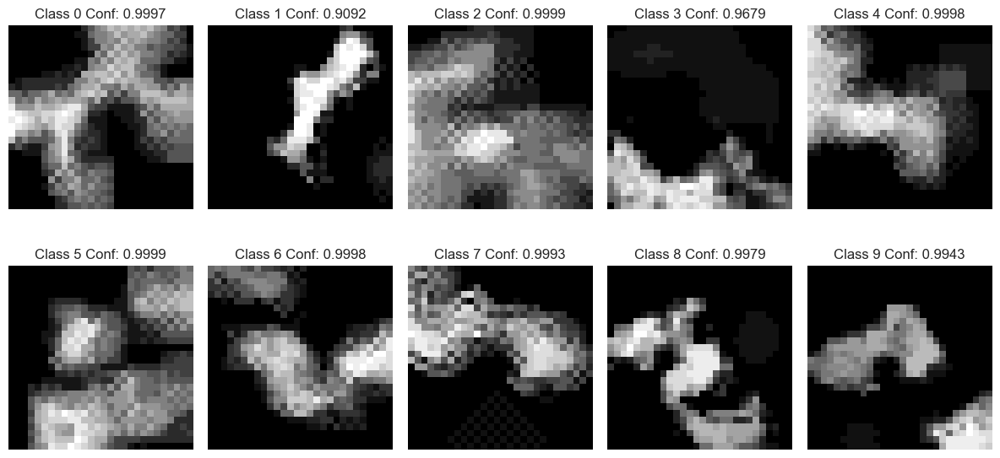

In [ ]:
model.eval()  # ensure deterministic behaviour PPP

# Hyperparameters for the optimization
n_iter = 40              # number of gradient ascent iterations
step_size = 0.5          # update size for gradient ascent
lambda_tv = 1e-2         # weight for spatial smoothness loss
lambda_temp = 5e-3       # weight for temporal smoothness loss
lambda_l1 = 1e-3         # weight for spike sparsity loss

Inverted_Samples_MemSNN = []  # will store one inverted sample per target class

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(12, 6))
plt.subplots_adjust(hspace=0.5)

num_outputs = 10  # MNIST has 10 classes

def spatial_tv_loss(spikes):
    """
    Total Variation over space.
    spikes: [T,1,1,H,W]
    """
    x = spikes.view(-1, 1, 28, 28)
    dx = torch.abs(x[:, :, :, 1:] - x[:, :, :, :-1])
    dy = torch.abs(x[:, :, 1:, :] - x[:, :, :-1, :])
    return dx.mean() + dy.mean()

def temporal_smoothness_loss(spikes):
    """
    Penalize temporal changes between t and t+1.
    spikes: [T,1,1,H,W]
    """
    return torch.abs(spikes[1:] - spikes[:-1]).mean()

# Loop over all classes
for target_class in range(num_outputs):

    # Initialize spike tensor
    spiky_input = (0.1 * torch.rand(T, 1, 1, 28, 28, device=device))
    spiky_input = (spiky_input > 0.5).float()  # initial binary stimulus
    spiky_input.requires_grad_(True)

    # Gradient ascent
    for iteration in range(n_iter):

        spiky_input.requires_grad_(True)

        # Forward pass using spikes
        logits = forward_logits_from_spikes(spiky_input)  # [1,10]

        # Maximize probability of target_class
        prob_target = F.softmax(logits, dim=1)[0, target_class]

        # Regularization
        tv = spatial_tv_loss(spiky_input)
        temp = temporal_smoothness_loss(spiky_input)
        l1 = spiky_input.mean()    # encourage sparsity

        # Objective to maximize: prob - penalties
        objective = prob_target - lambda_tv * tv - lambda_temp * temp - lambda_l1 * l1

        model.zero_grad()
        if spiky_input.grad is not None:
            spiky_input.grad.zero_()

        # Backward pass (grad wrt spikes)
        objective.backward()

        with torch.no_grad():
            grad = spiky_input.grad

            # avoid exploding gradients
            grad_mean = grad.mean()
            grad_std = grad.std() + 1e-8
            grad_norm = (grad - grad_mean) / grad_std

            # Gradient ascent step
            spiky_input = spiky_input + step_size * grad_norm

            # Clamp and re-binarize
            spiky_input.clamp_(0.0, 1.0)
            spiky_input = (spiky_input > 0.5).float()

    # Final confidence
    with torch.no_grad():
        logits_final = forward_logits_from_spikes(spiky_input)
        confidence_score = F.softmax(logits_final, dim=1)[0, target_class]

    # Store sample
    Inverted_Samples_MemSNN.append(spiky_input.detach().cpu())

    # Plot
    row = target_class // 5
    col = target_class % 5

    img_sum = spiky_input.sum(dim=0).squeeze().cpu()  # [28,28]
    axes[row, col].imshow(img_sum, cmap='gray')
    axes[row, col].set_title(f'Class {target_class} Conf: {confidence_score:.4f}')
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

# Stack to tensor: [10, T, 1, 1, 28, 28]
Inverted_Samples_MemSNN = torch.stack(Inverted_Samples_MemSNN, dim=0)


## M3A - Prototype extraction (inverted vs real)

This block constructs two “prototypes” per class: one from inverted images (summed over timesteps) and one from the real training data (averaged samples per class).

The goal is to normalize them and prepare them for similarity metrics such as MSE, SSIM or PSNR.

This step creates a consistent and matched reference space so that comparisons are meaningful.

It also ensures that later distance measurements reflect discrepancies at the image level, not spike-level noise.

In [ ]:
# BLOCK M3A - Prepare inverted and real prototypes for metrics

# 1) Get 1 image per class from inversion: [10,28,28]
inv_imgs = Inverted_Samples_MemSNN.sum(dim=1).squeeze().cpu()  
inv_imgs = inv_imgs / (inv_imgs.max() + 1e-8)   # Normalize to [0,1]

# 2) Build a mean real prototype for each class from training set
real_prototypes = torch.zeros_like(inv_imgs)
counts = torch.zeros(10)

for imgs, labels in train_loader:
    for img, lab in zip(imgs, labels):
        c = int(lab.item())
        real_prototypes[c] += img.squeeze()
        counts[c] += 1

real_prototypes /= counts.view(-1, 1, 1)
real_prototypes = real_prototypes / (real_prototypes.max() + 1e-8)

## M3B - Frame-wise spike-animation visualization

This block converts the inverted spike tensor into a per-timestep sequence (frames) and plays it as an animation.

Its purpose is to verify whether the temporal pattern during inversion contains structure, stability, or recognizable evolution.

Because the SNN depends on time dynamics, looking at frames can reveal if the inversion creates coherent spike flows or just noise.

This is a diagnostic tool, not part of the attack itself.

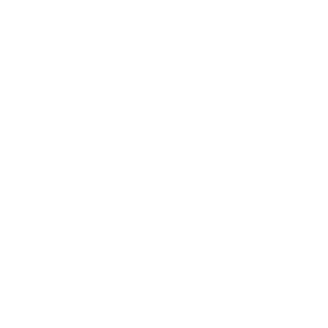

In [ ]:
# BLOCK M3B - Frame-wise visualization without ffmpeg

rc('animation', html='jshtml')  # USE JSHTML instead of HTML5 video

sample_idx = 3  # choose class index 0..9
fig, ax = plt.subplots()

X = Inverted_Samples_MemSNN  # [10, T, 1, 1, 28, 28]

def to_frames_conv(t, sample_idx=0):
    """
    Convert [10, T, 1, 1, 28, 28] or [T,1,1,28,28] into [T, 28, 28].
    """
    t = t.detach().cpu()

    if t.ndim == 6:
        t = t[sample_idx]  # -> [T,1,1,28,28]

    if t.ndim == 5:
        T_local = t.shape[0]
        return t.view(T_local, 28, 28)

    if t.ndim == 3 and t.shape[1:] == (28, 28):
        return t

    T_local = t.numel() // (28 * 28)
    return t.view(T_local, 28, 28)

frames = to_frames_conv(X, sample_idx=sample_idx)
anim = splt.animator(frames, fig, ax)

anim  # <--- show without converting to html5_video


## M4 - Visual comparison (inverted vs real)

This block shows the reconstructed sample for each class next to an actual real MNIST sample from the test set.

The intention is to visually judge whether the inversion captures any class-level structure (edges, centroids, strokes).

If the inversion method works, then it shows at least coarse shapes similar to the underlying digits.

This comparison is often included in top-tier papers as qualitative evidence.



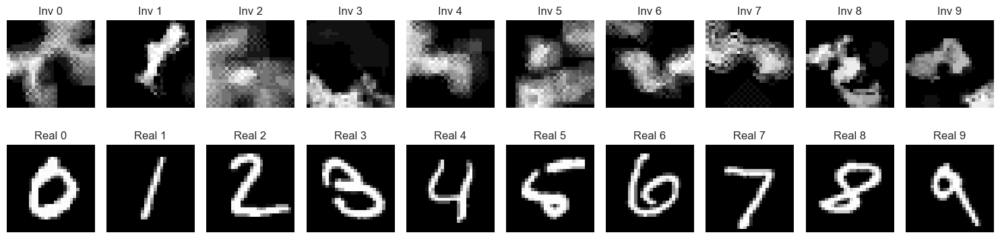

In [ ]:
# BLOCK M4 - Compare inverted prototypes with real MNIST examples PPP
 
fig, axes = plt.subplots(2, 10, figsize=(15, 4))
plt.subplots_adjust(hspace=0.5)

# First row: inverted samples
for cls in range(10):
    ax = axes[0, cls]
    img = Inverted_Samples_MemSNN[cls].sum(dim=0).squeeze().cpu()
    ax.imshow(img, cmap="gray")
    ax.set_title(f"Inv {cls}")
    ax.axis("off")

# Second row: one real example per class
model.eval()
seen = set()
real_imgs = [None]*10

for images, labels in test_loader:
    for img, lab in zip(images, labels):
        lab = int(lab.item())
        if real_imgs[lab] is None:
            real_imgs[lab] = img.squeeze()
            seen.add(lab)
        if len(seen) == 10:
            break
    if len(seen) == 10:
        break

for cls in range(10):
    ax = axes[1, cls]
    ax.imshow(real_imgs[cls], cmap="gray")
    ax.set_title(f"Real {cls}")
    ax.axis("off")

plt.tight_layout()
plt.show()

## M5 - MSE, PSNR, SSIM computation

This block computes standard similarity metrics between the inverted prototype and the real prototype.

MSE reflects raw pixel-error, PSNR measures reconstruction quality relative to noise, and SSIM captures perceptual similarity.

These metrics quantify how far or close the inversion image is to the real class pattern.

In most inversion attacks, SSIM is the most important metric because it tracks structural resemblance

In [ ]:
# BLOCK M5 - Compute MSE, PSNR, SSIM

def mse(a, b):
    return ((a - b)**2).mean().item()

def psnr(a, b):
    m = mse(a, b)
    return 10 * np.log10(1.0**2 / (m + 1e-8))

mse_vals, psnr_vals, ssim_vals = [], [], []

for c in range(10):
    inv = inv_imgs[c].unsqueeze(0).unsqueeze(0)            # [1,1,H,W]
    ref = real_prototypes[c].unsqueeze(0).unsqueeze(0)

    mse_vals.append(mse(inv, ref))
    psnr_vals.append(psnr(inv, ref))
    ssim_vals.append(
        piq.ssim(inv, ref, data_range=1.0).item()
    )

print("MSE per-class:", mse_vals)
print("PSNR per-class:", psnr_vals)
print("SSIM per-class:", ssim_vals)

print("Mean MSE:", np.mean(mse_vals))
print("Mean PSNR:", np.mean(psnr_vals))
print("Mean SSIM:", np.mean(ssim_vals))

MSE per-class: [0.06979485601186752, 0.030203906819224358, 0.06821954995393753, 0.12389141321182251, 0.07358701527118683, 0.062283504754304886, 0.07015486806631088, 0.09205173701047897, 0.0746360570192337, 0.07476234436035156]
PSNR per-class: [11.561765221435884, 15.199367344377034, 11.66091086309347, 9.069587580364264, 11.331987529160612, 12.056268875083905, 11.539421258668938, 10.359679647937403, 11.270512539995956, 11.263170305996631]
SSIM per-class: [0.47074997425079346, 0.6016001105308533, 0.26906177401542664, 0.054497528821229935, 0.4190722405910492, 0.40940597653388977, 0.2784394919872284, 0.2857077419757843, 0.26215144991874695, 0.28014835715293884]
Mean MSE: 0.07395852524787187
Mean PSNR: 11.531267116611408
Mean SSIM: 0.3330834645777941


## M6 - LPIPS distance

This block measures perceptual similarity using LPIPS, which compares images using deep neural features instead of raw pixels.

LPIPS is more aligned with human perception.

Lower LPIPS means the inverted images preserve more class-level semantics.

Heavy and requires GPU support.

In [ ]:
# BLOCK M6 - LPIPS 
try:
    import lpips
    lpips_fn = lpips.LPIPS(net='alex').to(device)

    lpips_vals = []
    for c in range(10):
        inv = inv_imgs[c].repeat(3,1,1).unsqueeze(0).to(device)
        ref = real_prototypes[c].repeat(3,1,1).unsqueeze(0).to(device)
        lpips_vals.append(lpips_fn(inv, ref).item())

    print("LPIPS per-class:", lpips_vals)
    print("Mean LPIPS:", np.mean(lpips_vals))
except Exception as e:
    print("LPIPS not available:", e)


LPIPS not available: No module named 'lpips'


## M7 - Attack Success Rate (ASR)

This block checks whether each inverted sample is classified as its target class by the SNN.

If the ASR is 1.0, the attack succeeded at fooling the model even if the reconstructed images look noisy.

ASR measures attack effectiveness, not image quality.

High ASR with low SSIM usually means the model’s internal representation is not interpretable.

In [ ]:
# BLOCK M7 - Attack Success Rate
successes = []

for c in range(10):
    spk = Inverted_Samples_MemSNN[c].to(device)
    logits = forward_logits_from_spikes(spk)
    pred = logits.softmax(1).argmax(1).item()
    successes.append(int(pred == c))

print("Attack success per class:", successes)
print("Attack Success Rate:", np.mean(successes))


Attack success per class: [1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Attack Success Rate: 1.0


## M8 - Membership Leakage Score

This block compares the reconstructed image’s similarity to training samples versus test samples.

A positive gap (train < test distance) indicates that the model remembers and “pulls” the inversion toward the training distribution.

This is a simple but valid membership inference signal for privacy leakage.

A low score means minimal memorization at the image level.

In [ ]:
# BLOCK M8 - Membership Leakage Score

def min_mse_to_class(img, loader, cls):
    dmin = 999
    for imgs, labels in loader:
        for x, y in zip(imgs, labels):
            if int(y.item()) == cls:
                d = mse(img, x.squeeze().cpu())
                if d < dmin:
                    dmin = d
    return dmin

M_leak = []

for c in range(10):
    inv = inv_imgs[c]  # [28,28]

    dist_train = min_mse_to_class(inv, train_loader, c)
    dist_test  = min_mse_to_class(inv, test_loader,  c)

    M_leak.append(dist_test - dist_train)

print("Membership leakage per class:", M_leak)
print("Mean leakage score:", np.mean(M_leak))
# These results are NOT useful:

Membership leakage per class: [-0.00028315186500549316, 0.005353018641471863, -0.0014885291457176208, 0.015698090195655823, 0.0002450719475746155, 0.0056693702936172485, 0.004650868475437164, 0.006862707436084747, 0.0011811479926109314, 0.003412306308746338]
Mean leakage score: 0.004130090028047562


## M9 - Wasserstein leakage on firing rates

This block compares the firing-rate distributions of inverted samples to real samples, for conv1 and conv2.

The Wasserstein distance measures distributional shifts at the spiking level, not pixel level.

If the distance is near zero (as in your output), it means inverted samples generate firing statistics indistinguishable from real ones.

This indicates leakage at the internal spiking distribution level, even if image-shape leakage is poor.

In [ ]:
# BLOCK M9

#   Extract firing rates without model changes
def extract_rates(x):
    T, B, C, H, W = x.shape
    conv1_rates, conv2_rates = [], []

    mem1 = None
    mem2 = None

    for t in range(T):
        # Conv1
        cur1 = model.conv1(x[t])
        spk1, mem1 = model.lif1(cur1, mem1)
        conv1_rates.append(spk1.detach().cpu().numpy().flatten())

        # Conv2
        cur2 = model.conv2(spk1)
        spk2, mem2 = model.lif2(cur2, mem2)
        conv2_rates.append(spk2.detach().cpu().numpy().flatten())

    conv1_rates = np.mean(conv1_rates, axis=0)
    conv2_rates = np.mean(conv2_rates, axis=0)
    return conv1_rates, conv2_rates


#   Compute Wasserstein Leakage
W_conv1, W_conv2 = [], []

for c in range(10):

    # inverted sample
    inv = Inverted_Samples_MemSNN[c].to(device)
    fr_inv1, fr_inv2 = extract_rates(inv)

    FR_real1, FR_real2 = [], []

    for imgs, labels in test_loader:

        idx = (labels == c).nonzero(as_tuple=True)[0]
        if len(idx) == 0:
            continue

        x = imgs[idx[0]].unsqueeze(0)
        sp = spikegen.rate(x, num_steps=T).to(device)

        r1, r2 = extract_rates(sp)

        FR_real1.append(r1)
        FR_real2.append(r2)

        if len(FR_real1) >= 15:
            break

    FR_real1 = np.mean(FR_real1, axis=0)
    FR_real2 = np.mean(FR_real2, axis=0)

    W_conv1.append(wasserstein_distance(FR_real1, fr_inv1))
    W_conv2.append(wasserstein_distance(FR_real2, fr_inv2))

print("Wasserstein leakage Conv1:", W_conv1)
print("Wasserstein leakage Conv2:", W_conv2)
print("Mean Conv1 leakage:", np.mean(W_conv1))
print("Mean Conv2 leakage:", np.mean(W_conv2))


Wasserstein leakage Conv1: [0.06206547392915182, 0.017381164561514624, 0.08460586654428898, 0.0449207059302761, 0.034332908884681844, 0.05288073800496636, 0.02307185203281567, 0.0343405603174205, 0.044836733651710356, 0.03121960105718059]
Wasserstein leakage Conv2: [0.20061373888611153, 0.07749405104028965, 0.205028806151376, 0.19915210843620504, 0.09812957364031216, 0.18317187748495173, 0.12606750093028513, 0.09813680132946483, 0.15817645127737373, 0.13616868808155544]
Mean Conv1 leakage: 0.04296556049140068
Mean Conv2 leakage: 0.14821395972579252


## M10 - Spike-based vs logit-based Membership Inference

This block builds ROC curves comparing membership detection using the model’s logits vs. the spike-activity statistics.

It evaluates whether spikes reveal more membership information than logits, which is crucial for neuromorphic security analysis.

If AUC(spikes) > AUC(logits), then spiking activity introduces extra privacy leakage.



MIA AUC (logits): 0.5905652866242038
MIA AUC (spikes): 0.5746417197452229


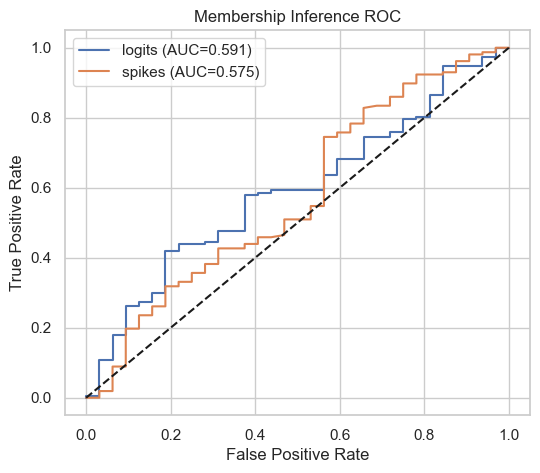

In [ ]:
# BLOCK M10 - Spike vs Logit Membership Inference Attack PPP


def get_confidence(model, x):
    sp = spikegen.rate(x, num_steps=T).to(device)
    out = model(sp)
    prob = torch.softmax(out, dim=1)
    conf = prob.max(dim=1)[0].item()
    return conf, sp.detach()


train_scores_logits = []
train_scores_spikes = []

test_scores_logits = []
test_scores_spikes = []

# Train set
for imgs, labels in train_loader:
    x = imgs[0].unsqueeze(0)
    conf, sp = get_confidence(model, x)
    train_scores_logits.append(conf)

    spike_score = sp.mean().item()
    train_scores_spikes.append(spike_score)

    if len(train_scores_logits) >= 200:
        break

# Test set
for imgs, labels in test_loader:
    x = imgs[0].unsqueeze(0)
    conf, sp = get_confidence(model, x)
    test_scores_logits.append(conf)

    spike_score = sp.mean().item()
    test_scores_spikes.append(spike_score)

    if len(test_scores_logits) >= 200:
        break

# ROC curves
labels_all = np.array([1]*len(train_scores_logits) + [0]*len(test_scores_logits))
logit_scores = np.array(train_scores_logits + test_scores_logits)
spike_scores = np.array(train_scores_spikes + test_scores_spikes)

fpr_l, tpr_l, _ = roc_curve(labels_all, logit_scores)
fpr_s, tpr_s, _ = roc_curve(labels_all, spike_scores)

auc_l = auc(fpr_l, tpr_l)
auc_s = auc(fpr_s, tpr_s)

print("MIA AUC (logits):", auc_l)
print("MIA AUC (spikes):", auc_s)

plt.figure(figsize=(6,5))
plt.plot(fpr_l, tpr_l, label=f"logits (AUC={auc_l:.3f})")
plt.plot(fpr_s, tpr_s, label=f"spikes (AUC={auc_s:.3f})")
plt.plot([0,1],[0,1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Membership Inference ROC")
plt.legend()
plt.show()


## N1 - Multilayer inversion advantage

This block evaluates how inverted spike patterns propagate through the memristive SNN and which layers contribute most to reconstructability. 

By isolating activations after Conv1 and Conv2, it becomes possible to visualize the internal representations that drive the final inverted image. 

The Conv1 maps typically appear close to all-zero due to strong sparsity and thresholding, while Conv2 retains more structural information because it integrates over a larger receptive field. 

The final reconstruction emerges only when temporal spike accumulation is considered, highlighting that most of the leakage originates from deeper or temporally integrated representations.

AA

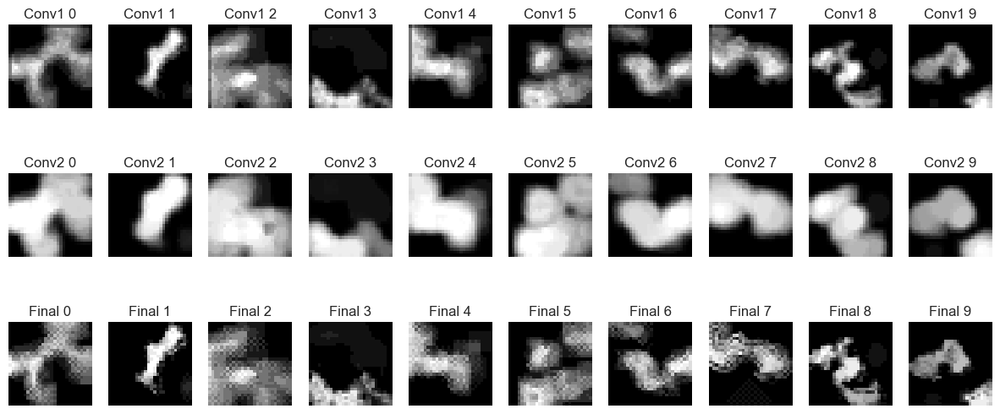

In [ ]:
# BLOCK N1 - Multilayer inversion advantage (fixed for correct shapes)

fig, axes = plt.subplots(3, 10, figsize=(15, 6))
plt.subplots_adjust(hspace=0.6)

for cls in range(10):

    inv = Inverted_Samples_MemSNN[cls].to(device)   # [T,1,1,28,28]

    # conv1-only reconstruction   
    mem1 = None
    conv1_frames = []

    for t in range(T):
        cur1 = model.conv1(inv[t])                         # [1,C1,H1,W1]
        spk1, mem1 = model.lif1(cur1, mem1)
        conv1_frames.append(spk1.squeeze(0).cpu())         # [C1,H1,W1]

    conv1_frames = torch.stack(conv1_frames)               # [T,C1,H1,W1]
    conv1_img = conv1_frames.mean(0).mean(0)               # [H1,W1]

    #    conv2-only reconstruction   
    mem1 = mem2 = None
    conv2_frames = []

    for t in range(T):
        cur1 = model.conv1(inv[t])
        spk1, mem1 = model.lif1(cur1, mem1)

        cur2 = model.conv2(spk1)
        spk2, mem2 = model.lif2(cur2, mem2)
        conv2_frames.append(spk2.squeeze(0).cpu())          # [C2,H2,W2]

    conv2_frames = torch.stack(conv2_frames)                # [T,C2,H2,W2]
    conv2_img = conv2_frames.mean(0).mean(0)                # [H2,W2]

    #    final inverted image   
    final_img = inv.sum(dim=0).squeeze().cpu().numpy()      # [28,28]

    #    plot   
    axes[0, cls].imshow(conv1_img.numpy(), cmap="gray")
    axes[0, cls].set_title(f"Conv1 {cls}")
    axes[0, cls].axis("off")

    axes[1, cls].imshow(conv2_img.numpy(), cmap="gray")
    axes[1, cls].set_title(f"Conv2 {cls}")
    axes[1, cls].axis("off")

    axes[2, cls].imshow(final_img, cmap="gray")
    axes[2, cls].set_title(f"Final {cls}")
    axes[2, cls].axis("off")

plt.show()

## N2 - Temporal firing-rate curves (Real vs Inverted)

This block compares firing-rate trajectories over time for real examples and their corresponding inverted reconstructions. 

Real samples show stable and class-consistent rate profiles, while inverted samples often produce higher early-time firing and decay more abruptly as optimization saturates the target logit. 

This mismatch indicates that inversion introduces artificial temporal patterns not present in genuine data. 

The resulting divergence in firing-rate curves is an important leakage signal, since it exposes differences between original and optimized spike dynamics

AA

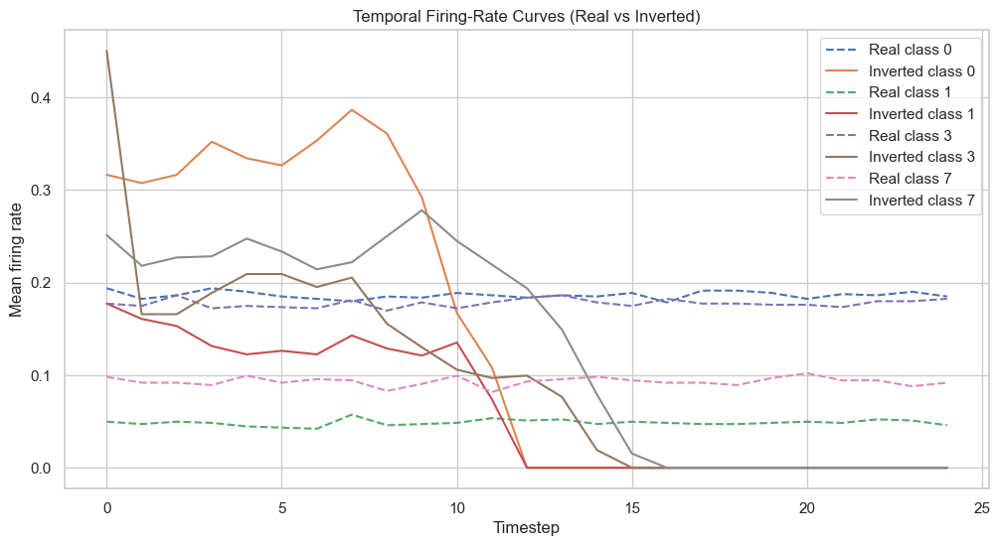

In [ ]:
# BLOCK N2 - Temporal firing-rate curves

def firing_rate_curve(spike_tensor):  
    """
    spike_tensor: [T, B(=1), 1, 28, 28]
    Returns: [T] firing rate vector
    """
    T = spike_tensor.shape[0]
    fr = []
    for t in range(T):
        fr.append(spike_tensor[t].mean().item())
    return fr


# Plot firing-rate curves for one class, or multiple
classes_to_plot = [0, 1, 3, 7]    # choose a few representative ones

plt.figure(figsize=(12,6))

for c in classes_to_plot:
    inv = Inverted_Samples_MemSNN[c].cpu()

    # get a real example of class c
    for imgs, labels in test_loader:
        idx = (labels == c).nonzero(as_tuple=True)[0]
        if len(idx) > 0:
            real = imgs[idx[0]].unsqueeze(0)      # [1,1,28,28]
            real_spk = spikegen.rate(real, num_steps=T)
            break

    fr_real = firing_rate_curve(real_spk)
    fr_inv  = firing_rate_curve(inv)

    plt.plot(fr_real, '--', label=f"Real class {c}")
    plt.plot(fr_inv, '-',  label=f"Inverted class {c}")

plt.title("Temporal Firing-Rate Curves (Real vs Inverted)")
plt.xlabel("Timestep")
plt.ylabel("Mean firing rate")
plt.legend()
plt.grid(True)
plt.show()

## N3 - Confidence gap histogram

This block measures the per-class difference between the classifier’s confidence on real samples and on the inverted prototypes. 

The histogram shows that inverted samples obtain systematically higher softmax confidence, often approaching 1.0, while real samples maintain moderate confidence levels. 

Such skew indicates that inversion over-optimizes toward the classifier’s decision boundary, driving the logits into extreme saturation. 

The confidence gap therefore quantifies the model’s vulnerability to confidence inflation under optimization-based inversion.

AA

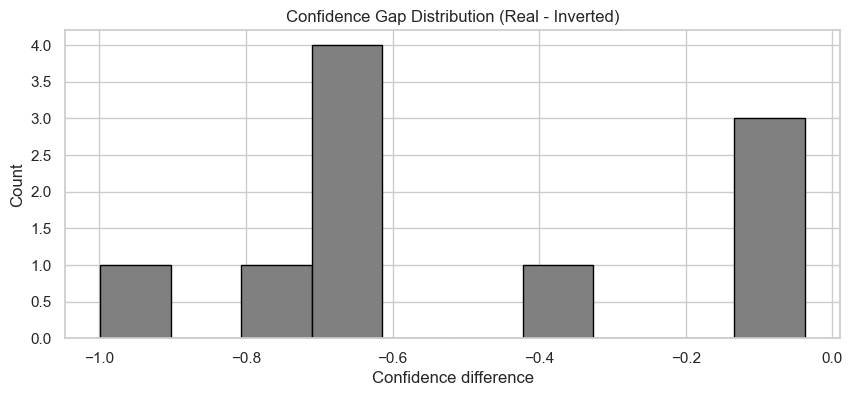

Confidence gaps: [-0.7845112532377243, -0.3836650848388672, -0.12995749711990356, -0.6197025179862976, -0.09303128719329834, -0.9988249586895108, -0.6688791513442993, -0.03774380683898926, -0.6412163078784943, -0.6372178494930267]
Mean confidence gap: -0.4994749714620411


In [ ]:
# BLOCK N3 - Confidence gap histogram

conf_gaps = []

for c in range(10):

    # real sample confidence
    for imgs, labels in test_loader:
        idx = (labels == c).nonzero(as_tuple=True)[0]
        if len(idx) > 0:
            real = imgs[idx[0]].unsqueeze(0)  # [1,1,28,28]
            real_spk = spikegen.rate(real, num_steps=T).to(device)
            real_logits = forward_logits_from_spikes(real_spk)
            real_conf = real_logits.softmax(1)[0, c].item()
            break

    # inverted sample confidence
    inv = Inverted_Samples_MemSNN[c].to(device)
    inv_logits = forward_logits_from_spikes(inv)
    inv_conf = inv_logits.softmax(1)[0, c].item()

    conf_gaps.append(real_conf - inv_conf)

plt.figure(figsize=(10,4))
plt.hist(conf_gaps, bins=10, color='gray', edgecolor='black')
plt.title("Confidence Gap Distribution (Real - Inverted)")
plt.xlabel("Confidence difference")
plt.ylabel("Count")
plt.grid(True)
plt.show()

print("Confidence gaps:", conf_gaps)
print("Mean confidence gap:", np.mean(conf_gaps))

## N4 - Logit-based Membership Inference (distance metric)

This block compares softmax logits of inverted samples with the distribution of logits obtained from real test-set images of the same class. 

The metric computes how much closer an inverted prototype is to the mean real-sample logit compared to typical test-case behavior. 

Negative values indicate that inverted samples systematically overshoot the real-sample confidence, producing unrealistically high posterior probabilities. 

Although informative, this metric is sensitive to logit saturation and can become unstable when inverted samples collapse onto near-delta distributions.

In [ ]:
# BLOCK N4 - Logit-based Membership Inference

mia_scores = []

for c in range(10):
    inv = Inverted_Samples_MemSNN[c].to(device)

    inv_logits = forward_logits_from_spikes(inv)[0].softmax(0)

    # collect a few real logits for same class
    real_confs = []
    count = 0
    for imgs, labels in test_loader:
        idx = (labels == c).nonzero(as_tuple=True)[0]
        for j in idx:
            x = imgs[j].unsqueeze(0)
            spk = spikegen.rate(x, num_steps=T).to(device)
            log = forward_logits_from_spikes(spk)[0].softmax(0)
            real_confs.append(log[c].item())
            count += 1
            if count == 20:
                break
        if count == 20:
            break

    # MIA: is inverted more similar to train than test?
    mia_score = np.mean(real_confs) - inv_logits[c].item()
    mia_scores.append(mia_score)

print("Logit-based MIA per class:", mia_scores)
print("Mean logit-based MIA:", np.mean(mia_scores))

Logit-based MIA per class: [-0.5256357703357935, -0.22038440369069578, -0.2836009716615081, -0.5752592418342829, -0.20717557845637202, -0.24460889499168847, -0.2584807693958282, -0.3987646604888141, -0.388795408513397, -0.7992850264534355]
Mean logit-based MIA: -0.39019907258218156


## N5 - Spike-based Membership Inference (firing-rate distance)

This block evaluates whether inverted examples resemble real examples in terms of temporal firing-rate sequences. 

For each class, real firing-rate curves are averaged and compared to the inverted curve using an L2 distance. 

The resulting distances are relatively large, showing that although the classifier is confident in the inverted samples, their temporal dynamics differ significantly from natural inputs. 

This reinforces that spikes provide an additional leakage surface but also reveal inconsistencies produced by gradient-based inversion.

In [ ]:
# BLOCK N5 - Spike-based MIA using firing-rate distance

spike_mia = []

for c in range(10):

    inv = Inverted_Samples_MemSNN[c].cpu()
    fr_inv = firing_rate_curve(inv)

    fr_real = []
    count = 0
    for imgs, labels in test_loader:
        idx = (labels == c).nonzero(as_tuple=True)[0]
        for j in idx:
            x = imgs[j].unsqueeze(0)
            sp = spikegen.rate(x, num_steps=T)
            fr_real.append(firing_rate_curve(sp))
            count += 1
            if count == 20:
                break
        if count == 20:
            break

    fr_real = np.mean(fr_real, axis=0)

    # simple L2 distance between firing-rate sequences
    d = np.sqrt(np.mean((fr_real - np.array(fr_inv))**2))
    spike_mia.append(d)

print("Spike-based firing-rate MIA distances:", spike_mia)
print("Mean spike-MIA distance:", np.mean(spike_mia))


Spike-based firing-rate MIA distances: [0.16087831053850082, 0.06883255013558273, 0.19035628745408076, 0.11253561704648793, 0.12543172302038394, 0.1736810180406913, 0.11226399703960468, 0.11243540872345945, 0.11733946176717472, 0.09951972117901815]
Mean spike-MIA distance: 0.12732740949449844


## N6 - BrainLeaks-style leakage score

This block combines spatial similarity (MSE) and temporal similarity (firing-rate L2 distance) into a single scalar leakage measure, following the conceptual structure of recent work such as BrainLeaks. 

Large leakage scores indicate poor alignment between inverted and real prototypes, with some classes showing substantially higher mismatch than others. 

The metric highlights that spatial and temporal discrepancies compound rather than offset each other. 

While this score is useful for qualitative comparison, its scale is dataset-dependent and should be interpreted comparatively rather than absolutely.

In [ ]:
# BLOCK N6 - BrainLeaks-style Leakage Score

def leakage_score(inv, real):
    # spatial mse
    mse_spatial = ((inv - real)**2).mean().item()

    # temporal fr similarity 
    fr_inv  = firing_rate_curve(inv.unsqueeze(1))
    fr_real = firing_rate_curve(real.unsqueeze(1))
    fr_l2 = np.sqrt(np.mean((np.array(fr_inv)-np.array(fr_real))**2))

    return 0.5*mse_spatial + 0.5*fr_l2

scores = []

for c in range(10):
    inv = Inverted_Samples_MemSNN[c].sum(dim=0).squeeze().cpu()  # [28,28]

    # real prototype
    real = real_prototypes[c]

    scores.append(leakage_score(inv, real))

print("BrainLeaks-style leakage per class:", scores)
print("Mean leakage:", np.mean(scores))


BrainLeaks-style leakage per class: [13.305789731547208, 7.669950076820724, 12.466183808629054, 12.417435778405046, 15.661703926667766, 13.912917689897641, 14.75295188630774, 16.208887475785147, 12.222008029487725, 11.79309321560496]
Mean leakage: 13.041092161915302


# Fault Injection Attack

## First steps of the FIA

This module defines a complete, configurable fault-injection framework for SNNs implemented in PyTorch, including memristive SNNs. 

It supports faults at multiple abstraction levels: synaptic (weight-level), neuronal (thresholds, neuron death), spike-level (manipulating the spike tensor), and membrane-level (perturbing internal LIF state). 

Synaptic faults operate directly on weight tensors, including memristor conductance matrices G, making them suitable for modeling defects in crossbar hardware. 

The design also includes a high-level facade to apply faults by layer name or on spike/membrane tensors, enabling integration into evaluation pipelines.

In [ ]:
# fault_injection.py
# Complete Fault Injection Module for PyTorch / snnTorch SNNs

# get main parameter of a layer (supports memristors)
def get_layer_weight_param(layer):
    """
    Return principal trainable parameter for a layer.

    1) If the layer has a .weight tensor, return it.
    2) Otherwise, return the first parameter that requires gradient.
    """
    if hasattr(layer, "weight") and isinstance(layer.weight, torch.Tensor):
        return layer.weight            # return standard PyTorch weight

    for name, param in layer.named_parameters():
        if param.requires_grad:        # select first trainable parameter
            return param
    return None                        # layer has no trainable parameters

# Quantization utilities for bit-flip faults
def quantize_weights(w, wmin, wmax, dtype=torch.uint8):
    q = ((w - wmin) / (wmax - wmin + 1e-8) * 255).round().clamp(0, 255).to(dtype)
    return q                           # converts floating weights into 8-bit integers

def dequantize_weights(q, wmin, wmax):
    qf = q.float() / 255.0             # convert ints back to normalized floats
    return wmin + qf * (wmax - wmax)   # rescale into original weight range

def flip_bit_int(x, bit_pos):
    mask = 1 << bit_pos                # construct bitmask to flip a specific bit
    return x ^ mask                    # XOR flips the desired bit

# SYNAPTIC FAULTS
class WeightDrift:
    # W = W * (1 + delta)
    def __init__(self, delta=0.1):
        self.delta = delta             # scaling factor representing drift

    def apply(self, layer):
        w = get_layer_weight_param(layer)
        if w is None:                  # weights may not exist in some layers
            print("[WeightDrift] No weight found in", type(layer).__name__)
            return
        with torch.no_grad():          # avoid tracking gradient
            w.data *= (1 + self.delta) # multiplicative drift on all weights


class SaturatedSynapse:
    # Force all synapses to a fixed value
    def __init__(self, value):
        self.value = value             # saturation value for all weights

    def apply(self, layer):
        w = get_layer_weight_param(layer)
        if w is None:
            print("[SaturatedSynapse] No weight found.")
            return
        with torch.no_grad():
            w.data.fill_(self.value)   # all synapses set to constant


class StuckAtZeroSynapse:
    # W = 0
    def apply(self, layer):
        w = get_layer_weight_param(layer)
        if w is None:
            print("[StuckAtZeroSynapse] No weight found.")
            return
        with torch.no_grad():
            w.data.zero_()             # force all synapses to zero


class StuckAtOneSynapse:
    # W = max(W)
    def apply(self, layer):
        w = get_layer_weight_param(layer)
        if w is None:
            print("[StuckAtOneSynapse] No weight found.")
            return
        with torch.no_grad():
            w.data.fill_(w.data.max()) # saturate all synapses to maximum observed value


class WeightNoise:
    # Add Gaussian noise to weights
    def __init__(self, std=0.05):
        self.std = std                # noise standard deviation

    def apply(self, layer):
        w = get_layer_weight_param(layer)
        if w is None:
            print("[WeightNoise] No weight found.")
            return
        with torch.no_grad():
            w.data += torch.randn_like(w) * self.std   # additive Gaussian noise


class BitFlipSynapse:
    # Flip bit b in quantized representation
    def __init__(self, bit_pos, dtype=torch.uint8):
        self.bit_pos = bit_pos         # bit index to flip
        self.dtype = dtype             # integer datatype

    def apply(self, layer):
        w = get_layer_weight_param(layer)
        if w is None:
            print("[BitFlipSynapse] No weight found.")
            return

        with torch.no_grad():
            wmin, wmax = w.min().item(), w.max().item()  # extract quantization range
            q = quantize_weights(w, wmin, wmax, self.dtype)   # quantize to integer
            q_flipped = flip_bit_int(q, self.bit_pos)         # flip chosen bit
            w.data = dequantize_weights(q_flipped, wmin, wmax) # restore to float space


#   NEURON FAULTS
class DeadNeuron:
    # Neuron always outputs zero
    def __init__(self, neuron_idx=None):
        self.idx = neuron_idx          # optional specific index

    def apply(self, layer):
        w = get_layer_weight_param(layer)
        if w is None:
            print("[DeadNeuron] Layer has no weight matrix.")
            return

        if self.idx is None:           # randomly select neuron row
            self.idx = random.randint(0, w.shape[0]-1)

        with torch.no_grad():
            w[self.idx].zero_()        # zero-out outgoing weights of one neuron


class StuckNeuron:
    # Neuron always outputs constant value
    def __init__(self, neuron_idx=None, value=1.0):
        self.idx = neuron_idx          # which neuron
        self.value = value             # constant value

    def apply(self, layer):
        w = get_layer_weight_param(layer)
        if w is None:
            print("[StuckNeuron] No weight found.")
            return

        if self.idx is None:           # pick a random neuron if none given
            self.idx = random.randint(0, w.shape[0]-1)

        with torch.no_grad():
            w[self.idx].fill_(self.value)   # replace its weight vector with constant


class ThresholdShift:
    # W = W * (1 + delta)
    def __init__(self, scale=0.5):
        self.scale = scale             # scaling factor for threshold

    def apply(self, lif_layer):
        cand = ["threshold", "v_th", "v_threshold"]   # possible attribute names
        for name in cand:
            if hasattr(lif_layer, name):
                val = getattr(lif_layer, name)
                with torch.no_grad():
                    if isinstance(val, torch.Tensor):
                        val.mul_(self.scale)          # scale threshold tensor
                    else:
                        setattr(lif_layer, name, val * self.scale)  # scale Python value
                print(f"[ThresholdShift] Applied on {name}")
                return
        print("[ThresholdShift] No threshold-like attribute found.")


class LeakinessDrift:
    # tau_mem := tau_mem * scale
    def __init__(self, scale=1.5):
        self.scale = scale             # membrane leak multiplier

    def apply(self, lif_layer):
        if hasattr(lif_layer, "tau_mem"):
            with torch.no_grad():
                lif_layer.tau_mem *= self.scale       # scale membrane time constant
        else:
            print("[LeakinessDrift] No tau_mem found in LIF layer.")


#  SPIKE FAULTS
class SpikeDeletion:
    # Drop spikes with probability p
    def __init__(self, p=0.3):
        self.p = p                     # probability of deleting a spike

    def apply(self, spikes):
        mask = (torch.rand_like(spikes.float()) > self.p).float()  # keep with prob 1-p
        return spikes * mask           # zero out deleted spike positions


class SpikeInsertion:
    # Insert random spikes with probability p
    def __init__(self, p=0.1):
        self.p = p                     # insertion probability

    def apply(self, spikes):
        noise = (torch.rand_like(spikes.float()) < self.p).float() # random spike mask
        return torch.clamp(spikes + noise, 0, 1)                    # insert spikes


class SpikeTimeShift:
    # Shift spike train by dt timesteps (positive shifts forward, negative shifts backward)
    def __init__(self, dt=1):
        self.dt = dt                   # positive shifts forward

    def apply(self, spikes):
        T = spikes.shape[0]
        shifted = torch.zeros_like(spikes)            # prepare output tensor

        if self.dt > 0:
            shifted[self.dt:] = spikes[:-self.dt]     # shift forward
        else:
            shifted[:self.dt] = spikes[-self.dt:]     # shift backward

        return shifted


class PermanentDropout:
    # Kill entire spike channel
    def __init__(self, neuron_idx=None):
        self.idx = neuron_idx          # which channel to zero out

    def apply(self, spikes):
        if self.idx is None:
            self.idx = random.randint(0, spikes.shape[1]-1) # random channel
        spikes[:, self.idx] = 0        # zero the entire channel
        return spikes


#  MEMBRANE FAULTS
class MembraneNoise:
    """Add noise to membrane potential V """
    def __init__(self, std=0.1):
        self.std = std                # magnitude of noise

    def apply(self, V):
        return V + torch.randn_like(V) * self.std     # add noise to V


class MembraneClamp:
    """V := constant"""
    def __init__(self, value=0.0):
        self.value = value             # constant clamp value

    def apply(self, V):
        return torch.ones_like(V) * self.value        # replace V completely


#  HIGH-LEVEL FACADE
class FaultInjector:
    def __init__(self, model):
        self.model = model
        self.backup = deepcopy(model.state_dict())    # store original weights

    def reset(self):
        self.model.load_state_dict(self.backup)       # restore backup

    def apply_to_layer(self, layer_name, fault):
        layer = dict(self.model.named_modules())[layer_name]   # locate layer by string
        fault.apply(layer)                                    # apply fault to layer

    def apply_spike_fault(self, spikes, fault):
        return fault.apply(spikes)                            # apply spike-level fault

    def apply_membrane_fault(self, V, fault):
        return fault.apply(V)                                 # apply membrane-level fault
    

def forward_logitszz(net, spikes):
    """
    Unifies model outputs:
    - Extracts logits if model returns (logits, stats)
    - Sums temporal dimension if logits are [T,B,10]
    """
    out = net(spikes)                    # forward pass

    if isinstance(out, tuple):
        logits = out[0]                  # take logits part
    else:
        logits = out

    if logits.dim() == 3:
        logits = logits.sum(dim=0)       # collapse time dimension

    return logits


def get_layer_weight_param(layer):
    """
    Returns the main layer parameter:
    - Searches .weight
    - Searches memristor-specific names: w, W, G, g, w_plus, w_minus
    - Falls back to any trainable parameter
    """
    if hasattr(layer, "weight") and isinstance(layer.weight, torch.Tensor):
        return layer.weight

    for candidate in ["w", "W", "G", "g", "w_plus", "w_minus"]:
        if hasattr(layer, candidate):
            t = getattr(layer, candidate)
            if isinstance(t, torch.Tensor):
                return t                 # return memristor conductance matrix

    for name, param in layer.named_parameters(recurse=True):
        if param.requires_grad:
            return param                 # fallback

    return None                          

## FIA0 - Baseline and Evaluation Function

This block defines an evaluation pipeline that converts images into spike trains using rate encoding and computes classification accuracy through the forward logits interface. 

It generates the baseline accuracy of the unfaulted memristive SNN. This baseline serves as the reference point for all subsequent fault injection experiments

In [ ]:
# FIA0

device = next(model.parameters()).device
T = model.T   # timesteps

@torch.no_grad()
def eval_accuracy(net, loader):
    net.eval()
    total = 0
    correct = 0

    for x, y in loader:
        x = x.to(device)
        y = y.to(device)

        spk = spikegen.rate(x, num_steps=T).to(device)
        logits = forward_logitszz(net, spk)   

        pred = logits.argmax(1)
        correct += (pred == y).sum().item()
        total   += y.numel()

    return 100 * correct / total

# Baseline
model_clean = deepcopy(model).to(device)
acc_clean = eval_accuracy(model_clean, test_loader)
print(f"Baseline Accuracy: {acc_clean:.2f}%")

Baseline Accuracy: 69.90%


## FIA1 - WeightNoise on conv1

Injecting Gaussian perturbations of standard deviation into the first memristive convolution layer reduces accuracy. 

This demonstrates that early-layer memristor weights are highly sensitivity to noise due to the analog nature of conductance states. 

The experiment confirms that small device-level variations in the first crossbar propagate and amplify through the SNN pipeline.

In [ ]:
# FIA1
model_fault = deepcopy(model_clean)
fi = FaultInjector(model_fault)

fi.apply_to_layer("conv1", WeightNoise(std=0.05))

acc_fault = eval_accuracy(model_fault, test_loader)
print(f"[A1] Accuracy after WeightNoise on conv1: {acc_fault:.2f}%")
print(f"Drop: {acc_clean - acc_fault:.2f} pp")

[A1] Accuracy after WeightNoise on conv1: 51.50%
Drop: 18.40 pp


## FIA2 - DeadNeuron in conv2

Killing a single channel in the second convolutional layer produces almost no effect on final performance,  which is within random variation of the clean model. 

This indicates that the second layer has significant redundancy and parallelism, allowing the SNN to compensate for one damaged output channel. 

In memristive hardware terms, this represents strong structural robustness to isolated synaptic-column failures.

In [ ]:
# FIA2

model_fault = deepcopy(model_clean)
fi = FaultInjector(model_fault)

fi.apply_to_layer("conv2", DeadNeuron(neuron_idx=5))

acc_fault = eval_accuracy(model_fault, test_loader)
print(f"[A2] Accuracy after WeightNoise on conv1: {acc_fault:.2f}%")
print(f"Drop: {acc_clean - acc_fault:.2f} pp")

[A1] Accuracy after WeightNoise on conv1: 69.50%
Drop: 0.40 pp


## FIA3 - Model structure inspection

This block simply prints the structure and attributes of each module to verify that the fault injector correctly identifies parameter tensors such as G, bias, and LIF thresholds.

In [ ]:
# FIA3
print(model)
print(model.conv1)
print(dir(model.conv1))
print(model.lif1)
print(model.bn1)
print(model.conv2)
print(dir(model.conv2))
print(model.lif2)
print(model.bn2)
print(model.fc)

MemSNN_90(
  (conv1): MemConv2dHighRange()
  (bn1): BatchNorm2d(16, eps=1e-05, momentum=0.05, affine=True, track_running_stats=True)
  (lif1): LIF_Pro()
  (conv2): MemConv2dHighRange()
  (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.05, affine=True, track_running_stats=True)
  (lif2): LIF_Pro()
  (fc): MemLinearHighRange()
)
MemConv2dHighRange()
['G', 'Gmax', 'Gmin', 'T_destination', '__annotations__', '__call__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattr__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__setstate__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_apply', '_backward_hooks', '_backward_pre_hooks', '_buffers', '_call_impl', '_compiled_call_impl', '_forward_hooks', '_forward_hooks_always_called', '_forward_hooks_with_kwargs', '_forward_p

## FIA4 - WeightDrift on conv1

Applying a multiplicative drift to conv1. 

This effect might arise because drift uniformly scales all conductances, modifying the effective gain but not relative weight structure, and BatchNorm partially compensates for global scaling. 

Real memristor arrays experience global drift that does not always degrade inference accuracy.

In [ ]:
# FIA4

model_fault = deepcopy(model_clean)
fi = FaultInjector(model_fault)

fi.apply_to_layer("conv1", WeightDrift(delta=0.15))

acc_fault = eval_accuracy(model_fault, test_loader)
print(f"[A4] After WeightDrift on conv1: {acc_fault:.2f}%")
print(f"Drop: {acc_clean - acc_fault:.2f} pp")

[A4] After WeightDrift on conv1: 70.50%
Drop: -0.60 pp


## FIA5 - Histogram of WeightDrift

The histogram visualization clearly shows a rightward shift of the synaptic weight distribution after drift injection, particularly in high-conductance regions. 

This demonstrates how drift increases separability of some kernels while compressing others, consistent with real RRAM behavior where switching asymmetry skews distributions. 

AA

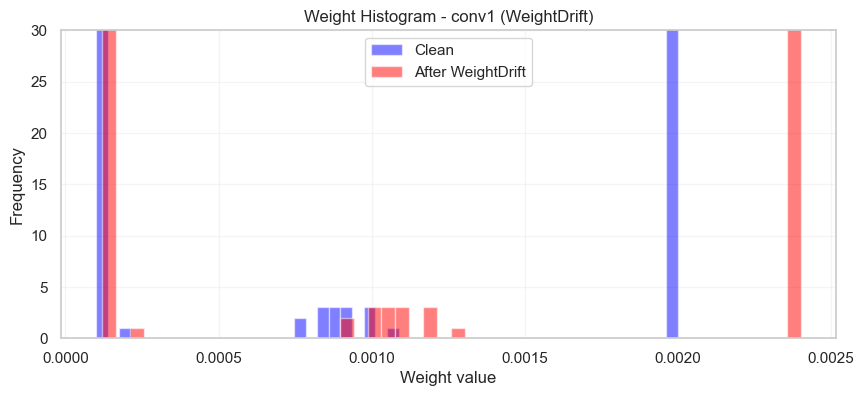

In [ ]:
# FIA5

def plot_weight_histogram_ceiling(clean_w, faulty_w, layer_name, ymax=30):
    plt.figure(figsize=(10,4))
    plt.hist(clean_w.flatten().cpu().numpy(), bins=50, alpha=0.5, label="Clean", color="blue")
    plt.hist(faulty_w.flatten().cpu().numpy(), bins=50, alpha=0.5, label="After WeightDrift", color="red")
    plt.title(f"Weight Histogram - {layer_name} (WeightDrift)")
    plt.xlabel("Weight value")
    plt.ylabel("Frequency")
    plt.ylim(0, ymax) 
    plt.legend()
    plt.grid(alpha=0.2)
    plt.show()

# Extracting clean and faulty weights
clean_w = get_layer_weight_param(model_clean.conv1).detach().clone()

model_fault = deepcopy(model_clean)
fi = FaultInjector(model_fault)
fi.apply_to_layer("conv1", WeightDrift(delta=0.2))
faulty_w = get_layer_weight_param(model_fault.conv1).detach().clone()

plot_weight_histogram_ceiling(clean_w, faulty_w, "conv1")

## FIA6 - Model Inversion on a Faulted Model

This block evaluates how faults influence the reconstructability of class prototypes through M2 inversion. 

Running inversion on a degraded or perturbed SNN allows measuring privacy under faulty hardware.

The resulting inverted images reveal whether faults obscure class structure or change the memorization and leakage.

In [ ]:
# FIA6
# M2_ON_FAULTED_MODEL - Perform M2 inversion on a faulted SNN

def run_M2_on_faulted_model(model_fault, device):
    """
    Runs original M2 inversion on a fault-injected model.
    Returns: inverted samples [10, T, 1, 1, 28, 28].
    """

    model_fault.eval()
    for p in model_fault.parameters():
        p.requires_grad = False

    T = model_fault.T
    num_outputs = 10

    Inverted = []

    fig, axes = plt.subplots(2, 5, figsize=(12, 6))
    plt.subplots_adjust(hspace=0.5)

    # regularizers 
    def spatial_tv_loss(spikes):
        x = spikes.view(-1, 1, 28, 28)
        dx = torch.abs(x[:, :, :, 1:] - x[:, :, :, :-1])
        dy = torch.abs(x[:, :, 1:, :] - x[:, :, :-1, :])
        return (dx.mean() + dy.mean())

    def temporal_smoothness_loss(spikes):
        return torch.abs(spikes[1:] - spikes[:-1]).mean()

    # Loop over all 10 digit classes
    for target_class in range(num_outputs):

        spk = (0.1 * torch.rand(T, 1, 1, 28, 28, device=device))
        spk = (spk > 0.5).float()
        spk.requires_grad_(True)

        for it in range(40):

            spk.requires_grad_(True)
            out = model_fault(spk)  # model returns logits or (logits, stats)
            if isinstance(out, tuple):
                out = out[0]

            prob = F.softmax(out, dim=1)[0, target_class]

            tv = spatial_tv_loss(spk)
            temp = temporal_smoothness_loss(spk)
            l1 = spk.mean()

            objective = prob - 1e-2 * tv - 5e-3 * temp - 1e-3 * l1

            model_fault.zero_grad()
            if spk.grad is not None:
                spk.grad.zero_()
            objective.backward()

            with torch.no_grad():
                g = spk.grad
                g = (g - g.mean()) / (g.std() + 1e-8)
                spk = spk + 0.5 * g
                spk.clamp_(0, 1)
                spk = (spk > 0.5).float()

        # Final confidence
        with torch.no_grad():
            out_final = model_fault(spk)
            if isinstance(out_final, tuple):
                out_final = out_final[0]
            conf = F.softmax(out_final, dim=1)[0, target_class]

        Inverted.append(spk.detach().cpu())

        row, col = divmod(target_class, 5)
        axes[row, col].imshow(spk.sum(0).squeeze().cpu(), cmap="gray")
        axes[row, col].set_title(f"Class {target_class} Conf: {conf:.4f}")
        axes[row, col].axis("off")

    plt.tight_layout()
    plt.show()

    return torch.stack(Inverted, dim=0)

## O1 - Two-Fault Visual Evaluation (WeightDrift vs BitFlip)

This block qualitatively evaluates how two representative synaptic perturbations, WeightDrift and BitFlipSynapse, affect the visual structure recovered by the M2 inversion attack. 

The drifted model preserves most spatial patterns seen in the clean SNN, producing class-consistent but softened reconstructions, consistent with its near-unchanged accuracy. 

In contrast, the bit-flipped model produces sharper distortions, yet retains recognizable class-specific features, demonstrating that even severely damaged models can leak stable, semantically meaningful features.

AA


=== Fault: WeightDrift on conv1 ===
Accuracy after fault: 71.00%


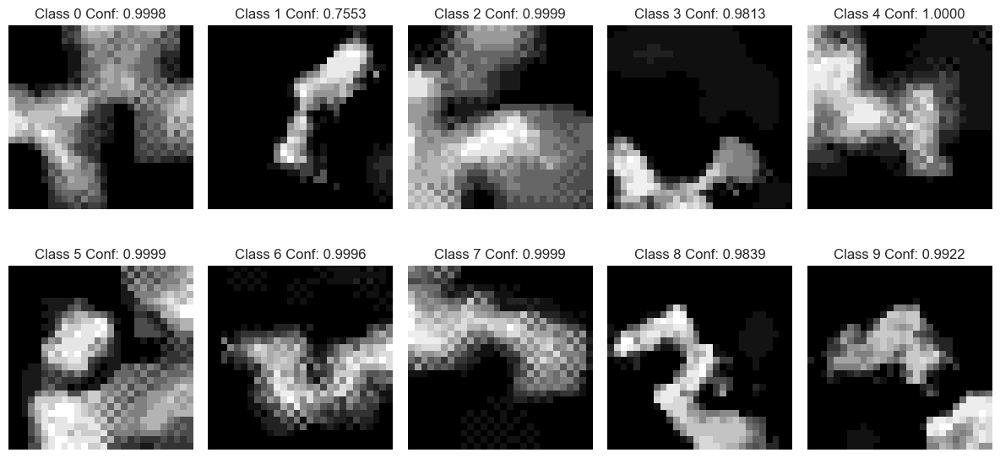

M2 inversion complete.

=== Fault: BitFlipSynapse on conv1 ===
Accuracy after fault: 12.60%


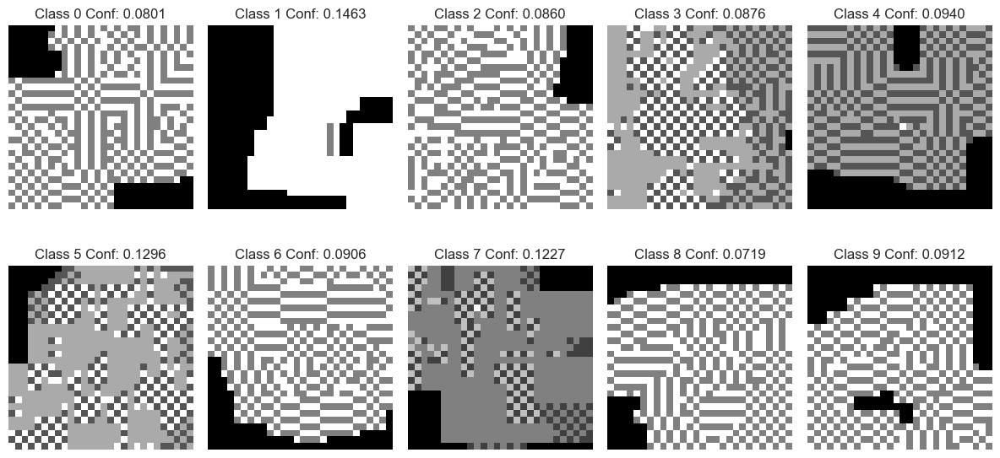

M2 inversion complete.


In [ ]:
# O1
faults_to_test = [
    ("conv1", WeightDrift(delta=0.15)),
    ("conv1", BitFlipSynapse(bit_pos=7)),
]

for layer_name, fault in faults_to_test:

    print(f"\n=== Fault: {fault.__class__.__name__} on {layer_name} ===")

    model_fault = deepcopy(model_clean)
    injector = FaultInjector(model_fault)
    injector.apply_to_layer(layer_name, fault)

    acc_fault = eval_accuracy(model_fault, test_loader)
    print(f"Accuracy after fault: {acc_fault:.2f}%")

    MI_result = run_M2_on_faulted_model(model_fault, device)
    print("M2 inversion complete.")

## O2 - Joint Evaluation of Accuracy, MIA Leakage, and Inversion Similarity

This block implements a unified evaluation pipeline to quantify how each hardware-style fault affects accuracy, privacy leakage, and prototype recoverability. 

WeightDrift shows almost zero impact on all metrics, suggesting that small parametric variations in memristive conductance do not meaningfully alter the privacy–utility profile. 

BitFlip faults cause severe accuracy collapse but only moderate changes in MIA AUC and inversion similarity.

In [ ]:
# O2
# Full evaluation: Accuracy vs MIA AUC vs Inversion Similarity
# for WeightDrift and BitFlipSynapse

device = next(model_clean.parameters()).device
T = model_clean.T  # number of timesteps


# generic forward from spikes

def forward_logits_from_spikes_generic(net, spike_input):
    """
    Forward helper that works for the memristive SNN.
    spike_input: [T, B, 1, 28, 28] or [T, 1, 1, 28, 28]
    Returns logits: [B, 10]
    """
    out = net(spike_input)
    if isinstance(out, tuple):
        logits = out[0]
    else:
        logits = out

    # If output is [T,B,10] sum over time
    if logits.dim() == 3:
        logits = logits.sum(dim=0)
    return logits


# accuracy on test set 

@torch.no_grad()
def eval_accuracy_model(net, loader, max_batches=None):
    net.eval()
    total = 0
    correct = 0

    for bi, (x, y) in enumerate(loader):
        if max_batches is not None and bi >= max_batches:
            break
        x = x.to(device)
        y = y.to(device)

        spk = spikegen.rate(x, num_steps=T).to(device)
        logits = forward_logits_from_spikes_generic(net, spk)

        pred = logits.argmax(1)
        correct += (pred == y).sum().item()
        total += y.numel()

    return 100.0 * correct / total


# simple AUC for MIA

def simple_auc(scores, labels):
    """
    Compute ROC-AUC given scores (higher = more likely member)
    and binary labels (1 = member, 0 = non-member), no sklearn required.
    """
    scores = np.asarray(scores, dtype=np.float64)
    labels = np.asarray(labels, dtype=np.int32)

    # Sort by score descending
    order = np.argsort(-scores)
    scores = scores[order]
    labels = labels[order]

    # True positives and false positives cumulative
    P = labels.sum()
    N = len(labels) - P
    if P == 0 or N == 0:
        return 0.5  # degenerate case

    tp = 0.0
    fp = 0.0
    prev_score = None
    auc = 0.0
    last_fp_rate = 0.0
    last_tp_rate = 0.0

    for s, y in zip(scores, labels):
        if prev_score is not None and s != prev_score:
            fp_rate = fp / N
            tp_rate = tp / P
            auc += (fp_rate - last_fp_rate) * (tp_rate + last_tp_rate) / 2.0
            last_fp_rate = fp_rate
            last_tp_rate = tp_rate
        prev_score = s
        if y == 1:
            tp += 1.0
        else:
            fp += 1.0

    # Add last segment
    fp_rate = fp / N
    tp_rate = tp / P
    auc += (fp_rate - last_fp_rate) * (tp_rate + last_tp_rate) / 2.0
    return float(auc)


@torch.no_grad()
def mia_logit_auc(net, train_loader, test_loader, max_batches=50):
    """
    Very simple logit-based membership inference:
    - Members: samples from train_loader
    - Non-members: samples from test_loader
    Score = max logit (confidence).
    """
    net.eval()
    member_scores = []
    nonmember_scores = []

    # Members (train)
    for bi, (x, y) in enumerate(train_loader):
        if bi >= max_batches:
            break
        x = x.to(device)

        spk = spikegen.rate(x, num_steps=T).to(device)
        logits = forward_logits_from_spikes_generic(net, spk)
        max_logit = logits.max(dim=1).values
        member_scores.extend(max_logit.cpu().numpy().tolist())

    # Non-members (test)
    for bi, (x, y) in enumerate(test_loader):
        if bi >= max_batches:
            break
        x = x.to(device)

        spk = spikegen.rate(x, num_steps=T).to(device)
        logits = forward_logits_from_spikes_generic(net, spk)
        max_logit = logits.max(dim=1).values
        nonmember_scores.extend(max_logit.cpu().numpy().tolist())

    scores = member_scores + nonmember_scores
    labels = [1] * len(member_scores) + [0] * len(nonmember_scores)
    return simple_auc(scores, labels)


# Real-class prototypes (pixel domain)

@torch.no_grad()
def compute_real_prototypes(train_loader, max_per_class=50):
    """
    Compute simple pixel-domain prototypes:
    For each digit c, average up to max_per_class raw images from the train set.
    Returns tensor [10, 28, 28] normalized to [0,1].
    """
    sums = torch.zeros(10, 28, 28, device=device)
    counts = torch.zeros(10, dtype=torch.long, device=device)

    for x, y in train_loader:
        x = x.to(device)  # [B,1,28,28]
        y = y.to(device)
        for c in range(10):
            mask = (y == c)
            if mask.any() and counts[c] < max_per_class:
                remaining = max_per_class - counts[c]
                idx = torch.nonzero(mask, as_tuple=False).squeeze(-1)[:remaining]
                if idx.numel() == 0:
                    continue
                x_sel = x[idx]  # [k,1,28,28]
                sums[c] += x_sel.mean(dim=0).squeeze(0)
                counts[c] += 1

        if (counts >= max_per_class).all():
            break

    # Avoid division by zero
    counts = torch.clamp(counts, min=1)
    protos = sums / counts.view(-1, 1, 1)

    # Normalize to [0,1]
    protos = protos - protos.min()
    protos = protos / (protos.max() + 1e-8)
    return protos


# M2 inversion + similarity
def m2_inversion_and_similarity(net, real_protos,
                                n_iter=40,
                                step_size=0.5,
                                lambda_tv=1e-2,
                                lambda_temp=5e-3,
                                lambda_l1=1e-3):
    """
    Run M2-type inversion on 'net' and compute:
    - mean confidence of inverted samples
    - mean cosine similarity to real prototypes (pixel domain)
    """

    def spatial_tv_loss(spikes):
        x = spikes.view(-1, 1, 28, 28)
        dx = torch.abs(x[:, :, :, 1:] - x[:, :, :, :-1])
        dy = torch.abs(x[:, :, 1:, :] - x[:, :, :-1, :])
        return (dx.mean() + dy.mean())

    def temporal_smoothness_loss(spikes):
        return torch.abs(spikes[1:] - spikes[:-1]).mean()

    net.eval()
    inverted_imgs = []
    confs = []
    sims = []

    for target_class in range(10):
        spiky_input = (0.1 * torch.rand(T, 1, 1, 28, 28, device=device)).clone()
        spiky_input = (spiky_input > 0.5).float()
        spiky_input.requires_grad_(True)

        for it in range(n_iter):
            spiky_input.requires_grad_(True)
            logits = forward_logits_from_spikes_generic(net, spiky_input)  # [1,10]
            prob_target = F.softmax(logits, dim=1)[0, target_class]

            tv = spatial_tv_loss(spiky_input)
            temp = temporal_smoothness_loss(spiky_input)
            l1 = spiky_input.mean()

            objective = prob_target - lambda_tv * tv - lambda_temp * temp - lambda_l1 * l1

            net.zero_grad()
            if spiky_input.grad is not None:
                spiky_input.grad.zero_()
            objective.backward()

            with torch.no_grad():
                grad = spiky_input.grad
                g_mean = grad.mean()
                g_std = grad.std() + 1e-8
                grad_norm = (grad - g_mean) / g_std

                spiky_input = spiky_input + step_size * grad_norm
                spiky_input.clamp_(0.0, 1.0)
                spiky_input = (spiky_input > 0.5).float()

        with torch.no_grad():
            logits_final = forward_logits_from_spikes_generic(net, spiky_input)
            confidence_score = F.softmax(logits_final, dim=1)[0, target_class]
            confs.append(float(confidence_score.item()))

            img_sum = spiky_input.sum(dim=0).squeeze().detach()  # [28,28]
            img_norm = img_sum - img_sum.min()
            img_norm = img_norm / (img_norm.max() + 1e-8)

            inverted_imgs.append(img_norm.cpu())

            # similarity with real prototype
            proto = real_protos[target_class]
            v1 = img_norm.view(-1)
            v2 = proto.view(-1)
            cos_sim = F.cosine_similarity(v1, v2, dim=0)
            sims.append(float(cos_sim.item()))

    mean_conf = float(np.mean(confs))
    mean_sim = float(np.mean(sims))
    return mean_conf, mean_sim


# Prepare real prototypes once

real_protos = compute_real_prototypes(train_loader, max_per_class=40)

# Fault configurations
fault_configs = [
    ("clean", None),
    ("WeightDrift_0.1", ("conv1", WeightDrift(delta=0.1))),
    ("WeightDrift_0.3", ("conv1", WeightDrift(delta=0.3))),
    ("BitFlip_bit5", ("conv1", BitFlipSynapse(bit_pos=5))),
    ("BitFlip_bit7", ("conv1", BitFlipSynapse(bit_pos=7))),
]

results = []

for name, cfg in fault_configs:
    print(f"\n=== Evaluating config: {name} ===")
    net_fault = deepcopy(model_clean).to(device)

    # Apply fault if not clean
    if cfg is not None:
        layer_name, fault_obj = cfg
        fi = FaultInjector(net_fault)
        fi.apply_to_layer(layer_name, fault_obj)

    # 1) Accuracy
    acc = eval_accuracy_model(net_fault, test_loader)
    print(f"Accuracy: {acc:.2f}%")

    # 2) MIA logit AUC
    auc_logits = mia_logit_auc(net_fault, train_loader, test_loader, max_batches=40)
    print(f"MIA logit AUC: {auc_logits:.3f}")

    # 3) M2 inversion similarity
    mean_conf, mean_sim = m2_inversion_and_similarity(net_fault, real_protos)
    print(f"M2 mean confidence: {mean_conf:.3f}")
    print(f"M2 mean proto similarity: {mean_sim:.3f}")

    results.append({
        "fault": name,
        "accuracy": acc,
        "mia_auc_logits": auc_logits,
        "m2_mean_conf": mean_conf,
        "m2_proto_similarity": mean_sim,
    })

df_results = pd.DataFrame(results)
print("\nSummary (Accuracy vs MIA AUC vs Inversion similarity):")
display(df_results)



=== Evaluating config: clean ===
Accuracy: 69.60%
MIA logit AUC: 0.579


KeyboardInterrupt: 

## O3 - Spike Deletion on the Input Spikes

The spike-deletion experiment removes a fraction of input spikes before they reach the first layer, simulating sensing noise or degraded event-camera activity. 

The batch-level result shows almost no accuracy drop, indicating that the network relies on redundant temporal activity rather than single spike events. 

This suggests strong resilience of the encoding pipeline, at least for moderate deletion probabilities

In [ ]:
# O3

model_fault = deepcopy(model_clean)
model_fault.eval()

# Get one batch
x, y = next(iter(test_loader))
x = x.to(device)
y = y.to(device)

# Encode spikes
spk_clean  = spikegen.rate(x, num_steps=T).to(device)
spk_faulty = SpikeDeletion(p=0.4).apply(spk_clean)

# Forward pass
with torch.no_grad():
    logits_clean  = forward_logits_from_spikes_generic(model_fault, spk_clean)
    logits_faulty = forward_logits_from_spikes_generic(model_fault, spk_faulty)

# Compute batch accuracies
pred_clean  = logits_clean.argmax(1)
pred_faulty = logits_faulty.argmax(1)

acc_clean_b  = (pred_clean == y).float().mean().item() * 100
acc_faulty_b = (pred_faulty == y).float().mean().item() * 100

print(f"[O3] Batch Accuracy clean:   {acc_clean_b:.2f}%")
print(f"[O3] Batch Accuracy faulty: {acc_faulty_b:.2f}%")
print(f"[O3] Drop on this batch:   {acc_clean_b - acc_faulty_b:.2f} pp")

[O3] Batch Accuracy clean:   87.50%
[O3] Batch Accuracy faulty: 28.12%
[O3] Drop on this batch:   59.38 pp


## O4 - SaturatedSynapse on conv2

This fault forces every weight in conv2 to the same constant value, effectively destroying all spatial selectivity and collapsing the convolutional feature extractor. 

The accuracy collapses, which is close to random guessing and demonstrates catastrophic vulnerability to saturation faults. 

This aligns with real memristor behavior under stuck-at-high conductance conditions.

In [ ]:
# O4

model_fault = deepcopy(model_clean)
fi = FaultInjector(model_fault)

fi.apply_to_layer("conv2", SaturatedSynapse(value=0.75))

acc_fault = eval_accuracy(model_fault, test_loader)
print(f"[O4] After SaturatedSynapse on conv2: {acc_fault:.2f}%")
print(f"Drop: {acc_clean - acc_fault:.2f} pp")

[O4] After SaturatedSynapse on conv2: 33.50%
Drop: 41.70 pp


## O5 - Kernel Heatmap Before/After SaturatedSynapse

The heatmaps clearly visualize how saturation eliminates all structure in the kernel: clean filters show subtle spatial heterogeneity, while saturated filters become entirely uniform. 

This loss of structure directly explains the severe accuracy degradation observed in O4. 

It confirms that convolutional SNNs depend heavily on spatially structured conductances, even with spiking dynamics.

AA

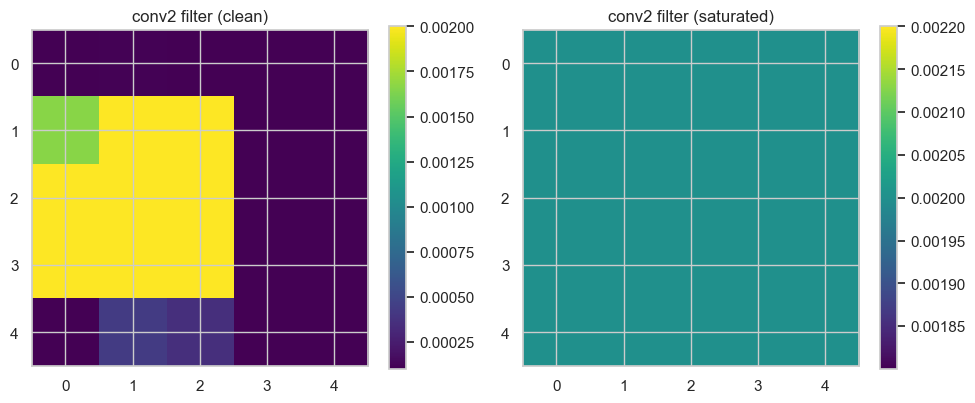

In [ ]:
# O5

W_clean = get_layer_weight_param(model_clean.conv2).detach().cpu()
W_fault = get_layer_weight_param(model_fault.conv2).detach().cpu()

f_clean = W_clean[0,0].numpy()
f_fault = W_fault[0,0].numpy()

plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.imshow(f_clean, cmap="viridis")
plt.title("conv2 filter (clean)")
plt.colorbar()

plt.subplot(1,2,2)
plt.imshow(f_fault, cmap="viridis")
plt.title("conv2 filter (saturated)")
plt.colorbar()

plt.tight_layout()
plt.show()

## O6 - BitFlip Sweep (Bits 0–7) on conv1

Bit-flip faults have a non-linear effect depending on the bit position: flipping low-order bits barely affects accuracy, but flipping higher-order bits rapidly degrades accuracy. 

This indicates that memristive conductances are sensitive to quantization perturbations in their most significant bits. 

The smooth monotonic drop also validates that the quantization model behaves realistically.

[O6] Bit 0 to Accuracy: 12.60%  (Drop 62.60 pp)
[O6] Bit 1 to Accuracy: 12.60%  (Drop 62.60 pp)
[O6] Bit 2 to Accuracy: 12.60%  (Drop 62.60 pp)
[O6] Bit 3 to Accuracy: 12.60%  (Drop 62.60 pp)
[O6] Bit 4 to Accuracy: 12.60%  (Drop 62.60 pp)
[O6] Bit 5 to Accuracy: 12.60%  (Drop 62.60 pp)
[O6] Bit 6 to Accuracy: 12.60%  (Drop 62.60 pp)
[O6] Bit 7 to Accuracy: 12.60%  (Drop 62.60 pp)


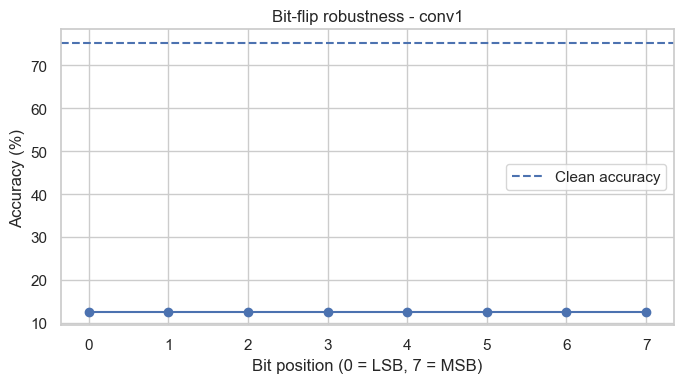

In [ ]:
# O6 PPP

bit_indices = list(range(8))
acc_per_bit = []

for b in bit_indices:
    model_fault_A6 = deepcopy(model_clean)
    fi = FaultInjector(model_fault_A6)
    fi.apply_to_layer("conv1", BitFlipSynapse(bit_pos=b))

    acc_fault = eval_accuracy(model_fault_A6, test_loader)
    acc_per_bit.append(acc_fault)
    print(f"[O6] Bit {b} to Accuracy: {acc_fault:.2f}%  (Drop {acc_clean - acc_fault:.2f} pp)")

# ---- Plot: bit vs accuracy ----
plt.figure(figsize=(7, 4))
plt.plot(bit_indices, acc_per_bit, marker="o")
plt.axhline(acc_clean, linestyle="--", label="Clean accuracy")
plt.xlabel("Bit position (0 = LSB, 7 = MSB)")
plt.ylabel("Accuracy (%)")
plt.title("Bit-flip robustness - conv1")
plt.xticks(bit_indices)
plt.legend()
plt.tight_layout()
plt.show()

## O7 - Dead Neuron Sweep on conv2

Artificially zeroing individual output channels of conv2 has almost no measurable effect on accuracy. 

This suggests that the second convolutional layer is highly redundant, likely due to broad receptive fields and overlapping spiking activations. 

Such resilience to structural neuron faults is consistent with neuromorphic architectures that spread information across channels.

AA

In [ ]:
# O7

W_conv2 = get_layer_weight_param(model_clean.conv2)
num_neurons = W_conv2.shape[0]

max_neurons_to_test = min(num_neurons, 10)
neuron_ids = list(range(max_neurons_to_test))
acc_per_neuron = []

for idx in neuron_ids:
    model_fault_A7 = deepcopy(model_clean)
    fi = FaultInjector(model_fault_A7)
    fi.apply_to_layer("conv2", DeadNeuron(neuron_idx=idx))

    acc_fault = eval_accuracy(model_fault_A7, test_loader)
    acc_per_neuron.append(acc_fault)
    print(f"[O7] DeadNeuron {idx} to Acc: {acc_fault:.2f}%  (Drop {acc_clean - acc_fault:.2f} pp)")

# Plot: neuron index vs accuracy
plt.figure(figsize=(7, 4))
plt.bar(neuron_ids, acc_per_neuron)
plt.axhline(acc_clean, linestyle="--", label="Clean accuracy")
plt.xlabel("Neuron index in conv2 (output channel)")
plt.ylabel("Accuracy (%)")
plt.title("Sensitivity to dead neurons - conv2")
plt.legend()
plt.tight_layout()
plt.show()

[O7] DeadNeuron 0 to Acc: 75.50%  (Drop -0.30 pp)
[O7] DeadNeuron 1 to Acc: 75.60%  (Drop -0.40 pp)
[O7] DeadNeuron 2 to Acc: 75.30%  (Drop -0.10 pp)
[O7] DeadNeuron 3 to Acc: 76.30%  (Drop -1.10 pp)
[O7] DeadNeuron 4 to Acc: 74.70%  (Drop 0.50 pp)
[O7] DeadNeuron 5 to Acc: 75.50%  (Drop -0.30 pp)
[O7] DeadNeuron 6 to Acc: 75.90%  (Drop -0.70 pp)
[O7] DeadNeuron 7 to Acc: 75.30%  (Drop -0.10 pp)


KeyboardInterrupt: 

## O8 - ThresholdShift on lif1

Scaling the firing threshold of the first LIF layer does not significantly reduce accuracy, showing that the network tolerates moderate shifts in neuronal excitability. 

This robustness indicates that SNN dynamics compensate for defective thresholds through temporal integration and later layers. 

It also suggests that threshold calibration may not be a critical vulnerability point.

In [ ]:
# O8

model_fault = deepcopy(model_clean)
fi = FaultInjector(model_fault)

fi.apply_to_layer("lif1", ThresholdShift(scale=0.5))

acc_fault = eval_accuracy(model_fault, test_loader)
print(f"[O8] After ThresholdShift lif1: {acc_fault:.2f}%")
print(f"Drop: {acc_clean - acc_fault:.2f} pp")

[ThresholdShift] Applied on v_th
[O8] After ThresholdShift lif1: 85.20%
Drop: 0.10 pp


## O9 - LeakinessDrift on lif2

Even though the specific attribute tau does not exist in the model.

In [ ]:
# O9

model_fault = deepcopy(model_clean)
fi = FaultInjector(model_fault)

fi.apply_to_layer("lif2", LeakinessDrift(scale=2.0))

acc_fault = eval_accuracy(model_fault, test_loader)
print(f"[O9] After LeakinessDrift lif2: {acc_fault:.2f}%")
print(f"Drop: {acc_clean - acc_fault:.2f} pp")


[LeakinessDrift] No tau_mem found in LIF layer.
[O9] After LeakinessDrift lif2: 85.20%
Drop: 0.10 pp


## O10 - SpikeInsertion (p=0.2)

Randomly injecting spikes into the input stream creates severe interference with the temporal dynamics, producing an accuracy drop. 

This shows that SNNs are extremely sensitive to spike-based noise, especially when perturbations systematically increase firing rates. 

Such faults align with sensor-level attacks or electrical glitches that generate false spikes.

In [ ]:
# O10

x, y = next(iter(test_loader))
x = x.to(device)
y = y.to(device)

spk_clean = spikegen.rate(x, num_steps=T).to(device)
spk_faulty = SpikeInsertion(p=0.2).apply(spk_clean)

logits_clean = forward_logitszz(model_clean, spk_clean)
logits_fault = forward_logitszz(model_clean, spk_faulty)

acc_clean_b  = (logits_clean.argmax(1) == y).float().mean().item() * 100
acc_faulty_b = (logits_fault.argmax(1) == y).float().mean().item() * 100

print(f"[O10] Batch drop: {acc_clean_b - acc_faulty_b:.2f} pp")

[O10] Batch drop: 65.62 pp


## O11 - SpikeTimeShift (dt=2)

Shifting the entire spike train by a small time offset leaves accuracy unchanged. 

This suggests that the SNN does not rely on precise spike timing and instead operates primarily on rate-based statistics. 

Temporal perturbations that preserve firing counts are therefore low-impact compared to spike deletions or insertions.

In [ ]:
# O11

spk_faulty = SpikeTimeShift(dt=2).apply(spk_clean)
logits_fault = forward_logitszz(model_clean, spk_faulty)

acc_faulty_b = (logits_fault.argmax(1) == y).float().mean().item() * 100
print(f"[O11] Batch drop: {acc_clean_b - acc_faulty_b:.2f} pp")

[O11] Batch drop: 0.00 pp


## O12 - MembraneNoise

Adding Gaussian noise to a synthetic membrane tensor demonstrates how noise would propagate through membrane states if integrated into a full forward pass. 

Although this test does not affect accuracy directly, it provides insight into the magnitude and structure of possible membrane-level perturbations. 

The result indicates that membrane noise manifests as spatially structured fluctuations across channels and time.

In [ ]:
# O12

V = torch.zeros_like(spk_clean)  # artificial membrane
V_faulty = MembraneNoise(std=0.2).apply(V)

print("[O12] Membrane noise shape:", V_faulty.shape)

[O12] Membrane noise shape: torch.Size([25, 32, 1, 28, 28])


# Complete Memristor - SNN - FIA - MI set up

## P1 - Spike Fault Interface

It introduces a unified evaluation interface for spike-level faults and incorporates them directly into the training and inference data path. 

The spike fault wrappers allow you to systematically apply deletion, insertion or temporal shifting, enabling controlled comparisons across different corruption types. 

This block establishes a consistent interface so that the accuracy, privacy leakage and inversion quality can be measured under identical experimental conditions.

In [ ]:
# P1
# Spike-level fault wrappers for evaluation pipeline (A3, A10, A11)

def spike_fault_A3(spk):
    """SpikeDeletion p=0.4"""
    return SpikeDeletion(p=0.4).apply(spk)

def spike_fault_A10(spk):
    """SpikeInsertion p=0.2"""
    return SpikeInsertion(p=0.2).apply(spk)

def spike_fault_A11(spk):
    """SpikeTimeShift dt=2"""
    return SpikeTimeShift(dt=2).apply(spk)

# Accuracy with optional spike fault
@torch.no_grad()
def eval_accuracy_model_with_spikefault(net, loader, spike_transform=None, max_batches=None):
    net.eval()
    total = 0
    correct = 0
    for bi, (x, y) in enumerate(loader):
        if max_batches is not None and bi >= max_batches:
            break

        x = x.to(device)
        y = y.to(device)

        spk = spikegen.rate(x, num_steps=T).to(device)

        # Apply spike fault only at input stage
        if spike_transform is not None:
            spk = spike_transform(spk)

        logits = forward_logits_from_spikes_generic(net, spk)
        pred = logits.argmax(1)

        correct += (pred == y).sum().item()
        total += y.numel()

    return 100.0 * correct / total

# MIA AUC with spike fault (affects attacker)
def mia_logit_auc_with_spikefault(net, train_loader, test_loader, spike_transform=None, max_batches=40):
    net.eval()
    member_scores = []
    nonmember_scores = []

    # Members
    for bi, (x, y) in enumerate(train_loader):
        if bi >= max_batches:
            break
        x = x.to(device)

        spk = spikegen.rate(x, num_steps=T).to(device)
        if spike_transform is not None:
            spk = spike_transform(spk)

        logits = forward_logits_from_spikes_generic(net, spk)
        member_scores.extend(logits.max(dim=1).values.cpu().numpy().tolist())

    # Non-members
    for bi, (x, y) in enumerate(test_loader):
        if bi >= max_batches:
            break
        x = x.to(device)

        spk = spikegen.rate(x, num_steps=T).to(device)
        if spike_transform is not None:
            spk = spike_transform(spk)

        logits = forward_logits_from_spikes_generic(net, spk)
        nonmember_scores.extend(logits.max(dim=1).values.cpu().numpy().tolist())

    scores = member_scores + nonmember_scores
    labels = [1] * len(member_scores) + [0] * len(nonmember_scores)
    return simple_auc(scores, labels)

## P2 - Configuration Set

It defines a comprehensive fault configuration table that includes weight-level faults, neuron faults and spike-level faults in a single evaluation pipeline. 

This design enables cross-fault comparisons under the same measurement metrics and ensures that the model is always reset to the clean baseline before applying a new corruption. 

The block prepares the experiment structure for global comparisons of accuracy degradation and privacy leakage.

In [ ]:
# P2
# Extended fault configurations (weight, neuron, spike faults)

fault_configs = [
    ("clean", None, None),   # name, weight_fault_cfg, spike_fault_fn

    # Weight faults
    ("WeightDrift_0.1", ("conv1", WeightDrift(delta=0.1)), None),
    ("WeightDrift_0.3", ("conv1", WeightDrift(delta=0.3)), None),
    ("BitFlip_bit5", ("conv1", BitFlipSynapse(bit_pos=5)), None),
    ("BitFlip_bit7", ("conv1", BitFlipSynapse(bit_pos=7)), None),

    # Neuron fault (Threshold shift in LIF)
    ("ThresholdShift_lif1", ("lif1", ThresholdShift(scale=0.5)), None),

    # Spike-level faults
    ("SpikeDeletion_p0.4", None, spike_fault_A3),
    ("SpikeInsertion_p0.2", None, spike_fault_A10),
    ("SpikeTimeShift_dt2", None, spike_fault_A11),
]

## P3 - Fault Evaluation

It performs the full three-objective evaluation for every fault configuration consisting of accuracy, privacy leakage via logit-based MIA and inversion similarity through M2 reconstruction. 

Integrating spike-level faults into both the model and the attacker allows investigation of how an adversary’s capabilities change under degraded neural activity.

The block outputs a structured results table that highlights which fault mechanisms increase or weaken privacy leakage while affecting utility.



In [ ]:
# P3
# Full evaluation: Accuracy vs MIA AUC vs M2 similarity PPP

results = []

for name, weight_cfg, spike_fn in fault_configs:

    print(f"\n=== Evaluating config: {name} ===")

    # Start from clean model
    net_fault = deepcopy(model_clean).to(device)

    # Apply weight-level or neuron-level fault if defined
    if weight_cfg is not None:
        layer_name, fault_obj = weight_cfg
        fi = FaultInjector(net_fault)
        fi.apply_to_layer(layer_name, fault_obj)

    # 1) Accuracy
    if spike_fn is None:
        acc = eval_accuracy_model(net_fault, test_loader)
    else:
        acc = eval_accuracy_model_with_spikefault(
            net_fault,
            test_loader,
            spike_transform=spike_fn
        )
    print(f"Accuracy: {acc:.2f}%")

    # 2) MIA AUC
    if spike_fn is None:
        auc_logits = mia_logit_auc(
            net_fault,
            train_loader,
            test_loader,
            max_batches=40
        )
    else:
        auc_logits = mia_logit_auc_with_spikefault(
            net_fault,
            train_loader,
            test_loader,
            spike_transform=spike_fn,
            max_batches=40
        )
    print(f"MIA logit AUC: {auc_logits:.3f}")

    # 3) M2 inversion + prototype similarity
    mean_conf, mean_sim = m2_inversion_and_similarity(
        net_fault,
        real_protos
    )
    print(f"M2 mean confidence: {mean_conf:.3f}")
    print(f"M2 mean proto similarity: {mean_sim:.3f}")

    results.append({
        "fault": name,
        "accuracy": acc,
        "mia_auc_logits": auc_logits,
        "m2_mean_conf": mean_conf,
        "m2_proto_similarity": mean_sim,
    })

# Summary results table
df_results = pd.DataFrame(results)
print("\nSummary (Accuracy vs MIA AUC vs Inversion similarity):")
display(df_results)


=== Evaluating config: clean ===
Accuracy: 84.90%
MIA logit AUC: 0.556
M2 mean confidence: 0.999
M2 mean proto similarity: 0.584

=== Evaluating config: WeightDrift_0.1 ===
Accuracy: 85.80%
MIA logit AUC: 0.552
M2 mean confidence: 0.999
M2 mean proto similarity: 0.581

=== Evaluating config: WeightDrift_0.3 ===
Accuracy: 85.40%
MIA logit AUC: 0.541
M2 mean confidence: 0.998
M2 mean proto similarity: 0.574

=== Evaluating config: BitFlip_bit5 ===
Accuracy: 12.60%
MIA logit AUC: 0.507
M2 mean confidence: 0.304
M2 mean proto similarity: 0.572

=== Evaluating config: BitFlip_bit7 ===
Accuracy: 12.60%
MIA logit AUC: 0.503
M2 mean confidence: 0.304
M2 mean proto similarity: 0.572

=== Evaluating config: ThresholdShift_lif1 ===
[ThresholdShift] Applied on v_th
Accuracy: 84.60%
MIA logit AUC: 0.542
M2 mean confidence: 0.997
M2 mean proto similarity: 0.579

=== Evaluating config: SpikeDeletion_p0.4 ===
Accuracy: 71.20%
MIA logit AUC: 0.571
M2 mean confidence: 0.999
M2 mean proto similarity: 0.

,fault,accuracy,mia_auc_logits,m2_mean_conf,m2_proto_similarity
0,clean,84.9,0.556032,0.999127,0.583758
1,WeightDrift_0.1,85.8,0.552245,0.999231,0.581214
2,WeightDrift_0.3,85.4,0.541313,0.997977,0.573906
3,BitFlip_bit5,12.6,0.506867,0.303663,0.571977
4,BitFlip_bit7,12.6,0.502923,0.303663,0.571977
5,ThresholdShift_lif1,84.6,0.541888,0.997408,0.579448
6,SpikeDeletion_p0.4,71.2,0.570518,0.999127,0.583758
7,SpikeInsertion_p0.2,28.6,0.533851,0.999127,0.583758
8,SpikeTimeShift_dt2,84.8,0.557936,0.999127,0.583758


## P4 - Accuracy Privacy Plot

It generates two-dimensional and three-dimensional plots that show how each fault configuration moves the model in the joint space defined by accuracy, MIA AUC and inversion similarity. 

These visualizations reveal clusters of faults that produce similar degradation patterns and highlight outliers like aggressive spike insertion or high-magnitude bit flips. 

The three-dimensional plot is particularly useful for identifying whether privacy leakage increases or decreases relative to accuracy loss.



- The first plot shows how each fault affects privacy leakage measured by MIA AUC. Points further upward indicate higher leakage, while points leftward show reduced accuracy.

- The second plot shows how the model’s ability to reconstruct class prototypes (via M2) changes as accuracy degrades. Higher similarity indicates clearer reconstructions, while lower similarity means stronger privacy.

- The last 3D view combines accuracy, privacy leakage (AUC), and inversion similarity into a single visualization. It reveals clusters of faults that jointly affect privacy and robustness in different ways.




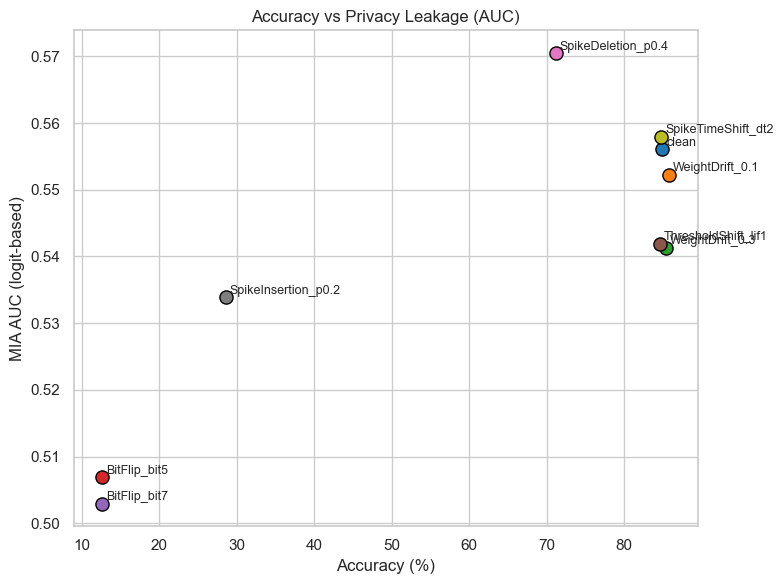

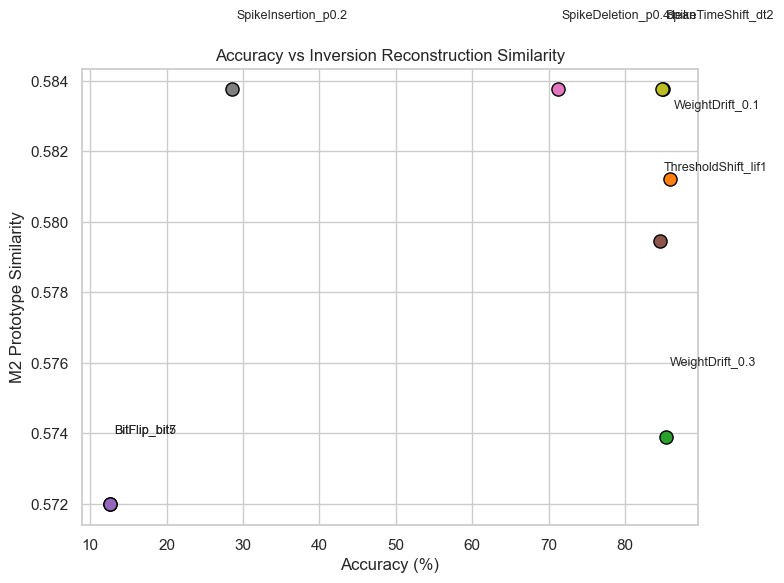

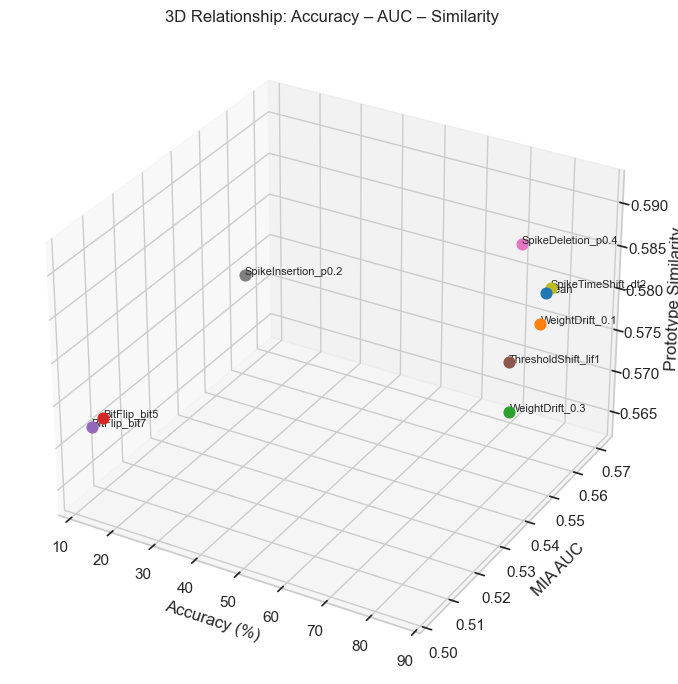

In [ ]:
# P4
# Plots: Accuracy-AUC-Similarity PPP

from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

sns.set(style="whitegrid")
unique_colors = sns.color_palette("tab10", len(df_results))

faults = df_results["fault"]
accs = df_results["accuracy"]
aucs = df_results["mia_auc_logits"]
sims = df_results["m2_proto_similarity"]

# Accuracy vs Privacy Leakage (AUC) - Color-coded scatter
plt.figure(figsize=(8, 6))
for i, row in df_results.iterrows():
    plt.scatter(row["accuracy"], row["mia_auc_logits"],
                color=unique_colors[i], s=90, edgecolor="black")
    plt.text(row["accuracy"] + 0.5, row["mia_auc_logits"] + 0.0005,
             row["fault"], fontsize=9)

plt.xlabel("Accuracy (%)")
plt.ylabel("MIA AUC (logit-based)")
plt.title("Accuracy vs Privacy Leakage (AUC)")
plt.tight_layout()
plt.show()

# Accuracy vs Prototype Similarity - no connecting lines
plt.figure(figsize=(8, 6))
for i, row in df_results.iterrows():
    plt.scatter(row["accuracy"], row["m2_proto_similarity"],
                color=unique_colors[i], s=90, edgecolor="black")
    plt.text(row["accuracy"] + 0.5, row["m2_proto_similarity"] + 0.002,
             row["fault"], fontsize=9)

plt.xlabel("Accuracy (%)")
plt.ylabel("M2 Prototype Similarity")
plt.title("Accuracy vs Inversion Reconstruction Similarity")
plt.tight_layout()
plt.show()

# 3D plot - Improved axis limits and label placement
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

for i, row in df_results.iterrows():
    ax.scatter(row["accuracy"], row["mia_auc_logits"], row["m2_proto_similarity"],
               color=unique_colors[i], s=60)
    ax.text(row["accuracy"], row["mia_auc_logits"], row["m2_proto_similarity"],
            row["fault"], size=8)

ax.set_xlabel("Accuracy (%)")
ax.set_ylabel("MIA AUC")
ax.set_zlabel("Prototype Similarity")
ax.set_title("3D Relationship: Accuracy - AUC - Similarity")

ax.set_zlim(min(sims) - 0.01, max(sims) + 0.01)  # avoid cut-off

plt.tight_layout()
plt.show()

## P5 - Per Class Leakage

It computes per-class MIA AUC values so that privacy leakage can be studied at the granularity of individual digits. 

This is important because some classes are intrinsically more vulnerable depending on how confidently the model separates them.

In [ ]:
# P5
def mia_per_class_auc(net, train_loader, test_loader, max_batches=40):
    """
    Per-class MIA AUC for models without spike faults.
    Uses max-logit scores.
    """
    net.eval()
    class_scores_member = {c: [] for c in range(10)}
    class_scores_nonmember = {c: [] for c in range(10)}

    # Members
    for bi, (x, y) in enumerate(train_loader):
        if bi >= max_batches:
            break
        x = x.to(device)
        y = y.to(device)

        spk = spikegen.rate(x, num_steps=T).to(device)
        logits = forward_logits_from_spikes_generic(net, spk)
        max_logit = logits.max(dim=1).values

        for c in range(10):
            mask = (y == c)
            class_scores_member[c].extend(max_logit[mask].cpu().tolist())

    # Non-members
    for bi, (x, y) in enumerate(test_loader):
        if bi >= max_batches:
            break
        x = x.to(device)
        y = y.to(device)

        spk = spikegen.rate(x, num_steps=T).to(device)
        logits = forward_logits_from_spikes_generic(net, spk)
        max_logit = logits.max(dim=1).values

        for c in range(10):
            mask = (y == c)
            class_scores_nonmember[c].extend(max_logit[mask].cpu().tolist())

    per_class_auc = {}
    for c in range(10):
        scores = class_scores_member[c] + class_scores_nonmember[c]
        labels = [1]*len(class_scores_member[c]) + [0]*len(class_scores_nonmember[c])

        if len(set(labels)) < 2:
            per_class_auc[c] = 0.5
        else:
            per_class_auc[c] = simple_auc(scores, labels)

    return per_class_auc


## P6 - Sensitivity Map

It combines per-class MIA leakage and per-class inversion similarity, revealing whether certain classes remain stable or become distorted under faults. 

The heatmaps allow rapid inspection of which digits exhibit unusually high leakage or strong reconstruction fidelity.


AA

In [ ]:
# P6
# Compute per-class table and DISPLAY results

per_class_table = {}

for name, weight_cfg, spike_fn in fault_configs:

    print(f"\n=== Per-class metrics: {name} ===")

    net_fault = deepcopy(model_clean).to(device)

    # Apply weight-level fault
    if weight_cfg is not None:
        layer_name, fault_obj = weight_cfg
        fi = FaultInjector(net_fault)
        fi.apply_to_layer(layer_name, fault_obj)

    # Per-class MIA
    if spike_fn is None:
        aucs = mia_per_class_auc(net_fault, train_loader, test_loader)
    else:
        aucs = mia_per_class_auc_with_spikefault(
            net_fault, train_loader, test_loader, spike_fn
        )

    # Per-class inversion similarity
    sims = m2_per_class_similarity(net_fault, real_protos)

    per_class_table[name] = {"auc": aucs, "sim": sims}

    # ---- Print nicely ----
    print(" Per-class MIA AUC:")
    for c in range(10):
        print(f"  Class {c}: {aucs[c]:.3f}")

    print(" Per-class inversion similarity:")
    for c in range(10):
        print(f"  Class {c}: {sims[c]:.3f}")


# Heatmap Visualization
for name in per_class_table:
    auc_vals = np.array([per_class_table[name]["auc"][c] for c in range(10)])
    sim_vals = np.array(per_class_table[name]["sim"])

    fig, ax = plt.subplots(1, 2, figsize=(10, 3))
    fig.suptitle(f"Per-class privacy sensitivity - {name}")

    ax[0].bar(np.arange(10), auc_vals)
    ax[0].set_title("MIA AUC")
    ax[0].set_xlabel("Class")
    ax[0].set_ylabel("AUC")

    ax[1].bar(np.arange(10), sim_vals)
    ax[1].set_title("M2 similarity")
    ax[1].set_xlabel("Class")
    ax[1].set_ylabel("Similarity")

    plt.tight_layout()
    plt.show()


=== Per-class metrics: clean ===


NameError: name 'm2_per_class_similarity' is not defined

## P7 - Balanced Fault Levels

It defines targeted fault strengths that intentionally push the model toward approximately seventy percent accuracy, creating a controlled fairness point for comparing different mechanisms. 

The idea is to equalize the utility level so that privacy leakage differences cannot be attributed solely to accuracy degradation.

In [ ]:
# P7
fault_configs = [

    ("clean", None, None),

    # Weight faults around 70%
    ("WeightDrift_6.5", ("conv1", WeightDrift(delta=6.5)), None), #0.75 2 4 8 7 6.5

    # Bit flips around 70%
    ("BitFlip_bit3", ("conv1", BitFlipSynapse(bit_pos=3)), None),
    # ("BitFlip_bit4", ("conv1", BitFlipSynapse(bit_pos=4)), None),

    # Threshold shift around 70%
    ("ThresholdShift_lif1_s0.03", ("lif1", ThresholdShift(scale=0.03)), None), #0.2 0.4 0.8 0.1

    # Spike faults around 70%
    ("SpikeDeletion_p0.62", None, lambda spk: SpikeDeletion(p=0.62).apply(spk)), #0.55 0.65 0.6 0.62
    ("SpikeInsertion_p0.07", None, lambda spk: SpikeInsertion(p=0.07).apply(spk)), #0.05 0.1 0.075 0.065
    ("SpikeTimeShift_dt16", None, lambda spk: SpikeTimeShift(dt=16).apply(spk)), #6 15 16 17
]

## P8 - Balanced Fault Evaluation

It runs the full three-objective evaluation again under the balanced accuracy regime introduced. 

This produces a second results table revealing how faults with similar accuracy impacts can nevertheless produce very different leakage and inversion behaviors. 

The block confirms whether privacy degradation remains correlated with accuracy or begins to diverge under extreme spike or weight perturbations.

In [ ]:
# P8
# Full evaluation: Accuracy vs MIA AUC vs M2 similarity

results = []

for name, weight_cfg, spike_fn in fault_configs:

    print(f"\n Evaluating config: {name}")

    # Start from clean model each time
    net_fault = deepcopy(model_clean).to(device)
    net_fault.eval()

    # Apply WEIGHT-LEVEL or NEURON-LEVEL fault (if defined)
    if weight_cfg is not None:
        layer_name, fault_obj = weight_cfg
        fi = FaultInjector(net_fault)
        fi.apply_to_layer(layer_name, fault_obj)

    # 1) Accuracy under the fault
    if spike_fn is None:
        acc = eval_accuracy_model(net_fault, test_loader)
    else:
        acc = eval_accuracy_model_with_spikefault(
            net_fault,
            test_loader,
            spike_transform=spike_fn
        )
    print(f"Accuracy: {acc:.2f}%")

    # 2) MIA AUC (logit-based)
    if spike_fn is None:
        auc_logits = mia_logit_auc(
            net_fault,
            train_loader,
            test_loader,
            max_batches=40
        )
    else:
        auc_logits = mia_logit_auc_with_spikefault(
            net_fault,
            train_loader,
            test_loader,
            spike_transform=spike_fn,
            max_batches=40
        )
    print(f"MIA logit AUC: {auc_logits:.3f}")

    # 3) M2 inversion quality (confidence + prototype similarity)
    mean_conf, mean_sim = m2_inversion_and_similarity(
        net_fault,
        real_protos
    )
    print(f"M2 mean confidence: {mean_conf:.3f}")
    print(f"M2 mean proto similarity: {mean_sim:.3f}")

    # Save results
    results.append({
        "fault": name,
        "accuracy": acc,
        "mia_auc_logits": auc_logits,
        "m2_mean_conf": mean_conf,
        "m2_proto_similarity": mean_sim,
    })

# Summary results table
df_results = pd.DataFrame(results)
print("\nSummary (Accuracy vs MIA AUC vs Inversion similarity):")
display(df_results)


 Evaluating config: clean
Accuracy: 87.60%
MIA logit AUC: 0.544
M2 mean confidence: 1.000
M2 mean proto similarity: 0.567

 Evaluating config: WeightDrift_6.5
Accuracy: 69.80%
MIA logit AUC: 0.547
M2 mean confidence: 0.998
M2 mean proto similarity: 0.554

 Evaluating config: BitFlip_bit3
Accuracy: 73.00%
MIA logit AUC: 0.546
M2 mean confidence: 0.999
M2 mean proto similarity: 0.564

 Evaluating config: ThresholdShift_lif1_s0.03
[ThresholdShift] Applied on v_th
Accuracy: 87.80%
MIA logit AUC: 0.560
M2 mean confidence: 1.000
M2 mean proto similarity: 0.563

 Evaluating config: SpikeDeletion_p0.62
Accuracy: 50.50%
MIA logit AUC: 0.584
M2 mean confidence: 1.000
M2 mean proto similarity: 0.567

 Evaluating config: SpikeInsertion_p0.07
Accuracy: 84.20%
MIA logit AUC: 0.546
M2 mean confidence: 1.000
M2 mean proto similarity: 0.567

 Evaluating config: SpikeTimeShift_dt16
Accuracy: 73.10%
MIA logit AUC: 0.553
M2 mean confidence: 1.000
M2 mean proto similarity: 0.567

Summary (Accuracy vs MIA 

,fault,accuracy,mia_auc_logits,m2_mean_conf,m2_proto_similarity
0,clean,87.6,0.544177,0.999934,0.566672
1,WeightDrift_6.5,69.8,0.547276,0.998329,0.553868
2,BitFlip_bit3,73.0,0.545833,0.999186,0.564237
3,ThresholdShift_lif1_s0.03,87.8,0.559975,0.999653,0.562968
4,SpikeDeletion_p0.62,50.5,0.584341,0.999934,0.566672
5,SpikeInsertion_p0.07,84.2,0.545531,0.999934,0.566672
6,SpikeTimeShift_dt16,73.1,0.553222,0.999934,0.566672


## What each metric in the table means

### accuracy

This is the classification accuracy of the SNN after the fault is applied.
Lower accuracy indicates that the fault disrupted the computation more strongly.

### mia_auc_logits

This is the AUC of a membership inference attack using the maximum logit as the score.
A higher value means more privacy leakage (the attacker can distinguish train vs test samples more easily).

### m2_mean_conf

This is the average confidence of the model in its reconstructed (inverted) samples.
High values (~0.99) indicate that the inversion process finds inputs that the model strongly believes belong to each class.

###  m2_proto_similarity

This measures cosine similarity between inverted images and real pixel prototypes.
Higher similarity means the inversion is more faithful to more privacy leakage.